# Data Preproccessing

In [2]:
#importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer,SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn import linear_model
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
import pickle
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler

In [3]:
#importing the data
df=pd.read_csv('comp.csv')
df.head() #observe the data


,nominal coarse aggregate size (mm),RCA%,RCA used as,RCA source,CA condition,Rubber (%),Rubber type,Fiber (%),fiber type,fiber length (mm),W/C,plastisizer,fly ash %,GGBS,silica fume,slump (mm),compressive strength (MPa) (28days)
0,25.0,0,none,none,dried,0.0,none,0.0,none,0.0,0.4,no,0.0,0,0.0,140.0,37.2
1,25.0,0,none,none,dried,0.0,none,0.0,none,0.0,0.4,no,0.0,0,0.0,140.0,37.2
2,25.0,0,none,none,dried,0.0,none,0.0,none,0.0,0.4,no,0.0,0,0.0,140.0,37.2
3,25.0,0,none,none,dried,0.0,none,0.0,none,0.0,0.4,no,0.0,0,0.0,205.0,34.2
4,25.0,0,none,none,dried,0.0,none,0.0,none,0.0,0.4,no,0.0,0,0.0,205.0,34.2


In [4]:
#droping unnecessary columns
df.drop(columns=['RCA used as'],inplace=True)
df.drop(columns=['RCA source'],inplace=True)
df.drop(columns=['CA condition'],inplace=True)
df.drop(columns=['Rubber type'],inplace=True)
df.drop(columns=['fiber length (mm)'],inplace=True)
df.drop(columns=['plastisizer'],inplace=True)
df.drop(columns=['fly ash %'],inplace=True)
df.drop(columns=['GGBS'],inplace=True)
df.drop(columns=['silica fume'],inplace=True)
df.drop(columns=['slump (mm)'],inplace=True)


In [5]:
#observe the dataset after droping
df.head()

,nominal coarse aggregate size (mm),RCA%,Rubber (%),Fiber (%),fiber type,W/C,compressive strength (MPa) (28days)
0,25.0,0,0.0,0.0,none,0.4,37.2
1,25.0,0,0.0,0.0,none,0.4,37.2
2,25.0,0,0.0,0.0,none,0.4,37.2
3,25.0,0,0.0,0.0,none,0.4,34.2
4,25.0,0,0.0,0.0,none,0.4,34.2


In [6]:
#decreasing number of categories the fiber type
df.loc[df["fiber type"] == "Basalt", "fiber type"] = "other"
df.loc[df["fiber type"] == "synthetic2", "fiber type"] = "other"
df.loc[df["fiber type"] == "synthetic1", "fiber type"] = "other"
df.loc[df["fiber type"] == "hybrid", "fiber type"] = "other"
df.loc[df["fiber type"] == "nylon", "fiber type"] = "other"

In [7]:
#observe the categories after operation
df['fiber type'].value_counts()

none             643
steel            122
polypropylene    112
other             34
Name: fiber type, dtype: int64

In [8]:
#search for missing values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 911 entries, 0 to 910
Data columns (total 7 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   nominal coarse aggregate size (mm)   884 non-null    float64
 1   RCA%                                 911 non-null    int64  
 2   Rubber (%)                           911 non-null    float64
 3   Fiber (%)                            911 non-null    float64
 4   fiber type                           911 non-null    object 
 5   W/C                                  903 non-null    float64
 6   compressive strength (MPa) (28days)  911 non-null    float64
dtypes: float64(5), int64(1), object(1)
memory usage: 49.9+ KB


In [9]:
df.corr()['compressive strength (MPa) (28days)']

nominal coarse aggregate size (mm)    -0.216922
RCA%                                  -0.134257
Rubber (%)                            -0.305161
Fiber (%)                              0.246750
W/C                                   -0.507444
compressive strength (MPa) (28days)    1.000000
Name: compressive strength (MPa) (28days), dtype: float64

<AxesSubplot:>

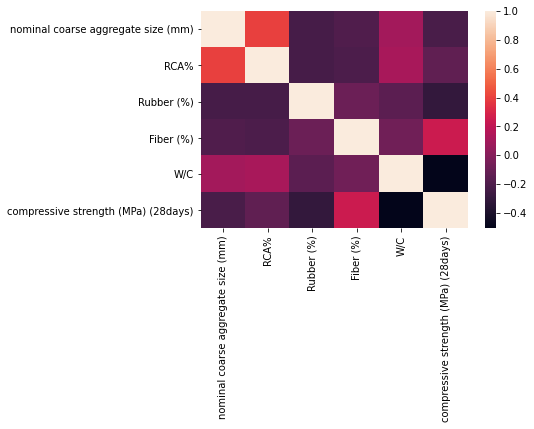

In [10]:
sns.heatmap(df.corr())

C:\Users\Avijit\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='nominal coarse aggregate size (mm)', ylabel='Density'>

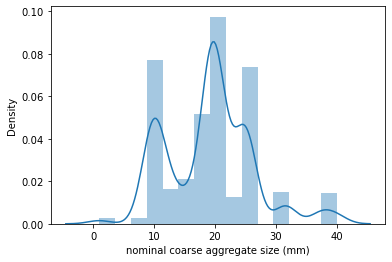

In [11]:
sns.distplot(df['nominal coarse aggregate size (mm)'])

C:\Users\Avijit\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='RCA%', ylabel='Density'>

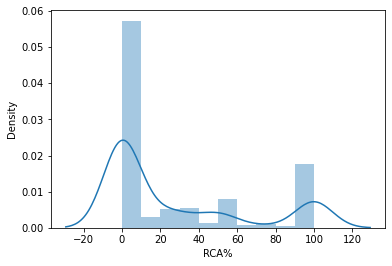

In [12]:
sns.distplot(df['RCA%'])


C:\Users\Avijit\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='compressive strength (MPa) (28days)', ylabel='Density'>

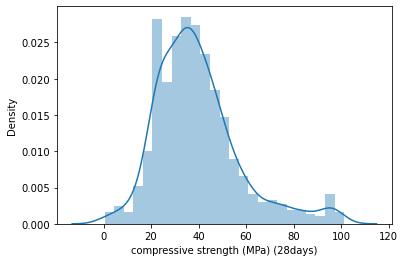

In [13]:

sns.distplot(df['compressive strength (MPa) (28days)'])

In [14]:
df.describe()

,nominal coarse aggregate size (mm),RCA%,Rubber (%),Fiber (%),W/C,compressive strength (MPa) (28days)
count,884.000000,911.000000,911.000000,911.000000,903.000000,911.000000
mean,19.222257,26.837541,4.456861,0.249887,0.462869,39.449712
std,7.093832,38.126942,12.617869,0.512754,0.095000,17.738077
min,1.000000,0.000000,0.000000,0.000000,0.250000,0.370000
25%,12.500000,0.000000,0.000000,0.000000,0.400000,27.130556
50%,20.000000,0.000000,0.000000,0.000000,0.450000,36.820000
75%,25.000000,50.000000,0.000000,0.225000,0.530000,47.085000
max,40.000000,100.000000,100.000000,3.428571,0.770000,101.320000


In [15]:
from pandas_profiling import ProfileReport
prof = ProfileReport(df)
prof.to_file(output_file='output.html')

In [16]:
#defining X and y and then spliting them for train test
X = df.drop(columns=['compressive strength (MPa) (28days)'])
y = df['compressive strength (MPa) (28days)']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=2)

scaler = MinMaxScaler()



In [17]:
#using columntransformer to fill the missing values
transformer1 = ColumnTransformer(transformers=[

    ('tnf1',KNNImputer(n_neighbors=3,weights='distance'),[0,1,2,3,5]),
    ('tnf2',SimpleImputer(strategy='most_frequent'),['fiber type']),
    ('tnf3',OneHotEncoder(sparse=False,drop='first',dtype=np.int32),[4])
],remainder='passthrough')



In [18]:
#using columntransformer to fill the missing values
transformer = ColumnTransformer(transformers=[

    ('tnf1',KNNImputer(n_neighbors=3,weights='distance'),[0,1,2,3,5]),
    ('tnf2',SimpleImputer(strategy='most_frequent'),['fiber type']),
    ('tnf3',OneHotEncoder(sparse=False,drop='first',dtype=np.int32),[4])
],remainder='passthrough')

In [19]:
#columntransformer converts the data into a np array, so convert them into pandas dataframe(the column names are missing here)
X_train_NEWS=pd.DataFrame(transformer.fit_transform(X_train))
X_test_NEWS=pd.DataFrame(transformer.transform(X_test))

#droping fiber type column after onehotencoder has imputed the missing values
X_train_NEWS.drop(columns=[5],inplace=True)
X_test_NEWS.drop(columns=[5],inplace=True)

#scaling the data for training and testing
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train_NEWS2 = pd.DataFrame(scaler.fit_transform(X_train_NEWS))
X_test_NEWS2 = pd.DataFrame(scaler.transform(X_test_NEWS))
pickle.dump(scaler, open('scaler.pkl','wb'))

#the column names are given based on the original data set, 'fiber type none is when all other fiber type is 0'
x_train_NEWS2_cols=['nominal coarse aggregate size (mm)','RCA%','Rubber (%)','Fiber (%)','W/C','other', 'polypropylene','steel']
X_train_NEWS2.columns=x_train_NEWS2_cols
X_test_NEWS2.columns=x_train_NEWS2_cols

In [20]:
#after scaling the description ranges from 0 to 1
X_train_NEWS2.describe()

,nominal coarse aggregate size (mm),RCA%,Rubber (%),Fiber (%),W/C,other,polypropylene,steel
count,728.000000,728.000000,728.000000,728.000000,728.000000,728.000000,728.000000,728.000000
mean,0.469742,0.274505,0.044915,0.071863,0.411750,0.035714,0.118132,0.133242
std,0.181505,0.384820,0.128710,0.149350,0.179725,0.185704,0.322986,0.340069
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.333333,0.000000,0.000000,0.000000,0.288462,0.000000,0.000000,0.000000
50%,0.487179,0.000000,0.000000,0.000000,0.384615,0.000000,0.000000,0.000000
75%,0.615385,0.500000,0.000000,0.058333,0.538462,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [21]:
def adjustedR2(r2,n,k):
    return r2-(k-1)/(n-k)*(1-r2)

#creating an empty list having the original column names of the original dataset
features = list(df.columns.values)

#creating an empty dataframe for storing important calculated data into the dataframe
evaluation = pd.DataFrame({'Model': [],
                           'Details':[],
                           'RMSE(train)':[],
                           'R-squared (train)':[],
                           'Adj R-squared (train)':[],
                           'MAE (train)':[],
                           'RMSE (test)':[],
                           'R-squared (test)':[],
                           'Adj R-squared (test)':[],
                           'MAE(test)':[],
                           '10-Fold Cross Validation':[]})

#creating an ampty dataframe for calculating the mean of cross validation
evaluation2 = pd.DataFrame({'Model': [],
                           'Test':[],
                           '1':[],
                           '2':[],
                           '3':[],
                           '4':[],
                           '5':[],
                           '6':[],
                           '7':[],
                           '8':[],
                           '9':[],
                           '10':[],
                           'Mean':[]})

# Linear Regression

In [22]:
complex_model_1=linear_model.LinearRegression()
complex_model_1.fit(X_train_NEWS2, y_train)

pred = complex_model_1.predict(X_test_NEWS2)
rmse_train = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))
r2_train = float(format(complex_model_1.score(X_train_NEWS2, y_train),'.3f'))
ar2_train = float(format(adjustedR2(complex_model_1.score(X_train_NEWS2, y_train),X_train_NEWS2.shape[0],len(features)),'.3f'))
mae_train=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))

rmse_test = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))
r2_test = float(format(complex_model_1.score(X_test_NEWS2, y_test),'.3f'))
ar2_test = float(format(adjustedR2(complex_model_1.score(X_test_NEWS2, y_test),X_test_NEWS2.shape[0],len(features)),'.3f'))
mae_test=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))

cv = float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10).mean(),'.3f'))

cv_train_rmse=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error')
cv_train_rmse_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error').mean(),'.3f'))

cv_train_r2=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2')
cv_train_r2_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),'.3f'))

cv_train_ar2=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2'),X_train_NEWS2.shape[0],len(features))
cv_train_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),X_train_NEWS2.shape[0],len(features))

cv_train_mae=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error')
cv_train_mae_m=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error').mean()

cv_test_rmse=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error')
cv_test_rmse_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error').mean()

cv_test_r2=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2')
cv_test_r2_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean()

cv_test_ar2=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2'),X_test_NEWS2.shape[0],len(features))
cv_test_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean(),X_test_NEWS2.shape[0],len(features))

cv_test_mae=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error')
cv_test_mae_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error').mean()


r = evaluation2.shape[0]
evaluation2.loc[r] = ['LR','Train RMSE',float(format(cv_train_rmse[0],'.3f')),float(format(cv_train_rmse[1],'.3f')),float(format(cv_train_rmse[2],'.3f')),float(format(cv_train_rmse[3],'.3f')),float(format(cv_train_rmse[4],'.3f')),float(format(cv_train_rmse[5],'.3f')),float(format(cv_train_rmse[6],'.3f')),float(format(cv_train_rmse[7],'.3f')),float(format(cv_train_rmse[8],'.3f')),float(format(cv_train_rmse[9],'.3f')),float(format(cv_train_rmse_m,'.3f'))]
evaluation2.loc[r+1] = ['LR','Train R2',float(format(cv_train_r2[0],'.3f')),float(format(cv_train_r2[1],'.3f')),float(format(cv_train_r2[2],'.3f')),float(format(cv_train_r2[3],'.3f')),float(format(cv_train_r2[4],'.3f')),float(format(cv_train_r2[5],'.3f')),float(format(cv_train_r2[6],'.3f')),float(format(cv_train_r2[7],'.3f')),float(format(cv_train_r2[8],'.3f')),float(format(cv_train_r2[9],'.3f')),float(format(cv_train_r2_m,'.3f'))]
evaluation2.loc[r+2] = ['LR','Train ar2',float(format(cv_train_ar2[0],'.3f')),float(format(cv_train_ar2[1],'.3f')),float(format(cv_train_ar2[2],'.3f')),float(format(cv_train_ar2[3],'.3f')),float(format(cv_train_ar2[4],'.3f')),float(format(cv_train_ar2[5],'.3f')),float(format(cv_train_ar2[6],'.3f')),float(format(cv_train_ar2[7],'.3f')),float(format(cv_train_ar2[8],'.3f')),float(format(cv_train_ar2[9],'.3f')),float(format(cv_train_ar2_m,'.3f'))]
evaluation2.loc[r+3] = ['LR','Train mae',float(format(cv_train_mae[0],'.3f')),float(format(cv_train_mae[1],'.3f')),float(format(cv_train_mae[2],'.3f')),float(format(cv_train_mae[3],'.3f')),float(format(cv_train_mae[4],'.3f')),float(format(cv_train_mae[5],'.3f')),float(format(cv_train_mae[6],'.3f')),float(format(cv_train_mae[7],'.3f')),float(format(cv_train_mae[8],'.3f')),float(format(cv_train_mae[9],'.3f')),float(format(cv_train_mae_m,'.3f'))]
evaluation2.loc[r+4] = ['LR','Test RMSE',float(format(cv_test_rmse[0],'.3f')),float(format(cv_test_rmse[1],'.3f')),float(format(cv_test_rmse[2],'.3f')),float(format(cv_test_rmse[3],'.3f')),float(format(cv_test_rmse[4],'.3f')),float(format(cv_test_rmse[5],'.3f')),float(format(cv_test_rmse[6],'.3f')),float(format(cv_test_rmse[7],'.3f')),float(format(cv_test_rmse[8],'.3f')),float(format(cv_test_rmse[9],'.3f')),float(format(cv_test_rmse_m,'.3f'))]
evaluation2.loc[r+5] = ['LR','Test R2',float(format(cv_test_r2[0],'.3f')),float(format(cv_test_r2[1],'.3f')),float(format(cv_test_r2[2],'.3f')),float(format(cv_test_r2[3],'.3f')),float(format(cv_test_r2[4],'.3f')),float(format(cv_test_r2[5],'.3f')),float(format(cv_test_r2[6],'.3f')),float(format(cv_test_r2[7],'.3f')),float(format(cv_test_r2[8],'.3f')),float(format(cv_test_r2[9],'.3f')),float(format(cv_test_r2_m,'.3f'))]
evaluation2.loc[r+6] = ['LR','Test ar2',float(format(cv_test_ar2[0],'.3f')),float(format(cv_test_ar2[1],'.3f')),float(format(cv_test_ar2[2],'.3f')),float(format(cv_test_ar2[3],'.3f')),float(format(cv_test_ar2[4],'.3f')),float(format(cv_test_ar2[5],'.3f')),float(format(cv_test_ar2[6],'.3f')),float(format(cv_test_ar2[7],'.3f')),float(format(cv_test_ar2[8],'.3f')),float(format(cv_test_ar2[9],'.3f')),float(format(cv_test_ar2_m,'.3f'))]
evaluation2.loc[r+7] = ['LR','Test mae',float(format(cv_test_mae[0],'.3f')),float(format(cv_test_mae[1],'.3f')),float(format(cv_test_mae[2],'.3f')),float(format(cv_test_mae[3],'.3f')),float(format(cv_test_mae[4],'.3f')),float(format(cv_test_mae[5],'.3f')),float(format(cv_test_mae[6],'.3f')),float(format(cv_test_mae[7],'.3f')),float(format(cv_test_mae[8],'.3f')),float(format(cv_test_mae[9],'.3f')),float(format(cv_test_mae_m,'.3f')) ]

r = evaluation.shape[0]
evaluation.loc[r] = ['LR','All features',rmse_train,r2_train,ar2_train,mae_train,rmse_test,r2_test,ar2_test,mae_test,cv]
evaluation.sort_values(by = '10-Fold Cross Validation', ascending=False)

,Model,Details,RMSE(train),R-squared (train),Adj R-squared (train),MAE (train),RMSE (test),R-squared (test),Adj R-squared (test),MAE(test),10-Fold Cross Validation
0,LR,All features,12.409,0.51,0.506,9.912,12.161,0.53,0.514,9.938,0.485


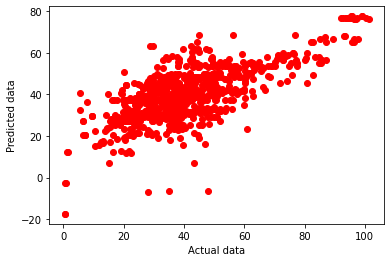

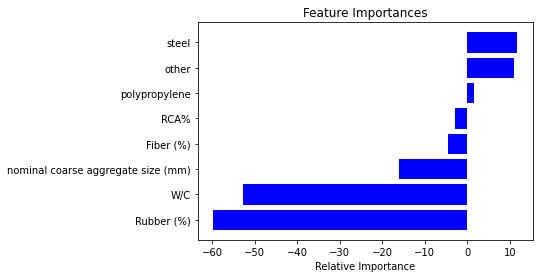

[-16.01257704  -2.82844866 -59.74850952  -4.60336488 -52.73271779
  11.03322485   1.56993156  11.77984126]
Intercept: 70.28801413238226
Coefficients: [-16.01257704  -2.82844866 -59.74850952  -4.60336488 -52.73271779
  11.03322485   1.56993156  11.77984126]


In [23]:
# Print the predicted and actual value for the test set
MLR_y_test_prediction= complex_model_1.predict(X_test_NEWS2)
np.savetxt('LR_test_prdiction.csv', MLR_y_test_prediction, delimiter=',', fmt='%s')
np.savetxt('LR_test_actual.csv', y_test, delimiter=',', fmt='%s')

# Print the predicted and actual value for the traing set
MLR_y_train_prediction= complex_model_1.predict(X_train_NEWS2)
np.savetxt('LR_train_prediction.csv', MLR_y_train_prediction, delimiter=',', fmt='%s')
np.savetxt('LR_train_actual.csv', y_train, delimiter=',', fmt='%s')

transformer = ColumnTransformer(transformers=[

    ('tnf1',KNNImputer(n_neighbors=3,weights='distance'),[0,1,2,3,5]),
    ('tnf2',SimpleImputer(strategy='most_frequent'),['fiber type']),
    ('tnf3',OneHotEncoder(sparse=False,drop='first',dtype=np.int32),[4])
],remainder='passthrough')

X_NEWS=pd.DataFrame(transformer.fit_transform(X))
X_NEWS.drop(columns=[5],inplace=True)


from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_NEWS2 = pd.DataFrame(scaler.fit_transform(X_NEWS))
pickle.dump(scaler, open('scaler.pkl','wb'))

x_NEWS2_cols=['nominal coarse aggregate size (mm)','RCA%','Rubber (%)','Fiber (%)','W/C','other', 'polypropylene','steel']
X_NEWS2.columns=x_NEWS2_cols


X_standardized = X_NEWS2
MLR_y_pred_entire_data = complex_model_1.predict(X_standardized)
np.savetxt('LR_entire_prediction.csv', MLR_y_pred_entire_data, delimiter=',', fmt='%s')
np.savetxt('LR_entire_actual.csv', y, delimiter=',', fmt='%s')

plt.plot(y, MLR_y_pred_entire_data,  'ro')
plt.ylabel('Predicted data')
plt.xlabel('Actual data')
plt.show()


features = list(X_train_NEWS2.columns.values)
importances = complex_model_1.coef_
indices = np.argsort(importances)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

print(importances)

#equation for Linear Regression
print('Intercept: {}'.format(complex_model_1.intercept_))
print('Coefficients: {}'.format(complex_model_1.coef_))

# Ridge Regression

In [24]:
complex_model_1 = linear_model.Ridge(alpha=2.3)
complex_model_1.fit(X_train_NEWS2, y_train)

pred = complex_model_1.predict(X_test_NEWS2)
rmse_train = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))
r2_train = float(format(complex_model_1.score(X_train_NEWS2, y_train),'.3f'))
ar2_train = float(format(adjustedR2(complex_model_1.score(X_train_NEWS2, y_train),X_train_NEWS2.shape[0],len(features)),'.3f'))
mae_train=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))

rmse_test = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))
r2_test = float(format(complex_model_1.score(X_test_NEWS2, y_test),'.3f'))
ar2_test = float(format(adjustedR2(complex_model_1.score(X_test_NEWS2, y_test),X_test_NEWS2.shape[0],len(features)),'.3f'))
mae_test=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))

cv = float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10).mean(),'.3f'))

cv_train_rmse=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error')
cv_train_rmse_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error').mean(),'.3f'))

cv_train_r2=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2')
cv_train_r2_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),'.3f'))

cv_train_ar2=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2'),X_train_NEWS2.shape[0],len(features))
cv_train_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),X_train_NEWS2.shape[0],len(features))

cv_train_mae=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error')
cv_train_mae_m=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error').mean()

cv_test_rmse=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error')
cv_test_rmse_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error').mean()

cv_test_r2=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2')
cv_test_r2_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean()

cv_test_ar2=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2'),X_test_NEWS2.shape[0],len(features))
cv_test_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean(),X_test_NEWS2.shape[0],len(features))

cv_test_mae=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error')
cv_test_mae_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error').mean()


r = evaluation2.shape[0]
evaluation2.loc[r] = ['RR','Train RMSE',float(format(cv_train_rmse[0],'.3f')),float(format(cv_train_rmse[1],'.3f')),float(format(cv_train_rmse[2],'.3f')),float(format(cv_train_rmse[3],'.3f')),float(format(cv_train_rmse[4],'.3f')),float(format(cv_train_rmse[5],'.3f')),float(format(cv_train_rmse[6],'.3f')),float(format(cv_train_rmse[7],'.3f')),float(format(cv_train_rmse[8],'.3f')),float(format(cv_train_rmse[9],'.3f')),float(format(cv_train_rmse_m,'.3f'))]
evaluation2.loc[r+1] = ['RR','Train R2',float(format(cv_train_r2[0],'.3f')),float(format(cv_train_r2[1],'.3f')),float(format(cv_train_r2[2],'.3f')),float(format(cv_train_r2[3],'.3f')),float(format(cv_train_r2[4],'.3f')),float(format(cv_train_r2[5],'.3f')),float(format(cv_train_r2[6],'.3f')),float(format(cv_train_r2[7],'.3f')),float(format(cv_train_r2[8],'.3f')),float(format(cv_train_r2[9],'.3f')),float(format(cv_train_r2_m,'.3f'))]
evaluation2.loc[r+2] = ['RR','Train ar2',float(format(cv_train_ar2[0],'.3f')),float(format(cv_train_ar2[1],'.3f')),float(format(cv_train_ar2[2],'.3f')),float(format(cv_train_ar2[3],'.3f')),float(format(cv_train_ar2[4],'.3f')),float(format(cv_train_ar2[5],'.3f')),float(format(cv_train_ar2[6],'.3f')),float(format(cv_train_ar2[7],'.3f')),float(format(cv_train_ar2[8],'.3f')),float(format(cv_train_ar2[9],'.3f')),float(format(cv_train_ar2_m,'.3f'))]
evaluation2.loc[r+3] = ['RR','Train mae',float(format(cv_train_mae[0],'.3f')),float(format(cv_train_mae[1],'.3f')),float(format(cv_train_mae[2],'.3f')),float(format(cv_train_mae[3],'.3f')),float(format(cv_train_mae[4],'.3f')),float(format(cv_train_mae[5],'.3f')),float(format(cv_train_mae[6],'.3f')),float(format(cv_train_mae[7],'.3f')),float(format(cv_train_mae[8],'.3f')),float(format(cv_train_mae[9],'.3f')),float(format(cv_train_mae_m,'.3f'))]
evaluation2.loc[r+4] = ['RR','Test RMSE',float(format(cv_test_rmse[0],'.3f')),float(format(cv_test_rmse[1],'.3f')),float(format(cv_test_rmse[2],'.3f')),float(format(cv_test_rmse[3],'.3f')),float(format(cv_test_rmse[4],'.3f')),float(format(cv_test_rmse[5],'.3f')),float(format(cv_test_rmse[6],'.3f')),float(format(cv_test_rmse[7],'.3f')),float(format(cv_test_rmse[8],'.3f')),float(format(cv_test_rmse[9],'.3f')),float(format(cv_test_rmse_m,'.3f'))]
evaluation2.loc[r+5] = ['RR','Test R2',float(format(cv_test_r2[0],'.3f')),float(format(cv_test_r2[1],'.3f')),float(format(cv_test_r2[2],'.3f')),float(format(cv_test_r2[3],'.3f')),float(format(cv_test_r2[4],'.3f')),float(format(cv_test_r2[5],'.3f')),float(format(cv_test_r2[6],'.3f')),float(format(cv_test_r2[7],'.3f')),float(format(cv_test_r2[8],'.3f')),float(format(cv_test_r2[9],'.3f')),float(format(cv_test_r2_m,'.3f'))]
evaluation2.loc[r+6] = ['RR','Test ar2',float(format(cv_test_ar2[0],'.3f')),float(format(cv_test_ar2[1],'.3f')),float(format(cv_test_ar2[2],'.3f')),float(format(cv_test_ar2[3],'.3f')),float(format(cv_test_ar2[4],'.3f')),float(format(cv_test_ar2[5],'.3f')),float(format(cv_test_ar2[6],'.3f')),float(format(cv_test_ar2[7],'.3f')),float(format(cv_test_ar2[8],'.3f')),float(format(cv_test_ar2[9],'.3f')),float(format(cv_test_ar2_m,'.3f'))]
evaluation2.loc[r+7] = ['RR','Train mae',float(format(cv_test_mae[0],'.3f')),float(format(cv_test_mae[1],'.3f')),float(format(cv_test_mae[2],'.3f')),float(format(cv_test_mae[3],'.3f')),float(format(cv_test_mae[4],'.3f')),float(format(cv_test_mae[5],'.3f')),float(format(cv_test_mae[6],'.3f')),float(format(cv_test_mae[7],'.3f')),float(format(cv_test_mae[8],'.3f')),float(format(cv_test_mae[9],'.3f')),float(format(cv_test_mae_m,'.3f')) ]

r = evaluation.shape[0]
evaluation.loc[r] = ['RR','All features',rmse_train,r2_train,ar2_train,mae_train,rmse_test,r2_test,ar2_test,mae_test,cv]
evaluation.sort_values(by = '10-Fold Cross Validation', ascending=False)

,Model,Details,RMSE(train),R-squared (train),Adj R-squared (train),MAE (train),RMSE (test),R-squared (test),Adj R-squared (test),MAE(test),10-Fold Cross Validation
0,LR,All features,12.409,0.510,0.506,9.912,12.161,0.530,0.514,9.938,0.485
1,RR,All features,12.525,0.501,0.496,10.034,12.261,0.522,0.503,10.044,0.477


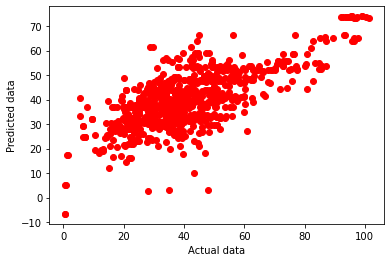

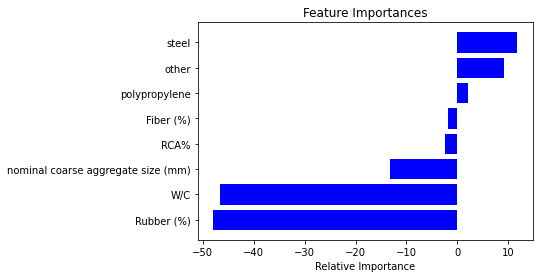

[-13.20565064  -2.49285797 -47.94698741  -1.80416848 -46.48655942
   9.13884461   2.05638095  11.75516225]


In [25]:
# Print the predicted and actual value for the test set
MLR_y_test_prediction= complex_model_1.predict(X_test_NEWS2)
np.savetxt('RR_test_prdiction.csv', MLR_y_test_prediction, delimiter=',', fmt='%s')
np.savetxt('RR_test_actual.csv', y_test, delimiter=',', fmt='%s')

# Print the predicted and actual value for the traing set
MLR_y_train_prediction= complex_model_1.predict(X_train_NEWS2)
np.savetxt('RR_train_prediction.csv', MLR_y_train_prediction, delimiter=',', fmt='%s')
np.savetxt('RR_train_actual.csv', y_train, delimiter=',', fmt='%s')

transformer = ColumnTransformer(transformers=[

    ('tnf1',KNNImputer(n_neighbors=3,weights='distance'),[0,1,2,3,5]),
    ('tnf2',SimpleImputer(strategy='most_frequent'),['fiber type']),
    ('tnf3',OneHotEncoder(sparse=False,drop='first',dtype=np.int32),[4])
],remainder='passthrough')

X_NEWS=pd.DataFrame(transformer.fit_transform(X))
X_NEWS.drop(columns=[5],inplace=True)


from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_NEWS2 = pd.DataFrame(scaler.fit_transform(X_NEWS))
pickle.dump(scaler, open('scaler.pkl','wb'))

x_NEWS2_cols=['nominal coarse aggregate size (mm)','RCA%','Rubber (%)','Fiber (%)','W/C','other', 'polypropylene','steel']
X_NEWS2.columns=x_NEWS2_cols


X_standardized = X_NEWS2
MLR_y_pred_entire_data = complex_model_1.predict(X_standardized)
np.savetxt('RR_entire_prediction.csv', MLR_y_pred_entire_data, delimiter=',', fmt='%s')
np.savetxt('RR_entire_actual.csv', y, delimiter=',', fmt='%s')

import matplotlib.pyplot as plt
plt.plot(y, MLR_y_pred_entire_data,  'ro')
plt.ylabel('Predicted data')
plt.xlabel('Actual data')
plt.show()


features = list(X_train_NEWS2.columns.values)
importances = complex_model_1.coef_
import numpy as np
indices = np.argsort(importances)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

print(importances)

# KNeighborsRegressor

In [26]:
complex_model_1 = KNeighborsRegressor(n_neighbors=3)
#knnreg.fit(X_train_NEWS2, y_train)

complex_model_1.fit(X_train_NEWS2, y_train)

pred = complex_model_1.predict(X_test_NEWS2)
rmse_train = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))
r2_train = float(format(complex_model_1.score(X_train_NEWS2, y_train),'.3f'))
ar2_train = float(format(adjustedR2(complex_model_1.score(X_train_NEWS2, y_train),X_train_NEWS2.shape[0],len(features)),'.3f'))
mae_train=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))

rmse_test = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))
r2_test = float(format(complex_model_1.score(X_test_NEWS2, y_test),'.3f'))
ar2_test = float(format(adjustedR2(complex_model_1.score(X_test_NEWS2, y_test),X_test_NEWS2.shape[0],len(features)),'.3f'))
mae_test=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))

cv = float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10).mean(),'.3f'))

cv_train_rmse=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error')
cv_train_rmse_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error').mean(),'.3f'))

cv_train_r2=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2')
cv_train_r2_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),'.3f'))

cv_train_ar2=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2'),X_train_NEWS2.shape[0],len(features))
cv_train_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),X_train_NEWS2.shape[0],len(features))

cv_train_mae=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error')
cv_train_mae_m=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error').mean()

cv_test_rmse=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error')
cv_test_rmse_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error').mean()

cv_test_r2=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2')
cv_test_r2_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean()

cv_test_ar2=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2'),X_test_NEWS2.shape[0],len(features))
cv_test_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean(),X_test_NEWS2.shape[0],len(features))

cv_test_mae=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error')
cv_test_mae_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error').mean()


r = evaluation2.shape[0]
evaluation2.loc[r] = ['KNN','Train RMSE',float(format(cv_train_rmse[0],'.3f')),float(format(cv_train_rmse[1],'.3f')),float(format(cv_train_rmse[2],'.3f')),float(format(cv_train_rmse[3],'.3f')),float(format(cv_train_rmse[4],'.3f')),float(format(cv_train_rmse[5],'.3f')),float(format(cv_train_rmse[6],'.3f')),float(format(cv_train_rmse[7],'.3f')),float(format(cv_train_rmse[8],'.3f')),float(format(cv_train_rmse[9],'.3f')),float(format(cv_train_rmse_m,'.3f'))]
evaluation2.loc[r+1] = ['KNN','Train R2',float(format(cv_train_r2[0],'.3f')),float(format(cv_train_r2[1],'.3f')),float(format(cv_train_r2[2],'.3f')),float(format(cv_train_r2[3],'.3f')),float(format(cv_train_r2[4],'.3f')),float(format(cv_train_r2[5],'.3f')),float(format(cv_train_r2[6],'.3f')),float(format(cv_train_r2[7],'.3f')),float(format(cv_train_r2[8],'.3f')),float(format(cv_train_r2[9],'.3f')),float(format(cv_train_r2_m,'.3f'))]
evaluation2.loc[r+2] = ['KNN','Train ar2',float(format(cv_train_ar2[0],'.3f')),float(format(cv_train_ar2[1],'.3f')),float(format(cv_train_ar2[2],'.3f')),float(format(cv_train_ar2[3],'.3f')),float(format(cv_train_ar2[4],'.3f')),float(format(cv_train_ar2[5],'.3f')),float(format(cv_train_ar2[6],'.3f')),float(format(cv_train_ar2[7],'.3f')),float(format(cv_train_ar2[8],'.3f')),float(format(cv_train_ar2[9],'.3f')),float(format(cv_train_ar2_m,'.3f'))]
evaluation2.loc[r+3] = ['KNN','Train mae',float(format(cv_train_mae[0],'.3f')),float(format(cv_train_mae[1],'.3f')),float(format(cv_train_mae[2],'.3f')),float(format(cv_train_mae[3],'.3f')),float(format(cv_train_mae[4],'.3f')),float(format(cv_train_mae[5],'.3f')),float(format(cv_train_mae[6],'.3f')),float(format(cv_train_mae[7],'.3f')),float(format(cv_train_mae[8],'.3f')),float(format(cv_train_mae[9],'.3f')),float(format(cv_train_mae_m,'.3f'))]
evaluation2.loc[r+4] = ['KNN','Test RMSE',float(format(cv_test_rmse[0],'.3f')),float(format(cv_test_rmse[1],'.3f')),float(format(cv_test_rmse[2],'.3f')),float(format(cv_test_rmse[3],'.3f')),float(format(cv_test_rmse[4],'.3f')),float(format(cv_test_rmse[5],'.3f')),float(format(cv_test_rmse[6],'.3f')),float(format(cv_test_rmse[7],'.3f')),float(format(cv_test_rmse[8],'.3f')),float(format(cv_test_rmse[9],'.3f')),float(format(cv_test_rmse_m,'.3f'))]
evaluation2.loc[r+5] = ['KNN','Test R2',float(format(cv_test_r2[0],'.3f')),float(format(cv_test_r2[1],'.3f')),float(format(cv_test_r2[2],'.3f')),float(format(cv_test_r2[3],'.3f')),float(format(cv_test_r2[4],'.3f')),float(format(cv_test_r2[5],'.3f')),float(format(cv_test_r2[6],'.3f')),float(format(cv_test_r2[7],'.3f')),float(format(cv_test_r2[8],'.3f')),float(format(cv_test_r2[9],'.3f')),float(format(cv_test_r2_m,'.3f'))]
evaluation2.loc[r+6] = ['KNN','Test ar2',float(format(cv_test_ar2[0],'.3f')),float(format(cv_test_ar2[1],'.3f')),float(format(cv_test_ar2[2],'.3f')),float(format(cv_test_ar2[3],'.3f')),float(format(cv_test_ar2[4],'.3f')),float(format(cv_test_ar2[5],'.3f')),float(format(cv_test_ar2[6],'.3f')),float(format(cv_test_ar2[7],'.3f')),float(format(cv_test_ar2[8],'.3f')),float(format(cv_test_ar2[9],'.3f')),float(format(cv_test_ar2_m,'.3f'))]
evaluation2.loc[r+7] = ['KNN','Train mae',float(format(cv_test_mae[0],'.3f')),float(format(cv_test_mae[1],'.3f')),float(format(cv_test_mae[2],'.3f')),float(format(cv_test_mae[3],'.3f')),float(format(cv_test_mae[4],'.3f')),float(format(cv_test_mae[5],'.3f')),float(format(cv_test_mae[6],'.3f')),float(format(cv_test_mae[7],'.3f')),float(format(cv_test_mae[8],'.3f')),float(format(cv_test_mae[9],'.3f')),float(format(cv_test_mae_m,'.3f')) ]

r = evaluation.shape[0]
evaluation.loc[r] = ['KNN','All features',rmse_train,r2_train,ar2_train,mae_train,rmse_test,r2_test,ar2_test,mae_test,cv]
evaluation.sort_values(by = '10-Fold Cross Validation', ascending=False)

,Model,Details,RMSE(train),R-squared (train),Adj R-squared (train),MAE (train),RMSE (test),R-squared (test),Adj R-squared (test),MAE(test),10-Fold Cross Validation
2,KNN,All features,6.882,0.849,0.848,4.630,9.856,0.691,0.679,6.965,0.657
0,LR,All features,12.409,0.510,0.506,9.912,12.161,0.530,0.514,9.938,0.485
1,RR,All features,12.525,0.501,0.496,10.034,12.261,0.522,0.503,10.044,0.477


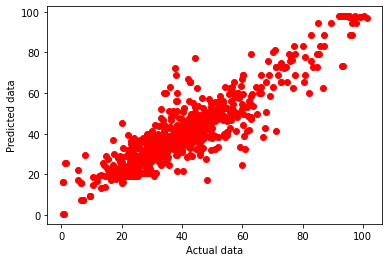

In [27]:
# Print the predicted and actual value for the test set
MLR_y_test_prediction= complex_model_1.predict(X_test_NEWS2)
np.savetxt('KNN_test_prdiction.csv', MLR_y_test_prediction, delimiter=',', fmt='%s')
np.savetxt('KNN_test_actual.csv', y_test, delimiter=',', fmt='%s')

# Print the predicted and actual value for the traing set
MLR_y_train_prediction= complex_model_1.predict(X_train_NEWS2)
np.savetxt('KNN_train_prediction.csv', MLR_y_train_prediction, delimiter=',', fmt='%s')
np.savetxt('KNN_train_actual.csv', y_train, delimiter=',', fmt='%s')

transformer = ColumnTransformer(transformers=[

    ('tnf1',KNNImputer(n_neighbors=3,weights='distance'),[0,1,2,3,5]),
    ('tnf2',SimpleImputer(strategy='most_frequent'),['fiber type']),
    ('tnf3',OneHotEncoder(sparse=False,drop='first',dtype=np.int32),[4])
],remainder='passthrough')

X_NEWS=pd.DataFrame(transformer.fit_transform(X))
X_NEWS.drop(columns=[5],inplace=True)


from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_NEWS2 = pd.DataFrame(scaler.fit_transform(X_NEWS))
pickle.dump(scaler, open('scaler.pkl','wb'))

x_NEWS2_cols=['nominal coarse aggregate size (mm)','RCA%','Rubber (%)','Fiber (%)','W/C','other', 'polypropylene','steel']
X_NEWS2.columns=x_NEWS2_cols


X_standardized = X_NEWS2
MLR_y_pred_entire_data = complex_model_1.predict(X_standardized)
np.savetxt('KNN_entire_prediction.csv', MLR_y_pred_entire_data, delimiter=',', fmt='%s')
np.savetxt('KNN_entire_actual.csv', y, delimiter=',', fmt='%s')

import matplotlib.pyplot as plt
plt.plot(y, MLR_y_pred_entire_data,  'ro')
plt.ylabel('Predicted data')
plt.xlabel('Actual data')
plt.show()

# Lasso Regression

In [28]:
complex_model_1 = linear_model.Lasso(alpha=0.1)
complex_model_1.fit(X_train_NEWS2, y_train)

pred = complex_model_1.predict(X_test_NEWS2)
rmse_train = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))
r2_train = float(format(complex_model_1.score(X_train_NEWS2, y_train),'.3f'))
ar2_train = float(format(adjustedR2(complex_model_1.score(X_train_NEWS2, y_train),X_train_NEWS2.shape[0],len(features)),'.3f'))
mae_train=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))

rmse_test = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))
r2_test = float(format(complex_model_1.score(X_test_NEWS2, y_test),'.3f'))
ar2_test = float(format(adjustedR2(complex_model_1.score(X_test_NEWS2, y_test),X_test_NEWS2.shape[0],len(features)),'.3f'))
mae_test=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))

cv = float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10).mean(),'.3f'))

cv_train_rmse=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error')
cv_train_rmse_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error').mean(),'.3f'))

cv_train_r2=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2')
cv_train_r2_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),'.3f'))

cv_train_ar2=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2'),X_train_NEWS2.shape[0],len(features))
cv_train_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),X_train_NEWS2.shape[0],len(features))

cv_train_mae=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error')
cv_train_mae_m=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error').mean()

cv_test_rmse=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error')
cv_test_rmse_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error').mean()

cv_test_r2=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2')
cv_test_r2_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean()

cv_test_ar2=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2'),X_test_NEWS2.shape[0],len(features))
cv_test_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean(),X_test_NEWS2.shape[0],len(features))

cv_test_mae=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error')
cv_test_mae_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error').mean()


r = evaluation2.shape[0]
evaluation2.loc[r] = ['Lasso','Train RMSE',float(format(cv_train_rmse[0],'.3f')),float(format(cv_train_rmse[1],'.3f')),float(format(cv_train_rmse[2],'.3f')),float(format(cv_train_rmse[3],'.3f')),float(format(cv_train_rmse[4],'.3f')),float(format(cv_train_rmse[5],'.3f')),float(format(cv_train_rmse[6],'.3f')),float(format(cv_train_rmse[7],'.3f')),float(format(cv_train_rmse[8],'.3f')),float(format(cv_train_rmse[9],'.3f')),float(format(cv_train_rmse_m,'.3f'))]
evaluation2.loc[r+1] = ['Lasso','Train R2',float(format(cv_train_r2[0],'.3f')),float(format(cv_train_r2[1],'.3f')),float(format(cv_train_r2[2],'.3f')),float(format(cv_train_r2[3],'.3f')),float(format(cv_train_r2[4],'.3f')),float(format(cv_train_r2[5],'.3f')),float(format(cv_train_r2[6],'.3f')),float(format(cv_train_r2[7],'.3f')),float(format(cv_train_r2[8],'.3f')),float(format(cv_train_r2[9],'.3f')),float(format(cv_train_r2_m,'.3f'))]
evaluation2.loc[r+2] = ['Lasso','Train ar2',float(format(cv_train_ar2[0],'.3f')),float(format(cv_train_ar2[1],'.3f')),float(format(cv_train_ar2[2],'.3f')),float(format(cv_train_ar2[3],'.3f')),float(format(cv_train_ar2[4],'.3f')),float(format(cv_train_ar2[5],'.3f')),float(format(cv_train_ar2[6],'.3f')),float(format(cv_train_ar2[7],'.3f')),float(format(cv_train_ar2[8],'.3f')),float(format(cv_train_ar2[9],'.3f')),float(format(cv_train_ar2_m,'.3f'))]
evaluation2.loc[r+3] = ['Lasso','Train mae',float(format(cv_train_mae[0],'.3f')),float(format(cv_train_mae[1],'.3f')),float(format(cv_train_mae[2],'.3f')),float(format(cv_train_mae[3],'.3f')),float(format(cv_train_mae[4],'.3f')),float(format(cv_train_mae[5],'.3f')),float(format(cv_train_mae[6],'.3f')),float(format(cv_train_mae[7],'.3f')),float(format(cv_train_mae[8],'.3f')),float(format(cv_train_mae[9],'.3f')),float(format(cv_train_mae_m,'.3f'))]
evaluation2.loc[r+4] = ['Lasso','Test RMSE',float(format(cv_test_rmse[0],'.3f')),float(format(cv_test_rmse[1],'.3f')),float(format(cv_test_rmse[2],'.3f')),float(format(cv_test_rmse[3],'.3f')),float(format(cv_test_rmse[4],'.3f')),float(format(cv_test_rmse[5],'.3f')),float(format(cv_test_rmse[6],'.3f')),float(format(cv_test_rmse[7],'.3f')),float(format(cv_test_rmse[8],'.3f')),float(format(cv_test_rmse[9],'.3f')),float(format(cv_test_rmse_m,'.3f'))]
evaluation2.loc[r+5] = ['Lasso','Test R2',float(format(cv_test_r2[0],'.3f')),float(format(cv_test_r2[1],'.3f')),float(format(cv_test_r2[2],'.3f')),float(format(cv_test_r2[3],'.3f')),float(format(cv_test_r2[4],'.3f')),float(format(cv_test_r2[5],'.3f')),float(format(cv_test_r2[6],'.3f')),float(format(cv_test_r2[7],'.3f')),float(format(cv_test_r2[8],'.3f')),float(format(cv_test_r2[9],'.3f')),float(format(cv_test_r2_m,'.3f'))]
evaluation2.loc[r+6] = ['Lasso','Test ar2',float(format(cv_test_ar2[0],'.3f')),float(format(cv_test_ar2[1],'.3f')),float(format(cv_test_ar2[2],'.3f')),float(format(cv_test_ar2[3],'.3f')),float(format(cv_test_ar2[4],'.3f')),float(format(cv_test_ar2[5],'.3f')),float(format(cv_test_ar2[6],'.3f')),float(format(cv_test_ar2[7],'.3f')),float(format(cv_test_ar2[8],'.3f')),float(format(cv_test_ar2[9],'.3f')),float(format(cv_test_ar2_m,'.3f'))]
evaluation2.loc[r+7] = ['Lasso','Train mae',float(format(cv_test_mae[0],'.3f')),float(format(cv_test_mae[1],'.3f')),float(format(cv_test_mae[2],'.3f')),float(format(cv_test_mae[3],'.3f')),float(format(cv_test_mae[4],'.3f')),float(format(cv_test_mae[5],'.3f')),float(format(cv_test_mae[6],'.3f')),float(format(cv_test_mae[7],'.3f')),float(format(cv_test_mae[8],'.3f')),float(format(cv_test_mae[9],'.3f')),float(format(cv_test_mae_m,'.3f')) ]

r = evaluation.shape[0]
evaluation.loc[r] = ['Lasso','All features',rmse_train,r2_train,ar2_train,mae_train,rmse_test,r2_test,ar2_test,mae_test,cv]
evaluation.sort_values(by = '10-Fold Cross Validation', ascending=False)

,Model,Details,RMSE(train),R-squared (train),Adj R-squared (train),MAE (train),RMSE (test),R-squared (test),Adj R-squared (test),MAE(test),10-Fold Cross Validation
2,KNN,All features,6.882,0.849,0.848,4.630,9.856,0.691,0.679,6.965,0.657
0,LR,All features,12.409,0.510,0.506,9.912,12.161,0.530,0.514,9.938,0.485
3,Lasso,All features,12.495,0.503,0.498,10.053,12.224,0.525,0.506,9.997,0.480
1,RR,All features,12.525,0.501,0.496,10.034,12.261,0.522,0.503,10.044,0.477


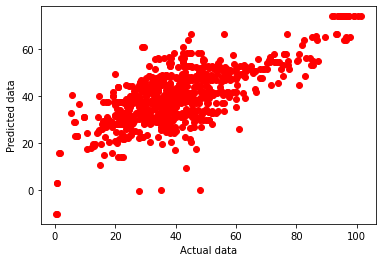

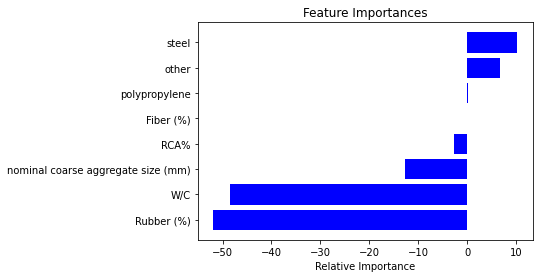

[-12.60172901  -2.73987193 -51.9517095    0.         -48.43018713
   6.66353231   0.19569071  10.28773101]
Intercept: 66.72612598185643
Coefficients: [-12.60172901  -2.73987193 -51.9517095    0.         -48.43018713
   6.66353231   0.19569071  10.28773101]


In [29]:
pickle.dump(complex_model_1, open('bolt_r_lasso.pkl','wb'))
# Print the predicted and actual value for the test set
MLR_y_test_prediction= complex_model_1.predict(X_test_NEWS2)
np.savetxt('Lasso_test_prdiction.csv', MLR_y_test_prediction, delimiter=',', fmt='%s')
np.savetxt('Lasso_test_actual.csv', y_test, delimiter=',', fmt='%s')

# Print the predicted and actual value for the traing set
MLR_y_train_prediction= complex_model_1.predict(X_train_NEWS2)
np.savetxt('Lasso_train_prediction.csv', MLR_y_train_prediction, delimiter=',', fmt='%s')
np.savetxt('Lasso_train_actual.csv', y_train, delimiter=',', fmt='%s')

transformer = ColumnTransformer(transformers=[

    ('tnf1',KNNImputer(n_neighbors=3,weights='distance'),[0,1,2,3,5]),
    ('tnf2',SimpleImputer(strategy='most_frequent'),['fiber type']),
    ('tnf3',OneHotEncoder(sparse=False,drop='first',dtype=np.int32),[4])
],remainder='passthrough')

X_NEWS=pd.DataFrame(transformer.fit_transform(X))
X_NEWS.drop(columns=[5],inplace=True)


from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_NEWS2 = pd.DataFrame(scaler.fit_transform(X_NEWS))
pickle.dump(scaler, open('scaler.pkl','wb'))

x_NEWS2_cols=['nominal coarse aggregate size (mm)','RCA%','Rubber (%)','Fiber (%)','W/C','other', 'polypropylene','steel']
X_NEWS2.columns=x_NEWS2_cols


X_standardized = X_NEWS2
MLR_y_pred_entire_data = complex_model_1.predict(X_standardized)
np.savetxt('Lasso_entire_prediction.csv', MLR_y_pred_entire_data, delimiter=',', fmt='%s')
np.savetxt('Lasso_entire_actual.csv', y, delimiter=',', fmt='%s')

import matplotlib.pyplot as plt
plt.plot(y, MLR_y_pred_entire_data,  'ro')
plt.ylabel('Predicted data')
plt.xlabel('Actual data')
plt.show()


features = list(X_train_NEWS2.columns.values)
importances = complex_model_1.coef_
import numpy as np
indices = np.argsort(importances)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

print(importances)
print('Intercept: {}'.format(complex_model_1.intercept_))
print('Coefficients: {}'.format(complex_model_1.coef_))

# SVR

In [30]:
from sklearn.svm import SVR
complex_model_1=SVR(C= 1000, gamma=1, kernel='rbf',degree=1)

complex_model_1.fit(X_train_NEWS2, y_train)

pred = complex_model_1.predict(X_test_NEWS2)
rmse_train = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))
r2_train = float(format(complex_model_1.score(X_train_NEWS2, y_train),'.3f'))
ar2_train = float(format(adjustedR2(complex_model_1.score(X_train_NEWS2, y_train),X_train_NEWS2.shape[0],len(features)),'.3f'))
mae_train=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))

rmse_test = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))
r2_test = float(format(complex_model_1.score(X_test_NEWS2, y_test),'.3f'))
ar2_test = float(format(adjustedR2(complex_model_1.score(X_test_NEWS2, y_test),X_test_NEWS2.shape[0],len(features)),'.3f'))
mae_test=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))

cv = float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10).mean(),'.3f'))

cv_train_rmse=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error')
cv_train_rmse_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error').mean(),'.3f'))

cv_train_r2=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2')
cv_train_r2_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),'.3f'))

cv_train_ar2=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2'),X_train_NEWS2.shape[0],len(features))
cv_train_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),X_train_NEWS2.shape[0],len(features))

cv_train_mae=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error')
cv_train_mae_m=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error').mean()

cv_test_rmse=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error')
cv_test_rmse_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error').mean()

cv_test_r2=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2')
cv_test_r2_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean()

cv_test_ar2=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2'),X_test_NEWS2.shape[0],len(features))
cv_test_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean(),X_test_NEWS2.shape[0],len(features))

cv_test_mae=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error')
cv_test_mae_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error').mean()


r = evaluation2.shape[0]
evaluation2.loc[r] = ['SVR','Train RMSE',float(format(cv_train_rmse[0],'.3f')),float(format(cv_train_rmse[1],'.3f')),float(format(cv_train_rmse[2],'.3f')),float(format(cv_train_rmse[3],'.3f')),float(format(cv_train_rmse[4],'.3f')),float(format(cv_train_rmse[5],'.3f')),float(format(cv_train_rmse[6],'.3f')),float(format(cv_train_rmse[7],'.3f')),float(format(cv_train_rmse[8],'.3f')),float(format(cv_train_rmse[9],'.3f')),float(format(cv_train_rmse_m,'.3f'))]
evaluation2.loc[r+1] = ['SVR','Train R2',float(format(cv_train_r2[0],'.3f')),float(format(cv_train_r2[1],'.3f')),float(format(cv_train_r2[2],'.3f')),float(format(cv_train_r2[3],'.3f')),float(format(cv_train_r2[4],'.3f')),float(format(cv_train_r2[5],'.3f')),float(format(cv_train_r2[6],'.3f')),float(format(cv_train_r2[7],'.3f')),float(format(cv_train_r2[8],'.3f')),float(format(cv_train_r2[9],'.3f')),float(format(cv_train_r2_m,'.3f'))]
evaluation2.loc[r+2] = ['SVR','Train ar2',float(format(cv_train_ar2[0],'.3f')),float(format(cv_train_ar2[1],'.3f')),float(format(cv_train_ar2[2],'.3f')),float(format(cv_train_ar2[3],'.3f')),float(format(cv_train_ar2[4],'.3f')),float(format(cv_train_ar2[5],'.3f')),float(format(cv_train_ar2[6],'.3f')),float(format(cv_train_ar2[7],'.3f')),float(format(cv_train_ar2[8],'.3f')),float(format(cv_train_ar2[9],'.3f')),float(format(cv_train_ar2_m,'.3f'))]
evaluation2.loc[r+3] = ['SVR','Train mae',float(format(cv_train_mae[0],'.3f')),float(format(cv_train_mae[1],'.3f')),float(format(cv_train_mae[2],'.3f')),float(format(cv_train_mae[3],'.3f')),float(format(cv_train_mae[4],'.3f')),float(format(cv_train_mae[5],'.3f')),float(format(cv_train_mae[6],'.3f')),float(format(cv_train_mae[7],'.3f')),float(format(cv_train_mae[8],'.3f')),float(format(cv_train_mae[9],'.3f')),float(format(cv_train_mae_m,'.3f'))]
evaluation2.loc[r+4] = ['SVR','Test RMSE',float(format(cv_test_rmse[0],'.3f')),float(format(cv_test_rmse[1],'.3f')),float(format(cv_test_rmse[2],'.3f')),float(format(cv_test_rmse[3],'.3f')),float(format(cv_test_rmse[4],'.3f')),float(format(cv_test_rmse[5],'.3f')),float(format(cv_test_rmse[6],'.3f')),float(format(cv_test_rmse[7],'.3f')),float(format(cv_test_rmse[8],'.3f')),float(format(cv_test_rmse[9],'.3f')),float(format(cv_test_rmse_m,'.3f'))]
evaluation2.loc[r+5] = ['SVR','Test R2',float(format(cv_test_r2[0],'.3f')),float(format(cv_test_r2[1],'.3f')),float(format(cv_test_r2[2],'.3f')),float(format(cv_test_r2[3],'.3f')),float(format(cv_test_r2[4],'.3f')),float(format(cv_test_r2[5],'.3f')),float(format(cv_test_r2[6],'.3f')),float(format(cv_test_r2[7],'.3f')),float(format(cv_test_r2[8],'.3f')),float(format(cv_test_r2[9],'.3f')),float(format(cv_test_r2_m,'.3f'))]
evaluation2.loc[r+6] = ['SVR','Test ar2',float(format(cv_test_ar2[0],'.3f')),float(format(cv_test_ar2[1],'.3f')),float(format(cv_test_ar2[2],'.3f')),float(format(cv_test_ar2[3],'.3f')),float(format(cv_test_ar2[4],'.3f')),float(format(cv_test_ar2[5],'.3f')),float(format(cv_test_ar2[6],'.3f')),float(format(cv_test_ar2[7],'.3f')),float(format(cv_test_ar2[8],'.3f')),float(format(cv_test_ar2[9],'.3f')),float(format(cv_test_ar2_m,'.3f'))]
evaluation2.loc[r+7] = ['SVR','Train mae',float(format(cv_test_mae[0],'.3f')),float(format(cv_test_mae[1],'.3f')),float(format(cv_test_mae[2],'.3f')),float(format(cv_test_mae[3],'.3f')),float(format(cv_test_mae[4],'.3f')),float(format(cv_test_mae[5],'.3f')),float(format(cv_test_mae[6],'.3f')),float(format(cv_test_mae[7],'.3f')),float(format(cv_test_mae[8],'.3f')),float(format(cv_test_mae[9],'.3f')),float(format(cv_test_mae_m,'.3f')) ]

r = evaluation.shape[0]
evaluation.loc[r] = ['SVR','All features',rmse_train,r2_train,ar2_train,mae_train,rmse_test,r2_test,ar2_test,mae_test,cv]
evaluation.sort_values(by = '10-Fold Cross Validation', ascending=False)

,Model,Details,RMSE(train),R-squared (train),Adj R-squared (train),MAE (train),RMSE (test),R-squared (test),Adj R-squared (test),MAE(test),10-Fold Cross Validation
2,KNN,All features,6.882,0.849,0.848,4.630,9.856,0.691,0.679,6.965,0.657
4,SVR,All features,9.845,0.692,0.689,6.598,9.874,0.690,0.678,7.219,0.622
0,LR,All features,12.409,0.510,0.506,9.912,12.161,0.530,0.514,9.938,0.485
3,Lasso,All features,12.495,0.503,0.498,10.053,12.224,0.525,0.506,9.997,0.480
1,RR,All features,12.525,0.501,0.496,10.034,12.261,0.522,0.503,10.044,0.477


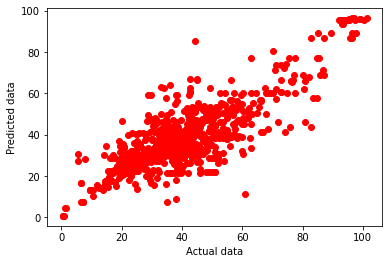

In [31]:
pickle.dump(complex_model_1, open('bolt_r_svr.pkl','wb'))
# Print the predicted and actual value for the test set
MLR_y_test_prediction= complex_model_1.predict(X_test_NEWS2)
np.savetxt('SVR_test_prediction.csv', MLR_y_test_prediction, delimiter=',', fmt='%s')
np.savetxt('SVR_test_actual.csv', y_test, delimiter=',', fmt='%s')

# Print the predicted and actual value for the traing set
MLR_y_train_prediction= complex_model_1.predict(X_train_NEWS2)
np.savetxt('SVR_train_prediction.csv', MLR_y_train_prediction, delimiter=',', fmt='%s')
np.savetxt('SVR_train_actual.csv', y_train, delimiter=',', fmt='%s')

transformer = ColumnTransformer(transformers=[

    ('tnf1',KNNImputer(n_neighbors=3,weights='distance'),[0,1,2,3,5]),
    ('tnf2',SimpleImputer(strategy='most_frequent'),['fiber type']),
    ('tnf3',OneHotEncoder(sparse=False,drop='first',dtype=np.int32),[4])
],remainder='passthrough')

X_NEWS=pd.DataFrame(transformer.fit_transform(X))
X_NEWS.drop(columns=[5],inplace=True)


from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_NEWS2 = pd.DataFrame(scaler.fit_transform(X_NEWS))
pickle.dump(scaler, open('scaler.pkl','wb'))

x_NEWS2_cols=['nominal coarse aggregate size (mm)','RCA%','Rubber (%)','Fiber (%)','W/C','other', 'polypropylene','steel']
X_NEWS2.columns=x_NEWS2_cols


X_standardized = X_NEWS2
MLR_y_pred_entire_data = complex_model_1.predict(X_standardized)
np.savetxt('SVR_entire_prediction.csv', MLR_y_pred_entire_data, delimiter=',', fmt='%s')
np.savetxt('SVR_entire_actual.csv', y, delimiter=',', fmt='%s')



import matplotlib.pyplot as plt
plt.plot(y, MLR_y_pred_entire_data,  'ro')
plt.ylabel('Predicted data')
plt.xlabel('Actual data')
plt.show()

# DecisionTreeRegressor

In [32]:
from sklearn.tree import DecisionTreeRegressor
complex_model_1= DecisionTreeRegressor(random_state=0)

complex_model_1.fit(X_train_NEWS2, y_train)

pred = complex_model_1.predict(X_test_NEWS2)
rmse_train = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))
r2_train = float(format(complex_model_1.score(X_train_NEWS2, y_train),'.3f'))
ar2_train = float(format(adjustedR2(complex_model_1.score(X_train_NEWS2, y_train),X_train_NEWS2.shape[0],len(features)),'.3f'))
mae_train=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))

rmse_test = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))
r2_test = float(format(complex_model_1.score(X_test_NEWS2, y_test),'.3f'))
ar2_test = float(format(adjustedR2(complex_model_1.score(X_test_NEWS2, y_test),X_test_NEWS2.shape[0],len(features)),'.3f'))
mae_test=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))

cv = float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10).mean(),'.3f'))

cv_train_rmse=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error')
cv_train_rmse_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error').mean(),'.3f'))

cv_train_r2=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2')
cv_train_r2_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),'.3f'))

cv_train_ar2=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2'),X_train_NEWS2.shape[0],len(features))
cv_train_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),X_train_NEWS2.shape[0],len(features))

cv_train_mae=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error')
cv_train_mae_m=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error').mean()

cv_test_rmse=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error')
cv_test_rmse_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error').mean()

cv_test_r2=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2')
cv_test_r2_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean()

cv_test_ar2=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2'),X_test_NEWS2.shape[0],len(features))
cv_test_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean(),X_test_NEWS2.shape[0],len(features))

cv_test_mae=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error')
cv_test_mae_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error').mean()


r = evaluation2.shape[0]
evaluation2.loc[r] = ['DT','Train RMSE',float(format(cv_train_rmse[0],'.3f')),float(format(cv_train_rmse[1],'.3f')),float(format(cv_train_rmse[2],'.3f')),float(format(cv_train_rmse[3],'.3f')),float(format(cv_train_rmse[4],'.3f')),float(format(cv_train_rmse[5],'.3f')),float(format(cv_train_rmse[6],'.3f')),float(format(cv_train_rmse[7],'.3f')),float(format(cv_train_rmse[8],'.3f')),float(format(cv_train_rmse[9],'.3f')),float(format(cv_train_rmse_m,'.3f'))]
evaluation2.loc[r+1] = ['DT','Train R2',float(format(cv_train_r2[0],'.3f')),float(format(cv_train_r2[1],'.3f')),float(format(cv_train_r2[2],'.3f')),float(format(cv_train_r2[3],'.3f')),float(format(cv_train_r2[4],'.3f')),float(format(cv_train_r2[5],'.3f')),float(format(cv_train_r2[6],'.3f')),float(format(cv_train_r2[7],'.3f')),float(format(cv_train_r2[8],'.3f')),float(format(cv_train_r2[9],'.3f')),float(format(cv_train_r2_m,'.3f'))]
evaluation2.loc[r+2] = ['DT','Train ar2',float(format(cv_train_ar2[0],'.3f')),float(format(cv_train_ar2[1],'.3f')),float(format(cv_train_ar2[2],'.3f')),float(format(cv_train_ar2[3],'.3f')),float(format(cv_train_ar2[4],'.3f')),float(format(cv_train_ar2[5],'.3f')),float(format(cv_train_ar2[6],'.3f')),float(format(cv_train_ar2[7],'.3f')),float(format(cv_train_ar2[8],'.3f')),float(format(cv_train_ar2[9],'.3f')),float(format(cv_train_ar2_m,'.3f'))]
evaluation2.loc[r+3] = ['DT','Train mae',float(format(cv_train_mae[0],'.3f')),float(format(cv_train_mae[1],'.3f')),float(format(cv_train_mae[2],'.3f')),float(format(cv_train_mae[3],'.3f')),float(format(cv_train_mae[4],'.3f')),float(format(cv_train_mae[5],'.3f')),float(format(cv_train_mae[6],'.3f')),float(format(cv_train_mae[7],'.3f')),float(format(cv_train_mae[8],'.3f')),float(format(cv_train_mae[9],'.3f')),float(format(cv_train_mae_m,'.3f'))]
evaluation2.loc[r+4] = ['DT','Test RMSE',float(format(cv_test_rmse[0],'.3f')),float(format(cv_test_rmse[1],'.3f')),float(format(cv_test_rmse[2],'.3f')),float(format(cv_test_rmse[3],'.3f')),float(format(cv_test_rmse[4],'.3f')),float(format(cv_test_rmse[5],'.3f')),float(format(cv_test_rmse[6],'.3f')),float(format(cv_test_rmse[7],'.3f')),float(format(cv_test_rmse[8],'.3f')),float(format(cv_test_rmse[9],'.3f')),float(format(cv_test_rmse_m,'.3f'))]
evaluation2.loc[r+5] = ['DT','Test R2',float(format(cv_test_r2[0],'.3f')),float(format(cv_test_r2[1],'.3f')),float(format(cv_test_r2[2],'.3f')),float(format(cv_test_r2[3],'.3f')),float(format(cv_test_r2[4],'.3f')),float(format(cv_test_r2[5],'.3f')),float(format(cv_test_r2[6],'.3f')),float(format(cv_test_r2[7],'.3f')),float(format(cv_test_r2[8],'.3f')),float(format(cv_test_r2[9],'.3f')),float(format(cv_test_r2_m,'.3f'))]
evaluation2.loc[r+6] = ['DT','Test ar2',float(format(cv_test_ar2[0],'.3f')),float(format(cv_test_ar2[1],'.3f')),float(format(cv_test_ar2[2],'.3f')),float(format(cv_test_ar2[3],'.3f')),float(format(cv_test_ar2[4],'.3f')),float(format(cv_test_ar2[5],'.3f')),float(format(cv_test_ar2[6],'.3f')),float(format(cv_test_ar2[7],'.3f')),float(format(cv_test_ar2[8],'.3f')),float(format(cv_test_ar2[9],'.3f')),float(format(cv_test_ar2_m,'.3f'))]
evaluation2.loc[r+7] = ['DT','Train mae',float(format(cv_test_mae[0],'.3f')),float(format(cv_test_mae[1],'.3f')),float(format(cv_test_mae[2],'.3f')),float(format(cv_test_mae[3],'.3f')),float(format(cv_test_mae[4],'.3f')),float(format(cv_test_mae[5],'.3f')),float(format(cv_test_mae[6],'.3f')),float(format(cv_test_mae[7],'.3f')),float(format(cv_test_mae[8],'.3f')),float(format(cv_test_mae[9],'.3f')),float(format(cv_test_mae_m,'.3f')) ]

r = evaluation.shape[0]
evaluation.loc[r] = ['DT','All features',rmse_train,r2_train,ar2_train,mae_train,rmse_test,r2_test,ar2_test,mae_test,cv]
evaluation.sort_values(by = '10-Fold Cross Validation', ascending=False)

,Model,Details,RMSE(train),R-squared (train),Adj R-squared (train),MAE (train),RMSE (test),R-squared (test),Adj R-squared (test),MAE(test),10-Fold Cross Validation
5,DT,All features,3.947,0.950,0.950,2.084,9.133,0.735,0.724,6.176,0.715
2,KNN,All features,6.882,0.849,0.848,4.630,9.856,0.691,0.679,6.965,0.657
4,SVR,All features,9.845,0.692,0.689,6.598,9.874,0.690,0.678,7.219,0.622
0,LR,All features,12.409,0.510,0.506,9.912,12.161,0.530,0.514,9.938,0.485
3,Lasso,All features,12.495,0.503,0.498,10.053,12.224,0.525,0.506,9.997,0.480
1,RR,All features,12.525,0.501,0.496,10.034,12.261,0.522,0.503,10.044,0.477


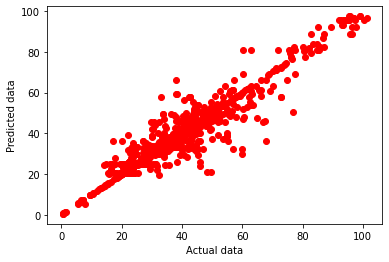

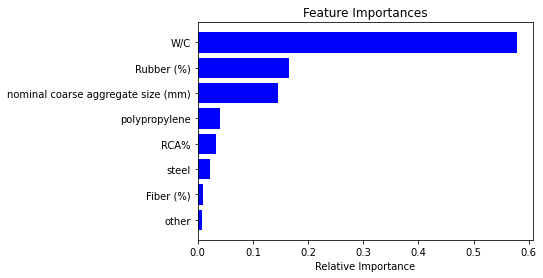

[0.14598427 0.0321102  0.16532297 0.00914838 0.57806082 0.00699763
 0.03940852 0.02296721]


In [33]:
pickle.dump(complex_model_1, open('bolt_r_dt.pkl','wb'))
# Print the predicted and actual value for the test set
MLR_y_test_prediction= complex_model_1.predict(X_test_NEWS2)
np.savetxt('DT_test_prdiction.csv', MLR_y_test_prediction, delimiter=',', fmt='%s')
np.savetxt('DT_test_actual.csv', y_test, delimiter=',', fmt='%s')

# Print the predicted and actual value for the traing set
MLR_y_train_prediction= complex_model_1.predict(X_train_NEWS2)
np.savetxt('DT_train_prediction.csv', MLR_y_train_prediction, delimiter=',', fmt='%s')
np.savetxt('DT_train_actual.csv', y_train, delimiter=',', fmt='%s')

transformer = ColumnTransformer(transformers=[

    ('tnf1',KNNImputer(n_neighbors=3,weights='distance'),[0,1,2,3,5]),
    ('tnf2',SimpleImputer(strategy='most_frequent'),['fiber type']),
    ('tnf3',OneHotEncoder(sparse=False,drop='first',dtype=np.int32),[4])
],remainder='passthrough')

X_NEWS=pd.DataFrame(transformer.fit_transform(X))
X_NEWS.drop(columns=[5],inplace=True)


from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_NEWS2 = pd.DataFrame(scaler.fit_transform(X_NEWS))
pickle.dump(scaler, open('scaler.pkl','wb'))

x_NEWS2_cols=['nominal coarse aggregate size (mm)','RCA%','Rubber (%)','Fiber (%)','W/C','other', 'polypropylene','steel']
X_NEWS2.columns=x_NEWS2_cols


X_standardized = X_NEWS2
MLR_y_pred_entire_data = complex_model_1.predict(X_standardized)
np.savetxt('DT_entire_prediction.csv', MLR_y_pred_entire_data, delimiter=',', fmt='%s')
np.savetxt('DT_entire_actual.csv', y, delimiter=',', fmt='%s')

import matplotlib.pyplot as plt
plt.plot(y, MLR_y_pred_entire_data,  'ro')
plt.ylabel('Predicted data')
plt.xlabel('Actual data')
plt.show()


features = list(X_train_NEWS2.columns.values)
importances = complex_model_1.feature_importances_
import numpy as np
indices = np.argsort(importances)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

print(importances)

# Random Forest Regressor

In [34]:
# from sklearn.ensemble import RandomForestRegressor
# RF_model_opt= RandomForestRegressor(n_estimators= 136, min_samples_split= 2, min_samples_leaf= 1, max_features= 'auto',  bootstrap= 'True')

# RF_model_opt.fit(X_train_NEWS2, y_train)

from sklearn.ensemble import RandomForestRegressor
complex_model_1 = RandomForestRegressor(n_estimators= 121, min_samples_split= 2, min_samples_leaf= 1, max_features= 'auto',  bootstrap= 'True')
complex_model_1.fit(X_train_NEWS2, y_train)

pred = complex_model_1.predict(X_test_NEWS2)
rmse_train = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))
r2_train = float(format(complex_model_1.score(X_train_NEWS2, y_train),'.3f'))
ar2_train = float(format(adjustedR2(complex_model_1.score(X_train_NEWS2, y_train),X_train_NEWS2.shape[0],len(features)),'.3f'))
mae_train=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))

rmse_test = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))
r2_test = float(format(complex_model_1.score(X_test_NEWS2, y_test),'.3f'))
ar2_test = float(format(adjustedR2(complex_model_1.score(X_test_NEWS2, y_test),X_test_NEWS2.shape[0],len(features)),'.3f'))
mae_test=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))

cv = float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10).mean(),'.3f'))

cv_train_rmse=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error')
cv_train_rmse_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error').mean(),'.3f'))

cv_train_r2=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2')
cv_train_r2_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),'.3f'))

cv_train_ar2=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2'),X_train_NEWS2.shape[0],len(features))
cv_train_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),X_train_NEWS2.shape[0],len(features))

cv_train_mae=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error')
cv_train_mae_m=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error').mean()

cv_test_rmse=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error')
cv_test_rmse_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error').mean()

cv_test_r2=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2')
cv_test_r2_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean()

cv_test_ar2=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2'),X_test_NEWS2.shape[0],len(features))
cv_test_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean(),X_test_NEWS2.shape[0],len(features))

cv_test_mae=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error')
cv_test_mae_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error').mean()


r = evaluation2.shape[0]
evaluation2.loc[r] = ['RF','Train RMSE',float(format(cv_train_rmse[0],'.3f')),float(format(cv_train_rmse[1],'.3f')),float(format(cv_train_rmse[2],'.3f')),float(format(cv_train_rmse[3],'.3f')),float(format(cv_train_rmse[4],'.3f')),float(format(cv_train_rmse[5],'.3f')),float(format(cv_train_rmse[6],'.3f')),float(format(cv_train_rmse[7],'.3f')),float(format(cv_train_rmse[8],'.3f')),float(format(cv_train_rmse[9],'.3f')),float(format(cv_train_rmse_m,'.3f'))]
evaluation2.loc[r+1] = ['RF','Train R2',float(format(cv_train_r2[0],'.3f')),float(format(cv_train_r2[1],'.3f')),float(format(cv_train_r2[2],'.3f')),float(format(cv_train_r2[3],'.3f')),float(format(cv_train_r2[4],'.3f')),float(format(cv_train_r2[5],'.3f')),float(format(cv_train_r2[6],'.3f')),float(format(cv_train_r2[7],'.3f')),float(format(cv_train_r2[8],'.3f')),float(format(cv_train_r2[9],'.3f')),float(format(cv_train_r2_m,'.3f'))]
evaluation2.loc[r+2] = ['RF','Train ar2',float(format(cv_train_ar2[0],'.3f')),float(format(cv_train_ar2[1],'.3f')),float(format(cv_train_ar2[2],'.3f')),float(format(cv_train_ar2[3],'.3f')),float(format(cv_train_ar2[4],'.3f')),float(format(cv_train_ar2[5],'.3f')),float(format(cv_train_ar2[6],'.3f')),float(format(cv_train_ar2[7],'.3f')),float(format(cv_train_ar2[8],'.3f')),float(format(cv_train_ar2[9],'.3f')),float(format(cv_train_ar2_m,'.3f'))]
evaluation2.loc[r+3] = ['RF','Train mae',float(format(cv_train_mae[0],'.3f')),float(format(cv_train_mae[1],'.3f')),float(format(cv_train_mae[2],'.3f')),float(format(cv_train_mae[3],'.3f')),float(format(cv_train_mae[4],'.3f')),float(format(cv_train_mae[5],'.3f')),float(format(cv_train_mae[6],'.3f')),float(format(cv_train_mae[7],'.3f')),float(format(cv_train_mae[8],'.3f')),float(format(cv_train_mae[9],'.3f')),float(format(cv_train_mae_m,'.3f'))]
evaluation2.loc[r+4] = ['RF','Test RMSE',float(format(cv_test_rmse[0],'.3f')),float(format(cv_test_rmse[1],'.3f')),float(format(cv_test_rmse[2],'.3f')),float(format(cv_test_rmse[3],'.3f')),float(format(cv_test_rmse[4],'.3f')),float(format(cv_test_rmse[5],'.3f')),float(format(cv_test_rmse[6],'.3f')),float(format(cv_test_rmse[7],'.3f')),float(format(cv_test_rmse[8],'.3f')),float(format(cv_test_rmse[9],'.3f')),float(format(cv_test_rmse_m,'.3f'))]
evaluation2.loc[r+5] = ['RF','Test R2',float(format(cv_test_r2[0],'.3f')),float(format(cv_test_r2[1],'.3f')),float(format(cv_test_r2[2],'.3f')),float(format(cv_test_r2[3],'.3f')),float(format(cv_test_r2[4],'.3f')),float(format(cv_test_r2[5],'.3f')),float(format(cv_test_r2[6],'.3f')),float(format(cv_test_r2[7],'.3f')),float(format(cv_test_r2[8],'.3f')),float(format(cv_test_r2[9],'.3f')),float(format(cv_test_r2_m,'.3f'))]
evaluation2.loc[r+6] = ['RF','Test ar2',float(format(cv_test_ar2[0],'.3f')),float(format(cv_test_ar2[1],'.3f')),float(format(cv_test_ar2[2],'.3f')),float(format(cv_test_ar2[3],'.3f')),float(format(cv_test_ar2[4],'.3f')),float(format(cv_test_ar2[5],'.3f')),float(format(cv_test_ar2[6],'.3f')),float(format(cv_test_ar2[7],'.3f')),float(format(cv_test_ar2[8],'.3f')),float(format(cv_test_ar2[9],'.3f')),float(format(cv_test_ar2_m,'.3f'))]
evaluation2.loc[r+7] = ['RF','Train mae',float(format(cv_test_mae[0],'.3f')),float(format(cv_test_mae[1],'.3f')),float(format(cv_test_mae[2],'.3f')),float(format(cv_test_mae[3],'.3f')),float(format(cv_test_mae[4],'.3f')),float(format(cv_test_mae[5],'.3f')),float(format(cv_test_mae[6],'.3f')),float(format(cv_test_mae[7],'.3f')),float(format(cv_test_mae[8],'.3f')),float(format(cv_test_mae[9],'.3f')),float(format(cv_test_mae_m,'.3f')) ]

r = evaluation.shape[0]
evaluation.loc[r] = ['RF','All features',rmse_train,r2_train,ar2_train,mae_train,rmse_test,r2_test,ar2_test,mae_test,cv]
evaluation.sort_values(by = '10-Fold Cross Validation', ascending=False)

,Model,Details,RMSE(train),R-squared (train),Adj R-squared (train),MAE (train),RMSE (test),R-squared (test),Adj R-squared (test),MAE(test),10-Fold Cross Validation
6,RF,All features,4.470,0.936,0.936,3.005,8.132,0.790,0.781,5.693,0.786
5,DT,All features,3.947,0.950,0.950,2.084,9.133,0.735,0.724,6.176,0.715
2,KNN,All features,6.882,0.849,0.848,4.630,9.856,0.691,0.679,6.965,0.657
4,SVR,All features,9.845,0.692,0.689,6.598,9.874,0.690,0.678,7.219,0.622
0,LR,All features,12.409,0.510,0.506,9.912,12.161,0.530,0.514,9.938,0.485
3,Lasso,All features,12.495,0.503,0.498,10.053,12.224,0.525,0.506,9.997,0.480
1,RR,All features,12.525,0.501,0.496,10.034,12.261,0.522,0.503,10.044,0.477


In [26]:
#Hyper Parameter Tuning
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 200, num = 100)]
# Number of features to consider at every split
max_features = ['auto']
# Maximum number of levels in tree
max_depth = [None,2]
# Minimum number of samples required to split a node
min_samples_split = [2]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1]
# Method of selecting samples for training each tree
bootstrap = [True]

# Create the param grid
param_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(param_grid)

rf_Model = RandomForestRegressor()

from sklearn.model_selection import GridSearchCV
rf_Grid = GridSearchCV(estimator = rf_Model, param_grid = param_grid, cv = 10, verbose=2, n_jobs = 8,scoring='r2')

rf_Grid.fit(X_train_NEWS2, y_train)

{'n_estimators': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 200], 'max_features': ['auto'], 'max_depth': [None, 2], 'min_samples_split': [2], 'min_samples_leaf': [1], 'bootstrap': [True]}
Fitting 10 folds for each of 200 candidates, totalling 2000 fits


[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    1.4s
[Parallel(n_jobs=8)]: Done 146 tasks      | elapsed:    7.9s
[Parallel(n_jobs=8)]: Done 349 tasks      | elapsed:   20.0s
[Parallel(n_jobs=8)]: Done 632 tasks      | elapsed:   39.5s
[Parallel(n_jobs=8)]: Done 997 tasks      | elapsed:  1.2min
[Parallel(n_jobs=8)]: Done 1442 tasks      | elapsed:  1.5min
[Parallel(n_jobs=8)]: Done 1969 tasks      | elapsed:  2.0min
[Parallel(n_jobs=8)]: Done 2000 out of 2000 | elapsed:  2.0min finished


GridSearchCV(cv=10, estimator=RandomForestRegressor(), n_jobs=8,
             param_grid={'bootstrap': [True], 'max_depth': [None, 2],
                         'max_features': ['auto'], 'min_samples_leaf': [1],
                         'min_samples_split': [2],
                         'n_estimators': [100, 101, 102, 103, 104, 105, 106,
                                          107, 108, 109, 110, 111, 112, 113,
                                          114, 115, 116, 117, 118, 119, 120,
                                          121, 122, 123, 124, 125, 126, 127,
                                          128, 129, ...]},
             scoring='r2', verbose=2)

In [27]:
rf_Grid.best_params_

{'bootstrap': True,
 'max_depth': None,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 121}

In [28]:
print (f'Train Accuracy - : {rf_Grid.score(X_train_NEWS2,y_train):.3f}')
print (f'Test Accuracy - : {rf_Grid.score(X_test_NEWS2,y_test):.3f}')

Train Accuracy - : 0.937
Test Accuracy - : 0.792


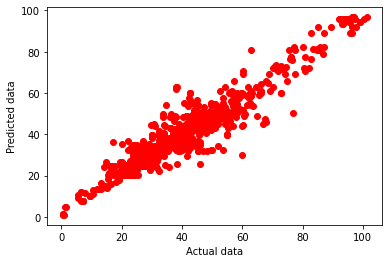

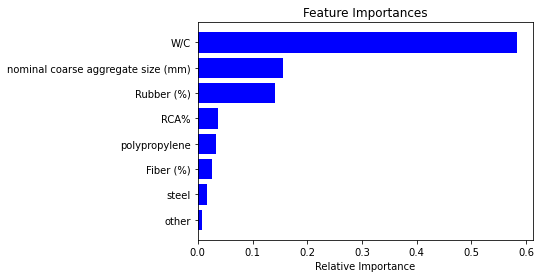

[0.15613225 0.0361468  0.14128152 0.02604057 0.582633   0.00711427
 0.03340564 0.01724595]


In [35]:
pickle.dump(complex_model_1, open('bolt_r_rf.pkl','wb'))
# Print the predicted and actual value for the test set
MLR_y_test_prediction= complex_model_1.predict(X_test_NEWS2)
np.savetxt('RF_test_prediction.csv', MLR_y_test_prediction, delimiter=',', fmt='%s')
np.savetxt('RF_test_actual.csv', y_test, delimiter=',', fmt='%s')

# Print the predicted and actual value for the traing set
MLR_y_train_prediction= complex_model_1.predict(X_train_NEWS2)
np.savetxt('RF_train_prediction.csv', MLR_y_train_prediction, delimiter=',', fmt='%s')
np.savetxt('RF_train_actual.csv', y_train, delimiter=',', fmt='%s')

transformer = ColumnTransformer(transformers=[

    ('tnf1',KNNImputer(n_neighbors=3,weights='distance'),[0,1,2,3,5]),
    ('tnf2',SimpleImputer(strategy='most_frequent'),['fiber type']),
    ('tnf3',OneHotEncoder(sparse=False,drop='first',dtype=np.int32),[4])
],remainder='passthrough')

X_NEWS=pd.DataFrame(transformer.fit_transform(X))
X_NEWS.drop(columns=[5],inplace=True)


from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_NEWS2 = pd.DataFrame(scaler.fit_transform(X_NEWS))
pickle.dump(scaler, open('scaler.pkl','wb'))

x_NEWS2_cols=['nominal coarse aggregate size (mm)','RCA%','Rubber (%)','Fiber (%)','W/C','other', 'polypropylene','steel']
X_NEWS2.columns=x_NEWS2_cols


X_standardized = X_NEWS2
MLR_y_pred_entire_data = complex_model_1.predict(X_standardized)
np.savetxt('RF_entire_prediction.csv', MLR_y_pred_entire_data, delimiter=',', fmt='%s')
np.savetxt('RF_entire_actual.csv', y, delimiter=',', fmt='%s')


import matplotlib.pyplot as plt
plt.plot(y, MLR_y_pred_entire_data,  'ro')
plt.ylabel('Predicted data')
plt.xlabel('Actual data')
plt.show()


features = list(X_train_NEWS2.columns.values)
importances = complex_model_1.feature_importances_
import numpy as np
indices = np.argsort(importances)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

print(importances)

# XGB Regressor

In [36]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import xgboost as xgb
from xgboost import plot_importance
complex_model_1 = xgb.XGBRegressor(n_estimators=100, learning_rate=0.08, gamma=0, subsample=0.75,
                           colsample_bytree=1, max_depth=10)

complex_model_1.fit(X_train_NEWS2, y_train)

pred = complex_model_1.predict(X_test_NEWS2)
rmse_train = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))
r2_train = float(format(complex_model_1.score(X_train_NEWS2, y_train),'.3f'))
ar2_train = float(format(adjustedR2(complex_model_1.score(X_train_NEWS2, y_train),X_train_NEWS2.shape[0],len(features)),'.3f'))
mae_train=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))

rmse_test = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))
r2_test = float(format(complex_model_1.score(X_test_NEWS2, y_test),'.3f'))
ar2_test = float(format(adjustedR2(complex_model_1.score(X_test_NEWS2, y_test),X_test_NEWS2.shape[0],len(features)),'.3f'))
mae_test=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))

cv = float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10).mean(),'.3f'))

cv_train_rmse=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error')
cv_train_rmse_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error').mean(),'.3f'))

cv_train_r2=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2')
cv_train_r2_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),'.3f'))

cv_train_ar2=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2'),X_train_NEWS2.shape[0],len(features))
cv_train_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),X_train_NEWS2.shape[0],len(features))

cv_train_mae=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error')
cv_train_mae_m=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error').mean()

cv_test_rmse=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error')
cv_test_rmse_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error').mean()

cv_test_r2=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2')
cv_test_r2_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean()

cv_test_ar2=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2'),X_test_NEWS2.shape[0],len(features))
cv_test_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean(),X_test_NEWS2.shape[0],len(features))

cv_test_mae=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error')
cv_test_mae_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error').mean()


r = evaluation2.shape[0]
evaluation2.loc[r] = ['XB','Train RMSE',float(format(cv_train_rmse[0],'.3f')),float(format(cv_train_rmse[1],'.3f')),float(format(cv_train_rmse[2],'.3f')),float(format(cv_train_rmse[3],'.3f')),float(format(cv_train_rmse[4],'.3f')),float(format(cv_train_rmse[5],'.3f')),float(format(cv_train_rmse[6],'.3f')),float(format(cv_train_rmse[7],'.3f')),float(format(cv_train_rmse[8],'.3f')),float(format(cv_train_rmse[9],'.3f')),float(format(cv_train_rmse_m,'.3f'))]
evaluation2.loc[r+1] = ['XB','Train R2',float(format(cv_train_r2[0],'.3f')),float(format(cv_train_r2[1],'.3f')),float(format(cv_train_r2[2],'.3f')),float(format(cv_train_r2[3],'.3f')),float(format(cv_train_r2[4],'.3f')),float(format(cv_train_r2[5],'.3f')),float(format(cv_train_r2[6],'.3f')),float(format(cv_train_r2[7],'.3f')),float(format(cv_train_r2[8],'.3f')),float(format(cv_train_r2[9],'.3f')),float(format(cv_train_r2_m,'.3f'))]
evaluation2.loc[r+2] = ['XB','Train ar2',float(format(cv_train_ar2[0],'.3f')),float(format(cv_train_ar2[1],'.3f')),float(format(cv_train_ar2[2],'.3f')),float(format(cv_train_ar2[3],'.3f')),float(format(cv_train_ar2[4],'.3f')),float(format(cv_train_ar2[5],'.3f')),float(format(cv_train_ar2[6],'.3f')),float(format(cv_train_ar2[7],'.3f')),float(format(cv_train_ar2[8],'.3f')),float(format(cv_train_ar2[9],'.3f')),float(format(cv_train_ar2_m,'.3f'))]
evaluation2.loc[r+3] = ['XB','Train mae',float(format(cv_train_mae[0],'.3f')),float(format(cv_train_mae[1],'.3f')),float(format(cv_train_mae[2],'.3f')),float(format(cv_train_mae[3],'.3f')),float(format(cv_train_mae[4],'.3f')),float(format(cv_train_mae[5],'.3f')),float(format(cv_train_mae[6],'.3f')),float(format(cv_train_mae[7],'.3f')),float(format(cv_train_mae[8],'.3f')),float(format(cv_train_mae[9],'.3f')),float(format(cv_train_mae_m,'.3f'))]
evaluation2.loc[r+4] = ['XB','Test RMSE',float(format(cv_test_rmse[0],'.3f')),float(format(cv_test_rmse[1],'.3f')),float(format(cv_test_rmse[2],'.3f')),float(format(cv_test_rmse[3],'.3f')),float(format(cv_test_rmse[4],'.3f')),float(format(cv_test_rmse[5],'.3f')),float(format(cv_test_rmse[6],'.3f')),float(format(cv_test_rmse[7],'.3f')),float(format(cv_test_rmse[8],'.3f')),float(format(cv_test_rmse[9],'.3f')),float(format(cv_test_rmse_m,'.3f'))]
evaluation2.loc[r+5] = ['XB','Test R2',float(format(cv_test_r2[0],'.3f')),float(format(cv_test_r2[1],'.3f')),float(format(cv_test_r2[2],'.3f')),float(format(cv_test_r2[3],'.3f')),float(format(cv_test_r2[4],'.3f')),float(format(cv_test_r2[5],'.3f')),float(format(cv_test_r2[6],'.3f')),float(format(cv_test_r2[7],'.3f')),float(format(cv_test_r2[8],'.3f')),float(format(cv_test_r2[9],'.3f')),float(format(cv_test_r2_m,'.3f'))]
evaluation2.loc[r+6] = ['XB','Test ar2',float(format(cv_test_ar2[0],'.3f')),float(format(cv_test_ar2[1],'.3f')),float(format(cv_test_ar2[2],'.3f')),float(format(cv_test_ar2[3],'.3f')),float(format(cv_test_ar2[4],'.3f')),float(format(cv_test_ar2[5],'.3f')),float(format(cv_test_ar2[6],'.3f')),float(format(cv_test_ar2[7],'.3f')),float(format(cv_test_ar2[8],'.3f')),float(format(cv_test_ar2[9],'.3f')),float(format(cv_test_ar2_m,'.3f'))]
evaluation2.loc[r+7] = ['XB','Train mae',float(format(cv_test_mae[0],'.3f')),float(format(cv_test_mae[1],'.3f')),float(format(cv_test_mae[2],'.3f')),float(format(cv_test_mae[3],'.3f')),float(format(cv_test_mae[4],'.3f')),float(format(cv_test_mae[5],'.3f')),float(format(cv_test_mae[6],'.3f')),float(format(cv_test_mae[7],'.3f')),float(format(cv_test_mae[8],'.3f')),float(format(cv_test_mae[9],'.3f')),float(format(cv_test_mae_m,'.3f')) ]

r = evaluation.shape[0]
evaluation.loc[r] = ['XB','All features',rmse_train,r2_train,ar2_train,mae_train,rmse_test,r2_test,ar2_test,mae_test,cv]
evaluation.sort_values(by = '10-Fold Cross Validation', ascending=False)

,Model,Details,RMSE(train),R-squared (train),Adj R-squared (train),MAE (train),RMSE (test),R-squared (test),Adj R-squared (test),MAE(test),10-Fold Cross Validation
7,XB,All features,4.097,0.947,0.946,2.529,7.560,0.818,0.811,5.304,0.798
6,RF,All features,4.470,0.936,0.936,3.005,8.132,0.790,0.781,5.693,0.786
5,DT,All features,3.947,0.950,0.950,2.084,9.133,0.735,0.724,6.176,0.715
2,KNN,All features,6.882,0.849,0.848,4.630,9.856,0.691,0.679,6.965,0.657
4,SVR,All features,9.845,0.692,0.689,6.598,9.874,0.690,0.678,7.219,0.622
0,LR,All features,12.409,0.510,0.506,9.912,12.161,0.530,0.514,9.938,0.485
3,Lasso,All features,12.495,0.503,0.498,10.053,12.224,0.525,0.506,9.997,0.480
1,RR,All features,12.525,0.501,0.496,10.034,12.261,0.522,0.503,10.044,0.477


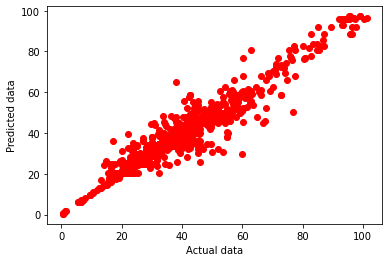

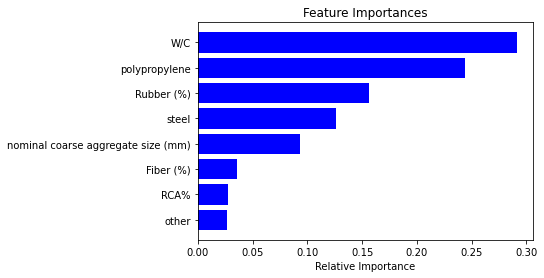

[0.0929548  0.02732967 0.15624619 0.03570151 0.29120365 0.02637884
 0.24379292 0.12639242]


In [37]:
pickle.dump(complex_model_1, open('bolt_r_xg.pkl','wb'))
# Print the predicted and actual value for the test set
MLR_y_test_prediction= complex_model_1.predict(X_test_NEWS2)
np.savetxt('XB_test_prdiction.csv', MLR_y_test_prediction, delimiter=',', fmt='%s')
np.savetxt('XB_test_actual.csv', y_test, delimiter=',', fmt='%s')

# Print the predicted and actual value for the traing set
MLR_y_train_prediction= complex_model_1.predict(X_train_NEWS2)
np.savetxt('XB_train_prediction.csv', MLR_y_train_prediction, delimiter=',', fmt='%s')
np.savetxt('XB_train_actual.csv', y_train, delimiter=',', fmt='%s')

transformer = ColumnTransformer(transformers=[

    ('tnf1',KNNImputer(n_neighbors=3,weights='distance'),[0,1,2,3,5]),
    ('tnf2',SimpleImputer(strategy='most_frequent'),['fiber type']),
    ('tnf3',OneHotEncoder(sparse=False,drop='first',dtype=np.int32),[4])
],remainder='passthrough')

X_NEWS=pd.DataFrame(transformer.fit_transform(X))
X_NEWS.drop(columns=[5],inplace=True)


from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_NEWS2 = pd.DataFrame(scaler.fit_transform(X_NEWS))
pickle.dump(scaler, open('scaler.pkl','wb'))

x_NEWS2_cols=['nominal coarse aggregate size (mm)','RCA%','Rubber (%)','Fiber (%)','W/C','other', 'polypropylene','steel']
X_NEWS2.columns=x_NEWS2_cols


X_standardized = X_NEWS2
MLR_y_pred_entire_data = complex_model_1.predict(X_standardized)
np.savetxt('XB_entire_prediction.csv', MLR_y_pred_entire_data, delimiter=',', fmt='%s')
np.savetxt('XB_entire_actual.csv', y, delimiter=',', fmt='%s')

import matplotlib.pyplot as plt
plt.plot(y, MLR_y_pred_entire_data,  'ro')
plt.ylabel('Predicted data')
plt.xlabel('Actual data')
plt.show()


features = list(X_train_NEWS2.columns.values)
importances = complex_model_1.feature_importances_
import numpy as np
indices = np.argsort(importances)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

print(importances)

# AdaBoost Regressor

In [38]:
from sklearn.ensemble import AdaBoostRegressor


# ADB_model = AdaBoostRegressor(random_state=0, n_estimators=100)
# ADB_model.fit(X_train_NEWS2, y_train)
print("For Adaboost regression")
complex_model_1 = AdaBoostRegressor(random_state=0, n_estimators=100)
complex_model_1.fit(X_train_NEWS2, y_train)


pred = complex_model_1.predict(X_test_NEWS2)
rmse_train = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))
r2_train = float(format(complex_model_1.score(X_train_NEWS2, y_train),'.3f'))
ar2_train = float(format(adjustedR2(complex_model_1.score(X_train_NEWS2, y_train),X_train_NEWS2.shape[0],len(features)),'.3f'))
mae_train=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))

rmse_test = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))
r2_test = float(format(complex_model_1.score(X_test_NEWS2, y_test),'.3f'))
ar2_test = float(format(adjustedR2(complex_model_1.score(X_test_NEWS2, y_test),X_test_NEWS2.shape[0],len(features)),'.3f'))
mae_test=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))

cv = float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10).mean(),'.3f'))

cv_train_rmse=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error')
cv_train_rmse_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error').mean(),'.3f'))

cv_train_r2=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2')
cv_train_r2_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),'.3f'))

cv_train_ar2=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2'),X_train_NEWS2.shape[0],len(features))
cv_train_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),X_train_NEWS2.shape[0],len(features))

cv_train_mae=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error')
cv_train_mae_m=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error').mean()

cv_test_rmse=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error')
cv_test_rmse_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error').mean()

cv_test_r2=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2')
cv_test_r2_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean()

cv_test_ar2=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2'),X_test_NEWS2.shape[0],len(features))
cv_test_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean(),X_test_NEWS2.shape[0],len(features))

cv_test_mae=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error')
cv_test_mae_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error').mean()



r = evaluation2.shape[0]
evaluation2.loc[r] = ['AB','Train RMSE',float(format(cv_train_rmse[0],'.3f')),float(format(cv_train_rmse[1],'.3f')),float(format(cv_train_rmse[2],'.3f')),float(format(cv_train_rmse[3],'.3f')),float(format(cv_train_rmse[4],'.3f')),float(format(cv_train_rmse[5],'.3f')),float(format(cv_train_rmse[6],'.3f')),float(format(cv_train_rmse[7],'.3f')),float(format(cv_train_rmse[8],'.3f')),float(format(cv_train_rmse[9],'.3f')),float(format(cv_train_rmse_m,'.3f'))]
evaluation2.loc[r+1] = ['AB','Train R2',float(format(cv_train_r2[0],'.3f')),float(format(cv_train_r2[1],'.3f')),float(format(cv_train_r2[2],'.3f')),float(format(cv_train_r2[3],'.3f')),float(format(cv_train_r2[4],'.3f')),float(format(cv_train_r2[5],'.3f')),float(format(cv_train_r2[6],'.3f')),float(format(cv_train_r2[7],'.3f')),float(format(cv_train_r2[8],'.3f')),float(format(cv_train_r2[9],'.3f')),float(format(cv_train_r2_m,'.3f'))]
evaluation2.loc[r+2] = ['AB','Train ar2',float(format(cv_train_ar2[0],'.3f')),float(format(cv_train_ar2[1],'.3f')),float(format(cv_train_ar2[2],'.3f')),float(format(cv_train_ar2[3],'.3f')),float(format(cv_train_ar2[4],'.3f')),float(format(cv_train_ar2[5],'.3f')),float(format(cv_train_ar2[6],'.3f')),float(format(cv_train_ar2[7],'.3f')),float(format(cv_train_ar2[8],'.3f')),float(format(cv_train_ar2[9],'.3f')),float(format(cv_train_ar2_m,'.3f'))]
evaluation2.loc[r+3] = ['AB','Train mae',float(format(cv_train_mae[0],'.3f')),float(format(cv_train_mae[1],'.3f')),float(format(cv_train_mae[2],'.3f')),float(format(cv_train_mae[3],'.3f')),float(format(cv_train_mae[4],'.3f')),float(format(cv_train_mae[5],'.3f')),float(format(cv_train_mae[6],'.3f')),float(format(cv_train_mae[7],'.3f')),float(format(cv_train_mae[8],'.3f')),float(format(cv_train_mae[9],'.3f')),float(format(cv_train_mae_m,'.3f'))]
evaluation2.loc[r+4] = ['AB','Test RMSE',float(format(cv_test_rmse[0],'.3f')),float(format(cv_test_rmse[1],'.3f')),float(format(cv_test_rmse[2],'.3f')),float(format(cv_test_rmse[3],'.3f')),float(format(cv_test_rmse[4],'.3f')),float(format(cv_test_rmse[5],'.3f')),float(format(cv_test_rmse[6],'.3f')),float(format(cv_test_rmse[7],'.3f')),float(format(cv_test_rmse[8],'.3f')),float(format(cv_test_rmse[9],'.3f')),float(format(cv_test_rmse_m,'.3f'))]
evaluation2.loc[r+5] = ['AB','Test R2',float(format(cv_test_r2[0],'.3f')),float(format(cv_test_r2[1],'.3f')),float(format(cv_test_r2[2],'.3f')),float(format(cv_test_r2[3],'.3f')),float(format(cv_test_r2[4],'.3f')),float(format(cv_test_r2[5],'.3f')),float(format(cv_test_r2[6],'.3f')),float(format(cv_test_r2[7],'.3f')),float(format(cv_test_r2[8],'.3f')),float(format(cv_test_r2[9],'.3f')),float(format(cv_test_r2_m,'.3f'))]
evaluation2.loc[r+6] = ['AB','Test ar2',float(format(cv_test_ar2[0],'.3f')),float(format(cv_test_ar2[1],'.3f')),float(format(cv_test_ar2[2],'.3f')),float(format(cv_test_ar2[3],'.3f')),float(format(cv_test_ar2[4],'.3f')),float(format(cv_test_ar2[5],'.3f')),float(format(cv_test_ar2[6],'.3f')),float(format(cv_test_ar2[7],'.3f')),float(format(cv_test_ar2[8],'.3f')),float(format(cv_test_ar2[9],'.3f')),float(format(cv_test_ar2_m,'.3f'))]
evaluation2.loc[r+7] = ['AB','Train mae',float(format(cv_test_mae[0],'.3f')),float(format(cv_test_mae[1],'.3f')),float(format(cv_test_mae[2],'.3f')),float(format(cv_test_mae[3],'.3f')),float(format(cv_test_mae[4],'.3f')),float(format(cv_test_mae[5],'.3f')),float(format(cv_test_mae[6],'.3f')),float(format(cv_test_mae[7],'.3f')),float(format(cv_test_mae[8],'.3f')),float(format(cv_test_mae[9],'.3f')),float(format(cv_test_mae_m,'.3f')) ]

r = evaluation.shape[0]
evaluation.loc[r] = ['AB','All features',rmse_train,r2_train,ar2_train,mae_train,rmse_test,r2_test,ar2_test,mae_test,cv]
evaluation.sort_values(by = '10-Fold Cross Validation', ascending=False)

For Adaboost regression


,Model,Details,RMSE(train),R-squared (train),Adj R-squared (train),MAE (train),RMSE (test),R-squared (test),Adj R-squared (test),MAE(test),10-Fold Cross Validation
7,XB,All features,4.097,0.947,0.946,2.529,7.560,0.818,0.811,5.304,0.798
6,RF,All features,4.470,0.936,0.936,3.005,8.132,0.790,0.781,5.693,0.786
5,DT,All features,3.947,0.950,0.950,2.084,9.133,0.735,0.724,6.176,0.715
2,KNN,All features,6.882,0.849,0.848,4.630,9.856,0.691,0.679,6.965,0.657
4,SVR,All features,9.845,0.692,0.689,6.598,9.874,0.690,0.678,7.219,0.622
8,AB,All features,10.824,0.627,0.623,9.151,11.172,0.603,0.587,9.588,0.601
0,LR,All features,12.409,0.510,0.506,9.912,12.161,0.530,0.514,9.938,0.485
3,Lasso,All features,12.495,0.503,0.498,10.053,12.224,0.525,0.506,9.997,0.480
1,RR,All features,12.525,0.501,0.496,10.034,12.261,0.522,0.503,10.044,0.477


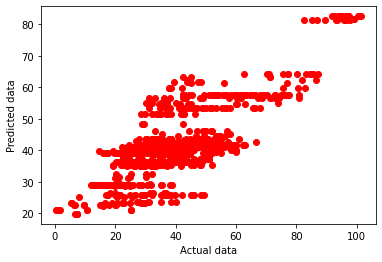

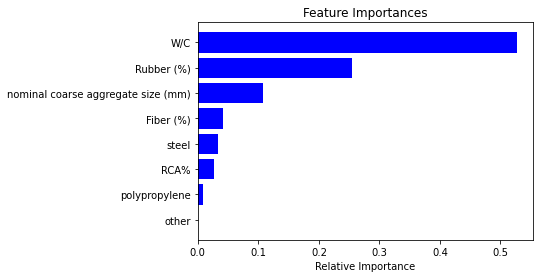

[0.10848143 0.02724561 0.25403912 0.04128696 0.52679047 0.
 0.00921385 0.03294256]


In [39]:

pickle.dump(complex_model_1, open('bolt_r_ab.pkl','wb'))
# Print the predicted and actual value for the test set
MLR_y_test_prediction= complex_model_1.predict(X_test_NEWS2)
np.savetxt('AB_test_prediction.csv', MLR_y_test_prediction, delimiter=',', fmt='%s')
np.savetxt('AB_test_actual.csv', y_test, delimiter=',', fmt='%s')

# Print the predicted and actual value for the traing set
MLR_y_train_prediction= complex_model_1.predict(X_train_NEWS2)
np.savetxt('AB_train_prediction.csv', MLR_y_train_prediction, delimiter=',', fmt='%s')
np.savetxt('AB_train_actual.csv', y_train, delimiter=',', fmt='%s')

transformer = ColumnTransformer(transformers=[

    ('tnf1',KNNImputer(n_neighbors=3,weights='distance'),[0,1,2,3,5]),
    ('tnf2',SimpleImputer(strategy='most_frequent'),['fiber type']),
    ('tnf3',OneHotEncoder(sparse=False,drop='first',dtype=np.int32),[4])
],remainder='passthrough')

X_NEWS=pd.DataFrame(transformer.fit_transform(X))
X_NEWS.drop(columns=[5],inplace=True)


from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_NEWS2 = pd.DataFrame(scaler.fit_transform(X_NEWS))
pickle.dump(scaler, open('scaler.pkl','wb'))

x_NEWS2_cols=['nominal coarse aggregate size (mm)','RCA%','Rubber (%)','Fiber (%)','W/C','other', 'polypropylene','steel']
X_NEWS2.columns=x_NEWS2_cols


X_standardized = X_NEWS2
MLR_y_pred_entire_data = complex_model_1.predict(X_standardized)
np.savetxt('AB_entire_prediction.csv', MLR_y_pred_entire_data, delimiter=',', fmt='%s')
np.savetxt('AB_entire_actual.csv', y, delimiter=',', fmt='%s')

import matplotlib.pyplot as plt
plt.plot(y, MLR_y_pred_entire_data,  'ro')
plt.ylabel('Predicted data')
plt.xlabel('Actual data')
plt.show()


features = list(X_train_NEWS2.columns.values)
importances = complex_model_1.feature_importances_
import numpy as np
indices = np.argsort(importances)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

print(importances)

# CatBoostRegressor

In [40]:
!pip3 install catboost
from catboost import CatBoostRegressor
complex_model_1 = CatBoostRegressor(iterations=700,learning_rate=0.02,depth=12,eval_metric='RMSE',random_seed = 23,bagging_temperature = 0.2,od_type='Iter',
                             metric_period = 75,
                             od_wait=100)

complex_model_1.fit(X_train_NEWS, y_train)
pred = complex_model_1.predict(X_test_NEWS)
rmse_train = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_train_NEWS), y_train)),'.3f'))
r2_train = float(format(complex_model_1.score(X_train_NEWS, y_train),'.3f'))
ar2_train = float(format(adjustedR2(complex_model_1.score(X_train_NEWS, y_train),X_train_NEWS.shape[0],len(features)),'.3f'))
mae_train=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_train_NEWS), y_train)),'.3f'))

rmse_test = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_test_NEWS), y_test)),'.3f'))
r2_test = float(format(complex_model_1.score(X_test_NEWS, y_test),'.3f'))
ar2_test = float(format(adjustedR2(complex_model_1.score(X_test_NEWS, y_test),X_test_NEWS.shape[0],len(features)),'.3f'))
mae_test=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_test_NEWS), y_test)),'.3f'))

cv = float(format(cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10).mean(),'.3f'))

cv_train_rmse=cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='neg_root_mean_squared_error')
cv_train_rmse_m=float(format(cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='neg_root_mean_squared_error').mean(),'.3f'))

cv_train_r2=cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='r2')
cv_train_r2_m=float(format(cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='r2').mean(),'.3f'))

cv_train_ar2=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='r2'),X_train_NEWS.shape[0],len(features))
cv_train_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='r2').mean(),X_train_NEWS.shape[0],len(features))

cv_train_mae=cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='neg_mean_absolute_error')
cv_train_mae_m=cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='neg_mean_absolute_error').mean()

cv_test_rmse=cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='neg_root_mean_squared_error')
cv_test_rmse_m=cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='neg_root_mean_squared_error').mean()

cv_test_r2=cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='r2')
cv_test_r2_m=cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='r2').mean()

cv_test_ar2=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='r2'),X_test_NEWS.shape[0],len(features))
cv_test_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='r2').mean(),X_test_NEWS.shape[0],len(features))

cv_test_mae=cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='neg_mean_absolute_error')
cv_test_mae_m=cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='neg_mean_absolute_error').mean()



r = evaluation2.shape[0]
evaluation2.loc[r] = ['CB','Train RMSE',float(format(cv_train_rmse[0],'.3f')),float(format(cv_train_rmse[1],'.3f')),float(format(cv_train_rmse[2],'.3f')),float(format(cv_train_rmse[3],'.3f')),float(format(cv_train_rmse[4],'.3f')),float(format(cv_train_rmse[5],'.3f')),float(format(cv_train_rmse[6],'.3f')),float(format(cv_train_rmse[7],'.3f')),float(format(cv_train_rmse[8],'.3f')),float(format(cv_train_rmse[9],'.3f')),float(format(cv_train_rmse_m,'.3f'))]
evaluation2.loc[r+1] = ['CB','Train R2',float(format(cv_train_r2[0],'.3f')),float(format(cv_train_r2[1],'.3f')),float(format(cv_train_r2[2],'.3f')),float(format(cv_train_r2[3],'.3f')),float(format(cv_train_r2[4],'.3f')),float(format(cv_train_r2[5],'.3f')),float(format(cv_train_r2[6],'.3f')),float(format(cv_train_r2[7],'.3f')),float(format(cv_train_r2[8],'.3f')),float(format(cv_train_r2[9],'.3f')),float(format(cv_train_r2_m,'.3f'))]
evaluation2.loc[r+2] = ['CB','Train ar2',float(format(cv_train_ar2[0],'.3f')),float(format(cv_train_ar2[1],'.3f')),float(format(cv_train_ar2[2],'.3f')),float(format(cv_train_ar2[3],'.3f')),float(format(cv_train_ar2[4],'.3f')),float(format(cv_train_ar2[5],'.3f')),float(format(cv_train_ar2[6],'.3f')),float(format(cv_train_ar2[7],'.3f')),float(format(cv_train_ar2[8],'.3f')),float(format(cv_train_ar2[9],'.3f')),float(format(cv_train_ar2_m,'.3f'))]
evaluation2.loc[r+3] = ['CB','Train mae',float(format(cv_train_mae[0],'.3f')),float(format(cv_train_mae[1],'.3f')),float(format(cv_train_mae[2],'.3f')),float(format(cv_train_mae[3],'.3f')),float(format(cv_train_mae[4],'.3f')),float(format(cv_train_mae[5],'.3f')),float(format(cv_train_mae[6],'.3f')),float(format(cv_train_mae[7],'.3f')),float(format(cv_train_mae[8],'.3f')),float(format(cv_train_mae[9],'.3f')),float(format(cv_train_mae_m,'.3f'))]
evaluation2.loc[r+4] = ['CB','Test RMSE',float(format(cv_test_rmse[0],'.3f')),float(format(cv_test_rmse[1],'.3f')),float(format(cv_test_rmse[2],'.3f')),float(format(cv_test_rmse[3],'.3f')),float(format(cv_test_rmse[4],'.3f')),float(format(cv_test_rmse[5],'.3f')),float(format(cv_test_rmse[6],'.3f')),float(format(cv_test_rmse[7],'.3f')),float(format(cv_test_rmse[8],'.3f')),float(format(cv_test_rmse[9],'.3f')),float(format(cv_test_rmse_m,'.3f'))]
evaluation2.loc[r+5] = ['CB','Test R2',float(format(cv_test_r2[0],'.3f')),float(format(cv_test_r2[1],'.3f')),float(format(cv_test_r2[2],'.3f')),float(format(cv_test_r2[3],'.3f')),float(format(cv_test_r2[4],'.3f')),float(format(cv_test_r2[5],'.3f')),float(format(cv_test_r2[6],'.3f')),float(format(cv_test_r2[7],'.3f')),float(format(cv_test_r2[8],'.3f')),float(format(cv_test_r2[9],'.3f')),float(format(cv_test_r2_m,'.3f'))]
evaluation2.loc[r+6] = ['CB','Test ar2',float(format(cv_test_ar2[0],'.3f')),float(format(cv_test_ar2[1],'.3f')),float(format(cv_test_ar2[2],'.3f')),float(format(cv_test_ar2[3],'.3f')),float(format(cv_test_ar2[4],'.3f')),float(format(cv_test_ar2[5],'.3f')),float(format(cv_test_ar2[6],'.3f')),float(format(cv_test_ar2[7],'.3f')),float(format(cv_test_ar2[8],'.3f')),float(format(cv_test_ar2[9],'.3f')),float(format(cv_test_ar2_m,'.3f'))]
evaluation2.loc[r+7] = ['CB','Train mae',float(format(cv_test_mae[0],'.3f')),float(format(cv_test_mae[1],'.3f')),float(format(cv_test_mae[2],'.3f')),float(format(cv_test_mae[3],'.3f')),float(format(cv_test_mae[4],'.3f')),float(format(cv_test_mae[5],'.3f')),float(format(cv_test_mae[6],'.3f')),float(format(cv_test_mae[7],'.3f')),float(format(cv_test_mae[8],'.3f')),float(format(cv_test_mae[9],'.3f')),float(format(cv_test_mae_m,'.3f')) ]

r = evaluation.shape[0]
evaluation.loc[r] = ['CB','All features',rmse_train,r2_train,ar2_train,mae_train,rmse_test,r2_test,ar2_test,mae_test,cv]
evaluation.sort_values(by = '10-Fold Cross Validation', ascending=False)

0:	learn: 17.5451384	total: 163ms	remaining: 1m 54s
75:	learn: 9.9014375	total: 852ms	remaining: 7s
150:	learn: 7.6167956	total: 1.48s	remaining: 5.37s
225:	learn: 6.7556493	total: 2.14s	remaining: 4.48s
300:	learn: 6.2497222	total: 2.7s	remaining: 3.58s
375:	learn: 5.8579982	total: 3.46s	remaining: 2.98s
450:	learn: 5.5364930	total: 4.26s	remaining: 2.35s
525:	learn: 5.3017651	total: 4.98s	remaining: 1.65s
600:	learn: 5.1246244	total: 5.73s	remaining: 944ms
675:	learn: 5.0042406	total: 6.46s	remaining: 230ms
699:	learn: 4.9585112	total: 6.69s	remaining: 0us
0:	learn: 17.7709753	total: 690us	remaining: 483ms
75:	learn: 9.8685842	total: 506ms	remaining: 4.16s
150:	learn: 7.6708259	total: 1.16s	remaining: 4.21s
225:	learn: 6.7719796	total: 1.8s	remaining: 3.79s
300:	learn: 6.2785134	total: 2.39s	remaining: 3.17s
375:	learn: 5.8909330	total: 3.06s	remaining: 2.63s
450:	learn: 5.5646280	total: 3.73s	remaining: 2.06s
525:	learn: 5.3362499	total: 4.33s	remaining: 1.43s
600:	learn: 5.1408963	

0:	learn: 17.7709753	total: 498us	remaining: 348ms
75:	learn: 9.8685842	total: 492ms	remaining: 4.04s
150:	learn: 7.6708259	total: 1.03s	remaining: 3.74s
225:	learn: 6.7719796	total: 1.57s	remaining: 3.3s
300:	learn: 6.2785134	total: 2.08s	remaining: 2.75s
375:	learn: 5.8909330	total: 2.67s	remaining: 2.3s
450:	learn: 5.5646280	total: 3.28s	remaining: 1.81s
525:	learn: 5.3362499	total: 3.8s	remaining: 1.26s
600:	learn: 5.1408963	total: 4.38s	remaining: 722ms
675:	learn: 4.9880804	total: 4.99s	remaining: 177ms
699:	learn: 4.9508994	total: 5.18s	remaining: 0us
0:	learn: 17.4337813	total: 10.3ms	remaining: 7.19s
75:	learn: 9.9963660	total: 555ms	remaining: 4.56s
150:	learn: 7.8131377	total: 1.1s	remaining: 4s
225:	learn: 6.8220748	total: 1.71s	remaining: 3.58s
300:	learn: 6.3101282	total: 2.29s	remaining: 3.03s
375:	learn: 5.8995124	total: 2.89s	remaining: 2.49s
450:	learn: 5.5485240	total: 3.54s	remaining: 1.95s
525:	learn: 5.3104274	total: 4.15s	remaining: 1.37s
600:	learn: 5.1298225	to

375:	learn: 5.8402163	total: 2.64s	remaining: 2.27s
450:	learn: 5.5245870	total: 3.24s	remaining: 1.79s
525:	learn: 5.3042159	total: 3.85s	remaining: 1.27s
600:	learn: 5.1454183	total: 4.45s	remaining: 734ms
675:	learn: 5.0175232	total: 5.08s	remaining: 180ms
699:	learn: 4.9800956	total: 5.28s	remaining: 0us
0:	learn: 17.6818486	total: 12.9ms	remaining: 9.05s
75:	learn: 10.1440491	total: 570ms	remaining: 4.68s
150:	learn: 7.7525612	total: 1.1s	remaining: 4.02s
225:	learn: 6.7323090	total: 1.66s	remaining: 3.49s
300:	learn: 6.1969111	total: 2.21s	remaining: 2.93s
375:	learn: 5.7766064	total: 2.81s	remaining: 2.42s
450:	learn: 5.4621084	total: 3.4s	remaining: 1.88s
525:	learn: 5.2166295	total: 4.04s	remaining: 1.33s
600:	learn: 5.0379839	total: 4.69s	remaining: 772ms
675:	learn: 4.9070562	total: 5.33s	remaining: 189ms
699:	learn: 4.8708222	total: 5.53s	remaining: 0us
0:	learn: 17.6258284	total: 9.63ms	remaining: 6.73s
75:	learn: 10.0621997	total: 540ms	remaining: 4.43s
150:	learn: 7.7906

699:	learn: 5.0116609	total: 5.51s	remaining: 0us
0:	learn: 17.3457341	total: 9.53ms	remaining: 6.66s
75:	learn: 10.0318927	total: 528ms	remaining: 4.33s
150:	learn: 7.7469090	total: 1.08s	remaining: 3.94s
225:	learn: 6.8061986	total: 1.64s	remaining: 3.43s
300:	learn: 6.2751360	total: 2.18s	remaining: 2.89s
375:	learn: 5.8444720	total: 2.79s	remaining: 2.4s
450:	learn: 5.5030080	total: 3.42s	remaining: 1.89s
525:	learn: 5.2523605	total: 4.04s	remaining: 1.33s
600:	learn: 5.0672164	total: 4.67s	remaining: 770ms
675:	learn: 4.9266946	total: 5.3s	remaining: 188ms
699:	learn: 4.8818395	total: 5.51s	remaining: 0us
0:	learn: 17.7709753	total: 685us	remaining: 479ms
75:	learn: 9.8685842	total: 474ms	remaining: 3.89s
150:	learn: 7.6708259	total: 1s	remaining: 3.64s
225:	learn: 6.7719796	total: 1.54s	remaining: 3.23s
300:	learn: 6.2785134	total: 2.04s	remaining: 2.71s
375:	learn: 5.8909330	total: 2.63s	remaining: 2.27s
450:	learn: 5.5646280	total: 3.22s	remaining: 1.78s
525:	learn: 5.3362499	t

300:	learn: 6.1477382	total: 2.17s	remaining: 2.88s
375:	learn: 5.6853585	total: 2.77s	remaining: 2.38s
450:	learn: 5.3391387	total: 3.4s	remaining: 1.88s
525:	learn: 5.0870590	total: 4.02s	remaining: 1.33s
600:	learn: 4.8921287	total: 4.67s	remaining: 769ms
675:	learn: 4.7437150	total: 5.33s	remaining: 189ms
699:	learn: 4.6954378	total: 5.53s	remaining: 0us
0:	learn: 17.4370836	total: 9.58ms	remaining: 6.69s
75:	learn: 10.0463552	total: 472ms	remaining: 3.87s
150:	learn: 7.7548682	total: 1.01s	remaining: 3.68s
225:	learn: 6.7729947	total: 1.52s	remaining: 3.19s
300:	learn: 6.2434596	total: 2.08s	remaining: 2.76s
375:	learn: 5.8402163	total: 2.64s	remaining: 2.27s
450:	learn: 5.5245870	total: 3.24s	remaining: 1.79s
525:	learn: 5.3042159	total: 3.86s	remaining: 1.28s
600:	learn: 5.1454183	total: 4.46s	remaining: 734ms
675:	learn: 5.0175232	total: 5.09s	remaining: 181ms
699:	learn: 4.9800956	total: 5.29s	remaining: 0us
0:	learn: 17.6818486	total: 9.95ms	remaining: 6.96s
75:	learn: 10.144

675:	learn: 4.9713171	total: 5.43s	remaining: 193ms
699:	learn: 4.9238958	total: 5.64s	remaining: 0us
0:	learn: 17.7474353	total: 9.57ms	remaining: 6.69s
75:	learn: 10.0383397	total: 548ms	remaining: 4.5s
150:	learn: 7.8623231	total: 1.08s	remaining: 3.93s
225:	learn: 6.8898244	total: 1.65s	remaining: 3.47s
300:	learn: 6.3554042	total: 2.2s	remaining: 2.91s
375:	learn: 5.9130215	total: 2.82s	remaining: 2.43s
450:	learn: 5.5691863	total: 3.76s	remaining: 2.07s
525:	learn: 5.3391016	total: 4.38s	remaining: 1.45s
600:	learn: 5.1769277	total: 4.98s	remaining: 820ms
675:	learn: 5.0524326	total: 5.61s	remaining: 199ms
699:	learn: 5.0116609	total: 5.82s	remaining: 0us
0:	learn: 17.3457341	total: 8.86ms	remaining: 6.19s
75:	learn: 10.0318927	total: 526ms	remaining: 4.32s
150:	learn: 7.7469090	total: 1.08s	remaining: 3.92s
225:	learn: 6.8061986	total: 1.63s	remaining: 3.42s
300:	learn: 6.2751360	total: 2.17s	remaining: 2.88s
375:	learn: 5.8444720	total: 2.78s	remaining: 2.39s
450:	learn: 5.5030

225:	learn: 7.0080779	total: 1.67s	remaining: 3.49s
300:	learn: 6.4753993	total: 2.2s	remaining: 2.92s
375:	learn: 6.0323152	total: 2.82s	remaining: 2.43s
450:	learn: 5.6754373	total: 3.47s	remaining: 1.92s
525:	learn: 5.4775563	total: 4.1s	remaining: 1.36s
600:	learn: 5.3126365	total: 4.78s	remaining: 787ms
675:	learn: 5.1790295	total: 5.45s	remaining: 194ms
699:	learn: 5.1228416	total: 5.67s	remaining: 0us
0:	learn: 17.4242179	total: 8.82ms	remaining: 6.16s
75:	learn: 9.9356629	total: 491ms	remaining: 4.03s
150:	learn: 7.7541276	total: 1.01s	remaining: 3.68s
225:	learn: 6.7298566	total: 1.56s	remaining: 3.28s
300:	learn: 6.1477382	total: 2.15s	remaining: 2.85s
375:	learn: 5.6853585	total: 2.75s	remaining: 2.37s
450:	learn: 5.3391387	total: 3.38s	remaining: 1.87s
525:	learn: 5.0870590	total: 4s	remaining: 1.32s
600:	learn: 4.8921287	total: 4.66s	remaining: 767ms
675:	learn: 4.7437150	total: 5.31s	remaining: 189ms
699:	learn: 4.6954378	total: 5.51s	remaining: 0us
0:	learn: 17.4370836	t

600:	learn: 3.5695370	total: 2.42s	remaining: 400ms
675:	learn: 3.3417672	total: 2.77s	remaining: 98.2ms
699:	learn: 3.2873335	total: 2.87s	remaining: 0us
0:	learn: 17.7230579	total: 6.15ms	remaining: 4.3s
75:	learn: 11.0077494	total: 221ms	remaining: 1.81s
150:	learn: 8.1951473	total: 452ms	remaining: 1.64s
225:	learn: 6.6206436	total: 739ms	remaining: 1.55s
300:	learn: 5.5633468	total: 1.06s	remaining: 1.41s
375:	learn: 4.7144770	total: 1.49s	remaining: 1.28s
450:	learn: 4.1983145	total: 1.91s	remaining: 1.05s
525:	learn: 3.8625536	total: 2.31s	remaining: 765ms
600:	learn: 3.6207231	total: 2.69s	remaining: 444ms
675:	learn: 3.4497420	total: 3.08s	remaining: 109ms
699:	learn: 3.4034666	total: 3.21s	remaining: 0us
0:	learn: 17.9710247	total: 6.17ms	remaining: 4.31s
75:	learn: 11.2278373	total: 244ms	remaining: 2s
150:	learn: 8.4834261	total: 486ms	remaining: 1.76s
225:	learn: 7.0051416	total: 804ms	remaining: 1.69s
300:	learn: 6.0289675	total: 1.09s	remaining: 1.44s
375:	learn: 5.21400

150:	learn: 8.4258112	total: 550ms	remaining: 2s
225:	learn: 6.8379901	total: 912ms	remaining: 1.91s
300:	learn: 5.8522137	total: 1.29s	remaining: 1.71s
375:	learn: 5.1270498	total: 1.62s	remaining: 1.39s
450:	learn: 4.7280420	total: 1.82s	remaining: 1s
525:	learn: 4.4033540	total: 2.18s	remaining: 722ms
600:	learn: 4.1265340	total: 2.53s	remaining: 417ms
675:	learn: 3.9282307	total: 2.84s	remaining: 101ms
699:	learn: 3.8571530	total: 2.94s	remaining: 0us
0:	learn: 17.2267118	total: 6.21ms	remaining: 4.34s
75:	learn: 10.7372702	total: 265ms	remaining: 2.17s
150:	learn: 8.0401929	total: 482ms	remaining: 1.75s
225:	learn: 6.6188343	total: 915ms	remaining: 1.92s
300:	learn: 5.6632171	total: 1.2s	remaining: 1.59s
375:	learn: 4.9650659	total: 1.49s	remaining: 1.28s
450:	learn: 4.4630572	total: 1.73s	remaining: 958ms
525:	learn: 4.1281485	total: 2.1s	remaining: 694ms
600:	learn: 3.8470563	total: 2.42s	remaining: 398ms
675:	learn: 3.6522792	total: 2.82s	remaining: 100ms
699:	learn: 3.6058590	

525:	learn: 4.1345615	total: 2.01s	remaining: 666ms
600:	learn: 3.8340230	total: 2.37s	remaining: 390ms
675:	learn: 3.6218855	total: 2.71s	remaining: 96.2ms
699:	learn: 3.5617928	total: 2.84s	remaining: 0us
0:	learn: 16.9085147	total: 6.69ms	remaining: 4.67s
75:	learn: 10.9020066	total: 210ms	remaining: 1.72s
150:	learn: 8.0983274	total: 484ms	remaining: 1.76s
225:	learn: 6.5926863	total: 771ms	remaining: 1.62s
300:	learn: 5.5721119	total: 1.08s	remaining: 1.44s
375:	learn: 4.7752419	total: 1.42s	remaining: 1.23s
450:	learn: 4.2774954	total: 1.72s	remaining: 950ms
525:	learn: 3.8739993	total: 2.07s	remaining: 685ms
600:	learn: 3.5695370	total: 2.41s	remaining: 397ms
675:	learn: 3.3417672	total: 2.75s	remaining: 97.7ms
699:	learn: 3.2873335	total: 2.85s	remaining: 0us
0:	learn: 17.7230579	total: 6.37ms	remaining: 4.46s
75:	learn: 11.0077494	total: 226ms	remaining: 1.86s
150:	learn: 8.1951473	total: 461ms	remaining: 1.68s
225:	learn: 6.6206436	total: 753ms	remaining: 1.58s
300:	learn: 5.

75:	learn: 10.9730071	total: 271ms	remaining: 2.22s
150:	learn: 8.1592878	total: 527ms	remaining: 1.92s
225:	learn: 6.6394450	total: 796ms	remaining: 1.67s
300:	learn: 5.5794319	total: 1.11s	remaining: 1.47s
375:	learn: 4.7002543	total: 1.42s	remaining: 1.23s
450:	learn: 4.0844396	total: 1.76s	remaining: 971ms
525:	learn: 3.6720174	total: 2.07s	remaining: 684ms
600:	learn: 3.3438017	total: 2.4s	remaining: 396ms
675:	learn: 3.0978546	total: 2.75s	remaining: 97.6ms
699:	learn: 3.0352040	total: 2.87s	remaining: 0us
0:	learn: 18.2788301	total: 6.27ms	remaining: 4.38s
75:	learn: 11.2661281	total: 272ms	remaining: 2.24s
150:	learn: 8.4258112	total: 512ms	remaining: 1.86s
225:	learn: 6.8379901	total: 822ms	remaining: 1.72s
300:	learn: 5.8522137	total: 1.13s	remaining: 1.5s
375:	learn: 5.1270498	total: 1.45s	remaining: 1.25s
450:	learn: 4.7280420	total: 1.63s	remaining: 901ms
525:	learn: 4.4033540	total: 1.88s	remaining: 621ms
600:	learn: 4.1265340	total: 2.19s	remaining: 361ms
675:	learn: 3.9

450:	learn: 4.4722511	total: 1.84s	remaining: 1.02s
525:	learn: 4.0610088	total: 2.21s	remaining: 732ms
600:	learn: 3.7767725	total: 2.58s	remaining: 426ms
675:	learn: 3.5772830	total: 2.95s	remaining: 105ms
699:	learn: 3.5193267	total: 3.09s	remaining: 0us
0:	learn: 18.0748732	total: 6.69ms	remaining: 4.68s
75:	learn: 11.0777057	total: 229ms	remaining: 1.88s
150:	learn: 8.2769061	total: 482ms	remaining: 1.75s
225:	learn: 6.7851710	total: 760ms	remaining: 1.59s
300:	learn: 5.7951922	total: 1.05s	remaining: 1.39s
375:	learn: 5.1041226	total: 1.32s	remaining: 1.14s
450:	learn: 4.5384582	total: 1.67s	remaining: 919ms
525:	learn: 4.1345615	total: 1.98s	remaining: 656ms
600:	learn: 3.8340230	total: 2.33s	remaining: 384ms
675:	learn: 3.6218855	total: 2.65s	remaining: 94.3ms
699:	learn: 3.5617928	total: 2.77s	remaining: 0us
0:	learn: 16.9085147	total: 6.89ms	remaining: 4.82s
75:	learn: 10.9020066	total: 216ms	remaining: 1.77s
150:	learn: 8.0983274	total: 492ms	remaining: 1.79s
225:	learn: 6.5

0:	learn: 17.8862260	total: 7.38ms	remaining: 5.16s
75:	learn: 11.1507395	total: 265ms	remaining: 2.18s
150:	learn: 8.5417359	total: 494ms	remaining: 1.79s
225:	learn: 7.0698635	total: 789ms	remaining: 1.65s
300:	learn: 6.0593543	total: 1.07s	remaining: 1.42s
375:	learn: 5.2488782	total: 1.38s	remaining: 1.19s
450:	learn: 4.6606681	total: 1.71s	remaining: 945ms
525:	learn: 4.1880486	total: 2.06s	remaining: 683ms
600:	learn: 3.8704234	total: 2.44s	remaining: 402ms
675:	learn: 3.6443399	total: 2.82s	remaining: 100ms
699:	learn: 3.5761736	total: 2.94s	remaining: 0us


,Model,Details,RMSE(train),R-squared (train),Adj R-squared (train),MAE (train),RMSE (test),R-squared (test),Adj R-squared (test),MAE(test),10-Fold Cross Validation
9,CB,All features,4.959,0.922,0.921,3.572,7.542,0.819,0.812,5.524,0.806
7,XB,All features,4.097,0.947,0.946,2.529,7.560,0.818,0.811,5.304,0.798
6,RF,All features,4.470,0.936,0.936,3.005,8.132,0.790,0.781,5.693,0.786
5,DT,All features,3.947,0.950,0.950,2.084,9.133,0.735,0.724,6.176,0.715
2,KNN,All features,6.882,0.849,0.848,4.630,9.856,0.691,0.679,6.965,0.657
4,SVR,All features,9.845,0.692,0.689,6.598,9.874,0.690,0.678,7.219,0.622
8,AB,All features,10.824,0.627,0.623,9.151,11.172,0.603,0.587,9.588,0.601
0,LR,All features,12.409,0.510,0.506,9.912,12.161,0.530,0.514,9.938,0.485
3,Lasso,All features,12.495,0.503,0.498,10.053,12.224,0.525,0.506,9.997,0.480
1,RR,All features,12.525,0.501,0.496,10.034,12.261,0.522,0.503,10.044,0.477


# ANN regression

In [41]:
print("For ANN regression")
from sklearn.neural_network import MLPRegressor

complex_model_1 = MLPRegressor(random_state=42, max_iter=500,solver='lbfgs').fit(X_train_NEWS2, y_train)


pred = complex_model_1.predict(X_test_NEWS2)
rmse_train = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))
r2_train = float(format(complex_model_1.score(X_train_NEWS2, y_train),'.3f'))
ar2_train = float(format(adjustedR2(complex_model_1.score(X_train_NEWS2, y_train),X_train_NEWS2.shape[0],len(features)),'.3f'))
mae_train=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))

rmse_test = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))
r2_test = float(format(complex_model_1.score(X_test_NEWS2, y_test),'.3f'))
ar2_test = float(format(adjustedR2(complex_model_1.score(X_test_NEWS2, y_test),X_test_NEWS2.shape[0],len(features)),'.3f'))
mae_test=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))

cv = float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10).mean(),'.3f'))

cv_train_rmse=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error')
cv_train_rmse_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error').mean(),'.3f'))

cv_train_r2=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2')
cv_train_r2_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),'.3f'))

cv_train_ar2=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2'),X_train_NEWS2.shape[0],len(features))
cv_train_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),X_train_NEWS2.shape[0],len(features))

cv_train_mae=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error')
cv_train_mae_m=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error').mean()

cv_test_rmse=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error')
cv_test_rmse_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error').mean()

cv_test_r2=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2')
cv_test_r2_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean()

cv_test_ar2=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2'),X_test_NEWS2.shape[0],len(features))
cv_test_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean(),X_test_NEWS2.shape[0],len(features))

cv_test_mae=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error')
cv_test_mae_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error').mean()


r = evaluation2.shape[0]
evaluation2.loc[r] = ['ANN','Train RMSE',float(format(cv_train_rmse[0],'.3f')),float(format(cv_train_rmse[1],'.3f')),float(format(cv_train_rmse[2],'.3f')),float(format(cv_train_rmse[3],'.3f')),float(format(cv_train_rmse[4],'.3f')),float(format(cv_train_rmse[5],'.3f')),float(format(cv_train_rmse[6],'.3f')),float(format(cv_train_rmse[7],'.3f')),float(format(cv_train_rmse[8],'.3f')),float(format(cv_train_rmse[9],'.3f')),float(format(cv_train_rmse_m,'.3f'))]
evaluation2.loc[r+1] = ['ANN','Train R2',float(format(cv_train_r2[0],'.3f')),float(format(cv_train_r2[1],'.3f')),float(format(cv_train_r2[2],'.3f')),float(format(cv_train_r2[3],'.3f')),float(format(cv_train_r2[4],'.3f')),float(format(cv_train_r2[5],'.3f')),float(format(cv_train_r2[6],'.3f')),float(format(cv_train_r2[7],'.3f')),float(format(cv_train_r2[8],'.3f')),float(format(cv_train_r2[9],'.3f')),float(format(cv_train_r2_m,'.3f'))]
evaluation2.loc[r+2] = ['ANN','Train ar2',float(format(cv_train_ar2[0],'.3f')),float(format(cv_train_ar2[1],'.3f')),float(format(cv_train_ar2[2],'.3f')),float(format(cv_train_ar2[3],'.3f')),float(format(cv_train_ar2[4],'.3f')),float(format(cv_train_ar2[5],'.3f')),float(format(cv_train_ar2[6],'.3f')),float(format(cv_train_ar2[7],'.3f')),float(format(cv_train_ar2[8],'.3f')),float(format(cv_train_ar2[9],'.3f')),float(format(cv_train_ar2_m,'.3f'))]
evaluation2.loc[r+3] = ['ANN','Train mae',float(format(cv_train_mae[0],'.3f')),float(format(cv_train_mae[1],'.3f')),float(format(cv_train_mae[2],'.3f')),float(format(cv_train_mae[3],'.3f')),float(format(cv_train_mae[4],'.3f')),float(format(cv_train_mae[5],'.3f')),float(format(cv_train_mae[6],'.3f')),float(format(cv_train_mae[7],'.3f')),float(format(cv_train_mae[8],'.3f')),float(format(cv_train_mae[9],'.3f')),float(format(cv_train_mae_m,'.3f'))]
evaluation2.loc[r+4] = ['ANN','Test RMSE',float(format(cv_test_rmse[0],'.3f')),float(format(cv_test_rmse[1],'.3f')),float(format(cv_test_rmse[2],'.3f')),float(format(cv_test_rmse[3],'.3f')),float(format(cv_test_rmse[4],'.3f')),float(format(cv_test_rmse[5],'.3f')),float(format(cv_test_rmse[6],'.3f')),float(format(cv_test_rmse[7],'.3f')),float(format(cv_test_rmse[8],'.3f')),float(format(cv_test_rmse[9],'.3f')),float(format(cv_test_rmse_m,'.3f'))]
evaluation2.loc[r+5] = ['ANN','Test R2',float(format(cv_test_r2[0],'.3f')),float(format(cv_test_r2[1],'.3f')),float(format(cv_test_r2[2],'.3f')),float(format(cv_test_r2[3],'.3f')),float(format(cv_test_r2[4],'.3f')),float(format(cv_test_r2[5],'.3f')),float(format(cv_test_r2[6],'.3f')),float(format(cv_test_r2[7],'.3f')),float(format(cv_test_r2[8],'.3f')),float(format(cv_test_r2[9],'.3f')),float(format(cv_test_r2_m,'.3f'))]
evaluation2.loc[r+6] = ['ANN','Test ar2',float(format(cv_test_ar2[0],'.3f')),float(format(cv_test_ar2[1],'.3f')),float(format(cv_test_ar2[2],'.3f')),float(format(cv_test_ar2[3],'.3f')),float(format(cv_test_ar2[4],'.3f')),float(format(cv_test_ar2[5],'.3f')),float(format(cv_test_ar2[6],'.3f')),float(format(cv_test_ar2[7],'.3f')),float(format(cv_test_ar2[8],'.3f')),float(format(cv_test_ar2[9],'.3f')),float(format(cv_test_ar2_m,'.3f'))]
evaluation2.loc[r+7] = ['ANN','Train mae',float(format(cv_test_mae[0],'.3f')),float(format(cv_test_mae[1],'.3f')),float(format(cv_test_mae[2],'.3f')),float(format(cv_test_mae[3],'.3f')),float(format(cv_test_mae[4],'.3f')),float(format(cv_test_mae[5],'.3f')),float(format(cv_test_mae[6],'.3f')),float(format(cv_test_mae[7],'.3f')),float(format(cv_test_mae[8],'.3f')),float(format(cv_test_mae[9],'.3f')),float(format(cv_test_mae_m,'.3f')) ]

r = evaluation.shape[0]
evaluation.loc[r] = ['ANN','All features',rmse_train,r2_train,ar2_train,mae_train,rmse_test,r2_test,ar2_test,mae_test,cv]
evaluation.sort_values(by = '10-Fold Cross Validation', ascending=False)

For ANN regression


C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of 

C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of 

C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of 

C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of 

C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of 

C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of 

C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of 

C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of 

C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\Avijit\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of 

,Model,Details,RMSE(train),R-squared (train),Adj R-squared (train),MAE (train),RMSE (test),R-squared (test),Adj R-squared (test),MAE(test),10-Fold Cross Validation
9,CB,All features,4.959,0.922,0.921,3.572,7.542,0.819,0.812,5.524,0.806
7,XB,All features,4.097,0.947,0.946,2.529,7.560,0.818,0.811,5.304,0.798
6,RF,All features,4.470,0.936,0.936,3.005,8.132,0.790,0.781,5.693,0.786
5,DT,All features,3.947,0.950,0.950,2.084,9.133,0.735,0.724,6.176,0.715
10,ANN,All features,8.186,0.787,0.785,6.195,9.806,0.694,0.682,7.484,0.666
2,KNN,All features,6.882,0.849,0.848,4.630,9.856,0.691,0.679,6.965,0.657
4,SVR,All features,9.845,0.692,0.689,6.598,9.874,0.690,0.678,7.219,0.622
8,AB,All features,10.824,0.627,0.623,9.151,11.172,0.603,0.587,9.588,0.601
0,LR,All features,12.409,0.510,0.506,9.912,12.161,0.530,0.514,9.938,0.485
3,Lasso,All features,12.495,0.503,0.498,10.053,12.224,0.525,0.506,9.997,0.480


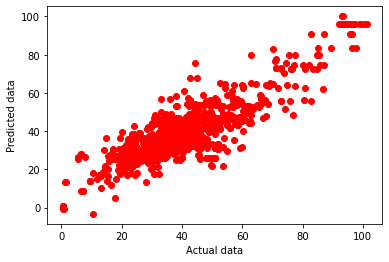

AttributeError: 'MLPRegressor' object has no attribute 'feature_importances_'

In [42]:
pickle.dump(complex_model_1, open('bolt_r_ann.pkl','wb'))
# Print the predicted and actual value for the test set
MLR_y_test_prediction= complex_model_1.predict(X_test_NEWS2)
np.savetxt('ANN_test_prediction.csv', MLR_y_test_prediction, delimiter=',', fmt='%s')
np.savetxt('ANN_test_actual.csv', y_test, delimiter=',', fmt='%s')

# Print the predicted and actual value for the traing set
MLR_y_train_prediction= complex_model_1.predict(X_train_NEWS2)
np.savetxt('ANN_train_prediction.csv', MLR_y_train_prediction, delimiter=',', fmt='%s')
np.savetxt('ANN_train_actual.csv', y_train, delimiter=',', fmt='%s')

transformer = ColumnTransformer(transformers=[

    ('tnf1',KNNImputer(n_neighbors=3,weights='distance'),[0,1,2,3,5]),
    ('tnf2',SimpleImputer(strategy='most_frequent'),['fiber type']),
    ('tnf3',OneHotEncoder(sparse=False,drop='first',dtype=np.int32),[4])
],remainder='passthrough')

X_NEWS=pd.DataFrame(transformer.fit_transform(X))
X_NEWS.drop(columns=[5],inplace=True)


from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_NEWS2 = pd.DataFrame(scaler.fit_transform(X_NEWS))
pickle.dump(scaler, open('scaler.pkl','wb'))

x_NEWS2_cols=['nominal coarse aggregate size (mm)','RCA%','Rubber (%)','Fiber (%)','W/C','other', 'polypropylene','steel']
X_NEWS2.columns=x_NEWS2_cols


X_standardized = X_NEWS2
MLR_y_pred_entire_data = complex_model_1.predict(X_standardized)
np.savetxt('ANN_entire_prediction.csv', MLR_y_pred_entire_data, delimiter=',', fmt='%s')
np.savetxt('ANN_entire_actual.csv', y, delimiter=',', fmt='%s')

import matplotlib.pyplot as plt
plt.plot(y, MLR_y_pred_entire_data,  'ro')
plt.ylabel('Predicted data')
plt.xlabel('Actual data')
plt.show()

features = list(X_train_NEWS2.columns.values)
importances = complex_model_1.feature_importances_
import numpy as np
indices = np.argsort(importances)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

print(importances)

# Gradient boost regressor

In [43]:
from sklearn.ensemble import GradientBoostingRegressor
complex_model_1 = GradientBoostingRegressor(random_state=0).fit(X_train_NEWS, y_train)


pred = complex_model_1.predict(X_test_NEWS)
rmse_train = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_train_NEWS), y_train)),'.3f'))
r2_train = float(format(complex_model_1.score(X_train_NEWS, y_train),'.3f'))
ar2_train = float(format(adjustedR2(complex_model_1.score(X_train_NEWS, y_train),X_train_NEWS.shape[0],len(features)),'.3f'))
mae_train=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_train_NEWS), y_train)),'.3f'))

rmse_test = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_test_NEWS), y_test)),'.3f'))
r2_test = float(format(complex_model_1.score(X_test_NEWS, y_test),'.3f'))
ar2_test = float(format(adjustedR2(complex_model_1.score(X_test_NEWS, y_test),X_test_NEWS.shape[0],len(features)),'.3f'))
mae_test=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_test_NEWS), y_test)),'.3f'))

cv = float(format(cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10).mean(),'.3f'))

cv_train_rmse=cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='neg_root_mean_squared_error')
cv_train_rmse_m=float(format(cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='neg_root_mean_squared_error').mean(),'.3f'))

cv_train_r2=cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='r2')
cv_train_r2_m=float(format(cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='r2').mean(),'.3f'))

cv_train_ar2=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='r2'),X_train_NEWS.shape[0],len(features))
cv_train_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='r2').mean(),X_train_NEWS.shape[0],len(features))

cv_train_mae=cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='neg_mean_absolute_error')
cv_train_mae_m=cross_val_score(complex_model_1,X_train_NEWS, y_train,cv=10,scoring='neg_mean_absolute_error').mean()

cv_test_rmse=cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='neg_root_mean_squared_error')
cv_test_rmse_m=cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='neg_root_mean_squared_error').mean()

cv_test_r2=cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='r2')
cv_test_r2_m=cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='r2').mean()

cv_test_ar2=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='r2'),X_test_NEWS.shape[0],len(features))
cv_test_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='r2').mean(),X_test_NEWS.shape[0],len(features))

cv_test_mae=cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='neg_mean_absolute_error')
cv_test_mae_m=cross_val_score(complex_model_1,X_test_NEWS, y_test,cv=10,scoring='neg_mean_absolute_error').mean()


r = evaluation2.shape[0]
evaluation2.loc[r] = ['GB','Train RMSE',float(format(cv_train_rmse[0],'.3f')),float(format(cv_train_rmse[1],'.3f')),float(format(cv_train_rmse[2],'.3f')),float(format(cv_train_rmse[3],'.3f')),float(format(cv_train_rmse[4],'.3f')),float(format(cv_train_rmse[5],'.3f')),float(format(cv_train_rmse[6],'.3f')),float(format(cv_train_rmse[7],'.3f')),float(format(cv_train_rmse[8],'.3f')),float(format(cv_train_rmse[9],'.3f')),float(format(cv_train_rmse_m,'.3f'))]
evaluation2.loc[r+1] = ['GB','Train R2',float(format(cv_train_r2[0],'.3f')),float(format(cv_train_r2[1],'.3f')),float(format(cv_train_r2[2],'.3f')),float(format(cv_train_r2[3],'.3f')),float(format(cv_train_r2[4],'.3f')),float(format(cv_train_r2[5],'.3f')),float(format(cv_train_r2[6],'.3f')),float(format(cv_train_r2[7],'.3f')),float(format(cv_train_r2[8],'.3f')),float(format(cv_train_r2[9],'.3f')),float(format(cv_train_r2_m,'.3f'))]
evaluation2.loc[r+2] = ['GB','Train ar2',float(format(cv_train_ar2[0],'.3f')),float(format(cv_train_ar2[1],'.3f')),float(format(cv_train_ar2[2],'.3f')),float(format(cv_train_ar2[3],'.3f')),float(format(cv_train_ar2[4],'.3f')),float(format(cv_train_ar2[5],'.3f')),float(format(cv_train_ar2[6],'.3f')),float(format(cv_train_ar2[7],'.3f')),float(format(cv_train_ar2[8],'.3f')),float(format(cv_train_ar2[9],'.3f')),float(format(cv_train_ar2_m,'.3f'))]
evaluation2.loc[r+3] = ['GB','Train mae',float(format(cv_train_mae[0],'.3f')),float(format(cv_train_mae[1],'.3f')),float(format(cv_train_mae[2],'.3f')),float(format(cv_train_mae[3],'.3f')),float(format(cv_train_mae[4],'.3f')),float(format(cv_train_mae[5],'.3f')),float(format(cv_train_mae[6],'.3f')),float(format(cv_train_mae[7],'.3f')),float(format(cv_train_mae[8],'.3f')),float(format(cv_train_mae[9],'.3f')),float(format(cv_train_mae_m,'.3f'))]
evaluation2.loc[r+4] = ['GB','Test RMSE',float(format(cv_test_rmse[0],'.3f')),float(format(cv_test_rmse[1],'.3f')),float(format(cv_test_rmse[2],'.3f')),float(format(cv_test_rmse[3],'.3f')),float(format(cv_test_rmse[4],'.3f')),float(format(cv_test_rmse[5],'.3f')),float(format(cv_test_rmse[6],'.3f')),float(format(cv_test_rmse[7],'.3f')),float(format(cv_test_rmse[8],'.3f')),float(format(cv_test_rmse[9],'.3f')),float(format(cv_test_rmse_m,'.3f'))]
evaluation2.loc[r+5] = ['GB','Test R2',float(format(cv_test_r2[0],'.3f')),float(format(cv_test_r2[1],'.3f')),float(format(cv_test_r2[2],'.3f')),float(format(cv_test_r2[3],'.3f')),float(format(cv_test_r2[4],'.3f')),float(format(cv_test_r2[5],'.3f')),float(format(cv_test_r2[6],'.3f')),float(format(cv_test_r2[7],'.3f')),float(format(cv_test_r2[8],'.3f')),float(format(cv_test_r2[9],'.3f')),float(format(cv_test_r2_m,'.3f'))]
evaluation2.loc[r+6] = ['GB','Test ar2',float(format(cv_test_ar2[0],'.3f')),float(format(cv_test_ar2[1],'.3f')),float(format(cv_test_ar2[2],'.3f')),float(format(cv_test_ar2[3],'.3f')),float(format(cv_test_ar2[4],'.3f')),float(format(cv_test_ar2[5],'.3f')),float(format(cv_test_ar2[6],'.3f')),float(format(cv_test_ar2[7],'.3f')),float(format(cv_test_ar2[8],'.3f')),float(format(cv_test_ar2[9],'.3f')),float(format(cv_test_ar2_m,'.3f'))]
evaluation2.loc[r+7] = ['GB','Train mae',float(format(cv_test_mae[0],'.3f')),float(format(cv_test_mae[1],'.3f')),float(format(cv_test_mae[2],'.3f')),float(format(cv_test_mae[3],'.3f')),float(format(cv_test_mae[4],'.3f')),float(format(cv_test_mae[5],'.3f')),float(format(cv_test_mae[6],'.3f')),float(format(cv_test_mae[7],'.3f')),float(format(cv_test_mae[8],'.3f')),float(format(cv_test_mae[9],'.3f')),float(format(cv_test_mae_m,'.3f')) ]

r = evaluation.shape[0]
evaluation.loc[r] = ['GB','All features',rmse_train,r2_train,ar2_train,mae_train,rmse_test,r2_test,ar2_test,mae_test,cv]
evaluation.sort_values(by = '10-Fold Cross Validation', ascending=False)

,Model,Details,RMSE(train),R-squared (train),Adj R-squared (train),MAE (train),RMSE (test),R-squared (test),Adj R-squared (test),MAE(test),10-Fold Cross Validation
9,CB,All features,4.959,0.922,0.921,3.572,7.542,0.819,0.812,5.524,0.806
7,XB,All features,4.097,0.947,0.946,2.529,7.560,0.818,0.811,5.304,0.798
6,RF,All features,4.470,0.936,0.936,3.005,8.132,0.790,0.781,5.693,0.786
11,GB,All features,6.931,0.847,0.846,5.122,7.951,0.799,0.791,6.073,0.777
5,DT,All features,3.947,0.950,0.950,2.084,9.133,0.735,0.724,6.176,0.715
10,ANN,All features,8.186,0.787,0.785,6.195,9.806,0.694,0.682,7.484,0.666
2,KNN,All features,6.882,0.849,0.848,4.630,9.856,0.691,0.679,6.965,0.657
4,SVR,All features,9.845,0.692,0.689,6.598,9.874,0.690,0.678,7.219,0.622
8,AB,All features,10.824,0.627,0.623,9.151,11.172,0.603,0.587,9.588,0.601
0,LR,All features,12.409,0.510,0.506,9.912,12.161,0.530,0.514,9.938,0.485


# votingboost regressor

In [45]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import VotingRegressor

reg1 = GradientBoostingRegressor(random_state=23)
reg2 = RandomForestRegressor(random_state=1)
reg3 = CatBoostRegressor(random_seed = 23)
reg4 = xgb.XGBRegressor(n_estimators=100, learning_rate=0.08, gamma=0, subsample=0.75,
                           colsample_bytree=1, max_depth=10)
complex_model_1 = VotingRegressor(estimators=[('gb', reg1), ('rf', reg2), ('cb', reg3), ('xgb', reg4)])

complex_model_1.fit(X_train_NEWS2, y_train)

pred = complex_model_1.predict(X_test_NEWS2)
rmse_train = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))
r2_train = float(format(complex_model_1.score(X_train_NEWS2, y_train),'.3f'))
ar2_train = float(format(adjustedR2(complex_model_1.score(X_train_NEWS2, y_train),X_train_NEWS2.shape[0],len(features)),'.3f'))
mae_train=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_train_NEWS2), y_train)),'.3f'))

rmse_test = float(format(np.sqrt(metrics.mean_squared_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))
r2_test = float(format(complex_model_1.score(X_test_NEWS2, y_test),'.3f'))
ar2_test = float(format(adjustedR2(complex_model_1.score(X_test_NEWS2, y_test),X_test_NEWS2.shape[0],len(features)),'.3f'))
mae_test=float(format((metrics.mean_absolute_error(complex_model_1.predict(X_test_NEWS2), y_test)),'.3f'))

cv = float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10).mean(),'.3f'))

cv_train_rmse=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error')
cv_train_rmse_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_root_mean_squared_error').mean(),'.3f'))

cv_train_r2=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2')
cv_train_r2_m=float(format(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),'.3f'))

cv_train_ar2=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2'),X_train_NEWS2.shape[0],len(features))
cv_train_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='r2').mean(),X_train_NEWS2.shape[0],len(features))

cv_train_mae=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error')
cv_train_mae_m=cross_val_score(complex_model_1,X_train_NEWS2, y_train,cv=10,scoring='neg_mean_absolute_error').mean()

cv_test_rmse=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error')
cv_test_rmse_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_root_mean_squared_error').mean()

cv_test_r2=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2')
cv_test_r2_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean()

cv_test_ar2=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2'),X_test_NEWS2.shape[0],len(features))
cv_test_ar2_m=adjustedR2(cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='r2').mean(),X_test_NEWS2.shape[0],len(features))

cv_test_mae=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error')
cv_test_mae_m=cross_val_score(complex_model_1,X_test_NEWS2, y_test,cv=10,scoring='neg_mean_absolute_error').mean()


r = evaluation2.shape[0]
evaluation2.loc[r] = ['VR','Train RMSE',float(format(cv_train_rmse[0],'.3f')),float(format(cv_train_rmse[1],'.3f')),float(format(cv_train_rmse[2],'.3f')),float(format(cv_train_rmse[3],'.3f')),float(format(cv_train_rmse[4],'.3f')),float(format(cv_train_rmse[5],'.3f')),float(format(cv_train_rmse[6],'.3f')),float(format(cv_train_rmse[7],'.3f')),float(format(cv_train_rmse[8],'.3f')),float(format(cv_train_rmse[9],'.3f')),float(format(cv_train_rmse_m,'.3f'))]
evaluation2.loc[r+1] = ['VR','Train R2',float(format(cv_train_r2[0],'.3f')),float(format(cv_train_r2[1],'.3f')),float(format(cv_train_r2[2],'.3f')),float(format(cv_train_r2[3],'.3f')),float(format(cv_train_r2[4],'.3f')),float(format(cv_train_r2[5],'.3f')),float(format(cv_train_r2[6],'.3f')),float(format(cv_train_r2[7],'.3f')),float(format(cv_train_r2[8],'.3f')),float(format(cv_train_r2[9],'.3f')),float(format(cv_train_r2_m,'.3f'))]
evaluation2.loc[r+2] = ['VR','Train ar2',float(format(cv_train_ar2[0],'.3f')),float(format(cv_train_ar2[1],'.3f')),float(format(cv_train_ar2[2],'.3f')),float(format(cv_train_ar2[3],'.3f')),float(format(cv_train_ar2[4],'.3f')),float(format(cv_train_ar2[5],'.3f')),float(format(cv_train_ar2[6],'.3f')),float(format(cv_train_ar2[7],'.3f')),float(format(cv_train_ar2[8],'.3f')),float(format(cv_train_ar2[9],'.3f')),float(format(cv_train_ar2_m,'.3f'))]
evaluation2.loc[r+3] = ['VR','Train mae',float(format(cv_train_mae[0],'.3f')),float(format(cv_train_mae[1],'.3f')),float(format(cv_train_mae[2],'.3f')),float(format(cv_train_mae[3],'.3f')),float(format(cv_train_mae[4],'.3f')),float(format(cv_train_mae[5],'.3f')),float(format(cv_train_mae[6],'.3f')),float(format(cv_train_mae[7],'.3f')),float(format(cv_train_mae[8],'.3f')),float(format(cv_train_mae[9],'.3f')),float(format(cv_train_mae_m,'.3f'))]
evaluation2.loc[r+4] = ['VR','Test RMSE',float(format(cv_test_rmse[0],'.3f')),float(format(cv_test_rmse[1],'.3f')),float(format(cv_test_rmse[2],'.3f')),float(format(cv_test_rmse[3],'.3f')),float(format(cv_test_rmse[4],'.3f')),float(format(cv_test_rmse[5],'.3f')),float(format(cv_test_rmse[6],'.3f')),float(format(cv_test_rmse[7],'.3f')),float(format(cv_test_rmse[8],'.3f')),float(format(cv_test_rmse[9],'.3f')),float(format(cv_test_rmse_m,'.3f'))]
evaluation2.loc[r+5] = ['VR','Test R2',float(format(cv_test_r2[0],'.3f')),float(format(cv_test_r2[1],'.3f')),float(format(cv_test_r2[2],'.3f')),float(format(cv_test_r2[3],'.3f')),float(format(cv_test_r2[4],'.3f')),float(format(cv_test_r2[5],'.3f')),float(format(cv_test_r2[6],'.3f')),float(format(cv_test_r2[7],'.3f')),float(format(cv_test_r2[8],'.3f')),float(format(cv_test_r2[9],'.3f')),float(format(cv_test_r2_m,'.3f'))]
evaluation2.loc[r+6] = ['VR','Test ar2',float(format(cv_test_ar2[0],'.3f')),float(format(cv_test_ar2[1],'.3f')),float(format(cv_test_ar2[2],'.3f')),float(format(cv_test_ar2[3],'.3f')),float(format(cv_test_ar2[4],'.3f')),float(format(cv_test_ar2[5],'.3f')),float(format(cv_test_ar2[6],'.3f')),float(format(cv_test_ar2[7],'.3f')),float(format(cv_test_ar2[8],'.3f')),float(format(cv_test_ar2[9],'.3f')),float(format(cv_test_ar2_m,'.3f'))]
evaluation2.loc[r+7] = ['VR','Train mae',float(format(cv_test_mae[0],'.3f')),float(format(cv_test_mae[1],'.3f')),float(format(cv_test_mae[2],'.3f')),float(format(cv_test_mae[3],'.3f')),float(format(cv_test_mae[4],'.3f')),float(format(cv_test_mae[5],'.3f')),float(format(cv_test_mae[6],'.3f')),float(format(cv_test_mae[7],'.3f')),float(format(cv_test_mae[8],'.3f')),float(format(cv_test_mae[9],'.3f')),float(format(cv_test_mae_m,'.3f')) ]

r = evaluation.shape[0]
evaluation.loc[r] = ['VR','All features',rmse_train,r2_train,ar2_train,mae_train,rmse_test,r2_test,ar2_test,mae_test,cv]
evaluation.sort_values(by = '10-Fold Cross Validation', ascending=False)

Learning rate set to 0.03894
0:	learn: 17.4476384	total: 706us	remaining: 706ms
1:	learn: 17.0701732	total: 1.29ms	remaining: 643ms
2:	learn: 16.7637697	total: 1.74ms	remaining: 578ms
3:	learn: 16.4742238	total: 2.18ms	remaining: 544ms
4:	learn: 16.1286724	total: 2.65ms	remaining: 527ms
5:	learn: 15.8849926	total: 3.08ms	remaining: 511ms
6:	learn: 15.5958753	total: 3.55ms	remaining: 503ms
7:	learn: 15.3107149	total: 4ms	remaining: 496ms
8:	learn: 15.0371092	total: 4.43ms	remaining: 488ms
9:	learn: 14.7923397	total: 4.89ms	remaining: 484ms
10:	learn: 14.5669555	total: 5.33ms	remaining: 480ms
11:	learn: 14.3619418	total: 5.81ms	remaining: 478ms
12:	learn: 14.1613784	total: 6.25ms	remaining: 474ms
13:	learn: 13.9573555	total: 6.7ms	remaining: 472ms
14:	learn: 13.7653490	total: 7.13ms	remaining: 468ms
15:	learn: 13.5917635	total: 7.58ms	remaining: 466ms
16:	learn: 13.4214261	total: 8.03ms	remaining: 464ms
17:	learn: 13.2445991	total: 8.48ms	remaining: 462ms
18:	learn: 13.0845755	total: 8.9

302:	learn: 6.3772949	total: 134ms	remaining: 307ms
303:	learn: 6.3736741	total: 134ms	remaining: 307ms
304:	learn: 6.3608068	total: 135ms	remaining: 307ms
305:	learn: 6.3575369	total: 135ms	remaining: 306ms
306:	learn: 6.3522948	total: 136ms	remaining: 306ms
307:	learn: 6.3498434	total: 136ms	remaining: 305ms
308:	learn: 6.3390582	total: 136ms	remaining: 305ms
309:	learn: 6.3356492	total: 137ms	remaining: 305ms
310:	learn: 6.3346375	total: 137ms	remaining: 304ms
311:	learn: 6.3332945	total: 138ms	remaining: 304ms
312:	learn: 6.3291015	total: 138ms	remaining: 303ms
313:	learn: 6.3285291	total: 139ms	remaining: 303ms
314:	learn: 6.3228750	total: 139ms	remaining: 302ms
315:	learn: 6.3144701	total: 140ms	remaining: 302ms
316:	learn: 6.3107230	total: 140ms	remaining: 302ms
317:	learn: 6.3047777	total: 140ms	remaining: 301ms
318:	learn: 6.3038535	total: 141ms	remaining: 301ms
319:	learn: 6.2945081	total: 141ms	remaining: 300ms
320:	learn: 6.2936100	total: 142ms	remaining: 300ms
321:	learn: 

615:	learn: 5.4273723	total: 274ms	remaining: 171ms
616:	learn: 5.4261542	total: 274ms	remaining: 170ms
617:	learn: 5.4249528	total: 275ms	remaining: 170ms
618:	learn: 5.4226912	total: 275ms	remaining: 169ms
619:	learn: 5.4221760	total: 276ms	remaining: 169ms
620:	learn: 5.4203888	total: 276ms	remaining: 168ms
621:	learn: 5.4176751	total: 276ms	remaining: 168ms
622:	learn: 5.4130566	total: 277ms	remaining: 168ms
623:	learn: 5.4110837	total: 277ms	remaining: 167ms
624:	learn: 5.4089442	total: 278ms	remaining: 167ms
625:	learn: 5.4068369	total: 278ms	remaining: 166ms
626:	learn: 5.4039868	total: 279ms	remaining: 166ms
627:	learn: 5.4021611	total: 279ms	remaining: 165ms
628:	learn: 5.3993703	total: 280ms	remaining: 165ms
629:	learn: 5.3980406	total: 280ms	remaining: 165ms
630:	learn: 5.3942905	total: 281ms	remaining: 164ms
631:	learn: 5.3930557	total: 281ms	remaining: 164ms
632:	learn: 5.3908425	total: 282ms	remaining: 163ms
633:	learn: 5.3900188	total: 282ms	remaining: 163ms
634:	learn: 

929:	learn: 5.0270181	total: 414ms	remaining: 31.2ms
930:	learn: 5.0255302	total: 415ms	remaining: 30.7ms
931:	learn: 5.0250188	total: 415ms	remaining: 30.3ms
932:	learn: 5.0233328	total: 416ms	remaining: 29.8ms
933:	learn: 5.0228423	total: 416ms	remaining: 29.4ms
934:	learn: 5.0215744	total: 416ms	remaining: 29ms
935:	learn: 5.0194138	total: 417ms	remaining: 28.5ms
936:	learn: 5.0180648	total: 417ms	remaining: 28.1ms
937:	learn: 5.0174003	total: 418ms	remaining: 27.6ms
938:	learn: 5.0170708	total: 418ms	remaining: 27.2ms
939:	learn: 5.0162083	total: 419ms	remaining: 26.7ms
940:	learn: 5.0149836	total: 419ms	remaining: 26.3ms
941:	learn: 5.0142265	total: 420ms	remaining: 25.8ms
942:	learn: 5.0132032	total: 420ms	remaining: 25.4ms
943:	learn: 5.0129384	total: 421ms	remaining: 25ms
944:	learn: 5.0124530	total: 421ms	remaining: 24.5ms
945:	learn: 5.0123416	total: 422ms	remaining: 24.1ms
946:	learn: 5.0114642	total: 422ms	remaining: 23.6ms
947:	learn: 5.0107455	total: 422ms	remaining: 23.2

295:	learn: 6.3639404	total: 129ms	remaining: 307ms
296:	learn: 6.3501224	total: 129ms	remaining: 306ms
297:	learn: 6.3448829	total: 130ms	remaining: 306ms
298:	learn: 6.3338819	total: 130ms	remaining: 306ms
299:	learn: 6.3215343	total: 131ms	remaining: 305ms
300:	learn: 6.3111868	total: 131ms	remaining: 305ms
301:	learn: 6.3064435	total: 132ms	remaining: 304ms
302:	learn: 6.3052688	total: 132ms	remaining: 304ms
303:	learn: 6.3001852	total: 133ms	remaining: 304ms
304:	learn: 6.2970642	total: 133ms	remaining: 303ms
305:	learn: 6.2920788	total: 134ms	remaining: 303ms
306:	learn: 6.2867693	total: 134ms	remaining: 302ms
307:	learn: 6.2845819	total: 134ms	remaining: 302ms
308:	learn: 6.2757827	total: 135ms	remaining: 302ms
309:	learn: 6.2704640	total: 135ms	remaining: 301ms
310:	learn: 6.2694198	total: 136ms	remaining: 301ms
311:	learn: 6.2616229	total: 136ms	remaining: 300ms
312:	learn: 6.2598141	total: 137ms	remaining: 300ms
313:	learn: 6.2539792	total: 137ms	remaining: 299ms
314:	learn: 

607:	learn: 5.5037631	total: 268ms	remaining: 173ms
608:	learn: 5.5005579	total: 268ms	remaining: 172ms
609:	learn: 5.4991950	total: 269ms	remaining: 172ms
610:	learn: 5.4980386	total: 269ms	remaining: 171ms
611:	learn: 5.4947555	total: 270ms	remaining: 171ms
612:	learn: 5.4942795	total: 270ms	remaining: 171ms
613:	learn: 5.4921243	total: 271ms	remaining: 171ms
614:	learn: 5.4919179	total: 272ms	remaining: 170ms
615:	learn: 5.4899568	total: 272ms	remaining: 170ms
616:	learn: 5.4896160	total: 273ms	remaining: 169ms
617:	learn: 5.4886068	total: 273ms	remaining: 169ms
618:	learn: 5.4883188	total: 274ms	remaining: 168ms
619:	learn: 5.4861521	total: 274ms	remaining: 168ms
620:	learn: 5.4848864	total: 275ms	remaining: 168ms
621:	learn: 5.4827001	total: 275ms	remaining: 167ms
622:	learn: 5.4814004	total: 276ms	remaining: 167ms
623:	learn: 5.4809523	total: 276ms	remaining: 167ms
624:	learn: 5.4807259	total: 277ms	remaining: 166ms
625:	learn: 5.4756092	total: 277ms	remaining: 166ms
626:	learn: 

836:	learn: 5.1470749	total: 397ms	remaining: 77.2ms
837:	learn: 5.1448988	total: 397ms	remaining: 76.7ms
838:	learn: 5.1435843	total: 397ms	remaining: 76.3ms
839:	learn: 5.1428973	total: 398ms	remaining: 75.8ms
840:	learn: 5.1425493	total: 399ms	remaining: 75.4ms
841:	learn: 5.1416619	total: 400ms	remaining: 75ms
842:	learn: 5.1405431	total: 401ms	remaining: 74.6ms
843:	learn: 5.1400832	total: 402ms	remaining: 74.2ms
844:	learn: 5.1394560	total: 402ms	remaining: 73.7ms
845:	learn: 5.1379448	total: 402ms	remaining: 73.3ms
846:	learn: 5.1364168	total: 403ms	remaining: 72.8ms
847:	learn: 5.1358683	total: 404ms	remaining: 72.4ms
848:	learn: 5.1342136	total: 404ms	remaining: 71.9ms
849:	learn: 5.1336329	total: 405ms	remaining: 71.5ms
850:	learn: 5.1326898	total: 405ms	remaining: 71ms
851:	learn: 5.1321256	total: 406ms	remaining: 70.5ms
852:	learn: 5.1313621	total: 406ms	remaining: 70ms
853:	learn: 5.1303788	total: 407ms	remaining: 69.5ms
854:	learn: 5.1295519	total: 407ms	remaining: 69ms
8

Learning rate set to 0.038295
0:	learn: 17.3482669	total: 772us	remaining: 772ms
1:	learn: 16.9777971	total: 1.49ms	remaining: 741ms
2:	learn: 16.6898604	total: 2.12ms	remaining: 703ms
3:	learn: 16.4290698	total: 2.79ms	remaining: 694ms
4:	learn: 16.1156603	total: 3.42ms	remaining: 681ms
5:	learn: 15.8881348	total: 4.02ms	remaining: 666ms
6:	learn: 15.6631980	total: 4.49ms	remaining: 637ms
7:	learn: 15.3824851	total: 4.93ms	remaining: 611ms
8:	learn: 15.1058183	total: 5.36ms	remaining: 590ms
9:	learn: 14.8700286	total: 5.81ms	remaining: 576ms
10:	learn: 14.6743713	total: 6.26ms	remaining: 562ms
11:	learn: 14.4643436	total: 6.71ms	remaining: 553ms
12:	learn: 14.2730013	total: 7.19ms	remaining: 546ms
13:	learn: 14.0611692	total: 7.63ms	remaining: 537ms
14:	learn: 13.8527984	total: 8.06ms	remaining: 530ms
15:	learn: 13.6914256	total: 8.52ms	remaining: 524ms
16:	learn: 13.4924001	total: 8.96ms	remaining: 518ms
17:	learn: 13.3507271	total: 9.41ms	remaining: 513ms
18:	learn: 13.1955489	total

269:	learn: 6.5578504	total: 134ms	remaining: 363ms
270:	learn: 6.5491801	total: 135ms	remaining: 362ms
271:	learn: 6.5455413	total: 135ms	remaining: 361ms
272:	learn: 6.5388195	total: 136ms	remaining: 361ms
273:	learn: 6.5337148	total: 136ms	remaining: 361ms
274:	learn: 6.5291253	total: 137ms	remaining: 361ms
275:	learn: 6.5252743	total: 138ms	remaining: 361ms
276:	learn: 6.5206723	total: 138ms	remaining: 361ms
277:	learn: 6.5156846	total: 139ms	remaining: 360ms
278:	learn: 6.5067193	total: 139ms	remaining: 360ms
279:	learn: 6.4959913	total: 140ms	remaining: 359ms
280:	learn: 6.4876781	total: 140ms	remaining: 359ms
281:	learn: 6.4824385	total: 141ms	remaining: 358ms
282:	learn: 6.4784207	total: 141ms	remaining: 357ms
283:	learn: 6.4723345	total: 142ms	remaining: 357ms
284:	learn: 6.4682104	total: 142ms	remaining: 357ms
285:	learn: 6.4635780	total: 143ms	remaining: 356ms
286:	learn: 6.4517492	total: 143ms	remaining: 355ms
287:	learn: 6.4440959	total: 143ms	remaining: 355ms
288:	learn: 

552:	learn: 5.5527054	total: 271ms	remaining: 219ms
553:	learn: 5.5496821	total: 271ms	remaining: 219ms
554:	learn: 5.5486558	total: 272ms	remaining: 218ms
555:	learn: 5.5480681	total: 272ms	remaining: 217ms
556:	learn: 5.5462764	total: 273ms	remaining: 217ms
557:	learn: 5.5420277	total: 273ms	remaining: 216ms
558:	learn: 5.5406463	total: 274ms	remaining: 216ms
559:	learn: 5.5356718	total: 274ms	remaining: 215ms
560:	learn: 5.5342406	total: 275ms	remaining: 215ms
561:	learn: 5.5334652	total: 275ms	remaining: 214ms
562:	learn: 5.5308549	total: 276ms	remaining: 214ms
563:	learn: 5.5286520	total: 276ms	remaining: 213ms
564:	learn: 5.5269934	total: 276ms	remaining: 213ms
565:	learn: 5.5250251	total: 277ms	remaining: 212ms
566:	learn: 5.5235629	total: 277ms	remaining: 212ms
567:	learn: 5.5220818	total: 278ms	remaining: 211ms
568:	learn: 5.5201866	total: 278ms	remaining: 211ms
569:	learn: 5.5172694	total: 279ms	remaining: 210ms
570:	learn: 5.5157503	total: 279ms	remaining: 210ms
571:	learn: 

854:	learn: 5.0592250	total: 410ms	remaining: 69.6ms
855:	learn: 5.0579719	total: 411ms	remaining: 69.1ms
856:	learn: 5.0575625	total: 411ms	remaining: 68.6ms
857:	learn: 5.0561136	total: 412ms	remaining: 68.1ms
858:	learn: 5.0549805	total: 412ms	remaining: 67.7ms
859:	learn: 5.0537963	total: 413ms	remaining: 67.2ms
860:	learn: 5.0533588	total: 413ms	remaining: 66.7ms
861:	learn: 5.0515471	total: 414ms	remaining: 66.2ms
862:	learn: 5.0505625	total: 414ms	remaining: 65.7ms
863:	learn: 5.0485686	total: 414ms	remaining: 65.2ms
864:	learn: 5.0478695	total: 415ms	remaining: 64.7ms
865:	learn: 5.0468635	total: 415ms	remaining: 64.3ms
866:	learn: 5.0444341	total: 416ms	remaining: 63.8ms
867:	learn: 5.0437314	total: 416ms	remaining: 63.3ms
868:	learn: 5.0432040	total: 417ms	remaining: 62.8ms
869:	learn: 5.0426218	total: 417ms	remaining: 62.3ms
870:	learn: 5.0419950	total: 417ms	remaining: 61.8ms
871:	learn: 5.0397076	total: 418ms	remaining: 61.3ms
872:	learn: 5.0376896	total: 418ms	remaining: 

314:	learn: 6.4154469	total: 141ms	remaining: 307ms
315:	learn: 6.4116273	total: 141ms	remaining: 306ms
316:	learn: 6.4106528	total: 142ms	remaining: 306ms
317:	learn: 6.4060967	total: 142ms	remaining: 305ms
318:	learn: 6.4013157	total: 143ms	remaining: 305ms
319:	learn: 6.3918520	total: 143ms	remaining: 304ms
320:	learn: 6.3847261	total: 144ms	remaining: 304ms
321:	learn: 6.3786081	total: 144ms	remaining: 303ms
322:	learn: 6.3723339	total: 144ms	remaining: 303ms
323:	learn: 6.3644084	total: 145ms	remaining: 303ms
324:	learn: 6.3602266	total: 145ms	remaining: 302ms
325:	learn: 6.3563100	total: 146ms	remaining: 302ms
326:	learn: 6.3530939	total: 146ms	remaining: 301ms
327:	learn: 6.3443277	total: 147ms	remaining: 301ms
328:	learn: 6.3431801	total: 147ms	remaining: 300ms
329:	learn: 6.3402664	total: 148ms	remaining: 300ms
330:	learn: 6.3334375	total: 148ms	remaining: 299ms
331:	learn: 6.3297305	total: 148ms	remaining: 299ms
332:	learn: 6.3286592	total: 149ms	remaining: 298ms
333:	learn: 

626:	learn: 5.4937518	total: 280ms	remaining: 167ms
627:	learn: 5.4916400	total: 281ms	remaining: 166ms
628:	learn: 5.4886755	total: 281ms	remaining: 166ms
629:	learn: 5.4872247	total: 282ms	remaining: 165ms
630:	learn: 5.4832324	total: 282ms	remaining: 165ms
631:	learn: 5.4823932	total: 283ms	remaining: 165ms
632:	learn: 5.4780506	total: 283ms	remaining: 164ms
633:	learn: 5.4773640	total: 283ms	remaining: 164ms
634:	learn: 5.4747115	total: 284ms	remaining: 163ms
635:	learn: 5.4737513	total: 284ms	remaining: 163ms
636:	learn: 5.4735856	total: 285ms	remaining: 162ms
637:	learn: 5.4727280	total: 285ms	remaining: 162ms
638:	learn: 5.4715101	total: 286ms	remaining: 161ms
639:	learn: 5.4695099	total: 286ms	remaining: 161ms
640:	learn: 5.4678424	total: 287ms	remaining: 161ms
641:	learn: 5.4674135	total: 287ms	remaining: 160ms
642:	learn: 5.4672323	total: 287ms	remaining: 160ms
643:	learn: 5.4662481	total: 288ms	remaining: 159ms
644:	learn: 5.4660704	total: 288ms	remaining: 159ms
645:	learn: 

940:	learn: 5.1374403	total: 422ms	remaining: 26.5ms
941:	learn: 5.1368511	total: 423ms	remaining: 26ms
942:	learn: 5.1346004	total: 423ms	remaining: 25.6ms
943:	learn: 5.1335381	total: 424ms	remaining: 25.1ms
944:	learn: 5.1312959	total: 424ms	remaining: 24.7ms
945:	learn: 5.1302619	total: 425ms	remaining: 24.2ms
946:	learn: 5.1289679	total: 425ms	remaining: 23.8ms
947:	learn: 5.1278117	total: 426ms	remaining: 23.4ms
948:	learn: 5.1269392	total: 427ms	remaining: 22.9ms
949:	learn: 5.1249025	total: 427ms	remaining: 22.5ms
950:	learn: 5.1242741	total: 427ms	remaining: 22ms
951:	learn: 5.1239635	total: 428ms	remaining: 21.6ms
952:	learn: 5.1232909	total: 429ms	remaining: 21.1ms
953:	learn: 5.1212804	total: 429ms	remaining: 20.7ms
954:	learn: 5.1200725	total: 430ms	remaining: 20.2ms
955:	learn: 5.1196372	total: 430ms	remaining: 19.8ms
956:	learn: 5.1178361	total: 431ms	remaining: 19.3ms
957:	learn: 5.1177830	total: 431ms	remaining: 18.9ms
958:	learn: 5.1166906	total: 432ms	remaining: 18.4

309:	learn: 6.1652357	total: 139ms	remaining: 309ms
310:	learn: 6.1576851	total: 140ms	remaining: 309ms
311:	learn: 6.1560932	total: 140ms	remaining: 309ms
312:	learn: 6.1510097	total: 141ms	remaining: 309ms
313:	learn: 6.1454479	total: 141ms	remaining: 309ms
314:	learn: 6.1374303	total: 142ms	remaining: 308ms
315:	learn: 6.1335843	total: 142ms	remaining: 308ms
316:	learn: 6.1288941	total: 143ms	remaining: 308ms
317:	learn: 6.1204926	total: 143ms	remaining: 307ms
318:	learn: 6.1150396	total: 144ms	remaining: 307ms
319:	learn: 6.1126305	total: 144ms	remaining: 307ms
320:	learn: 6.1078271	total: 145ms	remaining: 306ms
321:	learn: 6.1030349	total: 145ms	remaining: 306ms
322:	learn: 6.0977301	total: 146ms	remaining: 306ms
323:	learn: 6.0929210	total: 146ms	remaining: 306ms
324:	learn: 6.0904456	total: 147ms	remaining: 305ms
325:	learn: 6.0834130	total: 147ms	remaining: 305ms
326:	learn: 6.0796469	total: 148ms	remaining: 304ms
327:	learn: 6.0786971	total: 148ms	remaining: 304ms
328:	learn: 

597:	learn: 5.2598907	total: 276ms	remaining: 186ms
598:	learn: 5.2573097	total: 277ms	remaining: 185ms
599:	learn: 5.2560796	total: 277ms	remaining: 185ms
600:	learn: 5.2550455	total: 278ms	remaining: 184ms
601:	learn: 5.2534848	total: 278ms	remaining: 184ms
602:	learn: 5.2506566	total: 279ms	remaining: 184ms
603:	learn: 5.2481012	total: 279ms	remaining: 183ms
604:	learn: 5.2463168	total: 280ms	remaining: 183ms
605:	learn: 5.2455683	total: 280ms	remaining: 182ms
606:	learn: 5.2385687	total: 280ms	remaining: 182ms
607:	learn: 5.2364700	total: 281ms	remaining: 181ms
608:	learn: 5.2347688	total: 281ms	remaining: 181ms
609:	learn: 5.2335213	total: 282ms	remaining: 180ms
610:	learn: 5.2327499	total: 282ms	remaining: 180ms
611:	learn: 5.2295706	total: 283ms	remaining: 179ms
612:	learn: 5.2277904	total: 283ms	remaining: 179ms
613:	learn: 5.2260594	total: 284ms	remaining: 178ms
614:	learn: 5.2233316	total: 284ms	remaining: 178ms
615:	learn: 5.2215929	total: 285ms	remaining: 177ms
616:	learn: 

885:	learn: 4.8200866	total: 413ms	remaining: 53.2ms
886:	learn: 4.8197225	total: 414ms	remaining: 52.7ms
887:	learn: 4.8195017	total: 414ms	remaining: 52.2ms
888:	learn: 4.8181532	total: 415ms	remaining: 51.8ms
889:	learn: 4.8175662	total: 415ms	remaining: 51.3ms
890:	learn: 4.8173739	total: 416ms	remaining: 50.8ms
891:	learn: 4.8162931	total: 416ms	remaining: 50.4ms
892:	learn: 4.8159711	total: 416ms	remaining: 49.9ms
893:	learn: 4.8153705	total: 417ms	remaining: 49.4ms
894:	learn: 4.8147165	total: 417ms	remaining: 49ms
895:	learn: 4.8145681	total: 418ms	remaining: 48.5ms
896:	learn: 4.8142525	total: 418ms	remaining: 48ms
897:	learn: 4.8138030	total: 419ms	remaining: 47.6ms
898:	learn: 4.8111172	total: 419ms	remaining: 47.1ms
899:	learn: 4.8101867	total: 420ms	remaining: 46.6ms
900:	learn: 4.8100136	total: 420ms	remaining: 46.2ms
901:	learn: 4.8099218	total: 421ms	remaining: 45.7ms
902:	learn: 4.8090962	total: 421ms	remaining: 45.2ms
903:	learn: 4.8064348	total: 421ms	remaining: 44.8

305:	learn: 6.4938634	total: 136ms	remaining: 308ms
306:	learn: 6.4888645	total: 136ms	remaining: 307ms
307:	learn: 6.4785978	total: 137ms	remaining: 307ms
308:	learn: 6.4748549	total: 137ms	remaining: 306ms
309:	learn: 6.4675472	total: 137ms	remaining: 306ms
310:	learn: 6.4667562	total: 138ms	remaining: 305ms
311:	learn: 6.4618642	total: 138ms	remaining: 305ms
312:	learn: 6.4575112	total: 139ms	remaining: 304ms
313:	learn: 6.4566438	total: 139ms	remaining: 304ms
314:	learn: 6.4438873	total: 140ms	remaining: 303ms
315:	learn: 6.4299149	total: 140ms	remaining: 303ms
316:	learn: 6.4262927	total: 140ms	remaining: 303ms
317:	learn: 6.4255199	total: 141ms	remaining: 302ms
318:	learn: 6.4124400	total: 141ms	remaining: 302ms
319:	learn: 6.4090171	total: 142ms	remaining: 301ms
320:	learn: 6.4034511	total: 142ms	remaining: 301ms
321:	learn: 6.3987686	total: 143ms	remaining: 300ms
322:	learn: 6.3961223	total: 143ms	remaining: 300ms
323:	learn: 6.3910962	total: 143ms	remaining: 299ms
324:	learn: 

626:	learn: 5.4263447	total: 275ms	remaining: 164ms
627:	learn: 5.4248315	total: 276ms	remaining: 163ms
628:	learn: 5.4224240	total: 276ms	remaining: 163ms
629:	learn: 5.4207593	total: 277ms	remaining: 162ms
630:	learn: 5.4162956	total: 277ms	remaining: 162ms
631:	learn: 5.4152421	total: 277ms	remaining: 162ms
632:	learn: 5.4135404	total: 278ms	remaining: 161ms
633:	learn: 5.4126778	total: 278ms	remaining: 161ms
634:	learn: 5.4119567	total: 279ms	remaining: 160ms
635:	learn: 5.4088068	total: 279ms	remaining: 160ms
636:	learn: 5.4067699	total: 280ms	remaining: 159ms
637:	learn: 5.4051155	total: 280ms	remaining: 159ms
638:	learn: 5.4042887	total: 281ms	remaining: 159ms
639:	learn: 5.4030939	total: 281ms	remaining: 158ms
640:	learn: 5.4002239	total: 281ms	remaining: 158ms
641:	learn: 5.3995540	total: 282ms	remaining: 157ms
642:	learn: 5.3974336	total: 282ms	remaining: 157ms
643:	learn: 5.3967775	total: 283ms	remaining: 156ms
644:	learn: 5.3935989	total: 283ms	remaining: 156ms
645:	learn: 

952:	learn: 4.9860172	total: 415ms	remaining: 20.5ms
953:	learn: 4.9853222	total: 415ms	remaining: 20ms
954:	learn: 4.9850398	total: 416ms	remaining: 19.6ms
955:	learn: 4.9832439	total: 416ms	remaining: 19.1ms
956:	learn: 4.9824166	total: 417ms	remaining: 18.7ms
957:	learn: 4.9815493	total: 417ms	remaining: 18.3ms
958:	learn: 4.9806108	total: 418ms	remaining: 17.9ms
959:	learn: 4.9791854	total: 418ms	remaining: 17.4ms
960:	learn: 4.9781844	total: 419ms	remaining: 17ms
961:	learn: 4.9777825	total: 419ms	remaining: 16.6ms
962:	learn: 4.9772129	total: 420ms	remaining: 16.1ms
963:	learn: 4.9764668	total: 420ms	remaining: 15.7ms
964:	learn: 4.9750291	total: 421ms	remaining: 15.3ms
965:	learn: 4.9744393	total: 421ms	remaining: 14.8ms
966:	learn: 4.9741496	total: 421ms	remaining: 14.4ms
967:	learn: 4.9739592	total: 422ms	remaining: 13.9ms
968:	learn: 4.9705228	total: 422ms	remaining: 13.5ms
969:	learn: 4.9698126	total: 423ms	remaining: 13.1ms
970:	learn: 4.9679601	total: 423ms	remaining: 12.6

295:	learn: 6.3408369	total: 134ms	remaining: 319ms
296:	learn: 6.3346423	total: 134ms	remaining: 318ms
297:	learn: 6.3308448	total: 135ms	remaining: 318ms
298:	learn: 6.3267454	total: 135ms	remaining: 317ms
299:	learn: 6.3205385	total: 136ms	remaining: 317ms
300:	learn: 6.3163734	total: 136ms	remaining: 317ms
301:	learn: 6.3152444	total: 137ms	remaining: 316ms
302:	learn: 6.3065491	total: 137ms	remaining: 316ms
303:	learn: 6.3043014	total: 138ms	remaining: 315ms
304:	learn: 6.2966132	total: 138ms	remaining: 315ms
305:	learn: 6.2909605	total: 139ms	remaining: 314ms
306:	learn: 6.2883533	total: 139ms	remaining: 314ms
307:	learn: 6.2806356	total: 139ms	remaining: 313ms
308:	learn: 6.2700511	total: 140ms	remaining: 313ms
309:	learn: 6.2666672	total: 140ms	remaining: 312ms
310:	learn: 6.2585590	total: 141ms	remaining: 312ms
311:	learn: 6.2545233	total: 141ms	remaining: 311ms
312:	learn: 6.2509435	total: 142ms	remaining: 311ms
313:	learn: 6.2427335	total: 142ms	remaining: 310ms
314:	learn: 

611:	learn: 5.3926917	total: 274ms	remaining: 174ms
612:	learn: 5.3916629	total: 274ms	remaining: 173ms
613:	learn: 5.3897741	total: 275ms	remaining: 173ms
614:	learn: 5.3881725	total: 275ms	remaining: 172ms
615:	learn: 5.3872411	total: 276ms	remaining: 172ms
616:	learn: 5.3843925	total: 277ms	remaining: 172ms
617:	learn: 5.3823881	total: 277ms	remaining: 171ms
618:	learn: 5.3797335	total: 278ms	remaining: 171ms
619:	learn: 5.3792202	total: 278ms	remaining: 170ms
620:	learn: 5.3767228	total: 279ms	remaining: 170ms
621:	learn: 5.3748785	total: 279ms	remaining: 170ms
622:	learn: 5.3740520	total: 279ms	remaining: 169ms
623:	learn: 5.3709935	total: 280ms	remaining: 169ms
624:	learn: 5.3695394	total: 280ms	remaining: 168ms
625:	learn: 5.3679525	total: 281ms	remaining: 168ms
626:	learn: 5.3650405	total: 281ms	remaining: 167ms
627:	learn: 5.3634963	total: 282ms	remaining: 167ms
628:	learn: 5.3616974	total: 282ms	remaining: 166ms
629:	learn: 5.3615443	total: 283ms	remaining: 166ms
630:	learn: 

898:	learn: 5.0155455	total: 412ms	remaining: 46.3ms
899:	learn: 5.0142498	total: 412ms	remaining: 45.8ms
900:	learn: 5.0138365	total: 413ms	remaining: 45.4ms
901:	learn: 5.0127942	total: 414ms	remaining: 44.9ms
902:	learn: 5.0116058	total: 414ms	remaining: 44.5ms
903:	learn: 5.0115574	total: 415ms	remaining: 44ms
904:	learn: 5.0112802	total: 415ms	remaining: 43.6ms
905:	learn: 5.0107278	total: 416ms	remaining: 43.1ms
906:	learn: 5.0069292	total: 416ms	remaining: 42.7ms
907:	learn: 5.0051630	total: 417ms	remaining: 42.2ms
908:	learn: 5.0040884	total: 417ms	remaining: 41.7ms
909:	learn: 5.0040483	total: 417ms	remaining: 41.3ms
910:	learn: 5.0040134	total: 418ms	remaining: 40.8ms
911:	learn: 5.0031704	total: 418ms	remaining: 40.4ms
912:	learn: 5.0021936	total: 419ms	remaining: 39.9ms
913:	learn: 5.0013176	total: 419ms	remaining: 39.5ms
914:	learn: 5.0005622	total: 420ms	remaining: 39ms
915:	learn: 4.9995043	total: 420ms	remaining: 38.5ms
916:	learn: 4.9994362	total: 421ms	remaining: 38.1

305:	learn: 6.1153580	total: 135ms	remaining: 307ms
306:	learn: 6.1088342	total: 136ms	remaining: 306ms
307:	learn: 6.1061659	total: 136ms	remaining: 306ms
308:	learn: 6.1030003	total: 137ms	remaining: 305ms
309:	learn: 6.0939244	total: 137ms	remaining: 305ms
310:	learn: 6.0888908	total: 138ms	remaining: 305ms
311:	learn: 6.0813819	total: 138ms	remaining: 304ms
312:	learn: 6.0772161	total: 138ms	remaining: 304ms
313:	learn: 6.0715707	total: 139ms	remaining: 303ms
314:	learn: 6.0701329	total: 139ms	remaining: 303ms
315:	learn: 6.0621550	total: 140ms	remaining: 303ms
316:	learn: 6.0571715	total: 140ms	remaining: 302ms
317:	learn: 6.0563487	total: 141ms	remaining: 302ms
318:	learn: 6.0475654	total: 141ms	remaining: 301ms
319:	learn: 6.0371880	total: 142ms	remaining: 301ms
320:	learn: 6.0307219	total: 142ms	remaining: 300ms
321:	learn: 6.0267199	total: 142ms	remaining: 300ms
322:	learn: 6.0227745	total: 143ms	remaining: 299ms
323:	learn: 6.0220691	total: 143ms	remaining: 299ms
324:	learn: 

624:	learn: 5.1485549	total: 275ms	remaining: 165ms
625:	learn: 5.1438880	total: 275ms	remaining: 165ms
626:	learn: 5.1424098	total: 276ms	remaining: 164ms
627:	learn: 5.1383888	total: 276ms	remaining: 164ms
628:	learn: 5.1365219	total: 277ms	remaining: 163ms
629:	learn: 5.1331278	total: 277ms	remaining: 163ms
630:	learn: 5.1319992	total: 278ms	remaining: 162ms
631:	learn: 5.1278069	total: 278ms	remaining: 162ms
632:	learn: 5.1261485	total: 279ms	remaining: 162ms
633:	learn: 5.1231915	total: 279ms	remaining: 161ms
634:	learn: 5.1230653	total: 280ms	remaining: 161ms
635:	learn: 5.1214845	total: 280ms	remaining: 160ms
636:	learn: 5.1197618	total: 280ms	remaining: 160ms
637:	learn: 5.1167697	total: 281ms	remaining: 159ms
638:	learn: 5.1139872	total: 281ms	remaining: 159ms
639:	learn: 5.1126377	total: 282ms	remaining: 158ms
640:	learn: 5.1102474	total: 282ms	remaining: 158ms
641:	learn: 5.1087144	total: 283ms	remaining: 158ms
642:	learn: 5.1077202	total: 283ms	remaining: 157ms
643:	learn: 

938:	learn: 4.7372087	total: 414ms	remaining: 26.9ms
939:	learn: 4.7370138	total: 414ms	remaining: 26.4ms
940:	learn: 4.7369678	total: 415ms	remaining: 26ms
941:	learn: 4.7356886	total: 415ms	remaining: 25.6ms
942:	learn: 4.7344009	total: 415ms	remaining: 25.1ms
943:	learn: 4.7343610	total: 416ms	remaining: 24.7ms
944:	learn: 4.7334297	total: 416ms	remaining: 24.2ms
945:	learn: 4.7323318	total: 417ms	remaining: 23.8ms
946:	learn: 4.7313433	total: 417ms	remaining: 23.4ms
947:	learn: 4.7300732	total: 418ms	remaining: 22.9ms
948:	learn: 4.7286425	total: 418ms	remaining: 22.5ms
949:	learn: 4.7278428	total: 419ms	remaining: 22ms
950:	learn: 4.7275305	total: 419ms	remaining: 21.6ms
951:	learn: 4.7260158	total: 419ms	remaining: 21.1ms
952:	learn: 4.7250291	total: 420ms	remaining: 20.7ms
953:	learn: 4.7238262	total: 420ms	remaining: 20.3ms
954:	learn: 4.7223585	total: 421ms	remaining: 19.8ms
955:	learn: 4.7223118	total: 421ms	remaining: 19.4ms
956:	learn: 4.7216789	total: 421ms	remaining: 18.9

320:	learn: 6.2178974	total: 139ms	remaining: 294ms
321:	learn: 6.2058837	total: 139ms	remaining: 293ms
322:	learn: 6.1987497	total: 140ms	remaining: 293ms
323:	learn: 6.1890277	total: 140ms	remaining: 293ms
324:	learn: 6.1797814	total: 141ms	remaining: 292ms
325:	learn: 6.1745190	total: 141ms	remaining: 292ms
326:	learn: 6.1636142	total: 142ms	remaining: 291ms
327:	learn: 6.1615518	total: 142ms	remaining: 291ms
328:	learn: 6.1556906	total: 142ms	remaining: 291ms
329:	learn: 6.1489903	total: 143ms	remaining: 290ms
330:	learn: 6.1417237	total: 143ms	remaining: 290ms
331:	learn: 6.1349050	total: 144ms	remaining: 290ms
332:	learn: 6.1260950	total: 144ms	remaining: 289ms
333:	learn: 6.1218759	total: 145ms	remaining: 289ms
334:	learn: 6.1200275	total: 145ms	remaining: 288ms
335:	learn: 6.1115454	total: 146ms	remaining: 288ms
336:	learn: 6.1082763	total: 146ms	remaining: 287ms
337:	learn: 6.1024247	total: 146ms	remaining: 287ms
338:	learn: 6.1014092	total: 147ms	remaining: 286ms
339:	learn: 

643:	learn: 5.3392953	total: 278ms	remaining: 154ms
644:	learn: 5.3342367	total: 279ms	remaining: 153ms
645:	learn: 5.3333751	total: 279ms	remaining: 153ms
646:	learn: 5.3330637	total: 280ms	remaining: 153ms
647:	learn: 5.3314806	total: 280ms	remaining: 152ms
648:	learn: 5.3294329	total: 281ms	remaining: 152ms
649:	learn: 5.3293079	total: 281ms	remaining: 151ms
650:	learn: 5.3285603	total: 281ms	remaining: 151ms
651:	learn: 5.3260239	total: 282ms	remaining: 150ms
652:	learn: 5.3252409	total: 283ms	remaining: 150ms
653:	learn: 5.3228987	total: 283ms	remaining: 150ms
654:	learn: 5.3200042	total: 283ms	remaining: 149ms
655:	learn: 5.3172771	total: 284ms	remaining: 149ms
656:	learn: 5.3147786	total: 284ms	remaining: 148ms
657:	learn: 5.3146679	total: 285ms	remaining: 148ms
658:	learn: 5.3122341	total: 285ms	remaining: 148ms
659:	learn: 5.3081157	total: 286ms	remaining: 147ms
660:	learn: 5.3049533	total: 286ms	remaining: 147ms
661:	learn: 5.3046646	total: 286ms	remaining: 146ms
662:	learn: 

964:	learn: 4.8966249	total: 418ms	remaining: 15.2ms
965:	learn: 4.8962294	total: 419ms	remaining: 14.7ms
966:	learn: 4.8954346	total: 419ms	remaining: 14.3ms
967:	learn: 4.8946879	total: 420ms	remaining: 13.9ms
968:	learn: 4.8944933	total: 420ms	remaining: 13.4ms
969:	learn: 4.8937745	total: 421ms	remaining: 13ms
970:	learn: 4.8934660	total: 421ms	remaining: 12.6ms
971:	learn: 4.8927475	total: 422ms	remaining: 12.1ms
972:	learn: 4.8922274	total: 422ms	remaining: 11.7ms
973:	learn: 4.8910119	total: 423ms	remaining: 11.3ms
974:	learn: 4.8907546	total: 423ms	remaining: 10.8ms
975:	learn: 4.8907175	total: 424ms	remaining: 10.4ms
976:	learn: 4.8906499	total: 424ms	remaining: 9.98ms
977:	learn: 4.8881899	total: 424ms	remaining: 9.55ms
978:	learn: 4.8869614	total: 425ms	remaining: 9.11ms
979:	learn: 4.8864914	total: 425ms	remaining: 8.68ms
980:	learn: 4.8839404	total: 426ms	remaining: 8.25ms
981:	learn: 4.8835214	total: 426ms	remaining: 7.81ms
982:	learn: 4.8831516	total: 427ms	remaining: 7.

301:	learn: 6.4182097	total: 138ms	remaining: 318ms
302:	learn: 6.4082107	total: 138ms	remaining: 318ms
303:	learn: 6.4045034	total: 139ms	remaining: 317ms
304:	learn: 6.3984780	total: 139ms	remaining: 317ms
305:	learn: 6.3935749	total: 140ms	remaining: 317ms
306:	learn: 6.3920441	total: 140ms	remaining: 316ms
307:	learn: 6.3885082	total: 140ms	remaining: 316ms
308:	learn: 6.3839296	total: 141ms	remaining: 315ms
309:	learn: 6.3773861	total: 141ms	remaining: 315ms
310:	learn: 6.3732442	total: 142ms	remaining: 314ms
311:	learn: 6.3653375	total: 142ms	remaining: 314ms
312:	learn: 6.3610687	total: 143ms	remaining: 313ms
313:	learn: 6.3576710	total: 143ms	remaining: 313ms
314:	learn: 6.3569921	total: 144ms	remaining: 312ms
315:	learn: 6.3512962	total: 144ms	remaining: 312ms
316:	learn: 6.3499386	total: 145ms	remaining: 311ms
317:	learn: 6.3453917	total: 145ms	remaining: 311ms
318:	learn: 6.3410524	total: 145ms	remaining: 310ms
319:	learn: 6.3402854	total: 146ms	remaining: 310ms
320:	learn: 

609:	learn: 5.4802822	total: 277ms	remaining: 177ms
610:	learn: 5.4783700	total: 277ms	remaining: 176ms
611:	learn: 5.4767686	total: 277ms	remaining: 176ms
612:	learn: 5.4746020	total: 278ms	remaining: 175ms
613:	learn: 5.4741061	total: 278ms	remaining: 175ms
614:	learn: 5.4703758	total: 279ms	remaining: 174ms
615:	learn: 5.4674242	total: 279ms	remaining: 174ms
616:	learn: 5.4639345	total: 280ms	remaining: 174ms
617:	learn: 5.4622986	total: 280ms	remaining: 173ms
618:	learn: 5.4615489	total: 281ms	remaining: 173ms
619:	learn: 5.4609776	total: 281ms	remaining: 172ms
620:	learn: 5.4603874	total: 282ms	remaining: 172ms
621:	learn: 5.4583244	total: 282ms	remaining: 171ms
622:	learn: 5.4569020	total: 282ms	remaining: 171ms
623:	learn: 5.4553932	total: 283ms	remaining: 170ms
624:	learn: 5.4545180	total: 283ms	remaining: 170ms
625:	learn: 5.4530059	total: 284ms	remaining: 170ms
626:	learn: 5.4510260	total: 284ms	remaining: 169ms
627:	learn: 5.4496739	total: 285ms	remaining: 169ms
628:	learn: 

911:	learn: 5.0732289	total: 416ms	remaining: 40.1ms
912:	learn: 5.0722485	total: 416ms	remaining: 39.6ms
913:	learn: 5.0715112	total: 417ms	remaining: 39.2ms
914:	learn: 5.0705034	total: 417ms	remaining: 38.7ms
915:	learn: 5.0687227	total: 417ms	remaining: 38.3ms
916:	learn: 5.0678129	total: 418ms	remaining: 37.8ms
917:	learn: 5.0673958	total: 418ms	remaining: 37.4ms
918:	learn: 5.0658270	total: 419ms	remaining: 36.9ms
919:	learn: 5.0639485	total: 419ms	remaining: 36.5ms
920:	learn: 5.0629519	total: 420ms	remaining: 36ms
921:	learn: 5.0609116	total: 420ms	remaining: 35.6ms
922:	learn: 5.0608613	total: 421ms	remaining: 35.1ms
923:	learn: 5.0599148	total: 421ms	remaining: 34.6ms
924:	learn: 5.0597474	total: 422ms	remaining: 34.2ms
925:	learn: 5.0589579	total: 422ms	remaining: 33.7ms
926:	learn: 5.0585657	total: 423ms	remaining: 33.3ms
927:	learn: 5.0583995	total: 423ms	remaining: 32.8ms
928:	learn: 5.0581424	total: 423ms	remaining: 32.4ms
929:	learn: 5.0567988	total: 424ms	remaining: 31

300:	learn: 6.4017258	total: 132ms	remaining: 306ms
301:	learn: 6.3964431	total: 132ms	remaining: 305ms
302:	learn: 6.3910597	total: 133ms	remaining: 305ms
303:	learn: 6.3873024	total: 133ms	remaining: 305ms
304:	learn: 6.3831042	total: 134ms	remaining: 304ms
305:	learn: 6.3815329	total: 134ms	remaining: 304ms
306:	learn: 6.3772403	total: 134ms	remaining: 303ms
307:	learn: 6.3745983	total: 135ms	remaining: 303ms
308:	learn: 6.3706323	total: 135ms	remaining: 302ms
309:	learn: 6.3651242	total: 136ms	remaining: 302ms
310:	learn: 6.3637492	total: 136ms	remaining: 302ms
311:	learn: 6.3588861	total: 137ms	remaining: 302ms
312:	learn: 6.3565750	total: 137ms	remaining: 301ms
313:	learn: 6.3509533	total: 138ms	remaining: 301ms
314:	learn: 6.3421962	total: 138ms	remaining: 300ms
315:	learn: 6.3410221	total: 139ms	remaining: 300ms
316:	learn: 6.3396917	total: 139ms	remaining: 299ms
317:	learn: 6.3362884	total: 139ms	remaining: 299ms
318:	learn: 6.3331498	total: 140ms	remaining: 299ms
319:	learn: 

610:	learn: 5.4047621	total: 271ms	remaining: 172ms
611:	learn: 5.4039177	total: 271ms	remaining: 172ms
612:	learn: 5.3997504	total: 272ms	remaining: 171ms
613:	learn: 5.3984083	total: 272ms	remaining: 171ms
614:	learn: 5.3972690	total: 273ms	remaining: 171ms
615:	learn: 5.3960910	total: 273ms	remaining: 170ms
616:	learn: 5.3952241	total: 273ms	remaining: 170ms
617:	learn: 5.3931866	total: 274ms	remaining: 169ms
618:	learn: 5.3915356	total: 274ms	remaining: 169ms
619:	learn: 5.3903919	total: 275ms	remaining: 168ms
620:	learn: 5.3882571	total: 275ms	remaining: 168ms
621:	learn: 5.3834058	total: 276ms	remaining: 168ms
622:	learn: 5.3819758	total: 276ms	remaining: 167ms
623:	learn: 5.3810378	total: 277ms	remaining: 167ms
624:	learn: 5.3777464	total: 277ms	remaining: 166ms
625:	learn: 5.3753097	total: 277ms	remaining: 166ms
626:	learn: 5.3717242	total: 278ms	remaining: 165ms
627:	learn: 5.3691233	total: 278ms	remaining: 165ms
628:	learn: 5.3679460	total: 279ms	remaining: 164ms
629:	learn: 

929:	learn: 4.9303582	total: 411ms	remaining: 30.9ms
930:	learn: 4.9287128	total: 411ms	remaining: 30.5ms
931:	learn: 4.9273277	total: 412ms	remaining: 30ms
932:	learn: 4.9264905	total: 412ms	remaining: 29.6ms
933:	learn: 4.9256139	total: 413ms	remaining: 29.2ms
934:	learn: 4.9244434	total: 413ms	remaining: 28.7ms
935:	learn: 4.9240320	total: 414ms	remaining: 28.3ms
936:	learn: 4.9226827	total: 414ms	remaining: 27.8ms
937:	learn: 4.9221961	total: 414ms	remaining: 27.4ms
938:	learn: 4.9214859	total: 415ms	remaining: 27ms
939:	learn: 4.9205053	total: 415ms	remaining: 26.5ms
940:	learn: 4.9188386	total: 416ms	remaining: 26.1ms
941:	learn: 4.9172341	total: 416ms	remaining: 25.6ms
942:	learn: 4.9161405	total: 417ms	remaining: 25.2ms
943:	learn: 4.9154920	total: 417ms	remaining: 24.7ms
944:	learn: 4.9138999	total: 418ms	remaining: 24.3ms
945:	learn: 4.9112137	total: 418ms	remaining: 23.9ms
946:	learn: 4.9103931	total: 419ms	remaining: 23.4ms
947:	learn: 4.9097519	total: 419ms	remaining: 23ms

312:	learn: 6.2598141	total: 139ms	remaining: 306ms
313:	learn: 6.2539792	total: 140ms	remaining: 305ms
314:	learn: 6.2489135	total: 140ms	remaining: 305ms
315:	learn: 6.2466441	total: 141ms	remaining: 305ms
316:	learn: 6.2451723	total: 141ms	remaining: 304ms
317:	learn: 6.2434370	total: 142ms	remaining: 304ms
318:	learn: 6.2417915	total: 142ms	remaining: 303ms
319:	learn: 6.2372630	total: 143ms	remaining: 303ms
320:	learn: 6.2319112	total: 143ms	remaining: 302ms
321:	learn: 6.2250108	total: 143ms	remaining: 302ms
322:	learn: 6.2231385	total: 144ms	remaining: 302ms
323:	learn: 6.2136598	total: 144ms	remaining: 301ms
324:	learn: 6.2093703	total: 145ms	remaining: 301ms
325:	learn: 6.2089999	total: 145ms	remaining: 300ms
326:	learn: 6.2055775	total: 146ms	remaining: 300ms
327:	learn: 6.2023451	total: 146ms	remaining: 299ms
328:	learn: 6.2017912	total: 146ms	remaining: 299ms
329:	learn: 6.1942412	total: 147ms	remaining: 298ms
330:	learn: 6.1907547	total: 147ms	remaining: 298ms
331:	learn: 

606:	learn: 5.5086592	total: 277ms	remaining: 180ms
607:	learn: 5.5037631	total: 278ms	remaining: 179ms
608:	learn: 5.5005579	total: 278ms	remaining: 179ms
609:	learn: 5.4991950	total: 279ms	remaining: 178ms
610:	learn: 5.4980386	total: 279ms	remaining: 178ms
611:	learn: 5.4947555	total: 280ms	remaining: 177ms
612:	learn: 5.4942795	total: 280ms	remaining: 177ms
613:	learn: 5.4921243	total: 280ms	remaining: 176ms
614:	learn: 5.4919179	total: 281ms	remaining: 176ms
615:	learn: 5.4899568	total: 281ms	remaining: 175ms
616:	learn: 5.4896160	total: 282ms	remaining: 175ms
617:	learn: 5.4886068	total: 282ms	remaining: 175ms
618:	learn: 5.4883188	total: 283ms	remaining: 174ms
619:	learn: 5.4861521	total: 283ms	remaining: 174ms
620:	learn: 5.4848864	total: 284ms	remaining: 173ms
621:	learn: 5.4827001	total: 284ms	remaining: 173ms
622:	learn: 5.4814004	total: 285ms	remaining: 172ms
623:	learn: 5.4809523	total: 285ms	remaining: 172ms
624:	learn: 5.4807259	total: 286ms	remaining: 171ms
625:	learn: 

882:	learn: 5.0965818	total: 413ms	remaining: 54.7ms
883:	learn: 5.0958262	total: 414ms	remaining: 54.3ms
884:	learn: 5.0944372	total: 414ms	remaining: 53.8ms
885:	learn: 5.0938912	total: 415ms	remaining: 53.3ms
886:	learn: 5.0931539	total: 415ms	remaining: 52.9ms
887:	learn: 5.0922852	total: 416ms	remaining: 52.5ms
888:	learn: 5.0914715	total: 417ms	remaining: 52ms
889:	learn: 5.0896155	total: 417ms	remaining: 51.6ms
890:	learn: 5.0889422	total: 418ms	remaining: 51.1ms
891:	learn: 5.0881042	total: 418ms	remaining: 50.6ms
892:	learn: 5.0870999	total: 419ms	remaining: 50.1ms
893:	learn: 5.0863242	total: 419ms	remaining: 49.7ms
894:	learn: 5.0859278	total: 419ms	remaining: 49.2ms
895:	learn: 5.0854221	total: 420ms	remaining: 48.7ms
896:	learn: 5.0843309	total: 420ms	remaining: 48.3ms
897:	learn: 5.0835169	total: 421ms	remaining: 47.8ms
898:	learn: 5.0829573	total: 421ms	remaining: 47.3ms
899:	learn: 5.0807151	total: 422ms	remaining: 46.9ms
900:	learn: 5.0806491	total: 422ms	remaining: 46

293:	learn: 6.4035189	total: 129ms	remaining: 311ms
294:	learn: 6.3959108	total: 130ms	remaining: 310ms
295:	learn: 6.3909309	total: 130ms	remaining: 310ms
296:	learn: 6.3856011	total: 131ms	remaining: 310ms
297:	learn: 6.3808956	total: 131ms	remaining: 309ms
298:	learn: 6.3748069	total: 132ms	remaining: 309ms
299:	learn: 6.3721624	total: 132ms	remaining: 308ms
300:	learn: 6.3677983	total: 133ms	remaining: 308ms
301:	learn: 6.3641815	total: 133ms	remaining: 308ms
302:	learn: 6.3601181	total: 134ms	remaining: 307ms
303:	learn: 6.3571464	total: 134ms	remaining: 307ms
304:	learn: 6.3532952	total: 134ms	remaining: 306ms
305:	learn: 6.3470567	total: 135ms	remaining: 306ms
306:	learn: 6.3375126	total: 135ms	remaining: 305ms
307:	learn: 6.3342400	total: 136ms	remaining: 305ms
308:	learn: 6.3274526	total: 136ms	remaining: 304ms
309:	learn: 6.3226081	total: 137ms	remaining: 304ms
310:	learn: 6.3197716	total: 137ms	remaining: 303ms
311:	learn: 6.3133648	total: 137ms	remaining: 303ms
312:	learn: 

607:	learn: 5.4314323	total: 271ms	remaining: 175ms
608:	learn: 5.4289503	total: 271ms	remaining: 174ms
609:	learn: 5.4279396	total: 272ms	remaining: 174ms
610:	learn: 5.4266350	total: 272ms	remaining: 173ms
611:	learn: 5.4251063	total: 273ms	remaining: 173ms
612:	learn: 5.4249842	total: 273ms	remaining: 172ms
613:	learn: 5.4236966	total: 274ms	remaining: 172ms
614:	learn: 5.4219273	total: 274ms	remaining: 172ms
615:	learn: 5.4200778	total: 274ms	remaining: 171ms
616:	learn: 5.4195411	total: 275ms	remaining: 171ms
617:	learn: 5.4171919	total: 275ms	remaining: 170ms
618:	learn: 5.4150323	total: 276ms	remaining: 170ms
619:	learn: 5.4126995	total: 276ms	remaining: 169ms
620:	learn: 5.4114954	total: 277ms	remaining: 169ms
621:	learn: 5.4067573	total: 277ms	remaining: 168ms
622:	learn: 5.4035873	total: 278ms	remaining: 168ms
623:	learn: 5.4011467	total: 278ms	remaining: 168ms
624:	learn: 5.3971410	total: 278ms	remaining: 167ms
625:	learn: 5.3960244	total: 279ms	remaining: 167ms
626:	learn: 

928:	learn: 4.9812236	total: 411ms	remaining: 31.4ms
929:	learn: 4.9809086	total: 411ms	remaining: 31ms
930:	learn: 4.9797393	total: 412ms	remaining: 30.5ms
931:	learn: 4.9785376	total: 412ms	remaining: 30.1ms
932:	learn: 4.9780624	total: 413ms	remaining: 29.6ms
933:	learn: 4.9769937	total: 413ms	remaining: 29.2ms
934:	learn: 4.9760915	total: 414ms	remaining: 28.8ms
935:	learn: 4.9750082	total: 414ms	remaining: 28.3ms
936:	learn: 4.9728892	total: 415ms	remaining: 27.9ms
937:	learn: 4.9720299	total: 415ms	remaining: 27.4ms
938:	learn: 4.9714965	total: 416ms	remaining: 27ms
939:	learn: 4.9707411	total: 416ms	remaining: 26.6ms
940:	learn: 4.9701086	total: 416ms	remaining: 26.1ms
941:	learn: 4.9691020	total: 417ms	remaining: 25.7ms
942:	learn: 4.9676459	total: 417ms	remaining: 25.2ms
943:	learn: 4.9673388	total: 418ms	remaining: 24.8ms
944:	learn: 4.9656526	total: 418ms	remaining: 24.3ms
945:	learn: 4.9654378	total: 419ms	remaining: 23.9ms
946:	learn: 4.9650330	total: 419ms	remaining: 23.5

293:	learn: 6.5421004	total: 131ms	remaining: 316ms
294:	learn: 6.5350255	total: 132ms	remaining: 315ms
295:	learn: 6.5333344	total: 132ms	remaining: 315ms
296:	learn: 6.5273355	total: 133ms	remaining: 314ms
297:	learn: 6.5217310	total: 133ms	remaining: 314ms
298:	learn: 6.5133947	total: 134ms	remaining: 313ms
299:	learn: 6.5044074	total: 134ms	remaining: 313ms
300:	learn: 6.4973991	total: 134ms	remaining: 312ms
301:	learn: 6.4947981	total: 135ms	remaining: 312ms
302:	learn: 6.4854349	total: 135ms	remaining: 311ms
303:	learn: 6.4787396	total: 136ms	remaining: 311ms
304:	learn: 6.4741947	total: 136ms	remaining: 310ms
305:	learn: 6.4712231	total: 137ms	remaining: 310ms
306:	learn: 6.4683814	total: 137ms	remaining: 309ms
307:	learn: 6.4628100	total: 138ms	remaining: 309ms
308:	learn: 6.4611887	total: 138ms	remaining: 308ms
309:	learn: 6.4493794	total: 138ms	remaining: 308ms
310:	learn: 6.4465015	total: 139ms	remaining: 307ms
311:	learn: 6.4398426	total: 139ms	remaining: 307ms
312:	learn: 

595:	learn: 5.5442053	total: 270ms	remaining: 183ms
596:	learn: 5.5426439	total: 270ms	remaining: 182ms
597:	learn: 5.5411751	total: 271ms	remaining: 182ms
598:	learn: 5.5390196	total: 271ms	remaining: 181ms
599:	learn: 5.5367897	total: 271ms	remaining: 181ms
600:	learn: 5.5342514	total: 272ms	remaining: 181ms
601:	learn: 5.5309943	total: 272ms	remaining: 180ms
602:	learn: 5.5288382	total: 273ms	remaining: 180ms
603:	learn: 5.5273573	total: 273ms	remaining: 179ms
604:	learn: 5.5264502	total: 274ms	remaining: 179ms
605:	learn: 5.5251943	total: 274ms	remaining: 178ms
606:	learn: 5.5233930	total: 275ms	remaining: 178ms
607:	learn: 5.5219598	total: 275ms	remaining: 177ms
608:	learn: 5.5194268	total: 276ms	remaining: 177ms
609:	learn: 5.5186505	total: 276ms	remaining: 176ms
610:	learn: 5.5157574	total: 276ms	remaining: 176ms
611:	learn: 5.5146285	total: 277ms	remaining: 176ms
612:	learn: 5.5132011	total: 277ms	remaining: 175ms
613:	learn: 5.5120225	total: 278ms	remaining: 175ms
614:	learn: 

902:	learn: 5.1704402	total: 409ms	remaining: 43.9ms
903:	learn: 5.1701278	total: 409ms	remaining: 43.5ms
904:	learn: 5.1695065	total: 410ms	remaining: 43ms
905:	learn: 5.1690035	total: 410ms	remaining: 42.6ms
906:	learn: 5.1687413	total: 411ms	remaining: 42.1ms
907:	learn: 5.1686824	total: 411ms	remaining: 41.7ms
908:	learn: 5.1683851	total: 412ms	remaining: 41.2ms
909:	learn: 5.1682965	total: 412ms	remaining: 40.8ms
910:	learn: 5.1668504	total: 413ms	remaining: 40.3ms
911:	learn: 5.1657763	total: 413ms	remaining: 39.9ms
912:	learn: 5.1656894	total: 414ms	remaining: 39.4ms
913:	learn: 5.1638479	total: 414ms	remaining: 39ms
914:	learn: 5.1637801	total: 415ms	remaining: 38.5ms
915:	learn: 5.1616239	total: 415ms	remaining: 38.1ms
916:	learn: 5.1603294	total: 415ms	remaining: 37.6ms
917:	learn: 5.1593505	total: 416ms	remaining: 37.1ms
918:	learn: 5.1592902	total: 416ms	remaining: 36.7ms
919:	learn: 5.1582900	total: 417ms	remaining: 36.2ms
920:	learn: 5.1568323	total: 417ms	remaining: 35.8

287:	learn: 6.2799540	total: 128ms	remaining: 317ms
288:	learn: 6.2738067	total: 129ms	remaining: 317ms
289:	learn: 6.2720092	total: 129ms	remaining: 317ms
290:	learn: 6.2704259	total: 130ms	remaining: 316ms
291:	learn: 6.2626947	total: 130ms	remaining: 316ms
292:	learn: 6.2613554	total: 131ms	remaining: 315ms
293:	learn: 6.2527304	total: 131ms	remaining: 315ms
294:	learn: 6.2482314	total: 132ms	remaining: 315ms
295:	learn: 6.2404839	total: 132ms	remaining: 314ms
296:	learn: 6.2344998	total: 132ms	remaining: 314ms
297:	learn: 6.2308454	total: 133ms	remaining: 313ms
298:	learn: 6.2265670	total: 133ms	remaining: 313ms
299:	learn: 6.2240016	total: 134ms	remaining: 312ms
300:	learn: 6.2220633	total: 134ms	remaining: 312ms
301:	learn: 6.2181124	total: 135ms	remaining: 311ms
302:	learn: 6.2058538	total: 135ms	remaining: 311ms
303:	learn: 6.1941891	total: 136ms	remaining: 310ms
304:	learn: 6.1927058	total: 136ms	remaining: 310ms
305:	learn: 6.1857725	total: 136ms	remaining: 309ms
306:	learn: 

545:	learn: 5.3782650	total: 261ms	remaining: 217ms
546:	learn: 5.3754638	total: 261ms	remaining: 216ms
547:	learn: 5.3747788	total: 262ms	remaining: 216ms
548:	learn: 5.3740313	total: 262ms	remaining: 216ms
549:	learn: 5.3711085	total: 263ms	remaining: 215ms
550:	learn: 5.3699339	total: 264ms	remaining: 215ms
551:	learn: 5.3680546	total: 265ms	remaining: 215ms
552:	learn: 5.3668771	total: 266ms	remaining: 215ms
553:	learn: 5.3658426	total: 266ms	remaining: 214ms
554:	learn: 5.3651443	total: 266ms	remaining: 214ms
555:	learn: 5.3616016	total: 267ms	remaining: 213ms
556:	learn: 5.3597429	total: 268ms	remaining: 213ms
557:	learn: 5.3583624	total: 268ms	remaining: 212ms
558:	learn: 5.3539690	total: 269ms	remaining: 212ms
559:	learn: 5.3507374	total: 269ms	remaining: 212ms
560:	learn: 5.3466815	total: 270ms	remaining: 211ms
561:	learn: 5.3438796	total: 270ms	remaining: 210ms
562:	learn: 5.3407795	total: 270ms	remaining: 210ms
563:	learn: 5.3379213	total: 271ms	remaining: 209ms
564:	learn: 

862:	learn: 4.8493930	total: 401ms	remaining: 63.7ms
863:	learn: 4.8474990	total: 401ms	remaining: 63.2ms
864:	learn: 4.8445810	total: 402ms	remaining: 62.7ms
865:	learn: 4.8442948	total: 402ms	remaining: 62.3ms
866:	learn: 4.8440593	total: 403ms	remaining: 61.8ms
867:	learn: 4.8426222	total: 403ms	remaining: 61.4ms
868:	learn: 4.8406976	total: 404ms	remaining: 60.9ms
869:	learn: 4.8392638	total: 404ms	remaining: 60.4ms
870:	learn: 4.8355310	total: 405ms	remaining: 59.9ms
871:	learn: 4.8345536	total: 405ms	remaining: 59.5ms
872:	learn: 4.8342111	total: 406ms	remaining: 59ms
873:	learn: 4.8324240	total: 406ms	remaining: 58.5ms
874:	learn: 4.8315304	total: 407ms	remaining: 58.1ms
875:	learn: 4.8313175	total: 407ms	remaining: 57.6ms
876:	learn: 4.8301223	total: 407ms	remaining: 57.1ms
877:	learn: 4.8290682	total: 408ms	remaining: 56.7ms
878:	learn: 4.8283503	total: 408ms	remaining: 56.2ms
879:	learn: 4.8260624	total: 409ms	remaining: 55.7ms
880:	learn: 4.8257980	total: 409ms	remaining: 55

300:	learn: 6.5220187	total: 131ms	remaining: 305ms
301:	learn: 6.5181798	total: 132ms	remaining: 305ms
302:	learn: 6.5173939	total: 132ms	remaining: 304ms
303:	learn: 6.5072958	total: 133ms	remaining: 304ms
304:	learn: 6.4948285	total: 133ms	remaining: 303ms
305:	learn: 6.4938634	total: 134ms	remaining: 303ms
306:	learn: 6.4888645	total: 134ms	remaining: 302ms
307:	learn: 6.4785978	total: 134ms	remaining: 302ms
308:	learn: 6.4748549	total: 135ms	remaining: 302ms
309:	learn: 6.4675472	total: 135ms	remaining: 301ms
310:	learn: 6.4667562	total: 136ms	remaining: 301ms
311:	learn: 6.4618642	total: 136ms	remaining: 300ms
312:	learn: 6.4575112	total: 137ms	remaining: 301ms
313:	learn: 6.4566438	total: 137ms	remaining: 300ms
314:	learn: 6.4438873	total: 138ms	remaining: 300ms
315:	learn: 6.4299149	total: 138ms	remaining: 299ms
316:	learn: 6.4262927	total: 139ms	remaining: 299ms
317:	learn: 6.4255199	total: 139ms	remaining: 299ms
318:	learn: 6.4124400	total: 140ms	remaining: 298ms
319:	learn: 

603:	learn: 5.4694453	total: 270ms	remaining: 177ms
604:	learn: 5.4658522	total: 270ms	remaining: 176ms
605:	learn: 5.4625599	total: 271ms	remaining: 176ms
606:	learn: 5.4605967	total: 271ms	remaining: 176ms
607:	learn: 5.4583344	total: 272ms	remaining: 175ms
608:	learn: 5.4566963	total: 272ms	remaining: 175ms
609:	learn: 5.4557824	total: 273ms	remaining: 174ms
610:	learn: 5.4555569	total: 273ms	remaining: 174ms
611:	learn: 5.4531286	total: 273ms	remaining: 173ms
612:	learn: 5.4501579	total: 274ms	remaining: 173ms
613:	learn: 5.4471359	total: 274ms	remaining: 173ms
614:	learn: 5.4459571	total: 275ms	remaining: 172ms
615:	learn: 5.4448783	total: 276ms	remaining: 172ms
616:	learn: 5.4431513	total: 276ms	remaining: 172ms
617:	learn: 5.4429257	total: 277ms	remaining: 171ms
618:	learn: 5.4418384	total: 277ms	remaining: 171ms
619:	learn: 5.4410363	total: 278ms	remaining: 170ms
620:	learn: 5.4401871	total: 278ms	remaining: 170ms
621:	learn: 5.4383083	total: 279ms	remaining: 169ms
622:	learn: 

840:	learn: 5.1181561	total: 399ms	remaining: 75.5ms
841:	learn: 5.1179221	total: 400ms	remaining: 75.1ms
842:	learn: 5.1159882	total: 400ms	remaining: 74.6ms
843:	learn: 5.1129475	total: 401ms	remaining: 74.1ms
844:	learn: 5.1112392	total: 402ms	remaining: 73.7ms
845:	learn: 5.1090905	total: 402ms	remaining: 73.2ms
846:	learn: 5.1061371	total: 403ms	remaining: 72.7ms
847:	learn: 5.1040861	total: 403ms	remaining: 72.2ms
848:	learn: 5.1039470	total: 403ms	remaining: 71.8ms
849:	learn: 5.1025828	total: 404ms	remaining: 71.3ms
850:	learn: 5.1011146	total: 404ms	remaining: 70.8ms
851:	learn: 5.0999067	total: 405ms	remaining: 70.4ms
852:	learn: 5.0994334	total: 406ms	remaining: 69.9ms
853:	learn: 5.0974949	total: 406ms	remaining: 69.4ms
854:	learn: 5.0955662	total: 406ms	remaining: 68.9ms
855:	learn: 5.0954377	total: 407ms	remaining: 68.4ms
856:	learn: 5.0940463	total: 407ms	remaining: 67.9ms
857:	learn: 5.0931707	total: 408ms	remaining: 67.5ms
858:	learn: 5.0927245	total: 408ms	remaining: 

Learning rate set to 0.038295
0:	learn: 17.5747174	total: 515us	remaining: 515ms
1:	learn: 17.2125093	total: 1.05ms	remaining: 524ms
2:	learn: 16.8945884	total: 1.48ms	remaining: 493ms
3:	learn: 16.6122170	total: 1.91ms	remaining: 476ms
4:	learn: 16.2861094	total: 2.51ms	remaining: 500ms
5:	learn: 16.0414806	total: 2.94ms	remaining: 488ms
6:	learn: 15.7605108	total: 3.38ms	remaining: 479ms
7:	learn: 15.4901321	total: 3.81ms	remaining: 472ms
8:	learn: 15.2288995	total: 4.22ms	remaining: 465ms
9:	learn: 14.9722777	total: 4.64ms	remaining: 459ms
10:	learn: 14.7637632	total: 5.07ms	remaining: 456ms
11:	learn: 14.5788431	total: 5.49ms	remaining: 452ms
12:	learn: 14.3737409	total: 5.92ms	remaining: 450ms
13:	learn: 14.1985594	total: 6.35ms	remaining: 447ms
14:	learn: 14.0008133	total: 6.78ms	remaining: 445ms
15:	learn: 13.7768997	total: 7.2ms	remaining: 443ms
16:	learn: 13.6018730	total: 7.7ms	remaining: 445ms
17:	learn: 13.4515194	total: 8.13ms	remaining: 444ms
18:	learn: 13.2874081	total: 

299:	learn: 6.3205385	total: 130ms	remaining: 303ms
300:	learn: 6.3163734	total: 130ms	remaining: 303ms
301:	learn: 6.3152444	total: 131ms	remaining: 302ms
302:	learn: 6.3065491	total: 131ms	remaining: 302ms
303:	learn: 6.3043014	total: 132ms	remaining: 302ms
304:	learn: 6.2966132	total: 132ms	remaining: 301ms
305:	learn: 6.2909605	total: 133ms	remaining: 301ms
306:	learn: 6.2883533	total: 133ms	remaining: 301ms
307:	learn: 6.2806356	total: 134ms	remaining: 300ms
308:	learn: 6.2700511	total: 134ms	remaining: 300ms
309:	learn: 6.2666672	total: 135ms	remaining: 299ms
310:	learn: 6.2585590	total: 135ms	remaining: 299ms
311:	learn: 6.2545233	total: 135ms	remaining: 299ms
312:	learn: 6.2509435	total: 136ms	remaining: 298ms
313:	learn: 6.2427335	total: 136ms	remaining: 298ms
314:	learn: 6.2382005	total: 137ms	remaining: 297ms
315:	learn: 6.2325954	total: 137ms	remaining: 297ms
316:	learn: 6.2272866	total: 138ms	remaining: 297ms
317:	learn: 6.2239196	total: 138ms	remaining: 296ms
318:	learn: 

627:	learn: 5.3634963	total: 271ms	remaining: 160ms
628:	learn: 5.3616974	total: 271ms	remaining: 160ms
629:	learn: 5.3615443	total: 271ms	remaining: 159ms
630:	learn: 5.3594976	total: 272ms	remaining: 159ms
631:	learn: 5.3562957	total: 272ms	remaining: 159ms
632:	learn: 5.3537755	total: 273ms	remaining: 158ms
633:	learn: 5.3526279	total: 273ms	remaining: 158ms
634:	learn: 5.3524021	total: 274ms	remaining: 157ms
635:	learn: 5.3514254	total: 274ms	remaining: 157ms
636:	learn: 5.3512758	total: 275ms	remaining: 157ms
637:	learn: 5.3499163	total: 275ms	remaining: 156ms
638:	learn: 5.3485648	total: 276ms	remaining: 156ms
639:	learn: 5.3470524	total: 276ms	remaining: 155ms
640:	learn: 5.3449716	total: 276ms	remaining: 155ms
641:	learn: 5.3432770	total: 277ms	remaining: 154ms
642:	learn: 5.3420595	total: 277ms	remaining: 154ms
643:	learn: 5.3415768	total: 278ms	remaining: 154ms
644:	learn: 5.3397515	total: 278ms	remaining: 153ms
645:	learn: 5.3370068	total: 279ms	remaining: 153ms
646:	learn: 

870:	learn: 5.0490885	total: 400ms	remaining: 59.3ms
871:	learn: 5.0479406	total: 401ms	remaining: 58.9ms
872:	learn: 5.0470539	total: 401ms	remaining: 58.4ms
873:	learn: 5.0464079	total: 402ms	remaining: 57.9ms
874:	learn: 5.0461109	total: 403ms	remaining: 57.5ms
875:	learn: 5.0435217	total: 404ms	remaining: 57.1ms
876:	learn: 5.0420330	total: 404ms	remaining: 56.7ms
877:	learn: 5.0404709	total: 405ms	remaining: 56.2ms
878:	learn: 5.0395390	total: 405ms	remaining: 55.8ms
879:	learn: 5.0377809	total: 406ms	remaining: 55.3ms
880:	learn: 5.0371316	total: 406ms	remaining: 54.9ms
881:	learn: 5.0360675	total: 407ms	remaining: 54.4ms
882:	learn: 5.0359476	total: 407ms	remaining: 54ms
883:	learn: 5.0337468	total: 408ms	remaining: 53.5ms
884:	learn: 5.0324340	total: 408ms	remaining: 53.1ms
885:	learn: 5.0322433	total: 409ms	remaining: 52.6ms
886:	learn: 5.0303740	total: 409ms	remaining: 52.1ms
887:	learn: 5.0264392	total: 410ms	remaining: 51.7ms
888:	learn: 5.0262557	total: 410ms	remaining: 51

145:	learn: 7.6737222	total: 130ms	remaining: 759ms
146:	learn: 7.6554837	total: 130ms	remaining: 756ms
147:	learn: 7.6490260	total: 131ms	remaining: 753ms
148:	learn: 7.6352348	total: 131ms	remaining: 750ms
149:	learn: 7.6218478	total: 132ms	remaining: 746ms
150:	learn: 7.6138075	total: 132ms	remaining: 743ms
151:	learn: 7.6031476	total: 133ms	remaining: 741ms
152:	learn: 7.5860747	total: 133ms	remaining: 738ms
153:	learn: 7.5629618	total: 134ms	remaining: 734ms
154:	learn: 7.5531675	total: 134ms	remaining: 731ms
155:	learn: 7.5369814	total: 135ms	remaining: 728ms
156:	learn: 7.5245463	total: 135ms	remaining: 725ms
157:	learn: 7.5178986	total: 135ms	remaining: 722ms
158:	learn: 7.5012324	total: 136ms	remaining: 719ms
159:	learn: 7.4897184	total: 136ms	remaining: 716ms
160:	learn: 7.4796700	total: 137ms	remaining: 713ms
161:	learn: 7.4599047	total: 137ms	remaining: 710ms
162:	learn: 7.4472411	total: 138ms	remaining: 707ms
163:	learn: 7.4423228	total: 138ms	remaining: 704ms
164:	learn: 

453:	learn: 5.5484108	total: 269ms	remaining: 323ms
454:	learn: 5.5476711	total: 269ms	remaining: 323ms
455:	learn: 5.5450415	total: 270ms	remaining: 322ms
456:	learn: 5.5429031	total: 270ms	remaining: 321ms
457:	learn: 5.5387503	total: 271ms	remaining: 320ms
458:	learn: 5.5357018	total: 271ms	remaining: 320ms
459:	learn: 5.5342256	total: 272ms	remaining: 319ms
460:	learn: 5.5326768	total: 272ms	remaining: 318ms
461:	learn: 5.5307672	total: 273ms	remaining: 318ms
462:	learn: 5.5292940	total: 273ms	remaining: 317ms
463:	learn: 5.5255480	total: 274ms	remaining: 316ms
464:	learn: 5.5215195	total: 274ms	remaining: 315ms
465:	learn: 5.5211923	total: 275ms	remaining: 315ms
466:	learn: 5.5189414	total: 275ms	remaining: 314ms
467:	learn: 5.5150388	total: 275ms	remaining: 313ms
468:	learn: 5.5138365	total: 276ms	remaining: 312ms
469:	learn: 5.5131387	total: 276ms	remaining: 312ms
470:	learn: 5.5114190	total: 277ms	remaining: 311ms
471:	learn: 5.5075552	total: 277ms	remaining: 310ms
472:	learn: 

728:	learn: 4.9822475	total: 412ms	remaining: 153ms
729:	learn: 4.9813457	total: 412ms	remaining: 152ms
730:	learn: 4.9790447	total: 413ms	remaining: 152ms
731:	learn: 4.9776071	total: 413ms	remaining: 151ms
732:	learn: 4.9775176	total: 413ms	remaining: 151ms
733:	learn: 4.9749219	total: 414ms	remaining: 150ms
734:	learn: 4.9743917	total: 419ms	remaining: 151ms
735:	learn: 4.9719339	total: 419ms	remaining: 150ms
736:	learn: 4.9699709	total: 420ms	remaining: 150ms
737:	learn: 4.9678842	total: 420ms	remaining: 149ms
738:	learn: 4.9661688	total: 421ms	remaining: 149ms
739:	learn: 4.9647762	total: 421ms	remaining: 148ms
740:	learn: 4.9641209	total: 422ms	remaining: 147ms
741:	learn: 4.9631934	total: 422ms	remaining: 147ms
742:	learn: 4.9628602	total: 423ms	remaining: 146ms
743:	learn: 4.9610807	total: 423ms	remaining: 146ms
744:	learn: 4.9578802	total: 423ms	remaining: 145ms
745:	learn: 4.9575069	total: 424ms	remaining: 144ms
746:	learn: 4.9574224	total: 424ms	remaining: 144ms
747:	learn: 

Learning rate set to 0.038295
0:	learn: 17.4693241	total: 795us	remaining: 795ms
1:	learn: 17.1291728	total: 1.48ms	remaining: 737ms
2:	learn: 16.8315106	total: 2.08ms	remaining: 692ms
3:	learn: 16.5727540	total: 2.69ms	remaining: 670ms
4:	learn: 16.2357844	total: 3.12ms	remaining: 620ms
5:	learn: 15.9945563	total: 3.54ms	remaining: 587ms
6:	learn: 15.7101603	total: 3.97ms	remaining: 564ms
7:	learn: 15.4130976	total: 4.51ms	remaining: 560ms
8:	learn: 15.1357598	total: 4.96ms	remaining: 546ms
9:	learn: 14.8880909	total: 5.38ms	remaining: 533ms
10:	learn: 14.6776949	total: 5.81ms	remaining: 522ms
11:	learn: 14.5007047	total: 6.23ms	remaining: 513ms
12:	learn: 14.2969171	total: 6.66ms	remaining: 506ms
13:	learn: 14.1003963	total: 7.08ms	remaining: 499ms
14:	learn: 13.9070389	total: 7.53ms	remaining: 494ms
15:	learn: 13.7174725	total: 7.96ms	remaining: 489ms
16:	learn: 13.4999219	total: 8.39ms	remaining: 485ms
17:	learn: 13.3470038	total: 8.82ms	remaining: 481ms
18:	learn: 13.1878228	total

234:	learn: 6.7942043	total: 123ms	remaining: 402ms
235:	learn: 6.7808205	total: 124ms	remaining: 401ms
236:	learn: 6.7792599	total: 124ms	remaining: 400ms
237:	learn: 6.7743235	total: 125ms	remaining: 400ms
238:	learn: 6.7702353	total: 125ms	remaining: 399ms
239:	learn: 6.7620988	total: 126ms	remaining: 398ms
240:	learn: 6.7570677	total: 127ms	remaining: 399ms
241:	learn: 6.7406557	total: 127ms	remaining: 399ms
242:	learn: 6.7254660	total: 128ms	remaining: 399ms
243:	learn: 6.7172702	total: 129ms	remaining: 398ms
244:	learn: 6.7102823	total: 129ms	remaining: 398ms
245:	learn: 6.7015977	total: 129ms	remaining: 397ms
246:	learn: 6.6855110	total: 130ms	remaining: 396ms
247:	learn: 6.6765229	total: 130ms	remaining: 395ms
248:	learn: 6.6639934	total: 131ms	remaining: 395ms
249:	learn: 6.6540298	total: 132ms	remaining: 395ms
250:	learn: 6.6466398	total: 132ms	remaining: 395ms
251:	learn: 6.6399957	total: 133ms	remaining: 394ms
252:	learn: 6.6337910	total: 133ms	remaining: 393ms
253:	learn: 

464:	learn: 5.7002943	total: 267ms	remaining: 308ms
465:	learn: 5.6985149	total: 268ms	remaining: 307ms
466:	learn: 5.6944241	total: 268ms	remaining: 306ms
467:	learn: 5.6936576	total: 269ms	remaining: 305ms
468:	learn: 5.6917564	total: 269ms	remaining: 305ms
469:	learn: 5.6899358	total: 269ms	remaining: 304ms
470:	learn: 5.6896597	total: 270ms	remaining: 303ms
471:	learn: 5.6860378	total: 270ms	remaining: 302ms
472:	learn: 5.6850322	total: 271ms	remaining: 302ms
473:	learn: 5.6829805	total: 271ms	remaining: 301ms
474:	learn: 5.6812323	total: 272ms	remaining: 300ms
475:	learn: 5.6786632	total: 272ms	remaining: 300ms
476:	learn: 5.6782506	total: 273ms	remaining: 299ms
477:	learn: 5.6758498	total: 273ms	remaining: 298ms
478:	learn: 5.6712578	total: 274ms	remaining: 298ms
479:	learn: 5.6693929	total: 274ms	remaining: 297ms
480:	learn: 5.6689204	total: 274ms	remaining: 296ms
481:	learn: 5.6668344	total: 275ms	remaining: 295ms
482:	learn: 5.6664253	total: 275ms	remaining: 295ms
483:	learn: 

790:	learn: 5.1003927	total: 407ms	remaining: 107ms
791:	learn: 5.0994711	total: 407ms	remaining: 107ms
792:	learn: 5.0974600	total: 408ms	remaining: 106ms
793:	learn: 5.0970752	total: 408ms	remaining: 106ms
794:	learn: 5.0956528	total: 409ms	remaining: 105ms
795:	learn: 5.0946796	total: 409ms	remaining: 105ms
796:	learn: 5.0945541	total: 409ms	remaining: 104ms
797:	learn: 5.0928808	total: 410ms	remaining: 104ms
798:	learn: 5.0913487	total: 410ms	remaining: 103ms
799:	learn: 5.0909607	total: 411ms	remaining: 103ms
800:	learn: 5.0898866	total: 411ms	remaining: 102ms
801:	learn: 5.0878201	total: 412ms	remaining: 102ms
802:	learn: 5.0865086	total: 412ms	remaining: 101ms
803:	learn: 5.0853595	total: 413ms	remaining: 101ms
804:	learn: 5.0852664	total: 413ms	remaining: 100ms
805:	learn: 5.0824388	total: 413ms	remaining: 99.5ms
806:	learn: 5.0820310	total: 414ms	remaining: 99ms
807:	learn: 5.0812057	total: 414ms	remaining: 98.4ms
808:	learn: 5.0810662	total: 415ms	remaining: 97.9ms
809:	learn

Learning rate set to 0.038305
0:	learn: 17.6511082	total: 720us	remaining: 720ms
1:	learn: 17.2607207	total: 1.22ms	remaining: 611ms
2:	learn: 16.9516731	total: 1.66ms	remaining: 551ms
3:	learn: 16.6733465	total: 2.09ms	remaining: 521ms
4:	learn: 16.3486463	total: 2.52ms	remaining: 501ms
5:	learn: 16.1045293	total: 2.94ms	remaining: 487ms
6:	learn: 15.8442527	total: 3.36ms	remaining: 477ms
7:	learn: 15.5535556	total: 3.83ms	remaining: 475ms
8:	learn: 15.2717979	total: 4.24ms	remaining: 467ms
9:	learn: 15.0522788	total: 4.66ms	remaining: 462ms
10:	learn: 14.8521473	total: 5.15ms	remaining: 463ms
11:	learn: 14.6695415	total: 5.67ms	remaining: 467ms
12:	learn: 14.4669103	total: 6.11ms	remaining: 464ms
13:	learn: 14.2308415	total: 6.54ms	remaining: 460ms
14:	learn: 14.0188223	total: 7ms	remaining: 460ms
15:	learn: 13.8455334	total: 7.47ms	remaining: 460ms
16:	learn: 13.6207102	total: 7.91ms	remaining: 457ms
17:	learn: 13.4220012	total: 8.33ms	remaining: 455ms
18:	learn: 13.2836356	total: 8

261:	learn: 6.6953795	total: 136ms	remaining: 383ms
262:	learn: 6.6866651	total: 137ms	remaining: 383ms
263:	learn: 6.6785670	total: 137ms	remaining: 382ms
264:	learn: 6.6723749	total: 137ms	remaining: 381ms
265:	learn: 6.6671875	total: 138ms	remaining: 381ms
266:	learn: 6.6589980	total: 138ms	remaining: 380ms
267:	learn: 6.6544498	total: 139ms	remaining: 379ms
268:	learn: 6.6488753	total: 139ms	remaining: 379ms
269:	learn: 6.6343727	total: 140ms	remaining: 378ms
270:	learn: 6.6205854	total: 140ms	remaining: 377ms
271:	learn: 6.6143593	total: 141ms	remaining: 377ms
272:	learn: 6.5999251	total: 141ms	remaining: 376ms
273:	learn: 6.5931889	total: 142ms	remaining: 375ms
274:	learn: 6.5804699	total: 142ms	remaining: 375ms
275:	learn: 6.5728081	total: 143ms	remaining: 374ms
276:	learn: 6.5664001	total: 143ms	remaining: 373ms
277:	learn: 6.5622676	total: 143ms	remaining: 373ms
278:	learn: 6.5607652	total: 144ms	remaining: 372ms
279:	learn: 6.5514474	total: 144ms	remaining: 372ms
280:	learn: 

562:	learn: 5.5868030	total: 275ms	remaining: 213ms
563:	learn: 5.5849755	total: 275ms	remaining: 213ms
564:	learn: 5.5813205	total: 276ms	remaining: 212ms
565:	learn: 5.5792379	total: 276ms	remaining: 212ms
566:	learn: 5.5764572	total: 277ms	remaining: 211ms
567:	learn: 5.5739894	total: 278ms	remaining: 211ms
568:	learn: 5.5699436	total: 278ms	remaining: 211ms
569:	learn: 5.5684861	total: 279ms	remaining: 210ms
570:	learn: 5.5662860	total: 280ms	remaining: 210ms
571:	learn: 5.5645256	total: 280ms	remaining: 209ms
572:	learn: 5.5610450	total: 280ms	remaining: 209ms
573:	learn: 5.5588512	total: 281ms	remaining: 208ms
574:	learn: 5.5564575	total: 281ms	remaining: 208ms
575:	learn: 5.5530073	total: 282ms	remaining: 208ms
576:	learn: 5.5512732	total: 283ms	remaining: 207ms
577:	learn: 5.5497654	total: 283ms	remaining: 207ms
578:	learn: 5.5482863	total: 284ms	remaining: 206ms
579:	learn: 5.5436971	total: 284ms	remaining: 206ms
580:	learn: 5.5414410	total: 285ms	remaining: 205ms
581:	learn: 

822:	learn: 5.1814097	total: 407ms	remaining: 87.5ms
823:	learn: 5.1801896	total: 407ms	remaining: 87ms
824:	learn: 5.1800261	total: 408ms	remaining: 86.5ms
825:	learn: 5.1783444	total: 408ms	remaining: 86ms
826:	learn: 5.1775857	total: 409ms	remaining: 85.5ms
827:	learn: 5.1766595	total: 409ms	remaining: 85ms
828:	learn: 5.1749233	total: 410ms	remaining: 84.5ms
829:	learn: 5.1747575	total: 410ms	remaining: 84.1ms
830:	learn: 5.1743474	total: 411ms	remaining: 83.6ms
831:	learn: 5.1727864	total: 412ms	remaining: 83.1ms
832:	learn: 5.1727531	total: 412ms	remaining: 82.6ms
833:	learn: 5.1709074	total: 412ms	remaining: 82.1ms
834:	learn: 5.1705113	total: 413ms	remaining: 81.6ms
835:	learn: 5.1699005	total: 413ms	remaining: 81.1ms
836:	learn: 5.1687690	total: 414ms	remaining: 80.6ms
837:	learn: 5.1645677	total: 414ms	remaining: 80.1ms
838:	learn: 5.1631455	total: 415ms	remaining: 79.6ms
839:	learn: 5.1623409	total: 415ms	remaining: 79.1ms
840:	learn: 5.1600567	total: 416ms	remaining: 78.7ms

Learning rate set to 0.038305
0:	learn: 17.2425423	total: 753us	remaining: 753ms
1:	learn: 16.8831867	total: 1.31ms	remaining: 656ms
2:	learn: 16.5755859	total: 1.86ms	remaining: 617ms
3:	learn: 16.2995993	total: 2.3ms	remaining: 572ms
4:	learn: 15.9676688	total: 2.75ms	remaining: 548ms
5:	learn: 15.7386330	total: 3.19ms	remaining: 529ms
6:	learn: 15.5225574	total: 3.65ms	remaining: 518ms
7:	learn: 15.2573309	total: 4.08ms	remaining: 507ms
8:	learn: 14.9771377	total: 4.51ms	remaining: 497ms
9:	learn: 14.7238042	total: 4.95ms	remaining: 490ms
10:	learn: 14.5306439	total: 5.44ms	remaining: 489ms
11:	learn: 14.3633252	total: 5.99ms	remaining: 493ms
12:	learn: 14.1679826	total: 6.45ms	remaining: 490ms
13:	learn: 13.9611605	total: 6.9ms	remaining: 486ms
14:	learn: 13.7629105	total: 7.35ms	remaining: 483ms
15:	learn: 13.5918867	total: 7.8ms	remaining: 479ms
16:	learn: 13.3877268	total: 8.27ms	remaining: 478ms
17:	learn: 13.2162819	total: 8.77ms	remaining: 478ms
18:	learn: 13.0710463	total: 9

260:	learn: 6.6284485	total: 128ms	remaining: 362ms
261:	learn: 6.6208382	total: 128ms	remaining: 362ms
262:	learn: 6.6087969	total: 129ms	remaining: 361ms
263:	learn: 6.6014928	total: 129ms	remaining: 361ms
264:	learn: 6.5997588	total: 130ms	remaining: 360ms
265:	learn: 6.5934395	total: 130ms	remaining: 359ms
266:	learn: 6.5912802	total: 131ms	remaining: 359ms
267:	learn: 6.5843256	total: 131ms	remaining: 358ms
268:	learn: 6.5798311	total: 132ms	remaining: 357ms
269:	learn: 6.5731568	total: 132ms	remaining: 357ms
270:	learn: 6.5716741	total: 132ms	remaining: 356ms
271:	learn: 6.5676207	total: 133ms	remaining: 356ms
272:	learn: 6.5581250	total: 133ms	remaining: 355ms
273:	learn: 6.5509102	total: 134ms	remaining: 354ms
274:	learn: 6.5423082	total: 134ms	remaining: 354ms
275:	learn: 6.5398805	total: 135ms	remaining: 353ms
276:	learn: 6.5380512	total: 135ms	remaining: 352ms
277:	learn: 6.5362000	total: 135ms	remaining: 352ms
278:	learn: 6.5291990	total: 136ms	remaining: 351ms
279:	learn: 

578:	learn: 5.4895940	total: 268ms	remaining: 195ms
579:	learn: 5.4876560	total: 269ms	remaining: 195ms
580:	learn: 5.4844769	total: 269ms	remaining: 194ms
581:	learn: 5.4824838	total: 270ms	remaining: 194ms
582:	learn: 5.4799624	total: 270ms	remaining: 193ms
583:	learn: 5.4743589	total: 271ms	remaining: 193ms
584:	learn: 5.4680750	total: 272ms	remaining: 193ms
585:	learn: 5.4667568	total: 272ms	remaining: 192ms
586:	learn: 5.4646795	total: 272ms	remaining: 192ms
587:	learn: 5.4638298	total: 273ms	remaining: 191ms
588:	learn: 5.4621252	total: 273ms	remaining: 191ms
589:	learn: 5.4592242	total: 274ms	remaining: 190ms
590:	learn: 5.4548608	total: 274ms	remaining: 190ms
591:	learn: 5.4533826	total: 275ms	remaining: 189ms
592:	learn: 5.4501963	total: 275ms	remaining: 189ms
593:	learn: 5.4456730	total: 276ms	remaining: 188ms
594:	learn: 5.4432463	total: 276ms	remaining: 188ms
595:	learn: 5.4421078	total: 277ms	remaining: 187ms
596:	learn: 5.4388727	total: 277ms	remaining: 187ms
597:	learn: 

808:	learn: 5.0799106	total: 408ms	remaining: 96.4ms
809:	learn: 5.0774956	total: 409ms	remaining: 95.9ms
810:	learn: 5.0770603	total: 409ms	remaining: 95.4ms
811:	learn: 5.0747223	total: 410ms	remaining: 94.9ms
812:	learn: 5.0709744	total: 410ms	remaining: 94.4ms
813:	learn: 5.0691615	total: 411ms	remaining: 93.9ms
814:	learn: 5.0674162	total: 412ms	remaining: 93.5ms
815:	learn: 5.0659113	total: 412ms	remaining: 93ms
816:	learn: 5.0638232	total: 413ms	remaining: 92.4ms
817:	learn: 5.0619294	total: 413ms	remaining: 91.9ms
818:	learn: 5.0611419	total: 414ms	remaining: 91.4ms
819:	learn: 5.0590495	total: 414ms	remaining: 90.9ms
820:	learn: 5.0584251	total: 414ms	remaining: 90.4ms
821:	learn: 5.0572679	total: 415ms	remaining: 89.8ms
822:	learn: 5.0559750	total: 415ms	remaining: 89.3ms
823:	learn: 5.0559230	total: 416ms	remaining: 88.8ms
824:	learn: 5.0551051	total: 416ms	remaining: 88.3ms
825:	learn: 5.0537272	total: 417ms	remaining: 87.8ms
826:	learn: 5.0534355	total: 417ms	remaining: 87

Learning rate set to 0.038295
0:	learn: 17.6336801	total: 839us	remaining: 839ms
1:	learn: 17.2318128	total: 1.54ms	remaining: 770ms
2:	learn: 16.9175853	total: 2.56ms	remaining: 850ms
3:	learn: 16.6206300	total: 3.18ms	remaining: 791ms
4:	learn: 16.2884182	total: 3.84ms	remaining: 764ms
5:	learn: 16.0359936	total: 4.51ms	remaining: 747ms
6:	learn: 15.7331738	total: 4.99ms	remaining: 708ms
7:	learn: 15.4441801	total: 5.42ms	remaining: 672ms
8:	learn: 15.1444825	total: 5.94ms	remaining: 654ms
9:	learn: 14.8736577	total: 6.37ms	remaining: 631ms
10:	learn: 14.6361935	total: 6.85ms	remaining: 616ms
11:	learn: 14.4270353	total: 7.35ms	remaining: 605ms
12:	learn: 14.2267629	total: 7.7ms	remaining: 585ms
13:	learn: 14.0234248	total: 8.12ms	remaining: 572ms
14:	learn: 13.8520814	total: 8.55ms	remaining: 562ms
15:	learn: 13.6552948	total: 8.98ms	remaining: 552ms
16:	learn: 13.4794517	total: 9.41ms	remaining: 544ms
17:	learn: 13.2552920	total: 9.83ms	remaining: 536ms
18:	learn: 13.0824780	total:

246:	learn: 6.6699997	total: 128ms	remaining: 391ms
247:	learn: 6.6625796	total: 129ms	remaining: 390ms
248:	learn: 6.6567590	total: 129ms	remaining: 389ms
249:	learn: 6.6524377	total: 130ms	remaining: 389ms
250:	learn: 6.6428653	total: 130ms	remaining: 388ms
251:	learn: 6.6361676	total: 130ms	remaining: 387ms
252:	learn: 6.6298675	total: 131ms	remaining: 387ms
253:	learn: 6.6146977	total: 132ms	remaining: 389ms
254:	learn: 6.6061313	total: 133ms	remaining: 389ms
255:	learn: 6.6039442	total: 133ms	remaining: 388ms
256:	learn: 6.6022250	total: 134ms	remaining: 387ms
257:	learn: 6.5886154	total: 134ms	remaining: 387ms
258:	learn: 6.5865012	total: 135ms	remaining: 386ms
259:	learn: 6.5779238	total: 135ms	remaining: 385ms
260:	learn: 6.5704860	total: 136ms	remaining: 385ms
261:	learn: 6.5687219	total: 137ms	remaining: 385ms
262:	learn: 6.5654387	total: 137ms	remaining: 385ms
263:	learn: 6.5592306	total: 138ms	remaining: 384ms
264:	learn: 6.5501963	total: 138ms	remaining: 383ms
265:	learn: 

501:	learn: 5.7203590	total: 261ms	remaining: 259ms
502:	learn: 5.7182067	total: 261ms	remaining: 258ms
503:	learn: 5.7177876	total: 262ms	remaining: 258ms
504:	learn: 5.7165062	total: 262ms	remaining: 257ms
505:	learn: 5.7112698	total: 263ms	remaining: 256ms
506:	learn: 5.7062716	total: 263ms	remaining: 256ms
507:	learn: 5.7045439	total: 264ms	remaining: 255ms
508:	learn: 5.7037804	total: 265ms	remaining: 255ms
509:	learn: 5.7019376	total: 265ms	remaining: 255ms
510:	learn: 5.7017602	total: 266ms	remaining: 254ms
511:	learn: 5.7001627	total: 266ms	remaining: 254ms
512:	learn: 5.6992056	total: 267ms	remaining: 253ms
513:	learn: 5.6972057	total: 267ms	remaining: 252ms
514:	learn: 5.6952836	total: 268ms	remaining: 252ms
515:	learn: 5.6934447	total: 268ms	remaining: 251ms
516:	learn: 5.6888892	total: 269ms	remaining: 251ms
517:	learn: 5.6880534	total: 269ms	remaining: 250ms
518:	learn: 5.6879205	total: 270ms	remaining: 250ms
519:	learn: 5.6857271	total: 270ms	remaining: 250ms
520:	learn: 

814:	learn: 5.1727272	total: 399ms	remaining: 90.5ms
815:	learn: 5.1716390	total: 399ms	remaining: 90ms
816:	learn: 5.1705534	total: 400ms	remaining: 89.5ms
817:	learn: 5.1691702	total: 400ms	remaining: 89ms
818:	learn: 5.1682290	total: 401ms	remaining: 88.5ms
819:	learn: 5.1668960	total: 401ms	remaining: 88ms
820:	learn: 5.1665873	total: 401ms	remaining: 87.5ms
821:	learn: 5.1641575	total: 402ms	remaining: 87ms
822:	learn: 5.1630355	total: 402ms	remaining: 86.5ms
823:	learn: 5.1619989	total: 403ms	remaining: 86ms
824:	learn: 5.1611751	total: 403ms	remaining: 85.5ms
825:	learn: 5.1603856	total: 404ms	remaining: 85ms
826:	learn: 5.1580612	total: 404ms	remaining: 84.5ms
827:	learn: 5.1570935	total: 404ms	remaining: 84ms
828:	learn: 5.1554024	total: 405ms	remaining: 83.5ms
829:	learn: 5.1546103	total: 405ms	remaining: 83ms
830:	learn: 5.1541840	total: 406ms	remaining: 82.5ms
831:	learn: 5.1536827	total: 406ms	remaining: 82ms
832:	learn: 5.1515117	total: 406ms	remaining: 81.5ms
833:	learn:

Learning rate set to 0.038295
0:	learn: 17.3482669	total: 1.01ms	remaining: 1.01s
1:	learn: 16.9777971	total: 1.65ms	remaining: 825ms
2:	learn: 16.6898604	total: 2.21ms	remaining: 734ms
3:	learn: 16.4290698	total: 2.8ms	remaining: 698ms
4:	learn: 16.1156603	total: 3.4ms	remaining: 676ms
5:	learn: 15.8881348	total: 4ms	remaining: 663ms
6:	learn: 15.6631980	total: 4.58ms	remaining: 649ms
7:	learn: 15.3824851	total: 5.13ms	remaining: 636ms
8:	learn: 15.1058183	total: 6.1ms	remaining: 672ms
9:	learn: 14.8700286	total: 6.73ms	remaining: 666ms
10:	learn: 14.6743713	total: 7.35ms	remaining: 661ms
11:	learn: 14.4643436	total: 8.01ms	remaining: 660ms
12:	learn: 14.2730013	total: 8.53ms	remaining: 647ms
13:	learn: 14.0611692	total: 8.97ms	remaining: 632ms
14:	learn: 13.8527984	total: 9.42ms	remaining: 619ms
15:	learn: 13.6914256	total: 9.88ms	remaining: 608ms
16:	learn: 13.4924001	total: 10.6ms	remaining: 611ms
17:	learn: 13.3507271	total: 11.8ms	remaining: 646ms
18:	learn: 13.1955489	total: 12.

235:	learn: 6.8554274	total: 126ms	remaining: 408ms
236:	learn: 6.8461044	total: 127ms	remaining: 409ms
237:	learn: 6.8309728	total: 128ms	remaining: 408ms
238:	learn: 6.8223741	total: 128ms	remaining: 408ms
239:	learn: 6.8141481	total: 129ms	remaining: 407ms
240:	learn: 6.8001869	total: 129ms	remaining: 407ms
241:	learn: 6.7914304	total: 130ms	remaining: 406ms
242:	learn: 6.7782435	total: 130ms	remaining: 405ms
243:	learn: 6.7663112	total: 131ms	remaining: 405ms
244:	learn: 6.7549937	total: 131ms	remaining: 404ms
245:	learn: 6.7461473	total: 132ms	remaining: 403ms
246:	learn: 6.7320418	total: 132ms	remaining: 403ms
247:	learn: 6.7235635	total: 133ms	remaining: 402ms
248:	learn: 6.7148507	total: 133ms	remaining: 401ms
249:	learn: 6.7091207	total: 133ms	remaining: 400ms
250:	learn: 6.6969205	total: 134ms	remaining: 399ms
251:	learn: 6.6916753	total: 134ms	remaining: 398ms
252:	learn: 6.6835503	total: 135ms	remaining: 398ms
253:	learn: 6.6795963	total: 135ms	remaining: 397ms
254:	learn: 

555:	learn: 5.5480681	total: 266ms	remaining: 213ms
556:	learn: 5.5462764	total: 267ms	remaining: 212ms
557:	learn: 5.5420277	total: 267ms	remaining: 212ms
558:	learn: 5.5406463	total: 268ms	remaining: 211ms
559:	learn: 5.5356718	total: 268ms	remaining: 211ms
560:	learn: 5.5342406	total: 268ms	remaining: 210ms
561:	learn: 5.5334652	total: 269ms	remaining: 210ms
562:	learn: 5.5308549	total: 269ms	remaining: 209ms
563:	learn: 5.5286520	total: 270ms	remaining: 209ms
564:	learn: 5.5269934	total: 270ms	remaining: 208ms
565:	learn: 5.5250251	total: 271ms	remaining: 208ms
566:	learn: 5.5235629	total: 272ms	remaining: 207ms
567:	learn: 5.5220818	total: 272ms	remaining: 207ms
568:	learn: 5.5201866	total: 273ms	remaining: 206ms
569:	learn: 5.5172694	total: 273ms	remaining: 206ms
570:	learn: 5.5157503	total: 273ms	remaining: 205ms
571:	learn: 5.5143062	total: 274ms	remaining: 205ms
572:	learn: 5.5128564	total: 274ms	remaining: 204ms
573:	learn: 5.5079818	total: 275ms	remaining: 204ms
574:	learn: 

868:	learn: 5.0432040	total: 407ms	remaining: 61.3ms
869:	learn: 5.0426218	total: 407ms	remaining: 60.8ms
870:	learn: 5.0419950	total: 407ms	remaining: 60.4ms
871:	learn: 5.0397076	total: 408ms	remaining: 59.9ms
872:	learn: 5.0376896	total: 408ms	remaining: 59.4ms
873:	learn: 5.0364411	total: 409ms	remaining: 58.9ms
874:	learn: 5.0354295	total: 409ms	remaining: 58.5ms
875:	learn: 5.0345278	total: 410ms	remaining: 58ms
876:	learn: 5.0340129	total: 410ms	remaining: 57.5ms
877:	learn: 5.0327624	total: 411ms	remaining: 57ms
878:	learn: 5.0313999	total: 411ms	remaining: 56.6ms
879:	learn: 5.0307477	total: 412ms	remaining: 56.1ms
880:	learn: 5.0293462	total: 412ms	remaining: 55.7ms
881:	learn: 5.0289999	total: 412ms	remaining: 55.2ms
882:	learn: 5.0279685	total: 413ms	remaining: 54.7ms
883:	learn: 5.0276406	total: 413ms	remaining: 54.2ms
884:	learn: 5.0266569	total: 414ms	remaining: 53.8ms
885:	learn: 5.0261881	total: 414ms	remaining: 53.3ms
886:	learn: 5.0253373	total: 415ms	remaining: 52.8

305:	learn: 6.4712231	total: 137ms	remaining: 311ms
306:	learn: 6.4683814	total: 138ms	remaining: 311ms
307:	learn: 6.4628100	total: 138ms	remaining: 310ms
308:	learn: 6.4611887	total: 139ms	remaining: 310ms
309:	learn: 6.4493794	total: 139ms	remaining: 310ms
310:	learn: 6.4465015	total: 140ms	remaining: 309ms
311:	learn: 6.4398426	total: 140ms	remaining: 309ms
312:	learn: 6.4294258	total: 141ms	remaining: 308ms
313:	learn: 6.4263117	total: 141ms	remaining: 308ms
314:	learn: 6.4154469	total: 141ms	remaining: 308ms
315:	learn: 6.4116273	total: 142ms	remaining: 307ms
316:	learn: 6.4106528	total: 142ms	remaining: 307ms
317:	learn: 6.4060967	total: 143ms	remaining: 306ms
318:	learn: 6.4013157	total: 143ms	remaining: 306ms
319:	learn: 6.3918520	total: 144ms	remaining: 305ms
320:	learn: 6.3847261	total: 144ms	remaining: 305ms
321:	learn: 6.3786081	total: 145ms	remaining: 304ms
322:	learn: 6.3723339	total: 145ms	remaining: 304ms
323:	learn: 6.3644084	total: 145ms	remaining: 303ms
324:	learn: 

623:	learn: 5.4979141	total: 278ms	remaining: 168ms
624:	learn: 5.4977448	total: 279ms	remaining: 167ms
625:	learn: 5.4968556	total: 279ms	remaining: 167ms
626:	learn: 5.4937518	total: 279ms	remaining: 166ms
627:	learn: 5.4916400	total: 280ms	remaining: 166ms
628:	learn: 5.4886755	total: 280ms	remaining: 165ms
629:	learn: 5.4872247	total: 281ms	remaining: 165ms
630:	learn: 5.4832324	total: 281ms	remaining: 164ms
631:	learn: 5.4823932	total: 282ms	remaining: 164ms
632:	learn: 5.4780506	total: 282ms	remaining: 164ms
633:	learn: 5.4773640	total: 283ms	remaining: 163ms
634:	learn: 5.4747115	total: 283ms	remaining: 163ms
635:	learn: 5.4737513	total: 283ms	remaining: 162ms
636:	learn: 5.4735856	total: 284ms	remaining: 162ms
637:	learn: 5.4727280	total: 284ms	remaining: 161ms
638:	learn: 5.4715101	total: 285ms	remaining: 161ms
639:	learn: 5.4695099	total: 285ms	remaining: 160ms
640:	learn: 5.4678424	total: 286ms	remaining: 160ms
641:	learn: 5.4674135	total: 286ms	remaining: 160ms
642:	learn: 

931:	learn: 5.1469144	total: 421ms	remaining: 30.7ms
932:	learn: 5.1468729	total: 421ms	remaining: 30.2ms
933:	learn: 5.1468140	total: 421ms	remaining: 29.8ms
934:	learn: 5.1451806	total: 422ms	remaining: 29.3ms
935:	learn: 5.1444275	total: 422ms	remaining: 28.9ms
936:	learn: 5.1433199	total: 423ms	remaining: 28.4ms
937:	learn: 5.1422217	total: 423ms	remaining: 28ms
938:	learn: 5.1406309	total: 424ms	remaining: 27.5ms
939:	learn: 5.1379197	total: 424ms	remaining: 27.1ms
940:	learn: 5.1374403	total: 425ms	remaining: 26.6ms
941:	learn: 5.1368511	total: 425ms	remaining: 26.2ms
942:	learn: 5.1346004	total: 425ms	remaining: 25.7ms
943:	learn: 5.1335381	total: 426ms	remaining: 25.3ms
944:	learn: 5.1312959	total: 426ms	remaining: 24.8ms
945:	learn: 5.1302619	total: 427ms	remaining: 24.4ms
946:	learn: 5.1289679	total: 427ms	remaining: 23.9ms
947:	learn: 5.1278117	total: 428ms	remaining: 23.5ms
948:	learn: 5.1269392	total: 428ms	remaining: 23ms
949:	learn: 5.1249025	total: 429ms	remaining: 22.6

99:	learn: 8.4461014	total: 121ms	remaining: 1.08s
100:	learn: 8.4277276	total: 122ms	remaining: 1.08s
101:	learn: 8.4102481	total: 122ms	remaining: 1.07s
102:	learn: 8.3872233	total: 123ms	remaining: 1.07s
103:	learn: 8.3651534	total: 123ms	remaining: 1.06s
104:	learn: 8.3445088	total: 125ms	remaining: 1.06s
105:	learn: 8.3351254	total: 126ms	remaining: 1.06s
106:	learn: 8.3158312	total: 127ms	remaining: 1.06s
107:	learn: 8.3024675	total: 127ms	remaining: 1.05s
108:	learn: 8.2855422	total: 128ms	remaining: 1.05s
109:	learn: 8.2670714	total: 129ms	remaining: 1.04s
110:	learn: 8.2527882	total: 130ms	remaining: 1.04s
111:	learn: 8.2386336	total: 131ms	remaining: 1.04s
112:	learn: 8.2221036	total: 131ms	remaining: 1.03s
113:	learn: 8.2006889	total: 132ms	remaining: 1.02s
114:	learn: 8.1726778	total: 133ms	remaining: 1.02s
115:	learn: 8.1575219	total: 134ms	remaining: 1.02s
116:	learn: 8.1341752	total: 134ms	remaining: 1.01s
117:	learn: 8.1124935	total: 135ms	remaining: 1.01s
118:	learn: 8

268:	learn: 6.3880345	total: 242ms	remaining: 658ms
269:	learn: 6.3740242	total: 243ms	remaining: 656ms
270:	learn: 6.3679563	total: 243ms	remaining: 655ms
271:	learn: 6.3658137	total: 244ms	remaining: 653ms
272:	learn: 6.3639440	total: 245ms	remaining: 652ms
273:	learn: 6.3588160	total: 246ms	remaining: 651ms
274:	learn: 6.3531708	total: 247ms	remaining: 650ms
275:	learn: 6.3482146	total: 247ms	remaining: 648ms
276:	learn: 6.3462178	total: 248ms	remaining: 646ms
277:	learn: 6.3384278	total: 248ms	remaining: 645ms
278:	learn: 6.3332209	total: 249ms	remaining: 643ms
279:	learn: 6.3311923	total: 249ms	remaining: 641ms
280:	learn: 6.3258285	total: 250ms	remaining: 640ms
281:	learn: 6.3237537	total: 251ms	remaining: 639ms
282:	learn: 6.3144947	total: 251ms	remaining: 637ms
283:	learn: 6.3066029	total: 252ms	remaining: 635ms
284:	learn: 6.3005993	total: 252ms	remaining: 633ms
285:	learn: 6.2948214	total: 253ms	remaining: 631ms
286:	learn: 6.2818212	total: 253ms	remaining: 629ms
287:	learn: 

545:	learn: 5.3782650	total: 376ms	remaining: 312ms
546:	learn: 5.3754638	total: 376ms	remaining: 312ms
547:	learn: 5.3747788	total: 377ms	remaining: 311ms
548:	learn: 5.3740313	total: 377ms	remaining: 310ms
549:	learn: 5.3711085	total: 378ms	remaining: 309ms
550:	learn: 5.3699339	total: 378ms	remaining: 308ms
551:	learn: 5.3680546	total: 379ms	remaining: 307ms
552:	learn: 5.3668771	total: 380ms	remaining: 307ms
553:	learn: 5.3658426	total: 380ms	remaining: 306ms
554:	learn: 5.3651443	total: 381ms	remaining: 305ms
555:	learn: 5.3616016	total: 381ms	remaining: 304ms
556:	learn: 5.3597429	total: 381ms	remaining: 303ms
557:	learn: 5.3583624	total: 382ms	remaining: 303ms
558:	learn: 5.3539690	total: 382ms	remaining: 302ms
559:	learn: 5.3507374	total: 383ms	remaining: 301ms
560:	learn: 5.3466815	total: 384ms	remaining: 300ms
561:	learn: 5.3438796	total: 385ms	remaining: 300ms
562:	learn: 5.3407795	total: 385ms	remaining: 299ms
563:	learn: 5.3379213	total: 386ms	remaining: 298ms
564:	learn: 

806:	learn: 4.9055867	total: 507ms	remaining: 121ms
807:	learn: 4.9052102	total: 507ms	remaining: 121ms
808:	learn: 4.9042470	total: 508ms	remaining: 120ms
809:	learn: 4.9028609	total: 508ms	remaining: 119ms
810:	learn: 4.9021137	total: 509ms	remaining: 119ms
811:	learn: 4.9017829	total: 509ms	remaining: 118ms
812:	learn: 4.8995736	total: 510ms	remaining: 117ms
813:	learn: 4.8991661	total: 510ms	remaining: 117ms
814:	learn: 4.8983067	total: 512ms	remaining: 116ms
815:	learn: 4.8965625	total: 512ms	remaining: 115ms
816:	learn: 4.8964405	total: 512ms	remaining: 115ms
817:	learn: 4.8958001	total: 513ms	remaining: 114ms
818:	learn: 4.8952245	total: 513ms	remaining: 113ms
819:	learn: 4.8937906	total: 514ms	remaining: 113ms
820:	learn: 4.8937043	total: 514ms	remaining: 112ms
821:	learn: 4.8924894	total: 515ms	remaining: 111ms
822:	learn: 4.8923918	total: 515ms	remaining: 111ms
823:	learn: 4.8923028	total: 516ms	remaining: 110ms
824:	learn: 4.8903958	total: 517ms	remaining: 110ms
825:	learn: 

Learning rate set to 0.038295
0:	learn: 17.3568402	total: 589us	remaining: 588ms
1:	learn: 17.0141924	total: 1.15ms	remaining: 574ms
2:	learn: 16.6885396	total: 1.73ms	remaining: 574ms
3:	learn: 16.4011530	total: 2.19ms	remaining: 545ms
4:	learn: 16.0844702	total: 2.77ms	remaining: 551ms
5:	learn: 15.8622276	total: 3.25ms	remaining: 538ms
6:	learn: 15.5818137	total: 3.78ms	remaining: 536ms
7:	learn: 15.3440527	total: 4.25ms	remaining: 528ms
8:	learn: 15.0712881	total: 4.75ms	remaining: 523ms
9:	learn: 14.8228110	total: 5.25ms	remaining: 520ms
10:	learn: 14.6197806	total: 5.69ms	remaining: 512ms
11:	learn: 14.4074702	total: 6.16ms	remaining: 507ms
12:	learn: 14.1588517	total: 6.59ms	remaining: 501ms
13:	learn: 13.9601677	total: 7.02ms	remaining: 494ms
14:	learn: 13.7655085	total: 7.5ms	remaining: 493ms
15:	learn: 13.5995935	total: 8.01ms	remaining: 493ms
16:	learn: 13.4013843	total: 8.5ms	remaining: 492ms
17:	learn: 13.2386974	total: 8.93ms	remaining: 487ms
18:	learn: 13.0871293	total: 

294:	learn: 6.5552878	total: 129ms	remaining: 308ms
295:	learn: 6.5517882	total: 129ms	remaining: 307ms
296:	learn: 6.5401756	total: 130ms	remaining: 307ms
297:	learn: 6.5365772	total: 130ms	remaining: 306ms
298:	learn: 6.5323640	total: 130ms	remaining: 306ms
299:	learn: 6.5273267	total: 131ms	remaining: 305ms
300:	learn: 6.5220187	total: 131ms	remaining: 305ms
301:	learn: 6.5181798	total: 132ms	remaining: 305ms
302:	learn: 6.5173939	total: 132ms	remaining: 304ms
303:	learn: 6.5072958	total: 133ms	remaining: 304ms
304:	learn: 6.4948285	total: 133ms	remaining: 303ms
305:	learn: 6.4938634	total: 133ms	remaining: 303ms
306:	learn: 6.4888645	total: 134ms	remaining: 302ms
307:	learn: 6.4785978	total: 134ms	remaining: 302ms
308:	learn: 6.4748549	total: 135ms	remaining: 301ms
309:	learn: 6.4675472	total: 135ms	remaining: 301ms
310:	learn: 6.4667562	total: 136ms	remaining: 300ms
311:	learn: 6.4618642	total: 136ms	remaining: 300ms
312:	learn: 6.4575112	total: 136ms	remaining: 299ms
313:	learn: 

622:	learn: 5.4354803	total: 269ms	remaining: 163ms
623:	learn: 5.4347369	total: 270ms	remaining: 163ms
624:	learn: 5.4312668	total: 270ms	remaining: 162ms
625:	learn: 5.4282642	total: 271ms	remaining: 162ms
626:	learn: 5.4263447	total: 271ms	remaining: 161ms
627:	learn: 5.4248315	total: 272ms	remaining: 161ms
628:	learn: 5.4224240	total: 272ms	remaining: 161ms
629:	learn: 5.4207593	total: 273ms	remaining: 160ms
630:	learn: 5.4162956	total: 273ms	remaining: 160ms
631:	learn: 5.4152421	total: 274ms	remaining: 159ms
632:	learn: 5.4135404	total: 274ms	remaining: 159ms
633:	learn: 5.4126778	total: 274ms	remaining: 158ms
634:	learn: 5.4119567	total: 275ms	remaining: 158ms
635:	learn: 5.4088068	total: 275ms	remaining: 158ms
636:	learn: 5.4067699	total: 276ms	remaining: 157ms
637:	learn: 5.4051155	total: 276ms	remaining: 157ms
638:	learn: 5.4042887	total: 276ms	remaining: 156ms
639:	learn: 5.4030939	total: 277ms	remaining: 156ms
640:	learn: 5.4002239	total: 277ms	remaining: 155ms
641:	learn: 

948:	learn: 4.9897693	total: 409ms	remaining: 22ms
949:	learn: 4.9887393	total: 410ms	remaining: 21.6ms
950:	learn: 4.9871453	total: 410ms	remaining: 21.1ms
951:	learn: 4.9869536	total: 411ms	remaining: 20.7ms
952:	learn: 4.9860172	total: 411ms	remaining: 20.3ms
953:	learn: 4.9853222	total: 412ms	remaining: 19.9ms
954:	learn: 4.9850398	total: 412ms	remaining: 19.4ms
955:	learn: 4.9832439	total: 413ms	remaining: 19ms
956:	learn: 4.9824166	total: 413ms	remaining: 18.6ms
957:	learn: 4.9815493	total: 413ms	remaining: 18.1ms
958:	learn: 4.9806108	total: 414ms	remaining: 17.7ms
959:	learn: 4.9791854	total: 414ms	remaining: 17.3ms
960:	learn: 4.9781844	total: 415ms	remaining: 16.8ms
961:	learn: 4.9777825	total: 415ms	remaining: 16.4ms
962:	learn: 4.9772129	total: 416ms	remaining: 16ms
963:	learn: 4.9764668	total: 416ms	remaining: 15.5ms
964:	learn: 4.9750291	total: 416ms	remaining: 15.1ms
965:	learn: 4.9744393	total: 417ms	remaining: 14.7ms
966:	learn: 4.9741496	total: 417ms	remaining: 14.2ms

297:	learn: 6.3308448	total: 131ms	remaining: 309ms
298:	learn: 6.3267454	total: 132ms	remaining: 309ms
299:	learn: 6.3205385	total: 132ms	remaining: 308ms
300:	learn: 6.3163734	total: 133ms	remaining: 308ms
301:	learn: 6.3152444	total: 133ms	remaining: 307ms
302:	learn: 6.3065491	total: 134ms	remaining: 307ms
303:	learn: 6.3043014	total: 134ms	remaining: 307ms
304:	learn: 6.2966132	total: 134ms	remaining: 306ms
305:	learn: 6.2909605	total: 135ms	remaining: 306ms
306:	learn: 6.2883533	total: 135ms	remaining: 305ms
307:	learn: 6.2806356	total: 136ms	remaining: 305ms
308:	learn: 6.2700511	total: 136ms	remaining: 304ms
309:	learn: 6.2666672	total: 137ms	remaining: 304ms
310:	learn: 6.2585590	total: 137ms	remaining: 304ms
311:	learn: 6.2545233	total: 138ms	remaining: 304ms
312:	learn: 6.2509435	total: 138ms	remaining: 303ms
313:	learn: 6.2427335	total: 138ms	remaining: 303ms
314:	learn: 6.2382005	total: 139ms	remaining: 302ms
315:	learn: 6.2325954	total: 139ms	remaining: 302ms
316:	learn: 

615:	learn: 5.3872411	total: 271ms	remaining: 169ms
616:	learn: 5.3843925	total: 272ms	remaining: 169ms
617:	learn: 5.3823881	total: 272ms	remaining: 168ms
618:	learn: 5.3797335	total: 272ms	remaining: 168ms
619:	learn: 5.3792202	total: 273ms	remaining: 167ms
620:	learn: 5.3767228	total: 273ms	remaining: 167ms
621:	learn: 5.3748785	total: 274ms	remaining: 166ms
622:	learn: 5.3740520	total: 274ms	remaining: 166ms
623:	learn: 5.3709935	total: 275ms	remaining: 165ms
624:	learn: 5.3695394	total: 275ms	remaining: 165ms
625:	learn: 5.3679525	total: 275ms	remaining: 165ms
626:	learn: 5.3650405	total: 276ms	remaining: 164ms
627:	learn: 5.3634963	total: 276ms	remaining: 164ms
628:	learn: 5.3616974	total: 277ms	remaining: 163ms
629:	learn: 5.3615443	total: 277ms	remaining: 163ms
630:	learn: 5.3594976	total: 278ms	remaining: 162ms
631:	learn: 5.3562957	total: 278ms	remaining: 162ms
632:	learn: 5.3537755	total: 278ms	remaining: 161ms
633:	learn: 5.3526279	total: 279ms	remaining: 161ms
634:	learn: 

943:	learn: 4.9704558	total: 411ms	remaining: 24.4ms
944:	learn: 4.9692623	total: 412ms	remaining: 24ms
945:	learn: 4.9684750	total: 412ms	remaining: 23.5ms
946:	learn: 4.9664898	total: 413ms	remaining: 23.1ms
947:	learn: 4.9655585	total: 413ms	remaining: 22.7ms
948:	learn: 4.9629565	total: 414ms	remaining: 22.2ms
949:	learn: 4.9624195	total: 414ms	remaining: 21.8ms
950:	learn: 4.9602973	total: 415ms	remaining: 21.4ms
951:	learn: 4.9580605	total: 415ms	remaining: 20.9ms
952:	learn: 4.9577337	total: 415ms	remaining: 20.5ms
953:	learn: 4.9571269	total: 416ms	remaining: 20.1ms
954:	learn: 4.9560660	total: 416ms	remaining: 19.6ms
955:	learn: 4.9557747	total: 417ms	remaining: 19.2ms
956:	learn: 4.9545362	total: 417ms	remaining: 18.7ms
957:	learn: 4.9533528	total: 418ms	remaining: 18.3ms
958:	learn: 4.9526790	total: 418ms	remaining: 17.9ms
959:	learn: 4.9516354	total: 418ms	remaining: 17.4ms
960:	learn: 4.9510431	total: 419ms	remaining: 17ms
961:	learn: 4.9502544	total: 419ms	remaining: 16.6

237:	learn: 6.5805168	total: 128ms	remaining: 410ms
238:	learn: 6.5785768	total: 128ms	remaining: 409ms
239:	learn: 6.5697775	total: 129ms	remaining: 408ms
240:	learn: 6.5526265	total: 129ms	remaining: 407ms
241:	learn: 6.5501304	total: 130ms	remaining: 406ms
242:	learn: 6.5384384	total: 130ms	remaining: 405ms
243:	learn: 6.5225894	total: 131ms	remaining: 404ms
244:	learn: 6.5147166	total: 131ms	remaining: 404ms
245:	learn: 6.5083613	total: 131ms	remaining: 403ms
246:	learn: 6.4987249	total: 132ms	remaining: 402ms
247:	learn: 6.4909076	total: 132ms	remaining: 401ms
248:	learn: 6.4853689	total: 133ms	remaining: 400ms
249:	learn: 6.4773664	total: 133ms	remaining: 400ms
250:	learn: 6.4689857	total: 134ms	remaining: 399ms
251:	learn: 6.4581962	total: 134ms	remaining: 398ms
252:	learn: 6.4508694	total: 135ms	remaining: 397ms
253:	learn: 6.4422875	total: 135ms	remaining: 396ms
254:	learn: 6.4388720	total: 135ms	remaining: 396ms
255:	learn: 6.4240926	total: 136ms	remaining: 395ms
256:	learn: 

555:	learn: 5.2887857	total: 268ms	remaining: 214ms
556:	learn: 5.2868539	total: 269ms	remaining: 214ms
557:	learn: 5.2851304	total: 269ms	remaining: 213ms
558:	learn: 5.2833734	total: 269ms	remaining: 213ms
559:	learn: 5.2823840	total: 270ms	remaining: 212ms
560:	learn: 5.2802003	total: 270ms	remaining: 212ms
561:	learn: 5.2771203	total: 271ms	remaining: 211ms
562:	learn: 5.2735983	total: 271ms	remaining: 211ms
563:	learn: 5.2682273	total: 272ms	remaining: 210ms
564:	learn: 5.2648632	total: 272ms	remaining: 209ms
565:	learn: 5.2618835	total: 273ms	remaining: 209ms
566:	learn: 5.2585315	total: 273ms	remaining: 208ms
567:	learn: 5.2560646	total: 273ms	remaining: 208ms
568:	learn: 5.2544531	total: 274ms	remaining: 207ms
569:	learn: 5.2534794	total: 274ms	remaining: 207ms
570:	learn: 5.2521608	total: 275ms	remaining: 206ms
571:	learn: 5.2483826	total: 275ms	remaining: 206ms
572:	learn: 5.2468128	total: 276ms	remaining: 205ms
573:	learn: 5.2433200	total: 276ms	remaining: 205ms
574:	learn: 

876:	learn: 4.7918606	total: 408ms	remaining: 57.3ms
877:	learn: 4.7910338	total: 409ms	remaining: 56.8ms
878:	learn: 4.7908289	total: 409ms	remaining: 56.3ms
879:	learn: 4.7902311	total: 410ms	remaining: 55.9ms
880:	learn: 4.7888012	total: 410ms	remaining: 55.4ms
881:	learn: 4.7878006	total: 411ms	remaining: 54.9ms
882:	learn: 4.7876463	total: 411ms	remaining: 54.5ms
883:	learn: 4.7864776	total: 411ms	remaining: 54ms
884:	learn: 4.7857024	total: 412ms	remaining: 53.5ms
885:	learn: 4.7845250	total: 412ms	remaining: 53ms
886:	learn: 4.7826954	total: 413ms	remaining: 52.6ms
887:	learn: 4.7808255	total: 413ms	remaining: 52.1ms
888:	learn: 4.7789777	total: 414ms	remaining: 51.6ms
889:	learn: 4.7780677	total: 414ms	remaining: 51.2ms
890:	learn: 4.7776316	total: 415ms	remaining: 50.7ms
891:	learn: 4.7774351	total: 415ms	remaining: 50.2ms
892:	learn: 4.7764512	total: 415ms	remaining: 49.8ms
893:	learn: 4.7760272	total: 416ms	remaining: 49.3ms
894:	learn: 4.7755425	total: 416ms	remaining: 48.8

302:	learn: 6.3035889	total: 132ms	remaining: 303ms
303:	learn: 6.3025939	total: 132ms	remaining: 303ms
304:	learn: 6.2971138	total: 133ms	remaining: 302ms
305:	learn: 6.2947831	total: 133ms	remaining: 302ms
306:	learn: 6.2910437	total: 133ms	remaining: 301ms
307:	learn: 6.2856368	total: 134ms	remaining: 301ms
308:	learn: 6.2783845	total: 134ms	remaining: 300ms
309:	learn: 6.2716498	total: 135ms	remaining: 300ms
310:	learn: 6.2654205	total: 135ms	remaining: 299ms
311:	learn: 6.2606010	total: 136ms	remaining: 299ms
312:	learn: 6.2532833	total: 136ms	remaining: 299ms
313:	learn: 6.2482369	total: 137ms	remaining: 298ms
314:	learn: 6.2470272	total: 137ms	remaining: 298ms
315:	learn: 6.2461436	total: 137ms	remaining: 297ms
316:	learn: 6.2392865	total: 138ms	remaining: 297ms
317:	learn: 6.2288120	total: 138ms	remaining: 296ms
318:	learn: 6.2241274	total: 139ms	remaining: 296ms
319:	learn: 6.2232639	total: 139ms	remaining: 295ms
320:	learn: 6.2178974	total: 139ms	remaining: 295ms
321:	learn: 

630:	learn: 5.3714045	total: 271ms	remaining: 158ms
631:	learn: 5.3698476	total: 271ms	remaining: 158ms
632:	learn: 5.3679682	total: 272ms	remaining: 158ms
633:	learn: 5.3668357	total: 272ms	remaining: 157ms
634:	learn: 5.3635390	total: 273ms	remaining: 157ms
635:	learn: 5.3604888	total: 273ms	remaining: 156ms
636:	learn: 5.3599823	total: 273ms	remaining: 156ms
637:	learn: 5.3557702	total: 274ms	remaining: 155ms
638:	learn: 5.3523953	total: 274ms	remaining: 155ms
639:	learn: 5.3508862	total: 275ms	remaining: 155ms
640:	learn: 5.3459936	total: 275ms	remaining: 154ms
641:	learn: 5.3458489	total: 276ms	remaining: 154ms
642:	learn: 5.3414849	total: 276ms	remaining: 153ms
643:	learn: 5.3392953	total: 277ms	remaining: 153ms
644:	learn: 5.3342367	total: 277ms	remaining: 152ms
645:	learn: 5.3333751	total: 277ms	remaining: 152ms
646:	learn: 5.3330637	total: 278ms	remaining: 152ms
647:	learn: 5.3314806	total: 278ms	remaining: 151ms
648:	learn: 5.3294329	total: 279ms	remaining: 151ms
649:	learn: 

960:	learn: 4.8984522	total: 412ms	remaining: 16.7ms
961:	learn: 4.8980347	total: 412ms	remaining: 16.3ms
962:	learn: 4.8973802	total: 413ms	remaining: 15.8ms
963:	learn: 4.8970346	total: 413ms	remaining: 15.4ms
964:	learn: 4.8966249	total: 413ms	remaining: 15ms
965:	learn: 4.8962294	total: 414ms	remaining: 14.6ms
966:	learn: 4.8954346	total: 414ms	remaining: 14.1ms
967:	learn: 4.8946879	total: 415ms	remaining: 13.7ms
968:	learn: 4.8944933	total: 415ms	remaining: 13.3ms
969:	learn: 4.8937745	total: 416ms	remaining: 12.9ms
970:	learn: 4.8934660	total: 416ms	remaining: 12.4ms
971:	learn: 4.8927475	total: 417ms	remaining: 12ms
972:	learn: 4.8922274	total: 417ms	remaining: 11.6ms
973:	learn: 4.8910119	total: 417ms	remaining: 11.1ms
974:	learn: 4.8907546	total: 418ms	remaining: 10.7ms
975:	learn: 4.8907175	total: 418ms	remaining: 10.3ms
976:	learn: 4.8906499	total: 419ms	remaining: 9.85ms
977:	learn: 4.8881899	total: 419ms	remaining: 9.43ms
978:	learn: 4.8869614	total: 419ms	remaining: 9ms


301:	learn: 6.4182097	total: 132ms	remaining: 304ms
302:	learn: 6.4082107	total: 132ms	remaining: 304ms
303:	learn: 6.4045034	total: 133ms	remaining: 304ms
304:	learn: 6.3984780	total: 133ms	remaining: 303ms
305:	learn: 6.3935749	total: 134ms	remaining: 303ms
306:	learn: 6.3920441	total: 134ms	remaining: 302ms
307:	learn: 6.3885082	total: 134ms	remaining: 302ms
308:	learn: 6.3839296	total: 135ms	remaining: 301ms
309:	learn: 6.3773861	total: 135ms	remaining: 301ms
310:	learn: 6.3732442	total: 136ms	remaining: 300ms
311:	learn: 6.3653375	total: 136ms	remaining: 300ms
312:	learn: 6.3610687	total: 136ms	remaining: 300ms
313:	learn: 6.3576710	total: 137ms	remaining: 299ms
314:	learn: 6.3569921	total: 137ms	remaining: 299ms
315:	learn: 6.3512962	total: 138ms	remaining: 298ms
316:	learn: 6.3499386	total: 138ms	remaining: 298ms
317:	learn: 6.3453917	total: 139ms	remaining: 297ms
318:	learn: 6.3410524	total: 139ms	remaining: 297ms
319:	learn: 6.3402854	total: 139ms	remaining: 296ms
320:	learn: 

623:	learn: 5.4553932	total: 271ms	remaining: 164ms
624:	learn: 5.4545180	total: 272ms	remaining: 163ms
625:	learn: 5.4530059	total: 272ms	remaining: 163ms
626:	learn: 5.4510260	total: 273ms	remaining: 162ms
627:	learn: 5.4496739	total: 273ms	remaining: 162ms
628:	learn: 5.4447759	total: 274ms	remaining: 161ms
629:	learn: 5.4438927	total: 274ms	remaining: 161ms
630:	learn: 5.4430338	total: 275ms	remaining: 161ms
631:	learn: 5.4418116	total: 275ms	remaining: 160ms
632:	learn: 5.4390543	total: 275ms	remaining: 160ms
633:	learn: 5.4372649	total: 276ms	remaining: 159ms
634:	learn: 5.4329063	total: 276ms	remaining: 159ms
635:	learn: 5.4327237	total: 277ms	remaining: 158ms
636:	learn: 5.4306600	total: 277ms	remaining: 158ms
637:	learn: 5.4283483	total: 277ms	remaining: 157ms
638:	learn: 5.4245231	total: 278ms	remaining: 157ms
639:	learn: 5.4216075	total: 278ms	remaining: 157ms
640:	learn: 5.4189682	total: 279ms	remaining: 156ms
641:	learn: 5.4183255	total: 279ms	remaining: 156ms
642:	learn: 

945:	learn: 5.0384186	total: 411ms	remaining: 23.5ms
946:	learn: 5.0380314	total: 412ms	remaining: 23ms
947:	learn: 5.0369491	total: 412ms	remaining: 22.6ms
948:	learn: 5.0356253	total: 413ms	remaining: 22.2ms
949:	learn: 5.0347786	total: 413ms	remaining: 21.8ms
950:	learn: 5.0339379	total: 414ms	remaining: 21.3ms
951:	learn: 5.0336190	total: 414ms	remaining: 20.9ms
952:	learn: 5.0328142	total: 415ms	remaining: 20.4ms
953:	learn: 5.0315718	total: 415ms	remaining: 20ms
954:	learn: 5.0307535	total: 416ms	remaining: 19.6ms
955:	learn: 5.0273975	total: 416ms	remaining: 19.1ms
956:	learn: 5.0260061	total: 416ms	remaining: 18.7ms
957:	learn: 5.0259604	total: 417ms	remaining: 18.3ms
958:	learn: 5.0238651	total: 417ms	remaining: 17.8ms
959:	learn: 5.0223765	total: 418ms	remaining: 17.4ms
960:	learn: 5.0220823	total: 418ms	remaining: 17ms
961:	learn: 5.0211310	total: 419ms	remaining: 16.5ms
962:	learn: 5.0207884	total: 419ms	remaining: 16.1ms
963:	learn: 5.0202019	total: 420ms	remaining: 15.7ms

294:	learn: 6.4441049	total: 129ms	remaining: 309ms
295:	learn: 6.4399231	total: 130ms	remaining: 309ms
296:	learn: 6.4350040	total: 130ms	remaining: 308ms
297:	learn: 6.4272094	total: 131ms	remaining: 308ms
298:	learn: 6.4156905	total: 131ms	remaining: 307ms
299:	learn: 6.4081632	total: 132ms	remaining: 307ms
300:	learn: 6.4017258	total: 132ms	remaining: 307ms
301:	learn: 6.3964431	total: 132ms	remaining: 306ms
302:	learn: 6.3910597	total: 133ms	remaining: 306ms
303:	learn: 6.3873024	total: 133ms	remaining: 305ms
304:	learn: 6.3831042	total: 134ms	remaining: 305ms
305:	learn: 6.3815329	total: 134ms	remaining: 304ms
306:	learn: 6.3772403	total: 135ms	remaining: 304ms
307:	learn: 6.3745983	total: 135ms	remaining: 303ms
308:	learn: 6.3706323	total: 135ms	remaining: 303ms
309:	learn: 6.3651242	total: 136ms	remaining: 302ms
310:	learn: 6.3637492	total: 136ms	remaining: 302ms
311:	learn: 6.3588861	total: 137ms	remaining: 302ms
312:	learn: 6.3565750	total: 137ms	remaining: 301ms
313:	learn: 

622:	learn: 5.3819758	total: 270ms	remaining: 163ms
623:	learn: 5.3810378	total: 270ms	remaining: 163ms
624:	learn: 5.3777464	total: 271ms	remaining: 162ms
625:	learn: 5.3753097	total: 271ms	remaining: 162ms
626:	learn: 5.3717242	total: 272ms	remaining: 162ms
627:	learn: 5.3691233	total: 272ms	remaining: 161ms
628:	learn: 5.3679460	total: 272ms	remaining: 161ms
629:	learn: 5.3669496	total: 273ms	remaining: 160ms
630:	learn: 5.3653689	total: 273ms	remaining: 160ms
631:	learn: 5.3614515	total: 274ms	remaining: 159ms
632:	learn: 5.3585672	total: 274ms	remaining: 159ms
633:	learn: 5.3578295	total: 275ms	remaining: 159ms
634:	learn: 5.3571903	total: 275ms	remaining: 158ms
635:	learn: 5.3561642	total: 276ms	remaining: 158ms
636:	learn: 5.3545101	total: 276ms	remaining: 157ms
637:	learn: 5.3519742	total: 276ms	remaining: 157ms
638:	learn: 5.3467792	total: 277ms	remaining: 156ms
639:	learn: 5.3441805	total: 277ms	remaining: 156ms
640:	learn: 5.3418413	total: 278ms	remaining: 155ms
641:	learn: 

952:	learn: 4.9034564	total: 411ms	remaining: 20.2ms
953:	learn: 4.9020163	total: 411ms	remaining: 19.8ms
954:	learn: 4.9013123	total: 411ms	remaining: 19.4ms
955:	learn: 4.8993333	total: 412ms	remaining: 19ms
956:	learn: 4.8992011	total: 412ms	remaining: 18.5ms
957:	learn: 4.8969307	total: 413ms	remaining: 18.1ms
958:	learn: 4.8954220	total: 413ms	remaining: 17.7ms
959:	learn: 4.8945184	total: 414ms	remaining: 17.2ms
960:	learn: 4.8929551	total: 414ms	remaining: 16.8ms
961:	learn: 4.8918975	total: 414ms	remaining: 16.4ms
962:	learn: 4.8908229	total: 415ms	remaining: 15.9ms
963:	learn: 4.8907798	total: 415ms	remaining: 15.5ms
964:	learn: 4.8899561	total: 416ms	remaining: 15.1ms
965:	learn: 4.8887665	total: 416ms	remaining: 14.6ms
966:	learn: 4.8879193	total: 416ms	remaining: 14.2ms
967:	learn: 4.8878443	total: 417ms	remaining: 13.8ms
968:	learn: 4.8849580	total: 417ms	remaining: 13.3ms
969:	learn: 4.8833949	total: 418ms	remaining: 12.9ms
970:	learn: 4.8832410	total: 418ms	remaining: 12

178:	learn: 7.3490715	total: 138ms	remaining: 633ms
179:	learn: 7.3423574	total: 139ms	remaining: 632ms
180:	learn: 7.3144485	total: 139ms	remaining: 630ms
181:	learn: 7.3019728	total: 140ms	remaining: 630ms
182:	learn: 7.2927206	total: 141ms	remaining: 630ms
183:	learn: 7.2759561	total: 142ms	remaining: 628ms
184:	learn: 7.2648294	total: 142ms	remaining: 625ms
185:	learn: 7.2604171	total: 142ms	remaining: 624ms
186:	learn: 7.2502902	total: 143ms	remaining: 622ms
187:	learn: 7.2396878	total: 144ms	remaining: 622ms
188:	learn: 7.2239344	total: 145ms	remaining: 621ms
189:	learn: 7.2126571	total: 145ms	remaining: 620ms
190:	learn: 7.1977537	total: 146ms	remaining: 618ms
191:	learn: 7.1898824	total: 146ms	remaining: 616ms
192:	learn: 7.1829845	total: 147ms	remaining: 614ms
193:	learn: 7.1762478	total: 147ms	remaining: 612ms
194:	learn: 7.1680088	total: 148ms	remaining: 610ms
195:	learn: 7.1639801	total: 149ms	remaining: 610ms
196:	learn: 7.1541144	total: 149ms	remaining: 609ms
197:	learn: 

412:	learn: 5.9252081	total: 268ms	remaining: 381ms
413:	learn: 5.9232243	total: 269ms	remaining: 381ms
414:	learn: 5.9227101	total: 270ms	remaining: 380ms
415:	learn: 5.9203957	total: 270ms	remaining: 379ms
416:	learn: 5.9176519	total: 271ms	remaining: 379ms
417:	learn: 5.9173433	total: 272ms	remaining: 378ms
418:	learn: 5.9143031	total: 272ms	remaining: 377ms
419:	learn: 5.9138433	total: 273ms	remaining: 376ms
420:	learn: 5.9080993	total: 273ms	remaining: 376ms
421:	learn: 5.9056240	total: 273ms	remaining: 375ms
422:	learn: 5.9015545	total: 274ms	remaining: 374ms
423:	learn: 5.9003809	total: 275ms	remaining: 373ms
424:	learn: 5.8974482	total: 275ms	remaining: 372ms
425:	learn: 5.8939574	total: 276ms	remaining: 372ms
426:	learn: 5.8915089	total: 276ms	remaining: 371ms
427:	learn: 5.8903349	total: 277ms	remaining: 370ms
428:	learn: 5.8860224	total: 277ms	remaining: 369ms
429:	learn: 5.8828159	total: 278ms	remaining: 368ms
430:	learn: 5.8819639	total: 278ms	remaining: 367ms
431:	learn: 

676:	learn: 5.3899603	total: 402ms	remaining: 192ms
677:	learn: 5.3898315	total: 402ms	remaining: 191ms
678:	learn: 5.3892094	total: 402ms	remaining: 190ms
679:	learn: 5.3868123	total: 403ms	remaining: 190ms
680:	learn: 5.3840039	total: 403ms	remaining: 189ms
681:	learn: 5.3825606	total: 404ms	remaining: 188ms
682:	learn: 5.3806660	total: 404ms	remaining: 188ms
683:	learn: 5.3804091	total: 405ms	remaining: 187ms
684:	learn: 5.3791514	total: 405ms	remaining: 186ms
685:	learn: 5.3737108	total: 405ms	remaining: 186ms
686:	learn: 5.3718591	total: 406ms	remaining: 185ms
687:	learn: 5.3714559	total: 406ms	remaining: 184ms
688:	learn: 5.3706511	total: 407ms	remaining: 184ms
689:	learn: 5.3688585	total: 407ms	remaining: 183ms
690:	learn: 5.3667718	total: 408ms	remaining: 182ms
691:	learn: 5.3652936	total: 408ms	remaining: 182ms
692:	learn: 5.3634395	total: 409ms	remaining: 181ms
693:	learn: 5.3604920	total: 409ms	remaining: 180ms
694:	learn: 5.3596018	total: 409ms	remaining: 180ms
695:	learn: 

Learning rate set to 0.038295
0:	learn: 17.3482669	total: 675us	remaining: 675ms
1:	learn: 16.9777971	total: 1.32ms	remaining: 659ms
2:	learn: 16.6898604	total: 1.87ms	remaining: 623ms
3:	learn: 16.4290698	total: 2.59ms	remaining: 645ms
4:	learn: 16.1156603	total: 3.35ms	remaining: 668ms
5:	learn: 15.8881348	total: 3.8ms	remaining: 630ms
6:	learn: 15.6631980	total: 4.25ms	remaining: 602ms
7:	learn: 15.3824851	total: 4.69ms	remaining: 582ms
8:	learn: 15.1058183	total: 5.12ms	remaining: 564ms
9:	learn: 14.8700286	total: 5.59ms	remaining: 553ms
10:	learn: 14.6743713	total: 6.04ms	remaining: 543ms
11:	learn: 14.4643436	total: 6.47ms	remaining: 533ms
12:	learn: 14.2730013	total: 6.91ms	remaining: 524ms
13:	learn: 14.0611692	total: 7.42ms	remaining: 523ms
14:	learn: 13.8527984	total: 7.87ms	remaining: 517ms
15:	learn: 13.6914256	total: 8.31ms	remaining: 511ms
16:	learn: 13.4924001	total: 8.74ms	remaining: 506ms
17:	learn: 13.3507271	total: 9.18ms	remaining: 501ms
18:	learn: 13.1955489	total:

293:	learn: 6.4035189	total: 129ms	remaining: 310ms
294:	learn: 6.3959108	total: 130ms	remaining: 310ms
295:	learn: 6.3909309	total: 130ms	remaining: 310ms
296:	learn: 6.3856011	total: 131ms	remaining: 309ms
297:	learn: 6.3808956	total: 131ms	remaining: 309ms
298:	learn: 6.3748069	total: 132ms	remaining: 308ms
299:	learn: 6.3721624	total: 132ms	remaining: 308ms
300:	learn: 6.3677983	total: 133ms	remaining: 308ms
301:	learn: 6.3641815	total: 133ms	remaining: 308ms
302:	learn: 6.3601181	total: 134ms	remaining: 307ms
303:	learn: 6.3571464	total: 134ms	remaining: 307ms
304:	learn: 6.3532952	total: 135ms	remaining: 307ms
305:	learn: 6.3470567	total: 135ms	remaining: 306ms
306:	learn: 6.3375126	total: 136ms	remaining: 306ms
307:	learn: 6.3342400	total: 136ms	remaining: 306ms
308:	learn: 6.3274526	total: 137ms	remaining: 306ms
309:	learn: 6.3226081	total: 137ms	remaining: 305ms
310:	learn: 6.3197716	total: 138ms	remaining: 305ms
311:	learn: 6.3133648	total: 138ms	remaining: 305ms
312:	learn: 

606:	learn: 5.4345186	total: 270ms	remaining: 175ms
607:	learn: 5.4314323	total: 271ms	remaining: 174ms
608:	learn: 5.4289503	total: 271ms	remaining: 174ms
609:	learn: 5.4279396	total: 272ms	remaining: 174ms
610:	learn: 5.4266350	total: 272ms	remaining: 173ms
611:	learn: 5.4251063	total: 272ms	remaining: 173ms
612:	learn: 5.4249842	total: 273ms	remaining: 172ms
613:	learn: 5.4236966	total: 273ms	remaining: 172ms
614:	learn: 5.4219273	total: 274ms	remaining: 171ms
615:	learn: 5.4200778	total: 274ms	remaining: 171ms
616:	learn: 5.4195411	total: 275ms	remaining: 170ms
617:	learn: 5.4171919	total: 275ms	remaining: 170ms
618:	learn: 5.4150323	total: 275ms	remaining: 170ms
619:	learn: 5.4126995	total: 276ms	remaining: 169ms
620:	learn: 5.4114954	total: 276ms	remaining: 169ms
621:	learn: 5.4067573	total: 277ms	remaining: 168ms
622:	learn: 5.4035873	total: 277ms	remaining: 168ms
623:	learn: 5.4011467	total: 278ms	remaining: 167ms
624:	learn: 5.3971410	total: 278ms	remaining: 167ms
625:	learn: 

930:	learn: 4.9797393	total: 411ms	remaining: 30.5ms
931:	learn: 4.9785376	total: 411ms	remaining: 30ms
932:	learn: 4.9780624	total: 412ms	remaining: 29.6ms
933:	learn: 4.9769937	total: 412ms	remaining: 29.1ms
934:	learn: 4.9760915	total: 413ms	remaining: 28.7ms
935:	learn: 4.9750082	total: 413ms	remaining: 28.3ms
936:	learn: 4.9728892	total: 414ms	remaining: 27.8ms
937:	learn: 4.9720299	total: 414ms	remaining: 27.4ms
938:	learn: 4.9714965	total: 415ms	remaining: 26.9ms
939:	learn: 4.9707411	total: 415ms	remaining: 26.5ms
940:	learn: 4.9701086	total: 416ms	remaining: 26.1ms
941:	learn: 4.9691020	total: 416ms	remaining: 25.6ms
942:	learn: 4.9676459	total: 416ms	remaining: 25.2ms
943:	learn: 4.9673388	total: 417ms	remaining: 24.7ms
944:	learn: 4.9656526	total: 417ms	remaining: 24.3ms
945:	learn: 4.9654378	total: 418ms	remaining: 23.8ms
946:	learn: 4.9650330	total: 418ms	remaining: 23.4ms
947:	learn: 4.9637711	total: 419ms	remaining: 23ms
948:	learn: 4.9634920	total: 419ms	remaining: 22.5

291:	learn: 6.5486156	total: 131ms	remaining: 317ms
292:	learn: 6.5436464	total: 131ms	remaining: 316ms
293:	learn: 6.5421004	total: 131ms	remaining: 316ms
294:	learn: 6.5350255	total: 132ms	remaining: 315ms
295:	learn: 6.5333344	total: 132ms	remaining: 315ms
296:	learn: 6.5273355	total: 133ms	remaining: 314ms
297:	learn: 6.5217310	total: 133ms	remaining: 314ms
298:	learn: 6.5133947	total: 134ms	remaining: 313ms
299:	learn: 6.5044074	total: 134ms	remaining: 313ms
300:	learn: 6.4973991	total: 134ms	remaining: 312ms
301:	learn: 6.4947981	total: 135ms	remaining: 312ms
302:	learn: 6.4854349	total: 135ms	remaining: 311ms
303:	learn: 6.4787396	total: 136ms	remaining: 311ms
304:	learn: 6.4741947	total: 136ms	remaining: 310ms
305:	learn: 6.4712231	total: 137ms	remaining: 310ms
306:	learn: 6.4683814	total: 137ms	remaining: 309ms
307:	learn: 6.4628100	total: 137ms	remaining: 309ms
308:	learn: 6.4611887	total: 138ms	remaining: 308ms
309:	learn: 6.4493794	total: 138ms	remaining: 308ms
310:	learn: 

608:	learn: 5.5194268	total: 271ms	remaining: 174ms
609:	learn: 5.5186505	total: 272ms	remaining: 174ms
610:	learn: 5.5157574	total: 272ms	remaining: 173ms
611:	learn: 5.5146285	total: 272ms	remaining: 173ms
612:	learn: 5.5132011	total: 273ms	remaining: 172ms
613:	learn: 5.5120225	total: 273ms	remaining: 172ms
614:	learn: 5.5097250	total: 274ms	remaining: 171ms
615:	learn: 5.5081931	total: 274ms	remaining: 171ms
616:	learn: 5.5079629	total: 275ms	remaining: 170ms
617:	learn: 5.5065059	total: 275ms	remaining: 170ms
618:	learn: 5.5058519	total: 276ms	remaining: 170ms
619:	learn: 5.5045841	total: 276ms	remaining: 169ms
620:	learn: 5.5010812	total: 276ms	remaining: 169ms
621:	learn: 5.5000552	total: 277ms	remaining: 168ms
622:	learn: 5.4998144	total: 277ms	remaining: 168ms
623:	learn: 5.4979141	total: 278ms	remaining: 167ms
624:	learn: 5.4977448	total: 278ms	remaining: 167ms
625:	learn: 5.4968556	total: 279ms	remaining: 166ms
626:	learn: 5.4937518	total: 279ms	remaining: 166ms
627:	learn: 

932:	learn: 5.1468729	total: 411ms	remaining: 29.5ms
933:	learn: 5.1468140	total: 411ms	remaining: 29.1ms
934:	learn: 5.1451806	total: 412ms	remaining: 28.6ms
935:	learn: 5.1444275	total: 412ms	remaining: 28.2ms
936:	learn: 5.1433199	total: 413ms	remaining: 27.7ms
937:	learn: 5.1422217	total: 413ms	remaining: 27.3ms
938:	learn: 5.1406309	total: 414ms	remaining: 26.9ms
939:	learn: 5.1379197	total: 414ms	remaining: 26.4ms
940:	learn: 5.1374403	total: 414ms	remaining: 26ms
941:	learn: 5.1368511	total: 415ms	remaining: 25.6ms
942:	learn: 5.1346004	total: 416ms	remaining: 25.1ms
943:	learn: 5.1335381	total: 416ms	remaining: 24.7ms
944:	learn: 5.1312959	total: 416ms	remaining: 24.2ms
945:	learn: 5.1302619	total: 417ms	remaining: 23.8ms
946:	learn: 5.1289679	total: 417ms	remaining: 23.4ms
947:	learn: 5.1278117	total: 418ms	remaining: 22.9ms
948:	learn: 5.1269392	total: 419ms	remaining: 22.5ms
949:	learn: 5.1249025	total: 419ms	remaining: 22.1ms
950:	learn: 5.1242741	total: 419ms	remaining: 21

156:	learn: 7.5565756	total: 133ms	remaining: 715ms
157:	learn: 7.5453812	total: 134ms	remaining: 714ms
158:	learn: 7.5296714	total: 135ms	remaining: 713ms
159:	learn: 7.5136586	total: 135ms	remaining: 710ms
160:	learn: 7.4974877	total: 136ms	remaining: 707ms
161:	learn: 7.4811731	total: 136ms	remaining: 704ms
162:	learn: 7.4739407	total: 137ms	remaining: 701ms
163:	learn: 7.4651770	total: 137ms	remaining: 699ms
164:	learn: 7.4566403	total: 138ms	remaining: 697ms
165:	learn: 7.4436491	total: 138ms	remaining: 695ms
166:	learn: 7.4384693	total: 139ms	remaining: 693ms
167:	learn: 7.4285248	total: 140ms	remaining: 691ms
168:	learn: 7.4170758	total: 140ms	remaining: 689ms
169:	learn: 7.4017877	total: 140ms	remaining: 686ms
170:	learn: 7.3895334	total: 141ms	remaining: 683ms
171:	learn: 7.3692253	total: 141ms	remaining: 680ms
172:	learn: 7.3478079	total: 142ms	remaining: 678ms
173:	learn: 7.3365726	total: 142ms	remaining: 676ms
174:	learn: 7.3285305	total: 143ms	remaining: 676ms
175:	learn: 

399:	learn: 5.8100977	total: 264ms	remaining: 396ms
400:	learn: 5.8096728	total: 264ms	remaining: 395ms
401:	learn: 5.8092560	total: 265ms	remaining: 394ms
402:	learn: 5.8087206	total: 265ms	remaining: 393ms
403:	learn: 5.8067209	total: 266ms	remaining: 392ms
404:	learn: 5.8041466	total: 266ms	remaining: 391ms
405:	learn: 5.7993310	total: 267ms	remaining: 390ms
406:	learn: 5.7974788	total: 267ms	remaining: 389ms
407:	learn: 5.7935246	total: 268ms	remaining: 388ms
408:	learn: 5.7873441	total: 268ms	remaining: 388ms
409:	learn: 5.7814208	total: 269ms	remaining: 387ms
410:	learn: 5.7751106	total: 269ms	remaining: 386ms
411:	learn: 5.7706628	total: 270ms	remaining: 385ms
412:	learn: 5.7677155	total: 270ms	remaining: 384ms
413:	learn: 5.7631829	total: 271ms	remaining: 383ms
414:	learn: 5.7569398	total: 271ms	remaining: 382ms
415:	learn: 5.7543118	total: 272ms	remaining: 381ms
416:	learn: 5.7504087	total: 272ms	remaining: 380ms
417:	learn: 5.7458802	total: 273ms	remaining: 380ms
418:	learn: 

714:	learn: 5.0330806	total: 404ms	remaining: 161ms
715:	learn: 5.0317969	total: 404ms	remaining: 160ms
716:	learn: 5.0309782	total: 404ms	remaining: 160ms
717:	learn: 5.0302406	total: 405ms	remaining: 159ms
718:	learn: 5.0301105	total: 405ms	remaining: 158ms
719:	learn: 5.0269302	total: 406ms	remaining: 158ms
720:	learn: 5.0253707	total: 406ms	remaining: 157ms
721:	learn: 5.0231067	total: 407ms	remaining: 157ms
722:	learn: 5.0213757	total: 407ms	remaining: 156ms
723:	learn: 5.0169724	total: 408ms	remaining: 155ms
724:	learn: 5.0157124	total: 408ms	remaining: 155ms
725:	learn: 5.0144795	total: 408ms	remaining: 154ms
726:	learn: 5.0128855	total: 409ms	remaining: 154ms
727:	learn: 5.0110678	total: 409ms	remaining: 153ms
728:	learn: 5.0107019	total: 410ms	remaining: 152ms
729:	learn: 5.0094421	total: 410ms	remaining: 152ms
730:	learn: 5.0079638	total: 411ms	remaining: 151ms
731:	learn: 5.0065229	total: 411ms	remaining: 150ms
732:	learn: 5.0042460	total: 411ms	remaining: 150ms
733:	learn: 

Learning rate set to 0.038295
0:	learn: 17.3568402	total: 878us	remaining: 877ms
1:	learn: 17.0141924	total: 1.56ms	remaining: 778ms
2:	learn: 16.6885396	total: 2.21ms	remaining: 735ms
3:	learn: 16.4011530	total: 2.76ms	remaining: 687ms
4:	learn: 16.0844702	total: 3.19ms	remaining: 634ms
5:	learn: 15.8622276	total: 3.61ms	remaining: 598ms
6:	learn: 15.5818137	total: 4.03ms	remaining: 571ms
7:	learn: 15.3440527	total: 4.46ms	remaining: 553ms
8:	learn: 15.0712881	total: 4.95ms	remaining: 546ms
9:	learn: 14.8228110	total: 5.39ms	remaining: 534ms
10:	learn: 14.6197806	total: 5.81ms	remaining: 523ms
11:	learn: 14.4074702	total: 6.23ms	remaining: 513ms
12:	learn: 14.1588517	total: 6.66ms	remaining: 505ms
13:	learn: 13.9601677	total: 7.08ms	remaining: 498ms
14:	learn: 13.7655085	total: 7.51ms	remaining: 493ms
15:	learn: 13.5995935	total: 7.94ms	remaining: 488ms
16:	learn: 13.4013843	total: 8.36ms	remaining: 483ms
17:	learn: 13.2386974	total: 8.78ms	remaining: 479ms
18:	learn: 13.0871293	total

316:	learn: 6.4262927	total: 139ms	remaining: 299ms
317:	learn: 6.4255199	total: 139ms	remaining: 298ms
318:	learn: 6.4124400	total: 140ms	remaining: 298ms
319:	learn: 6.4090171	total: 140ms	remaining: 298ms
320:	learn: 6.4034511	total: 141ms	remaining: 298ms
321:	learn: 6.3987686	total: 141ms	remaining: 297ms
322:	learn: 6.3961223	total: 142ms	remaining: 297ms
323:	learn: 6.3910962	total: 142ms	remaining: 297ms
324:	learn: 6.3868025	total: 143ms	remaining: 296ms
325:	learn: 6.3796501	total: 143ms	remaining: 296ms
326:	learn: 6.3777476	total: 144ms	remaining: 296ms
327:	learn: 6.3770673	total: 144ms	remaining: 295ms
328:	learn: 6.3729930	total: 145ms	remaining: 295ms
329:	learn: 6.3709611	total: 145ms	remaining: 295ms
330:	learn: 6.3639201	total: 146ms	remaining: 294ms
331:	learn: 6.3519277	total: 146ms	remaining: 294ms
332:	learn: 6.3483513	total: 146ms	remaining: 293ms
333:	learn: 6.3378598	total: 147ms	remaining: 293ms
334:	learn: 6.3336063	total: 147ms	remaining: 292ms
335:	learn: 

635:	learn: 5.4088068	total: 278ms	remaining: 159ms
636:	learn: 5.4067699	total: 279ms	remaining: 159ms
637:	learn: 5.4051155	total: 279ms	remaining: 158ms
638:	learn: 5.4042887	total: 280ms	remaining: 158ms
639:	learn: 5.4030939	total: 280ms	remaining: 158ms
640:	learn: 5.4002239	total: 281ms	remaining: 157ms
641:	learn: 5.3995540	total: 281ms	remaining: 157ms
642:	learn: 5.3974336	total: 282ms	remaining: 156ms
643:	learn: 5.3967775	total: 282ms	remaining: 156ms
644:	learn: 5.3935989	total: 282ms	remaining: 155ms
645:	learn: 5.3924589	total: 283ms	remaining: 155ms
646:	learn: 5.3916218	total: 284ms	remaining: 155ms
647:	learn: 5.3871345	total: 284ms	remaining: 154ms
648:	learn: 5.3858883	total: 285ms	remaining: 154ms
649:	learn: 5.3852566	total: 285ms	remaining: 154ms
650:	learn: 5.3837464	total: 286ms	remaining: 153ms
651:	learn: 5.3832879	total: 286ms	remaining: 153ms
652:	learn: 5.3819013	total: 286ms	remaining: 152ms
653:	learn: 5.3787918	total: 287ms	remaining: 152ms
654:	learn: 

944:	learn: 4.9964352	total: 417ms	remaining: 24.3ms
945:	learn: 4.9947773	total: 418ms	remaining: 23.8ms
946:	learn: 4.9931497	total: 418ms	remaining: 23.4ms
947:	learn: 4.9907584	total: 419ms	remaining: 23ms
948:	learn: 4.9897693	total: 419ms	remaining: 22.5ms
949:	learn: 4.9887393	total: 419ms	remaining: 22.1ms
950:	learn: 4.9871453	total: 420ms	remaining: 21.6ms
951:	learn: 4.9869536	total: 420ms	remaining: 21.2ms
952:	learn: 4.9860172	total: 421ms	remaining: 20.7ms
953:	learn: 4.9853222	total: 421ms	remaining: 20.3ms
954:	learn: 4.9850398	total: 421ms	remaining: 19.9ms
955:	learn: 4.9832439	total: 422ms	remaining: 19.4ms
956:	learn: 4.9824166	total: 422ms	remaining: 19ms
957:	learn: 4.9815493	total: 423ms	remaining: 18.5ms
958:	learn: 4.9806108	total: 423ms	remaining: 18.1ms
959:	learn: 4.9791854	total: 424ms	remaining: 17.7ms
960:	learn: 4.9781844	total: 424ms	remaining: 17.2ms
961:	learn: 4.9777825	total: 425ms	remaining: 16.8ms
962:	learn: 4.9772129	total: 425ms	remaining: 16.3

314:	learn: 6.2382005	total: 139ms	remaining: 301ms
315:	learn: 6.2325954	total: 139ms	remaining: 301ms
316:	learn: 6.2272866	total: 139ms	remaining: 300ms
317:	learn: 6.2239196	total: 140ms	remaining: 300ms
318:	learn: 6.2225064	total: 140ms	remaining: 299ms
319:	learn: 6.2114536	total: 141ms	remaining: 299ms
320:	learn: 6.2067997	total: 141ms	remaining: 299ms
321:	learn: 6.2038279	total: 142ms	remaining: 298ms
322:	learn: 6.1944333	total: 142ms	remaining: 298ms
323:	learn: 6.1898880	total: 142ms	remaining: 297ms
324:	learn: 6.1865713	total: 143ms	remaining: 297ms
325:	learn: 6.1816548	total: 143ms	remaining: 296ms
326:	learn: 6.1791774	total: 144ms	remaining: 296ms
327:	learn: 6.1718324	total: 144ms	remaining: 295ms
328:	learn: 6.1667930	total: 145ms	remaining: 295ms
329:	learn: 6.1632434	total: 145ms	remaining: 294ms
330:	learn: 6.1623831	total: 145ms	remaining: 294ms
331:	learn: 6.1555167	total: 146ms	remaining: 293ms
332:	learn: 6.1515727	total: 146ms	remaining: 293ms
333:	learn: 

644:	learn: 5.3397515	total: 279ms	remaining: 154ms
645:	learn: 5.3370068	total: 280ms	remaining: 153ms
646:	learn: 5.3345776	total: 280ms	remaining: 153ms
647:	learn: 5.3332248	total: 281ms	remaining: 153ms
648:	learn: 5.3314592	total: 281ms	remaining: 152ms
649:	learn: 5.3300375	total: 282ms	remaining: 152ms
650:	learn: 5.3280368	total: 282ms	remaining: 151ms
651:	learn: 5.3257833	total: 283ms	remaining: 151ms
652:	learn: 5.3236876	total: 283ms	remaining: 150ms
653:	learn: 5.3200355	total: 284ms	remaining: 150ms
654:	learn: 5.3198142	total: 284ms	remaining: 150ms
655:	learn: 5.3189833	total: 284ms	remaining: 149ms
656:	learn: 5.3177596	total: 285ms	remaining: 149ms
657:	learn: 5.3171761	total: 285ms	remaining: 148ms
658:	learn: 5.3162647	total: 286ms	remaining: 148ms
659:	learn: 5.3140843	total: 286ms	remaining: 147ms
660:	learn: 5.3110163	total: 287ms	remaining: 147ms
661:	learn: 5.3104629	total: 287ms	remaining: 147ms
662:	learn: 5.3095787	total: 287ms	remaining: 146ms
663:	learn: 

925:	learn: 4.9892577	total: 415ms	remaining: 33.2ms
926:	learn: 4.9887716	total: 416ms	remaining: 32.7ms
927:	learn: 4.9874671	total: 416ms	remaining: 32.3ms
928:	learn: 4.9864148	total: 417ms	remaining: 31.9ms
929:	learn: 4.9861533	total: 417ms	remaining: 31.4ms
930:	learn: 4.9838906	total: 418ms	remaining: 31ms
931:	learn: 4.9825297	total: 419ms	remaining: 30.5ms
932:	learn: 4.9819744	total: 419ms	remaining: 30.1ms
933:	learn: 4.9801356	total: 420ms	remaining: 29.7ms
934:	learn: 4.9800806	total: 420ms	remaining: 29.2ms
935:	learn: 4.9776883	total: 420ms	remaining: 28.8ms
936:	learn: 4.9769447	total: 421ms	remaining: 28.3ms
937:	learn: 4.9766899	total: 422ms	remaining: 27.9ms
938:	learn: 4.9757764	total: 422ms	remaining: 27.4ms
939:	learn: 4.9756000	total: 423ms	remaining: 27ms
940:	learn: 4.9730558	total: 423ms	remaining: 26.5ms
941:	learn: 4.9715728	total: 424ms	remaining: 26.1ms
942:	learn: 4.9710353	total: 424ms	remaining: 25.7ms
943:	learn: 4.9704558	total: 425ms	remaining: 25.2

313:	learn: 6.0715707	total: 136ms	remaining: 297ms
314:	learn: 6.0701329	total: 136ms	remaining: 296ms
315:	learn: 6.0621550	total: 137ms	remaining: 296ms
316:	learn: 6.0571715	total: 137ms	remaining: 295ms
317:	learn: 6.0563487	total: 138ms	remaining: 295ms
318:	learn: 6.0475654	total: 138ms	remaining: 294ms
319:	learn: 6.0371880	total: 138ms	remaining: 294ms
320:	learn: 6.0307219	total: 139ms	remaining: 294ms
321:	learn: 6.0267199	total: 139ms	remaining: 293ms
322:	learn: 6.0227745	total: 140ms	remaining: 293ms
323:	learn: 6.0220691	total: 140ms	remaining: 292ms
324:	learn: 6.0124134	total: 141ms	remaining: 292ms
325:	learn: 6.0038728	total: 141ms	remaining: 291ms
326:	learn: 6.0025486	total: 141ms	remaining: 291ms
327:	learn: 5.9995882	total: 142ms	remaining: 290ms
328:	learn: 5.9987650	total: 142ms	remaining: 290ms
329:	learn: 5.9928771	total: 143ms	remaining: 289ms
330:	learn: 5.9848203	total: 143ms	remaining: 289ms
331:	learn: 5.9798408	total: 143ms	remaining: 289ms
332:	learn: 

638:	learn: 5.1139872	total: 276ms	remaining: 156ms
639:	learn: 5.1126377	total: 277ms	remaining: 156ms
640:	learn: 5.1102474	total: 277ms	remaining: 155ms
641:	learn: 5.1087144	total: 277ms	remaining: 155ms
642:	learn: 5.1077202	total: 278ms	remaining: 154ms
643:	learn: 5.1062077	total: 278ms	remaining: 154ms
644:	learn: 5.1025208	total: 279ms	remaining: 153ms
645:	learn: 5.1008255	total: 279ms	remaining: 153ms
646:	learn: 5.0981448	total: 280ms	remaining: 153ms
647:	learn: 5.0967544	total: 280ms	remaining: 152ms
648:	learn: 5.0959055	total: 280ms	remaining: 152ms
649:	learn: 5.0939856	total: 281ms	remaining: 151ms
650:	learn: 5.0934713	total: 281ms	remaining: 151ms
651:	learn: 5.0918263	total: 282ms	remaining: 150ms
652:	learn: 5.0903037	total: 282ms	remaining: 150ms
653:	learn: 5.0885730	total: 283ms	remaining: 149ms
654:	learn: 5.0868343	total: 283ms	remaining: 149ms
655:	learn: 5.0867259	total: 283ms	remaining: 149ms
656:	learn: 5.0852592	total: 284ms	remaining: 148ms
657:	learn: 

959:	learn: 4.7175853	total: 416ms	remaining: 17.3ms
960:	learn: 4.7172920	total: 416ms	remaining: 16.9ms
961:	learn: 4.7167026	total: 417ms	remaining: 16.5ms
962:	learn: 4.7164731	total: 417ms	remaining: 16ms
963:	learn: 4.7149178	total: 418ms	remaining: 15.6ms
964:	learn: 4.7134075	total: 418ms	remaining: 15.2ms
965:	learn: 4.7128604	total: 419ms	remaining: 14.7ms
966:	learn: 4.7126367	total: 419ms	remaining: 14.3ms
967:	learn: 4.7111546	total: 420ms	remaining: 13.9ms
968:	learn: 4.7102150	total: 420ms	remaining: 13.4ms
969:	learn: 4.7082712	total: 420ms	remaining: 13ms
970:	learn: 4.7070537	total: 421ms	remaining: 12.6ms
971:	learn: 4.7059862	total: 421ms	remaining: 12.1ms
972:	learn: 4.7059136	total: 422ms	remaining: 11.7ms
973:	learn: 4.7056288	total: 422ms	remaining: 11.3ms
974:	learn: 4.7055672	total: 423ms	remaining: 10.8ms
975:	learn: 4.7055265	total: 423ms	remaining: 10.4ms
976:	learn: 4.7052747	total: 423ms	remaining: 9.97ms
977:	learn: 4.7040589	total: 424ms	remaining: 9.53

299:	learn: 6.3228096	total: 131ms	remaining: 306ms
300:	learn: 6.3217819	total: 132ms	remaining: 306ms
301:	learn: 6.3152669	total: 132ms	remaining: 306ms
302:	learn: 6.3035889	total: 133ms	remaining: 305ms
303:	learn: 6.3025939	total: 133ms	remaining: 305ms
304:	learn: 6.2971138	total: 133ms	remaining: 304ms
305:	learn: 6.2947831	total: 134ms	remaining: 304ms
306:	learn: 6.2910437	total: 134ms	remaining: 303ms
307:	learn: 6.2856368	total: 135ms	remaining: 303ms
308:	learn: 6.2783845	total: 135ms	remaining: 302ms
309:	learn: 6.2716498	total: 136ms	remaining: 302ms
310:	learn: 6.2654205	total: 136ms	remaining: 301ms
311:	learn: 6.2606010	total: 136ms	remaining: 301ms
312:	learn: 6.2532833	total: 137ms	remaining: 300ms
313:	learn: 6.2482369	total: 137ms	remaining: 300ms
314:	learn: 6.2470272	total: 138ms	remaining: 299ms
315:	learn: 6.2461436	total: 138ms	remaining: 299ms
316:	learn: 6.2392865	total: 139ms	remaining: 298ms
317:	learn: 6.2288120	total: 139ms	remaining: 298ms
318:	learn: 

628:	learn: 5.3771400	total: 272ms	remaining: 160ms
629:	learn: 5.3761496	total: 272ms	remaining: 160ms
630:	learn: 5.3714045	total: 273ms	remaining: 160ms
631:	learn: 5.3698476	total: 273ms	remaining: 159ms
632:	learn: 5.3679682	total: 274ms	remaining: 159ms
633:	learn: 5.3668357	total: 274ms	remaining: 158ms
634:	learn: 5.3635390	total: 275ms	remaining: 158ms
635:	learn: 5.3604888	total: 275ms	remaining: 157ms
636:	learn: 5.3599823	total: 276ms	remaining: 157ms
637:	learn: 5.3557702	total: 276ms	remaining: 157ms
638:	learn: 5.3523953	total: 277ms	remaining: 156ms
639:	learn: 5.3508862	total: 277ms	remaining: 156ms
640:	learn: 5.3459936	total: 277ms	remaining: 155ms
641:	learn: 5.3458489	total: 278ms	remaining: 155ms
642:	learn: 5.3414849	total: 278ms	remaining: 155ms
643:	learn: 5.3392953	total: 279ms	remaining: 154ms
644:	learn: 5.3342367	total: 279ms	remaining: 154ms
645:	learn: 5.3333751	total: 280ms	remaining: 153ms
646:	learn: 5.3330637	total: 280ms	remaining: 153ms
647:	learn: 

946:	learn: 4.9169127	total: 410ms	remaining: 23ms
947:	learn: 4.9163179	total: 411ms	remaining: 22.5ms
948:	learn: 4.9137310	total: 411ms	remaining: 22.1ms
949:	learn: 4.9117817	total: 412ms	remaining: 21.7ms
950:	learn: 4.9108519	total: 412ms	remaining: 21.2ms
951:	learn: 4.9090251	total: 413ms	remaining: 20.8ms
952:	learn: 4.9070263	total: 413ms	remaining: 20.4ms
953:	learn: 4.9060191	total: 414ms	remaining: 19.9ms
954:	learn: 4.9057658	total: 414ms	remaining: 19.5ms
955:	learn: 4.9049194	total: 415ms	remaining: 19.1ms
956:	learn: 4.9041602	total: 415ms	remaining: 18.6ms
957:	learn: 4.9018235	total: 416ms	remaining: 18.2ms
958:	learn: 4.8998309	total: 416ms	remaining: 17.8ms
959:	learn: 4.8988362	total: 417ms	remaining: 17.4ms
960:	learn: 4.8984522	total: 417ms	remaining: 16.9ms
961:	learn: 4.8980347	total: 417ms	remaining: 16.5ms
962:	learn: 4.8973802	total: 418ms	remaining: 16.1ms
963:	learn: 4.8970346	total: 418ms	remaining: 15.6ms
964:	learn: 4.8966249	total: 419ms	remaining: 15

299:	learn: 6.4274305	total: 134ms	remaining: 312ms
300:	learn: 6.4217453	total: 134ms	remaining: 312ms
301:	learn: 6.4182097	total: 135ms	remaining: 311ms
302:	learn: 6.4082107	total: 135ms	remaining: 311ms
303:	learn: 6.4045034	total: 136ms	remaining: 311ms
304:	learn: 6.3984780	total: 136ms	remaining: 311ms
305:	learn: 6.3935749	total: 137ms	remaining: 310ms
306:	learn: 6.3920441	total: 137ms	remaining: 310ms
307:	learn: 6.3885082	total: 138ms	remaining: 309ms
308:	learn: 6.3839296	total: 138ms	remaining: 309ms
309:	learn: 6.3773861	total: 138ms	remaining: 308ms
310:	learn: 6.3732442	total: 139ms	remaining: 308ms
311:	learn: 6.3653375	total: 139ms	remaining: 307ms
312:	learn: 6.3610687	total: 140ms	remaining: 307ms
313:	learn: 6.3576710	total: 140ms	remaining: 306ms
314:	learn: 6.3569921	total: 141ms	remaining: 306ms
315:	learn: 6.3512962	total: 141ms	remaining: 306ms
316:	learn: 6.3499386	total: 142ms	remaining: 305ms
317:	learn: 6.3453917	total: 142ms	remaining: 305ms
318:	learn: 

621:	learn: 5.4583244	total: 275ms	remaining: 167ms
622:	learn: 5.4569020	total: 275ms	remaining: 167ms
623:	learn: 5.4553932	total: 276ms	remaining: 166ms
624:	learn: 5.4545180	total: 276ms	remaining: 166ms
625:	learn: 5.4530059	total: 277ms	remaining: 165ms
626:	learn: 5.4510260	total: 277ms	remaining: 165ms
627:	learn: 5.4496739	total: 278ms	remaining: 164ms
628:	learn: 5.4447759	total: 278ms	remaining: 164ms
629:	learn: 5.4438927	total: 278ms	remaining: 163ms
630:	learn: 5.4430338	total: 279ms	remaining: 163ms
631:	learn: 5.4418116	total: 279ms	remaining: 163ms
632:	learn: 5.4390543	total: 280ms	remaining: 162ms
633:	learn: 5.4372649	total: 280ms	remaining: 162ms
634:	learn: 5.4329063	total: 280ms	remaining: 161ms
635:	learn: 5.4327237	total: 281ms	remaining: 161ms
636:	learn: 5.4306600	total: 281ms	remaining: 160ms
637:	learn: 5.4283483	total: 282ms	remaining: 160ms
638:	learn: 5.4245231	total: 282ms	remaining: 160ms
639:	learn: 5.4216075	total: 283ms	remaining: 159ms
640:	learn: 

935:	learn: 5.0483441	total: 415ms	remaining: 28.3ms
936:	learn: 5.0470221	total: 415ms	remaining: 27.9ms
937:	learn: 5.0465519	total: 416ms	remaining: 27.5ms
938:	learn: 5.0450312	total: 416ms	remaining: 27ms
939:	learn: 5.0430857	total: 417ms	remaining: 26.6ms
940:	learn: 5.0422713	total: 417ms	remaining: 26.2ms
941:	learn: 5.0422246	total: 418ms	remaining: 25.7ms
942:	learn: 5.0411567	total: 418ms	remaining: 25.3ms
943:	learn: 5.0407107	total: 419ms	remaining: 24.8ms
944:	learn: 5.0395900	total: 419ms	remaining: 24.4ms
945:	learn: 5.0384186	total: 419ms	remaining: 23.9ms
946:	learn: 5.0380314	total: 420ms	remaining: 23.5ms
947:	learn: 5.0369491	total: 420ms	remaining: 23.1ms
948:	learn: 5.0356253	total: 421ms	remaining: 22.6ms
949:	learn: 5.0347786	total: 421ms	remaining: 22.2ms
950:	learn: 5.0339379	total: 422ms	remaining: 21.7ms
951:	learn: 5.0336190	total: 422ms	remaining: 21.3ms
952:	learn: 5.0328142	total: 423ms	remaining: 20.8ms
953:	learn: 5.0315718	total: 423ms	remaining: 20

259:	learn: 6.6336986	total: 129ms	remaining: 367ms
260:	learn: 6.6284485	total: 130ms	remaining: 367ms
261:	learn: 6.6208382	total: 130ms	remaining: 367ms
262:	learn: 6.6087969	total: 131ms	remaining: 366ms
263:	learn: 6.6014928	total: 131ms	remaining: 366ms
264:	learn: 6.5997588	total: 132ms	remaining: 365ms
265:	learn: 6.5934395	total: 132ms	remaining: 364ms
266:	learn: 6.5912802	total: 133ms	remaining: 365ms
267:	learn: 6.5843256	total: 134ms	remaining: 365ms
268:	learn: 6.5798311	total: 134ms	remaining: 365ms
269:	learn: 6.5731568	total: 135ms	remaining: 364ms
270:	learn: 6.5716741	total: 135ms	remaining: 364ms
271:	learn: 6.5676207	total: 136ms	remaining: 363ms
272:	learn: 6.5581250	total: 136ms	remaining: 362ms
273:	learn: 6.5509102	total: 136ms	remaining: 362ms
274:	learn: 6.5423082	total: 137ms	remaining: 361ms
275:	learn: 6.5398805	total: 138ms	remaining: 361ms
276:	learn: 6.5380512	total: 138ms	remaining: 360ms
277:	learn: 6.5362000	total: 139ms	remaining: 360ms
278:	learn: 

538:	learn: 5.5762146	total: 270ms	remaining: 231ms
539:	learn: 5.5750468	total: 271ms	remaining: 231ms
540:	learn: 5.5737483	total: 271ms	remaining: 230ms
541:	learn: 5.5714266	total: 271ms	remaining: 229ms
542:	learn: 5.5686961	total: 272ms	remaining: 229ms
543:	learn: 5.5643215	total: 272ms	remaining: 228ms
544:	learn: 5.5627962	total: 273ms	remaining: 228ms
545:	learn: 5.5593342	total: 273ms	remaining: 227ms
546:	learn: 5.5578192	total: 274ms	remaining: 227ms
547:	learn: 5.5563648	total: 274ms	remaining: 226ms
548:	learn: 5.5542663	total: 275ms	remaining: 226ms
549:	learn: 5.5516720	total: 275ms	remaining: 225ms
550:	learn: 5.5483392	total: 276ms	remaining: 225ms
551:	learn: 5.5457989	total: 276ms	remaining: 224ms
552:	learn: 5.5440316	total: 277ms	remaining: 224ms
553:	learn: 5.5430534	total: 277ms	remaining: 223ms
554:	learn: 5.5415901	total: 278ms	remaining: 223ms
555:	learn: 5.5391121	total: 278ms	remaining: 222ms
556:	learn: 5.5363374	total: 278ms	remaining: 221ms
557:	learn: 

853:	learn: 5.0206231	total: 410ms	remaining: 70ms
854:	learn: 5.0172100	total: 411ms	remaining: 69.6ms
855:	learn: 5.0164175	total: 411ms	remaining: 69.1ms
856:	learn: 5.0157282	total: 412ms	remaining: 68.7ms
857:	learn: 5.0152291	total: 412ms	remaining: 68.2ms
858:	learn: 5.0143828	total: 413ms	remaining: 67.7ms
859:	learn: 5.0113470	total: 413ms	remaining: 67.3ms
860:	learn: 5.0099010	total: 414ms	remaining: 66.8ms
861:	learn: 5.0096133	total: 414ms	remaining: 66.3ms
862:	learn: 5.0095583	total: 415ms	remaining: 65.8ms
863:	learn: 5.0085709	total: 415ms	remaining: 65.3ms
864:	learn: 5.0076748	total: 416ms	remaining: 64.9ms
865:	learn: 5.0071296	total: 416ms	remaining: 64.4ms
866:	learn: 5.0060970	total: 417ms	remaining: 63.9ms
867:	learn: 5.0050452	total: 417ms	remaining: 63.4ms
868:	learn: 5.0018559	total: 417ms	remaining: 62.9ms
869:	learn: 5.0002905	total: 418ms	remaining: 62.4ms
870:	learn: 4.9996467	total: 418ms	remaining: 62ms
871:	learn: 4.9971380	total: 419ms	remaining: 61.5

269:	learn: 6.5088068	total: 134ms	remaining: 363ms
270:	learn: 6.5069165	total: 135ms	remaining: 362ms
271:	learn: 6.5033513	total: 135ms	remaining: 362ms
272:	learn: 6.4961078	total: 136ms	remaining: 361ms
273:	learn: 6.4908762	total: 136ms	remaining: 361ms
274:	learn: 6.4831322	total: 137ms	remaining: 361ms
275:	learn: 6.4705727	total: 137ms	remaining: 360ms
276:	learn: 6.4610680	total: 138ms	remaining: 360ms
277:	learn: 6.4545077	total: 138ms	remaining: 359ms
278:	learn: 6.4502173	total: 139ms	remaining: 359ms
279:	learn: 6.4369751	total: 139ms	remaining: 358ms
280:	learn: 6.4352204	total: 140ms	remaining: 357ms
281:	learn: 6.4338763	total: 140ms	remaining: 357ms
282:	learn: 6.4282015	total: 141ms	remaining: 356ms
283:	learn: 6.4234768	total: 141ms	remaining: 356ms
284:	learn: 6.4198472	total: 142ms	remaining: 355ms
285:	learn: 6.4158602	total: 142ms	remaining: 355ms
286:	learn: 6.4073741	total: 143ms	remaining: 355ms
287:	learn: 6.4042689	total: 143ms	remaining: 355ms
288:	learn: 

523:	learn: 5.6824706	total: 266ms	remaining: 241ms
524:	learn: 5.6803273	total: 266ms	remaining: 241ms
525:	learn: 5.6800713	total: 267ms	remaining: 240ms
526:	learn: 5.6773430	total: 268ms	remaining: 240ms
527:	learn: 5.6760808	total: 269ms	remaining: 240ms
528:	learn: 5.6744279	total: 269ms	remaining: 240ms
529:	learn: 5.6739703	total: 270ms	remaining: 239ms
530:	learn: 5.6706957	total: 270ms	remaining: 239ms
531:	learn: 5.6634349	total: 271ms	remaining: 238ms
532:	learn: 5.6611186	total: 271ms	remaining: 237ms
533:	learn: 5.6594609	total: 271ms	remaining: 237ms
534:	learn: 5.6578744	total: 272ms	remaining: 236ms
535:	learn: 5.6536763	total: 273ms	remaining: 236ms
536:	learn: 5.6533690	total: 274ms	remaining: 236ms
537:	learn: 5.6531374	total: 274ms	remaining: 235ms
538:	learn: 5.6496147	total: 274ms	remaining: 235ms
539:	learn: 5.6481618	total: 275ms	remaining: 234ms
540:	learn: 5.6468604	total: 275ms	remaining: 234ms
541:	learn: 5.6455815	total: 276ms	remaining: 233ms
542:	learn: 

754:	learn: 5.2724279	total: 396ms	remaining: 129ms
755:	learn: 5.2717982	total: 397ms	remaining: 128ms
756:	learn: 5.2672563	total: 397ms	remaining: 127ms
757:	learn: 5.2662768	total: 398ms	remaining: 127ms
758:	learn: 5.2642768	total: 399ms	remaining: 127ms
759:	learn: 5.2614718	total: 400ms	remaining: 126ms
760:	learn: 5.2602129	total: 400ms	remaining: 126ms
761:	learn: 5.2596159	total: 401ms	remaining: 125ms
762:	learn: 5.2593327	total: 401ms	remaining: 125ms
763:	learn: 5.2581296	total: 402ms	remaining: 124ms
764:	learn: 5.2562256	total: 402ms	remaining: 124ms
765:	learn: 5.2550059	total: 403ms	remaining: 123ms
766:	learn: 5.2510212	total: 404ms	remaining: 123ms
767:	learn: 5.2494074	total: 404ms	remaining: 122ms
768:	learn: 5.2493253	total: 405ms	remaining: 122ms
769:	learn: 5.2487787	total: 405ms	remaining: 121ms
770:	learn: 5.2476349	total: 406ms	remaining: 121ms
771:	learn: 5.2464910	total: 406ms	remaining: 120ms
772:	learn: 5.2444090	total: 407ms	remaining: 120ms
773:	learn: 

992:	learn: 4.9783229	total: 527ms	remaining: 3.72ms
993:	learn: 4.9776874	total: 528ms	remaining: 3.19ms
994:	learn: 4.9771077	total: 528ms	remaining: 2.65ms
995:	learn: 4.9760875	total: 529ms	remaining: 2.12ms
996:	learn: 4.9755308	total: 529ms	remaining: 1.59ms
997:	learn: 4.9732447	total: 530ms	remaining: 1.06ms
998:	learn: 4.9725010	total: 530ms	remaining: 530us
999:	learn: 4.9707852	total: 531ms	remaining: 0us
Learning rate set to 0.038295
0:	learn: 17.3482669	total: 870us	remaining: 870ms
1:	learn: 16.9777971	total: 1.69ms	remaining: 842ms
2:	learn: 16.6898604	total: 2.34ms	remaining: 778ms
3:	learn: 16.4290698	total: 3ms	remaining: 746ms
4:	learn: 16.1156603	total: 3.57ms	remaining: 710ms
5:	learn: 15.8881348	total: 4.1ms	remaining: 679ms
6:	learn: 15.6631980	total: 4.55ms	remaining: 645ms
7:	learn: 15.3824851	total: 4.96ms	remaining: 616ms
8:	learn: 15.1058183	total: 5.42ms	remaining: 597ms
9:	learn: 14.8700286	total: 5.86ms	remaining: 580ms
10:	learn: 14.6743713	total: 6.28ms

296:	learn: 6.3856011	total: 130ms	remaining: 309ms
297:	learn: 6.3808956	total: 131ms	remaining: 308ms
298:	learn: 6.3748069	total: 131ms	remaining: 308ms
299:	learn: 6.3721624	total: 132ms	remaining: 308ms
300:	learn: 6.3677983	total: 132ms	remaining: 307ms
301:	learn: 6.3641815	total: 133ms	remaining: 307ms
302:	learn: 6.3601181	total: 133ms	remaining: 306ms
303:	learn: 6.3571464	total: 134ms	remaining: 306ms
304:	learn: 6.3532952	total: 134ms	remaining: 305ms
305:	learn: 6.3470567	total: 135ms	remaining: 305ms
306:	learn: 6.3375126	total: 135ms	remaining: 305ms
307:	learn: 6.3342400	total: 135ms	remaining: 304ms
308:	learn: 6.3274526	total: 136ms	remaining: 304ms
309:	learn: 6.3226081	total: 136ms	remaining: 303ms
310:	learn: 6.3197716	total: 137ms	remaining: 303ms
311:	learn: 6.3133648	total: 137ms	remaining: 302ms
312:	learn: 6.3082804	total: 138ms	remaining: 302ms
313:	learn: 6.3042405	total: 138ms	remaining: 301ms
314:	learn: 6.2997243	total: 138ms	remaining: 301ms
315:	learn: 

620:	learn: 5.4114954	total: 271ms	remaining: 165ms
621:	learn: 5.4067573	total: 271ms	remaining: 165ms
622:	learn: 5.4035873	total: 272ms	remaining: 164ms
623:	learn: 5.4011467	total: 272ms	remaining: 164ms
624:	learn: 5.3971410	total: 273ms	remaining: 164ms
625:	learn: 5.3960244	total: 273ms	remaining: 163ms
626:	learn: 5.3951608	total: 274ms	remaining: 163ms
627:	learn: 5.3935027	total: 274ms	remaining: 162ms
628:	learn: 5.3892915	total: 274ms	remaining: 162ms
629:	learn: 5.3873565	total: 275ms	remaining: 161ms
630:	learn: 5.3865703	total: 275ms	remaining: 161ms
631:	learn: 5.3860641	total: 276ms	remaining: 161ms
632:	learn: 5.3853484	total: 276ms	remaining: 160ms
633:	learn: 5.3848201	total: 277ms	remaining: 160ms
634:	learn: 5.3831997	total: 277ms	remaining: 159ms
635:	learn: 5.3825980	total: 277ms	remaining: 159ms
636:	learn: 5.3800865	total: 278ms	remaining: 158ms
637:	learn: 5.3788185	total: 278ms	remaining: 158ms
638:	learn: 5.3784446	total: 279ms	remaining: 157ms
639:	learn: 

946:	learn: 4.9650330	total: 411ms	remaining: 23ms
947:	learn: 4.9637711	total: 412ms	remaining: 22.6ms
948:	learn: 4.9634920	total: 412ms	remaining: 22.2ms
949:	learn: 4.9615855	total: 413ms	remaining: 21.7ms
950:	learn: 4.9612988	total: 413ms	remaining: 21.3ms
951:	learn: 4.9596262	total: 414ms	remaining: 20.9ms
952:	learn: 4.9592423	total: 414ms	remaining: 20.4ms
953:	learn: 4.9581017	total: 414ms	remaining: 20ms
954:	learn: 4.9578499	total: 415ms	remaining: 19.6ms
955:	learn: 4.9572937	total: 415ms	remaining: 19.1ms
956:	learn: 4.9566013	total: 416ms	remaining: 18.7ms
957:	learn: 4.9544245	total: 416ms	remaining: 18.2ms
958:	learn: 4.9540933	total: 417ms	remaining: 17.8ms
959:	learn: 4.9530238	total: 417ms	remaining: 17.4ms
960:	learn: 4.9508272	total: 418ms	remaining: 16.9ms
961:	learn: 4.9482108	total: 418ms	remaining: 16.5ms
962:	learn: 4.9466911	total: 418ms	remaining: 16.1ms
963:	learn: 4.9442286	total: 419ms	remaining: 15.6ms
964:	learn: 4.9432502	total: 419ms	remaining: 15.2

320:	learn: 6.3847261	total: 141ms	remaining: 297ms
321:	learn: 6.3786081	total: 141ms	remaining: 297ms
322:	learn: 6.3723339	total: 141ms	remaining: 296ms
323:	learn: 6.3644084	total: 142ms	remaining: 296ms
324:	learn: 6.3602266	total: 142ms	remaining: 296ms
325:	learn: 6.3563100	total: 143ms	remaining: 295ms
326:	learn: 6.3530939	total: 143ms	remaining: 295ms
327:	learn: 6.3443277	total: 144ms	remaining: 294ms
328:	learn: 6.3431801	total: 144ms	remaining: 294ms
329:	learn: 6.3402664	total: 144ms	remaining: 293ms
330:	learn: 6.3334375	total: 145ms	remaining: 293ms
331:	learn: 6.3297305	total: 145ms	remaining: 292ms
332:	learn: 6.3286592	total: 146ms	remaining: 292ms
333:	learn: 6.3267388	total: 146ms	remaining: 292ms
334:	learn: 6.3211302	total: 147ms	remaining: 291ms
335:	learn: 6.3156327	total: 147ms	remaining: 291ms
336:	learn: 6.3145653	total: 148ms	remaining: 290ms
337:	learn: 6.3135412	total: 148ms	remaining: 290ms
338:	learn: 6.3106093	total: 148ms	remaining: 289ms
339:	learn: 

643:	learn: 5.4662481	total: 282ms	remaining: 156ms
644:	learn: 5.4660704	total: 282ms	remaining: 155ms
645:	learn: 5.4631634	total: 283ms	remaining: 155ms
646:	learn: 5.4613237	total: 283ms	remaining: 154ms
647:	learn: 5.4593974	total: 283ms	remaining: 154ms
648:	learn: 5.4581494	total: 284ms	remaining: 154ms
649:	learn: 5.4568811	total: 284ms	remaining: 153ms
650:	learn: 5.4551447	total: 285ms	remaining: 153ms
651:	learn: 5.4536938	total: 285ms	remaining: 152ms
652:	learn: 5.4513462	total: 286ms	remaining: 152ms
653:	learn: 5.4511891	total: 286ms	remaining: 151ms
654:	learn: 5.4502209	total: 286ms	remaining: 151ms
655:	learn: 5.4488686	total: 287ms	remaining: 150ms
656:	learn: 5.4487519	total: 287ms	remaining: 150ms
657:	learn: 5.4481940	total: 288ms	remaining: 150ms
658:	learn: 5.4476239	total: 288ms	remaining: 149ms
659:	learn: 5.4474886	total: 289ms	remaining: 149ms
660:	learn: 5.4440192	total: 289ms	remaining: 148ms
661:	learn: 5.4429780	total: 289ms	remaining: 148ms
662:	learn: 

969:	learn: 5.1071588	total: 423ms	remaining: 13.1ms
970:	learn: 5.1054902	total: 423ms	remaining: 12.6ms
971:	learn: 5.1045122	total: 424ms	remaining: 12.2ms
972:	learn: 5.1039140	total: 424ms	remaining: 11.8ms
973:	learn: 5.1031093	total: 424ms	remaining: 11.3ms
974:	learn: 5.1020455	total: 425ms	remaining: 10.9ms
975:	learn: 5.1007502	total: 425ms	remaining: 10.5ms
976:	learn: 5.1005931	total: 426ms	remaining: 10ms
977:	learn: 5.1003359	total: 426ms	remaining: 9.59ms
978:	learn: 5.0988773	total: 427ms	remaining: 9.15ms
979:	learn: 5.0969616	total: 427ms	remaining: 8.71ms
980:	learn: 5.0949878	total: 427ms	remaining: 8.28ms
981:	learn: 5.0946210	total: 428ms	remaining: 7.84ms
982:	learn: 5.0944071	total: 428ms	remaining: 7.41ms
983:	learn: 5.0938296	total: 429ms	remaining: 6.97ms
984:	learn: 5.0929104	total: 429ms	remaining: 6.54ms
985:	learn: 5.0909907	total: 430ms	remaining: 6.1ms
986:	learn: 5.0895793	total: 430ms	remaining: 5.66ms
987:	learn: 5.0880199	total: 431ms	remaining: 5.2

290:	learn: 6.2704259	total: 129ms	remaining: 314ms
291:	learn: 6.2626947	total: 129ms	remaining: 314ms
292:	learn: 6.2613554	total: 130ms	remaining: 313ms
293:	learn: 6.2527304	total: 130ms	remaining: 313ms
294:	learn: 6.2482314	total: 131ms	remaining: 312ms
295:	learn: 6.2404839	total: 131ms	remaining: 312ms
296:	learn: 6.2344998	total: 132ms	remaining: 311ms
297:	learn: 6.2308454	total: 132ms	remaining: 311ms
298:	learn: 6.2265670	total: 132ms	remaining: 310ms
299:	learn: 6.2240016	total: 133ms	remaining: 310ms
300:	learn: 6.2220633	total: 133ms	remaining: 309ms
301:	learn: 6.2181124	total: 134ms	remaining: 309ms
302:	learn: 6.2058538	total: 134ms	remaining: 308ms
303:	learn: 6.1941891	total: 134ms	remaining: 308ms
304:	learn: 6.1927058	total: 135ms	remaining: 307ms
305:	learn: 6.1857725	total: 135ms	remaining: 307ms
306:	learn: 6.1785863	total: 136ms	remaining: 306ms
307:	learn: 6.1720393	total: 136ms	remaining: 306ms
308:	learn: 6.1693852	total: 137ms	remaining: 306ms
309:	learn: 

611:	learn: 5.2295706	total: 269ms	remaining: 171ms
612:	learn: 5.2277904	total: 269ms	remaining: 170ms
613:	learn: 5.2260594	total: 270ms	remaining: 170ms
614:	learn: 5.2233316	total: 270ms	remaining: 169ms
615:	learn: 5.2215929	total: 271ms	remaining: 169ms
616:	learn: 5.2187678	total: 271ms	remaining: 168ms
617:	learn: 5.2171193	total: 272ms	remaining: 168ms
618:	learn: 5.2160496	total: 272ms	remaining: 168ms
619:	learn: 5.2138359	total: 273ms	remaining: 167ms
620:	learn: 5.2118844	total: 273ms	remaining: 167ms
621:	learn: 5.2095254	total: 273ms	remaining: 166ms
622:	learn: 5.2085220	total: 274ms	remaining: 166ms
623:	learn: 5.2063820	total: 274ms	remaining: 165ms
624:	learn: 5.2035640	total: 275ms	remaining: 165ms
625:	learn: 5.2024951	total: 275ms	remaining: 164ms
626:	learn: 5.2007742	total: 276ms	remaining: 164ms
627:	learn: 5.1983295	total: 276ms	remaining: 164ms
628:	learn: 5.1963550	total: 277ms	remaining: 163ms
629:	learn: 5.1942700	total: 277ms	remaining: 163ms
630:	learn: 

937:	learn: 4.7754105	total: 410ms	remaining: 27.1ms
938:	learn: 4.7748457	total: 410ms	remaining: 26.7ms
939:	learn: 4.7732508	total: 411ms	remaining: 26.2ms
940:	learn: 4.7722382	total: 411ms	remaining: 25.8ms
941:	learn: 4.7715597	total: 412ms	remaining: 25.4ms
942:	learn: 4.7693166	total: 412ms	remaining: 24.9ms
943:	learn: 4.7686036	total: 413ms	remaining: 24.5ms
944:	learn: 4.7675638	total: 413ms	remaining: 24.1ms
945:	learn: 4.7667064	total: 414ms	remaining: 23.6ms
946:	learn: 4.7654857	total: 414ms	remaining: 23.2ms
947:	learn: 4.7654190	total: 415ms	remaining: 22.7ms
948:	learn: 4.7639531	total: 415ms	remaining: 22.3ms
949:	learn: 4.7624533	total: 415ms	remaining: 21.9ms
950:	learn: 4.7614972	total: 416ms	remaining: 21.4ms
951:	learn: 4.7609189	total: 416ms	remaining: 21ms
952:	learn: 4.7587676	total: 417ms	remaining: 20.6ms
953:	learn: 4.7578638	total: 417ms	remaining: 20.1ms
954:	learn: 4.7567958	total: 418ms	remaining: 19.7ms
955:	learn: 4.7554615	total: 418ms	remaining: 19

297:	learn: 6.5365772	total: 130ms	remaining: 306ms
298:	learn: 6.5323640	total: 130ms	remaining: 305ms
299:	learn: 6.5273267	total: 131ms	remaining: 305ms
300:	learn: 6.5220187	total: 131ms	remaining: 305ms
301:	learn: 6.5181798	total: 132ms	remaining: 304ms
302:	learn: 6.5173939	total: 132ms	remaining: 304ms
303:	learn: 6.5072958	total: 133ms	remaining: 303ms
304:	learn: 6.4948285	total: 133ms	remaining: 303ms
305:	learn: 6.4938634	total: 133ms	remaining: 303ms
306:	learn: 6.4888645	total: 134ms	remaining: 302ms
307:	learn: 6.4785978	total: 134ms	remaining: 302ms
308:	learn: 6.4748549	total: 135ms	remaining: 301ms
309:	learn: 6.4675472	total: 135ms	remaining: 301ms
310:	learn: 6.4667562	total: 136ms	remaining: 300ms
311:	learn: 6.4618642	total: 136ms	remaining: 300ms
312:	learn: 6.4575112	total: 136ms	remaining: 299ms
313:	learn: 6.4566438	total: 137ms	remaining: 299ms
314:	learn: 6.4438873	total: 137ms	remaining: 298ms
315:	learn: 6.4299149	total: 138ms	remaining: 298ms
316:	learn: 

628:	learn: 5.4224240	total: 271ms	remaining: 160ms
629:	learn: 5.4207593	total: 271ms	remaining: 159ms
630:	learn: 5.4162956	total: 271ms	remaining: 159ms
631:	learn: 5.4152421	total: 272ms	remaining: 158ms
632:	learn: 5.4135404	total: 272ms	remaining: 158ms
633:	learn: 5.4126778	total: 273ms	remaining: 157ms
634:	learn: 5.4119567	total: 273ms	remaining: 157ms
635:	learn: 5.4088068	total: 274ms	remaining: 157ms
636:	learn: 5.4067699	total: 274ms	remaining: 156ms
637:	learn: 5.4051155	total: 274ms	remaining: 156ms
638:	learn: 5.4042887	total: 275ms	remaining: 155ms
639:	learn: 5.4030939	total: 275ms	remaining: 155ms
640:	learn: 5.4002239	total: 276ms	remaining: 154ms
641:	learn: 5.3995540	total: 276ms	remaining: 154ms
642:	learn: 5.3974336	total: 277ms	remaining: 154ms
643:	learn: 5.3967775	total: 277ms	remaining: 153ms
644:	learn: 5.3935989	total: 277ms	remaining: 153ms
645:	learn: 5.3924589	total: 278ms	remaining: 152ms
646:	learn: 5.3916218	total: 278ms	remaining: 152ms
647:	learn: 

952:	learn: 4.9860172	total: 410ms	remaining: 20.2ms
953:	learn: 4.9853222	total: 411ms	remaining: 19.8ms
954:	learn: 4.9850398	total: 411ms	remaining: 19.4ms
955:	learn: 4.9832439	total: 412ms	remaining: 19ms
956:	learn: 4.9824166	total: 412ms	remaining: 18.5ms
957:	learn: 4.9815493	total: 413ms	remaining: 18.1ms
958:	learn: 4.9806108	total: 413ms	remaining: 17.7ms
959:	learn: 4.9791854	total: 414ms	remaining: 17.2ms
960:	learn: 4.9781844	total: 414ms	remaining: 16.8ms
961:	learn: 4.9777825	total: 415ms	remaining: 16.4ms
962:	learn: 4.9772129	total: 415ms	remaining: 15.9ms
963:	learn: 4.9764668	total: 415ms	remaining: 15.5ms
964:	learn: 4.9750291	total: 416ms	remaining: 15.1ms
965:	learn: 4.9744393	total: 416ms	remaining: 14.7ms
966:	learn: 4.9741496	total: 417ms	remaining: 14.2ms
967:	learn: 4.9739592	total: 417ms	remaining: 13.8ms
968:	learn: 4.9705228	total: 418ms	remaining: 13.4ms
969:	learn: 4.9698126	total: 418ms	remaining: 12.9ms
970:	learn: 4.9679601	total: 418ms	remaining: 12

307:	learn: 6.2806356	total: 138ms	remaining: 310ms
308:	learn: 6.2700511	total: 139ms	remaining: 310ms
309:	learn: 6.2666672	total: 139ms	remaining: 309ms
310:	learn: 6.2585590	total: 139ms	remaining: 309ms
311:	learn: 6.2545233	total: 140ms	remaining: 309ms
312:	learn: 6.2509435	total: 140ms	remaining: 308ms
313:	learn: 6.2427335	total: 141ms	remaining: 308ms
314:	learn: 6.2382005	total: 141ms	remaining: 307ms
315:	learn: 6.2325954	total: 142ms	remaining: 307ms
316:	learn: 6.2272866	total: 142ms	remaining: 307ms
317:	learn: 6.2239196	total: 143ms	remaining: 306ms
318:	learn: 6.2225064	total: 143ms	remaining: 306ms
319:	learn: 6.2114536	total: 144ms	remaining: 305ms
320:	learn: 6.2067997	total: 144ms	remaining: 305ms
321:	learn: 6.2038279	total: 144ms	remaining: 304ms
322:	learn: 6.1944333	total: 145ms	remaining: 304ms
323:	learn: 6.1898880	total: 145ms	remaining: 303ms
324:	learn: 6.1865713	total: 146ms	remaining: 303ms
325:	learn: 6.1816548	total: 146ms	remaining: 302ms
326:	learn: 

628:	learn: 5.3616974	total: 278ms	remaining: 164ms
629:	learn: 5.3615443	total: 278ms	remaining: 163ms
630:	learn: 5.3594976	total: 279ms	remaining: 163ms
631:	learn: 5.3562957	total: 279ms	remaining: 163ms
632:	learn: 5.3537755	total: 280ms	remaining: 162ms
633:	learn: 5.3526279	total: 280ms	remaining: 162ms
634:	learn: 5.3524021	total: 280ms	remaining: 161ms
635:	learn: 5.3514254	total: 281ms	remaining: 161ms
636:	learn: 5.3512758	total: 281ms	remaining: 160ms
637:	learn: 5.3499163	total: 282ms	remaining: 160ms
638:	learn: 5.3485648	total: 282ms	remaining: 159ms
639:	learn: 5.3470524	total: 283ms	remaining: 159ms
640:	learn: 5.3449716	total: 283ms	remaining: 159ms
641:	learn: 5.3432770	total: 284ms	remaining: 158ms
642:	learn: 5.3420595	total: 284ms	remaining: 158ms
643:	learn: 5.3415768	total: 284ms	remaining: 157ms
644:	learn: 5.3397515	total: 285ms	remaining: 157ms
645:	learn: 5.3370068	total: 285ms	remaining: 156ms
646:	learn: 5.3345776	total: 286ms	remaining: 156ms
647:	learn: 

951:	learn: 4.9580605	total: 418ms	remaining: 21.1ms
952:	learn: 4.9577337	total: 419ms	remaining: 20.6ms
953:	learn: 4.9571269	total: 419ms	remaining: 20.2ms
954:	learn: 4.9560660	total: 419ms	remaining: 19.8ms
955:	learn: 4.9557747	total: 420ms	remaining: 19.3ms
956:	learn: 4.9545362	total: 420ms	remaining: 18.9ms
957:	learn: 4.9533528	total: 421ms	remaining: 18.4ms
958:	learn: 4.9526790	total: 421ms	remaining: 18ms
959:	learn: 4.9516354	total: 422ms	remaining: 17.6ms
960:	learn: 4.9510431	total: 422ms	remaining: 17.1ms
961:	learn: 4.9502544	total: 422ms	remaining: 16.7ms
962:	learn: 4.9490605	total: 423ms	remaining: 16.2ms
963:	learn: 4.9465512	total: 423ms	remaining: 15.8ms
964:	learn: 4.9453802	total: 424ms	remaining: 15.4ms
965:	learn: 4.9446908	total: 424ms	remaining: 14.9ms
966:	learn: 4.9444158	total: 425ms	remaining: 14.5ms
967:	learn: 4.9437844	total: 425ms	remaining: 14.1ms
968:	learn: 4.9434816	total: 426ms	remaining: 13.6ms
969:	learn: 4.9433152	total: 426ms	remaining: 13

324:	learn: 6.0124134	total: 140ms	remaining: 292ms
325:	learn: 6.0038728	total: 141ms	remaining: 291ms
326:	learn: 6.0025486	total: 141ms	remaining: 291ms
327:	learn: 5.9995882	total: 142ms	remaining: 290ms
328:	learn: 5.9987650	total: 142ms	remaining: 290ms
329:	learn: 5.9928771	total: 143ms	remaining: 289ms
330:	learn: 5.9848203	total: 143ms	remaining: 289ms
331:	learn: 5.9798408	total: 143ms	remaining: 289ms
332:	learn: 5.9775306	total: 144ms	remaining: 288ms
333:	learn: 5.9699097	total: 144ms	remaining: 288ms
334:	learn: 5.9665584	total: 145ms	remaining: 287ms
335:	learn: 5.9634933	total: 145ms	remaining: 287ms
336:	learn: 5.9599323	total: 146ms	remaining: 287ms
337:	learn: 5.9526709	total: 146ms	remaining: 286ms
338:	learn: 5.9475651	total: 146ms	remaining: 286ms
339:	learn: 5.9460986	total: 147ms	remaining: 285ms
340:	learn: 5.9410443	total: 147ms	remaining: 285ms
341:	learn: 5.9388183	total: 148ms	remaining: 284ms
342:	learn: 5.9301199	total: 148ms	remaining: 284ms
343:	learn: 

650:	learn: 5.0934713	total: 281ms	remaining: 151ms
651:	learn: 5.0918263	total: 282ms	remaining: 150ms
652:	learn: 5.0903037	total: 282ms	remaining: 150ms
653:	learn: 5.0885730	total: 283ms	remaining: 150ms
654:	learn: 5.0868343	total: 283ms	remaining: 149ms
655:	learn: 5.0867259	total: 284ms	remaining: 149ms
656:	learn: 5.0852592	total: 284ms	remaining: 148ms
657:	learn: 5.0839433	total: 284ms	remaining: 148ms
658:	learn: 5.0834991	total: 285ms	remaining: 147ms
659:	learn: 5.0808135	total: 285ms	remaining: 147ms
660:	learn: 5.0792004	total: 286ms	remaining: 147ms
661:	learn: 5.0774495	total: 286ms	remaining: 146ms
662:	learn: 5.0760229	total: 287ms	remaining: 146ms
663:	learn: 5.0754125	total: 287ms	remaining: 145ms
664:	learn: 5.0742418	total: 287ms	remaining: 145ms
665:	learn: 5.0719499	total: 288ms	remaining: 144ms
666:	learn: 5.0679056	total: 288ms	remaining: 144ms
667:	learn: 5.0665179	total: 289ms	remaining: 144ms
668:	learn: 5.0649341	total: 289ms	remaining: 143ms
669:	learn: 

977:	learn: 4.7040589	total: 422ms	remaining: 9.5ms
978:	learn: 4.7031220	total: 423ms	remaining: 9.07ms
979:	learn: 4.7024955	total: 423ms	remaining: 8.64ms
980:	learn: 4.7018108	total: 424ms	remaining: 8.21ms
981:	learn: 4.6997978	total: 424ms	remaining: 7.78ms
982:	learn: 4.6985378	total: 425ms	remaining: 7.34ms
983:	learn: 4.6981679	total: 425ms	remaining: 6.91ms
984:	learn: 4.6981308	total: 425ms	remaining: 6.48ms
985:	learn: 4.6973701	total: 426ms	remaining: 6.05ms
986:	learn: 4.6965852	total: 426ms	remaining: 5.62ms
987:	learn: 4.6954224	total: 427ms	remaining: 5.18ms
988:	learn: 4.6953812	total: 427ms	remaining: 4.75ms
989:	learn: 4.6941800	total: 428ms	remaining: 4.32ms
990:	learn: 4.6932131	total: 428ms	remaining: 3.89ms
991:	learn: 4.6923997	total: 428ms	remaining: 3.46ms
992:	learn: 4.6917717	total: 429ms	remaining: 3.02ms
993:	learn: 4.6910067	total: 429ms	remaining: 2.59ms
994:	learn: 4.6900466	total: 430ms	remaining: 2.16ms
995:	learn: 4.6888834	total: 430ms	remaining: 1

294:	learn: 6.3506028	total: 129ms	remaining: 308ms
295:	learn: 6.3457060	total: 129ms	remaining: 308ms
296:	learn: 6.3402504	total: 130ms	remaining: 307ms
297:	learn: 6.3289118	total: 130ms	remaining: 307ms
298:	learn: 6.3278497	total: 131ms	remaining: 306ms
299:	learn: 6.3228096	total: 131ms	remaining: 306ms
300:	learn: 6.3217819	total: 131ms	remaining: 305ms
301:	learn: 6.3152669	total: 132ms	remaining: 305ms
302:	learn: 6.3035889	total: 132ms	remaining: 305ms
303:	learn: 6.3025939	total: 133ms	remaining: 304ms
304:	learn: 6.2971138	total: 133ms	remaining: 304ms
305:	learn: 6.2947831	total: 134ms	remaining: 303ms
306:	learn: 6.2910437	total: 134ms	remaining: 303ms
307:	learn: 6.2856368	total: 135ms	remaining: 302ms
308:	learn: 6.2783845	total: 135ms	remaining: 302ms
309:	learn: 6.2716498	total: 135ms	remaining: 302ms
310:	learn: 6.2654205	total: 136ms	remaining: 301ms
311:	learn: 6.2606010	total: 136ms	remaining: 301ms
312:	learn: 6.2532833	total: 137ms	remaining: 300ms
313:	learn: 

621:	learn: 5.3900262	total: 269ms	remaining: 164ms
622:	learn: 5.3887628	total: 270ms	remaining: 163ms
623:	learn: 5.3882082	total: 270ms	remaining: 163ms
624:	learn: 5.3845631	total: 270ms	remaining: 162ms
625:	learn: 5.3837127	total: 271ms	remaining: 162ms
626:	learn: 5.3828013	total: 271ms	remaining: 161ms
627:	learn: 5.3800329	total: 272ms	remaining: 161ms
628:	learn: 5.3771400	total: 272ms	remaining: 161ms
629:	learn: 5.3761496	total: 273ms	remaining: 160ms
630:	learn: 5.3714045	total: 273ms	remaining: 160ms
631:	learn: 5.3698476	total: 274ms	remaining: 159ms
632:	learn: 5.3679682	total: 274ms	remaining: 159ms
633:	learn: 5.3668357	total: 274ms	remaining: 158ms
634:	learn: 5.3635390	total: 275ms	remaining: 158ms
635:	learn: 5.3604888	total: 275ms	remaining: 158ms
636:	learn: 5.3599823	total: 276ms	remaining: 157ms
637:	learn: 5.3557702	total: 276ms	remaining: 157ms
638:	learn: 5.3523953	total: 277ms	remaining: 156ms
639:	learn: 5.3508862	total: 277ms	remaining: 156ms
640:	learn: 

943:	learn: 4.9215962	total: 409ms	remaining: 24.3ms
944:	learn: 4.9195883	total: 409ms	remaining: 23.8ms
945:	learn: 4.9174153	total: 410ms	remaining: 23.4ms
946:	learn: 4.9169127	total: 410ms	remaining: 23ms
947:	learn: 4.9163179	total: 411ms	remaining: 22.5ms
948:	learn: 4.9137310	total: 411ms	remaining: 22.1ms
949:	learn: 4.9117817	total: 412ms	remaining: 21.7ms
950:	learn: 4.9108519	total: 412ms	remaining: 21.2ms
951:	learn: 4.9090251	total: 413ms	remaining: 20.8ms
952:	learn: 4.9070263	total: 413ms	remaining: 20.4ms
953:	learn: 4.9060191	total: 413ms	remaining: 19.9ms
954:	learn: 4.9057658	total: 414ms	remaining: 19.5ms
955:	learn: 4.9049194	total: 414ms	remaining: 19.1ms
956:	learn: 4.9041602	total: 415ms	remaining: 18.6ms
957:	learn: 4.9018235	total: 415ms	remaining: 18.2ms
958:	learn: 4.8998309	total: 416ms	remaining: 17.8ms
959:	learn: 4.8988362	total: 416ms	remaining: 17.3ms
960:	learn: 4.8984522	total: 416ms	remaining: 16.9ms
961:	learn: 4.8980347	total: 417ms	remaining: 16

294:	learn: 6.4536163	total: 129ms	remaining: 308ms
295:	learn: 6.4410284	total: 129ms	remaining: 308ms
296:	learn: 6.4372528	total: 130ms	remaining: 307ms
297:	learn: 6.4360056	total: 130ms	remaining: 307ms
298:	learn: 6.4316231	total: 131ms	remaining: 306ms
299:	learn: 6.4274305	total: 131ms	remaining: 306ms
300:	learn: 6.4217453	total: 132ms	remaining: 305ms
301:	learn: 6.4182097	total: 132ms	remaining: 305ms
302:	learn: 6.4082107	total: 132ms	remaining: 304ms
303:	learn: 6.4045034	total: 133ms	remaining: 304ms
304:	learn: 6.3984780	total: 133ms	remaining: 304ms
305:	learn: 6.3935749	total: 134ms	remaining: 303ms
306:	learn: 6.3920441	total: 134ms	remaining: 303ms
307:	learn: 6.3885082	total: 135ms	remaining: 302ms
308:	learn: 6.3839296	total: 135ms	remaining: 302ms
309:	learn: 6.3773861	total: 135ms	remaining: 301ms
310:	learn: 6.3732442	total: 136ms	remaining: 301ms
311:	learn: 6.3653375	total: 136ms	remaining: 300ms
312:	learn: 6.3610687	total: 137ms	remaining: 300ms
313:	learn: 

621:	learn: 5.4583244	total: 269ms	remaining: 164ms
622:	learn: 5.4569020	total: 270ms	remaining: 163ms
623:	learn: 5.4553932	total: 270ms	remaining: 163ms
624:	learn: 5.4545180	total: 270ms	remaining: 162ms
625:	learn: 5.4530059	total: 271ms	remaining: 162ms
626:	learn: 5.4510260	total: 271ms	remaining: 161ms
627:	learn: 5.4496739	total: 272ms	remaining: 161ms
628:	learn: 5.4447759	total: 272ms	remaining: 161ms
629:	learn: 5.4438927	total: 273ms	remaining: 160ms
630:	learn: 5.4430338	total: 273ms	remaining: 160ms
631:	learn: 5.4418116	total: 273ms	remaining: 159ms
632:	learn: 5.4390543	total: 274ms	remaining: 159ms
633:	learn: 5.4372649	total: 274ms	remaining: 158ms
634:	learn: 5.4329063	total: 275ms	remaining: 158ms
635:	learn: 5.4327237	total: 275ms	remaining: 157ms
636:	learn: 5.4306600	total: 276ms	remaining: 157ms
637:	learn: 5.4283483	total: 276ms	remaining: 157ms
638:	learn: 5.4245231	total: 276ms	remaining: 156ms
639:	learn: 5.4216075	total: 277ms	remaining: 156ms
640:	learn: 

949:	learn: 5.0347786	total: 410ms	remaining: 21.6ms
950:	learn: 5.0339379	total: 411ms	remaining: 21.2ms
951:	learn: 5.0336190	total: 411ms	remaining: 20.7ms
952:	learn: 5.0328142	total: 412ms	remaining: 20.3ms
953:	learn: 5.0315718	total: 412ms	remaining: 19.9ms
954:	learn: 5.0307535	total: 413ms	remaining: 19.4ms
955:	learn: 5.0273975	total: 413ms	remaining: 19ms
956:	learn: 5.0260061	total: 413ms	remaining: 18.6ms
957:	learn: 5.0259604	total: 414ms	remaining: 18.1ms
958:	learn: 5.0238651	total: 414ms	remaining: 17.7ms
959:	learn: 5.0223765	total: 415ms	remaining: 17.3ms
960:	learn: 5.0220823	total: 415ms	remaining: 16.8ms
961:	learn: 5.0211310	total: 416ms	remaining: 16.4ms
962:	learn: 5.0207884	total: 416ms	remaining: 16ms
963:	learn: 5.0202019	total: 416ms	remaining: 15.5ms
964:	learn: 5.0197261	total: 417ms	remaining: 15.1ms
965:	learn: 5.0193790	total: 417ms	remaining: 14.7ms
966:	learn: 5.0162067	total: 418ms	remaining: 14.3ms
967:	learn: 5.0156481	total: 418ms	remaining: 13.8

289:	learn: 6.4676383	total: 131ms	remaining: 320ms
290:	learn: 6.4627562	total: 131ms	remaining: 320ms
291:	learn: 6.4583448	total: 132ms	remaining: 319ms
292:	learn: 6.4523661	total: 132ms	remaining: 319ms
293:	learn: 6.4455450	total: 133ms	remaining: 319ms
294:	learn: 6.4441049	total: 133ms	remaining: 318ms
295:	learn: 6.4399231	total: 134ms	remaining: 318ms
296:	learn: 6.4350040	total: 134ms	remaining: 317ms
297:	learn: 6.4272094	total: 134ms	remaining: 317ms
298:	learn: 6.4156905	total: 135ms	remaining: 316ms
299:	learn: 6.4081632	total: 135ms	remaining: 316ms
300:	learn: 6.4017258	total: 136ms	remaining: 315ms
301:	learn: 6.3964431	total: 136ms	remaining: 314ms
302:	learn: 6.3910597	total: 136ms	remaining: 314ms
303:	learn: 6.3873024	total: 137ms	remaining: 313ms
304:	learn: 6.3831042	total: 137ms	remaining: 313ms
305:	learn: 6.3815329	total: 138ms	remaining: 313ms
306:	learn: 6.3772403	total: 138ms	remaining: 312ms
307:	learn: 6.3745983	total: 139ms	remaining: 312ms
308:	learn: 

608:	learn: 5.4096231	total: 271ms	remaining: 174ms
609:	learn: 5.4081845	total: 271ms	remaining: 173ms
610:	learn: 5.4047621	total: 272ms	remaining: 173ms
611:	learn: 5.4039177	total: 272ms	remaining: 173ms
612:	learn: 5.3997504	total: 273ms	remaining: 172ms
613:	learn: 5.3984083	total: 273ms	remaining: 172ms
614:	learn: 5.3972690	total: 274ms	remaining: 171ms
615:	learn: 5.3960910	total: 274ms	remaining: 171ms
616:	learn: 5.3952241	total: 275ms	remaining: 170ms
617:	learn: 5.3931866	total: 275ms	remaining: 170ms
618:	learn: 5.3915356	total: 275ms	remaining: 170ms
619:	learn: 5.3903919	total: 276ms	remaining: 169ms
620:	learn: 5.3882571	total: 276ms	remaining: 169ms
621:	learn: 5.3834058	total: 277ms	remaining: 168ms
622:	learn: 5.3819758	total: 277ms	remaining: 168ms
623:	learn: 5.3810378	total: 278ms	remaining: 167ms
624:	learn: 5.3777464	total: 278ms	remaining: 167ms
625:	learn: 5.3753097	total: 279ms	remaining: 166ms
626:	learn: 5.3717242	total: 279ms	remaining: 166ms
627:	learn: 

930:	learn: 4.9287128	total: 410ms	remaining: 30.4ms
931:	learn: 4.9273277	total: 411ms	remaining: 30ms
932:	learn: 4.9264905	total: 411ms	remaining: 29.5ms
933:	learn: 4.9256139	total: 412ms	remaining: 29.1ms
934:	learn: 4.9244434	total: 412ms	remaining: 28.6ms
935:	learn: 4.9240320	total: 413ms	remaining: 28.2ms
936:	learn: 4.9226827	total: 413ms	remaining: 27.8ms
937:	learn: 4.9221961	total: 413ms	remaining: 27.3ms
938:	learn: 4.9214859	total: 414ms	remaining: 26.9ms
939:	learn: 4.9205053	total: 414ms	remaining: 26.4ms
940:	learn: 4.9188386	total: 415ms	remaining: 26ms
941:	learn: 4.9172341	total: 415ms	remaining: 25.6ms
942:	learn: 4.9161405	total: 416ms	remaining: 25.1ms
943:	learn: 4.9154920	total: 416ms	remaining: 24.7ms
944:	learn: 4.9138999	total: 416ms	remaining: 24.2ms
945:	learn: 4.9112137	total: 417ms	remaining: 23.8ms
946:	learn: 4.9103931	total: 417ms	remaining: 23.4ms
947:	learn: 4.9097519	total: 418ms	remaining: 22.9ms
948:	learn: 4.9083792	total: 418ms	remaining: 22.5

306:	learn: 6.2867693	total: 134ms	remaining: 304ms
307:	learn: 6.2845819	total: 135ms	remaining: 303ms
308:	learn: 6.2757827	total: 135ms	remaining: 303ms
309:	learn: 6.2704640	total: 136ms	remaining: 302ms
310:	learn: 6.2694198	total: 136ms	remaining: 302ms
311:	learn: 6.2616229	total: 137ms	remaining: 302ms
312:	learn: 6.2598141	total: 137ms	remaining: 301ms
313:	learn: 6.2539792	total: 138ms	remaining: 301ms
314:	learn: 6.2489135	total: 138ms	remaining: 300ms
315:	learn: 6.2466441	total: 138ms	remaining: 299ms
316:	learn: 6.2451723	total: 139ms	remaining: 299ms
317:	learn: 6.2434370	total: 139ms	remaining: 299ms
318:	learn: 6.2417915	total: 140ms	remaining: 298ms
319:	learn: 6.2372630	total: 140ms	remaining: 298ms
320:	learn: 6.2319112	total: 140ms	remaining: 297ms
321:	learn: 6.2250108	total: 141ms	remaining: 297ms
322:	learn: 6.2231385	total: 141ms	remaining: 296ms
323:	learn: 6.2136598	total: 142ms	remaining: 296ms
324:	learn: 6.2093703	total: 142ms	remaining: 295ms
325:	learn: 

635:	learn: 5.4578668	total: 274ms	remaining: 157ms
636:	learn: 5.4565537	total: 275ms	remaining: 157ms
637:	learn: 5.4539775	total: 275ms	remaining: 156ms
638:	learn: 5.4500481	total: 276ms	remaining: 156ms
639:	learn: 5.4496360	total: 276ms	remaining: 155ms
640:	learn: 5.4450321	total: 277ms	remaining: 155ms
641:	learn: 5.4439126	total: 277ms	remaining: 155ms
642:	learn: 5.4417873	total: 278ms	remaining: 154ms
643:	learn: 5.4407724	total: 278ms	remaining: 154ms
644:	learn: 5.4378484	total: 278ms	remaining: 153ms
645:	learn: 5.4370336	total: 279ms	remaining: 153ms
646:	learn: 5.4352396	total: 279ms	remaining: 152ms
647:	learn: 5.4339858	total: 280ms	remaining: 152ms
648:	learn: 5.4334943	total: 280ms	remaining: 151ms
649:	learn: 5.4322610	total: 280ms	remaining: 151ms
650:	learn: 5.4311759	total: 281ms	remaining: 151ms
651:	learn: 5.4297745	total: 281ms	remaining: 150ms
652:	learn: 5.4278395	total: 282ms	remaining: 150ms
653:	learn: 5.4275975	total: 282ms	remaining: 149ms
654:	learn: 

964:	learn: 5.0065115	total: 415ms	remaining: 15.1ms
965:	learn: 5.0055547	total: 416ms	remaining: 14.6ms
966:	learn: 5.0034750	total: 416ms	remaining: 14.2ms
967:	learn: 5.0027347	total: 416ms	remaining: 13.8ms
968:	learn: 5.0013329	total: 417ms	remaining: 13.3ms
969:	learn: 5.0003593	total: 417ms	remaining: 12.9ms
970:	learn: 4.9993647	total: 418ms	remaining: 12.5ms
971:	learn: 4.9986791	total: 418ms	remaining: 12ms
972:	learn: 4.9977984	total: 419ms	remaining: 11.6ms
973:	learn: 4.9971426	total: 419ms	remaining: 11.2ms
974:	learn: 4.9955925	total: 419ms	remaining: 10.8ms
975:	learn: 4.9947458	total: 420ms	remaining: 10.3ms
976:	learn: 4.9943512	total: 420ms	remaining: 9.89ms
977:	learn: 4.9922857	total: 421ms	remaining: 9.46ms
978:	learn: 4.9920436	total: 421ms	remaining: 9.03ms
979:	learn: 4.9912953	total: 422ms	remaining: 8.6ms
980:	learn: 4.9899280	total: 422ms	remaining: 8.18ms
981:	learn: 4.9894010	total: 423ms	remaining: 7.75ms
982:	learn: 4.9880400	total: 423ms	remaining: 7.3

308:	learn: 6.3274526	total: 136ms	remaining: 304ms
309:	learn: 6.3226081	total: 137ms	remaining: 304ms
310:	learn: 6.3197716	total: 137ms	remaining: 304ms
311:	learn: 6.3133648	total: 138ms	remaining: 303ms
312:	learn: 6.3082804	total: 138ms	remaining: 303ms
313:	learn: 6.3042405	total: 138ms	remaining: 303ms
314:	learn: 6.2997243	total: 139ms	remaining: 302ms
315:	learn: 6.2889240	total: 139ms	remaining: 302ms
316:	learn: 6.2867649	total: 140ms	remaining: 301ms
317:	learn: 6.2794032	total: 140ms	remaining: 301ms
318:	learn: 6.2725878	total: 141ms	remaining: 300ms
319:	learn: 6.2637530	total: 141ms	remaining: 300ms
320:	learn: 6.2587940	total: 142ms	remaining: 300ms
321:	learn: 6.2562838	total: 142ms	remaining: 299ms
322:	learn: 6.2490864	total: 143ms	remaining: 299ms
323:	learn: 6.2465172	total: 143ms	remaining: 298ms
324:	learn: 6.2436949	total: 143ms	remaining: 298ms
325:	learn: 6.2355682	total: 144ms	remaining: 297ms
326:	learn: 6.2325359	total: 144ms	remaining: 297ms
327:	learn: 

623:	learn: 5.4011467	total: 276ms	remaining: 167ms
624:	learn: 5.3971410	total: 277ms	remaining: 166ms
625:	learn: 5.3960244	total: 278ms	remaining: 166ms
626:	learn: 5.3951608	total: 278ms	remaining: 165ms
627:	learn: 5.3935027	total: 279ms	remaining: 165ms
628:	learn: 5.3892915	total: 279ms	remaining: 165ms
629:	learn: 5.3873565	total: 282ms	remaining: 165ms
630:	learn: 5.3865703	total: 282ms	remaining: 165ms
631:	learn: 5.3860641	total: 283ms	remaining: 165ms
632:	learn: 5.3853484	total: 284ms	remaining: 165ms
633:	learn: 5.3848201	total: 285ms	remaining: 164ms
634:	learn: 5.3831997	total: 285ms	remaining: 164ms
635:	learn: 5.3825980	total: 286ms	remaining: 164ms
636:	learn: 5.3800865	total: 287ms	remaining: 163ms
637:	learn: 5.3788185	total: 287ms	remaining: 163ms
638:	learn: 5.3784446	total: 288ms	remaining: 163ms
639:	learn: 5.3758226	total: 289ms	remaining: 163ms
640:	learn: 5.3749344	total: 290ms	remaining: 162ms
641:	learn: 5.3722161	total: 291ms	remaining: 162ms
642:	learn: 

838:	learn: 5.0755914	total: 404ms	remaining: 77.4ms
839:	learn: 5.0745667	total: 404ms	remaining: 77ms
840:	learn: 5.0740546	total: 405ms	remaining: 76.5ms
841:	learn: 5.0727135	total: 405ms	remaining: 76ms
842:	learn: 5.0717364	total: 405ms	remaining: 75.5ms
843:	learn: 5.0704324	total: 406ms	remaining: 75ms
844:	learn: 5.0695444	total: 406ms	remaining: 74.5ms
845:	learn: 5.0681074	total: 407ms	remaining: 74ms
846:	learn: 5.0680333	total: 407ms	remaining: 73.6ms
847:	learn: 5.0677283	total: 408ms	remaining: 73.2ms
848:	learn: 5.0657877	total: 409ms	remaining: 72.7ms
849:	learn: 5.0652471	total: 409ms	remaining: 72.2ms
850:	learn: 5.0630421	total: 410ms	remaining: 71.7ms
851:	learn: 5.0608570	total: 410ms	remaining: 71.2ms
852:	learn: 5.0600171	total: 410ms	remaining: 70.7ms
853:	learn: 5.0595728	total: 411ms	remaining: 70.2ms
854:	learn: 5.0592250	total: 411ms	remaining: 69.7ms
855:	learn: 5.0579719	total: 412ms	remaining: 69.3ms
856:	learn: 5.0575625	total: 413ms	remaining: 68.8ms
8

Learning rate set to 0.038295
0:	learn: 17.3808012	total: 744us	remaining: 744ms
1:	learn: 17.0139418	total: 1.34ms	remaining: 670ms
2:	learn: 16.7018933	total: 2.28ms	remaining: 758ms
3:	learn: 16.4391581	total: 2.99ms	remaining: 745ms
4:	learn: 16.1049025	total: 3.82ms	remaining: 761ms
5:	learn: 15.8708931	total: 4.75ms	remaining: 787ms
6:	learn: 15.5940594	total: 5.41ms	remaining: 768ms
7:	learn: 15.3204985	total: 5.95ms	remaining: 737ms
8:	learn: 15.0483745	total: 6.41ms	remaining: 706ms
9:	learn: 14.7971398	total: 6.85ms	remaining: 679ms
10:	learn: 14.5933547	total: 7.76ms	remaining: 698ms
11:	learn: 14.4191518	total: 8.41ms	remaining: 692ms
12:	learn: 14.2215906	total: 8.94ms	remaining: 679ms
13:	learn: 14.0249547	total: 9.45ms	remaining: 665ms
14:	learn: 13.8164201	total: 9.94ms	remaining: 653ms
15:	learn: 13.6465723	total: 10.4ms	remaining: 641ms
16:	learn: 13.4523009	total: 10.9ms	remaining: 632ms
17:	learn: 13.3083461	total: 11.5ms	remaining: 625ms
18:	learn: 13.1502597	total

274:	learn: 6.6533085	total: 132ms	remaining: 348ms
275:	learn: 6.6404700	total: 133ms	remaining: 348ms
276:	learn: 6.6309489	total: 133ms	remaining: 348ms
277:	learn: 6.6282599	total: 134ms	remaining: 347ms
278:	learn: 6.6265193	total: 135ms	remaining: 348ms
279:	learn: 6.6133957	total: 135ms	remaining: 348ms
280:	learn: 6.6082703	total: 136ms	remaining: 347ms
281:	learn: 6.5958690	total: 136ms	remaining: 346ms
282:	learn: 6.5892442	total: 137ms	remaining: 347ms
283:	learn: 6.5849671	total: 137ms	remaining: 346ms
284:	learn: 6.5789519	total: 138ms	remaining: 346ms
285:	learn: 6.5736673	total: 138ms	remaining: 345ms
286:	learn: 6.5718679	total: 139ms	remaining: 345ms
287:	learn: 6.5668092	total: 140ms	remaining: 346ms
288:	learn: 6.5628974	total: 140ms	remaining: 345ms
289:	learn: 6.5580547	total: 141ms	remaining: 345ms
290:	learn: 6.5531449	total: 141ms	remaining: 345ms
291:	learn: 6.5486156	total: 142ms	remaining: 344ms
292:	learn: 6.5436464	total: 142ms	remaining: 344ms
293:	learn: 

549:	learn: 5.6403329	total: 268ms	remaining: 219ms
550:	learn: 5.6382380	total: 268ms	remaining: 219ms
551:	learn: 5.6348711	total: 269ms	remaining: 218ms
552:	learn: 5.6330579	total: 269ms	remaining: 218ms
553:	learn: 5.6303165	total: 270ms	remaining: 217ms
554:	learn: 5.6285662	total: 270ms	remaining: 217ms
555:	learn: 5.6277891	total: 271ms	remaining: 216ms
556:	learn: 5.6262447	total: 271ms	remaining: 216ms
557:	learn: 5.6208625	total: 271ms	remaining: 215ms
558:	learn: 5.6169686	total: 272ms	remaining: 214ms
559:	learn: 5.6124555	total: 272ms	remaining: 214ms
560:	learn: 5.6115315	total: 273ms	remaining: 213ms
561:	learn: 5.6097794	total: 273ms	remaining: 213ms
562:	learn: 5.6075035	total: 274ms	remaining: 212ms
563:	learn: 5.6057664	total: 274ms	remaining: 212ms
564:	learn: 5.6036666	total: 274ms	remaining: 211ms
565:	learn: 5.6018950	total: 275ms	remaining: 211ms
566:	learn: 5.5967390	total: 275ms	remaining: 210ms
567:	learn: 5.5962248	total: 276ms	remaining: 210ms
568:	learn: 

854:	learn: 5.2172343	total: 407ms	remaining: 69ms
855:	learn: 5.2164469	total: 407ms	remaining: 68.5ms
856:	learn: 5.2156954	total: 408ms	remaining: 68ms
857:	learn: 5.2153536	total: 408ms	remaining: 67.5ms
858:	learn: 5.2137347	total: 409ms	remaining: 67.1ms
859:	learn: 5.2130424	total: 409ms	remaining: 66.6ms
860:	learn: 5.2129747	total: 410ms	remaining: 66.1ms
861:	learn: 5.2127815	total: 410ms	remaining: 65.7ms
862:	learn: 5.2124608	total: 411ms	remaining: 65.2ms
863:	learn: 5.2121134	total: 411ms	remaining: 64.7ms
864:	learn: 5.2094247	total: 411ms	remaining: 64.2ms
865:	learn: 5.2084578	total: 412ms	remaining: 63.7ms
866:	learn: 5.2055505	total: 412ms	remaining: 63.3ms
867:	learn: 5.2048022	total: 413ms	remaining: 62.8ms
868:	learn: 5.2047206	total: 413ms	remaining: 62.3ms
869:	learn: 5.2046194	total: 414ms	remaining: 61.8ms
870:	learn: 5.2026709	total: 414ms	remaining: 61.4ms
871:	learn: 5.2024569	total: 415ms	remaining: 60.9ms
872:	learn: 5.2007648	total: 415ms	remaining: 60.4

293:	learn: 6.2527304	total: 132ms	remaining: 318ms
294:	learn: 6.2482314	total: 133ms	remaining: 317ms
295:	learn: 6.2404839	total: 133ms	remaining: 317ms
296:	learn: 6.2344998	total: 134ms	remaining: 316ms
297:	learn: 6.2308454	total: 134ms	remaining: 316ms
298:	learn: 6.2265670	total: 135ms	remaining: 316ms
299:	learn: 6.2240016	total: 135ms	remaining: 315ms
300:	learn: 6.2220633	total: 135ms	remaining: 315ms
301:	learn: 6.2181124	total: 136ms	remaining: 314ms
302:	learn: 6.2058538	total: 136ms	remaining: 314ms
303:	learn: 6.1941891	total: 137ms	remaining: 313ms
304:	learn: 6.1927058	total: 137ms	remaining: 313ms
305:	learn: 6.1857725	total: 138ms	remaining: 312ms
306:	learn: 6.1785863	total: 138ms	remaining: 312ms
307:	learn: 6.1720393	total: 138ms	remaining: 311ms
308:	learn: 6.1693852	total: 139ms	remaining: 311ms
309:	learn: 6.1652357	total: 139ms	remaining: 310ms
310:	learn: 6.1576851	total: 140ms	remaining: 310ms
311:	learn: 6.1560932	total: 140ms	remaining: 309ms
312:	learn: 

580:	learn: 5.3010143	total: 271ms	remaining: 196ms
581:	learn: 5.2985893	total: 272ms	remaining: 195ms
582:	learn: 5.2978476	total: 272ms	remaining: 195ms
583:	learn: 5.2966623	total: 273ms	remaining: 194ms
584:	learn: 5.2959305	total: 274ms	remaining: 194ms
585:	learn: 5.2925747	total: 274ms	remaining: 194ms
586:	learn: 5.2900739	total: 275ms	remaining: 193ms
587:	learn: 5.2877152	total: 275ms	remaining: 193ms
588:	learn: 5.2861552	total: 276ms	remaining: 192ms
589:	learn: 5.2819003	total: 276ms	remaining: 192ms
590:	learn: 5.2796142	total: 277ms	remaining: 192ms
591:	learn: 5.2775451	total: 277ms	remaining: 191ms
592:	learn: 5.2767886	total: 278ms	remaining: 191ms
593:	learn: 5.2757406	total: 278ms	remaining: 190ms
594:	learn: 5.2719839	total: 279ms	remaining: 190ms
595:	learn: 5.2694216	total: 279ms	remaining: 189ms
596:	learn: 5.2639526	total: 280ms	remaining: 189ms
597:	learn: 5.2598907	total: 280ms	remaining: 188ms
598:	learn: 5.2573097	total: 281ms	remaining: 188ms
599:	learn: 

861:	learn: 4.8501412	total: 408ms	remaining: 65.3ms
862:	learn: 4.8493930	total: 409ms	remaining: 64.9ms
863:	learn: 4.8474990	total: 409ms	remaining: 64.4ms
864:	learn: 4.8445810	total: 410ms	remaining: 63.9ms
865:	learn: 4.8442948	total: 410ms	remaining: 63.5ms
866:	learn: 4.8440593	total: 411ms	remaining: 63ms
867:	learn: 4.8426222	total: 411ms	remaining: 62.5ms
868:	learn: 4.8406976	total: 412ms	remaining: 62.1ms
869:	learn: 4.8392638	total: 412ms	remaining: 61.6ms
870:	learn: 4.8355310	total: 413ms	remaining: 61.1ms
871:	learn: 4.8345536	total: 413ms	remaining: 60.6ms
872:	learn: 4.8342111	total: 414ms	remaining: 60.2ms
873:	learn: 4.8324240	total: 414ms	remaining: 59.7ms
874:	learn: 4.8315304	total: 415ms	remaining: 59.2ms
875:	learn: 4.8313175	total: 415ms	remaining: 58.8ms
876:	learn: 4.8301223	total: 416ms	remaining: 58.3ms
877:	learn: 4.8290682	total: 416ms	remaining: 57.8ms
878:	learn: 4.8283503	total: 417ms	remaining: 57.3ms
879:	learn: 4.8260624	total: 417ms	remaining: 56

311:	learn: 6.4618642	total: 136ms	remaining: 300ms
312:	learn: 6.4575112	total: 137ms	remaining: 300ms
313:	learn: 6.4566438	total: 137ms	remaining: 300ms
314:	learn: 6.4438873	total: 138ms	remaining: 299ms
315:	learn: 6.4299149	total: 138ms	remaining: 299ms
316:	learn: 6.4262927	total: 139ms	remaining: 298ms
317:	learn: 6.4255199	total: 139ms	remaining: 298ms
318:	learn: 6.4124400	total: 139ms	remaining: 298ms
319:	learn: 6.4090171	total: 140ms	remaining: 297ms
320:	learn: 6.4034511	total: 140ms	remaining: 297ms
321:	learn: 6.3987686	total: 141ms	remaining: 296ms
322:	learn: 6.3961223	total: 141ms	remaining: 296ms
323:	learn: 6.3910962	total: 141ms	remaining: 295ms
324:	learn: 6.3868025	total: 142ms	remaining: 295ms
325:	learn: 6.3796501	total: 142ms	remaining: 294ms
326:	learn: 6.3777476	total: 143ms	remaining: 294ms
327:	learn: 6.3770673	total: 143ms	remaining: 293ms
328:	learn: 6.3729930	total: 144ms	remaining: 293ms
329:	learn: 6.3709611	total: 144ms	remaining: 293ms
330:	learn: 

638:	learn: 5.4042887	total: 277ms	remaining: 157ms
639:	learn: 5.4030939	total: 278ms	remaining: 156ms
640:	learn: 5.4002239	total: 278ms	remaining: 156ms
641:	learn: 5.3995540	total: 279ms	remaining: 155ms
642:	learn: 5.3974336	total: 279ms	remaining: 155ms
643:	learn: 5.3967775	total: 279ms	remaining: 154ms
644:	learn: 5.3935989	total: 280ms	remaining: 154ms
645:	learn: 5.3924589	total: 280ms	remaining: 154ms
646:	learn: 5.3916218	total: 281ms	remaining: 153ms
647:	learn: 5.3871345	total: 281ms	remaining: 153ms
648:	learn: 5.3858883	total: 282ms	remaining: 152ms
649:	learn: 5.3852566	total: 282ms	remaining: 152ms
650:	learn: 5.3837464	total: 283ms	remaining: 151ms
651:	learn: 5.3832879	total: 283ms	remaining: 151ms
652:	learn: 5.3819013	total: 284ms	remaining: 151ms
653:	learn: 5.3787918	total: 284ms	remaining: 150ms
654:	learn: 5.3772486	total: 284ms	remaining: 150ms
655:	learn: 5.3766244	total: 285ms	remaining: 149ms
656:	learn: 5.3748688	total: 285ms	remaining: 149ms
657:	learn: 

965:	learn: 4.9744393	total: 417ms	remaining: 14.7ms
966:	learn: 4.9741496	total: 418ms	remaining: 14.3ms
967:	learn: 4.9739592	total: 418ms	remaining: 13.8ms
968:	learn: 4.9705228	total: 419ms	remaining: 13.4ms
969:	learn: 4.9698126	total: 419ms	remaining: 13ms
970:	learn: 4.9679601	total: 420ms	remaining: 12.5ms
971:	learn: 4.9662218	total: 420ms	remaining: 12.1ms
972:	learn: 4.9657398	total: 420ms	remaining: 11.7ms
973:	learn: 4.9652465	total: 421ms	remaining: 11.2ms
974:	learn: 4.9643338	total: 421ms	remaining: 10.8ms
975:	learn: 4.9627317	total: 422ms	remaining: 10.4ms
976:	learn: 4.9626150	total: 422ms	remaining: 9.94ms
977:	learn: 4.9598196	total: 423ms	remaining: 9.51ms
978:	learn: 4.9595989	total: 423ms	remaining: 9.07ms
979:	learn: 4.9576540	total: 423ms	remaining: 8.64ms
980:	learn: 4.9567681	total: 424ms	remaining: 8.21ms
981:	learn: 4.9560316	total: 424ms	remaining: 7.78ms
982:	learn: 4.9554002	total: 425ms	remaining: 7.34ms
983:	learn: 4.9548596	total: 425ms	remaining: 6.

314:	learn: 6.2382005	total: 140ms	remaining: 305ms
315:	learn: 6.2325954	total: 141ms	remaining: 304ms
316:	learn: 6.2272866	total: 141ms	remaining: 304ms
317:	learn: 6.2239196	total: 142ms	remaining: 303ms
318:	learn: 6.2225064	total: 142ms	remaining: 303ms
319:	learn: 6.2114536	total: 142ms	remaining: 302ms
320:	learn: 6.2067997	total: 143ms	remaining: 302ms
321:	learn: 6.2038279	total: 143ms	remaining: 301ms
322:	learn: 6.1944333	total: 144ms	remaining: 301ms
323:	learn: 6.1898880	total: 144ms	remaining: 301ms
324:	learn: 6.1865713	total: 144ms	remaining: 300ms
325:	learn: 6.1816548	total: 145ms	remaining: 300ms
326:	learn: 6.1791774	total: 145ms	remaining: 299ms
327:	learn: 6.1718324	total: 146ms	remaining: 299ms
328:	learn: 6.1667930	total: 146ms	remaining: 298ms
329:	learn: 6.1632434	total: 147ms	remaining: 298ms
330:	learn: 6.1623831	total: 147ms	remaining: 297ms
331:	learn: 6.1555167	total: 148ms	remaining: 297ms
332:	learn: 6.1515727	total: 148ms	remaining: 297ms
333:	learn: 

633:	learn: 5.3526279	total: 280ms	remaining: 162ms
634:	learn: 5.3524021	total: 280ms	remaining: 161ms
635:	learn: 5.3514254	total: 281ms	remaining: 161ms
636:	learn: 5.3512758	total: 281ms	remaining: 160ms
637:	learn: 5.3499163	total: 282ms	remaining: 160ms
638:	learn: 5.3485648	total: 282ms	remaining: 159ms
639:	learn: 5.3470524	total: 283ms	remaining: 159ms
640:	learn: 5.3449716	total: 283ms	remaining: 158ms
641:	learn: 5.3432770	total: 283ms	remaining: 158ms
642:	learn: 5.3420595	total: 284ms	remaining: 158ms
643:	learn: 5.3415768	total: 284ms	remaining: 157ms
644:	learn: 5.3397515	total: 285ms	remaining: 157ms
645:	learn: 5.3370068	total: 285ms	remaining: 156ms
646:	learn: 5.3345776	total: 285ms	remaining: 156ms
647:	learn: 5.3332248	total: 286ms	remaining: 155ms
648:	learn: 5.3314592	total: 286ms	remaining: 155ms
649:	learn: 5.3300375	total: 287ms	remaining: 154ms
650:	learn: 5.3280368	total: 287ms	remaining: 154ms
651:	learn: 5.3257833	total: 288ms	remaining: 154ms
652:	learn: 

953:	learn: 4.9571269	total: 420ms	remaining: 20.2ms
954:	learn: 4.9560660	total: 420ms	remaining: 19.8ms
955:	learn: 4.9557747	total: 421ms	remaining: 19.4ms
956:	learn: 4.9545362	total: 421ms	remaining: 18.9ms
957:	learn: 4.9533528	total: 421ms	remaining: 18.5ms
958:	learn: 4.9526790	total: 422ms	remaining: 18ms
959:	learn: 4.9516354	total: 422ms	remaining: 17.6ms
960:	learn: 4.9510431	total: 423ms	remaining: 17.2ms
961:	learn: 4.9502544	total: 423ms	remaining: 16.7ms
962:	learn: 4.9490605	total: 424ms	remaining: 16.3ms
963:	learn: 4.9465512	total: 424ms	remaining: 15.8ms
964:	learn: 4.9453802	total: 424ms	remaining: 15.4ms
965:	learn: 4.9446908	total: 425ms	remaining: 15ms
966:	learn: 4.9444158	total: 425ms	remaining: 14.5ms
967:	learn: 4.9437844	total: 426ms	remaining: 14.1ms
968:	learn: 4.9434816	total: 426ms	remaining: 13.6ms
969:	learn: 4.9433152	total: 427ms	remaining: 13.2ms
970:	learn: 4.9427578	total: 427ms	remaining: 12.8ms
971:	learn: 4.9422915	total: 427ms	remaining: 12.3

311:	learn: 6.0813819	total: 136ms	remaining: 300ms
312:	learn: 6.0772161	total: 137ms	remaining: 300ms
313:	learn: 6.0715707	total: 137ms	remaining: 299ms
314:	learn: 6.0701329	total: 137ms	remaining: 299ms
315:	learn: 6.0621550	total: 138ms	remaining: 298ms
316:	learn: 6.0571715	total: 138ms	remaining: 298ms
317:	learn: 6.0563487	total: 139ms	remaining: 297ms
318:	learn: 6.0475654	total: 139ms	remaining: 297ms
319:	learn: 6.0371880	total: 140ms	remaining: 297ms
320:	learn: 6.0307219	total: 140ms	remaining: 296ms
321:	learn: 6.0267199	total: 141ms	remaining: 296ms
322:	learn: 6.0227745	total: 141ms	remaining: 295ms
323:	learn: 6.0220691	total: 141ms	remaining: 295ms
324:	learn: 6.0124134	total: 142ms	remaining: 294ms
325:	learn: 6.0038728	total: 142ms	remaining: 294ms
326:	learn: 6.0025486	total: 143ms	remaining: 294ms
327:	learn: 5.9995882	total: 143ms	remaining: 293ms
328:	learn: 5.9987650	total: 143ms	remaining: 293ms
329:	learn: 5.9928771	total: 144ms	remaining: 292ms
330:	learn: 

638:	learn: 5.1139872	total: 277ms	remaining: 157ms
639:	learn: 5.1126377	total: 278ms	remaining: 156ms
640:	learn: 5.1102474	total: 278ms	remaining: 156ms
641:	learn: 5.1087144	total: 279ms	remaining: 155ms
642:	learn: 5.1077202	total: 279ms	remaining: 155ms
643:	learn: 5.1062077	total: 280ms	remaining: 155ms
644:	learn: 5.1025208	total: 280ms	remaining: 154ms
645:	learn: 5.1008255	total: 280ms	remaining: 154ms
646:	learn: 5.0981448	total: 281ms	remaining: 153ms
647:	learn: 5.0967544	total: 281ms	remaining: 153ms
648:	learn: 5.0959055	total: 282ms	remaining: 152ms
649:	learn: 5.0939856	total: 282ms	remaining: 152ms
650:	learn: 5.0934713	total: 283ms	remaining: 152ms
651:	learn: 5.0918263	total: 283ms	remaining: 151ms
652:	learn: 5.0903037	total: 284ms	remaining: 151ms
653:	learn: 5.0885730	total: 284ms	remaining: 150ms
654:	learn: 5.0868343	total: 284ms	remaining: 150ms
655:	learn: 5.0867259	total: 285ms	remaining: 149ms
656:	learn: 5.0852592	total: 285ms	remaining: 149ms
657:	learn: 

962:	learn: 4.7164731	total: 417ms	remaining: 16ms
963:	learn: 4.7149178	total: 418ms	remaining: 15.6ms
964:	learn: 4.7134075	total: 418ms	remaining: 15.2ms
965:	learn: 4.7128604	total: 419ms	remaining: 14.7ms
966:	learn: 4.7126367	total: 419ms	remaining: 14.3ms
967:	learn: 4.7111546	total: 419ms	remaining: 13.9ms
968:	learn: 4.7102150	total: 420ms	remaining: 13.4ms
969:	learn: 4.7082712	total: 420ms	remaining: 13ms
970:	learn: 4.7070537	total: 421ms	remaining: 12.6ms
971:	learn: 4.7059862	total: 421ms	remaining: 12.1ms
972:	learn: 4.7059136	total: 422ms	remaining: 11.7ms
973:	learn: 4.7056288	total: 422ms	remaining: 11.3ms
974:	learn: 4.7055672	total: 422ms	remaining: 10.8ms
975:	learn: 4.7055265	total: 423ms	remaining: 10.4ms
976:	learn: 4.7052747	total: 423ms	remaining: 9.96ms
977:	learn: 4.7040589	total: 424ms	remaining: 9.53ms
978:	learn: 4.7031220	total: 424ms	remaining: 9.1ms
979:	learn: 4.7024955	total: 425ms	remaining: 8.66ms
980:	learn: 4.7018108	total: 425ms	remaining: 8.23m

305:	learn: 6.2947831	total: 138ms	remaining: 313ms
306:	learn: 6.2910437	total: 139ms	remaining: 313ms
307:	learn: 6.2856368	total: 139ms	remaining: 312ms
308:	learn: 6.2783845	total: 140ms	remaining: 312ms
309:	learn: 6.2716498	total: 140ms	remaining: 311ms
310:	learn: 6.2654205	total: 140ms	remaining: 311ms
311:	learn: 6.2606010	total: 141ms	remaining: 311ms
312:	learn: 6.2532833	total: 141ms	remaining: 310ms
313:	learn: 6.2482369	total: 142ms	remaining: 310ms
314:	learn: 6.2470272	total: 142ms	remaining: 310ms
315:	learn: 6.2461436	total: 143ms	remaining: 309ms
316:	learn: 6.2392865	total: 143ms	remaining: 309ms
317:	learn: 6.2288120	total: 144ms	remaining: 308ms
318:	learn: 6.2241274	total: 144ms	remaining: 308ms
319:	learn: 6.2232639	total: 145ms	remaining: 307ms
320:	learn: 6.2178974	total: 145ms	remaining: 307ms
321:	learn: 6.2058837	total: 145ms	remaining: 306ms
322:	learn: 6.1987497	total: 146ms	remaining: 306ms
323:	learn: 6.1890277	total: 146ms	remaining: 305ms
324:	learn: 

590:	learn: 5.4441283	total: 277ms	remaining: 192ms
591:	learn: 5.4430479	total: 277ms	remaining: 191ms
592:	learn: 5.4419056	total: 278ms	remaining: 191ms
593:	learn: 5.4408742	total: 278ms	remaining: 190ms
594:	learn: 5.4402878	total: 279ms	remaining: 190ms
595:	learn: 5.4367086	total: 279ms	remaining: 189ms
596:	learn: 5.4341991	total: 280ms	remaining: 189ms
597:	learn: 5.4327726	total: 280ms	remaining: 188ms
598:	learn: 5.4326391	total: 281ms	remaining: 188ms
599:	learn: 5.4304247	total: 281ms	remaining: 187ms
600:	learn: 5.4300508	total: 282ms	remaining: 187ms
601:	learn: 5.4274739	total: 282ms	remaining: 186ms
602:	learn: 5.4264291	total: 282ms	remaining: 186ms
603:	learn: 5.4247537	total: 283ms	remaining: 186ms
604:	learn: 5.4233713	total: 283ms	remaining: 185ms
605:	learn: 5.4219794	total: 284ms	remaining: 185ms
606:	learn: 5.4178042	total: 284ms	remaining: 184ms
607:	learn: 5.4142329	total: 285ms	remaining: 184ms
608:	learn: 5.4130433	total: 285ms	remaining: 183ms
609:	learn: 

894:	learn: 4.9749163	total: 416ms	remaining: 48.8ms
895:	learn: 4.9740569	total: 417ms	remaining: 48.4ms
896:	learn: 4.9702147	total: 417ms	remaining: 47.9ms
897:	learn: 4.9698700	total: 418ms	remaining: 47.4ms
898:	learn: 4.9696907	total: 418ms	remaining: 47ms
899:	learn: 4.9693412	total: 419ms	remaining: 46.5ms
900:	learn: 4.9680682	total: 419ms	remaining: 46.1ms
901:	learn: 4.9655670	total: 420ms	remaining: 45.6ms
902:	learn: 4.9644268	total: 420ms	remaining: 45.2ms
903:	learn: 4.9622621	total: 421ms	remaining: 44.7ms
904:	learn: 4.9619274	total: 421ms	remaining: 44.2ms
905:	learn: 4.9593885	total: 422ms	remaining: 43.8ms
906:	learn: 4.9571767	total: 422ms	remaining: 43.3ms
907:	learn: 4.9566950	total: 423ms	remaining: 42.8ms
908:	learn: 4.9556350	total: 423ms	remaining: 42.4ms
909:	learn: 4.9542534	total: 423ms	remaining: 41.9ms
910:	learn: 4.9533813	total: 424ms	remaining: 41.4ms
911:	learn: 4.9510879	total: 424ms	remaining: 40.9ms
912:	learn: 4.9497886	total: 425ms	remaining: 40

245:	learn: 6.7738785	total: 129ms	remaining: 396ms
246:	learn: 6.7700420	total: 130ms	remaining: 395ms
247:	learn: 6.7616451	total: 130ms	remaining: 395ms
248:	learn: 6.7563015	total: 131ms	remaining: 394ms
249:	learn: 6.7517872	total: 131ms	remaining: 394ms
250:	learn: 6.7452803	total: 132ms	remaining: 393ms
251:	learn: 6.7380452	total: 132ms	remaining: 393ms
252:	learn: 6.7328496	total: 133ms	remaining: 392ms
253:	learn: 6.7293252	total: 133ms	remaining: 391ms
254:	learn: 6.7206063	total: 134ms	remaining: 391ms
255:	learn: 6.7164382	total: 134ms	remaining: 390ms
256:	learn: 6.7115172	total: 135ms	remaining: 390ms
257:	learn: 6.7051543	total: 135ms	remaining: 389ms
258:	learn: 6.6997228	total: 136ms	remaining: 389ms
259:	learn: 6.6979471	total: 136ms	remaining: 388ms
260:	learn: 6.6972601	total: 137ms	remaining: 387ms
261:	learn: 6.6953795	total: 137ms	remaining: 386ms
262:	learn: 6.6866651	total: 138ms	remaining: 386ms
263:	learn: 6.6785670	total: 138ms	remaining: 385ms
264:	learn: 

499:	learn: 5.7324286	total: 264ms	remaining: 264ms
500:	learn: 5.7297456	total: 266ms	remaining: 265ms
501:	learn: 5.7256904	total: 266ms	remaining: 264ms
502:	learn: 5.7243545	total: 268ms	remaining: 265ms
503:	learn: 5.7223170	total: 269ms	remaining: 264ms
504:	learn: 5.7208235	total: 269ms	remaining: 264ms
505:	learn: 5.7183886	total: 271ms	remaining: 265ms
506:	learn: 5.7145775	total: 272ms	remaining: 264ms
507:	learn: 5.7104002	total: 272ms	remaining: 264ms
508:	learn: 5.7077173	total: 273ms	remaining: 263ms
509:	learn: 5.7058422	total: 274ms	remaining: 263ms
510:	learn: 5.7005115	total: 274ms	remaining: 263ms
511:	learn: 5.6990835	total: 275ms	remaining: 262ms
512:	learn: 5.6979830	total: 276ms	remaining: 262ms
513:	learn: 5.6965360	total: 277ms	remaining: 262ms
514:	learn: 5.6962625	total: 277ms	remaining: 261ms
515:	learn: 5.6953216	total: 278ms	remaining: 260ms
516:	learn: 5.6908889	total: 278ms	remaining: 260ms
517:	learn: 5.6865249	total: 279ms	remaining: 259ms
518:	learn: 

852:	learn: 5.1464544	total: 506ms	remaining: 87.3ms
853:	learn: 5.1434565	total: 507ms	remaining: 86.7ms
854:	learn: 5.1433659	total: 507ms	remaining: 86.1ms
855:	learn: 5.1429999	total: 508ms	remaining: 85.5ms
856:	learn: 5.1401474	total: 508ms	remaining: 84.8ms
857:	learn: 5.1381612	total: 509ms	remaining: 84.2ms
858:	learn: 5.1380599	total: 509ms	remaining: 83.6ms
859:	learn: 5.1361708	total: 510ms	remaining: 83ms
860:	learn: 5.1349835	total: 510ms	remaining: 82.4ms
861:	learn: 5.1339761	total: 511ms	remaining: 81.8ms
862:	learn: 5.1339200	total: 511ms	remaining: 81.2ms
863:	learn: 5.1338727	total: 512ms	remaining: 80.6ms
864:	learn: 5.1332071	total: 512ms	remaining: 80ms
865:	learn: 5.1315404	total: 513ms	remaining: 79.4ms
866:	learn: 5.1305233	total: 514ms	remaining: 78.8ms
867:	learn: 5.1279037	total: 514ms	remaining: 78.2ms
868:	learn: 5.1247929	total: 515ms	remaining: 77.6ms
869:	learn: 5.1239420	total: 515ms	remaining: 77ms
870:	learn: 5.1225483	total: 515ms	remaining: 76.3ms

271:	learn: 6.5676207	total: 132ms	remaining: 355ms
272:	learn: 6.5581250	total: 133ms	remaining: 354ms
273:	learn: 6.5509102	total: 133ms	remaining: 353ms
274:	learn: 6.5423082	total: 134ms	remaining: 353ms
275:	learn: 6.5398805	total: 134ms	remaining: 352ms
276:	learn: 6.5380512	total: 135ms	remaining: 351ms
277:	learn: 6.5362000	total: 135ms	remaining: 351ms
278:	learn: 6.5291990	total: 136ms	remaining: 350ms
279:	learn: 6.5151649	total: 136ms	remaining: 350ms
280:	learn: 6.5100145	total: 136ms	remaining: 349ms
281:	learn: 6.5044557	total: 137ms	remaining: 349ms
282:	learn: 6.5027280	total: 137ms	remaining: 348ms
283:	learn: 6.4952243	total: 138ms	remaining: 348ms
284:	learn: 6.4940217	total: 138ms	remaining: 347ms
285:	learn: 6.4926927	total: 139ms	remaining: 346ms
286:	learn: 6.4845671	total: 139ms	remaining: 346ms
287:	learn: 6.4756278	total: 140ms	remaining: 345ms
288:	learn: 6.4688954	total: 140ms	remaining: 345ms
289:	learn: 6.4676383	total: 141ms	remaining: 344ms
290:	learn: 

500:	learn: 5.6682431	total: 262ms	remaining: 261ms
501:	learn: 5.6661738	total: 263ms	remaining: 261ms
502:	learn: 5.6645180	total: 263ms	remaining: 260ms
503:	learn: 5.6605497	total: 264ms	remaining: 260ms
504:	learn: 5.6576370	total: 264ms	remaining: 259ms
505:	learn: 5.6566603	total: 265ms	remaining: 258ms
506:	learn: 5.6548212	total: 265ms	remaining: 258ms
507:	learn: 5.6522843	total: 266ms	remaining: 257ms
508:	learn: 5.6494378	total: 266ms	remaining: 257ms
509:	learn: 5.6479399	total: 267ms	remaining: 256ms
510:	learn: 5.6450947	total: 267ms	remaining: 256ms
511:	learn: 5.6412482	total: 268ms	remaining: 255ms
512:	learn: 5.6364055	total: 268ms	remaining: 255ms
513:	learn: 5.6331509	total: 269ms	remaining: 254ms
514:	learn: 5.6319148	total: 269ms	remaining: 253ms
515:	learn: 5.6298000	total: 269ms	remaining: 253ms
516:	learn: 5.6263440	total: 270ms	remaining: 252ms
517:	learn: 5.6245983	total: 270ms	remaining: 252ms
518:	learn: 5.6206188	total: 271ms	remaining: 251ms
519:	learn: 

741:	learn: 5.1654306	total: 409ms	remaining: 142ms
742:	learn: 5.1649099	total: 409ms	remaining: 142ms
743:	learn: 5.1633842	total: 410ms	remaining: 141ms
744:	learn: 5.1618590	total: 410ms	remaining: 140ms
745:	learn: 5.1616465	total: 411ms	remaining: 140ms
746:	learn: 5.1612506	total: 411ms	remaining: 139ms
747:	learn: 5.1584506	total: 412ms	remaining: 139ms
748:	learn: 5.1551006	total: 412ms	remaining: 138ms
749:	learn: 5.1524737	total: 413ms	remaining: 138ms
750:	learn: 5.1518604	total: 413ms	remaining: 137ms
751:	learn: 5.1505100	total: 414ms	remaining: 136ms
752:	learn: 5.1490373	total: 414ms	remaining: 136ms
753:	learn: 5.1476302	total: 414ms	remaining: 135ms
754:	learn: 5.1463882	total: 415ms	remaining: 135ms
755:	learn: 5.1439213	total: 415ms	remaining: 134ms
756:	learn: 5.1419899	total: 416ms	remaining: 133ms
757:	learn: 5.1414152	total: 416ms	remaining: 133ms
758:	learn: 5.1389121	total: 417ms	remaining: 132ms
759:	learn: 5.1359655	total: 417ms	remaining: 132ms
760:	learn: 

Learning rate set to 0.038295
0:	learn: 17.6336801	total: 951us	remaining: 951ms
1:	learn: 17.2318128	total: 1.51ms	remaining: 752ms
2:	learn: 16.9175853	total: 2.03ms	remaining: 676ms
3:	learn: 16.6206300	total: 2.69ms	remaining: 671ms
4:	learn: 16.2884182	total: 3.24ms	remaining: 645ms
5:	learn: 16.0359936	total: 3.77ms	remaining: 625ms
6:	learn: 15.7331738	total: 4.32ms	remaining: 613ms
7:	learn: 15.4441801	total: 4.87ms	remaining: 603ms
8:	learn: 15.1444825	total: 5.44ms	remaining: 599ms
9:	learn: 14.8736577	total: 5.99ms	remaining: 593ms
10:	learn: 14.6361935	total: 6.47ms	remaining: 582ms
11:	learn: 14.4270353	total: 6.91ms	remaining: 569ms
12:	learn: 14.2267629	total: 7.3ms	remaining: 554ms
13:	learn: 14.0234248	total: 7.74ms	remaining: 545ms
14:	learn: 13.8520814	total: 8.25ms	remaining: 542ms
15:	learn: 13.6552948	total: 8.76ms	remaining: 539ms
16:	learn: 13.4794517	total: 9.31ms	remaining: 538ms
17:	learn: 13.2552920	total: 9.84ms	remaining: 537ms
18:	learn: 13.0824780	total:

279:	learn: 6.4369751	total: 132ms	remaining: 339ms
280:	learn: 6.4352204	total: 132ms	remaining: 338ms
281:	learn: 6.4338763	total: 133ms	remaining: 338ms
282:	learn: 6.4282015	total: 133ms	remaining: 337ms
283:	learn: 6.4234768	total: 134ms	remaining: 337ms
284:	learn: 6.4198472	total: 134ms	remaining: 336ms
285:	learn: 6.4158602	total: 134ms	remaining: 335ms
286:	learn: 6.4073741	total: 135ms	remaining: 335ms
287:	learn: 6.4042689	total: 135ms	remaining: 335ms
288:	learn: 6.3987489	total: 136ms	remaining: 334ms
289:	learn: 6.3972694	total: 136ms	remaining: 333ms
290:	learn: 6.3924582	total: 137ms	remaining: 333ms
291:	learn: 6.3897432	total: 137ms	remaining: 332ms
292:	learn: 6.3848091	total: 137ms	remaining: 332ms
293:	learn: 6.3702203	total: 138ms	remaining: 331ms
294:	learn: 6.3653172	total: 138ms	remaining: 331ms
295:	learn: 6.3639404	total: 139ms	remaining: 330ms
296:	learn: 6.3501224	total: 139ms	remaining: 329ms
297:	learn: 6.3448829	total: 140ms	remaining: 329ms
298:	learn: 

592:	learn: 5.5381659	total: 272ms	remaining: 187ms
593:	learn: 5.5368471	total: 273ms	remaining: 186ms
594:	learn: 5.5354180	total: 273ms	remaining: 186ms
595:	learn: 5.5341117	total: 273ms	remaining: 185ms
596:	learn: 5.5314499	total: 274ms	remaining: 185ms
597:	learn: 5.5297211	total: 274ms	remaining: 184ms
598:	learn: 5.5281317	total: 275ms	remaining: 184ms
599:	learn: 5.5270479	total: 275ms	remaining: 184ms
600:	learn: 5.5254954	total: 276ms	remaining: 183ms
601:	learn: 5.5230827	total: 276ms	remaining: 183ms
602:	learn: 5.5212576	total: 277ms	remaining: 182ms
603:	learn: 5.5207455	total: 277ms	remaining: 182ms
604:	learn: 5.5133113	total: 278ms	remaining: 181ms
605:	learn: 5.5106785	total: 278ms	remaining: 181ms
606:	learn: 5.5086592	total: 279ms	remaining: 180ms
607:	learn: 5.5037631	total: 279ms	remaining: 180ms
608:	learn: 5.5005579	total: 280ms	remaining: 180ms
609:	learn: 5.4991950	total: 280ms	remaining: 179ms
610:	learn: 5.4980386	total: 281ms	remaining: 179ms
611:	learn: 

889:	learn: 5.0896155	total: 412ms	remaining: 50.9ms
890:	learn: 5.0889422	total: 412ms	remaining: 50.4ms
891:	learn: 5.0881042	total: 413ms	remaining: 49.9ms
892:	learn: 5.0870999	total: 413ms	remaining: 49.5ms
893:	learn: 5.0863242	total: 413ms	remaining: 49ms
894:	learn: 5.0859278	total: 414ms	remaining: 48.6ms
895:	learn: 5.0854221	total: 414ms	remaining: 48.1ms
896:	learn: 5.0843309	total: 415ms	remaining: 47.6ms
897:	learn: 5.0835169	total: 415ms	remaining: 47.2ms
898:	learn: 5.0829573	total: 416ms	remaining: 46.7ms
899:	learn: 5.0807151	total: 416ms	remaining: 46.3ms
900:	learn: 5.0806491	total: 417ms	remaining: 45.8ms
901:	learn: 5.0799780	total: 417ms	remaining: 45.3ms
902:	learn: 5.0780630	total: 418ms	remaining: 44.9ms
903:	learn: 5.0777392	total: 418ms	remaining: 44.4ms
904:	learn: 5.0768094	total: 419ms	remaining: 43.9ms
905:	learn: 5.0759816	total: 419ms	remaining: 43.5ms
906:	learn: 5.0743801	total: 420ms	remaining: 43ms
907:	learn: 5.0738766	total: 420ms	remaining: 42.6

284:	learn: 6.4682104	total: 131ms	remaining: 328ms
285:	learn: 6.4635780	total: 131ms	remaining: 327ms
286:	learn: 6.4517492	total: 132ms	remaining: 327ms
287:	learn: 6.4440959	total: 132ms	remaining: 327ms
288:	learn: 6.4386202	total: 133ms	remaining: 326ms
289:	learn: 6.4351864	total: 133ms	remaining: 326ms
290:	learn: 6.4277354	total: 134ms	remaining: 325ms
291:	learn: 6.4211223	total: 134ms	remaining: 325ms
292:	learn: 6.4145933	total: 134ms	remaining: 324ms
293:	learn: 6.4035189	total: 135ms	remaining: 324ms
294:	learn: 6.3959108	total: 135ms	remaining: 323ms
295:	learn: 6.3909309	total: 136ms	remaining: 323ms
296:	learn: 6.3856011	total: 136ms	remaining: 322ms
297:	learn: 6.3808956	total: 137ms	remaining: 322ms
298:	learn: 6.3748069	total: 137ms	remaining: 321ms
299:	learn: 6.3721624	total: 138ms	remaining: 321ms
300:	learn: 6.3677983	total: 138ms	remaining: 320ms
301:	learn: 6.3641815	total: 138ms	remaining: 320ms
302:	learn: 6.3601181	total: 139ms	remaining: 319ms
303:	learn: 

598:	learn: 5.4481139	total: 270ms	remaining: 181ms
599:	learn: 5.4471076	total: 270ms	remaining: 180ms
600:	learn: 5.4460428	total: 271ms	remaining: 180ms
601:	learn: 5.4451794	total: 271ms	remaining: 179ms
602:	learn: 5.4424843	total: 272ms	remaining: 179ms
603:	learn: 5.4392065	total: 272ms	remaining: 179ms
604:	learn: 5.4381730	total: 273ms	remaining: 178ms
605:	learn: 5.4355669	total: 273ms	remaining: 178ms
606:	learn: 5.4345186	total: 274ms	remaining: 177ms
607:	learn: 5.4314323	total: 274ms	remaining: 177ms
608:	learn: 5.4289503	total: 275ms	remaining: 176ms
609:	learn: 5.4279396	total: 275ms	remaining: 176ms
610:	learn: 5.4266350	total: 276ms	remaining: 175ms
611:	learn: 5.4251063	total: 276ms	remaining: 175ms
612:	learn: 5.4249842	total: 277ms	remaining: 175ms
613:	learn: 5.4236966	total: 277ms	remaining: 174ms
614:	learn: 5.4219273	total: 277ms	remaining: 174ms
615:	learn: 5.4200778	total: 278ms	remaining: 173ms
616:	learn: 5.4195411	total: 278ms	remaining: 173ms
617:	learn: 

904:	learn: 5.0076777	total: 410ms	remaining: 43ms
905:	learn: 5.0064987	total: 410ms	remaining: 42.6ms
906:	learn: 5.0064699	total: 411ms	remaining: 42.1ms
907:	learn: 5.0048830	total: 411ms	remaining: 41.7ms
908:	learn: 5.0046583	total: 412ms	remaining: 41.2ms
909:	learn: 5.0040739	total: 412ms	remaining: 40.8ms
910:	learn: 5.0027745	total: 413ms	remaining: 40.3ms
911:	learn: 5.0016457	total: 413ms	remaining: 39.9ms
912:	learn: 5.0003005	total: 414ms	remaining: 39.4ms
913:	learn: 4.9993821	total: 414ms	remaining: 39ms
914:	learn: 4.9990108	total: 414ms	remaining: 38.5ms
915:	learn: 4.9969872	total: 415ms	remaining: 38ms
916:	learn: 4.9969416	total: 415ms	remaining: 37.6ms
917:	learn: 4.9959810	total: 416ms	remaining: 37.1ms
918:	learn: 4.9919577	total: 416ms	remaining: 36.7ms
919:	learn: 4.9914383	total: 417ms	remaining: 36.2ms
920:	learn: 4.9909360	total: 417ms	remaining: 35.8ms
921:	learn: 4.9889042	total: 418ms	remaining: 35.3ms
922:	learn: 4.9870099	total: 418ms	remaining: 34.9ms

304:	learn: 6.4741947	total: 139ms	remaining: 316ms
305:	learn: 6.4712231	total: 139ms	remaining: 316ms
306:	learn: 6.4683814	total: 140ms	remaining: 315ms
307:	learn: 6.4628100	total: 140ms	remaining: 315ms
308:	learn: 6.4611887	total: 141ms	remaining: 314ms
309:	learn: 6.4493794	total: 141ms	remaining: 314ms
310:	learn: 6.4465015	total: 141ms	remaining: 313ms
311:	learn: 6.4398426	total: 142ms	remaining: 313ms
312:	learn: 6.4294258	total: 142ms	remaining: 312ms
313:	learn: 6.4263117	total: 143ms	remaining: 312ms
314:	learn: 6.4154469	total: 143ms	remaining: 311ms
315:	learn: 6.4116273	total: 144ms	remaining: 311ms
316:	learn: 6.4106528	total: 144ms	remaining: 310ms
317:	learn: 6.4060967	total: 145ms	remaining: 310ms
318:	learn: 6.4013157	total: 145ms	remaining: 309ms
319:	learn: 6.3918520	total: 145ms	remaining: 309ms
320:	learn: 6.3847261	total: 146ms	remaining: 308ms
321:	learn: 6.3786081	total: 146ms	remaining: 308ms
322:	learn: 6.3723339	total: 147ms	remaining: 308ms
323:	learn: 

621:	learn: 5.5000552	total: 279ms	remaining: 169ms
622:	learn: 5.4998144	total: 279ms	remaining: 169ms
623:	learn: 5.4979141	total: 279ms	remaining: 168ms
624:	learn: 5.4977448	total: 280ms	remaining: 168ms
625:	learn: 5.4968556	total: 280ms	remaining: 167ms
626:	learn: 5.4937518	total: 281ms	remaining: 167ms
627:	learn: 5.4916400	total: 281ms	remaining: 166ms
628:	learn: 5.4886755	total: 281ms	remaining: 166ms
629:	learn: 5.4872247	total: 282ms	remaining: 166ms
630:	learn: 5.4832324	total: 283ms	remaining: 165ms
631:	learn: 5.4823932	total: 283ms	remaining: 165ms
632:	learn: 5.4780506	total: 283ms	remaining: 164ms
633:	learn: 5.4773640	total: 284ms	remaining: 164ms
634:	learn: 5.4747115	total: 284ms	remaining: 163ms
635:	learn: 5.4737513	total: 285ms	remaining: 163ms
636:	learn: 5.4735856	total: 285ms	remaining: 163ms
637:	learn: 5.4727280	total: 286ms	remaining: 162ms
638:	learn: 5.4715101	total: 286ms	remaining: 162ms
639:	learn: 5.4695099	total: 286ms	remaining: 161ms
640:	learn: 

940:	learn: 5.1374403	total: 418ms	remaining: 26.2ms
941:	learn: 5.1368511	total: 418ms	remaining: 25.8ms
942:	learn: 5.1346004	total: 419ms	remaining: 25.3ms
943:	learn: 5.1335381	total: 419ms	remaining: 24.9ms
944:	learn: 5.1312959	total: 420ms	remaining: 24.4ms
945:	learn: 5.1302619	total: 420ms	remaining: 24ms
946:	learn: 5.1289679	total: 420ms	remaining: 23.5ms
947:	learn: 5.1278117	total: 421ms	remaining: 23.1ms
948:	learn: 5.1269392	total: 421ms	remaining: 22.6ms
949:	learn: 5.1249025	total: 422ms	remaining: 22.2ms
950:	learn: 5.1242741	total: 422ms	remaining: 21.8ms
951:	learn: 5.1239635	total: 423ms	remaining: 21.3ms
952:	learn: 5.1232909	total: 423ms	remaining: 20.9ms
953:	learn: 5.1212804	total: 424ms	remaining: 20.4ms
954:	learn: 5.1200725	total: 424ms	remaining: 20ms
955:	learn: 5.1196372	total: 425ms	remaining: 19.5ms
956:	learn: 5.1178361	total: 425ms	remaining: 19.1ms
957:	learn: 5.1177830	total: 425ms	remaining: 18.6ms
958:	learn: 5.1166906	total: 426ms	remaining: 18.2

188:	learn: 7.1817652	total: 120ms	remaining: 514ms
189:	learn: 7.1701459	total: 120ms	remaining: 513ms
190:	learn: 7.1605215	total: 121ms	remaining: 512ms
191:	learn: 7.1498587	total: 121ms	remaining: 511ms
192:	learn: 7.1421015	total: 122ms	remaining: 510ms
193:	learn: 7.1301176	total: 122ms	remaining: 508ms
194:	learn: 7.1111357	total: 123ms	remaining: 507ms
195:	learn: 7.1001925	total: 123ms	remaining: 506ms
196:	learn: 7.0883282	total: 124ms	remaining: 504ms
197:	learn: 7.0788626	total: 124ms	remaining: 503ms
198:	learn: 7.0732715	total: 125ms	remaining: 501ms
199:	learn: 7.0614935	total: 125ms	remaining: 500ms
200:	learn: 7.0386365	total: 126ms	remaining: 499ms
201:	learn: 7.0235780	total: 126ms	remaining: 498ms
202:	learn: 7.0021073	total: 127ms	remaining: 497ms
203:	learn: 6.9951374	total: 127ms	remaining: 496ms
204:	learn: 6.9875222	total: 127ms	remaining: 494ms
205:	learn: 6.9720525	total: 128ms	remaining: 493ms
206:	learn: 6.9661239	total: 128ms	remaining: 492ms
207:	learn: 

496:	learn: 5.5075806	total: 259ms	remaining: 262ms
497:	learn: 5.5059670	total: 260ms	remaining: 262ms
498:	learn: 5.5040739	total: 260ms	remaining: 261ms
499:	learn: 5.4992158	total: 260ms	remaining: 260ms
500:	learn: 5.4973392	total: 261ms	remaining: 260ms
501:	learn: 5.4954130	total: 261ms	remaining: 259ms
502:	learn: 5.4926131	total: 262ms	remaining: 259ms
503:	learn: 5.4880650	total: 262ms	remaining: 258ms
504:	learn: 5.4854708	total: 263ms	remaining: 258ms
505:	learn: 5.4844618	total: 263ms	remaining: 257ms
506:	learn: 5.4821785	total: 264ms	remaining: 256ms
507:	learn: 5.4793852	total: 264ms	remaining: 256ms
508:	learn: 5.4762198	total: 265ms	remaining: 255ms
509:	learn: 5.4733724	total: 265ms	remaining: 255ms
510:	learn: 5.4711889	total: 266ms	remaining: 254ms
511:	learn: 5.4693469	total: 266ms	remaining: 254ms
512:	learn: 5.4675362	total: 266ms	remaining: 253ms
513:	learn: 5.4600264	total: 267ms	remaining: 252ms
514:	learn: 5.4547579	total: 267ms	remaining: 252ms
515:	learn: 

811:	learn: 4.9017829	total: 399ms	remaining: 92.3ms
812:	learn: 4.8995736	total: 399ms	remaining: 91.8ms
813:	learn: 4.8991661	total: 400ms	remaining: 91.3ms
814:	learn: 4.8983067	total: 400ms	remaining: 90.8ms
815:	learn: 4.8965625	total: 401ms	remaining: 90.3ms
816:	learn: 4.8964405	total: 401ms	remaining: 89.8ms
817:	learn: 4.8958001	total: 402ms	remaining: 89.3ms
818:	learn: 4.8952245	total: 402ms	remaining: 88.8ms
819:	learn: 4.8937906	total: 402ms	remaining: 88.3ms
820:	learn: 4.8937043	total: 403ms	remaining: 87.8ms
821:	learn: 4.8924894	total: 403ms	remaining: 87.3ms
822:	learn: 4.8923918	total: 404ms	remaining: 86.8ms
823:	learn: 4.8923028	total: 404ms	remaining: 86.3ms
824:	learn: 4.8903958	total: 405ms	remaining: 85.8ms
825:	learn: 4.8879165	total: 405ms	remaining: 85.3ms
826:	learn: 4.8870764	total: 405ms	remaining: 84.8ms
827:	learn: 4.8867587	total: 406ms	remaining: 84.3ms
828:	learn: 4.8865238	total: 406ms	remaining: 83.8ms
829:	learn: 4.8862819	total: 407ms	remaining: 

Learning rate set to 0.038295
0:	learn: 17.3568402	total: 831us	remaining: 831ms
1:	learn: 17.0141924	total: 1.44ms	remaining: 719ms
2:	learn: 16.6885396	total: 2.13ms	remaining: 709ms
3:	learn: 16.4011530	total: 2.81ms	remaining: 699ms
4:	learn: 16.0844702	total: 3.46ms	remaining: 688ms
5:	learn: 15.8622276	total: 3.98ms	remaining: 660ms
6:	learn: 15.5818137	total: 4.43ms	remaining: 628ms
7:	learn: 15.3440527	total: 4.86ms	remaining: 602ms
8:	learn: 15.0712881	total: 5.35ms	remaining: 589ms
9:	learn: 14.8228110	total: 5.78ms	remaining: 572ms
10:	learn: 14.6197806	total: 6.21ms	remaining: 559ms
11:	learn: 14.4074702	total: 6.64ms	remaining: 547ms
12:	learn: 14.1588517	total: 7.06ms	remaining: 536ms
13:	learn: 13.9601677	total: 7.48ms	remaining: 527ms
14:	learn: 13.7655085	total: 7.92ms	remaining: 520ms
15:	learn: 13.5995935	total: 8.34ms	remaining: 513ms
16:	learn: 13.4013843	total: 8.76ms	remaining: 506ms
17:	learn: 13.2386974	total: 9.18ms	remaining: 501ms
18:	learn: 13.0871293	total

297:	learn: 6.5365772	total: 129ms	remaining: 304ms
298:	learn: 6.5323640	total: 129ms	remaining: 303ms
299:	learn: 6.5273267	total: 130ms	remaining: 303ms
300:	learn: 6.5220187	total: 130ms	remaining: 303ms
301:	learn: 6.5181798	total: 131ms	remaining: 302ms
302:	learn: 6.5173939	total: 131ms	remaining: 302ms
303:	learn: 6.5072958	total: 132ms	remaining: 302ms
304:	learn: 6.4948285	total: 132ms	remaining: 301ms
305:	learn: 6.4938634	total: 133ms	remaining: 301ms
306:	learn: 6.4888645	total: 133ms	remaining: 300ms
307:	learn: 6.4785978	total: 134ms	remaining: 300ms
308:	learn: 6.4748549	total: 134ms	remaining: 300ms
309:	learn: 6.4675472	total: 134ms	remaining: 299ms
310:	learn: 6.4667562	total: 135ms	remaining: 299ms
311:	learn: 6.4618642	total: 135ms	remaining: 298ms
312:	learn: 6.4575112	total: 136ms	remaining: 298ms
313:	learn: 6.4566438	total: 136ms	remaining: 297ms
314:	learn: 6.4438873	total: 137ms	remaining: 297ms
315:	learn: 6.4299149	total: 137ms	remaining: 297ms
316:	learn: 

621:	learn: 5.4383083	total: 269ms	remaining: 164ms
622:	learn: 5.4354803	total: 270ms	remaining: 163ms
623:	learn: 5.4347369	total: 270ms	remaining: 163ms
624:	learn: 5.4312668	total: 271ms	remaining: 162ms
625:	learn: 5.4282642	total: 271ms	remaining: 162ms
626:	learn: 5.4263447	total: 272ms	remaining: 162ms
627:	learn: 5.4248315	total: 272ms	remaining: 161ms
628:	learn: 5.4224240	total: 272ms	remaining: 161ms
629:	learn: 5.4207593	total: 273ms	remaining: 160ms
630:	learn: 5.4162956	total: 273ms	remaining: 160ms
631:	learn: 5.4152421	total: 274ms	remaining: 159ms
632:	learn: 5.4135404	total: 274ms	remaining: 159ms
633:	learn: 5.4126778	total: 275ms	remaining: 159ms
634:	learn: 5.4119567	total: 275ms	remaining: 158ms
635:	learn: 5.4088068	total: 275ms	remaining: 158ms
636:	learn: 5.4067699	total: 276ms	remaining: 157ms
637:	learn: 5.4051155	total: 276ms	remaining: 157ms
638:	learn: 5.4042887	total: 277ms	remaining: 156ms
639:	learn: 5.4030939	total: 277ms	remaining: 156ms
640:	learn: 

946:	learn: 4.9931497	total: 409ms	remaining: 22.9ms
947:	learn: 4.9907584	total: 410ms	remaining: 22.5ms
948:	learn: 4.9897693	total: 410ms	remaining: 22ms
949:	learn: 4.9887393	total: 410ms	remaining: 21.6ms
950:	learn: 4.9871453	total: 411ms	remaining: 21.2ms
951:	learn: 4.9869536	total: 411ms	remaining: 20.7ms
952:	learn: 4.9860172	total: 412ms	remaining: 20.3ms
953:	learn: 4.9853222	total: 412ms	remaining: 19.9ms
954:	learn: 4.9850398	total: 413ms	remaining: 19.4ms
955:	learn: 4.9832439	total: 413ms	remaining: 19ms
956:	learn: 4.9824166	total: 413ms	remaining: 18.6ms
957:	learn: 4.9815493	total: 414ms	remaining: 18.1ms
958:	learn: 4.9806108	total: 414ms	remaining: 17.7ms
959:	learn: 4.9791854	total: 415ms	remaining: 17.3ms
960:	learn: 4.9781844	total: 415ms	remaining: 16.8ms
961:	learn: 4.9777825	total: 416ms	remaining: 16.4ms
962:	learn: 4.9772129	total: 416ms	remaining: 16ms
963:	learn: 4.9764668	total: 416ms	remaining: 15.6ms
964:	learn: 4.9750291	total: 417ms	remaining: 15.1ms

306:	learn: 6.2883533	total: 135ms	remaining: 306ms
307:	learn: 6.2806356	total: 136ms	remaining: 305ms
308:	learn: 6.2700511	total: 136ms	remaining: 305ms
309:	learn: 6.2666672	total: 137ms	remaining: 304ms
310:	learn: 6.2585590	total: 137ms	remaining: 304ms
311:	learn: 6.2545233	total: 138ms	remaining: 303ms
312:	learn: 6.2509435	total: 138ms	remaining: 303ms
313:	learn: 6.2427335	total: 139ms	remaining: 303ms
314:	learn: 6.2382005	total: 139ms	remaining: 302ms
315:	learn: 6.2325954	total: 139ms	remaining: 302ms
316:	learn: 6.2272866	total: 140ms	remaining: 301ms
317:	learn: 6.2239196	total: 140ms	remaining: 301ms
318:	learn: 6.2225064	total: 141ms	remaining: 300ms
319:	learn: 6.2114536	total: 141ms	remaining: 300ms
320:	learn: 6.2067997	total: 141ms	remaining: 299ms
321:	learn: 6.2038279	total: 142ms	remaining: 299ms
322:	learn: 6.1944333	total: 142ms	remaining: 299ms
323:	learn: 6.1898880	total: 143ms	remaining: 298ms
324:	learn: 6.1865713	total: 143ms	remaining: 298ms
325:	learn: 

620:	learn: 5.3767228	total: 275ms	remaining: 168ms
621:	learn: 5.3748785	total: 275ms	remaining: 167ms
622:	learn: 5.3740520	total: 276ms	remaining: 167ms
623:	learn: 5.3709935	total: 276ms	remaining: 166ms
624:	learn: 5.3695394	total: 277ms	remaining: 166ms
625:	learn: 5.3679525	total: 277ms	remaining: 166ms
626:	learn: 5.3650405	total: 278ms	remaining: 165ms
627:	learn: 5.3634963	total: 278ms	remaining: 165ms
628:	learn: 5.3616974	total: 278ms	remaining: 164ms
629:	learn: 5.3615443	total: 279ms	remaining: 164ms
630:	learn: 5.3594976	total: 279ms	remaining: 163ms
631:	learn: 5.3562957	total: 280ms	remaining: 163ms
632:	learn: 5.3537755	total: 280ms	remaining: 162ms
633:	learn: 5.3526279	total: 281ms	remaining: 162ms
634:	learn: 5.3524021	total: 281ms	remaining: 162ms
635:	learn: 5.3514254	total: 281ms	remaining: 161ms
636:	learn: 5.3512758	total: 282ms	remaining: 161ms
637:	learn: 5.3499163	total: 282ms	remaining: 160ms
638:	learn: 5.3485648	total: 283ms	remaining: 160ms
639:	learn: 

941:	learn: 4.9715728	total: 415ms	remaining: 25.5ms
942:	learn: 4.9710353	total: 415ms	remaining: 25.1ms
943:	learn: 4.9704558	total: 415ms	remaining: 24.6ms
944:	learn: 4.9692623	total: 416ms	remaining: 24.2ms
945:	learn: 4.9684750	total: 416ms	remaining: 23.8ms
946:	learn: 4.9664898	total: 417ms	remaining: 23.3ms
947:	learn: 4.9655585	total: 417ms	remaining: 22.9ms
948:	learn: 4.9629565	total: 418ms	remaining: 22.4ms
949:	learn: 4.9624195	total: 418ms	remaining: 22ms
950:	learn: 4.9602973	total: 419ms	remaining: 21.6ms
951:	learn: 4.9580605	total: 419ms	remaining: 21.1ms
952:	learn: 4.9577337	total: 419ms	remaining: 20.7ms
953:	learn: 4.9571269	total: 420ms	remaining: 20.2ms
954:	learn: 4.9560660	total: 420ms	remaining: 19.8ms
955:	learn: 4.9557747	total: 421ms	remaining: 19.4ms
956:	learn: 4.9545362	total: 421ms	remaining: 18.9ms
957:	learn: 4.9533528	total: 422ms	remaining: 18.5ms
958:	learn: 4.9526790	total: 422ms	remaining: 18ms
959:	learn: 4.9516354	total: 422ms	remaining: 17.6

252:	learn: 6.4508694	total: 132ms	remaining: 389ms
253:	learn: 6.4422875	total: 132ms	remaining: 388ms
254:	learn: 6.4388720	total: 133ms	remaining: 388ms
255:	learn: 6.4240926	total: 133ms	remaining: 387ms
256:	learn: 6.4098663	total: 134ms	remaining: 387ms
257:	learn: 6.4027651	total: 134ms	remaining: 387ms
258:	learn: 6.4003926	total: 135ms	remaining: 386ms
259:	learn: 6.3948167	total: 136ms	remaining: 386ms
260:	learn: 6.3934264	total: 136ms	remaining: 385ms
261:	learn: 6.3914561	total: 136ms	remaining: 384ms
262:	learn: 6.3775645	total: 137ms	remaining: 385ms
263:	learn: 6.3679305	total: 138ms	remaining: 384ms
264:	learn: 6.3614596	total: 138ms	remaining: 383ms
265:	learn: 6.3531943	total: 139ms	remaining: 383ms
266:	learn: 6.3462314	total: 139ms	remaining: 382ms
267:	learn: 6.3449913	total: 140ms	remaining: 382ms
268:	learn: 6.3402852	total: 140ms	remaining: 381ms
269:	learn: 6.3347554	total: 141ms	remaining: 381ms
270:	learn: 6.3256164	total: 142ms	remaining: 381ms
271:	learn: 

517:	learn: 5.3756016	total: 271ms	remaining: 252ms
518:	learn: 5.3748768	total: 272ms	remaining: 252ms
519:	learn: 5.3712382	total: 273ms	remaining: 252ms
520:	learn: 5.3700641	total: 273ms	remaining: 251ms
521:	learn: 5.3655944	total: 274ms	remaining: 251ms
522:	learn: 5.3604789	total: 274ms	remaining: 250ms
523:	learn: 5.3568880	total: 275ms	remaining: 250ms
524:	learn: 5.3559534	total: 275ms	remaining: 249ms
525:	learn: 5.3534324	total: 276ms	remaining: 248ms
526:	learn: 5.3525313	total: 276ms	remaining: 248ms
527:	learn: 5.3510716	total: 277ms	remaining: 248ms
528:	learn: 5.3464025	total: 277ms	remaining: 247ms
529:	learn: 5.3433204	total: 278ms	remaining: 246ms
530:	learn: 5.3421355	total: 278ms	remaining: 246ms
531:	learn: 5.3412556	total: 279ms	remaining: 245ms
532:	learn: 5.3392969	total: 279ms	remaining: 245ms
533:	learn: 5.3353468	total: 280ms	remaining: 244ms
534:	learn: 5.3340629	total: 281ms	remaining: 244ms
535:	learn: 5.3330984	total: 281ms	remaining: 243ms
536:	learn: 

782:	learn: 4.9098878	total: 411ms	remaining: 114ms
783:	learn: 4.9082168	total: 412ms	remaining: 113ms
784:	learn: 4.9065718	total: 412ms	remaining: 113ms
785:	learn: 4.9033364	total: 413ms	remaining: 112ms
786:	learn: 4.9032533	total: 413ms	remaining: 112ms
787:	learn: 4.9019574	total: 414ms	remaining: 111ms
788:	learn: 4.9016800	total: 414ms	remaining: 111ms
789:	learn: 4.9005248	total: 415ms	remaining: 110ms
790:	learn: 4.8989888	total: 415ms	remaining: 110ms
791:	learn: 4.8976188	total: 416ms	remaining: 109ms
792:	learn: 4.8954801	total: 417ms	remaining: 109ms
793:	learn: 4.8937473	total: 417ms	remaining: 108ms
794:	learn: 4.8933208	total: 418ms	remaining: 108ms
795:	learn: 4.8910476	total: 418ms	remaining: 107ms
796:	learn: 4.8901423	total: 419ms	remaining: 107ms
797:	learn: 4.8900868	total: 419ms	remaining: 106ms
798:	learn: 4.8887910	total: 420ms	remaining: 106ms
799:	learn: 4.8873413	total: 420ms	remaining: 105ms
800:	learn: 4.8852963	total: 421ms	remaining: 104ms
801:	learn: 

Learning rate set to 0.038295
0:	learn: 17.4693241	total: 669us	remaining: 669ms
1:	learn: 17.1291728	total: 1.35ms	remaining: 675ms
2:	learn: 16.8315106	total: 1.99ms	remaining: 660ms
3:	learn: 16.5727540	total: 3.04ms	remaining: 758ms
4:	learn: 16.2357844	total: 3.61ms	remaining: 719ms
5:	learn: 15.9945563	total: 4.19ms	remaining: 694ms
6:	learn: 15.7101603	total: 4.72ms	remaining: 669ms
7:	learn: 15.4130976	total: 5.15ms	remaining: 639ms
8:	learn: 15.1357598	total: 5.62ms	remaining: 619ms
9:	learn: 14.8880909	total: 6.11ms	remaining: 605ms
10:	learn: 14.6776949	total: 6.59ms	remaining: 593ms
11:	learn: 14.5007047	total: 7.06ms	remaining: 581ms
12:	learn: 14.2969171	total: 7.52ms	remaining: 571ms
13:	learn: 14.1003963	total: 8.12ms	remaining: 572ms
14:	learn: 13.9070389	total: 8.64ms	remaining: 567ms
15:	learn: 13.7174725	total: 9.15ms	remaining: 563ms
16:	learn: 13.4999219	total: 9.58ms	remaining: 554ms
17:	learn: 13.3470038	total: 10.1ms	remaining: 549ms
18:	learn: 13.1878228	total

270:	learn: 6.5062727	total: 137ms	remaining: 370ms
271:	learn: 6.4996719	total: 138ms	remaining: 369ms
272:	learn: 6.4928906	total: 138ms	remaining: 369ms
273:	learn: 6.4868101	total: 139ms	remaining: 368ms
274:	learn: 6.4798896	total: 140ms	remaining: 368ms
275:	learn: 6.4698751	total: 140ms	remaining: 367ms
276:	learn: 6.4687825	total: 141ms	remaining: 367ms
277:	learn: 6.4557206	total: 141ms	remaining: 366ms
278:	learn: 6.4464014	total: 142ms	remaining: 366ms
279:	learn: 6.4339898	total: 142ms	remaining: 366ms
280:	learn: 6.4327835	total: 143ms	remaining: 365ms
281:	learn: 6.4279519	total: 143ms	remaining: 365ms
282:	learn: 6.4203283	total: 144ms	remaining: 364ms
283:	learn: 6.4145548	total: 144ms	remaining: 364ms
284:	learn: 6.4132949	total: 145ms	remaining: 363ms
285:	learn: 6.4054283	total: 145ms	remaining: 363ms
286:	learn: 6.3936043	total: 146ms	remaining: 362ms
287:	learn: 6.3869535	total: 146ms	remaining: 361ms
288:	learn: 6.3782750	total: 147ms	remaining: 361ms
289:	learn: 

542:	learn: 5.5255606	total: 277ms	remaining: 233ms
543:	learn: 5.5244780	total: 278ms	remaining: 233ms
544:	learn: 5.5239280	total: 278ms	remaining: 232ms
545:	learn: 5.5221395	total: 279ms	remaining: 232ms
546:	learn: 5.5194962	total: 280ms	remaining: 232ms
547:	learn: 5.5178283	total: 280ms	remaining: 231ms
548:	learn: 5.5139504	total: 281ms	remaining: 231ms
549:	learn: 5.5136364	total: 281ms	remaining: 230ms
550:	learn: 5.5103537	total: 282ms	remaining: 230ms
551:	learn: 5.5100758	total: 282ms	remaining: 229ms
552:	learn: 5.5055260	total: 283ms	remaining: 229ms
553:	learn: 5.5047414	total: 283ms	remaining: 228ms
554:	learn: 5.5020824	total: 284ms	remaining: 228ms
555:	learn: 5.5006476	total: 284ms	remaining: 227ms
556:	learn: 5.5002838	total: 285ms	remaining: 227ms
557:	learn: 5.4989699	total: 285ms	remaining: 226ms
558:	learn: 5.4956249	total: 286ms	remaining: 226ms
559:	learn: 5.4921806	total: 286ms	remaining: 225ms
560:	learn: 5.4889916	total: 287ms	remaining: 225ms
561:	learn: 

815:	learn: 5.0746238	total: 416ms	remaining: 93.9ms
816:	learn: 5.0738224	total: 417ms	remaining: 93.4ms
817:	learn: 5.0726653	total: 417ms	remaining: 92.9ms
818:	learn: 5.0723764	total: 418ms	remaining: 92.4ms
819:	learn: 5.0705166	total: 419ms	remaining: 91.9ms
820:	learn: 5.0693134	total: 419ms	remaining: 91.4ms
821:	learn: 5.0691140	total: 420ms	remaining: 90.9ms
822:	learn: 5.0670814	total: 420ms	remaining: 90.3ms
823:	learn: 5.0667291	total: 421ms	remaining: 89.9ms
824:	learn: 5.0665404	total: 421ms	remaining: 89.3ms
825:	learn: 5.0650819	total: 422ms	remaining: 88.8ms
826:	learn: 5.0639543	total: 422ms	remaining: 88.3ms
827:	learn: 5.0608677	total: 423ms	remaining: 87.8ms
828:	learn: 5.0603683	total: 423ms	remaining: 87.3ms
829:	learn: 5.0594511	total: 424ms	remaining: 86.8ms
830:	learn: 5.0576923	total: 424ms	remaining: 86.3ms
831:	learn: 5.0549662	total: 425ms	remaining: 85.8ms
832:	learn: 5.0531187	total: 425ms	remaining: 85.3ms
833:	learn: 5.0514296	total: 426ms	remaining: 

Learning rate set to 0.038305
0:	learn: 17.6511082	total: 974us	remaining: 974ms
1:	learn: 17.2607207	total: 1.63ms	remaining: 816ms
2:	learn: 16.9516731	total: 2.17ms	remaining: 722ms
3:	learn: 16.6733465	total: 2.63ms	remaining: 654ms
4:	learn: 16.3486463	total: 3.08ms	remaining: 614ms
5:	learn: 16.1045293	total: 3.53ms	remaining: 585ms
6:	learn: 15.8442527	total: 4.05ms	remaining: 575ms
7:	learn: 15.5535556	total: 4.55ms	remaining: 565ms
8:	learn: 15.2717979	total: 5.03ms	remaining: 554ms
9:	learn: 15.0522788	total: 5.58ms	remaining: 552ms
10:	learn: 14.8521473	total: 6.17ms	remaining: 555ms
11:	learn: 14.6695415	total: 6.63ms	remaining: 546ms
12:	learn: 14.4669103	total: 7.17ms	remaining: 545ms
13:	learn: 14.2308415	total: 7.64ms	remaining: 538ms
14:	learn: 14.0188223	total: 8.07ms	remaining: 530ms
15:	learn: 13.8455334	total: 8.55ms	remaining: 526ms
16:	learn: 13.6207102	total: 9.06ms	remaining: 524ms
17:	learn: 13.4220012	total: 9.55ms	remaining: 521ms
18:	learn: 13.2836356	total

265:	learn: 6.6671875	total: 135ms	remaining: 372ms
266:	learn: 6.6589980	total: 135ms	remaining: 372ms
267:	learn: 6.6544498	total: 136ms	remaining: 372ms
268:	learn: 6.6488753	total: 137ms	remaining: 371ms
269:	learn: 6.6343727	total: 137ms	remaining: 371ms
270:	learn: 6.6205854	total: 138ms	remaining: 371ms
271:	learn: 6.6143593	total: 138ms	remaining: 370ms
272:	learn: 6.5999251	total: 139ms	remaining: 370ms
273:	learn: 6.5931889	total: 139ms	remaining: 369ms
274:	learn: 6.5804699	total: 140ms	remaining: 369ms
275:	learn: 6.5728081	total: 140ms	remaining: 368ms
276:	learn: 6.5664001	total: 141ms	remaining: 368ms
277:	learn: 6.5622676	total: 142ms	remaining: 368ms
278:	learn: 6.5607652	total: 142ms	remaining: 368ms
279:	learn: 6.5514474	total: 143ms	remaining: 367ms
280:	learn: 6.5466951	total: 143ms	remaining: 367ms
281:	learn: 6.5346945	total: 144ms	remaining: 366ms
282:	learn: 6.5273227	total: 144ms	remaining: 366ms
283:	learn: 6.5258123	total: 145ms	remaining: 365ms
284:	learn: 

537:	learn: 5.6371198	total: 275ms	remaining: 236ms
538:	learn: 5.6343145	total: 276ms	remaining: 236ms
539:	learn: 5.6293740	total: 276ms	remaining: 235ms
540:	learn: 5.6267249	total: 277ms	remaining: 235ms
541:	learn: 5.6241305	total: 278ms	remaining: 235ms
542:	learn: 5.6232874	total: 278ms	remaining: 234ms
543:	learn: 5.6214041	total: 279ms	remaining: 233ms
544:	learn: 5.6188594	total: 279ms	remaining: 233ms
545:	learn: 5.6179359	total: 280ms	remaining: 232ms
546:	learn: 5.6165911	total: 280ms	remaining: 232ms
547:	learn: 5.6147868	total: 281ms	remaining: 232ms
548:	learn: 5.6128892	total: 281ms	remaining: 231ms
549:	learn: 5.6091481	total: 282ms	remaining: 231ms
550:	learn: 5.6071369	total: 283ms	remaining: 230ms
551:	learn: 5.6052891	total: 283ms	remaining: 230ms
552:	learn: 5.6033790	total: 284ms	remaining: 229ms
553:	learn: 5.6008011	total: 284ms	remaining: 229ms
554:	learn: 5.5991576	total: 285ms	remaining: 228ms
555:	learn: 5.5983596	total: 285ms	remaining: 228ms
556:	learn: 

815:	learn: 5.1905270	total: 416ms	remaining: 93.8ms
816:	learn: 5.1890983	total: 416ms	remaining: 93.3ms
817:	learn: 5.1883160	total: 417ms	remaining: 92.8ms
818:	learn: 5.1869812	total: 418ms	remaining: 92.3ms
819:	learn: 5.1857709	total: 418ms	remaining: 91.8ms
820:	learn: 5.1836125	total: 419ms	remaining: 91.3ms
821:	learn: 5.1827768	total: 419ms	remaining: 90.8ms
822:	learn: 5.1814097	total: 420ms	remaining: 90.3ms
823:	learn: 5.1801896	total: 420ms	remaining: 89.7ms
824:	learn: 5.1800261	total: 421ms	remaining: 89.2ms
825:	learn: 5.1783444	total: 421ms	remaining: 88.7ms
826:	learn: 5.1775857	total: 422ms	remaining: 88.2ms
827:	learn: 5.1766595	total: 422ms	remaining: 87.8ms
828:	learn: 5.1749233	total: 423ms	remaining: 87.2ms
829:	learn: 5.1747575	total: 423ms	remaining: 86.7ms
830:	learn: 5.1743474	total: 424ms	remaining: 86.2ms
831:	learn: 5.1727864	total: 424ms	remaining: 85.7ms
832:	learn: 5.1727531	total: 425ms	remaining: 85.2ms
833:	learn: 5.1709074	total: 425ms	remaining: 

Learning rate set to 0.038305
0:	learn: 17.2425423	total: 674us	remaining: 674ms
1:	learn: 16.8831867	total: 1.26ms	remaining: 629ms
2:	learn: 16.5755859	total: 1.74ms	remaining: 577ms
3:	learn: 16.2995993	total: 2.27ms	remaining: 564ms
4:	learn: 15.9676688	total: 2.98ms	remaining: 593ms
5:	learn: 15.7386330	total: 3.45ms	remaining: 571ms
6:	learn: 15.5225574	total: 3.95ms	remaining: 561ms
7:	learn: 15.2573309	total: 4.43ms	remaining: 550ms
8:	learn: 14.9771377	total: 4.86ms	remaining: 535ms
9:	learn: 14.7238042	total: 5.45ms	remaining: 540ms
10:	learn: 14.5306439	total: 5.98ms	remaining: 537ms
11:	learn: 14.3633252	total: 6.41ms	remaining: 528ms
12:	learn: 14.1679826	total: 6.9ms	remaining: 524ms
13:	learn: 13.9611605	total: 7.38ms	remaining: 520ms
14:	learn: 13.7629105	total: 7.91ms	remaining: 520ms
15:	learn: 13.5918867	total: 8.5ms	remaining: 523ms
16:	learn: 13.3877268	total: 8.98ms	remaining: 519ms
17:	learn: 13.2162819	total: 9.45ms	remaining: 515ms
18:	learn: 13.0710463	total: 

263:	learn: 6.6014928	total: 134ms	remaining: 373ms
264:	learn: 6.5997588	total: 134ms	remaining: 372ms
265:	learn: 6.5934395	total: 135ms	remaining: 372ms
266:	learn: 6.5912802	total: 135ms	remaining: 371ms
267:	learn: 6.5843256	total: 136ms	remaining: 371ms
268:	learn: 6.5798311	total: 136ms	remaining: 370ms
269:	learn: 6.5731568	total: 137ms	remaining: 370ms
270:	learn: 6.5716741	total: 137ms	remaining: 369ms
271:	learn: 6.5676207	total: 138ms	remaining: 369ms
272:	learn: 6.5581250	total: 138ms	remaining: 368ms
273:	learn: 6.5509102	total: 139ms	remaining: 368ms
274:	learn: 6.5423082	total: 139ms	remaining: 367ms
275:	learn: 6.5398805	total: 140ms	remaining: 367ms
276:	learn: 6.5380512	total: 140ms	remaining: 366ms
277:	learn: 6.5362000	total: 141ms	remaining: 366ms
278:	learn: 6.5291990	total: 141ms	remaining: 365ms
279:	learn: 6.5151649	total: 142ms	remaining: 365ms
280:	learn: 6.5100145	total: 142ms	remaining: 364ms
281:	learn: 6.5044557	total: 143ms	remaining: 364ms
282:	learn: 

534:	learn: 5.5836462	total: 273ms	remaining: 237ms
535:	learn: 5.5809051	total: 273ms	remaining: 236ms
536:	learn: 5.5792745	total: 274ms	remaining: 236ms
537:	learn: 5.5781639	total: 275ms	remaining: 236ms
538:	learn: 5.5762146	total: 275ms	remaining: 235ms
539:	learn: 5.5750468	total: 276ms	remaining: 235ms
540:	learn: 5.5737483	total: 276ms	remaining: 234ms
541:	learn: 5.5714266	total: 277ms	remaining: 234ms
542:	learn: 5.5686961	total: 277ms	remaining: 233ms
543:	learn: 5.5643215	total: 278ms	remaining: 233ms
544:	learn: 5.5627962	total: 279ms	remaining: 233ms
545:	learn: 5.5593342	total: 279ms	remaining: 232ms
546:	learn: 5.5578192	total: 280ms	remaining: 232ms
547:	learn: 5.5563648	total: 280ms	remaining: 231ms
548:	learn: 5.5542663	total: 281ms	remaining: 230ms
549:	learn: 5.5516720	total: 281ms	remaining: 230ms
550:	learn: 5.5483392	total: 282ms	remaining: 230ms
551:	learn: 5.5457989	total: 282ms	remaining: 229ms
552:	learn: 5.5440316	total: 283ms	remaining: 229ms
553:	learn: 

808:	learn: 5.0799106	total: 413ms	remaining: 97.4ms
809:	learn: 5.0774956	total: 413ms	remaining: 96.9ms
810:	learn: 5.0770603	total: 414ms	remaining: 96.4ms
811:	learn: 5.0747223	total: 414ms	remaining: 95.9ms
812:	learn: 5.0709744	total: 415ms	remaining: 95.4ms
813:	learn: 5.0691615	total: 415ms	remaining: 94.9ms
814:	learn: 5.0674162	total: 416ms	remaining: 94.3ms
815:	learn: 5.0659113	total: 416ms	remaining: 93.8ms
816:	learn: 5.0638232	total: 417ms	remaining: 93.3ms
817:	learn: 5.0619294	total: 417ms	remaining: 92.8ms
818:	learn: 5.0611419	total: 418ms	remaining: 92.3ms
819:	learn: 5.0590495	total: 418ms	remaining: 91.8ms
820:	learn: 5.0584251	total: 419ms	remaining: 91.3ms
821:	learn: 5.0572679	total: 419ms	remaining: 90.8ms
822:	learn: 5.0559750	total: 420ms	remaining: 90.3ms
823:	learn: 5.0559230	total: 420ms	remaining: 89.8ms
824:	learn: 5.0551051	total: 421ms	remaining: 89.3ms
825:	learn: 5.0537272	total: 421ms	remaining: 88.8ms
826:	learn: 5.0534355	total: 422ms	remaining: 

Learning rate set to 0.038295
0:	learn: 17.6336801	total: 932us	remaining: 931ms
1:	learn: 17.2318128	total: 1.57ms	remaining: 782ms
2:	learn: 16.9175853	total: 2.12ms	remaining: 706ms
3:	learn: 16.6206300	total: 2.64ms	remaining: 657ms
4:	learn: 16.2884182	total: 3.08ms	remaining: 613ms
5:	learn: 16.0359936	total: 3.53ms	remaining: 584ms
6:	learn: 15.7331738	total: 3.96ms	remaining: 562ms
7:	learn: 15.4441801	total: 4.47ms	remaining: 555ms
8:	learn: 15.1444825	total: 5.02ms	remaining: 553ms
9:	learn: 14.8736577	total: 5.45ms	remaining: 540ms
10:	learn: 14.6361935	total: 6.08ms	remaining: 546ms
11:	learn: 14.4270353	total: 6.64ms	remaining: 547ms
12:	learn: 14.2267629	total: 6.99ms	remaining: 531ms
13:	learn: 14.0234248	total: 7.46ms	remaining: 525ms
14:	learn: 13.8520814	total: 7.95ms	remaining: 522ms
15:	learn: 13.6552948	total: 8.41ms	remaining: 517ms
16:	learn: 13.4794517	total: 8.88ms	remaining: 513ms
17:	learn: 13.2552920	total: 9.32ms	remaining: 508ms
18:	learn: 13.0824780	total

271:	learn: 6.5033513	total: 136ms	remaining: 364ms
272:	learn: 6.4961078	total: 137ms	remaining: 364ms
273:	learn: 6.4908762	total: 137ms	remaining: 364ms
274:	learn: 6.4831322	total: 138ms	remaining: 363ms
275:	learn: 6.4705727	total: 138ms	remaining: 363ms
276:	learn: 6.4610680	total: 139ms	remaining: 362ms
277:	learn: 6.4545077	total: 139ms	remaining: 362ms
278:	learn: 6.4502173	total: 140ms	remaining: 361ms
279:	learn: 6.4369751	total: 140ms	remaining: 361ms
280:	learn: 6.4352204	total: 141ms	remaining: 360ms
281:	learn: 6.4338763	total: 141ms	remaining: 360ms
282:	learn: 6.4282015	total: 142ms	remaining: 360ms
283:	learn: 6.4234768	total: 143ms	remaining: 360ms
284:	learn: 6.4198472	total: 143ms	remaining: 359ms
285:	learn: 6.4158602	total: 144ms	remaining: 359ms
286:	learn: 6.4073741	total: 144ms	remaining: 358ms
287:	learn: 6.4042689	total: 145ms	remaining: 358ms
288:	learn: 6.3987489	total: 145ms	remaining: 357ms
289:	learn: 6.3972694	total: 146ms	remaining: 357ms
290:	learn: 

553:	learn: 5.6245543	total: 277ms	remaining: 223ms
554:	learn: 5.6212925	total: 278ms	remaining: 223ms
555:	learn: 5.6200780	total: 278ms	remaining: 222ms
556:	learn: 5.6195729	total: 279ms	remaining: 222ms
557:	learn: 5.6171197	total: 279ms	remaining: 221ms
558:	learn: 5.6166236	total: 280ms	remaining: 221ms
559:	learn: 5.6139007	total: 280ms	remaining: 220ms
560:	learn: 5.6091199	total: 281ms	remaining: 220ms
561:	learn: 5.6064117	total: 281ms	remaining: 219ms
562:	learn: 5.6042262	total: 282ms	remaining: 219ms
563:	learn: 5.6021475	total: 282ms	remaining: 218ms
564:	learn: 5.5978985	total: 283ms	remaining: 218ms
565:	learn: 5.5970061	total: 283ms	remaining: 217ms
566:	learn: 5.5934481	total: 284ms	remaining: 217ms
567:	learn: 5.5886145	total: 284ms	remaining: 216ms
568:	learn: 5.5885013	total: 285ms	remaining: 216ms
569:	learn: 5.5865048	total: 285ms	remaining: 215ms
570:	learn: 5.5842966	total: 286ms	remaining: 215ms
571:	learn: 5.5834956	total: 287ms	remaining: 214ms
572:	learn: 

837:	learn: 5.1448988	total: 418ms	remaining: 80.8ms
838:	learn: 5.1435843	total: 419ms	remaining: 80.3ms
839:	learn: 5.1428973	total: 419ms	remaining: 79.9ms
840:	learn: 5.1425493	total: 420ms	remaining: 79.4ms
841:	learn: 5.1416619	total: 420ms	remaining: 78.9ms
842:	learn: 5.1405431	total: 421ms	remaining: 78.4ms
843:	learn: 5.1400832	total: 421ms	remaining: 77.9ms
844:	learn: 5.1394560	total: 422ms	remaining: 77.4ms
845:	learn: 5.1379448	total: 422ms	remaining: 76.9ms
846:	learn: 5.1364168	total: 423ms	remaining: 76.4ms
847:	learn: 5.1358683	total: 423ms	remaining: 75.9ms
848:	learn: 5.1342136	total: 424ms	remaining: 75.4ms
849:	learn: 5.1336329	total: 425ms	remaining: 74.9ms
850:	learn: 5.1326898	total: 425ms	remaining: 74.4ms
851:	learn: 5.1321256	total: 426ms	remaining: 73.9ms
852:	learn: 5.1313621	total: 426ms	remaining: 73.4ms
853:	learn: 5.1303788	total: 427ms	remaining: 72.9ms
854:	learn: 5.1295519	total: 427ms	remaining: 72.5ms
855:	learn: 5.1280809	total: 428ms	remaining: 

Learning rate set to 0.038295
0:	learn: 17.3482669	total: 771us	remaining: 771ms
1:	learn: 16.9777971	total: 1.33ms	remaining: 665ms
2:	learn: 16.6898604	total: 1.91ms	remaining: 635ms
3:	learn: 16.4290698	total: 2.47ms	remaining: 616ms
4:	learn: 16.1156603	total: 3.02ms	remaining: 601ms
5:	learn: 15.8881348	total: 3.51ms	remaining: 581ms
6:	learn: 15.6631980	total: 4.08ms	remaining: 578ms
7:	learn: 15.3824851	total: 4.79ms	remaining: 594ms
8:	learn: 15.1058183	total: 5.24ms	remaining: 577ms
9:	learn: 14.8700286	total: 5.7ms	remaining: 564ms
10:	learn: 14.6743713	total: 6.15ms	remaining: 553ms
11:	learn: 14.4643436	total: 6.7ms	remaining: 552ms
12:	learn: 14.2730013	total: 7.2ms	remaining: 547ms
13:	learn: 14.0611692	total: 7.63ms	remaining: 537ms
14:	learn: 13.8527984	total: 8.18ms	remaining: 537ms
15:	learn: 13.6914256	total: 8.73ms	remaining: 537ms
16:	learn: 13.4924001	total: 9.24ms	remaining: 534ms
17:	learn: 13.3507271	total: 9.89ms	remaining: 540ms
18:	learn: 13.1955489	total: 1

259:	learn: 6.6297481	total: 135ms	remaining: 384ms
260:	learn: 6.6241533	total: 135ms	remaining: 383ms
261:	learn: 6.6166684	total: 136ms	remaining: 383ms
262:	learn: 6.6147043	total: 137ms	remaining: 383ms
263:	learn: 6.6044234	total: 137ms	remaining: 383ms
264:	learn: 6.5996751	total: 138ms	remaining: 382ms
265:	learn: 6.5924482	total: 138ms	remaining: 381ms
266:	learn: 6.5828651	total: 139ms	remaining: 381ms
267:	learn: 6.5752582	total: 139ms	remaining: 381ms
268:	learn: 6.5678521	total: 140ms	remaining: 380ms
269:	learn: 6.5578504	total: 141ms	remaining: 380ms
270:	learn: 6.5491801	total: 141ms	remaining: 379ms
271:	learn: 6.5455413	total: 142ms	remaining: 379ms
272:	learn: 6.5388195	total: 142ms	remaining: 378ms
273:	learn: 6.5337148	total: 143ms	remaining: 378ms
274:	learn: 6.5291253	total: 143ms	remaining: 377ms
275:	learn: 6.5252743	total: 144ms	remaining: 377ms
276:	learn: 6.5206723	total: 144ms	remaining: 376ms
277:	learn: 6.5156846	total: 145ms	remaining: 376ms
278:	learn: 

516:	learn: 5.6393530	total: 274ms	remaining: 256ms
517:	learn: 5.6348817	total: 275ms	remaining: 255ms
518:	learn: 5.6331372	total: 275ms	remaining: 255ms
519:	learn: 5.6306259	total: 276ms	remaining: 255ms
520:	learn: 5.6280978	total: 276ms	remaining: 254ms
521:	learn: 5.6233024	total: 277ms	remaining: 253ms
522:	learn: 5.6211254	total: 277ms	remaining: 253ms
523:	learn: 5.6190441	total: 278ms	remaining: 252ms
524:	learn: 5.6172690	total: 278ms	remaining: 252ms
525:	learn: 5.6141964	total: 279ms	remaining: 252ms
526:	learn: 5.6113732	total: 280ms	remaining: 251ms
527:	learn: 5.6097936	total: 280ms	remaining: 250ms
528:	learn: 5.6090263	total: 281ms	remaining: 250ms
529:	learn: 5.6040526	total: 281ms	remaining: 249ms
530:	learn: 5.6007048	total: 282ms	remaining: 249ms
531:	learn: 5.5965485	total: 282ms	remaining: 248ms
532:	learn: 5.5939318	total: 283ms	remaining: 248ms
533:	learn: 5.5899368	total: 283ms	remaining: 247ms
534:	learn: 5.5889008	total: 284ms	remaining: 247ms
535:	learn: 

769:	learn: 5.1739953	total: 413ms	remaining: 123ms
770:	learn: 5.1724054	total: 414ms	remaining: 123ms
771:	learn: 5.1686596	total: 414ms	remaining: 122ms
772:	learn: 5.1665486	total: 415ms	remaining: 122ms
773:	learn: 5.1659490	total: 415ms	remaining: 121ms
774:	learn: 5.1655030	total: 416ms	remaining: 121ms
775:	learn: 5.1650917	total: 416ms	remaining: 120ms
776:	learn: 5.1638699	total: 417ms	remaining: 120ms
777:	learn: 5.1637926	total: 417ms	remaining: 119ms
778:	learn: 5.1624304	total: 418ms	remaining: 119ms
779:	learn: 5.1571229	total: 419ms	remaining: 118ms
780:	learn: 5.1556774	total: 419ms	remaining: 118ms
781:	learn: 5.1537171	total: 420ms	remaining: 117ms
782:	learn: 5.1523848	total: 420ms	remaining: 117ms
783:	learn: 5.1519440	total: 421ms	remaining: 116ms
784:	learn: 5.1515039	total: 421ms	remaining: 115ms
785:	learn: 5.1487817	total: 422ms	remaining: 115ms
786:	learn: 5.1463431	total: 423ms	remaining: 114ms
787:	learn: 5.1459601	total: 423ms	remaining: 114ms
788:	learn: 

Learning rate set to 0.038295
0:	learn: 17.3808012	total: 920us	remaining: 920ms
1:	learn: 17.0139418	total: 1.48ms	remaining: 741ms
2:	learn: 16.7018933	total: 2.09ms	remaining: 696ms
3:	learn: 16.4391581	total: 2.67ms	remaining: 665ms
4:	learn: 16.1049025	total: 3.13ms	remaining: 622ms
5:	learn: 15.8708931	total: 3.67ms	remaining: 607ms
6:	learn: 15.5940594	total: 4.25ms	remaining: 603ms
7:	learn: 15.3204985	total: 4.7ms	remaining: 583ms
8:	learn: 15.0483745	total: 5.32ms	remaining: 586ms
9:	learn: 14.7971398	total: 5.92ms	remaining: 586ms
10:	learn: 14.5933547	total: 6.58ms	remaining: 591ms
11:	learn: 14.4191518	total: 7.17ms	remaining: 590ms
12:	learn: 14.2215906	total: 7.69ms	remaining: 584ms
13:	learn: 14.0249547	total: 8.31ms	remaining: 585ms
14:	learn: 13.8164201	total: 8.82ms	remaining: 579ms
15:	learn: 13.6465723	total: 9.34ms	remaining: 574ms
16:	learn: 13.4523009	total: 9.87ms	remaining: 571ms
17:	learn: 13.3083461	total: 10.3ms	remaining: 564ms
18:	learn: 13.1502597	total:

185:	learn: 7.4578967	total: 127ms	remaining: 558ms
186:	learn: 7.4506592	total: 128ms	remaining: 556ms
187:	learn: 7.4373816	total: 129ms	remaining: 555ms
188:	learn: 7.4180827	total: 130ms	remaining: 557ms
189:	learn: 7.4100768	total: 130ms	remaining: 556ms
190:	learn: 7.3960858	total: 131ms	remaining: 555ms
191:	learn: 7.3867665	total: 132ms	remaining: 555ms
192:	learn: 7.3715790	total: 132ms	remaining: 554ms
193:	learn: 7.3581484	total: 133ms	remaining: 553ms
194:	learn: 7.3455213	total: 134ms	remaining: 552ms
195:	learn: 7.3363731	total: 135ms	remaining: 553ms
196:	learn: 7.3211180	total: 135ms	remaining: 552ms
197:	learn: 7.3150560	total: 136ms	remaining: 551ms
198:	learn: 7.3051303	total: 137ms	remaining: 550ms
199:	learn: 7.2878812	total: 137ms	remaining: 549ms
200:	learn: 7.2765987	total: 138ms	remaining: 548ms
201:	learn: 7.2687804	total: 139ms	remaining: 548ms
202:	learn: 7.2630035	total: 139ms	remaining: 547ms
203:	learn: 7.2433058	total: 140ms	remaining: 547ms
204:	learn: 

433:	learn: 5.9518233	total: 264ms	remaining: 345ms
434:	learn: 5.9485444	total: 265ms	remaining: 344ms
435:	learn: 5.9436244	total: 266ms	remaining: 344ms
436:	learn: 5.9371861	total: 266ms	remaining: 343ms
437:	learn: 5.9348723	total: 267ms	remaining: 342ms
438:	learn: 5.9312312	total: 267ms	remaining: 342ms
439:	learn: 5.9252816	total: 268ms	remaining: 341ms
440:	learn: 5.9229802	total: 269ms	remaining: 340ms
441:	learn: 5.9222375	total: 269ms	remaining: 340ms
442:	learn: 5.9217905	total: 270ms	remaining: 339ms
443:	learn: 5.9163737	total: 270ms	remaining: 338ms
444:	learn: 5.9120883	total: 270ms	remaining: 337ms
445:	learn: 5.9072788	total: 271ms	remaining: 337ms
446:	learn: 5.9047115	total: 272ms	remaining: 336ms
447:	learn: 5.9020000	total: 272ms	remaining: 335ms
448:	learn: 5.8995601	total: 273ms	remaining: 335ms
449:	learn: 5.8962290	total: 273ms	remaining: 334ms
450:	learn: 5.8931808	total: 274ms	remaining: 333ms
451:	learn: 5.8923637	total: 274ms	remaining: 332ms
452:	learn: 

714:	learn: 5.3729041	total: 405ms	remaining: 161ms
715:	learn: 5.3720541	total: 406ms	remaining: 161ms
716:	learn: 5.3719565	total: 406ms	remaining: 160ms
717:	learn: 5.3712164	total: 407ms	remaining: 160ms
718:	learn: 5.3701383	total: 407ms	remaining: 159ms
719:	learn: 5.3675477	total: 408ms	remaining: 159ms
720:	learn: 5.3672160	total: 408ms	remaining: 158ms
721:	learn: 5.3670887	total: 409ms	remaining: 157ms
722:	learn: 5.3655971	total: 409ms	remaining: 157ms
723:	learn: 5.3647225	total: 410ms	remaining: 156ms
724:	learn: 5.3638268	total: 410ms	remaining: 156ms
725:	learn: 5.3627164	total: 411ms	remaining: 155ms
726:	learn: 5.3596169	total: 411ms	remaining: 154ms
727:	learn: 5.3582611	total: 412ms	remaining: 154ms
728:	learn: 5.3562019	total: 413ms	remaining: 153ms
729:	learn: 5.3560475	total: 413ms	remaining: 153ms
730:	learn: 5.3549850	total: 414ms	remaining: 152ms
731:	learn: 5.3543067	total: 414ms	remaining: 152ms
732:	learn: 5.3528937	total: 415ms	remaining: 151ms
733:	learn: 

960:	learn: 5.1146774	total: 543ms	remaining: 22ms
961:	learn: 5.1142455	total: 544ms	remaining: 21.5ms
962:	learn: 5.1139653	total: 545ms	remaining: 20.9ms
963:	learn: 5.1135062	total: 546ms	remaining: 20.4ms
964:	learn: 5.1126687	total: 547ms	remaining: 19.8ms
965:	learn: 5.1102416	total: 547ms	remaining: 19.3ms
966:	learn: 5.1086232	total: 548ms	remaining: 18.7ms
967:	learn: 5.1085610	total: 549ms	remaining: 18.2ms
968:	learn: 5.1077044	total: 550ms	remaining: 17.6ms
969:	learn: 5.1071588	total: 551ms	remaining: 17ms
970:	learn: 5.1054902	total: 552ms	remaining: 16.5ms
971:	learn: 5.1045122	total: 552ms	remaining: 15.9ms
972:	learn: 5.1039140	total: 553ms	remaining: 15.3ms
973:	learn: 5.1031093	total: 554ms	remaining: 14.8ms
974:	learn: 5.1020455	total: 555ms	remaining: 14.2ms
975:	learn: 5.1007502	total: 556ms	remaining: 13.7ms
976:	learn: 5.1005931	total: 556ms	remaining: 13.1ms
977:	learn: 5.1003359	total: 557ms	remaining: 12.5ms
978:	learn: 5.0988773	total: 558ms	remaining: 12ms

245:	learn: 6.5663100	total: 128ms	remaining: 392ms
246:	learn: 6.5525205	total: 128ms	remaining: 391ms
247:	learn: 6.5450695	total: 129ms	remaining: 391ms
248:	learn: 6.5339246	total: 130ms	remaining: 391ms
249:	learn: 6.5264484	total: 130ms	remaining: 390ms
250:	learn: 6.5200947	total: 131ms	remaining: 390ms
251:	learn: 6.5132119	total: 131ms	remaining: 389ms
252:	learn: 6.5065825	total: 132ms	remaining: 389ms
253:	learn: 6.4993112	total: 132ms	remaining: 388ms
254:	learn: 6.4876602	total: 133ms	remaining: 388ms
255:	learn: 6.4780383	total: 133ms	remaining: 388ms
256:	learn: 6.4696632	total: 134ms	remaining: 387ms
257:	learn: 6.4586364	total: 134ms	remaining: 387ms
258:	learn: 6.4446204	total: 135ms	remaining: 386ms
259:	learn: 6.4403170	total: 136ms	remaining: 386ms
260:	learn: 6.4356943	total: 136ms	remaining: 385ms
261:	learn: 6.4298116	total: 137ms	remaining: 385ms
262:	learn: 6.4231648	total: 137ms	remaining: 384ms
263:	learn: 6.4158854	total: 138ms	remaining: 384ms
264:	learn: 

515:	learn: 5.4534546	total: 267ms	remaining: 250ms
516:	learn: 5.4491522	total: 267ms	remaining: 250ms
517:	learn: 5.4475738	total: 268ms	remaining: 249ms
518:	learn: 5.4460420	total: 268ms	remaining: 249ms
519:	learn: 5.4432516	total: 269ms	remaining: 248ms
520:	learn: 5.4396672	total: 269ms	remaining: 248ms
521:	learn: 5.4382964	total: 270ms	remaining: 247ms
522:	learn: 5.4344173	total: 270ms	remaining: 247ms
523:	learn: 5.4327639	total: 271ms	remaining: 246ms
524:	learn: 5.4288012	total: 272ms	remaining: 246ms
525:	learn: 5.4257228	total: 272ms	remaining: 245ms
526:	learn: 5.4244451	total: 273ms	remaining: 245ms
527:	learn: 5.4217765	total: 273ms	remaining: 244ms
528:	learn: 5.4200897	total: 274ms	remaining: 244ms
529:	learn: 5.4192690	total: 274ms	remaining: 243ms
530:	learn: 5.4184057	total: 275ms	remaining: 243ms
531:	learn: 5.4164788	total: 275ms	remaining: 242ms
532:	learn: 5.4149517	total: 276ms	remaining: 242ms
533:	learn: 5.4122705	total: 276ms	remaining: 241ms
534:	learn: 

785:	learn: 4.9385405	total: 407ms	remaining: 111ms
786:	learn: 4.9372360	total: 408ms	remaining: 110ms
787:	learn: 4.9366155	total: 408ms	remaining: 110ms
788:	learn: 4.9362173	total: 409ms	remaining: 109ms
789:	learn: 4.9329318	total: 409ms	remaining: 109ms
790:	learn: 4.9324607	total: 410ms	remaining: 108ms
791:	learn: 4.9283043	total: 410ms	remaining: 108ms
792:	learn: 4.9260731	total: 411ms	remaining: 107ms
793:	learn: 4.9250890	total: 412ms	remaining: 107ms
794:	learn: 4.9231506	total: 412ms	remaining: 106ms
795:	learn: 4.9213122	total: 413ms	remaining: 106ms
796:	learn: 4.9203549	total: 413ms	remaining: 105ms
797:	learn: 4.9189821	total: 414ms	remaining: 105ms
798:	learn: 4.9145742	total: 414ms	remaining: 104ms
799:	learn: 4.9142953	total: 415ms	remaining: 104ms
800:	learn: 4.9135246	total: 415ms	remaining: 103ms
801:	learn: 4.9123324	total: 416ms	remaining: 103ms
802:	learn: 4.9102171	total: 416ms	remaining: 102ms
803:	learn: 4.9095478	total: 417ms	remaining: 102ms
804:	learn: 

Learning rate set to 0.038295
0:	learn: 17.3568402	total: 875us	remaining: 874ms
1:	learn: 17.0141924	total: 2.57ms	remaining: 1.28s
2:	learn: 16.6885396	total: 3.5ms	remaining: 1.16s
3:	learn: 16.4011530	total: 4.33ms	remaining: 1.08s
4:	learn: 16.0844702	total: 5.01ms	remaining: 997ms
5:	learn: 15.8622276	total: 5.54ms	remaining: 919ms
6:	learn: 15.5818137	total: 6.2ms	remaining: 880ms
7:	learn: 15.3440527	total: 7.27ms	remaining: 902ms
8:	learn: 15.0712881	total: 8.1ms	remaining: 892ms
9:	learn: 14.8228110	total: 8.81ms	remaining: 873ms
10:	learn: 14.6197806	total: 9.42ms	remaining: 847ms
11:	learn: 14.4074702	total: 10ms	remaining: 824ms
12:	learn: 14.1588517	total: 10.6ms	remaining: 806ms
13:	learn: 13.9601677	total: 11.2ms	remaining: 787ms
14:	learn: 13.7655085	total: 11.8ms	remaining: 777ms
15:	learn: 13.5995935	total: 12.4ms	remaining: 763ms
16:	learn: 13.4013843	total: 12.9ms	remaining: 748ms
17:	learn: 13.2386974	total: 13.5ms	remaining: 735ms
18:	learn: 13.0871293	total: 14m

255:	learn: 6.7695268	total: 130ms	remaining: 378ms
256:	learn: 6.7674200	total: 131ms	remaining: 378ms
257:	learn: 6.7600844	total: 131ms	remaining: 378ms
258:	learn: 6.7588232	total: 132ms	remaining: 377ms
259:	learn: 6.7483364	total: 132ms	remaining: 377ms
260:	learn: 6.7466633	total: 133ms	remaining: 376ms
261:	learn: 6.7454570	total: 133ms	remaining: 376ms
262:	learn: 6.7279397	total: 134ms	remaining: 375ms
263:	learn: 6.7183449	total: 134ms	remaining: 375ms
264:	learn: 6.7169683	total: 135ms	remaining: 374ms
265:	learn: 6.7158276	total: 135ms	remaining: 374ms
266:	learn: 6.7148724	total: 136ms	remaining: 373ms
267:	learn: 6.7069128	total: 136ms	remaining: 373ms
268:	learn: 6.7034624	total: 137ms	remaining: 372ms
269:	learn: 6.6956715	total: 138ms	remaining: 372ms
270:	learn: 6.6871149	total: 138ms	remaining: 371ms
271:	learn: 6.6810882	total: 139ms	remaining: 371ms
272:	learn: 6.6719213	total: 139ms	remaining: 370ms
273:	learn: 6.6657860	total: 139ms	remaining: 369ms
274:	learn: 

540:	learn: 5.6061525	total: 271ms	remaining: 230ms
541:	learn: 5.6029224	total: 271ms	remaining: 229ms
542:	learn: 5.5995248	total: 272ms	remaining: 229ms
543:	learn: 5.5979187	total: 272ms	remaining: 228ms
544:	learn: 5.5952790	total: 273ms	remaining: 228ms
545:	learn: 5.5925523	total: 273ms	remaining: 227ms
546:	learn: 5.5910834	total: 274ms	remaining: 227ms
547:	learn: 5.5863192	total: 275ms	remaining: 227ms
548:	learn: 5.5854877	total: 275ms	remaining: 226ms
549:	learn: 5.5832817	total: 276ms	remaining: 226ms
550:	learn: 5.5818256	total: 276ms	remaining: 225ms
551:	learn: 5.5798126	total: 277ms	remaining: 225ms
552:	learn: 5.5786077	total: 277ms	remaining: 224ms
553:	learn: 5.5753430	total: 278ms	remaining: 224ms
554:	learn: 5.5732004	total: 279ms	remaining: 223ms
555:	learn: 5.5718288	total: 279ms	remaining: 223ms
556:	learn: 5.5702794	total: 280ms	remaining: 222ms
557:	learn: 5.5691259	total: 280ms	remaining: 222ms
558:	learn: 5.5656561	total: 281ms	remaining: 222ms
559:	learn: 

815:	learn: 5.1463282	total: 410ms	remaining: 92.5ms
816:	learn: 5.1439757	total: 411ms	remaining: 92.1ms
817:	learn: 5.1426927	total: 412ms	remaining: 91.6ms
818:	learn: 5.1423176	total: 412ms	remaining: 91.1ms
819:	learn: 5.1391561	total: 413ms	remaining: 90.6ms
820:	learn: 5.1366402	total: 413ms	remaining: 90.1ms
821:	learn: 5.1358289	total: 414ms	remaining: 89.6ms
822:	learn: 5.1339390	total: 415ms	remaining: 89.2ms
823:	learn: 5.1321111	total: 415ms	remaining: 88.7ms
824:	learn: 5.1317495	total: 416ms	remaining: 88.2ms
825:	learn: 5.1311527	total: 416ms	remaining: 87.7ms
826:	learn: 5.1301040	total: 417ms	remaining: 87.2ms
827:	learn: 5.1296910	total: 417ms	remaining: 86.7ms
828:	learn: 5.1293721	total: 418ms	remaining: 86.2ms
829:	learn: 5.1285798	total: 419ms	remaining: 85.7ms
830:	learn: 5.1276804	total: 419ms	remaining: 85.2ms
831:	learn: 5.1275430	total: 420ms	remaining: 84.7ms
832:	learn: 5.1269834	total: 420ms	remaining: 84.2ms
833:	learn: 5.1261861	total: 421ms	remaining: 

Learning rate set to 0.038295
0:	learn: 17.5747174	total: 723us	remaining: 723ms
1:	learn: 17.2125093	total: 1.54ms	remaining: 769ms
2:	learn: 16.8945884	total: 2.09ms	remaining: 696ms
3:	learn: 16.6122170	total: 2.61ms	remaining: 650ms
4:	learn: 16.2861094	total: 3.11ms	remaining: 619ms
5:	learn: 16.0414806	total: 3.54ms	remaining: 586ms
6:	learn: 15.7605108	total: 4.01ms	remaining: 569ms
7:	learn: 15.4901321	total: 4.5ms	remaining: 558ms
8:	learn: 15.2288995	total: 4.96ms	remaining: 547ms
9:	learn: 14.9722777	total: 5.48ms	remaining: 542ms
10:	learn: 14.7637632	total: 5.98ms	remaining: 538ms
11:	learn: 14.5788431	total: 6.5ms	remaining: 535ms
12:	learn: 14.3737409	total: 7.14ms	remaining: 542ms
13:	learn: 14.1985594	total: 7.66ms	remaining: 539ms
14:	learn: 14.0008133	total: 8.08ms	remaining: 531ms
15:	learn: 13.7768997	total: 8.58ms	remaining: 528ms
16:	learn: 13.6018730	total: 9.07ms	remaining: 524ms
17:	learn: 13.4515194	total: 9.5ms	remaining: 518ms
18:	learn: 13.2874081	total: 9

253:	learn: 6.6373151	total: 133ms	remaining: 392ms
254:	learn: 6.6314015	total: 134ms	remaining: 391ms
255:	learn: 6.6247456	total: 135ms	remaining: 391ms
256:	learn: 6.6107932	total: 135ms	remaining: 391ms
257:	learn: 6.5981362	total: 136ms	remaining: 391ms
258:	learn: 6.5940865	total: 137ms	remaining: 391ms
259:	learn: 6.5885986	total: 137ms	remaining: 390ms
260:	learn: 6.5820116	total: 138ms	remaining: 389ms
261:	learn: 6.5784321	total: 138ms	remaining: 389ms
262:	learn: 6.5732488	total: 139ms	remaining: 389ms
263:	learn: 6.5638008	total: 139ms	remaining: 389ms
264:	learn: 6.5558229	total: 140ms	remaining: 388ms
265:	learn: 6.5486823	total: 141ms	remaining: 388ms
266:	learn: 6.5392336	total: 141ms	remaining: 388ms
267:	learn: 6.5325124	total: 142ms	remaining: 388ms
268:	learn: 6.5265713	total: 142ms	remaining: 387ms
269:	learn: 6.5201829	total: 143ms	remaining: 386ms
270:	learn: 6.5144469	total: 143ms	remaining: 386ms
271:	learn: 6.5069164	total: 144ms	remaining: 385ms
272:	learn: 

530:	learn: 5.5469643	total: 275ms	remaining: 243ms
531:	learn: 5.5458803	total: 275ms	remaining: 242ms
532:	learn: 5.5449625	total: 276ms	remaining: 242ms
533:	learn: 5.5431004	total: 277ms	remaining: 242ms
534:	learn: 5.5398834	total: 277ms	remaining: 241ms
535:	learn: 5.5388385	total: 278ms	remaining: 241ms
536:	learn: 5.5341730	total: 278ms	remaining: 240ms
537:	learn: 5.5311496	total: 279ms	remaining: 240ms
538:	learn: 5.5306525	total: 280ms	remaining: 239ms
539:	learn: 5.5288051	total: 280ms	remaining: 239ms
540:	learn: 5.5271563	total: 281ms	remaining: 238ms
541:	learn: 5.5233508	total: 281ms	remaining: 238ms
542:	learn: 5.5204817	total: 282ms	remaining: 237ms
543:	learn: 5.5185077	total: 282ms	remaining: 237ms
544:	learn: 5.5159305	total: 283ms	remaining: 236ms
545:	learn: 5.5148344	total: 283ms	remaining: 235ms
546:	learn: 5.5138817	total: 284ms	remaining: 235ms
547:	learn: 5.5111426	total: 284ms	remaining: 234ms
548:	learn: 5.5091504	total: 285ms	remaining: 234ms
549:	learn: 

804:	learn: 5.1260964	total: 415ms	remaining: 100ms
805:	learn: 5.1230449	total: 415ms	remaining: 100ms
806:	learn: 5.1216982	total: 416ms	remaining: 99.5ms
807:	learn: 5.1205433	total: 417ms	remaining: 99ms
808:	learn: 5.1185565	total: 417ms	remaining: 98.5ms
809:	learn: 5.1176102	total: 418ms	remaining: 98ms
810:	learn: 5.1158692	total: 418ms	remaining: 97.5ms
811:	learn: 5.1147614	total: 419ms	remaining: 96.9ms
812:	learn: 5.1141959	total: 419ms	remaining: 96.4ms
813:	learn: 5.1125799	total: 420ms	remaining: 95.9ms
814:	learn: 5.1118434	total: 420ms	remaining: 95.4ms
815:	learn: 5.1100568	total: 421ms	remaining: 94.9ms
816:	learn: 5.1073128	total: 421ms	remaining: 94.4ms
817:	learn: 5.1065504	total: 422ms	remaining: 93.9ms
818:	learn: 5.1051344	total: 423ms	remaining: 93.4ms
819:	learn: 5.1040687	total: 423ms	remaining: 92.9ms
820:	learn: 5.1029344	total: 424ms	remaining: 92.3ms
821:	learn: 5.1027958	total: 424ms	remaining: 91.8ms
822:	learn: 5.0982442	total: 425ms	remaining: 91.3ms

Learning rate set to 0.038295
0:	learn: 17.5355499	total: 809us	remaining: 808ms
1:	learn: 17.1581095	total: 1.55ms	remaining: 776ms
2:	learn: 16.8433624	total: 2.2ms	remaining: 730ms
3:	learn: 16.5695740	total: 2.74ms	remaining: 683ms
4:	learn: 16.2298056	total: 3.45ms	remaining: 686ms
5:	learn: 15.9704902	total: 3.91ms	remaining: 648ms
6:	learn: 15.6878619	total: 4.38ms	remaining: 621ms
7:	learn: 15.4410022	total: 4.82ms	remaining: 598ms
8:	learn: 15.1623018	total: 5.37ms	remaining: 592ms
9:	learn: 14.9216075	total: 5.92ms	remaining: 586ms
10:	learn: 14.7244846	total: 6.38ms	remaining: 574ms
11:	learn: 14.5526910	total: 7.01ms	remaining: 578ms
12:	learn: 14.3585917	total: 7.53ms	remaining: 572ms
13:	learn: 14.1661359	total: 8.02ms	remaining: 565ms
14:	learn: 13.9636516	total: 8.45ms	remaining: 555ms
15:	learn: 13.7909399	total: 8.92ms	remaining: 548ms
16:	learn: 13.5785887	total: 9.46ms	remaining: 547ms
17:	learn: 13.4058975	total: 9.93ms	remaining: 542ms
18:	learn: 13.2732100	total:

280:	learn: 6.2571684	total: 139ms	remaining: 356ms
281:	learn: 6.2530385	total: 139ms	remaining: 355ms
282:	learn: 6.2467215	total: 140ms	remaining: 355ms
283:	learn: 6.2429920	total: 141ms	remaining: 354ms
284:	learn: 6.2418584	total: 141ms	remaining: 354ms
285:	learn: 6.2363170	total: 142ms	remaining: 354ms
286:	learn: 6.2290228	total: 142ms	remaining: 353ms
287:	learn: 6.2224703	total: 143ms	remaining: 353ms
288:	learn: 6.2213958	total: 143ms	remaining: 352ms
289:	learn: 6.2151858	total: 144ms	remaining: 352ms
290:	learn: 6.2046962	total: 144ms	remaining: 351ms
291:	learn: 6.2002315	total: 145ms	remaining: 351ms
292:	learn: 6.1892006	total: 145ms	remaining: 350ms
293:	learn: 6.1832189	total: 146ms	remaining: 350ms
294:	learn: 6.1750495	total: 146ms	remaining: 350ms
295:	learn: 6.1664915	total: 147ms	remaining: 349ms
296:	learn: 6.1657504	total: 147ms	remaining: 349ms
297:	learn: 6.1616691	total: 148ms	remaining: 348ms
298:	learn: 6.1590613	total: 148ms	remaining: 348ms
299:	learn: 

560:	learn: 5.2802003	total: 280ms	remaining: 219ms
561:	learn: 5.2771203	total: 280ms	remaining: 218ms
562:	learn: 5.2735983	total: 281ms	remaining: 218ms
563:	learn: 5.2682273	total: 281ms	remaining: 218ms
564:	learn: 5.2648632	total: 282ms	remaining: 217ms
565:	learn: 5.2618835	total: 282ms	remaining: 217ms
566:	learn: 5.2585315	total: 283ms	remaining: 216ms
567:	learn: 5.2560646	total: 284ms	remaining: 216ms
568:	learn: 5.2544531	total: 284ms	remaining: 215ms
569:	learn: 5.2534794	total: 285ms	remaining: 215ms
570:	learn: 5.2521608	total: 285ms	remaining: 214ms
571:	learn: 5.2483826	total: 286ms	remaining: 214ms
572:	learn: 5.2468128	total: 286ms	remaining: 213ms
573:	learn: 5.2433200	total: 287ms	remaining: 213ms
574:	learn: 5.2409245	total: 287ms	remaining: 212ms
575:	learn: 5.2389413	total: 288ms	remaining: 212ms
576:	learn: 5.2360016	total: 288ms	remaining: 211ms
577:	learn: 5.2351843	total: 289ms	remaining: 211ms
578:	learn: 5.2343995	total: 289ms	remaining: 210ms
579:	learn: 

835:	learn: 4.8444052	total: 420ms	remaining: 82.4ms
836:	learn: 4.8431157	total: 420ms	remaining: 81.9ms
837:	learn: 4.8407043	total: 421ms	remaining: 81.4ms
838:	learn: 4.8382585	total: 422ms	remaining: 80.9ms
839:	learn: 4.8371428	total: 422ms	remaining: 80.4ms
840:	learn: 4.8355381	total: 423ms	remaining: 80ms
841:	learn: 4.8351354	total: 423ms	remaining: 79.5ms
842:	learn: 4.8333455	total: 424ms	remaining: 79ms
843:	learn: 4.8325865	total: 425ms	remaining: 78.5ms
844:	learn: 4.8317857	total: 425ms	remaining: 78ms
845:	learn: 4.8316462	total: 426ms	remaining: 77.5ms
846:	learn: 4.8301226	total: 426ms	remaining: 77ms
847:	learn: 4.8276759	total: 427ms	remaining: 76.5ms
848:	learn: 4.8256889	total: 427ms	remaining: 76ms
849:	learn: 4.8244454	total: 428ms	remaining: 75.5ms
850:	learn: 4.8232840	total: 428ms	remaining: 75ms
851:	learn: 4.8211457	total: 429ms	remaining: 74.5ms
852:	learn: 4.8202688	total: 429ms	remaining: 74ms
853:	learn: 4.8189209	total: 430ms	remaining: 73.5ms
854:	le

Learning rate set to 0.038295
0:	learn: 17.4693241	total: 623us	remaining: 623ms
1:	learn: 17.1291728	total: 1.25ms	remaining: 625ms
2:	learn: 16.8315106	total: 1.8ms	remaining: 599ms
3:	learn: 16.5727540	total: 2.29ms	remaining: 571ms
4:	learn: 16.2357844	total: 2.85ms	remaining: 566ms
5:	learn: 15.9945563	total: 3.53ms	remaining: 585ms
6:	learn: 15.7101603	total: 4.09ms	remaining: 580ms
7:	learn: 15.4130976	total: 4.72ms	remaining: 586ms
8:	learn: 15.1357598	total: 5.23ms	remaining: 576ms
9:	learn: 14.8880909	total: 5.68ms	remaining: 562ms
10:	learn: 14.6776949	total: 6.21ms	remaining: 558ms
11:	learn: 14.5007047	total: 6.7ms	remaining: 552ms
12:	learn: 14.2969171	total: 7.21ms	remaining: 547ms
13:	learn: 14.1003963	total: 7.67ms	remaining: 540ms
14:	learn: 13.9070389	total: 8.2ms	remaining: 538ms
15:	learn: 13.7174725	total: 8.86ms	remaining: 545ms
16:	learn: 13.4999219	total: 9.33ms	remaining: 539ms
17:	learn: 13.3470038	total: 9.83ms	remaining: 536ms
18:	learn: 13.1878228	total: 1

268:	learn: 6.5223570	total: 138ms	remaining: 374ms
269:	learn: 6.5150864	total: 138ms	remaining: 374ms
270:	learn: 6.5062727	total: 139ms	remaining: 373ms
271:	learn: 6.4996719	total: 139ms	remaining: 373ms
272:	learn: 6.4928906	total: 140ms	remaining: 372ms
273:	learn: 6.4868101	total: 140ms	remaining: 372ms
274:	learn: 6.4798896	total: 141ms	remaining: 371ms
275:	learn: 6.4698751	total: 141ms	remaining: 371ms
276:	learn: 6.4687825	total: 142ms	remaining: 370ms
277:	learn: 6.4557206	total: 142ms	remaining: 370ms
278:	learn: 6.4464014	total: 143ms	remaining: 369ms
279:	learn: 6.4339898	total: 144ms	remaining: 369ms
280:	learn: 6.4327835	total: 144ms	remaining: 369ms
281:	learn: 6.4279519	total: 145ms	remaining: 368ms
282:	learn: 6.4203283	total: 145ms	remaining: 368ms
283:	learn: 6.4145548	total: 146ms	remaining: 367ms
284:	learn: 6.4132949	total: 146ms	remaining: 366ms
285:	learn: 6.4054283	total: 147ms	remaining: 366ms
286:	learn: 6.3936043	total: 147ms	remaining: 366ms
287:	learn: 

530:	learn: 5.5599431	total: 277ms	remaining: 245ms
531:	learn: 5.5561184	total: 278ms	remaining: 245ms
532:	learn: 5.5530002	total: 279ms	remaining: 245ms
533:	learn: 5.5528593	total: 280ms	remaining: 244ms
534:	learn: 5.5493247	total: 281ms	remaining: 244ms
535:	learn: 5.5487504	total: 281ms	remaining: 243ms
536:	learn: 5.5458450	total: 282ms	remaining: 243ms
537:	learn: 5.5453917	total: 283ms	remaining: 243ms
538:	learn: 5.5386049	total: 284ms	remaining: 243ms
539:	learn: 5.5336200	total: 284ms	remaining: 242ms
540:	learn: 5.5312899	total: 285ms	remaining: 242ms
541:	learn: 5.5296562	total: 285ms	remaining: 241ms
542:	learn: 5.5255606	total: 286ms	remaining: 241ms
543:	learn: 5.5244780	total: 287ms	remaining: 241ms
544:	learn: 5.5239280	total: 288ms	remaining: 240ms
545:	learn: 5.5221395	total: 288ms	remaining: 240ms
546:	learn: 5.5194962	total: 289ms	remaining: 239ms
547:	learn: 5.5178283	total: 289ms	remaining: 239ms
548:	learn: 5.5139504	total: 290ms	remaining: 238ms
549:	learn: 

732:	learn: 5.1947959	total: 409ms	remaining: 149ms
733:	learn: 5.1935523	total: 410ms	remaining: 148ms
734:	learn: 5.1925339	total: 410ms	remaining: 148ms
735:	learn: 5.1900842	total: 411ms	remaining: 147ms
736:	learn: 5.1898613	total: 412ms	remaining: 147ms
737:	learn: 5.1887377	total: 412ms	remaining: 146ms
738:	learn: 5.1877229	total: 413ms	remaining: 146ms
739:	learn: 5.1870785	total: 413ms	remaining: 145ms
740:	learn: 5.1858109	total: 414ms	remaining: 145ms
741:	learn: 5.1857445	total: 414ms	remaining: 144ms
742:	learn: 5.1842563	total: 415ms	remaining: 144ms
743:	learn: 5.1830011	total: 415ms	remaining: 143ms
744:	learn: 5.1815360	total: 416ms	remaining: 142ms
745:	learn: 5.1791974	total: 416ms	remaining: 142ms
746:	learn: 5.1773870	total: 417ms	remaining: 141ms
747:	learn: 5.1737169	total: 417ms	remaining: 141ms
748:	learn: 5.1715875	total: 418ms	remaining: 140ms
749:	learn: 5.1705230	total: 419ms	remaining: 140ms
750:	learn: 5.1670309	total: 419ms	remaining: 139ms
751:	learn: 

Learning rate set to 0.038305
0:	learn: 17.6511082	total: 627us	remaining: 627ms
1:	learn: 17.2607207	total: 1.24ms	remaining: 621ms
2:	learn: 16.9516731	total: 1.84ms	remaining: 612ms
3:	learn: 16.6733465	total: 2.28ms	remaining: 568ms
4:	learn: 16.3486463	total: 2.77ms	remaining: 552ms
5:	learn: 16.1045293	total: 3.27ms	remaining: 542ms
6:	learn: 15.8442527	total: 3.73ms	remaining: 529ms
7:	learn: 15.5535556	total: 4.45ms	remaining: 552ms
8:	learn: 15.2717979	total: 4.97ms	remaining: 548ms
9:	learn: 15.0522788	total: 5.42ms	remaining: 537ms
10:	learn: 14.8521473	total: 5.95ms	remaining: 535ms
11:	learn: 14.6695415	total: 6.5ms	remaining: 535ms
12:	learn: 14.4669103	total: 6.94ms	remaining: 527ms
13:	learn: 14.2308415	total: 7.48ms	remaining: 527ms
14:	learn: 14.0188223	total: 7.98ms	remaining: 524ms
15:	learn: 13.8455334	total: 8.44ms	remaining: 519ms
16:	learn: 13.6207102	total: 9.03ms	remaining: 522ms
17:	learn: 13.4220012	total: 9.6ms	remaining: 524ms
18:	learn: 13.2836356	total: 

269:	learn: 6.6343727	total: 134ms	remaining: 362ms
270:	learn: 6.6205854	total: 135ms	remaining: 362ms
271:	learn: 6.6143593	total: 135ms	remaining: 362ms
272:	learn: 6.5999251	total: 136ms	remaining: 361ms
273:	learn: 6.5931889	total: 136ms	remaining: 361ms
274:	learn: 6.5804699	total: 137ms	remaining: 360ms
275:	learn: 6.5728081	total: 137ms	remaining: 360ms
276:	learn: 6.5664001	total: 138ms	remaining: 359ms
277:	learn: 6.5622676	total: 138ms	remaining: 359ms
278:	learn: 6.5607652	total: 139ms	remaining: 359ms
279:	learn: 6.5514474	total: 139ms	remaining: 358ms
280:	learn: 6.5466951	total: 140ms	remaining: 358ms
281:	learn: 6.5346945	total: 140ms	remaining: 357ms
282:	learn: 6.5273227	total: 141ms	remaining: 357ms
283:	learn: 6.5258123	total: 141ms	remaining: 357ms
284:	learn: 6.5144085	total: 142ms	remaining: 356ms
285:	learn: 6.5102388	total: 143ms	remaining: 356ms
286:	learn: 6.5010933	total: 143ms	remaining: 355ms
287:	learn: 6.4957614	total: 144ms	remaining: 355ms
288:	learn: 

545:	learn: 5.6179359	total: 275ms	remaining: 229ms
546:	learn: 5.6165911	total: 276ms	remaining: 228ms
547:	learn: 5.6147868	total: 276ms	remaining: 228ms
548:	learn: 5.6128892	total: 277ms	remaining: 227ms
549:	learn: 5.6091481	total: 277ms	remaining: 227ms
550:	learn: 5.6071369	total: 278ms	remaining: 226ms
551:	learn: 5.6052891	total: 278ms	remaining: 226ms
552:	learn: 5.6033790	total: 279ms	remaining: 225ms
553:	learn: 5.6008011	total: 280ms	remaining: 225ms
554:	learn: 5.5991576	total: 280ms	remaining: 225ms
555:	learn: 5.5983596	total: 281ms	remaining: 224ms
556:	learn: 5.5976848	total: 281ms	remaining: 224ms
557:	learn: 5.5956421	total: 282ms	remaining: 223ms
558:	learn: 5.5938588	total: 282ms	remaining: 223ms
559:	learn: 5.5917997	total: 283ms	remaining: 222ms
560:	learn: 5.5893473	total: 283ms	remaining: 222ms
561:	learn: 5.5870381	total: 284ms	remaining: 221ms
562:	learn: 5.5868030	total: 284ms	remaining: 221ms
563:	learn: 5.5849755	total: 285ms	remaining: 220ms
564:	learn: 

805:	learn: 5.2045463	total: 414ms	remaining: 99.7ms
806:	learn: 5.2036097	total: 415ms	remaining: 99.2ms
807:	learn: 5.2019946	total: 415ms	remaining: 98.7ms
808:	learn: 5.2006664	total: 416ms	remaining: 98.2ms
809:	learn: 5.1989867	total: 416ms	remaining: 97.7ms
810:	learn: 5.1978452	total: 417ms	remaining: 97.2ms
811:	learn: 5.1969630	total: 418ms	remaining: 96.7ms
812:	learn: 5.1942297	total: 418ms	remaining: 96.1ms
813:	learn: 5.1930715	total: 419ms	remaining: 95.7ms
814:	learn: 5.1916904	total: 419ms	remaining: 95.2ms
815:	learn: 5.1905270	total: 420ms	remaining: 94.6ms
816:	learn: 5.1890983	total: 420ms	remaining: 94.1ms
817:	learn: 5.1883160	total: 421ms	remaining: 93.6ms
818:	learn: 5.1869812	total: 421ms	remaining: 93.1ms
819:	learn: 5.1857709	total: 422ms	remaining: 92.6ms
820:	learn: 5.1836125	total: 422ms	remaining: 92.1ms
821:	learn: 5.1827768	total: 423ms	remaining: 91.6ms
822:	learn: 5.1814097	total: 423ms	remaining: 91ms
823:	learn: 5.1801896	total: 424ms	remaining: 90

Learning rate set to 0.038305
0:	learn: 17.2425423	total: 711us	remaining: 711ms
1:	learn: 16.8831867	total: 1.37ms	remaining: 683ms
2:	learn: 16.5755859	total: 1.86ms	remaining: 619ms
3:	learn: 16.2995993	total: 2.44ms	remaining: 607ms
4:	learn: 15.9676688	total: 2.95ms	remaining: 587ms
5:	learn: 15.7386330	total: 3.44ms	remaining: 570ms
6:	learn: 15.5225574	total: 3.94ms	remaining: 559ms
7:	learn: 15.2573309	total: 4.39ms	remaining: 544ms
8:	learn: 14.9771377	total: 5.08ms	remaining: 560ms
9:	learn: 14.7238042	total: 5.6ms	remaining: 554ms
10:	learn: 14.5306439	total: 6.07ms	remaining: 546ms
11:	learn: 14.3633252	total: 6.55ms	remaining: 539ms
12:	learn: 14.1679826	total: 7.06ms	remaining: 536ms
13:	learn: 13.9611605	total: 7.58ms	remaining: 534ms
14:	learn: 13.7629105	total: 8.03ms	remaining: 527ms
15:	learn: 13.5918867	total: 8.59ms	remaining: 529ms
16:	learn: 13.3877268	total: 9.15ms	remaining: 529ms
17:	learn: 13.2162819	total: 9.59ms	remaining: 523ms
18:	learn: 13.0710463	total:

266:	learn: 6.5912802	total: 136ms	remaining: 374ms
267:	learn: 6.5843256	total: 137ms	remaining: 373ms
268:	learn: 6.5798311	total: 137ms	remaining: 372ms
269:	learn: 6.5731568	total: 138ms	remaining: 373ms
270:	learn: 6.5716741	total: 138ms	remaining: 372ms
271:	learn: 6.5676207	total: 139ms	remaining: 371ms
272:	learn: 6.5581250	total: 139ms	remaining: 371ms
273:	learn: 6.5509102	total: 140ms	remaining: 370ms
274:	learn: 6.5423082	total: 141ms	remaining: 371ms
275:	learn: 6.5398805	total: 141ms	remaining: 370ms
276:	learn: 6.5380512	total: 142ms	remaining: 369ms
277:	learn: 6.5362000	total: 142ms	remaining: 369ms
278:	learn: 6.5291990	total: 143ms	remaining: 368ms
279:	learn: 6.5151649	total: 143ms	remaining: 368ms
280:	learn: 6.5100145	total: 143ms	remaining: 367ms
281:	learn: 6.5044557	total: 144ms	remaining: 367ms
282:	learn: 6.5027280	total: 145ms	remaining: 366ms
283:	learn: 6.4952243	total: 145ms	remaining: 366ms
284:	learn: 6.4940217	total: 146ms	remaining: 366ms
285:	learn: 

466:	learn: 5.7844880	total: 267ms	remaining: 305ms
467:	learn: 5.7787279	total: 268ms	remaining: 304ms
468:	learn: 5.7722173	total: 268ms	remaining: 304ms
469:	learn: 5.7708701	total: 269ms	remaining: 303ms
470:	learn: 5.7662466	total: 270ms	remaining: 303ms
471:	learn: 5.7633371	total: 270ms	remaining: 302ms
472:	learn: 5.7590747	total: 271ms	remaining: 302ms
473:	learn: 5.7565803	total: 272ms	remaining: 302ms
474:	learn: 5.7523510	total: 273ms	remaining: 301ms
475:	learn: 5.7481788	total: 273ms	remaining: 301ms
476:	learn: 5.7452686	total: 274ms	remaining: 300ms
477:	learn: 5.7415286	total: 274ms	remaining: 299ms
478:	learn: 5.7387776	total: 275ms	remaining: 299ms
479:	learn: 5.7365288	total: 276ms	remaining: 299ms
480:	learn: 5.7329221	total: 276ms	remaining: 298ms
481:	learn: 5.7272667	total: 277ms	remaining: 297ms
482:	learn: 5.7229052	total: 277ms	remaining: 297ms
483:	learn: 5.7216538	total: 278ms	remaining: 296ms
484:	learn: 5.7173971	total: 278ms	remaining: 295ms
485:	learn: 

733:	learn: 5.1746224	total: 406ms	remaining: 147ms
734:	learn: 5.1732862	total: 406ms	remaining: 147ms
735:	learn: 5.1722386	total: 407ms	remaining: 146ms
736:	learn: 5.1718290	total: 407ms	remaining: 145ms
737:	learn: 5.1702722	total: 408ms	remaining: 145ms
738:	learn: 5.1689602	total: 408ms	remaining: 144ms
739:	learn: 5.1681065	total: 409ms	remaining: 144ms
740:	learn: 5.1677660	total: 409ms	remaining: 143ms
741:	learn: 5.1654306	total: 410ms	remaining: 143ms
742:	learn: 5.1649099	total: 411ms	remaining: 142ms
743:	learn: 5.1633842	total: 411ms	remaining: 141ms
744:	learn: 5.1618590	total: 412ms	remaining: 141ms
745:	learn: 5.1616465	total: 412ms	remaining: 140ms
746:	learn: 5.1612506	total: 413ms	remaining: 140ms
747:	learn: 5.1584506	total: 413ms	remaining: 139ms
748:	learn: 5.1551006	total: 414ms	remaining: 139ms
749:	learn: 5.1524737	total: 414ms	remaining: 138ms
750:	learn: 5.1518604	total: 415ms	remaining: 138ms
751:	learn: 5.1505100	total: 415ms	remaining: 137ms
752:	learn: 

Learning rate set to 0.038295
0:	learn: 17.6336801	total: 719us	remaining: 719ms
1:	learn: 17.2318128	total: 1.3ms	remaining: 649ms
2:	learn: 16.9175853	total: 1.8ms	remaining: 597ms
3:	learn: 16.6206300	total: 2.37ms	remaining: 591ms
4:	learn: 16.2884182	total: 2.85ms	remaining: 567ms
5:	learn: 16.0359936	total: 3.34ms	remaining: 553ms
6:	learn: 15.7331738	total: 3.81ms	remaining: 541ms
7:	learn: 15.4441801	total: 4.25ms	remaining: 528ms
8:	learn: 15.1444825	total: 4.92ms	remaining: 541ms
9:	learn: 14.8736577	total: 5.44ms	remaining: 538ms
10:	learn: 14.6361935	total: 5.87ms	remaining: 528ms
11:	learn: 14.4270353	total: 6.31ms	remaining: 520ms
12:	learn: 14.2267629	total: 6.69ms	remaining: 508ms
13:	learn: 14.0234248	total: 7.21ms	remaining: 508ms
14:	learn: 13.8520814	total: 7.67ms	remaining: 504ms
15:	learn: 13.6552948	total: 8.09ms	remaining: 498ms
16:	learn: 13.4794517	total: 8.6ms	remaining: 498ms
17:	learn: 13.2552920	total: 9.13ms	remaining: 498ms
18:	learn: 13.0824780	total: 9

276:	learn: 6.4610680	total: 139ms	remaining: 364ms
277:	learn: 6.4545077	total: 140ms	remaining: 363ms
278:	learn: 6.4502173	total: 140ms	remaining: 363ms
279:	learn: 6.4369751	total: 141ms	remaining: 362ms
280:	learn: 6.4352204	total: 141ms	remaining: 362ms
281:	learn: 6.4338763	total: 142ms	remaining: 361ms
282:	learn: 6.4282015	total: 142ms	remaining: 361ms
283:	learn: 6.4234768	total: 143ms	remaining: 360ms
284:	learn: 6.4198472	total: 143ms	remaining: 360ms
285:	learn: 6.4158602	total: 144ms	remaining: 359ms
286:	learn: 6.4073741	total: 145ms	remaining: 359ms
287:	learn: 6.4042689	total: 145ms	remaining: 359ms
288:	learn: 6.3987489	total: 146ms	remaining: 358ms
289:	learn: 6.3972694	total: 146ms	remaining: 358ms
290:	learn: 6.3924582	total: 147ms	remaining: 357ms
291:	learn: 6.3897432	total: 147ms	remaining: 357ms
292:	learn: 6.3848091	total: 148ms	remaining: 356ms
293:	learn: 6.3702203	total: 148ms	remaining: 356ms
294:	learn: 6.3653172	total: 149ms	remaining: 355ms
295:	learn: 

534:	learn: 5.6578744	total: 278ms	remaining: 241ms
535:	learn: 5.6536763	total: 279ms	remaining: 241ms
536:	learn: 5.6533690	total: 279ms	remaining: 241ms
537:	learn: 5.6531374	total: 280ms	remaining: 240ms
538:	learn: 5.6496147	total: 280ms	remaining: 240ms
539:	learn: 5.6481618	total: 281ms	remaining: 239ms
540:	learn: 5.6468604	total: 281ms	remaining: 239ms
541:	learn: 5.6455815	total: 282ms	remaining: 238ms
542:	learn: 5.6433518	total: 282ms	remaining: 237ms
543:	learn: 5.6407414	total: 282ms	remaining: 237ms
544:	learn: 5.6401938	total: 283ms	remaining: 237ms
545:	learn: 5.6385365	total: 284ms	remaining: 236ms
546:	learn: 5.6376189	total: 284ms	remaining: 235ms
547:	learn: 5.6329376	total: 285ms	remaining: 235ms
548:	learn: 5.6316962	total: 285ms	remaining: 234ms
549:	learn: 5.6278837	total: 286ms	remaining: 234ms
550:	learn: 5.6268630	total: 287ms	remaining: 233ms
551:	learn: 5.6267400	total: 287ms	remaining: 233ms
552:	learn: 5.6259120	total: 287ms	remaining: 232ms
553:	learn: 

773:	learn: 5.2417540	total: 414ms	remaining: 121ms
774:	learn: 5.2399039	total: 414ms	remaining: 120ms
775:	learn: 5.2375884	total: 415ms	remaining: 120ms
776:	learn: 5.2360714	total: 416ms	remaining: 119ms
777:	learn: 5.2318959	total: 417ms	remaining: 119ms
778:	learn: 5.2306997	total: 417ms	remaining: 118ms
779:	learn: 5.2276552	total: 418ms	remaining: 118ms
780:	learn: 5.2262727	total: 418ms	remaining: 117ms
781:	learn: 5.2223508	total: 419ms	remaining: 117ms
782:	learn: 5.2208406	total: 420ms	remaining: 116ms
783:	learn: 5.2176256	total: 420ms	remaining: 116ms
784:	learn: 5.2166438	total: 421ms	remaining: 115ms
785:	learn: 5.2163993	total: 421ms	remaining: 115ms
786:	learn: 5.2158906	total: 422ms	remaining: 114ms
787:	learn: 5.2133488	total: 423ms	remaining: 114ms
788:	learn: 5.2120289	total: 424ms	remaining: 113ms
789:	learn: 5.2109787	total: 424ms	remaining: 113ms
790:	learn: 5.2104419	total: 425ms	remaining: 112ms
791:	learn: 5.2092717	total: 426ms	remaining: 112ms
792:	learn: 

989:	learn: 4.9813469	total: 549ms	remaining: 5.54ms
990:	learn: 4.9807786	total: 549ms	remaining: 4.99ms
991:	learn: 4.9789487	total: 550ms	remaining: 4.43ms
992:	learn: 4.9783229	total: 550ms	remaining: 3.88ms
993:	learn: 4.9776874	total: 551ms	remaining: 3.33ms
994:	learn: 4.9771077	total: 552ms	remaining: 2.77ms
995:	learn: 4.9760875	total: 552ms	remaining: 2.22ms
996:	learn: 4.9755308	total: 553ms	remaining: 1.66ms
997:	learn: 4.9732447	total: 554ms	remaining: 1.11ms
998:	learn: 4.9725010	total: 554ms	remaining: 554us
999:	learn: 4.9707852	total: 555ms	remaining: 0us
Learning rate set to 0.038295
0:	learn: 17.3482669	total: 681us	remaining: 681ms
1:	learn: 16.9777971	total: 1.27ms	remaining: 632ms
2:	learn: 16.6898604	total: 1.93ms	remaining: 640ms
3:	learn: 16.4290698	total: 2.46ms	remaining: 612ms
4:	learn: 16.1156603	total: 3.26ms	remaining: 649ms
5:	learn: 15.8881348	total: 3.85ms	remaining: 638ms
6:	learn: 15.6631980	total: 4.32ms	remaining: 612ms
7:	learn: 15.3824851	total: 

264:	learn: 6.5996751	total: 138ms	remaining: 382ms
265:	learn: 6.5924482	total: 138ms	remaining: 381ms
266:	learn: 6.5828651	total: 139ms	remaining: 381ms
267:	learn: 6.5752582	total: 139ms	remaining: 380ms
268:	learn: 6.5678521	total: 140ms	remaining: 380ms
269:	learn: 6.5578504	total: 140ms	remaining: 379ms
270:	learn: 6.5491801	total: 141ms	remaining: 379ms
271:	learn: 6.5455413	total: 141ms	remaining: 378ms
272:	learn: 6.5388195	total: 142ms	remaining: 378ms
273:	learn: 6.5337148	total: 142ms	remaining: 377ms
274:	learn: 6.5291253	total: 143ms	remaining: 376ms
275:	learn: 6.5252743	total: 143ms	remaining: 376ms
276:	learn: 6.5206723	total: 144ms	remaining: 376ms
277:	learn: 6.5156846	total: 144ms	remaining: 375ms
278:	learn: 6.5067193	total: 145ms	remaining: 375ms
279:	learn: 6.4959913	total: 145ms	remaining: 374ms
280:	learn: 6.4876781	total: 146ms	remaining: 373ms
281:	learn: 6.4824385	total: 147ms	remaining: 373ms
282:	learn: 6.4784207	total: 147ms	remaining: 373ms
283:	learn: 

535:	learn: 5.5859708	total: 278ms	remaining: 240ms
536:	learn: 5.5841910	total: 278ms	remaining: 240ms
537:	learn: 5.5814731	total: 279ms	remaining: 239ms
538:	learn: 5.5801638	total: 279ms	remaining: 239ms
539:	learn: 5.5782603	total: 280ms	remaining: 238ms
540:	learn: 5.5756613	total: 280ms	remaining: 238ms
541:	learn: 5.5740130	total: 281ms	remaining: 237ms
542:	learn: 5.5707668	total: 281ms	remaining: 237ms
543:	learn: 5.5692810	total: 282ms	remaining: 236ms
544:	learn: 5.5666376	total: 283ms	remaining: 236ms
545:	learn: 5.5644928	total: 283ms	remaining: 235ms
546:	learn: 5.5632783	total: 284ms	remaining: 235ms
547:	learn: 5.5595454	total: 284ms	remaining: 234ms
548:	learn: 5.5586391	total: 285ms	remaining: 234ms
549:	learn: 5.5579781	total: 285ms	remaining: 233ms
550:	learn: 5.5548196	total: 286ms	remaining: 233ms
551:	learn: 5.5541503	total: 286ms	remaining: 232ms
552:	learn: 5.5527054	total: 287ms	remaining: 232ms
553:	learn: 5.5496821	total: 287ms	remaining: 231ms
554:	learn: 

809:	learn: 5.1128705	total: 419ms	remaining: 98.3ms
810:	learn: 5.1101264	total: 419ms	remaining: 97.7ms
811:	learn: 5.1092498	total: 420ms	remaining: 97.2ms
812:	learn: 5.1083265	total: 421ms	remaining: 96.7ms
813:	learn: 5.1078459	total: 421ms	remaining: 96.2ms
814:	learn: 5.1068399	total: 422ms	remaining: 95.7ms
815:	learn: 5.1055470	total: 422ms	remaining: 95.2ms
816:	learn: 5.1042688	total: 423ms	remaining: 94.7ms
817:	learn: 5.1037326	total: 423ms	remaining: 94.2ms
818:	learn: 5.1026775	total: 424ms	remaining: 93.7ms
819:	learn: 5.1003472	total: 425ms	remaining: 93.2ms
820:	learn: 5.0972511	total: 425ms	remaining: 92.7ms
821:	learn: 5.0969462	total: 426ms	remaining: 92.2ms
822:	learn: 5.0965375	total: 426ms	remaining: 91.6ms
823:	learn: 5.0957285	total: 427ms	remaining: 91.1ms
824:	learn: 5.0952847	total: 427ms	remaining: 90.6ms
825:	learn: 5.0924317	total: 428ms	remaining: 90.2ms
826:	learn: 5.0909158	total: 429ms	remaining: 89.7ms
827:	learn: 5.0897037	total: 429ms	remaining: 

981:	learn: 4.9268122	total: 546ms	remaining: 10ms
982:	learn: 4.9257363	total: 547ms	remaining: 9.46ms
983:	learn: 4.9253636	total: 548ms	remaining: 8.91ms
984:	learn: 4.9243269	total: 549ms	remaining: 8.36ms
985:	learn: 4.9239569	total: 550ms	remaining: 7.81ms
986:	learn: 4.9234070	total: 551ms	remaining: 7.26ms
987:	learn: 4.9226908	total: 552ms	remaining: 6.7ms
988:	learn: 4.9226548	total: 552ms	remaining: 6.14ms
989:	learn: 4.9214645	total: 553ms	remaining: 5.59ms
990:	learn: 4.9207616	total: 554ms	remaining: 5.03ms
991:	learn: 4.9180815	total: 555ms	remaining: 4.48ms
992:	learn: 4.9172997	total: 556ms	remaining: 3.92ms
993:	learn: 4.9166820	total: 557ms	remaining: 3.36ms
994:	learn: 4.9159559	total: 559ms	remaining: 2.81ms
995:	learn: 4.9150910	total: 559ms	remaining: 2.25ms
996:	learn: 4.9145071	total: 560ms	remaining: 1.68ms
997:	learn: 4.9131129	total: 561ms	remaining: 1.12ms
998:	learn: 4.9115086	total: 561ms	remaining: 561us
999:	learn: 4.9102736	total: 562ms	remaining: 0us


243:	learn: 6.8690160	total: 139ms	remaining: 432ms
244:	learn: 6.8584303	total: 140ms	remaining: 432ms
245:	learn: 6.8543636	total: 141ms	remaining: 432ms
246:	learn: 6.8477753	total: 141ms	remaining: 431ms
247:	learn: 6.8389004	total: 142ms	remaining: 431ms
248:	learn: 6.8326810	total: 143ms	remaining: 430ms
249:	learn: 6.8265319	total: 143ms	remaining: 429ms
250:	learn: 6.8207159	total: 144ms	remaining: 429ms
251:	learn: 6.8110550	total: 144ms	remaining: 428ms
252:	learn: 6.7978726	total: 145ms	remaining: 427ms
253:	learn: 6.7879479	total: 145ms	remaining: 427ms
254:	learn: 6.7808850	total: 146ms	remaining: 426ms
255:	learn: 6.7753252	total: 146ms	remaining: 425ms
256:	learn: 6.7671044	total: 147ms	remaining: 424ms
257:	learn: 6.7609894	total: 147ms	remaining: 423ms
258:	learn: 6.7526668	total: 148ms	remaining: 423ms
259:	learn: 6.7495725	total: 148ms	remaining: 422ms
260:	learn: 6.7436479	total: 149ms	remaining: 421ms
261:	learn: 6.7344511	total: 149ms	remaining: 420ms
262:	learn: 

480:	learn: 5.8263146	total: 277ms	remaining: 299ms
481:	learn: 5.8244677	total: 278ms	remaining: 299ms
482:	learn: 5.8202187	total: 279ms	remaining: 298ms
483:	learn: 5.8163464	total: 279ms	remaining: 298ms
484:	learn: 5.8146206	total: 280ms	remaining: 297ms
485:	learn: 5.8101200	total: 280ms	remaining: 296ms
486:	learn: 5.8053597	total: 281ms	remaining: 296ms
487:	learn: 5.8024423	total: 281ms	remaining: 295ms
488:	learn: 5.7990518	total: 282ms	remaining: 294ms
489:	learn: 5.7965432	total: 282ms	remaining: 294ms
490:	learn: 5.7956296	total: 283ms	remaining: 293ms
491:	learn: 5.7948443	total: 283ms	remaining: 293ms
492:	learn: 5.7920372	total: 284ms	remaining: 292ms
493:	learn: 5.7881811	total: 284ms	remaining: 291ms
494:	learn: 5.7870271	total: 285ms	remaining: 291ms
495:	learn: 5.7833129	total: 286ms	remaining: 290ms
496:	learn: 5.7823402	total: 286ms	remaining: 289ms
497:	learn: 5.7771403	total: 287ms	remaining: 289ms
498:	learn: 5.7735742	total: 287ms	remaining: 288ms
499:	learn: 

734:	learn: 5.3498258	total: 417ms	remaining: 150ms
735:	learn: 5.3484035	total: 417ms	remaining: 150ms
736:	learn: 5.3467678	total: 418ms	remaining: 149ms
737:	learn: 5.3464646	total: 419ms	remaining: 149ms
738:	learn: 5.3442939	total: 419ms	remaining: 148ms
739:	learn: 5.3441360	total: 420ms	remaining: 147ms
740:	learn: 5.3435930	total: 420ms	remaining: 147ms
741:	learn: 5.3434914	total: 421ms	remaining: 146ms
742:	learn: 5.3426728	total: 421ms	remaining: 146ms
743:	learn: 5.3421956	total: 423ms	remaining: 145ms
744:	learn: 5.3413351	total: 423ms	remaining: 145ms
745:	learn: 5.3409759	total: 424ms	remaining: 144ms
746:	learn: 5.3400057	total: 424ms	remaining: 144ms
747:	learn: 5.3399113	total: 425ms	remaining: 143ms
748:	learn: 5.3375117	total: 426ms	remaining: 143ms
749:	learn: 5.3370838	total: 427ms	remaining: 142ms
750:	learn: 5.3347246	total: 428ms	remaining: 142ms
751:	learn: 5.3342044	total: 428ms	remaining: 141ms
752:	learn: 5.3333880	total: 429ms	remaining: 141ms
753:	learn: 

914:	learn: 5.1637801	total: 544ms	remaining: 50.5ms
915:	learn: 5.1616239	total: 545ms	remaining: 49.9ms
916:	learn: 5.1603294	total: 545ms	remaining: 49.4ms
917:	learn: 5.1593505	total: 546ms	remaining: 48.8ms
918:	learn: 5.1592902	total: 546ms	remaining: 48.2ms
919:	learn: 5.1582900	total: 547ms	remaining: 47.6ms
920:	learn: 5.1568323	total: 547ms	remaining: 47ms
921:	learn: 5.1565487	total: 548ms	remaining: 46.3ms
922:	learn: 5.1542488	total: 548ms	remaining: 45.8ms
923:	learn: 5.1539210	total: 549ms	remaining: 45.2ms
924:	learn: 5.1536591	total: 549ms	remaining: 44.5ms
925:	learn: 5.1522505	total: 550ms	remaining: 43.9ms
926:	learn: 5.1514997	total: 550ms	remaining: 43.3ms
927:	learn: 5.1491647	total: 551ms	remaining: 42.7ms
928:	learn: 5.1488694	total: 551ms	remaining: 42.1ms
929:	learn: 5.1476081	total: 552ms	remaining: 41.5ms
930:	learn: 5.1469789	total: 552ms	remaining: 40.9ms
931:	learn: 5.1469144	total: 553ms	remaining: 40.3ms
932:	learn: 5.1468729	total: 553ms	remaining: 39

261:	learn: 6.4298116	total: 134ms	remaining: 379ms
262:	learn: 6.4231648	total: 135ms	remaining: 378ms
263:	learn: 6.4158854	total: 136ms	remaining: 378ms
264:	learn: 6.4138732	total: 136ms	remaining: 377ms
265:	learn: 6.4117237	total: 137ms	remaining: 377ms
266:	learn: 6.4055006	total: 137ms	remaining: 377ms
267:	learn: 6.3980801	total: 138ms	remaining: 376ms
268:	learn: 6.3880345	total: 138ms	remaining: 376ms
269:	learn: 6.3740242	total: 139ms	remaining: 375ms
270:	learn: 6.3679563	total: 139ms	remaining: 374ms
271:	learn: 6.3658137	total: 140ms	remaining: 374ms
272:	learn: 6.3639440	total: 140ms	remaining: 373ms
273:	learn: 6.3588160	total: 141ms	remaining: 373ms
274:	learn: 6.3531708	total: 141ms	remaining: 373ms
275:	learn: 6.3482146	total: 142ms	remaining: 372ms
276:	learn: 6.3462178	total: 142ms	remaining: 371ms
277:	learn: 6.3384278	total: 143ms	remaining: 371ms
278:	learn: 6.3332209	total: 143ms	remaining: 370ms
279:	learn: 6.3311923	total: 144ms	remaining: 370ms
280:	learn: 

518:	learn: 5.4460420	total: 272ms	remaining: 252ms
519:	learn: 5.4432516	total: 273ms	remaining: 252ms
520:	learn: 5.4396672	total: 273ms	remaining: 251ms
521:	learn: 5.4382964	total: 274ms	remaining: 251ms
522:	learn: 5.4344173	total: 275ms	remaining: 250ms
523:	learn: 5.4327639	total: 276ms	remaining: 250ms
524:	learn: 5.4288012	total: 276ms	remaining: 250ms
525:	learn: 5.4257228	total: 277ms	remaining: 249ms
526:	learn: 5.4244451	total: 277ms	remaining: 249ms
527:	learn: 5.4217765	total: 278ms	remaining: 248ms
528:	learn: 5.4200897	total: 278ms	remaining: 248ms
529:	learn: 5.4192690	total: 279ms	remaining: 247ms
530:	learn: 5.4184057	total: 279ms	remaining: 247ms
531:	learn: 5.4164788	total: 280ms	remaining: 246ms
532:	learn: 5.4149517	total: 281ms	remaining: 246ms
533:	learn: 5.4122705	total: 281ms	remaining: 245ms
534:	learn: 5.4090816	total: 282ms	remaining: 245ms
535:	learn: 5.4066079	total: 282ms	remaining: 244ms
536:	learn: 5.4052392	total: 283ms	remaining: 244ms
537:	learn: 

714:	learn: 5.0330806	total: 403ms	remaining: 161ms
715:	learn: 5.0317969	total: 404ms	remaining: 160ms
716:	learn: 5.0309782	total: 404ms	remaining: 160ms
717:	learn: 5.0302406	total: 405ms	remaining: 159ms
718:	learn: 5.0301105	total: 406ms	remaining: 159ms
719:	learn: 5.0269302	total: 407ms	remaining: 158ms
720:	learn: 5.0253707	total: 407ms	remaining: 158ms
721:	learn: 5.0231067	total: 408ms	remaining: 157ms
722:	learn: 5.0213757	total: 408ms	remaining: 156ms
723:	learn: 5.0169724	total: 410ms	remaining: 156ms
724:	learn: 5.0157124	total: 410ms	remaining: 156ms
725:	learn: 5.0144795	total: 412ms	remaining: 155ms
726:	learn: 5.0128855	total: 412ms	remaining: 155ms
727:	learn: 5.0110678	total: 413ms	remaining: 154ms
728:	learn: 5.0107019	total: 413ms	remaining: 154ms
729:	learn: 5.0094421	total: 415ms	remaining: 153ms
730:	learn: 5.0079638	total: 415ms	remaining: 153ms
731:	learn: 5.0065229	total: 416ms	remaining: 152ms
732:	learn: 5.0042460	total: 417ms	remaining: 152ms
733:	learn: 

954:	learn: 4.7567958	total: 538ms	remaining: 25.4ms
955:	learn: 4.7554615	total: 539ms	remaining: 24.8ms
956:	learn: 4.7552451	total: 539ms	remaining: 24.2ms
957:	learn: 4.7547229	total: 540ms	remaining: 23.7ms
958:	learn: 4.7534008	total: 540ms	remaining: 23.1ms
959:	learn: 4.7533470	total: 541ms	remaining: 22.5ms
960:	learn: 4.7526958	total: 542ms	remaining: 22ms
961:	learn: 4.7514957	total: 542ms	remaining: 21.4ms
962:	learn: 4.7506619	total: 542ms	remaining: 20.8ms
963:	learn: 4.7504515	total: 543ms	remaining: 20.3ms
964:	learn: 4.7502179	total: 543ms	remaining: 19.7ms
965:	learn: 4.7498683	total: 544ms	remaining: 19.1ms
966:	learn: 4.7487148	total: 544ms	remaining: 18.6ms
967:	learn: 4.7464152	total: 545ms	remaining: 18ms
968:	learn: 4.7461344	total: 545ms	remaining: 17.4ms
969:	learn: 4.7459882	total: 546ms	remaining: 16.9ms
970:	learn: 4.7456617	total: 546ms	remaining: 16.3ms
971:	learn: 4.7445786	total: 547ms	remaining: 15.8ms
972:	learn: 4.7432893	total: 547ms	remaining: 15.2

224:	learn: 6.9792490	total: 129ms	remaining: 443ms
225:	learn: 6.9741497	total: 129ms	remaining: 443ms
226:	learn: 6.9717946	total: 130ms	remaining: 442ms
227:	learn: 6.9648374	total: 130ms	remaining: 441ms
228:	learn: 6.9551823	total: 131ms	remaining: 441ms
229:	learn: 6.9540949	total: 131ms	remaining: 440ms
230:	learn: 6.9444760	total: 132ms	remaining: 439ms
231:	learn: 6.9374434	total: 132ms	remaining: 438ms
232:	learn: 6.9355988	total: 133ms	remaining: 437ms
233:	learn: 6.9277112	total: 133ms	remaining: 436ms
234:	learn: 6.9182421	total: 134ms	remaining: 435ms
235:	learn: 6.9116185	total: 134ms	remaining: 435ms
236:	learn: 6.9053554	total: 135ms	remaining: 434ms
237:	learn: 6.8994311	total: 135ms	remaining: 433ms
238:	learn: 6.8937466	total: 136ms	remaining: 432ms
239:	learn: 6.8918945	total: 136ms	remaining: 431ms
240:	learn: 6.8790251	total: 137ms	remaining: 430ms
241:	learn: 6.8713160	total: 137ms	remaining: 429ms
242:	learn: 6.8603218	total: 138ms	remaining: 429ms
243:	learn: 

503:	learn: 5.7132111	total: 268ms	remaining: 264ms
504:	learn: 5.7112751	total: 269ms	remaining: 263ms
505:	learn: 5.7074131	total: 269ms	remaining: 263ms
506:	learn: 5.7043809	total: 270ms	remaining: 262ms
507:	learn: 5.7025626	total: 270ms	remaining: 262ms
508:	learn: 5.7010601	total: 271ms	remaining: 261ms
509:	learn: 5.6986340	total: 272ms	remaining: 261ms
510:	learn: 5.6972083	total: 272ms	remaining: 260ms
511:	learn: 5.6943750	total: 273ms	remaining: 260ms
512:	learn: 5.6917853	total: 273ms	remaining: 259ms
513:	learn: 5.6876180	total: 274ms	remaining: 259ms
514:	learn: 5.6840870	total: 275ms	remaining: 259ms
515:	learn: 5.6795977	total: 277ms	remaining: 259ms
516:	learn: 5.6746619	total: 277ms	remaining: 259ms
517:	learn: 5.6743341	total: 278ms	remaining: 259ms
518:	learn: 5.6705171	total: 279ms	remaining: 258ms
519:	learn: 5.6647340	total: 279ms	remaining: 258ms
520:	learn: 5.6625050	total: 280ms	remaining: 257ms
521:	learn: 5.6594355	total: 281ms	remaining: 257ms
522:	learn: 

760:	learn: 5.2132135	total: 406ms	remaining: 127ms
761:	learn: 5.2126529	total: 406ms	remaining: 127ms
762:	learn: 5.2113634	total: 407ms	remaining: 126ms
763:	learn: 5.2101919	total: 407ms	remaining: 126ms
764:	learn: 5.2097152	total: 408ms	remaining: 125ms
765:	learn: 5.2075366	total: 408ms	remaining: 125ms
766:	learn: 5.2051761	total: 409ms	remaining: 124ms
767:	learn: 5.2042001	total: 409ms	remaining: 124ms
768:	learn: 5.2023033	total: 410ms	remaining: 123ms
769:	learn: 5.2009505	total: 410ms	remaining: 123ms
770:	learn: 5.1987305	total: 411ms	remaining: 122ms
771:	learn: 5.1966758	total: 411ms	remaining: 121ms
772:	learn: 5.1956571	total: 412ms	remaining: 121ms
773:	learn: 5.1943911	total: 412ms	remaining: 120ms
774:	learn: 5.1923800	total: 413ms	remaining: 120ms
775:	learn: 5.1912133	total: 413ms	remaining: 119ms
776:	learn: 5.1903781	total: 414ms	remaining: 119ms
777:	learn: 5.1876324	total: 414ms	remaining: 118ms
778:	learn: 5.1872299	total: 414ms	remaining: 118ms
779:	learn: 

Learning rate set to 0.038295
0:	learn: 17.5747174	total: 728us	remaining: 727ms
1:	learn: 17.2125093	total: 1.36ms	remaining: 677ms
2:	learn: 16.8945884	total: 1.82ms	remaining: 604ms
3:	learn: 16.6122170	total: 2.41ms	remaining: 600ms
4:	learn: 16.2861094	total: 3.01ms	remaining: 599ms
5:	learn: 16.0414806	total: 3.6ms	remaining: 596ms
6:	learn: 15.7605108	total: 4.18ms	remaining: 593ms
7:	learn: 15.4901321	total: 4.66ms	remaining: 578ms
8:	learn: 15.2288995	total: 5.17ms	remaining: 569ms
9:	learn: 14.9722777	total: 5.65ms	remaining: 560ms
10:	learn: 14.7637632	total: 6.25ms	remaining: 562ms
11:	learn: 14.5788431	total: 6.76ms	remaining: 557ms
12:	learn: 14.3737409	total: 7.19ms	remaining: 546ms
13:	learn: 14.1985594	total: 7.68ms	remaining: 541ms
14:	learn: 14.0008133	total: 8.18ms	remaining: 537ms
15:	learn: 13.7768997	total: 8.65ms	remaining: 532ms
16:	learn: 13.6018730	total: 9.16ms	remaining: 530ms
17:	learn: 13.4515194	total: 9.66ms	remaining: 527ms
18:	learn: 13.2874081	total:

265:	learn: 6.5486823	total: 133ms	remaining: 367ms
266:	learn: 6.5392336	total: 133ms	remaining: 366ms
267:	learn: 6.5325124	total: 134ms	remaining: 366ms
268:	learn: 6.5265713	total: 134ms	remaining: 365ms
269:	learn: 6.5201829	total: 135ms	remaining: 365ms
270:	learn: 6.5144469	total: 136ms	remaining: 365ms
271:	learn: 6.5069164	total: 136ms	remaining: 364ms
272:	learn: 6.5008514	total: 137ms	remaining: 364ms
273:	learn: 6.4937517	total: 137ms	remaining: 364ms
274:	learn: 6.4814973	total: 138ms	remaining: 363ms
275:	learn: 6.4698676	total: 138ms	remaining: 362ms
276:	learn: 6.4647391	total: 139ms	remaining: 362ms
277:	learn: 6.4582452	total: 139ms	remaining: 362ms
278:	learn: 6.4471661	total: 140ms	remaining: 361ms
279:	learn: 6.4356190	total: 140ms	remaining: 360ms
280:	learn: 6.4311377	total: 141ms	remaining: 361ms
281:	learn: 6.4255341	total: 141ms	remaining: 360ms
282:	learn: 6.4193741	total: 142ms	remaining: 360ms
283:	learn: 6.4147169	total: 142ms	remaining: 359ms
284:	learn: 

531:	learn: 5.5458803	total: 272ms	remaining: 239ms
532:	learn: 5.5449625	total: 273ms	remaining: 239ms
533:	learn: 5.5431004	total: 273ms	remaining: 238ms
534:	learn: 5.5398834	total: 274ms	remaining: 238ms
535:	learn: 5.5388385	total: 275ms	remaining: 238ms
536:	learn: 5.5341730	total: 275ms	remaining: 237ms
537:	learn: 5.5311496	total: 276ms	remaining: 237ms
538:	learn: 5.5306525	total: 277ms	remaining: 237ms
539:	learn: 5.5288051	total: 277ms	remaining: 236ms
540:	learn: 5.5271563	total: 278ms	remaining: 236ms
541:	learn: 5.5233508	total: 278ms	remaining: 235ms
542:	learn: 5.5204817	total: 279ms	remaining: 235ms
543:	learn: 5.5185077	total: 279ms	remaining: 234ms
544:	learn: 5.5159305	total: 280ms	remaining: 234ms
545:	learn: 5.5148344	total: 281ms	remaining: 234ms
546:	learn: 5.5138817	total: 282ms	remaining: 233ms
547:	learn: 5.5111426	total: 282ms	remaining: 233ms
548:	learn: 5.5091504	total: 283ms	remaining: 232ms
549:	learn: 5.5073984	total: 283ms	remaining: 232ms
550:	learn: 

726:	learn: 5.2239944	total: 400ms	remaining: 150ms
727:	learn: 5.2234054	total: 401ms	remaining: 150ms
728:	learn: 5.2209328	total: 401ms	remaining: 149ms
729:	learn: 5.2193150	total: 402ms	remaining: 149ms
730:	learn: 5.2182041	total: 402ms	remaining: 148ms
731:	learn: 5.2168348	total: 403ms	remaining: 148ms
732:	learn: 5.2167344	total: 403ms	remaining: 147ms
733:	learn: 5.2130068	total: 404ms	remaining: 146ms
734:	learn: 5.2120323	total: 405ms	remaining: 146ms
735:	learn: 5.2109604	total: 405ms	remaining: 145ms
736:	learn: 5.2105538	total: 406ms	remaining: 145ms
737:	learn: 5.2090110	total: 406ms	remaining: 144ms
738:	learn: 5.2079771	total: 407ms	remaining: 144ms
739:	learn: 5.2071028	total: 407ms	remaining: 143ms
740:	learn: 5.2035543	total: 408ms	remaining: 143ms
741:	learn: 5.1994988	total: 409ms	remaining: 142ms
742:	learn: 5.1989722	total: 409ms	remaining: 142ms
743:	learn: 5.1981845	total: 410ms	remaining: 141ms
744:	learn: 5.1972440	total: 410ms	remaining: 140ms
745:	learn: 

942:	learn: 4.9710353	total: 536ms	remaining: 32.4ms
943:	learn: 4.9704558	total: 536ms	remaining: 31.8ms
944:	learn: 4.9692623	total: 537ms	remaining: 31.2ms
945:	learn: 4.9684750	total: 537ms	remaining: 30.7ms
946:	learn: 4.9664898	total: 538ms	remaining: 30.1ms
947:	learn: 4.9655585	total: 538ms	remaining: 29.5ms
948:	learn: 4.9629565	total: 539ms	remaining: 29ms
949:	learn: 4.9624195	total: 539ms	remaining: 28.4ms
950:	learn: 4.9602973	total: 540ms	remaining: 27.8ms
951:	learn: 4.9580605	total: 540ms	remaining: 27.2ms
952:	learn: 4.9577337	total: 541ms	remaining: 26.7ms
953:	learn: 4.9571269	total: 541ms	remaining: 26.1ms
954:	learn: 4.9560660	total: 542ms	remaining: 25.5ms
955:	learn: 4.9557747	total: 542ms	remaining: 25ms
956:	learn: 4.9545362	total: 543ms	remaining: 24.4ms
957:	learn: 4.9533528	total: 543ms	remaining: 23.8ms
958:	learn: 4.9526790	total: 544ms	remaining: 23.2ms
959:	learn: 4.9516354	total: 544ms	remaining: 22.7ms
960:	learn: 4.9510431	total: 545ms	remaining: 22.1

237:	learn: 6.5805168	total: 128ms	remaining: 408ms
238:	learn: 6.5785768	total: 128ms	remaining: 408ms
239:	learn: 6.5697775	total: 129ms	remaining: 408ms
240:	learn: 6.5526265	total: 129ms	remaining: 408ms
241:	learn: 6.5501304	total: 130ms	remaining: 409ms
242:	learn: 6.5384384	total: 131ms	remaining: 408ms
243:	learn: 6.5225894	total: 132ms	remaining: 407ms
244:	learn: 6.5147166	total: 132ms	remaining: 407ms
245:	learn: 6.5083613	total: 133ms	remaining: 407ms
246:	learn: 6.4987249	total: 133ms	remaining: 406ms
247:	learn: 6.4909076	total: 134ms	remaining: 407ms
248:	learn: 6.4853689	total: 135ms	remaining: 407ms
249:	learn: 6.4773664	total: 135ms	remaining: 406ms
250:	learn: 6.4689857	total: 136ms	remaining: 406ms
251:	learn: 6.4581962	total: 136ms	remaining: 405ms
252:	learn: 6.4508694	total: 137ms	remaining: 404ms
253:	learn: 6.4422875	total: 137ms	remaining: 404ms
254:	learn: 6.4388720	total: 138ms	remaining: 403ms
255:	learn: 6.4240926	total: 139ms	remaining: 403ms
256:	learn: 

442:	learn: 5.5691452	total: 256ms	remaining: 322ms
443:	learn: 5.5633860	total: 257ms	remaining: 322ms
444:	learn: 5.5618654	total: 267ms	remaining: 333ms
445:	learn: 5.5594810	total: 268ms	remaining: 333ms
446:	learn: 5.5557780	total: 268ms	remaining: 332ms
447:	learn: 5.5554543	total: 269ms	remaining: 331ms
448:	learn: 5.5546098	total: 270ms	remaining: 331ms
449:	learn: 5.5528399	total: 271ms	remaining: 331ms
450:	learn: 5.5522353	total: 271ms	remaining: 330ms
451:	learn: 5.5515517	total: 272ms	remaining: 330ms
452:	learn: 5.5508542	total: 273ms	remaining: 329ms
453:	learn: 5.5484108	total: 273ms	remaining: 328ms
454:	learn: 5.5476711	total: 274ms	remaining: 328ms
455:	learn: 5.5450415	total: 274ms	remaining: 327ms
456:	learn: 5.5429031	total: 275ms	remaining: 327ms
457:	learn: 5.5387503	total: 276ms	remaining: 327ms
458:	learn: 5.5357018	total: 277ms	remaining: 326ms
459:	learn: 5.5342256	total: 277ms	remaining: 325ms
460:	learn: 5.5326768	total: 278ms	remaining: 325ms
461:	learn: 

638:	learn: 5.1139872	total: 390ms	remaining: 220ms
639:	learn: 5.1126377	total: 390ms	remaining: 219ms
640:	learn: 5.1102474	total: 391ms	remaining: 219ms
641:	learn: 5.1087144	total: 391ms	remaining: 218ms
642:	learn: 5.1077202	total: 392ms	remaining: 217ms
643:	learn: 5.1062077	total: 392ms	remaining: 217ms
644:	learn: 5.1025208	total: 393ms	remaining: 216ms
645:	learn: 5.1008255	total: 393ms	remaining: 216ms
646:	learn: 5.0981448	total: 394ms	remaining: 215ms
647:	learn: 5.0967544	total: 394ms	remaining: 214ms
648:	learn: 5.0959055	total: 395ms	remaining: 214ms
649:	learn: 5.0939856	total: 395ms	remaining: 213ms
650:	learn: 5.0934713	total: 396ms	remaining: 212ms
651:	learn: 5.0918263	total: 396ms	remaining: 212ms
652:	learn: 5.0903037	total: 397ms	remaining: 211ms
653:	learn: 5.0885730	total: 398ms	remaining: 210ms
654:	learn: 5.0868343	total: 398ms	remaining: 210ms
655:	learn: 5.0867259	total: 399ms	remaining: 209ms
656:	learn: 5.0852592	total: 399ms	remaining: 208ms
657:	learn: 

917:	learn: 4.7553648	total: 530ms	remaining: 47.4ms
918:	learn: 4.7546864	total: 531ms	remaining: 46.8ms
919:	learn: 4.7531819	total: 531ms	remaining: 46.2ms
920:	learn: 4.7525031	total: 532ms	remaining: 45.6ms
921:	learn: 4.7496986	total: 533ms	remaining: 45.1ms
922:	learn: 4.7493790	total: 533ms	remaining: 44.5ms
923:	learn: 4.7489111	total: 534ms	remaining: 43.9ms
924:	learn: 4.7488638	total: 534ms	remaining: 43.3ms
925:	learn: 4.7481464	total: 535ms	remaining: 42.7ms
926:	learn: 4.7481052	total: 535ms	remaining: 42.1ms
927:	learn: 4.7463447	total: 536ms	remaining: 41.6ms
928:	learn: 4.7450194	total: 536ms	remaining: 41ms
929:	learn: 4.7445315	total: 537ms	remaining: 40.4ms
930:	learn: 4.7442754	total: 537ms	remaining: 39.8ms
931:	learn: 4.7434052	total: 538ms	remaining: 39.2ms
932:	learn: 4.7422620	total: 538ms	remaining: 38.7ms
933:	learn: 4.7411747	total: 539ms	remaining: 38.1ms
934:	learn: 4.7411214	total: 539ms	remaining: 37.5ms
935:	learn: 4.7399496	total: 540ms	remaining: 36

237:	learn: 6.7743235	total: 134ms	remaining: 429ms
238:	learn: 6.7702353	total: 135ms	remaining: 428ms
239:	learn: 6.7620988	total: 135ms	remaining: 428ms
240:	learn: 6.7570677	total: 136ms	remaining: 427ms
241:	learn: 6.7406557	total: 136ms	remaining: 426ms
242:	learn: 6.7254660	total: 137ms	remaining: 426ms
243:	learn: 6.7172702	total: 137ms	remaining: 426ms
244:	learn: 6.7102823	total: 138ms	remaining: 426ms
245:	learn: 6.7015977	total: 139ms	remaining: 425ms
246:	learn: 6.6855110	total: 139ms	remaining: 425ms
247:	learn: 6.6765229	total: 140ms	remaining: 424ms
248:	learn: 6.6639934	total: 140ms	remaining: 423ms
249:	learn: 6.6540298	total: 141ms	remaining: 423ms
250:	learn: 6.6466398	total: 141ms	remaining: 422ms
251:	learn: 6.6399957	total: 142ms	remaining: 422ms
252:	learn: 6.6337910	total: 143ms	remaining: 421ms
253:	learn: 6.6190971	total: 143ms	remaining: 421ms
254:	learn: 6.6073607	total: 144ms	remaining: 420ms
255:	learn: 6.5963561	total: 145ms	remaining: 420ms
256:	learn: 

486:	learn: 5.6548865	total: 272ms	remaining: 287ms
487:	learn: 5.6542758	total: 273ms	remaining: 286ms
488:	learn: 5.6528210	total: 273ms	remaining: 285ms
489:	learn: 5.6506308	total: 274ms	remaining: 285ms
490:	learn: 5.6490080	total: 274ms	remaining: 284ms
491:	learn: 5.6480670	total: 275ms	remaining: 284ms
492:	learn: 5.6446743	total: 275ms	remaining: 283ms
493:	learn: 5.6427128	total: 276ms	remaining: 282ms
494:	learn: 5.6405476	total: 276ms	remaining: 282ms
495:	learn: 5.6389539	total: 277ms	remaining: 281ms
496:	learn: 5.6369125	total: 277ms	remaining: 281ms
497:	learn: 5.6351147	total: 278ms	remaining: 280ms
498:	learn: 5.6340123	total: 278ms	remaining: 279ms
499:	learn: 5.6308628	total: 279ms	remaining: 279ms
500:	learn: 5.6284462	total: 280ms	remaining: 279ms
501:	learn: 5.6264890	total: 280ms	remaining: 278ms
502:	learn: 5.6259183	total: 281ms	remaining: 277ms
503:	learn: 5.6215225	total: 281ms	remaining: 277ms
504:	learn: 5.6200619	total: 282ms	remaining: 276ms
505:	learn: 

741:	learn: 5.1857445	total: 410ms	remaining: 143ms
742:	learn: 5.1842563	total: 411ms	remaining: 142ms
743:	learn: 5.1830011	total: 411ms	remaining: 141ms
744:	learn: 5.1815360	total: 412ms	remaining: 141ms
745:	learn: 5.1791974	total: 412ms	remaining: 140ms
746:	learn: 5.1773870	total: 413ms	remaining: 140ms
747:	learn: 5.1737169	total: 414ms	remaining: 139ms
748:	learn: 5.1715875	total: 414ms	remaining: 139ms
749:	learn: 5.1705230	total: 415ms	remaining: 138ms
750:	learn: 5.1670309	total: 415ms	remaining: 138ms
751:	learn: 5.1654999	total: 416ms	remaining: 137ms
752:	learn: 5.1635071	total: 417ms	remaining: 137ms
753:	learn: 5.1617598	total: 417ms	remaining: 136ms
754:	learn: 5.1593033	total: 418ms	remaining: 136ms
755:	learn: 5.1584978	total: 419ms	remaining: 135ms
756:	learn: 5.1552043	total: 420ms	remaining: 135ms
757:	learn: 5.1551254	total: 420ms	remaining: 134ms
758:	learn: 5.1528196	total: 421ms	remaining: 134ms
759:	learn: 5.1508930	total: 421ms	remaining: 133ms
760:	learn: 

922:	learn: 4.9408195	total: 537ms	remaining: 44.8ms
923:	learn: 4.9405864	total: 537ms	remaining: 44.2ms
924:	learn: 4.9393401	total: 538ms	remaining: 43.6ms
925:	learn: 4.9392927	total: 538ms	remaining: 43ms
926:	learn: 4.9383421	total: 539ms	remaining: 42.5ms
927:	learn: 4.9382972	total: 540ms	remaining: 41.9ms
928:	learn: 4.9368949	total: 541ms	remaining: 41.4ms
929:	learn: 4.9364958	total: 542ms	remaining: 40.8ms
930:	learn: 4.9349213	total: 542ms	remaining: 40.2ms
931:	learn: 4.9334508	total: 543ms	remaining: 39.6ms
932:	learn: 4.9313606	total: 543ms	remaining: 39ms
933:	learn: 4.9305460	total: 544ms	remaining: 38.5ms
934:	learn: 4.9302600	total: 545ms	remaining: 37.9ms
935:	learn: 4.9289574	total: 546ms	remaining: 37.3ms
936:	learn: 4.9276134	total: 546ms	remaining: 36.7ms
937:	learn: 4.9271725	total: 547ms	remaining: 36.1ms
938:	learn: 4.9265317	total: 548ms	remaining: 35.6ms
939:	learn: 4.9263071	total: 548ms	remaining: 35ms
940:	learn: 4.9252451	total: 549ms	remaining: 34.4ms

260:	learn: 6.6972601	total: 133ms	remaining: 377ms
261:	learn: 6.6953795	total: 133ms	remaining: 376ms
262:	learn: 6.6866651	total: 134ms	remaining: 376ms
263:	learn: 6.6785670	total: 135ms	remaining: 375ms
264:	learn: 6.6723749	total: 135ms	remaining: 375ms
265:	learn: 6.6671875	total: 136ms	remaining: 374ms
266:	learn: 6.6589980	total: 136ms	remaining: 374ms
267:	learn: 6.6544498	total: 137ms	remaining: 373ms
268:	learn: 6.6488753	total: 137ms	remaining: 373ms
269:	learn: 6.6343727	total: 138ms	remaining: 372ms
270:	learn: 6.6205854	total: 138ms	remaining: 372ms
271:	learn: 6.6143593	total: 139ms	remaining: 371ms
272:	learn: 6.5999251	total: 139ms	remaining: 371ms
273:	learn: 6.5931889	total: 140ms	remaining: 370ms
274:	learn: 6.5804699	total: 140ms	remaining: 369ms
275:	learn: 6.5728081	total: 141ms	remaining: 369ms
276:	learn: 6.5664001	total: 141ms	remaining: 368ms
277:	learn: 6.5622676	total: 142ms	remaining: 368ms
278:	learn: 6.5607652	total: 142ms	remaining: 367ms
279:	learn: 

540:	learn: 5.6267249	total: 274ms	remaining: 232ms
541:	learn: 5.6241305	total: 274ms	remaining: 232ms
542:	learn: 5.6232874	total: 275ms	remaining: 231ms
543:	learn: 5.6214041	total: 275ms	remaining: 231ms
544:	learn: 5.6188594	total: 276ms	remaining: 230ms
545:	learn: 5.6179359	total: 276ms	remaining: 230ms
546:	learn: 5.6165911	total: 277ms	remaining: 229ms
547:	learn: 5.6147868	total: 277ms	remaining: 229ms
548:	learn: 5.6128892	total: 278ms	remaining: 228ms
549:	learn: 5.6091481	total: 279ms	remaining: 228ms
550:	learn: 5.6071369	total: 279ms	remaining: 227ms
551:	learn: 5.6052891	total: 280ms	remaining: 227ms
552:	learn: 5.6033790	total: 280ms	remaining: 226ms
553:	learn: 5.6008011	total: 281ms	remaining: 226ms
554:	learn: 5.5991576	total: 281ms	remaining: 225ms
555:	learn: 5.5983596	total: 281ms	remaining: 225ms
556:	learn: 5.5976848	total: 282ms	remaining: 224ms
557:	learn: 5.5956421	total: 283ms	remaining: 224ms
558:	learn: 5.5938588	total: 283ms	remaining: 223ms
559:	learn: 

810:	learn: 5.1978452	total: 413ms	remaining: 96.3ms
811:	learn: 5.1969630	total: 414ms	remaining: 95.8ms
812:	learn: 5.1942297	total: 414ms	remaining: 95.3ms
813:	learn: 5.1930715	total: 415ms	remaining: 94.9ms
814:	learn: 5.1916904	total: 416ms	remaining: 94.4ms
815:	learn: 5.1905270	total: 416ms	remaining: 93.9ms
816:	learn: 5.1890983	total: 417ms	remaining: 93.5ms
817:	learn: 5.1883160	total: 418ms	remaining: 93ms
818:	learn: 5.1869812	total: 419ms	remaining: 92.6ms
819:	learn: 5.1857709	total: 419ms	remaining: 92ms
820:	learn: 5.1836125	total: 420ms	remaining: 91.5ms
821:	learn: 5.1827768	total: 420ms	remaining: 91ms
822:	learn: 5.1814097	total: 421ms	remaining: 90.5ms
823:	learn: 5.1801896	total: 421ms	remaining: 90ms
824:	learn: 5.1800261	total: 422ms	remaining: 89.6ms
825:	learn: 5.1783444	total: 423ms	remaining: 89.1ms
826:	learn: 5.1775857	total: 424ms	remaining: 88.6ms
827:	learn: 5.1766595	total: 424ms	remaining: 88.1ms
828:	learn: 5.1749233	total: 425ms	remaining: 87.6ms
8

Learning rate set to 0.038305
0:	learn: 17.2425423	total: 845us	remaining: 845ms
1:	learn: 16.8831867	total: 1.55ms	remaining: 775ms
2:	learn: 16.5755859	total: 2.14ms	remaining: 712ms
3:	learn: 16.2995993	total: 2.67ms	remaining: 664ms
4:	learn: 15.9676688	total: 3.22ms	remaining: 641ms
5:	learn: 15.7386330	total: 3.74ms	remaining: 620ms
6:	learn: 15.5225574	total: 4.2ms	remaining: 595ms
7:	learn: 15.2573309	total: 4.75ms	remaining: 589ms
8:	learn: 14.9771377	total: 5.44ms	remaining: 599ms
9:	learn: 14.7238042	total: 6.07ms	remaining: 601ms
10:	learn: 14.5306439	total: 6.69ms	remaining: 602ms
11:	learn: 14.3633252	total: 7.14ms	remaining: 588ms
12:	learn: 14.1679826	total: 7.68ms	remaining: 583ms
13:	learn: 13.9611605	total: 8.19ms	remaining: 577ms
14:	learn: 13.7629105	total: 8.61ms	remaining: 565ms
15:	learn: 13.5918867	total: 9.09ms	remaining: 559ms
16:	learn: 13.3877268	total: 9.56ms	remaining: 553ms
17:	learn: 13.2162819	total: 10ms	remaining: 548ms
18:	learn: 13.0710463	total: 1

250:	learn: 6.6852632	total: 129ms	remaining: 386ms
251:	learn: 6.6793666	total: 130ms	remaining: 385ms
252:	learn: 6.6723176	total: 131ms	remaining: 386ms
253:	learn: 6.6658895	total: 131ms	remaining: 385ms
254:	learn: 6.6557856	total: 132ms	remaining: 385ms
255:	learn: 6.6512455	total: 132ms	remaining: 384ms
256:	learn: 6.6487709	total: 133ms	remaining: 384ms
257:	learn: 6.6441518	total: 133ms	remaining: 383ms
258:	learn: 6.6419339	total: 134ms	remaining: 383ms
259:	learn: 6.6336986	total: 134ms	remaining: 382ms
260:	learn: 6.6284485	total: 135ms	remaining: 382ms
261:	learn: 6.6208382	total: 135ms	remaining: 381ms
262:	learn: 6.6087969	total: 136ms	remaining: 381ms
263:	learn: 6.6014928	total: 136ms	remaining: 380ms
264:	learn: 6.5997588	total: 137ms	remaining: 380ms
265:	learn: 6.5934395	total: 137ms	remaining: 379ms
266:	learn: 6.5912802	total: 138ms	remaining: 378ms
267:	learn: 6.5843256	total: 138ms	remaining: 378ms
268:	learn: 6.5798311	total: 139ms	remaining: 377ms
269:	learn: 

471:	learn: 5.7633371	total: 261ms	remaining: 291ms
472:	learn: 5.7590747	total: 261ms	remaining: 291ms
473:	learn: 5.7565803	total: 262ms	remaining: 291ms
474:	learn: 5.7523510	total: 263ms	remaining: 291ms
475:	learn: 5.7481788	total: 264ms	remaining: 290ms
476:	learn: 5.7452686	total: 264ms	remaining: 290ms
477:	learn: 5.7415286	total: 265ms	remaining: 289ms
478:	learn: 5.7387776	total: 266ms	remaining: 289ms
479:	learn: 5.7365288	total: 267ms	remaining: 289ms
480:	learn: 5.7329221	total: 267ms	remaining: 288ms
481:	learn: 5.7272667	total: 268ms	remaining: 288ms
482:	learn: 5.7229052	total: 268ms	remaining: 287ms
483:	learn: 5.7216538	total: 269ms	remaining: 287ms
484:	learn: 5.7173971	total: 269ms	remaining: 286ms
485:	learn: 5.7137441	total: 270ms	remaining: 286ms
486:	learn: 5.7106692	total: 271ms	remaining: 285ms
487:	learn: 5.7095229	total: 271ms	remaining: 285ms
488:	learn: 5.7052348	total: 272ms	remaining: 284ms
489:	learn: 5.7026785	total: 272ms	remaining: 284ms
490:	learn: 

681:	learn: 5.2616653	total: 392ms	remaining: 183ms
682:	learn: 5.2612075	total: 392ms	remaining: 182ms
683:	learn: 5.2603828	total: 393ms	remaining: 182ms
684:	learn: 5.2589137	total: 393ms	remaining: 181ms
685:	learn: 5.2586474	total: 394ms	remaining: 180ms
686:	learn: 5.2553120	total: 395ms	remaining: 180ms
687:	learn: 5.2541739	total: 395ms	remaining: 179ms
688:	learn: 5.2519709	total: 395ms	remaining: 178ms
689:	learn: 5.2506584	total: 396ms	remaining: 178ms
690:	learn: 5.2481658	total: 397ms	remaining: 177ms
691:	learn: 5.2452739	total: 397ms	remaining: 177ms
692:	learn: 5.2439498	total: 398ms	remaining: 176ms
693:	learn: 5.2421807	total: 398ms	remaining: 176ms
694:	learn: 5.2405426	total: 399ms	remaining: 175ms
695:	learn: 5.2379965	total: 399ms	remaining: 174ms
696:	learn: 5.2344276	total: 400ms	remaining: 174ms
697:	learn: 5.2326658	total: 400ms	remaining: 173ms
698:	learn: 5.2314475	total: 401ms	remaining: 173ms
699:	learn: 5.2290337	total: 401ms	remaining: 172ms
700:	learn: 

948:	learn: 4.9083792	total: 531ms	remaining: 28.5ms
949:	learn: 4.9076702	total: 532ms	remaining: 28ms
950:	learn: 4.9067739	total: 532ms	remaining: 27.4ms
951:	learn: 4.9052097	total: 533ms	remaining: 26.9ms
952:	learn: 4.9034564	total: 534ms	remaining: 26.3ms
953:	learn: 4.9020163	total: 534ms	remaining: 25.8ms
954:	learn: 4.9013123	total: 535ms	remaining: 25.2ms
955:	learn: 4.8993333	total: 535ms	remaining: 24.6ms
956:	learn: 4.8992011	total: 536ms	remaining: 24.1ms
957:	learn: 4.8969307	total: 536ms	remaining: 23.5ms
958:	learn: 4.8954220	total: 537ms	remaining: 22.9ms
959:	learn: 4.8945184	total: 537ms	remaining: 22.4ms
960:	learn: 4.8929551	total: 538ms	remaining: 21.8ms
961:	learn: 4.8918975	total: 538ms	remaining: 21.3ms
962:	learn: 4.8908229	total: 539ms	remaining: 20.7ms
963:	learn: 4.8907798	total: 539ms	remaining: 20.1ms
964:	learn: 4.8899561	total: 540ms	remaining: 19.6ms
965:	learn: 4.8887665	total: 540ms	remaining: 19ms
966:	learn: 4.8879193	total: 541ms	remaining: 18.5

345:	learn: 5.2910228	total: 129ms	remaining: 244ms
346:	learn: 5.2876295	total: 130ms	remaining: 244ms
347:	learn: 5.2745189	total: 130ms	remaining: 244ms
348:	learn: 5.2613939	total: 131ms	remaining: 244ms
349:	learn: 5.2467654	total: 131ms	remaining: 243ms
350:	learn: 5.2321488	total: 131ms	remaining: 243ms
351:	learn: 5.2218983	total: 132ms	remaining: 243ms
352:	learn: 5.2148284	total: 132ms	remaining: 242ms
353:	learn: 5.2080023	total: 133ms	remaining: 242ms
354:	learn: 5.2043453	total: 133ms	remaining: 242ms
355:	learn: 5.2004002	total: 134ms	remaining: 242ms
356:	learn: 5.1917044	total: 134ms	remaining: 241ms
357:	learn: 5.1862008	total: 134ms	remaining: 241ms
358:	learn: 5.1832525	total: 135ms	remaining: 240ms
359:	learn: 5.1803435	total: 135ms	remaining: 240ms
360:	learn: 5.1775212	total: 135ms	remaining: 240ms
361:	learn: 5.1732481	total: 136ms	remaining: 239ms
362:	learn: 5.1656100	total: 136ms	remaining: 239ms
363:	learn: 5.1607712	total: 136ms	remaining: 238ms
364:	learn: 

684:	learn: 3.7306782	total: 262ms	remaining: 120ms
685:	learn: 3.7298338	total: 262ms	remaining: 120ms
686:	learn: 3.7255900	total: 262ms	remaining: 119ms
687:	learn: 3.7244178	total: 263ms	remaining: 119ms
688:	learn: 3.7235007	total: 263ms	remaining: 119ms
689:	learn: 3.7212605	total: 264ms	remaining: 118ms
690:	learn: 3.7202151	total: 264ms	remaining: 118ms
691:	learn: 3.7170128	total: 265ms	remaining: 118ms
692:	learn: 3.7152410	total: 265ms	remaining: 118ms
693:	learn: 3.7118633	total: 266ms	remaining: 117ms
694:	learn: 3.7075196	total: 266ms	remaining: 117ms
695:	learn: 3.7035988	total: 267ms	remaining: 116ms
696:	learn: 3.6981275	total: 267ms	remaining: 116ms
697:	learn: 3.6926605	total: 267ms	remaining: 116ms
698:	learn: 3.6902756	total: 268ms	remaining: 115ms
699:	learn: 3.6878345	total: 268ms	remaining: 115ms
700:	learn: 3.6864813	total: 269ms	remaining: 115ms
701:	learn: 3.6826025	total: 269ms	remaining: 114ms
702:	learn: 3.6759536	total: 270ms	remaining: 114ms
703:	learn: 

965:	learn: 3.0913922	total: 387ms	remaining: 13.6ms
966:	learn: 3.0895447	total: 388ms	remaining: 13.2ms
967:	learn: 3.0894627	total: 388ms	remaining: 12.8ms
968:	learn: 3.0876702	total: 389ms	remaining: 12.4ms
969:	learn: 3.0854112	total: 389ms	remaining: 12ms
970:	learn: 3.0853046	total: 390ms	remaining: 11.6ms
971:	learn: 3.0836395	total: 390ms	remaining: 11.2ms
972:	learn: 3.0821804	total: 391ms	remaining: 10.8ms
973:	learn: 3.0810008	total: 391ms	remaining: 10.4ms
974:	learn: 3.0774976	total: 392ms	remaining: 10ms
975:	learn: 3.0773685	total: 392ms	remaining: 9.64ms
976:	learn: 3.0755256	total: 393ms	remaining: 9.24ms
977:	learn: 3.0738559	total: 393ms	remaining: 8.84ms
978:	learn: 3.0728871	total: 393ms	remaining: 8.44ms
979:	learn: 3.0713208	total: 394ms	remaining: 8.04ms
980:	learn: 3.0707209	total: 394ms	remaining: 7.63ms
981:	learn: 3.0687037	total: 395ms	remaining: 7.24ms
982:	learn: 3.0677434	total: 396ms	remaining: 6.84ms
983:	learn: 3.0674094	total: 396ms	remaining: 6.44

330:	learn: 5.8796071	total: 124ms	remaining: 251ms
331:	learn: 5.8776785	total: 124ms	remaining: 250ms
332:	learn: 5.8695024	total: 125ms	remaining: 250ms
333:	learn: 5.8625074	total: 125ms	remaining: 250ms
334:	learn: 5.8600013	total: 126ms	remaining: 249ms
335:	learn: 5.8560321	total: 126ms	remaining: 249ms
336:	learn: 5.8548522	total: 126ms	remaining: 248ms
337:	learn: 5.8459993	total: 127ms	remaining: 248ms
338:	learn: 5.8397248	total: 127ms	remaining: 248ms
339:	learn: 5.8294151	total: 127ms	remaining: 247ms
340:	learn: 5.8278992	total: 128ms	remaining: 247ms
341:	learn: 5.8255208	total: 128ms	remaining: 247ms
342:	learn: 5.8194977	total: 128ms	remaining: 246ms
343:	learn: 5.8156095	total: 129ms	remaining: 246ms
344:	learn: 5.8022153	total: 129ms	remaining: 245ms
345:	learn: 5.7999343	total: 130ms	remaining: 245ms
346:	learn: 5.7985796	total: 130ms	remaining: 244ms
347:	learn: 5.7813586	total: 130ms	remaining: 244ms
348:	learn: 5.7778446	total: 131ms	remaining: 244ms
349:	learn: 

675:	learn: 4.3856067	total: 254ms	remaining: 122ms
676:	learn: 4.3843018	total: 254ms	remaining: 121ms
677:	learn: 4.3823761	total: 254ms	remaining: 121ms
678:	learn: 4.3803512	total: 255ms	remaining: 120ms
679:	learn: 4.3780712	total: 255ms	remaining: 120ms
680:	learn: 4.3770425	total: 256ms	remaining: 120ms
681:	learn: 4.3757596	total: 256ms	remaining: 119ms
682:	learn: 4.3712291	total: 257ms	remaining: 119ms
683:	learn: 4.3688944	total: 257ms	remaining: 119ms
684:	learn: 4.3667393	total: 258ms	remaining: 118ms
685:	learn: 4.3599782	total: 258ms	remaining: 118ms
686:	learn: 4.3531589	total: 258ms	remaining: 118ms
687:	learn: 4.3497936	total: 259ms	remaining: 117ms
688:	learn: 4.3477230	total: 259ms	remaining: 117ms
689:	learn: 4.3457305	total: 259ms	remaining: 117ms
690:	learn: 4.3451821	total: 260ms	remaining: 116ms
691:	learn: 4.3412804	total: 260ms	remaining: 116ms
692:	learn: 4.3393475	total: 261ms	remaining: 116ms
693:	learn: 4.3341452	total: 261ms	remaining: 115ms
694:	learn: 

962:	learn: 3.8016896	total: 380ms	remaining: 14.6ms
963:	learn: 3.7996903	total: 380ms	remaining: 14.2ms
964:	learn: 3.7972575	total: 381ms	remaining: 13.8ms
965:	learn: 3.7960644	total: 382ms	remaining: 13.4ms
966:	learn: 3.7948376	total: 382ms	remaining: 13ms
967:	learn: 3.7937164	total: 383ms	remaining: 12.7ms
968:	learn: 3.7928939	total: 383ms	remaining: 12.3ms
969:	learn: 3.7916438	total: 384ms	remaining: 11.9ms
970:	learn: 3.7897307	total: 384ms	remaining: 11.5ms
971:	learn: 3.7883453	total: 385ms	remaining: 11.1ms
972:	learn: 3.7878614	total: 385ms	remaining: 10.7ms
973:	learn: 3.7869830	total: 386ms	remaining: 10.3ms
974:	learn: 3.7861077	total: 386ms	remaining: 9.9ms
975:	learn: 3.7843646	total: 387ms	remaining: 9.52ms
976:	learn: 3.7829824	total: 388ms	remaining: 9.12ms
977:	learn: 3.7821714	total: 388ms	remaining: 8.73ms
978:	learn: 3.7819870	total: 388ms	remaining: 8.33ms
979:	learn: 3.7789027	total: 389ms	remaining: 7.93ms
980:	learn: 3.7786236	total: 389ms	remaining: 7.5

343:	learn: 5.7746550	total: 126ms	remaining: 240ms
344:	learn: 5.7726659	total: 126ms	remaining: 239ms
345:	learn: 5.7707292	total: 126ms	remaining: 239ms
346:	learn: 5.7656918	total: 127ms	remaining: 239ms
347:	learn: 5.7629085	total: 127ms	remaining: 238ms
348:	learn: 5.7559024	total: 128ms	remaining: 238ms
349:	learn: 5.7535146	total: 128ms	remaining: 238ms
350:	learn: 5.7442620	total: 128ms	remaining: 237ms
351:	learn: 5.7405779	total: 129ms	remaining: 237ms
352:	learn: 5.7362771	total: 129ms	remaining: 237ms
353:	learn: 5.7341692	total: 130ms	remaining: 236ms
354:	learn: 5.7319085	total: 130ms	remaining: 236ms
355:	learn: 5.7230193	total: 130ms	remaining: 236ms
356:	learn: 5.7188255	total: 131ms	remaining: 235ms
357:	learn: 5.7147268	total: 131ms	remaining: 235ms
358:	learn: 5.6944331	total: 131ms	remaining: 235ms
359:	learn: 5.6854620	total: 132ms	remaining: 234ms
360:	learn: 5.6832289	total: 132ms	remaining: 234ms
361:	learn: 5.6657186	total: 132ms	remaining: 233ms
362:	learn: 

698:	learn: 4.1353535	total: 257ms	remaining: 111ms
699:	learn: 4.1336062	total: 258ms	remaining: 110ms
700:	learn: 4.1297090	total: 258ms	remaining: 110ms
701:	learn: 4.1249347	total: 258ms	remaining: 110ms
702:	learn: 4.1226748	total: 259ms	remaining: 109ms
703:	learn: 4.1173518	total: 259ms	remaining: 109ms
704:	learn: 4.1148057	total: 259ms	remaining: 109ms
705:	learn: 4.1121449	total: 260ms	remaining: 108ms
706:	learn: 4.1101477	total: 260ms	remaining: 108ms
707:	learn: 4.1075028	total: 261ms	remaining: 107ms
708:	learn: 4.1060412	total: 261ms	remaining: 107ms
709:	learn: 4.1044107	total: 261ms	remaining: 107ms
710:	learn: 4.0986546	total: 262ms	remaining: 106ms
711:	learn: 4.0953888	total: 262ms	remaining: 106ms
712:	learn: 4.0911975	total: 262ms	remaining: 106ms
713:	learn: 4.0908813	total: 263ms	remaining: 105ms
714:	learn: 4.0890735	total: 263ms	remaining: 105ms
715:	learn: 4.0873817	total: 264ms	remaining: 105ms
716:	learn: 4.0859942	total: 264ms	remaining: 104ms
717:	learn: 

Learning rate set to 0.030799
0:	learn: 15.9680570	total: 957us	remaining: 956ms
1:	learn: 15.8058013	total: 2.6ms	remaining: 1.3s
2:	learn: 15.6541320	total: 3.8ms	remaining: 1.26s
3:	learn: 15.5088260	total: 5.02ms	remaining: 1.25s
4:	learn: 15.3521950	total: 6.68ms	remaining: 1.33s
5:	learn: 15.2152097	total: 8.01ms	remaining: 1.33s
6:	learn: 15.0696892	total: 9.26ms	remaining: 1.31s
7:	learn: 14.9480471	total: 10.7ms	remaining: 1.33s
8:	learn: 14.8051009	total: 11.8ms	remaining: 1.3s
9:	learn: 14.6564494	total: 12.6ms	remaining: 1.24s
10:	learn: 14.5469523	total: 13.3ms	remaining: 1.19s
11:	learn: 14.4011147	total: 14.1ms	remaining: 1.16s
12:	learn: 14.2530399	total: 14.8ms	remaining: 1.13s
13:	learn: 14.1413847	total: 15.7ms	remaining: 1.1s
14:	learn: 14.0206214	total: 16.3ms	remaining: 1.07s
15:	learn: 13.9190084	total: 17ms	remaining: 1.05s
16:	learn: 13.7919182	total: 17.7ms	remaining: 1.02s
17:	learn: 13.7090885	total: 18.4ms	remaining: 1s
18:	learn: 13.5957689	total: 19ms	rem

249:	learn: 6.7763086	total: 120ms	remaining: 359ms
250:	learn: 6.7697836	total: 120ms	remaining: 359ms
251:	learn: 6.7644573	total: 121ms	remaining: 359ms
252:	learn: 6.7506828	total: 121ms	remaining: 358ms
253:	learn: 6.7458453	total: 122ms	remaining: 358ms
254:	learn: 6.7285201	total: 122ms	remaining: 357ms
255:	learn: 6.7250944	total: 123ms	remaining: 356ms
256:	learn: 6.7215072	total: 123ms	remaining: 355ms
257:	learn: 6.7005687	total: 123ms	remaining: 355ms
258:	learn: 6.6968371	total: 124ms	remaining: 354ms
259:	learn: 6.6868370	total: 124ms	remaining: 353ms
260:	learn: 6.6706497	total: 124ms	remaining: 352ms
261:	learn: 6.6668987	total: 125ms	remaining: 352ms
262:	learn: 6.6582500	total: 125ms	remaining: 352ms
263:	learn: 6.6429913	total: 126ms	remaining: 351ms
264:	learn: 6.6294622	total: 126ms	remaining: 350ms
265:	learn: 6.6267607	total: 127ms	remaining: 350ms
266:	learn: 6.6242788	total: 127ms	remaining: 349ms
267:	learn: 6.6172638	total: 127ms	remaining: 348ms
268:	learn: 

552:	learn: 4.7904117	total: 249ms	remaining: 201ms
553:	learn: 4.7870881	total: 249ms	remaining: 201ms
554:	learn: 4.7829019	total: 250ms	remaining: 200ms
555:	learn: 4.7788437	total: 250ms	remaining: 200ms
556:	learn: 4.7751020	total: 251ms	remaining: 199ms
557:	learn: 4.7732058	total: 251ms	remaining: 199ms
558:	learn: 4.7695021	total: 252ms	remaining: 198ms
559:	learn: 4.7662633	total: 252ms	remaining: 198ms
560:	learn: 4.7653193	total: 252ms	remaining: 198ms
561:	learn: 4.7542965	total: 253ms	remaining: 197ms
562:	learn: 4.7510578	total: 253ms	remaining: 197ms
563:	learn: 4.7503795	total: 254ms	remaining: 196ms
564:	learn: 4.7442248	total: 255ms	remaining: 196ms
565:	learn: 4.7415615	total: 255ms	remaining: 195ms
566:	learn: 4.7406137	total: 255ms	remaining: 195ms
567:	learn: 4.7378729	total: 256ms	remaining: 195ms
568:	learn: 4.7301947	total: 256ms	remaining: 194ms
569:	learn: 4.7223253	total: 257ms	remaining: 194ms
570:	learn: 4.7168484	total: 257ms	remaining: 193ms
571:	learn: 

839:	learn: 3.8531450	total: 378ms	remaining: 72ms
840:	learn: 3.8496793	total: 378ms	remaining: 71.5ms
841:	learn: 3.8476861	total: 379ms	remaining: 71.1ms
842:	learn: 3.8447654	total: 379ms	remaining: 70.6ms
843:	learn: 3.8441118	total: 380ms	remaining: 70.2ms
844:	learn: 3.8423171	total: 380ms	remaining: 69.7ms
845:	learn: 3.8409889	total: 381ms	remaining: 69.3ms
846:	learn: 3.8398724	total: 381ms	remaining: 68.8ms
847:	learn: 3.8354093	total: 381ms	remaining: 68.4ms
848:	learn: 3.8306133	total: 382ms	remaining: 67.9ms
849:	learn: 3.8276831	total: 383ms	remaining: 67.5ms
850:	learn: 3.8215744	total: 383ms	remaining: 67.1ms
851:	learn: 3.8188217	total: 383ms	remaining: 66.6ms
852:	learn: 3.8172179	total: 384ms	remaining: 66.2ms
853:	learn: 3.8156765	total: 384ms	remaining: 65.7ms
854:	learn: 3.8132297	total: 385ms	remaining: 65.2ms
855:	learn: 3.8096393	total: 385ms	remaining: 64.8ms
856:	learn: 3.8087593	total: 386ms	remaining: 64.3ms
857:	learn: 3.8077560	total: 386ms	remaining: 63

Learning rate set to 0.030799
0:	learn: 17.6032064	total: 934us	remaining: 934ms
1:	learn: 17.3714418	total: 1.41ms	remaining: 703ms
2:	learn: 17.1593497	total: 1.84ms	remaining: 611ms
3:	learn: 16.9431901	total: 2.77ms	remaining: 690ms
4:	learn: 16.7351341	total: 4.01ms	remaining: 798ms
5:	learn: 16.5775294	total: 4.54ms	remaining: 753ms
6:	learn: 16.3861224	total: 5.04ms	remaining: 715ms
7:	learn: 16.2054904	total: 5.46ms	remaining: 677ms
8:	learn: 16.0341042	total: 5.87ms	remaining: 646ms
9:	learn: 15.8662550	total: 6.4ms	remaining: 634ms
10:	learn: 15.6476663	total: 7.53ms	remaining: 677ms
11:	learn: 15.4744120	total: 8.29ms	remaining: 682ms
12:	learn: 15.3097773	total: 8.83ms	remaining: 670ms
13:	learn: 15.1646423	total: 9.31ms	remaining: 656ms
14:	learn: 14.9886844	total: 9.67ms	remaining: 635ms
15:	learn: 14.8115734	total: 10.1ms	remaining: 624ms
16:	learn: 14.7009476	total: 10.5ms	remaining: 608ms
17:	learn: 14.5609065	total: 11.5ms	remaining: 629ms
18:	learn: 14.4462291	total:

206:	learn: 6.9162192	total: 110ms	remaining: 423ms
207:	learn: 6.9030423	total: 111ms	remaining: 422ms
208:	learn: 6.8810942	total: 111ms	remaining: 421ms
209:	learn: 6.8690097	total: 112ms	remaining: 420ms
210:	learn: 6.8604777	total: 112ms	remaining: 419ms
211:	learn: 6.8372230	total: 112ms	remaining: 418ms
212:	learn: 6.8166004	total: 113ms	remaining: 417ms
213:	learn: 6.7958459	total: 114ms	remaining: 418ms
214:	learn: 6.7802180	total: 114ms	remaining: 417ms
215:	learn: 6.7698092	total: 115ms	remaining: 417ms
216:	learn: 6.7599444	total: 115ms	remaining: 416ms
217:	learn: 6.7499402	total: 116ms	remaining: 415ms
218:	learn: 6.7325141	total: 116ms	remaining: 414ms
219:	learn: 6.7218037	total: 116ms	remaining: 412ms
220:	learn: 6.7140292	total: 117ms	remaining: 411ms
221:	learn: 6.7071549	total: 117ms	remaining: 410ms
222:	learn: 6.6917718	total: 118ms	remaining: 411ms
223:	learn: 6.6796081	total: 119ms	remaining: 411ms
224:	learn: 6.6611554	total: 119ms	remaining: 411ms
225:	learn: 

427:	learn: 5.0566188	total: 228ms	remaining: 304ms
428:	learn: 5.0513892	total: 228ms	remaining: 304ms
429:	learn: 5.0432288	total: 229ms	remaining: 303ms
430:	learn: 5.0415108	total: 229ms	remaining: 302ms
431:	learn: 5.0367597	total: 230ms	remaining: 303ms
432:	learn: 5.0288881	total: 231ms	remaining: 302ms
433:	learn: 5.0233650	total: 232ms	remaining: 302ms
434:	learn: 5.0138960	total: 232ms	remaining: 302ms
435:	learn: 5.0039957	total: 233ms	remaining: 301ms
436:	learn: 4.9955986	total: 233ms	remaining: 300ms
437:	learn: 4.9915221	total: 234ms	remaining: 300ms
438:	learn: 4.9904443	total: 235ms	remaining: 300ms
439:	learn: 4.9846782	total: 235ms	remaining: 300ms
440:	learn: 4.9759292	total: 236ms	remaining: 299ms
441:	learn: 4.9713850	total: 237ms	remaining: 299ms
442:	learn: 4.9657590	total: 237ms	remaining: 298ms
443:	learn: 4.9608385	total: 237ms	remaining: 297ms
444:	learn: 4.9556999	total: 238ms	remaining: 296ms
445:	learn: 4.9511568	total: 240ms	remaining: 298ms
446:	learn: 

640:	learn: 4.2121313	total: 348ms	remaining: 195ms
641:	learn: 4.2079276	total: 349ms	remaining: 194ms
642:	learn: 4.2058186	total: 349ms	remaining: 194ms
643:	learn: 4.2035524	total: 349ms	remaining: 193ms
644:	learn: 4.2007417	total: 350ms	remaining: 193ms
645:	learn: 4.1981634	total: 350ms	remaining: 192ms
646:	learn: 4.1971001	total: 351ms	remaining: 191ms
647:	learn: 4.1948462	total: 351ms	remaining: 191ms
648:	learn: 4.1941504	total: 351ms	remaining: 190ms
649:	learn: 4.1924892	total: 352ms	remaining: 189ms
650:	learn: 4.1891934	total: 352ms	remaining: 189ms
651:	learn: 4.1877460	total: 352ms	remaining: 188ms
652:	learn: 4.1819642	total: 353ms	remaining: 187ms
653:	learn: 4.1756290	total: 353ms	remaining: 187ms
654:	learn: 4.1741501	total: 354ms	remaining: 186ms
655:	learn: 4.1695896	total: 354ms	remaining: 186ms
656:	learn: 4.1668757	total: 354ms	remaining: 185ms
657:	learn: 4.1646163	total: 355ms	remaining: 184ms
658:	learn: 4.1623156	total: 355ms	remaining: 184ms
659:	learn: 

998:	learn: 3.5044091	total: 480ms	remaining: 480us
999:	learn: 3.5030737	total: 480ms	remaining: 0us
Learning rate set to 0.030799
0:	learn: 18.0179127	total: 481us	remaining: 481ms
1:	learn: 17.7835274	total: 994us	remaining: 496ms
2:	learn: 17.5922591	total: 1.55ms	remaining: 514ms
3:	learn: 17.3878813	total: 1.99ms	remaining: 496ms
4:	learn: 17.1649085	total: 2.64ms	remaining: 526ms
5:	learn: 16.9496031	total: 3.17ms	remaining: 525ms
6:	learn: 16.7413983	total: 3.62ms	remaining: 514ms
7:	learn: 16.5461405	total: 4.08ms	remaining: 506ms
8:	learn: 16.3385296	total: 4.46ms	remaining: 491ms
9:	learn: 16.1544056	total: 4.83ms	remaining: 478ms
10:	learn: 15.9240042	total: 5.14ms	remaining: 462ms
11:	learn: 15.7387214	total: 5.49ms	remaining: 452ms
12:	learn: 15.5636584	total: 5.82ms	remaining: 442ms
13:	learn: 15.4008747	total: 6.15ms	remaining: 433ms
14:	learn: 15.2117489	total: 6.42ms	remaining: 421ms
15:	learn: 15.0526817	total: 6.75ms	remaining: 415ms
16:	learn: 14.9229619	total: 7ms

357:	learn: 5.5315611	total: 125ms	remaining: 224ms
358:	learn: 5.5271357	total: 125ms	remaining: 224ms
359:	learn: 5.5241998	total: 126ms	remaining: 224ms
360:	learn: 5.5213242	total: 126ms	remaining: 223ms
361:	learn: 5.5181303	total: 126ms	remaining: 223ms
362:	learn: 5.5069298	total: 127ms	remaining: 222ms
363:	learn: 5.4991283	total: 127ms	remaining: 222ms
364:	learn: 5.4912605	total: 127ms	remaining: 222ms
365:	learn: 5.4821071	total: 128ms	remaining: 221ms
366:	learn: 5.4707935	total: 128ms	remaining: 221ms
367:	learn: 5.4664867	total: 128ms	remaining: 221ms
368:	learn: 5.4639114	total: 129ms	remaining: 220ms
369:	learn: 5.4564283	total: 129ms	remaining: 220ms
370:	learn: 5.4490908	total: 129ms	remaining: 219ms
371:	learn: 5.4431851	total: 130ms	remaining: 219ms
372:	learn: 5.4257563	total: 130ms	remaining: 218ms
373:	learn: 5.4161786	total: 130ms	remaining: 218ms
374:	learn: 5.4134440	total: 131ms	remaining: 218ms
375:	learn: 5.4074504	total: 131ms	remaining: 217ms
376:	learn: 

734:	learn: 3.9876729	total: 259ms	remaining: 93.3ms
735:	learn: 3.9849152	total: 259ms	remaining: 93ms
736:	learn: 3.9821208	total: 259ms	remaining: 92.6ms
737:	learn: 3.9805693	total: 260ms	remaining: 92.2ms
738:	learn: 3.9791759	total: 260ms	remaining: 91.9ms
739:	learn: 3.9776110	total: 261ms	remaining: 91.5ms
740:	learn: 3.9745570	total: 261ms	remaining: 91.2ms
741:	learn: 3.9718918	total: 261ms	remaining: 90.8ms
742:	learn: 3.9690016	total: 262ms	remaining: 90.5ms
743:	learn: 3.9666490	total: 262ms	remaining: 90.2ms
744:	learn: 3.9627436	total: 262ms	remaining: 89.8ms
745:	learn: 3.9601771	total: 263ms	remaining: 89.4ms
746:	learn: 3.9582511	total: 263ms	remaining: 89.1ms
747:	learn: 3.9562078	total: 263ms	remaining: 88.7ms
748:	learn: 3.9532107	total: 264ms	remaining: 88.4ms
749:	learn: 3.9500374	total: 264ms	remaining: 88ms
750:	learn: 3.9435948	total: 264ms	remaining: 87.6ms
751:	learn: 3.9432059	total: 265ms	remaining: 87.3ms
752:	learn: 3.9413688	total: 265ms	remaining: 86.9

Learning rate set to 0.030799
0:	learn: 16.8691924	total: 518us	remaining: 518ms
1:	learn: 16.6883521	total: 957us	remaining: 478ms
2:	learn: 16.5026481	total: 1.33ms	remaining: 442ms
3:	learn: 16.3217272	total: 1.76ms	remaining: 438ms
4:	learn: 16.1253728	total: 2.09ms	remaining: 416ms
5:	learn: 15.9468327	total: 2.44ms	remaining: 403ms
6:	learn: 15.7631515	total: 2.73ms	remaining: 388ms
7:	learn: 15.6020784	total: 3.03ms	remaining: 376ms
8:	learn: 15.4292207	total: 3.35ms	remaining: 369ms
9:	learn: 15.2510648	total: 3.76ms	remaining: 372ms
10:	learn: 15.1012639	total: 4.08ms	remaining: 367ms
11:	learn: 14.9814468	total: 4.4ms	remaining: 362ms
12:	learn: 14.8381088	total: 4.72ms	remaining: 359ms
13:	learn: 14.7065348	total: 5.04ms	remaining: 355ms
14:	learn: 14.5486445	total: 5.3ms	remaining: 348ms
15:	learn: 14.4127695	total: 5.6ms	remaining: 345ms
16:	learn: 14.3014911	total: 5.81ms	remaining: 336ms
17:	learn: 14.1569194	total: 6.17ms	remaining: 337ms
18:	learn: 14.0221493	total: 6.

387:	learn: 5.1011314	total: 126ms	remaining: 198ms
388:	learn: 5.0947936	total: 126ms	remaining: 198ms
389:	learn: 5.0885835	total: 126ms	remaining: 198ms
390:	learn: 5.0831268	total: 127ms	remaining: 197ms
391:	learn: 5.0702849	total: 127ms	remaining: 197ms
392:	learn: 5.0648021	total: 127ms	remaining: 197ms
393:	learn: 5.0638852	total: 127ms	remaining: 196ms
394:	learn: 5.0584014	total: 128ms	remaining: 196ms
395:	learn: 5.0481660	total: 128ms	remaining: 195ms
396:	learn: 5.0437350	total: 128ms	remaining: 195ms
397:	learn: 5.0363267	total: 129ms	remaining: 195ms
398:	learn: 5.0237853	total: 129ms	remaining: 195ms
399:	learn: 5.0149589	total: 130ms	remaining: 194ms
400:	learn: 5.0092348	total: 130ms	remaining: 194ms
401:	learn: 5.0079774	total: 130ms	remaining: 194ms
402:	learn: 5.0044203	total: 130ms	remaining: 193ms
403:	learn: 4.9987788	total: 131ms	remaining: 193ms
404:	learn: 4.9884891	total: 131ms	remaining: 192ms
405:	learn: 4.9801865	total: 131ms	remaining: 192ms
406:	learn: 

795:	learn: 3.6151749	total: 256ms	remaining: 65.7ms
796:	learn: 3.6140628	total: 257ms	remaining: 65.4ms
797:	learn: 3.6118968	total: 257ms	remaining: 65.1ms
798:	learn: 3.6110418	total: 257ms	remaining: 64.7ms
799:	learn: 3.6100438	total: 258ms	remaining: 64.4ms
800:	learn: 3.6087862	total: 258ms	remaining: 64.1ms
801:	learn: 3.6070646	total: 258ms	remaining: 63.8ms
802:	learn: 3.6043226	total: 259ms	remaining: 63.5ms
803:	learn: 3.6025853	total: 259ms	remaining: 63.2ms
804:	learn: 3.6004789	total: 259ms	remaining: 62.9ms
805:	learn: 3.5986470	total: 260ms	remaining: 62.5ms
806:	learn: 3.5984233	total: 260ms	remaining: 62.2ms
807:	learn: 3.5974551	total: 261ms	remaining: 61.9ms
808:	learn: 3.5953093	total: 261ms	remaining: 61.6ms
809:	learn: 3.5941317	total: 261ms	remaining: 61.3ms
810:	learn: 3.5911076	total: 262ms	remaining: 60.9ms
811:	learn: 3.5905403	total: 262ms	remaining: 60.6ms
812:	learn: 3.5893260	total: 262ms	remaining: 60.3ms
813:	learn: 3.5871420	total: 263ms	remaining: 

Learning rate set to 0.030799
0:	learn: 17.6677245	total: 574us	remaining: 573ms
1:	learn: 17.4335369	total: 969us	remaining: 484ms
2:	learn: 17.2433433	total: 1.36ms	remaining: 451ms
3:	learn: 17.0395356	total: 1.8ms	remaining: 448ms
4:	learn: 16.8371143	total: 2.13ms	remaining: 425ms
5:	learn: 16.6470545	total: 2.46ms	remaining: 408ms
6:	learn: 16.4697039	total: 2.78ms	remaining: 395ms
7:	learn: 16.2822658	total: 3.17ms	remaining: 393ms
8:	learn: 16.0895032	total: 3.51ms	remaining: 387ms
9:	learn: 15.9084191	total: 3.88ms	remaining: 385ms
10:	learn: 15.7256882	total: 4.2ms	remaining: 378ms
11:	learn: 15.5431053	total: 4.52ms	remaining: 372ms
12:	learn: 15.3890083	total: 4.85ms	remaining: 368ms
13:	learn: 15.2397525	total: 5.16ms	remaining: 364ms
14:	learn: 15.1045767	total: 5.43ms	remaining: 357ms
15:	learn: 14.9225245	total: 5.76ms	remaining: 354ms
16:	learn: 14.7912868	total: 5.98ms	remaining: 346ms
17:	learn: 14.6280922	total: 6.31ms	remaining: 344ms
18:	learn: 14.4983724	total: 6

390:	learn: 5.1474055	total: 129ms	remaining: 200ms
391:	learn: 5.1371385	total: 129ms	remaining: 200ms
392:	learn: 5.1335225	total: 130ms	remaining: 200ms
393:	learn: 5.1243114	total: 130ms	remaining: 200ms
394:	learn: 5.1147692	total: 130ms	remaining: 200ms
395:	learn: 5.1060867	total: 131ms	remaining: 199ms
396:	learn: 5.0996253	total: 131ms	remaining: 199ms
397:	learn: 5.0973723	total: 131ms	remaining: 199ms
398:	learn: 5.0926257	total: 132ms	remaining: 198ms
399:	learn: 5.0911514	total: 132ms	remaining: 198ms
400:	learn: 5.0833530	total: 132ms	remaining: 198ms
401:	learn: 5.0819250	total: 133ms	remaining: 197ms
402:	learn: 5.0784680	total: 133ms	remaining: 197ms
403:	learn: 5.0759453	total: 133ms	remaining: 197ms
404:	learn: 5.0729545	total: 134ms	remaining: 196ms
405:	learn: 5.0716010	total: 134ms	remaining: 196ms
406:	learn: 5.0702750	total: 134ms	remaining: 196ms
407:	learn: 5.0643058	total: 135ms	remaining: 195ms
408:	learn: 5.0624335	total: 135ms	remaining: 195ms
409:	learn: 

778:	learn: 3.7587082	total: 260ms	remaining: 73.7ms
779:	learn: 3.7570237	total: 260ms	remaining: 73.4ms
780:	learn: 3.7535002	total: 261ms	remaining: 73.1ms
781:	learn: 3.7507315	total: 261ms	remaining: 72.7ms
782:	learn: 3.7497850	total: 261ms	remaining: 72.4ms
783:	learn: 3.7471952	total: 262ms	remaining: 72.1ms
784:	learn: 3.7455153	total: 262ms	remaining: 71.7ms
785:	learn: 3.7428368	total: 262ms	remaining: 71.4ms
786:	learn: 3.7412236	total: 263ms	remaining: 71.1ms
787:	learn: 3.7388688	total: 263ms	remaining: 70.7ms
788:	learn: 3.7356182	total: 263ms	remaining: 70.4ms
789:	learn: 3.7345547	total: 264ms	remaining: 70.1ms
790:	learn: 3.7329329	total: 264ms	remaining: 69.8ms
791:	learn: 3.7298232	total: 264ms	remaining: 69.4ms
792:	learn: 3.7290658	total: 265ms	remaining: 69.1ms
793:	learn: 3.7274359	total: 265ms	remaining: 68.8ms
794:	learn: 3.7269938	total: 266ms	remaining: 68.5ms
795:	learn: 3.7246711	total: 266ms	remaining: 68.2ms
796:	learn: 3.7205168	total: 266ms	remaining: 

Learning rate set to 0.030799
0:	learn: 17.9155339	total: 446us	remaining: 446ms
1:	learn: 17.6784580	total: 906us	remaining: 452ms
2:	learn: 17.4892383	total: 1.23ms	remaining: 410ms
3:	learn: 17.2836613	total: 1.57ms	remaining: 390ms
4:	learn: 17.0830381	total: 1.9ms	remaining: 379ms
5:	learn: 16.9049444	total: 2.24ms	remaining: 371ms
6:	learn: 16.7128749	total: 2.56ms	remaining: 364ms
7:	learn: 16.5269175	total: 3ms	remaining: 371ms
8:	learn: 16.3292048	total: 3.37ms	remaining: 371ms
9:	learn: 16.1437337	total: 3.73ms	remaining: 369ms
10:	learn: 15.9149134	total: 4.08ms	remaining: 367ms
11:	learn: 15.7544856	total: 4.45ms	remaining: 366ms
12:	learn: 15.5719688	total: 4.8ms	remaining: 365ms
13:	learn: 15.4129526	total: 5.14ms	remaining: 362ms
14:	learn: 15.2238849	total: 5.4ms	remaining: 355ms
15:	learn: 15.0717169	total: 5.74ms	remaining: 353ms
16:	learn: 14.9393040	total: 5.97ms	remaining: 345ms
17:	learn: 14.7784289	total: 6.32ms	remaining: 345ms
18:	learn: 14.6471838	total: 6.65m

347:	learn: 5.8101585	total: 124ms	remaining: 233ms
348:	learn: 5.8077397	total: 125ms	remaining: 232ms
349:	learn: 5.7992224	total: 125ms	remaining: 232ms
350:	learn: 5.7971892	total: 125ms	remaining: 231ms
351:	learn: 5.7912475	total: 126ms	remaining: 231ms
352:	learn: 5.7830199	total: 126ms	remaining: 232ms
353:	learn: 5.7745427	total: 127ms	remaining: 231ms
354:	learn: 5.7649473	total: 128ms	remaining: 232ms
355:	learn: 5.7626201	total: 128ms	remaining: 231ms
356:	learn: 5.7608888	total: 128ms	remaining: 231ms
357:	learn: 5.7509457	total: 129ms	remaining: 231ms
358:	learn: 5.7426279	total: 129ms	remaining: 231ms
359:	learn: 5.7363912	total: 130ms	remaining: 231ms
360:	learn: 5.7323181	total: 130ms	remaining: 230ms
361:	learn: 5.7236577	total: 131ms	remaining: 230ms
362:	learn: 5.7131123	total: 131ms	remaining: 230ms
363:	learn: 5.7105744	total: 132ms	remaining: 230ms
364:	learn: 5.6899440	total: 132ms	remaining: 230ms
365:	learn: 5.6789087	total: 132ms	remaining: 229ms
366:	learn: 

722:	learn: 4.1266955	total: 253ms	remaining: 96.9ms
723:	learn: 4.1218168	total: 253ms	remaining: 96.6ms
724:	learn: 4.1203317	total: 254ms	remaining: 96.2ms
725:	learn: 4.1195643	total: 254ms	remaining: 95.8ms
726:	learn: 4.1171524	total: 254ms	remaining: 95.5ms
727:	learn: 4.1139230	total: 255ms	remaining: 95.2ms
728:	learn: 4.1117434	total: 255ms	remaining: 94.8ms
729:	learn: 4.1095384	total: 255ms	remaining: 94.5ms
730:	learn: 4.1071827	total: 256ms	remaining: 94.1ms
731:	learn: 4.1046706	total: 256ms	remaining: 93.8ms
732:	learn: 4.1023785	total: 256ms	remaining: 93.4ms
733:	learn: 4.0986895	total: 257ms	remaining: 93.1ms
734:	learn: 4.0977899	total: 257ms	remaining: 92.7ms
735:	learn: 4.0922796	total: 258ms	remaining: 92.4ms
736:	learn: 4.0901506	total: 258ms	remaining: 92ms
737:	learn: 4.0894499	total: 258ms	remaining: 91.7ms
738:	learn: 4.0878250	total: 258ms	remaining: 91.3ms
739:	learn: 4.0850721	total: 259ms	remaining: 90.9ms
740:	learn: 4.0821607	total: 259ms	remaining: 90

994:	learn: 3.6244838	total: 374ms	remaining: 1.88ms
995:	learn: 3.6225163	total: 374ms	remaining: 1.5ms
996:	learn: 3.6220559	total: 374ms	remaining: 1.13ms
997:	learn: 3.6203435	total: 375ms	remaining: 751us
998:	learn: 3.6191986	total: 376ms	remaining: 376us
999:	learn: 3.6173796	total: 376ms	remaining: 0us
Learning rate set to 0.030799
0:	learn: 17.8416854	total: 551us	remaining: 551ms
1:	learn: 17.6117990	total: 1.04ms	remaining: 521ms
2:	learn: 17.4237430	total: 1.5ms	remaining: 497ms
3:	learn: 17.2403166	total: 1.96ms	remaining: 488ms
4:	learn: 17.0646449	total: 2.5ms	remaining: 499ms
5:	learn: 16.8609658	total: 2.94ms	remaining: 488ms
6:	learn: 16.6713814	total: 3.34ms	remaining: 474ms
7:	learn: 16.4764451	total: 3.84ms	remaining: 476ms
8:	learn: 16.2730606	total: 4.24ms	remaining: 467ms
9:	learn: 16.0855940	total: 4.61ms	remaining: 457ms
10:	learn: 15.8641997	total: 4.93ms	remaining: 443ms
11:	learn: 15.7170212	total: 5.23ms	remaining: 431ms
12:	learn: 15.5400359	total: 5.54ms

393:	learn: 5.3826395	total: 127ms	remaining: 196ms
394:	learn: 5.3789167	total: 128ms	remaining: 196ms
395:	learn: 5.3721679	total: 128ms	remaining: 195ms
396:	learn: 5.3664393	total: 128ms	remaining: 195ms
397:	learn: 5.3635358	total: 129ms	remaining: 195ms
398:	learn: 5.3599024	total: 129ms	remaining: 195ms
399:	learn: 5.3481460	total: 130ms	remaining: 194ms
400:	learn: 5.3428019	total: 130ms	remaining: 194ms
401:	learn: 5.3380885	total: 130ms	remaining: 194ms
402:	learn: 5.3322658	total: 131ms	remaining: 193ms
403:	learn: 5.3265642	total: 131ms	remaining: 193ms
404:	learn: 5.3181976	total: 131ms	remaining: 193ms
405:	learn: 5.3120990	total: 132ms	remaining: 193ms
406:	learn: 5.3063716	total: 132ms	remaining: 192ms
407:	learn: 5.2978747	total: 132ms	remaining: 192ms
408:	learn: 5.2926093	total: 133ms	remaining: 191ms
409:	learn: 5.2825635	total: 133ms	remaining: 191ms
410:	learn: 5.2759751	total: 133ms	remaining: 191ms
411:	learn: 5.2694320	total: 134ms	remaining: 191ms
412:	learn: 

791:	learn: 3.9654366	total: 258ms	remaining: 67.8ms
792:	learn: 3.9633680	total: 259ms	remaining: 67.5ms
793:	learn: 3.9605793	total: 259ms	remaining: 67.2ms
794:	learn: 3.9601902	total: 260ms	remaining: 66.9ms
795:	learn: 3.9571378	total: 260ms	remaining: 66.6ms
796:	learn: 3.9554335	total: 260ms	remaining: 66.3ms
797:	learn: 3.9542352	total: 261ms	remaining: 66ms
798:	learn: 3.9532487	total: 261ms	remaining: 65.6ms
799:	learn: 3.9512763	total: 261ms	remaining: 65.3ms
800:	learn: 3.9503509	total: 262ms	remaining: 65ms
801:	learn: 3.9473278	total: 262ms	remaining: 64.7ms
802:	learn: 3.9452162	total: 262ms	remaining: 64.3ms
803:	learn: 3.9440433	total: 263ms	remaining: 64ms
804:	learn: 3.9436128	total: 263ms	remaining: 63.7ms
805:	learn: 3.9404591	total: 263ms	remaining: 63.4ms
806:	learn: 3.9391797	total: 264ms	remaining: 63ms
807:	learn: 3.9371779	total: 264ms	remaining: 62.7ms
808:	learn: 3.9368042	total: 264ms	remaining: 62.4ms
809:	learn: 3.9326783	total: 265ms	remaining: 62.1ms
8

Learning rate set to 0.03077
0:	learn: 17.9756778	total: 600us	remaining: 600ms
1:	learn: 17.7171059	total: 1.03ms	remaining: 516ms
2:	learn: 17.4877448	total: 1.47ms	remaining: 487ms
3:	learn: 17.2852566	total: 1.96ms	remaining: 488ms
4:	learn: 17.0589374	total: 2.91ms	remaining: 580ms
5:	learn: 16.8467929	total: 3.55ms	remaining: 588ms
6:	learn: 16.6643013	total: 4.06ms	remaining: 577ms
7:	learn: 16.4753417	total: 4.56ms	remaining: 566ms
8:	learn: 16.2802232	total: 5.07ms	remaining: 558ms
9:	learn: 16.0959792	total: 5.48ms	remaining: 543ms
10:	learn: 15.8695500	total: 5.94ms	remaining: 534ms
11:	learn: 15.7153303	total: 6.4ms	remaining: 527ms
12:	learn: 15.5593745	total: 7.1ms	remaining: 539ms
13:	learn: 15.3783764	total: 8.01ms	remaining: 564ms
14:	learn: 15.2550187	total: 8.54ms	remaining: 561ms
15:	learn: 15.0962583	total: 9.25ms	remaining: 569ms
16:	learn: 14.9445487	total: 9.72ms	remaining: 562ms
17:	learn: 14.7808230	total: 10.1ms	remaining: 550ms
18:	learn: 14.6357722	total: 1

323:	learn: 5.4401563	total: 128ms	remaining: 267ms
324:	learn: 5.4348220	total: 128ms	remaining: 267ms
325:	learn: 5.4265029	total: 129ms	remaining: 266ms
326:	learn: 5.4229678	total: 129ms	remaining: 266ms
327:	learn: 5.4190107	total: 129ms	remaining: 265ms
328:	learn: 5.4155450	total: 130ms	remaining: 265ms
329:	learn: 5.4023718	total: 130ms	remaining: 264ms
330:	learn: 5.3970820	total: 130ms	remaining: 263ms
331:	learn: 5.3904106	total: 131ms	remaining: 263ms
332:	learn: 5.3864018	total: 131ms	remaining: 262ms
333:	learn: 5.3826043	total: 131ms	remaining: 262ms
334:	learn: 5.3777797	total: 132ms	remaining: 261ms
335:	learn: 5.3690021	total: 132ms	remaining: 260ms
336:	learn: 5.3631552	total: 132ms	remaining: 260ms
337:	learn: 5.3575271	total: 133ms	remaining: 260ms
338:	learn: 5.3503115	total: 133ms	remaining: 259ms
339:	learn: 5.3442904	total: 133ms	remaining: 259ms
340:	learn: 5.3404820	total: 134ms	remaining: 258ms
341:	learn: 5.3250666	total: 134ms	remaining: 258ms
342:	learn: 

634:	learn: 3.8859653	total: 254ms	remaining: 146ms
635:	learn: 3.8853116	total: 254ms	remaining: 145ms
636:	learn: 3.8822603	total: 255ms	remaining: 145ms
637:	learn: 3.8737642	total: 255ms	remaining: 145ms
638:	learn: 3.8689083	total: 255ms	remaining: 144ms
639:	learn: 3.8617589	total: 256ms	remaining: 144ms
640:	learn: 3.8601173	total: 256ms	remaining: 143ms
641:	learn: 3.8595201	total: 256ms	remaining: 143ms
642:	learn: 3.8579802	total: 257ms	remaining: 143ms
643:	learn: 3.8524070	total: 257ms	remaining: 142ms
644:	learn: 3.8517772	total: 257ms	remaining: 142ms
645:	learn: 3.8507848	total: 258ms	remaining: 141ms
646:	learn: 3.8435407	total: 258ms	remaining: 141ms
647:	learn: 3.8400221	total: 259ms	remaining: 140ms
648:	learn: 3.8359686	total: 259ms	remaining: 140ms
649:	learn: 3.8353405	total: 259ms	remaining: 140ms
650:	learn: 3.8347865	total: 260ms	remaining: 139ms
651:	learn: 3.8335881	total: 260ms	remaining: 139ms
652:	learn: 3.8275823	total: 260ms	remaining: 138ms
653:	learn: 

939:	learn: 3.1390564	total: 377ms	remaining: 24.1ms
940:	learn: 3.1387644	total: 378ms	remaining: 23.7ms
941:	learn: 3.1375500	total: 378ms	remaining: 23.3ms
942:	learn: 3.1365513	total: 378ms	remaining: 22.9ms
943:	learn: 3.1344330	total: 379ms	remaining: 22.5ms
944:	learn: 3.1315214	total: 379ms	remaining: 22.1ms
945:	learn: 3.1307054	total: 379ms	remaining: 21.7ms
946:	learn: 3.1289522	total: 380ms	remaining: 21.3ms
947:	learn: 3.1270292	total: 380ms	remaining: 20.9ms
948:	learn: 3.1229456	total: 380ms	remaining: 20.4ms
949:	learn: 3.1216005	total: 381ms	remaining: 20ms
950:	learn: 3.1203448	total: 381ms	remaining: 19.6ms
951:	learn: 3.1174565	total: 382ms	remaining: 19.2ms
952:	learn: 3.1149139	total: 382ms	remaining: 18.8ms
953:	learn: 3.1138313	total: 382ms	remaining: 18.4ms
954:	learn: 3.1112328	total: 383ms	remaining: 18ms
955:	learn: 3.1110108	total: 383ms	remaining: 17.6ms
956:	learn: 3.1087400	total: 383ms	remaining: 17.2ms
957:	learn: 3.1039294	total: 384ms	remaining: 16.8

273:	learn: 6.2480107	total: 118ms	remaining: 313ms
274:	learn: 6.2384095	total: 119ms	remaining: 313ms
275:	learn: 6.2331588	total: 119ms	remaining: 312ms
276:	learn: 6.2244572	total: 119ms	remaining: 311ms
277:	learn: 6.2204074	total: 120ms	remaining: 311ms
278:	learn: 6.2148974	total: 121ms	remaining: 313ms
279:	learn: 6.2063112	total: 122ms	remaining: 312ms
280:	learn: 6.1965155	total: 122ms	remaining: 312ms
281:	learn: 6.1934242	total: 122ms	remaining: 311ms
282:	learn: 6.1899368	total: 123ms	remaining: 311ms
283:	learn: 6.1843166	total: 123ms	remaining: 310ms
284:	learn: 6.1762058	total: 123ms	remaining: 309ms
285:	learn: 6.1613964	total: 124ms	remaining: 309ms
286:	learn: 6.1584822	total: 124ms	remaining: 308ms
287:	learn: 6.1455460	total: 124ms	remaining: 307ms
288:	learn: 6.1405110	total: 125ms	remaining: 307ms
289:	learn: 6.1384076	total: 125ms	remaining: 307ms
290:	learn: 6.1326008	total: 126ms	remaining: 307ms
291:	learn: 6.1286202	total: 126ms	remaining: 306ms
292:	learn: 

646:	learn: 4.4630775	total: 247ms	remaining: 135ms
647:	learn: 4.4603634	total: 247ms	remaining: 134ms
648:	learn: 4.4561150	total: 247ms	remaining: 134ms
649:	learn: 4.4555879	total: 248ms	remaining: 133ms
650:	learn: 4.4506397	total: 248ms	remaining: 133ms
651:	learn: 4.4457699	total: 249ms	remaining: 133ms
652:	learn: 4.4425420	total: 249ms	remaining: 132ms
653:	learn: 4.4348421	total: 249ms	remaining: 132ms
654:	learn: 4.4341939	total: 250ms	remaining: 131ms
655:	learn: 4.4318398	total: 250ms	remaining: 131ms
656:	learn: 4.4312063	total: 250ms	remaining: 131ms
657:	learn: 4.4286870	total: 251ms	remaining: 130ms
658:	learn: 4.4269102	total: 251ms	remaining: 130ms
659:	learn: 4.4242173	total: 251ms	remaining: 129ms
660:	learn: 4.4219309	total: 252ms	remaining: 129ms
661:	learn: 4.4200627	total: 252ms	remaining: 129ms
662:	learn: 4.4153533	total: 252ms	remaining: 128ms
663:	learn: 4.4147135	total: 252ms	remaining: 128ms
664:	learn: 4.4138938	total: 253ms	remaining: 127ms
665:	learn: 

Learning rate set to 0.03077
0:	learn: 17.1749433	total: 769us	remaining: 768ms
1:	learn: 16.9552172	total: 1.44ms	remaining: 718ms
2:	learn: 16.7773563	total: 2.12ms	remaining: 704ms
3:	learn: 16.5611173	total: 2.52ms	remaining: 629ms
4:	learn: 16.3899994	total: 2.93ms	remaining: 583ms
5:	learn: 16.1930472	total: 3.31ms	remaining: 549ms
6:	learn: 15.9946859	total: 3.69ms	remaining: 524ms
7:	learn: 15.8241308	total: 4.07ms	remaining: 504ms
8:	learn: 15.6633904	total: 4.44ms	remaining: 489ms
9:	learn: 15.4920244	total: 4.97ms	remaining: 492ms
10:	learn: 15.3203193	total: 5.43ms	remaining: 488ms
11:	learn: 15.1720405	total: 5.87ms	remaining: 484ms
12:	learn: 15.0024421	total: 6.33ms	remaining: 481ms
13:	learn: 14.8736195	total: 6.82ms	remaining: 480ms
14:	learn: 14.7176556	total: 7.11ms	remaining: 467ms
15:	learn: 14.5633197	total: 7.46ms	remaining: 459ms
16:	learn: 14.4404213	total: 7.71ms	remaining: 446ms
17:	learn: 14.2984322	total: 8.06ms	remaining: 440ms
18:	learn: 14.1615983	total:

353:	learn: 5.7341692	total: 121ms	remaining: 221ms
354:	learn: 5.7319085	total: 121ms	remaining: 220ms
355:	learn: 5.7230193	total: 122ms	remaining: 220ms
356:	learn: 5.7188255	total: 122ms	remaining: 220ms
357:	learn: 5.7147268	total: 122ms	remaining: 220ms
358:	learn: 5.6944331	total: 123ms	remaining: 219ms
359:	learn: 5.6854620	total: 123ms	remaining: 219ms
360:	learn: 5.6832289	total: 123ms	remaining: 218ms
361:	learn: 5.6657186	total: 124ms	remaining: 218ms
362:	learn: 5.6639656	total: 125ms	remaining: 219ms
363:	learn: 5.6552645	total: 125ms	remaining: 218ms
364:	learn: 5.6506460	total: 125ms	remaining: 218ms
365:	learn: 5.6370933	total: 126ms	remaining: 218ms
366:	learn: 5.6226493	total: 126ms	remaining: 217ms
367:	learn: 5.6209440	total: 126ms	remaining: 217ms
368:	learn: 5.6192768	total: 127ms	remaining: 217ms
369:	learn: 5.6175211	total: 127ms	remaining: 216ms
370:	learn: 5.5996336	total: 128ms	remaining: 216ms
371:	learn: 5.5889914	total: 128ms	remaining: 216ms
372:	learn: 

689:	learn: 4.1624390	total: 248ms	remaining: 111ms
690:	learn: 4.1610277	total: 248ms	remaining: 111ms
691:	learn: 4.1576196	total: 248ms	remaining: 111ms
692:	learn: 4.1548753	total: 249ms	remaining: 110ms
693:	learn: 4.1505699	total: 249ms	remaining: 110ms
694:	learn: 4.1470742	total: 250ms	remaining: 110ms
695:	learn: 4.1451518	total: 250ms	remaining: 109ms
696:	learn: 4.1413650	total: 250ms	remaining: 109ms
697:	learn: 4.1371871	total: 251ms	remaining: 109ms
698:	learn: 4.1353535	total: 251ms	remaining: 108ms
699:	learn: 4.1336062	total: 252ms	remaining: 108ms
700:	learn: 4.1297090	total: 252ms	remaining: 108ms
701:	learn: 4.1249347	total: 253ms	remaining: 107ms
702:	learn: 4.1226748	total: 253ms	remaining: 107ms
703:	learn: 4.1173518	total: 253ms	remaining: 107ms
704:	learn: 4.1148057	total: 254ms	remaining: 106ms
705:	learn: 4.1121449	total: 254ms	remaining: 106ms
706:	learn: 4.1101477	total: 254ms	remaining: 105ms
707:	learn: 4.1075028	total: 255ms	remaining: 105ms
708:	learn: 

Learning rate set to 0.030799
0:	learn: 15.9680570	total: 525us	remaining: 525ms
1:	learn: 15.8058013	total: 1.01ms	remaining: 506ms
2:	learn: 15.6541320	total: 1.5ms	remaining: 497ms
3:	learn: 15.5088260	total: 1.9ms	remaining: 473ms
4:	learn: 15.3521950	total: 2.3ms	remaining: 459ms
5:	learn: 15.2152097	total: 2.74ms	remaining: 454ms
6:	learn: 15.0696892	total: 3.15ms	remaining: 447ms
7:	learn: 14.9480471	total: 3.47ms	remaining: 431ms
8:	learn: 14.8051009	total: 3.81ms	remaining: 420ms
9:	learn: 14.6564494	total: 4.2ms	remaining: 415ms
10:	learn: 14.5469523	total: 4.55ms	remaining: 409ms
11:	learn: 14.4011147	total: 4.87ms	remaining: 401ms
12:	learn: 14.2530399	total: 5.19ms	remaining: 394ms
13:	learn: 14.1413847	total: 5.51ms	remaining: 388ms
14:	learn: 14.0206214	total: 5.83ms	remaining: 383ms
15:	learn: 13.9190084	total: 6.14ms	remaining: 378ms
16:	learn: 13.7919182	total: 6.46ms	remaining: 373ms
17:	learn: 13.7090885	total: 6.78ms	remaining: 370ms
18:	learn: 13.5957689	total: 7.

388:	learn: 5.6500386	total: 127ms	remaining: 200ms
389:	learn: 5.6477256	total: 127ms	remaining: 199ms
390:	learn: 5.6393306	total: 128ms	remaining: 199ms
391:	learn: 5.6303542	total: 128ms	remaining: 199ms
392:	learn: 5.6188876	total: 129ms	remaining: 199ms
393:	learn: 5.6151277	total: 129ms	remaining: 198ms
394:	learn: 5.6032694	total: 129ms	remaining: 198ms
395:	learn: 5.5995666	total: 130ms	remaining: 198ms
396:	learn: 5.5820551	total: 130ms	remaining: 198ms
397:	learn: 5.5773340	total: 130ms	remaining: 197ms
398:	learn: 5.5753329	total: 131ms	remaining: 197ms
399:	learn: 5.5704047	total: 131ms	remaining: 197ms
400:	learn: 5.5669268	total: 131ms	remaining: 196ms
401:	learn: 5.5586819	total: 132ms	remaining: 196ms
402:	learn: 5.5552709	total: 132ms	remaining: 196ms
403:	learn: 5.5466009	total: 132ms	remaining: 195ms
404:	learn: 5.5441972	total: 133ms	remaining: 195ms
405:	learn: 5.5408057	total: 133ms	remaining: 195ms
406:	learn: 5.5389426	total: 133ms	remaining: 194ms
407:	learn: 

775:	learn: 4.0181925	total: 257ms	remaining: 74.2ms
776:	learn: 4.0177639	total: 257ms	remaining: 73.9ms
777:	learn: 4.0097389	total: 258ms	remaining: 73.5ms
778:	learn: 4.0070455	total: 258ms	remaining: 73.2ms
779:	learn: 4.0063543	total: 258ms	remaining: 72.9ms
780:	learn: 4.0014869	total: 259ms	remaining: 72.5ms
781:	learn: 3.9986900	total: 259ms	remaining: 72.2ms
782:	learn: 3.9972355	total: 259ms	remaining: 71.9ms
783:	learn: 3.9949516	total: 260ms	remaining: 71.6ms
784:	learn: 3.9925307	total: 260ms	remaining: 71.2ms
785:	learn: 3.9882493	total: 260ms	remaining: 70.9ms
786:	learn: 3.9863317	total: 261ms	remaining: 70.6ms
787:	learn: 3.9836844	total: 261ms	remaining: 70.3ms
788:	learn: 3.9819235	total: 261ms	remaining: 69.9ms
789:	learn: 3.9816282	total: 262ms	remaining: 69.6ms
790:	learn: 3.9789885	total: 262ms	remaining: 69.3ms
791:	learn: 3.9755236	total: 262ms	remaining: 68.9ms
792:	learn: 3.9705620	total: 263ms	remaining: 68.6ms
793:	learn: 3.9635543	total: 263ms	remaining: 

Learning rate set to 0.030799
0:	learn: 17.6032064	total: 5.53ms	remaining: 5.52s
1:	learn: 17.3714418	total: 5.89ms	remaining: 2.94s
2:	learn: 17.1593497	total: 6.21ms	remaining: 2.06s
3:	learn: 16.9431901	total: 6.58ms	remaining: 1.64s
4:	learn: 16.7351341	total: 6.93ms	remaining: 1.38s
5:	learn: 16.5775294	total: 7.31ms	remaining: 1.21s
6:	learn: 16.3861224	total: 7.76ms	remaining: 1.1s
7:	learn: 16.2054904	total: 8.15ms	remaining: 1.01s
8:	learn: 16.0341042	total: 8.76ms	remaining: 965ms
9:	learn: 15.8662550	total: 9.29ms	remaining: 920ms
10:	learn: 15.6476663	total: 9.63ms	remaining: 866ms
11:	learn: 15.4744120	total: 9.99ms	remaining: 822ms
12:	learn: 15.3097773	total: 10.4ms	remaining: 791ms
13:	learn: 15.1646423	total: 10.8ms	remaining: 759ms
14:	learn: 14.9886844	total: 11.1ms	remaining: 726ms
15:	learn: 14.8115734	total: 11.4ms	remaining: 701ms
16:	learn: 14.7009476	total: 11.7ms	remaining: 674ms
17:	learn: 14.5609065	total: 12.1ms	remaining: 658ms
18:	learn: 14.4462291	total

213:	learn: 6.7958459	total: 117ms	remaining: 431ms
214:	learn: 6.7802180	total: 118ms	remaining: 430ms
215:	learn: 6.7698092	total: 119ms	remaining: 432ms
216:	learn: 6.7599444	total: 120ms	remaining: 432ms
217:	learn: 6.7499402	total: 120ms	remaining: 432ms
218:	learn: 6.7325141	total: 121ms	remaining: 431ms
219:	learn: 6.7218037	total: 122ms	remaining: 431ms
220:	learn: 6.7140292	total: 122ms	remaining: 430ms
221:	learn: 6.7071549	total: 123ms	remaining: 431ms
222:	learn: 6.6917718	total: 124ms	remaining: 431ms
223:	learn: 6.6796081	total: 124ms	remaining: 430ms
224:	learn: 6.6611554	total: 125ms	remaining: 429ms
225:	learn: 6.6517258	total: 125ms	remaining: 430ms
226:	learn: 6.6362755	total: 126ms	remaining: 430ms
227:	learn: 6.6215159	total: 127ms	remaining: 430ms
228:	learn: 6.6081104	total: 128ms	remaining: 430ms
229:	learn: 6.5981725	total: 128ms	remaining: 430ms
230:	learn: 6.5935417	total: 129ms	remaining: 429ms
231:	learn: 6.5852416	total: 130ms	remaining: 429ms
232:	learn: 

447:	learn: 4.9385406	total: 234ms	remaining: 289ms
448:	learn: 4.9351805	total: 235ms	remaining: 288ms
449:	learn: 4.9269590	total: 236ms	remaining: 288ms
450:	learn: 4.9198136	total: 236ms	remaining: 287ms
451:	learn: 4.9170054	total: 237ms	remaining: 287ms
452:	learn: 4.9149575	total: 237ms	remaining: 286ms
453:	learn: 4.9090633	total: 237ms	remaining: 285ms
454:	learn: 4.9034575	total: 238ms	remaining: 285ms
455:	learn: 4.8947612	total: 238ms	remaining: 284ms
456:	learn: 4.8936016	total: 238ms	remaining: 283ms
457:	learn: 4.8883414	total: 239ms	remaining: 283ms
458:	learn: 4.8769410	total: 239ms	remaining: 282ms
459:	learn: 4.8704546	total: 240ms	remaining: 281ms
460:	learn: 4.8654597	total: 240ms	remaining: 281ms
461:	learn: 4.8632254	total: 241ms	remaining: 280ms
462:	learn: 4.8576175	total: 241ms	remaining: 280ms
463:	learn: 4.8517447	total: 241ms	remaining: 279ms
464:	learn: 4.8470163	total: 242ms	remaining: 278ms
465:	learn: 4.8395512	total: 242ms	remaining: 278ms
466:	learn: 

646:	learn: 4.1971001	total: 351ms	remaining: 192ms
647:	learn: 4.1948462	total: 352ms	remaining: 191ms
648:	learn: 4.1941504	total: 353ms	remaining: 191ms
649:	learn: 4.1924892	total: 353ms	remaining: 190ms
650:	learn: 4.1891934	total: 353ms	remaining: 190ms
651:	learn: 4.1877460	total: 354ms	remaining: 189ms
652:	learn: 4.1819642	total: 355ms	remaining: 188ms
653:	learn: 4.1756290	total: 355ms	remaining: 188ms
654:	learn: 4.1741501	total: 356ms	remaining: 188ms
655:	learn: 4.1695896	total: 357ms	remaining: 187ms
656:	learn: 4.1668757	total: 357ms	remaining: 186ms
657:	learn: 4.1646163	total: 358ms	remaining: 186ms
658:	learn: 4.1623156	total: 358ms	remaining: 185ms
659:	learn: 4.1603684	total: 359ms	remaining: 185ms
660:	learn: 4.1583504	total: 359ms	remaining: 184ms
661:	learn: 4.1538278	total: 360ms	remaining: 184ms
662:	learn: 4.1519875	total: 361ms	remaining: 183ms
663:	learn: 4.1477728	total: 361ms	remaining: 183ms
664:	learn: 4.1442094	total: 362ms	remaining: 182ms
665:	learn: 

997:	learn: 3.5056396	total: 479ms	remaining: 959us
998:	learn: 3.5044091	total: 479ms	remaining: 479us
999:	learn: 3.5030737	total: 479ms	remaining: 0us
Learning rate set to 0.030799
0:	learn: 18.0179127	total: 569us	remaining: 569ms
1:	learn: 17.7835274	total: 1.05ms	remaining: 525ms
2:	learn: 17.5922591	total: 1.75ms	remaining: 581ms
3:	learn: 17.3878813	total: 2.26ms	remaining: 563ms
4:	learn: 17.1649085	total: 2.77ms	remaining: 551ms
5:	learn: 16.9496031	total: 3.32ms	remaining: 551ms
6:	learn: 16.7413983	total: 3.88ms	remaining: 551ms
7:	learn: 16.5461405	total: 4.44ms	remaining: 551ms
8:	learn: 16.3385296	total: 4.94ms	remaining: 544ms
9:	learn: 16.1544056	total: 5.33ms	remaining: 528ms
10:	learn: 15.9240042	total: 5.74ms	remaining: 516ms
11:	learn: 15.7387214	total: 6.26ms	remaining: 516ms
12:	learn: 15.5636584	total: 6.67ms	remaining: 507ms
13:	learn: 15.4008747	total: 7.03ms	remaining: 495ms
14:	learn: 15.2117489	total: 7.29ms	remaining: 479ms
15:	learn: 15.0526817	total: 7.6

368:	learn: 5.4639114	total: 127ms	remaining: 216ms
369:	learn: 5.4564283	total: 127ms	remaining: 216ms
370:	learn: 5.4490908	total: 127ms	remaining: 216ms
371:	learn: 5.4431851	total: 128ms	remaining: 215ms
372:	learn: 5.4257563	total: 128ms	remaining: 215ms
373:	learn: 5.4161786	total: 128ms	remaining: 215ms
374:	learn: 5.4134440	total: 129ms	remaining: 214ms
375:	learn: 5.4074504	total: 129ms	remaining: 214ms
376:	learn: 5.4031663	total: 129ms	remaining: 214ms
377:	learn: 5.3989358	total: 130ms	remaining: 213ms
378:	learn: 5.3936630	total: 130ms	remaining: 213ms
379:	learn: 5.3913097	total: 130ms	remaining: 212ms
380:	learn: 5.3888621	total: 130ms	remaining: 212ms
381:	learn: 5.3837239	total: 131ms	remaining: 212ms
382:	learn: 5.3757586	total: 131ms	remaining: 211ms
383:	learn: 5.3734620	total: 132ms	remaining: 211ms
384:	learn: 5.3665479	total: 132ms	remaining: 211ms
385:	learn: 5.3572812	total: 132ms	remaining: 210ms
386:	learn: 5.3532380	total: 132ms	remaining: 210ms
387:	learn: 

762:	learn: 3.9197679	total: 257ms	remaining: 79.8ms
763:	learn: 3.9161422	total: 257ms	remaining: 79.5ms
764:	learn: 3.9154090	total: 258ms	remaining: 79.2ms
765:	learn: 3.9129713	total: 258ms	remaining: 78.8ms
766:	learn: 3.9097412	total: 258ms	remaining: 78.5ms
767:	learn: 3.9091092	total: 259ms	remaining: 78.2ms
768:	learn: 3.9050985	total: 259ms	remaining: 77.8ms
769:	learn: 3.9039424	total: 259ms	remaining: 77.5ms
770:	learn: 3.9006755	total: 260ms	remaining: 77.1ms
771:	learn: 3.8969774	total: 260ms	remaining: 76.8ms
772:	learn: 3.8964499	total: 260ms	remaining: 76.5ms
773:	learn: 3.8947097	total: 261ms	remaining: 76.1ms
774:	learn: 3.8885866	total: 261ms	remaining: 75.8ms
775:	learn: 3.8849123	total: 261ms	remaining: 75.5ms
776:	learn: 3.8827968	total: 262ms	remaining: 75.1ms
777:	learn: 3.8799662	total: 262ms	remaining: 74.8ms
778:	learn: 3.8788879	total: 262ms	remaining: 74.4ms
779:	learn: 3.8768146	total: 263ms	remaining: 74.1ms
780:	learn: 3.8756479	total: 263ms	remaining: 

Learning rate set to 0.030799
0:	learn: 16.8691924	total: 517us	remaining: 517ms
1:	learn: 16.6883521	total: 1.03ms	remaining: 513ms
2:	learn: 16.5026481	total: 1.38ms	remaining: 458ms
3:	learn: 16.3217272	total: 1.71ms	remaining: 426ms
4:	learn: 16.1253728	total: 2.08ms	remaining: 413ms
5:	learn: 15.9468327	total: 2.4ms	remaining: 397ms
6:	learn: 15.7631515	total: 2.71ms	remaining: 384ms
7:	learn: 15.6020784	total: 3.04ms	remaining: 377ms
8:	learn: 15.4292207	total: 3.35ms	remaining: 369ms
9:	learn: 15.2510648	total: 3.67ms	remaining: 363ms
10:	learn: 15.1012639	total: 4.01ms	remaining: 361ms
11:	learn: 14.9814468	total: 4.32ms	remaining: 356ms
12:	learn: 14.8381088	total: 4.65ms	remaining: 353ms
13:	learn: 14.7065348	total: 4.96ms	remaining: 349ms
14:	learn: 14.5486445	total: 5.22ms	remaining: 343ms
15:	learn: 14.4127695	total: 5.7ms	remaining: 350ms
16:	learn: 14.3014911	total: 5.93ms	remaining: 343ms
17:	learn: 14.1569194	total: 6.27ms	remaining: 342ms
18:	learn: 14.0221493	total: 

374:	learn: 5.1756532	total: 121ms	remaining: 202ms
375:	learn: 5.1704882	total: 121ms	remaining: 202ms
376:	learn: 5.1642257	total: 122ms	remaining: 201ms
377:	learn: 5.1581843	total: 122ms	remaining: 201ms
378:	learn: 5.1555885	total: 122ms	remaining: 201ms
379:	learn: 5.1532918	total: 123ms	remaining: 200ms
380:	learn: 5.1523023	total: 123ms	remaining: 200ms
381:	learn: 5.1434153	total: 123ms	remaining: 199ms
382:	learn: 5.1304354	total: 124ms	remaining: 199ms
383:	learn: 5.1216458	total: 124ms	remaining: 199ms
384:	learn: 5.1129275	total: 124ms	remaining: 198ms
385:	learn: 5.1044652	total: 125ms	remaining: 198ms
386:	learn: 5.1035146	total: 125ms	remaining: 198ms
387:	learn: 5.1011314	total: 125ms	remaining: 197ms
388:	learn: 5.0947936	total: 125ms	remaining: 197ms
389:	learn: 5.0885835	total: 126ms	remaining: 197ms
390:	learn: 5.0831268	total: 126ms	remaining: 196ms
391:	learn: 5.0702849	total: 126ms	remaining: 196ms
392:	learn: 5.0648021	total: 127ms	remaining: 196ms
393:	learn: 

780:	learn: 3.6558132	total: 252ms	remaining: 70.7ms
781:	learn: 3.6543054	total: 253ms	remaining: 70.4ms
782:	learn: 3.6519685	total: 253ms	remaining: 70.2ms
783:	learn: 3.6490925	total: 253ms	remaining: 69.8ms
784:	learn: 3.6448022	total: 254ms	remaining: 69.5ms
785:	learn: 3.6411708	total: 254ms	remaining: 69.2ms
786:	learn: 3.6385059	total: 254ms	remaining: 68.9ms
787:	learn: 3.6355995	total: 255ms	remaining: 68.6ms
788:	learn: 3.6336504	total: 255ms	remaining: 68.2ms
789:	learn: 3.6306416	total: 255ms	remaining: 67.9ms
790:	learn: 3.6266744	total: 256ms	remaining: 67.6ms
791:	learn: 3.6256661	total: 256ms	remaining: 67.3ms
792:	learn: 3.6192635	total: 256ms	remaining: 66.9ms
793:	learn: 3.6182989	total: 257ms	remaining: 66.6ms
794:	learn: 3.6162990	total: 257ms	remaining: 66.3ms
795:	learn: 3.6151749	total: 257ms	remaining: 66ms
796:	learn: 3.6140628	total: 258ms	remaining: 65.7ms
797:	learn: 3.6118968	total: 258ms	remaining: 65.4ms
798:	learn: 3.6110418	total: 259ms	remaining: 65

Learning rate set to 0.030799
0:	learn: 17.6677245	total: 498us	remaining: 498ms
1:	learn: 17.4335369	total: 933us	remaining: 466ms
2:	learn: 17.2433433	total: 1.38ms	remaining: 458ms
3:	learn: 17.0395356	total: 1.75ms	remaining: 435ms
4:	learn: 16.8371143	total: 2.13ms	remaining: 424ms
5:	learn: 16.6470545	total: 2.58ms	remaining: 427ms
6:	learn: 16.4697039	total: 2.9ms	remaining: 411ms
7:	learn: 16.2822658	total: 3.22ms	remaining: 399ms
8:	learn: 16.0895032	total: 3.55ms	remaining: 391ms
9:	learn: 15.9084191	total: 3.88ms	remaining: 384ms
10:	learn: 15.7256882	total: 4.19ms	remaining: 377ms
11:	learn: 15.5431053	total: 4.51ms	remaining: 371ms
12:	learn: 15.3890083	total: 4.83ms	remaining: 366ms
13:	learn: 15.2397525	total: 5.14ms	remaining: 362ms
14:	learn: 15.1045767	total: 5.41ms	remaining: 355ms
15:	learn: 14.9225245	total: 5.73ms	remaining: 353ms
16:	learn: 14.7912868	total: 5.95ms	remaining: 344ms
17:	learn: 14.6280922	total: 6.26ms	remaining: 341ms
18:	learn: 14.4983724	total: 

398:	learn: 5.0926257	total: 127ms	remaining: 191ms
399:	learn: 5.0911514	total: 127ms	remaining: 191ms
400:	learn: 5.0833530	total: 127ms	remaining: 190ms
401:	learn: 5.0819250	total: 128ms	remaining: 190ms
402:	learn: 5.0784680	total: 128ms	remaining: 190ms
403:	learn: 5.0759453	total: 128ms	remaining: 189ms
404:	learn: 5.0729545	total: 129ms	remaining: 189ms
405:	learn: 5.0716010	total: 129ms	remaining: 189ms
406:	learn: 5.0702750	total: 129ms	remaining: 189ms
407:	learn: 5.0643058	total: 130ms	remaining: 188ms
408:	learn: 5.0624335	total: 130ms	remaining: 188ms
409:	learn: 5.0537789	total: 130ms	remaining: 188ms
410:	learn: 5.0481307	total: 131ms	remaining: 187ms
411:	learn: 5.0447823	total: 131ms	remaining: 187ms
412:	learn: 5.0416063	total: 131ms	remaining: 187ms
413:	learn: 5.0321592	total: 132ms	remaining: 186ms
414:	learn: 5.0268058	total: 132ms	remaining: 186ms
415:	learn: 5.0153957	total: 132ms	remaining: 186ms
416:	learn: 5.0127768	total: 133ms	remaining: 185ms
417:	learn: 

806:	learn: 3.7020729	total: 258ms	remaining: 61.7ms
807:	learn: 3.6992973	total: 258ms	remaining: 61.4ms
808:	learn: 3.6935700	total: 259ms	remaining: 61.1ms
809:	learn: 3.6909305	total: 259ms	remaining: 60.8ms
810:	learn: 3.6883817	total: 259ms	remaining: 60.5ms
811:	learn: 3.6838729	total: 260ms	remaining: 60.1ms
812:	learn: 3.6821236	total: 260ms	remaining: 59.8ms
813:	learn: 3.6805051	total: 260ms	remaining: 59.5ms
814:	learn: 3.6781337	total: 261ms	remaining: 59.2ms
815:	learn: 3.6773200	total: 261ms	remaining: 58.9ms
816:	learn: 3.6738608	total: 261ms	remaining: 58.6ms
817:	learn: 3.6707537	total: 262ms	remaining: 58.2ms
818:	learn: 3.6687344	total: 262ms	remaining: 57.9ms
819:	learn: 3.6679979	total: 262ms	remaining: 57.6ms
820:	learn: 3.6672149	total: 263ms	remaining: 57.3ms
821:	learn: 3.6654150	total: 263ms	remaining: 57ms
822:	learn: 3.6642549	total: 263ms	remaining: 56.6ms
823:	learn: 3.6621127	total: 264ms	remaining: 56.3ms
824:	learn: 3.6603349	total: 264ms	remaining: 56

Learning rate set to 0.030799
0:	learn: 17.9155339	total: 492us	remaining: 492ms
1:	learn: 17.6784580	total: 893us	remaining: 446ms
2:	learn: 17.4892383	total: 1.25ms	remaining: 416ms
3:	learn: 17.2836613	total: 1.74ms	remaining: 434ms
4:	learn: 17.0830381	total: 2.15ms	remaining: 428ms
5:	learn: 16.9049444	total: 2.5ms	remaining: 414ms
6:	learn: 16.7128749	total: 2.91ms	remaining: 413ms
7:	learn: 16.5269175	total: 3.29ms	remaining: 408ms
8:	learn: 16.3292048	total: 3.7ms	remaining: 407ms
9:	learn: 16.1437337	total: 4.04ms	remaining: 400ms
10:	learn: 15.9149134	total: 4.38ms	remaining: 393ms
11:	learn: 15.7544856	total: 4.68ms	remaining: 385ms
12:	learn: 15.5719688	total: 4.99ms	remaining: 379ms
13:	learn: 15.4129526	total: 5.3ms	remaining: 373ms
14:	learn: 15.2238849	total: 5.57ms	remaining: 366ms
15:	learn: 15.0717169	total: 5.89ms	remaining: 362ms
16:	learn: 14.9393040	total: 6.11ms	remaining: 353ms
17:	learn: 14.7784289	total: 6.48ms	remaining: 354ms
18:	learn: 14.6471838	total: 6.

379:	learn: 5.5794934	total: 122ms	remaining: 199ms
380:	learn: 5.5755193	total: 123ms	remaining: 199ms
381:	learn: 5.5736258	total: 123ms	remaining: 199ms
382:	learn: 5.5713502	total: 123ms	remaining: 199ms
383:	learn: 5.5655123	total: 124ms	remaining: 198ms
384:	learn: 5.5603269	total: 124ms	remaining: 198ms
385:	learn: 5.5572893	total: 124ms	remaining: 198ms
386:	learn: 5.5460112	total: 125ms	remaining: 197ms
387:	learn: 5.5356385	total: 125ms	remaining: 197ms
388:	learn: 5.5335287	total: 125ms	remaining: 197ms
389:	learn: 5.5307387	total: 126ms	remaining: 196ms
390:	learn: 5.5203576	total: 126ms	remaining: 196ms
391:	learn: 5.5138785	total: 126ms	remaining: 196ms
392:	learn: 5.5041160	total: 127ms	remaining: 195ms
393:	learn: 5.4889308	total: 127ms	remaining: 195ms
394:	learn: 5.4871779	total: 127ms	remaining: 195ms
395:	learn: 5.4827293	total: 128ms	remaining: 195ms
396:	learn: 5.4808112	total: 128ms	remaining: 194ms
397:	learn: 5.4696285	total: 128ms	remaining: 194ms
398:	learn: 

786:	learn: 3.9707686	total: 254ms	remaining: 68.6ms
787:	learn: 3.9699048	total: 254ms	remaining: 68.3ms
788:	learn: 3.9682412	total: 254ms	remaining: 68ms
789:	learn: 3.9640205	total: 255ms	remaining: 67.7ms
790:	learn: 3.9625361	total: 255ms	remaining: 67.4ms
791:	learn: 3.9597023	total: 255ms	remaining: 67ms
792:	learn: 3.9566074	total: 256ms	remaining: 66.7ms
793:	learn: 3.9558831	total: 256ms	remaining: 66.4ms
794:	learn: 3.9547669	total: 256ms	remaining: 66.1ms
795:	learn: 3.9510172	total: 257ms	remaining: 65.7ms
796:	learn: 3.9500358	total: 257ms	remaining: 65.4ms
797:	learn: 3.9492905	total: 257ms	remaining: 65.1ms
798:	learn: 3.9476466	total: 257ms	remaining: 64.8ms
799:	learn: 3.9451799	total: 258ms	remaining: 64.4ms
800:	learn: 3.9440767	total: 258ms	remaining: 64.1ms
801:	learn: 3.9421858	total: 258ms	remaining: 63.8ms
802:	learn: 3.9387733	total: 259ms	remaining: 63.5ms
803:	learn: 3.9373710	total: 259ms	remaining: 63.1ms
804:	learn: 3.9360467	total: 259ms	remaining: 62.8

Learning rate set to 0.030799
0:	learn: 17.8416854	total: 612us	remaining: 612ms
1:	learn: 17.6117990	total: 1.1ms	remaining: 551ms
2:	learn: 17.4237430	total: 1.55ms	remaining: 515ms
3:	learn: 17.2403166	total: 1.99ms	remaining: 496ms
4:	learn: 17.0646449	total: 2.4ms	remaining: 477ms
5:	learn: 16.8609658	total: 2.96ms	remaining: 490ms
6:	learn: 16.6713814	total: 3.46ms	remaining: 491ms
7:	learn: 16.4764451	total: 3.89ms	remaining: 482ms
8:	learn: 16.2730606	total: 4.27ms	remaining: 470ms
9:	learn: 16.0855940	total: 4.58ms	remaining: 453ms
10:	learn: 15.8641997	total: 4.89ms	remaining: 440ms
11:	learn: 15.7170212	total: 5.2ms	remaining: 428ms
12:	learn: 15.5400359	total: 5.51ms	remaining: 418ms
13:	learn: 15.4054873	total: 5.81ms	remaining: 409ms
14:	learn: 15.2767524	total: 6.09ms	remaining: 400ms
15:	learn: 15.1003090	total: 6.41ms	remaining: 394ms
16:	learn: 14.9818167	total: 6.62ms	remaining: 383ms
17:	learn: 14.8312152	total: 6.93ms	remaining: 378ms
18:	learn: 14.7051345	total: 7

409:	learn: 5.2825635	total: 129ms	remaining: 186ms
410:	learn: 5.2759751	total: 130ms	remaining: 186ms
411:	learn: 5.2694320	total: 130ms	remaining: 186ms
412:	learn: 5.2667481	total: 131ms	remaining: 186ms
413:	learn: 5.2616469	total: 131ms	remaining: 185ms
414:	learn: 5.2545887	total: 131ms	remaining: 185ms
415:	learn: 5.2437932	total: 132ms	remaining: 185ms
416:	learn: 5.2339643	total: 132ms	remaining: 184ms
417:	learn: 5.2280667	total: 132ms	remaining: 184ms
418:	learn: 5.2255056	total: 133ms	remaining: 184ms
419:	learn: 5.2239423	total: 133ms	remaining: 184ms
420:	learn: 5.2194004	total: 133ms	remaining: 183ms
421:	learn: 5.2133388	total: 134ms	remaining: 183ms
422:	learn: 5.2057521	total: 134ms	remaining: 183ms
423:	learn: 5.2017454	total: 134ms	remaining: 182ms
424:	learn: 5.1986030	total: 135ms	remaining: 182ms
425:	learn: 5.1958920	total: 135ms	remaining: 182ms
426:	learn: 5.1939217	total: 135ms	remaining: 181ms
427:	learn: 5.1877806	total: 136ms	remaining: 181ms
428:	learn: 

823:	learn: 3.9060248	total: 261ms	remaining: 55.7ms
824:	learn: 3.9043606	total: 261ms	remaining: 55.4ms
825:	learn: 3.9020704	total: 262ms	remaining: 55.1ms
826:	learn: 3.9001284	total: 262ms	remaining: 54.8ms
827:	learn: 3.8962650	total: 262ms	remaining: 54.5ms
828:	learn: 3.8959148	total: 263ms	remaining: 54.2ms
829:	learn: 3.8930868	total: 263ms	remaining: 53.8ms
830:	learn: 3.8882438	total: 263ms	remaining: 53.5ms
831:	learn: 3.8864659	total: 264ms	remaining: 53.2ms
832:	learn: 3.8859598	total: 264ms	remaining: 52.9ms
833:	learn: 3.8837622	total: 264ms	remaining: 52.6ms
834:	learn: 3.8805530	total: 265ms	remaining: 52.3ms
835:	learn: 3.8786493	total: 265ms	remaining: 52ms
836:	learn: 3.8773617	total: 265ms	remaining: 51.7ms
837:	learn: 3.8761135	total: 266ms	remaining: 51.4ms
838:	learn: 3.8751214	total: 266ms	remaining: 51ms
839:	learn: 3.8673724	total: 266ms	remaining: 50.7ms
840:	learn: 3.8652719	total: 267ms	remaining: 50.4ms
841:	learn: 3.8637777	total: 267ms	remaining: 50.1

Learning rate set to 0.03077
0:	learn: 17.9756778	total: 422us	remaining: 422ms
1:	learn: 17.7171059	total: 870us	remaining: 434ms
2:	learn: 17.4877448	total: 1.35ms	remaining: 449ms
3:	learn: 17.2852566	total: 1.69ms	remaining: 421ms
4:	learn: 17.0589374	total: 2ms	remaining: 399ms
5:	learn: 16.8467929	total: 2.35ms	remaining: 390ms
6:	learn: 16.6643013	total: 2.68ms	remaining: 381ms
7:	learn: 16.4753417	total: 3ms	remaining: 371ms
8:	learn: 16.2802232	total: 3.33ms	remaining: 367ms
9:	learn: 16.0959792	total: 3.65ms	remaining: 361ms
10:	learn: 15.8695500	total: 3.99ms	remaining: 358ms
11:	learn: 15.7153303	total: 4.32ms	remaining: 356ms
12:	learn: 15.5593745	total: 4.61ms	remaining: 350ms
13:	learn: 15.3783764	total: 4.94ms	remaining: 348ms
14:	learn: 15.2550187	total: 5.28ms	remaining: 347ms
15:	learn: 15.0962583	total: 5.64ms	remaining: 347ms
16:	learn: 14.9445487	total: 6.08ms	remaining: 352ms
17:	learn: 14.7808230	total: 6.47ms	remaining: 353ms
18:	learn: 14.6357722	total: 6.84ms

370:	learn: 5.1176153	total: 123ms	remaining: 209ms
371:	learn: 5.1129102	total: 123ms	remaining: 208ms
372:	learn: 5.1066328	total: 124ms	remaining: 208ms
373:	learn: 5.0982966	total: 124ms	remaining: 208ms
374:	learn: 5.0932995	total: 124ms	remaining: 207ms
375:	learn: 5.0902542	total: 125ms	remaining: 207ms
376:	learn: 5.0842247	total: 125ms	remaining: 207ms
377:	learn: 5.0729568	total: 125ms	remaining: 206ms
378:	learn: 5.0711501	total: 126ms	remaining: 206ms
379:	learn: 5.0673923	total: 126ms	remaining: 206ms
380:	learn: 5.0619157	total: 126ms	remaining: 205ms
381:	learn: 5.0512770	total: 127ms	remaining: 205ms
382:	learn: 5.0457611	total: 127ms	remaining: 205ms
383:	learn: 5.0422849	total: 127ms	remaining: 204ms
384:	learn: 5.0372302	total: 128ms	remaining: 204ms
385:	learn: 5.0345971	total: 128ms	remaining: 204ms
386:	learn: 5.0316744	total: 128ms	remaining: 203ms
387:	learn: 5.0194295	total: 129ms	remaining: 203ms
388:	learn: 5.0134628	total: 129ms	remaining: 203ms
389:	learn: 

696:	learn: 3.6981275	total: 249ms	remaining: 108ms
697:	learn: 3.6926605	total: 250ms	remaining: 108ms
698:	learn: 3.6902756	total: 250ms	remaining: 108ms
699:	learn: 3.6878345	total: 250ms	remaining: 107ms
700:	learn: 3.6864813	total: 251ms	remaining: 107ms
701:	learn: 3.6826025	total: 251ms	remaining: 107ms
702:	learn: 3.6759536	total: 251ms	remaining: 106ms
703:	learn: 3.6726193	total: 252ms	remaining: 106ms
704:	learn: 3.6702401	total: 252ms	remaining: 105ms
705:	learn: 3.6652762	total: 252ms	remaining: 105ms
706:	learn: 3.6618230	total: 253ms	remaining: 105ms
707:	learn: 3.6604861	total: 253ms	remaining: 104ms
708:	learn: 3.6600646	total: 253ms	remaining: 104ms
709:	learn: 3.6557593	total: 254ms	remaining: 104ms
710:	learn: 3.6533711	total: 254ms	remaining: 103ms
711:	learn: 3.6489714	total: 254ms	remaining: 103ms
712:	learn: 3.6461558	total: 255ms	remaining: 103ms
713:	learn: 3.6432962	total: 255ms	remaining: 102ms
714:	learn: 3.6420946	total: 255ms	remaining: 102ms
715:	learn: 

Learning rate set to 0.03077
0:	learn: 18.2194004	total: 601us	remaining: 601ms
1:	learn: 17.9803350	total: 1.18ms	remaining: 588ms
2:	learn: 17.7675991	total: 1.59ms	remaining: 530ms
3:	learn: 17.5386969	total: 2.13ms	remaining: 532ms
4:	learn: 17.2929240	total: 2.75ms	remaining: 547ms
5:	learn: 17.1152940	total: 3.19ms	remaining: 528ms
6:	learn: 16.9190337	total: 3.65ms	remaining: 517ms
7:	learn: 16.7196057	total: 4.02ms	remaining: 499ms
8:	learn: 16.5351226	total: 4.61ms	remaining: 508ms
9:	learn: 16.3765712	total: 5.05ms	remaining: 500ms
10:	learn: 16.1966567	total: 5.45ms	remaining: 490ms
11:	learn: 16.0517978	total: 5.83ms	remaining: 480ms
12:	learn: 15.8612605	total: 6.15ms	remaining: 467ms
13:	learn: 15.6872866	total: 6.48ms	remaining: 457ms
14:	learn: 15.5144496	total: 6.74ms	remaining: 443ms
15:	learn: 15.3549931	total: 7.04ms	remaining: 433ms
16:	learn: 15.2250120	total: 7.25ms	remaining: 419ms
17:	learn: 15.0452972	total: 7.56ms	remaining: 413ms
18:	learn: 14.9036519	total:

385:	learn: 5.5351992	total: 127ms	remaining: 202ms
386:	learn: 5.5300334	total: 128ms	remaining: 202ms
387:	learn: 5.5245987	total: 128ms	remaining: 202ms
388:	learn: 5.5116356	total: 128ms	remaining: 201ms
389:	learn: 5.5054288	total: 129ms	remaining: 201ms
390:	learn: 5.4903207	total: 129ms	remaining: 201ms
391:	learn: 5.4789068	total: 129ms	remaining: 201ms
392:	learn: 5.4726149	total: 130ms	remaining: 200ms
393:	learn: 5.4637449	total: 130ms	remaining: 200ms
394:	learn: 5.4559363	total: 130ms	remaining: 200ms
395:	learn: 5.4405982	total: 131ms	remaining: 199ms
396:	learn: 5.4321848	total: 131ms	remaining: 199ms
397:	learn: 5.4258212	total: 131ms	remaining: 199ms
398:	learn: 5.4239954	total: 132ms	remaining: 198ms
399:	learn: 5.4185055	total: 132ms	remaining: 198ms
400:	learn: 5.4156304	total: 132ms	remaining: 198ms
401:	learn: 5.4082413	total: 133ms	remaining: 197ms
402:	learn: 5.3999353	total: 133ms	remaining: 197ms
403:	learn: 5.3982046	total: 133ms	remaining: 197ms
404:	learn: 

709:	learn: 4.2948707	total: 250ms	remaining: 102ms
710:	learn: 4.2921447	total: 251ms	remaining: 102ms
711:	learn: 4.2885891	total: 251ms	remaining: 102ms
712:	learn: 4.2854017	total: 251ms	remaining: 101ms
713:	learn: 4.2847727	total: 252ms	remaining: 101ms
714:	learn: 4.2816382	total: 253ms	remaining: 101ms
715:	learn: 4.2774715	total: 253ms	remaining: 100ms
716:	learn: 4.2745095	total: 253ms	remaining: 100ms
717:	learn: 4.2723919	total: 254ms	remaining: 99.7ms
718:	learn: 4.2719735	total: 254ms	remaining: 99.3ms
719:	learn: 4.2672517	total: 254ms	remaining: 98.9ms
720:	learn: 4.2661702	total: 255ms	remaining: 98.6ms
721:	learn: 4.2642763	total: 255ms	remaining: 98.2ms
722:	learn: 4.2614923	total: 255ms	remaining: 97.8ms
723:	learn: 4.2605382	total: 256ms	remaining: 97.6ms
724:	learn: 4.2592774	total: 257ms	remaining: 97.4ms
725:	learn: 4.2587167	total: 257ms	remaining: 97ms
726:	learn: 4.2553010	total: 257ms	remaining: 96.7ms
727:	learn: 4.2486879	total: 258ms	remaining: 96.4ms
728

Learning rate set to 0.03077
0:	learn: 17.1749433	total: 619us	remaining: 618ms
1:	learn: 16.9552172	total: 1.03ms	remaining: 516ms
2:	learn: 16.7773563	total: 1.43ms	remaining: 475ms
3:	learn: 16.5611173	total: 1.82ms	remaining: 455ms
4:	learn: 16.3899994	total: 2.22ms	remaining: 442ms
5:	learn: 16.1930472	total: 2.64ms	remaining: 437ms
6:	learn: 15.9946859	total: 3.04ms	remaining: 431ms
7:	learn: 15.8241308	total: 3.46ms	remaining: 430ms
8:	learn: 15.6633904	total: 3.86ms	remaining: 425ms
9:	learn: 15.4920244	total: 4.23ms	remaining: 419ms
10:	learn: 15.3203193	total: 5.09ms	remaining: 458ms
11:	learn: 15.1720405	total: 5.52ms	remaining: 455ms
12:	learn: 15.0024421	total: 6.03ms	remaining: 458ms
13:	learn: 14.8736195	total: 6.4ms	remaining: 451ms
14:	learn: 14.7176556	total: 6.69ms	remaining: 439ms
15:	learn: 14.5633197	total: 7.05ms	remaining: 433ms
16:	learn: 14.4404213	total: 7.28ms	remaining: 421ms
17:	learn: 14.2984322	total: 7.68ms	remaining: 419ms
18:	learn: 14.1615983	total: 

362:	learn: 5.6639656	total: 126ms	remaining: 220ms
363:	learn: 5.6552645	total: 126ms	remaining: 220ms
364:	learn: 5.6506460	total: 126ms	remaining: 220ms
365:	learn: 5.6370933	total: 127ms	remaining: 219ms
366:	learn: 5.6226493	total: 127ms	remaining: 219ms
367:	learn: 5.6209440	total: 127ms	remaining: 219ms
368:	learn: 5.6192768	total: 128ms	remaining: 218ms
369:	learn: 5.6175211	total: 128ms	remaining: 218ms
370:	learn: 5.5996336	total: 128ms	remaining: 218ms
371:	learn: 5.5889914	total: 129ms	remaining: 217ms
372:	learn: 5.5872854	total: 129ms	remaining: 217ms
373:	learn: 5.5663656	total: 130ms	remaining: 217ms
374:	learn: 5.5531066	total: 130ms	remaining: 217ms
375:	learn: 5.5464812	total: 131ms	remaining: 217ms
376:	learn: 5.5448775	total: 131ms	remaining: 216ms
377:	learn: 5.5430541	total: 131ms	remaining: 216ms
378:	learn: 5.5384078	total: 132ms	remaining: 216ms
379:	learn: 5.5303392	total: 132ms	remaining: 216ms
380:	learn: 5.5276487	total: 133ms	remaining: 215ms
381:	learn: 

662:	learn: 4.2453291	total: 250ms	remaining: 127ms
663:	learn: 4.2429956	total: 250ms	remaining: 127ms
664:	learn: 4.2355714	total: 251ms	remaining: 126ms
665:	learn: 4.2281722	total: 251ms	remaining: 126ms
666:	learn: 4.2277086	total: 251ms	remaining: 126ms
667:	learn: 4.2248124	total: 252ms	remaining: 125ms
668:	learn: 4.2211434	total: 252ms	remaining: 125ms
669:	learn: 4.2177635	total: 253ms	remaining: 125ms
670:	learn: 4.2153478	total: 254ms	remaining: 124ms
671:	learn: 4.2133426	total: 254ms	remaining: 124ms
672:	learn: 4.2113697	total: 255ms	remaining: 124ms
673:	learn: 4.2089304	total: 255ms	remaining: 123ms
674:	learn: 4.2057700	total: 256ms	remaining: 123ms
675:	learn: 4.1998601	total: 256ms	remaining: 123ms
676:	learn: 4.1976321	total: 256ms	remaining: 122ms
677:	learn: 4.1953256	total: 257ms	remaining: 122ms
678:	learn: 4.1925988	total: 258ms	remaining: 122ms
679:	learn: 4.1898071	total: 258ms	remaining: 121ms
680:	learn: 4.1849228	total: 258ms	remaining: 121ms
681:	learn: 

957:	learn: 3.6315161	total: 373ms	remaining: 16.4ms
958:	learn: 3.6308014	total: 373ms	remaining: 16ms
959:	learn: 3.6288388	total: 374ms	remaining: 15.6ms
960:	learn: 3.6258744	total: 374ms	remaining: 15.2ms
961:	learn: 3.6253673	total: 374ms	remaining: 14.8ms
962:	learn: 3.6240910	total: 375ms	remaining: 14.4ms
963:	learn: 3.6229097	total: 375ms	remaining: 14ms
964:	learn: 3.6213124	total: 375ms	remaining: 13.6ms
965:	learn: 3.6200480	total: 376ms	remaining: 13.2ms
966:	learn: 3.6185987	total: 377ms	remaining: 12.9ms
967:	learn: 3.6172464	total: 377ms	remaining: 12.5ms
968:	learn: 3.6161786	total: 378ms	remaining: 12.1ms
969:	learn: 3.6156672	total: 378ms	remaining: 11.7ms
970:	learn: 3.6140194	total: 379ms	remaining: 11.3ms
971:	learn: 3.6117632	total: 379ms	remaining: 10.9ms
972:	learn: 3.6100006	total: 379ms	remaining: 10.5ms
973:	learn: 3.6089914	total: 380ms	remaining: 10.1ms
974:	learn: 3.6077056	total: 380ms	remaining: 9.74ms
975:	learn: 3.6068833	total: 380ms	remaining: 9.35

388:	learn: 5.6500386	total: 127ms	remaining: 199ms
389:	learn: 5.6477256	total: 127ms	remaining: 199ms
390:	learn: 5.6393306	total: 127ms	remaining: 198ms
391:	learn: 5.6303542	total: 128ms	remaining: 198ms
392:	learn: 5.6188876	total: 128ms	remaining: 198ms
393:	learn: 5.6151277	total: 128ms	remaining: 197ms
394:	learn: 5.6032694	total: 129ms	remaining: 197ms
395:	learn: 5.5995666	total: 129ms	remaining: 197ms
396:	learn: 5.5820551	total: 129ms	remaining: 196ms
397:	learn: 5.5773340	total: 130ms	remaining: 196ms
398:	learn: 5.5753329	total: 130ms	remaining: 196ms
399:	learn: 5.5704047	total: 130ms	remaining: 195ms
400:	learn: 5.5669268	total: 131ms	remaining: 195ms
401:	learn: 5.5586819	total: 131ms	remaining: 195ms
402:	learn: 5.5552709	total: 131ms	remaining: 194ms
403:	learn: 5.5466009	total: 132ms	remaining: 194ms
404:	learn: 5.5441972	total: 132ms	remaining: 194ms
405:	learn: 5.5408057	total: 132ms	remaining: 193ms
406:	learn: 5.5389426	total: 132ms	remaining: 193ms
407:	learn: 

797:	learn: 3.9547773	total: 258ms	remaining: 65.4ms
798:	learn: 3.9456726	total: 259ms	remaining: 65.1ms
799:	learn: 3.9424875	total: 259ms	remaining: 64.7ms
800:	learn: 3.9397365	total: 259ms	remaining: 64.4ms
801:	learn: 3.9394521	total: 260ms	remaining: 64.1ms
802:	learn: 3.9351493	total: 260ms	remaining: 63.8ms
803:	learn: 3.9339110	total: 260ms	remaining: 63.5ms
804:	learn: 3.9330260	total: 261ms	remaining: 63.2ms
805:	learn: 3.9315320	total: 261ms	remaining: 62.8ms
806:	learn: 3.9301110	total: 261ms	remaining: 62.5ms
807:	learn: 3.9272404	total: 262ms	remaining: 62.2ms
808:	learn: 3.9250022	total: 262ms	remaining: 61.9ms
809:	learn: 3.9230719	total: 262ms	remaining: 61.5ms
810:	learn: 3.9205858	total: 263ms	remaining: 61.2ms
811:	learn: 3.9166668	total: 263ms	remaining: 60.9ms
812:	learn: 3.9127426	total: 263ms	remaining: 60.5ms
813:	learn: 3.9108427	total: 264ms	remaining: 60.2ms
814:	learn: 3.9073734	total: 264ms	remaining: 59.9ms
815:	learn: 3.9063476	total: 264ms	remaining: 

Learning rate set to 0.030799
0:	learn: 17.6032064	total: 543us	remaining: 543ms
1:	learn: 17.3714418	total: 1.18ms	remaining: 587ms
2:	learn: 17.1593497	total: 1.78ms	remaining: 594ms
3:	learn: 16.9431901	total: 2.26ms	remaining: 562ms
4:	learn: 16.7351341	total: 2.77ms	remaining: 551ms
5:	learn: 16.5775294	total: 3.26ms	remaining: 540ms
6:	learn: 16.3861224	total: 3.74ms	remaining: 531ms
7:	learn: 16.2054904	total: 4.21ms	remaining: 522ms
8:	learn: 16.0341042	total: 4.64ms	remaining: 512ms
9:	learn: 15.8662550	total: 5.15ms	remaining: 510ms
10:	learn: 15.6476663	total: 5.57ms	remaining: 501ms
11:	learn: 15.4744120	total: 5.92ms	remaining: 488ms
12:	learn: 15.3097773	total: 6.42ms	remaining: 487ms
13:	learn: 15.1646423	total: 6.82ms	remaining: 481ms
14:	learn: 14.9886844	total: 7.15ms	remaining: 470ms
15:	learn: 14.8115734	total: 7.59ms	remaining: 467ms
16:	learn: 14.7009476	total: 7.82ms	remaining: 452ms
17:	learn: 14.5609065	total: 8.27ms	remaining: 451ms
18:	learn: 14.4462291	total

355:	learn: 5.4992197	total: 124ms	remaining: 224ms
356:	learn: 5.4933220	total: 124ms	remaining: 224ms
357:	learn: 5.4872197	total: 125ms	remaining: 224ms
358:	learn: 5.4803252	total: 125ms	remaining: 223ms
359:	learn: 5.4690165	total: 125ms	remaining: 223ms
360:	learn: 5.4530549	total: 126ms	remaining: 222ms
361:	learn: 5.4476774	total: 126ms	remaining: 222ms
362:	learn: 5.4368562	total: 126ms	remaining: 222ms
363:	learn: 5.4343594	total: 127ms	remaining: 221ms
364:	learn: 5.4286848	total: 127ms	remaining: 221ms
365:	learn: 5.4220488	total: 127ms	remaining: 221ms
366:	learn: 5.4118337	total: 128ms	remaining: 220ms
367:	learn: 5.4067456	total: 128ms	remaining: 220ms
368:	learn: 5.4004463	total: 128ms	remaining: 220ms
369:	learn: 5.3985547	total: 129ms	remaining: 219ms
370:	learn: 5.3902941	total: 129ms	remaining: 219ms
371:	learn: 5.3830697	total: 129ms	remaining: 218ms
372:	learn: 5.3764319	total: 130ms	remaining: 218ms
373:	learn: 5.3728165	total: 130ms	remaining: 218ms
374:	learn: 

766:	learn: 3.8974703	total: 256ms	remaining: 77.6ms
767:	learn: 3.8954281	total: 256ms	remaining: 77.3ms
768:	learn: 3.8947846	total: 256ms	remaining: 77ms
769:	learn: 3.8933965	total: 257ms	remaining: 76.6ms
770:	learn: 3.8895856	total: 257ms	remaining: 76.3ms
771:	learn: 3.8884857	total: 257ms	remaining: 75.9ms
772:	learn: 3.8863811	total: 258ms	remaining: 75.6ms
773:	learn: 3.8836853	total: 258ms	remaining: 75.3ms
774:	learn: 3.8833732	total: 258ms	remaining: 75ms
775:	learn: 3.8807453	total: 259ms	remaining: 74.6ms
776:	learn: 3.8795520	total: 259ms	remaining: 74.3ms
777:	learn: 3.8761190	total: 259ms	remaining: 74ms
778:	learn: 3.8748415	total: 260ms	remaining: 73.6ms
779:	learn: 3.8737913	total: 260ms	remaining: 73.3ms
780:	learn: 3.8725216	total: 260ms	remaining: 72.9ms
781:	learn: 3.8703216	total: 260ms	remaining: 72.6ms
782:	learn: 3.8684957	total: 261ms	remaining: 72.3ms
783:	learn: 3.8665647	total: 261ms	remaining: 71.9ms
784:	learn: 3.8642512	total: 261ms	remaining: 71.6ms

Learning rate set to 0.030799
0:	learn: 18.0179127	total: 513us	remaining: 513ms
1:	learn: 17.7835274	total: 921us	remaining: 460ms
2:	learn: 17.5922591	total: 1.25ms	remaining: 416ms
3:	learn: 17.3878813	total: 1.59ms	remaining: 397ms
4:	learn: 17.1649085	total: 2.05ms	remaining: 408ms
5:	learn: 16.9496031	total: 2.41ms	remaining: 399ms
6:	learn: 16.7413983	total: 2.74ms	remaining: 389ms
7:	learn: 16.5461405	total: 3.09ms	remaining: 383ms
8:	learn: 16.3385296	total: 3.4ms	remaining: 374ms
9:	learn: 16.1544056	total: 3.73ms	remaining: 370ms
10:	learn: 15.9240042	total: 4.05ms	remaining: 364ms
11:	learn: 15.7387214	total: 4.4ms	remaining: 362ms
12:	learn: 15.5636584	total: 4.73ms	remaining: 359ms
13:	learn: 15.4008747	total: 5.05ms	remaining: 356ms
14:	learn: 15.2117489	total: 5.31ms	remaining: 349ms
15:	learn: 15.0526817	total: 5.65ms	remaining: 347ms
16:	learn: 14.9229619	total: 5.86ms	remaining: 339ms
17:	learn: 14.7746135	total: 6.18ms	remaining: 337ms
18:	learn: 14.6240584	total: 6

381:	learn: 5.3837239	total: 128ms	remaining: 208ms
382:	learn: 5.3757586	total: 129ms	remaining: 208ms
383:	learn: 5.3734620	total: 129ms	remaining: 207ms
384:	learn: 5.3665479	total: 130ms	remaining: 207ms
385:	learn: 5.3572812	total: 130ms	remaining: 207ms
386:	learn: 5.3532380	total: 130ms	remaining: 206ms
387:	learn: 5.3493739	total: 131ms	remaining: 206ms
388:	learn: 5.3447192	total: 131ms	remaining: 206ms
389:	learn: 5.3407439	total: 131ms	remaining: 206ms
390:	learn: 5.3339602	total: 132ms	remaining: 205ms
391:	learn: 5.3284448	total: 132ms	remaining: 205ms
392:	learn: 5.3184310	total: 133ms	remaining: 205ms
393:	learn: 5.3089128	total: 133ms	remaining: 204ms
394:	learn: 5.3055186	total: 133ms	remaining: 204ms
395:	learn: 5.2884666	total: 134ms	remaining: 204ms
396:	learn: 5.2803928	total: 134ms	remaining: 204ms
397:	learn: 5.2756482	total: 134ms	remaining: 203ms
398:	learn: 5.2692652	total: 135ms	remaining: 203ms
399:	learn: 5.2654029	total: 135ms	remaining: 202ms
400:	learn: 

767:	learn: 3.9091092	total: 258ms	remaining: 78ms
768:	learn: 3.9050985	total: 259ms	remaining: 77.7ms
769:	learn: 3.9039424	total: 259ms	remaining: 77.3ms
770:	learn: 3.9006755	total: 259ms	remaining: 77ms
771:	learn: 3.8969774	total: 260ms	remaining: 76.7ms
772:	learn: 3.8964499	total: 260ms	remaining: 76.3ms
773:	learn: 3.8947097	total: 260ms	remaining: 76ms
774:	learn: 3.8885866	total: 261ms	remaining: 75.7ms
775:	learn: 3.8849123	total: 261ms	remaining: 75.3ms
776:	learn: 3.8827968	total: 261ms	remaining: 75ms
777:	learn: 3.8799662	total: 262ms	remaining: 74.6ms
778:	learn: 3.8788879	total: 262ms	remaining: 74.3ms
779:	learn: 3.8768146	total: 262ms	remaining: 73.9ms
780:	learn: 3.8756479	total: 263ms	remaining: 73.6ms
781:	learn: 3.8731449	total: 263ms	remaining: 73.3ms
782:	learn: 3.8725197	total: 263ms	remaining: 72.9ms
783:	learn: 3.8706633	total: 263ms	remaining: 72.6ms
784:	learn: 3.8669947	total: 264ms	remaining: 72.3ms
785:	learn: 3.8665687	total: 264ms	remaining: 71.9ms
7

Learning rate set to 0.030799
0:	learn: 16.8691924	total: 626us	remaining: 626ms
1:	learn: 16.6883521	total: 1.2ms	remaining: 598ms
2:	learn: 16.5026481	total: 1.7ms	remaining: 565ms
3:	learn: 16.3217272	total: 2.33ms	remaining: 581ms
4:	learn: 16.1253728	total: 2.83ms	remaining: 564ms
5:	learn: 15.9468327	total: 3.28ms	remaining: 543ms
6:	learn: 15.7631515	total: 3.71ms	remaining: 526ms
7:	learn: 15.6020784	total: 4.13ms	remaining: 513ms
8:	learn: 15.4292207	total: 4.47ms	remaining: 492ms
9:	learn: 15.2510648	total: 4.84ms	remaining: 480ms
10:	learn: 15.1012639	total: 5.17ms	remaining: 465ms
11:	learn: 14.9814468	total: 5.49ms	remaining: 452ms
12:	learn: 14.8381088	total: 5.8ms	remaining: 440ms
13:	learn: 14.7065348	total: 6.12ms	remaining: 431ms
14:	learn: 14.5486445	total: 6.4ms	remaining: 420ms
15:	learn: 14.4127695	total: 6.71ms	remaining: 413ms
16:	learn: 14.3014911	total: 6.92ms	remaining: 400ms
17:	learn: 14.1569194	total: 7.24ms	remaining: 395ms
18:	learn: 14.0221493	total: 7.

408:	learn: 4.9616520	total: 130ms	remaining: 188ms
409:	learn: 4.9544633	total: 131ms	remaining: 188ms
410:	learn: 4.9487358	total: 131ms	remaining: 188ms
411:	learn: 4.9464038	total: 131ms	remaining: 187ms
412:	learn: 4.9354499	total: 132ms	remaining: 187ms
413:	learn: 4.9275386	total: 132ms	remaining: 187ms
414:	learn: 4.9229164	total: 132ms	remaining: 186ms
415:	learn: 4.9111401	total: 133ms	remaining: 186ms
416:	learn: 4.9089225	total: 133ms	remaining: 186ms
417:	learn: 4.9002245	total: 133ms	remaining: 185ms
418:	learn: 4.8957510	total: 134ms	remaining: 185ms
419:	learn: 4.8914339	total: 134ms	remaining: 185ms
420:	learn: 4.8856756	total: 134ms	remaining: 184ms
421:	learn: 4.8772637	total: 134ms	remaining: 184ms
422:	learn: 4.8685691	total: 135ms	remaining: 184ms
423:	learn: 4.8643801	total: 135ms	remaining: 183ms
424:	learn: 4.8570049	total: 135ms	remaining: 183ms
425:	learn: 4.8534630	total: 136ms	remaining: 183ms
426:	learn: 4.8499997	total: 136ms	remaining: 183ms
427:	learn: 

814:	learn: 3.5862054	total: 262ms	remaining: 59.5ms
815:	learn: 3.5806668	total: 262ms	remaining: 59.2ms
816:	learn: 3.5781110	total: 263ms	remaining: 58.8ms
817:	learn: 3.5766862	total: 263ms	remaining: 58.5ms
818:	learn: 3.5757366	total: 263ms	remaining: 58.2ms
819:	learn: 3.5744153	total: 264ms	remaining: 57.9ms
820:	learn: 3.5736738	total: 264ms	remaining: 57.6ms
821:	learn: 3.5730395	total: 264ms	remaining: 57.3ms
822:	learn: 3.5709236	total: 265ms	remaining: 56.9ms
823:	learn: 3.5673727	total: 265ms	remaining: 56.6ms
824:	learn: 3.5668264	total: 265ms	remaining: 56.3ms
825:	learn: 3.5665281	total: 266ms	remaining: 56ms
826:	learn: 3.5649295	total: 266ms	remaining: 55.7ms
827:	learn: 3.5636200	total: 266ms	remaining: 55.3ms
828:	learn: 3.5609972	total: 267ms	remaining: 55ms
829:	learn: 3.5597335	total: 267ms	remaining: 54.7ms
830:	learn: 3.5569014	total: 267ms	remaining: 54.4ms
831:	learn: 3.5543608	total: 268ms	remaining: 54.1ms
832:	learn: 3.5540615	total: 268ms	remaining: 53.7

Learning rate set to 0.030799
0:	learn: 17.6677245	total: 584us	remaining: 584ms
1:	learn: 17.4335369	total: 1.07ms	remaining: 534ms
2:	learn: 17.2433433	total: 1.6ms	remaining: 533ms
3:	learn: 17.0395356	total: 2.16ms	remaining: 538ms
4:	learn: 16.8371143	total: 2.58ms	remaining: 513ms
5:	learn: 16.6470545	total: 2.95ms	remaining: 489ms
6:	learn: 16.4697039	total: 3.26ms	remaining: 462ms
7:	learn: 16.2822658	total: 3.58ms	remaining: 444ms
8:	learn: 16.0895032	total: 3.91ms	remaining: 430ms
9:	learn: 15.9084191	total: 4.21ms	remaining: 417ms
10:	learn: 15.7256882	total: 4.61ms	remaining: 414ms
11:	learn: 15.5431053	total: 4.93ms	remaining: 406ms
12:	learn: 15.3890083	total: 5.24ms	remaining: 398ms
13:	learn: 15.2397525	total: 5.54ms	remaining: 390ms
14:	learn: 15.1045767	total: 5.81ms	remaining: 382ms
15:	learn: 14.9225245	total: 6.11ms	remaining: 376ms
16:	learn: 14.7912868	total: 6.32ms	remaining: 366ms
17:	learn: 14.6280922	total: 6.66ms	remaining: 364ms
18:	learn: 14.4983724	total:

401:	learn: 5.0819250	total: 126ms	remaining: 188ms
402:	learn: 5.0784680	total: 127ms	remaining: 188ms
403:	learn: 5.0759453	total: 127ms	remaining: 187ms
404:	learn: 5.0729545	total: 127ms	remaining: 187ms
405:	learn: 5.0716010	total: 128ms	remaining: 187ms
406:	learn: 5.0702750	total: 128ms	remaining: 187ms
407:	learn: 5.0643058	total: 128ms	remaining: 186ms
408:	learn: 5.0624335	total: 129ms	remaining: 186ms
409:	learn: 5.0537789	total: 129ms	remaining: 186ms
410:	learn: 5.0481307	total: 129ms	remaining: 185ms
411:	learn: 5.0447823	total: 130ms	remaining: 185ms
412:	learn: 5.0416063	total: 130ms	remaining: 185ms
413:	learn: 5.0321592	total: 130ms	remaining: 185ms
414:	learn: 5.0268058	total: 131ms	remaining: 184ms
415:	learn: 5.0153957	total: 131ms	remaining: 184ms
416:	learn: 5.0127768	total: 131ms	remaining: 184ms
417:	learn: 5.0070431	total: 132ms	remaining: 183ms
418:	learn: 4.9941571	total: 132ms	remaining: 183ms
419:	learn: 4.9887930	total: 132ms	remaining: 183ms
420:	learn: 

818:	learn: 3.6687344	total: 258ms	remaining: 57ms
819:	learn: 3.6679979	total: 258ms	remaining: 56.7ms
820:	learn: 3.6672149	total: 259ms	remaining: 56.4ms
821:	learn: 3.6654150	total: 259ms	remaining: 56.1ms
822:	learn: 3.6642549	total: 259ms	remaining: 55.8ms
823:	learn: 3.6621127	total: 260ms	remaining: 55.5ms
824:	learn: 3.6603349	total: 260ms	remaining: 55.1ms
825:	learn: 3.6596406	total: 260ms	remaining: 54.8ms
826:	learn: 3.6590774	total: 261ms	remaining: 54.5ms
827:	learn: 3.6578286	total: 261ms	remaining: 54.2ms
828:	learn: 3.6561467	total: 261ms	remaining: 53.9ms
829:	learn: 3.6533537	total: 262ms	remaining: 53.6ms
830:	learn: 3.6518651	total: 262ms	remaining: 53.3ms
831:	learn: 3.6493933	total: 262ms	remaining: 52.9ms
832:	learn: 3.6485833	total: 263ms	remaining: 52.6ms
833:	learn: 3.6468744	total: 263ms	remaining: 52.3ms
834:	learn: 3.6458815	total: 263ms	remaining: 52ms
835:	learn: 3.6435943	total: 264ms	remaining: 51.7ms
836:	learn: 3.6427373	total: 264ms	remaining: 51.4

Learning rate set to 0.030799
0:	learn: 17.9155339	total: 584us	remaining: 584ms
1:	learn: 17.6784580	total: 1.08ms	remaining: 538ms
2:	learn: 17.4892383	total: 1.52ms	remaining: 504ms
3:	learn: 17.2836613	total: 1.99ms	remaining: 496ms
4:	learn: 17.0830381	total: 2.44ms	remaining: 485ms
5:	learn: 16.9049444	total: 2.82ms	remaining: 467ms
6:	learn: 16.7128749	total: 3.14ms	remaining: 446ms
7:	learn: 16.5269175	total: 3.47ms	remaining: 430ms
8:	learn: 16.3292048	total: 3.79ms	remaining: 417ms
9:	learn: 16.1437337	total: 4.11ms	remaining: 407ms
10:	learn: 15.9149134	total: 4.43ms	remaining: 398ms
11:	learn: 15.7544856	total: 4.74ms	remaining: 390ms
12:	learn: 15.5719688	total: 5.06ms	remaining: 384ms
13:	learn: 15.4129526	total: 5.37ms	remaining: 378ms
14:	learn: 15.2238849	total: 5.63ms	remaining: 369ms
15:	learn: 15.0717169	total: 5.93ms	remaining: 365ms
16:	learn: 14.9393040	total: 6.16ms	remaining: 356ms
17:	learn: 14.7784289	total: 6.48ms	remaining: 353ms
18:	learn: 14.6471838	total

381:	learn: 5.5736258	total: 124ms	remaining: 201ms
382:	learn: 5.5713502	total: 125ms	remaining: 201ms
383:	learn: 5.5655123	total: 125ms	remaining: 201ms
384:	learn: 5.5603269	total: 125ms	remaining: 200ms
385:	learn: 5.5572893	total: 126ms	remaining: 200ms
386:	learn: 5.5460112	total: 126ms	remaining: 200ms
387:	learn: 5.5356385	total: 126ms	remaining: 199ms
388:	learn: 5.5335287	total: 127ms	remaining: 199ms
389:	learn: 5.5307387	total: 127ms	remaining: 199ms
390:	learn: 5.5203576	total: 127ms	remaining: 198ms
391:	learn: 5.5138785	total: 128ms	remaining: 198ms
392:	learn: 5.5041160	total: 128ms	remaining: 198ms
393:	learn: 5.4889308	total: 128ms	remaining: 197ms
394:	learn: 5.4871779	total: 129ms	remaining: 197ms
395:	learn: 5.4827293	total: 129ms	remaining: 197ms
396:	learn: 5.4808112	total: 130ms	remaining: 197ms
397:	learn: 5.4696285	total: 130ms	remaining: 196ms
398:	learn: 5.4669020	total: 130ms	remaining: 196ms
399:	learn: 5.4614032	total: 130ms	remaining: 196ms
400:	learn: 

789:	learn: 3.9640205	total: 257ms	remaining: 68.3ms
790:	learn: 3.9625361	total: 257ms	remaining: 67.9ms
791:	learn: 3.9597023	total: 257ms	remaining: 67.6ms
792:	learn: 3.9566074	total: 258ms	remaining: 67.3ms
793:	learn: 3.9558831	total: 258ms	remaining: 67ms
794:	learn: 3.9547669	total: 259ms	remaining: 66.7ms
795:	learn: 3.9510172	total: 259ms	remaining: 66.3ms
796:	learn: 3.9500358	total: 259ms	remaining: 66ms
797:	learn: 3.9492905	total: 260ms	remaining: 65.7ms
798:	learn: 3.9476466	total: 260ms	remaining: 65.4ms
799:	learn: 3.9451799	total: 260ms	remaining: 65ms
800:	learn: 3.9440767	total: 261ms	remaining: 64.7ms
801:	learn: 3.9421858	total: 261ms	remaining: 64.4ms
802:	learn: 3.9387733	total: 261ms	remaining: 64.1ms
803:	learn: 3.9373710	total: 262ms	remaining: 63.8ms
804:	learn: 3.9360467	total: 262ms	remaining: 63.4ms
805:	learn: 3.9345558	total: 262ms	remaining: 63.1ms
806:	learn: 3.9316860	total: 263ms	remaining: 62.8ms
807:	learn: 3.9281249	total: 263ms	remaining: 62.5ms

Learning rate set to 0.030799
0:	learn: 17.8416854	total: 506us	remaining: 506ms
1:	learn: 17.6117990	total: 1.02ms	remaining: 511ms
2:	learn: 17.4237430	total: 1.55ms	remaining: 516ms
3:	learn: 17.2403166	total: 1.94ms	remaining: 483ms
4:	learn: 17.0646449	total: 2.46ms	remaining: 489ms
5:	learn: 16.8609658	total: 2.91ms	remaining: 482ms
6:	learn: 16.6713814	total: 3.33ms	remaining: 472ms
7:	learn: 16.4764451	total: 3.77ms	remaining: 467ms
8:	learn: 16.2730606	total: 4.16ms	remaining: 458ms
9:	learn: 16.0855940	total: 4.67ms	remaining: 462ms
10:	learn: 15.8641997	total: 5.01ms	remaining: 450ms
11:	learn: 15.7170212	total: 5.33ms	remaining: 439ms
12:	learn: 15.5400359	total: 5.66ms	remaining: 430ms
13:	learn: 15.4054873	total: 5.99ms	remaining: 422ms
14:	learn: 15.2767524	total: 6.26ms	remaining: 411ms
15:	learn: 15.1003090	total: 6.58ms	remaining: 405ms
16:	learn: 14.9818167	total: 6.81ms	remaining: 394ms
17:	learn: 14.8312152	total: 7.14ms	remaining: 389ms
18:	learn: 14.7051345	total

374:	learn: 5.5105305	total: 123ms	remaining: 206ms
375:	learn: 5.5076516	total: 124ms	remaining: 205ms
376:	learn: 5.4979624	total: 124ms	remaining: 205ms
377:	learn: 5.4890681	total: 124ms	remaining: 205ms
378:	learn: 5.4812826	total: 125ms	remaining: 205ms
379:	learn: 5.4785321	total: 125ms	remaining: 204ms
380:	learn: 5.4728507	total: 125ms	remaining: 204ms
381:	learn: 5.4630042	total: 126ms	remaining: 204ms
382:	learn: 5.4583846	total: 126ms	remaining: 203ms
383:	learn: 5.4478945	total: 127ms	remaining: 203ms
384:	learn: 5.4412755	total: 127ms	remaining: 203ms
385:	learn: 5.4335706	total: 127ms	remaining: 202ms
386:	learn: 5.4316734	total: 128ms	remaining: 202ms
387:	learn: 5.4238991	total: 128ms	remaining: 202ms
388:	learn: 5.4187312	total: 128ms	remaining: 201ms
389:	learn: 5.4126857	total: 129ms	remaining: 201ms
390:	learn: 5.4111143	total: 129ms	remaining: 201ms
391:	learn: 5.3976135	total: 129ms	remaining: 200ms
392:	learn: 5.3892920	total: 129ms	remaining: 200ms
393:	learn: 

705:	learn: 4.1593172	total: 250ms	remaining: 104ms
706:	learn: 4.1564441	total: 251ms	remaining: 104ms
707:	learn: 4.1558709	total: 251ms	remaining: 104ms
708:	learn: 4.1537937	total: 252ms	remaining: 103ms
709:	learn: 4.1532320	total: 252ms	remaining: 103ms
710:	learn: 4.1507643	total: 252ms	remaining: 103ms
711:	learn: 4.1475954	total: 253ms	remaining: 102ms
712:	learn: 4.1442702	total: 253ms	remaining: 102ms
713:	learn: 4.1430404	total: 254ms	remaining: 102ms
714:	learn: 4.1399917	total: 254ms	remaining: 101ms
715:	learn: 4.1361334	total: 254ms	remaining: 101ms
716:	learn: 4.1337598	total: 255ms	remaining: 101ms
717:	learn: 4.1315765	total: 255ms	remaining: 100ms
718:	learn: 4.1300024	total: 256ms	remaining: 99.9ms
719:	learn: 4.1277344	total: 256ms	remaining: 99.6ms
720:	learn: 4.1261058	total: 257ms	remaining: 99.3ms
721:	learn: 4.1234195	total: 257ms	remaining: 98.9ms
722:	learn: 4.1216367	total: 257ms	remaining: 98.6ms
723:	learn: 4.1164692	total: 258ms	remaining: 98.3ms
724:	l

Learning rate set to 0.03077
0:	learn: 17.9756778	total: 496us	remaining: 496ms
1:	learn: 17.7171059	total: 841us	remaining: 420ms
2:	learn: 17.4877448	total: 1.16ms	remaining: 386ms
3:	learn: 17.2852566	total: 1.5ms	remaining: 374ms
4:	learn: 17.0589374	total: 1.84ms	remaining: 365ms
5:	learn: 16.8467929	total: 2.15ms	remaining: 356ms
6:	learn: 16.6643013	total: 2.45ms	remaining: 348ms
7:	learn: 16.4753417	total: 2.76ms	remaining: 342ms
8:	learn: 16.2802232	total: 3.08ms	remaining: 340ms
9:	learn: 16.0959792	total: 3.4ms	remaining: 337ms
10:	learn: 15.8695500	total: 3.75ms	remaining: 337ms
11:	learn: 15.7153303	total: 4.08ms	remaining: 336ms
12:	learn: 15.5593745	total: 4.38ms	remaining: 333ms
13:	learn: 15.3783764	total: 4.72ms	remaining: 332ms
14:	learn: 15.2550187	total: 5.11ms	remaining: 335ms
15:	learn: 15.0962583	total: 5.44ms	remaining: 335ms
16:	learn: 14.9445487	total: 5.77ms	remaining: 334ms
17:	learn: 14.7808230	total: 6.09ms	remaining: 332ms
18:	learn: 14.6357722	total: 6.

384:	learn: 5.0372302	total: 123ms	remaining: 197ms
385:	learn: 5.0345971	total: 124ms	remaining: 197ms
386:	learn: 5.0316744	total: 124ms	remaining: 197ms
387:	learn: 5.0194295	total: 125ms	remaining: 196ms
388:	learn: 5.0134628	total: 125ms	remaining: 196ms
389:	learn: 5.0071275	total: 125ms	remaining: 196ms
390:	learn: 4.9999107	total: 126ms	remaining: 196ms
391:	learn: 4.9972705	total: 126ms	remaining: 195ms
392:	learn: 4.9946667	total: 126ms	remaining: 195ms
393:	learn: 4.9895138	total: 127ms	remaining: 195ms
394:	learn: 4.9753614	total: 127ms	remaining: 194ms
395:	learn: 4.9729358	total: 127ms	remaining: 194ms
396:	learn: 4.9708166	total: 128ms	remaining: 194ms
397:	learn: 4.9597178	total: 128ms	remaining: 193ms
398:	learn: 4.9547843	total: 128ms	remaining: 193ms
399:	learn: 4.9527782	total: 128ms	remaining: 193ms
400:	learn: 4.9437806	total: 129ms	remaining: 192ms
401:	learn: 4.9404307	total: 129ms	remaining: 192ms
402:	learn: 4.9380407	total: 129ms	remaining: 192ms
403:	learn: 

795:	learn: 3.4264435	total: 256ms	remaining: 65.5ms
796:	learn: 3.4239258	total: 256ms	remaining: 65.2ms
797:	learn: 3.4210197	total: 256ms	remaining: 64.9ms
798:	learn: 3.4190638	total: 257ms	remaining: 64.6ms
799:	learn: 3.4147271	total: 257ms	remaining: 64.3ms
800:	learn: 3.4125370	total: 257ms	remaining: 64ms
801:	learn: 3.4118712	total: 258ms	remaining: 63.6ms
802:	learn: 3.4080052	total: 258ms	remaining: 63.3ms
803:	learn: 3.4012514	total: 258ms	remaining: 63ms
804:	learn: 3.3977742	total: 259ms	remaining: 62.7ms
805:	learn: 3.3949300	total: 259ms	remaining: 62.4ms
806:	learn: 3.3915342	total: 259ms	remaining: 62ms
807:	learn: 3.3897252	total: 260ms	remaining: 61.7ms
808:	learn: 3.3858306	total: 260ms	remaining: 61.4ms
809:	learn: 3.3856361	total: 260ms	remaining: 61.1ms
810:	learn: 3.3831366	total: 261ms	remaining: 60.7ms
811:	learn: 3.3797714	total: 261ms	remaining: 60.4ms
812:	learn: 3.3779726	total: 261ms	remaining: 60.1ms
813:	learn: 3.3764294	total: 262ms	remaining: 59.8ms

Learning rate set to 0.03077
0:	learn: 18.2194004	total: 524us	remaining: 524ms
1:	learn: 17.9803350	total: 983us	remaining: 491ms
2:	learn: 17.7675991	total: 1.42ms	remaining: 473ms
3:	learn: 17.5386969	total: 1.98ms	remaining: 494ms
4:	learn: 17.2929240	total: 2.46ms	remaining: 489ms
5:	learn: 17.1152940	total: 2.92ms	remaining: 484ms
6:	learn: 16.9190337	total: 3.4ms	remaining: 482ms
7:	learn: 16.7196057	total: 3.8ms	remaining: 471ms
8:	learn: 16.5351226	total: 4.12ms	remaining: 454ms
9:	learn: 16.3765712	total: 4.43ms	remaining: 439ms
10:	learn: 16.1966567	total: 4.75ms	remaining: 427ms
11:	learn: 16.0517978	total: 5.05ms	remaining: 416ms
12:	learn: 15.8612605	total: 5.37ms	remaining: 408ms
13:	learn: 15.6872866	total: 5.68ms	remaining: 400ms
14:	learn: 15.5144496	total: 5.93ms	remaining: 390ms
15:	learn: 15.3549931	total: 6.47ms	remaining: 398ms
16:	learn: 15.2250120	total: 6.69ms	remaining: 387ms
17:	learn: 15.0452972	total: 7ms	remaining: 382ms
18:	learn: 14.9036519	total: 7.33m

383:	learn: 5.5506837	total: 123ms	remaining: 198ms
384:	learn: 5.5370527	total: 124ms	remaining: 197ms
385:	learn: 5.5351992	total: 124ms	remaining: 197ms
386:	learn: 5.5300334	total: 124ms	remaining: 197ms
387:	learn: 5.5245987	total: 125ms	remaining: 197ms
388:	learn: 5.5116356	total: 125ms	remaining: 196ms
389:	learn: 5.5054288	total: 125ms	remaining: 196ms
390:	learn: 5.4903207	total: 126ms	remaining: 196ms
391:	learn: 5.4789068	total: 126ms	remaining: 195ms
392:	learn: 5.4726149	total: 126ms	remaining: 195ms
393:	learn: 5.4637449	total: 126ms	remaining: 195ms
394:	learn: 5.4559363	total: 127ms	remaining: 194ms
395:	learn: 5.4405982	total: 127ms	remaining: 194ms
396:	learn: 5.4321848	total: 128ms	remaining: 194ms
397:	learn: 5.4258212	total: 128ms	remaining: 193ms
398:	learn: 5.4239954	total: 128ms	remaining: 193ms
399:	learn: 5.4185055	total: 128ms	remaining: 193ms
400:	learn: 5.4156304	total: 129ms	remaining: 192ms
401:	learn: 5.4082413	total: 129ms	remaining: 192ms
402:	learn: 

789:	learn: 4.1115799	total: 254ms	remaining: 67.4ms
790:	learn: 4.1112795	total: 254ms	remaining: 67.1ms
791:	learn: 4.1106793	total: 254ms	remaining: 66.8ms
792:	learn: 4.1103268	total: 255ms	remaining: 66.5ms
793:	learn: 4.1086825	total: 255ms	remaining: 66.2ms
794:	learn: 4.1014051	total: 255ms	remaining: 65.8ms
795:	learn: 4.0997294	total: 256ms	remaining: 65.5ms
796:	learn: 4.0966650	total: 256ms	remaining: 65.2ms
797:	learn: 4.0951271	total: 256ms	remaining: 64.9ms
798:	learn: 4.0934075	total: 257ms	remaining: 64.5ms
799:	learn: 4.0913240	total: 257ms	remaining: 64.2ms
800:	learn: 4.0879652	total: 257ms	remaining: 63.9ms
801:	learn: 4.0864835	total: 258ms	remaining: 63.6ms
802:	learn: 4.0848377	total: 258ms	remaining: 63.3ms
803:	learn: 4.0836825	total: 258ms	remaining: 63ms
804:	learn: 4.0818689	total: 259ms	remaining: 62.6ms
805:	learn: 4.0811639	total: 259ms	remaining: 62.3ms
806:	learn: 4.0799792	total: 259ms	remaining: 62ms
807:	learn: 4.0787414	total: 259ms	remaining: 61.7

Learning rate set to 0.03077
0:	learn: 17.1749433	total: 511us	remaining: 511ms
1:	learn: 16.9552172	total: 1.09ms	remaining: 544ms
2:	learn: 16.7773563	total: 1.59ms	remaining: 529ms
3:	learn: 16.5611173	total: 2.09ms	remaining: 521ms
4:	learn: 16.3899994	total: 2.56ms	remaining: 511ms
5:	learn: 16.1930472	total: 3.06ms	remaining: 507ms
6:	learn: 15.9946859	total: 3.47ms	remaining: 492ms
7:	learn: 15.8241308	total: 3.94ms	remaining: 488ms
8:	learn: 15.6633904	total: 4.3ms	remaining: 474ms
9:	learn: 15.4920244	total: 4.61ms	remaining: 457ms
10:	learn: 15.3203193	total: 4.93ms	remaining: 444ms
11:	learn: 15.1720405	total: 5.24ms	remaining: 431ms
12:	learn: 15.0024421	total: 5.56ms	remaining: 422ms
13:	learn: 14.8736195	total: 5.89ms	remaining: 415ms
14:	learn: 14.7176556	total: 6.16ms	remaining: 405ms
15:	learn: 14.5633197	total: 6.48ms	remaining: 399ms
16:	learn: 14.4404213	total: 6.7ms	remaining: 388ms
17:	learn: 14.2984322	total: 7.03ms	remaining: 383ms
18:	learn: 14.1615983	total: 7

388:	learn: 5.4917296	total: 126ms	remaining: 198ms
389:	learn: 5.4903504	total: 127ms	remaining: 198ms
390:	learn: 5.4760959	total: 127ms	remaining: 198ms
391:	learn: 5.4747550	total: 127ms	remaining: 198ms
392:	learn: 5.4638725	total: 128ms	remaining: 197ms
393:	learn: 5.4620430	total: 128ms	remaining: 197ms
394:	learn: 5.4607586	total: 129ms	remaining: 197ms
395:	learn: 5.4538945	total: 129ms	remaining: 197ms
396:	learn: 5.4482435	total: 129ms	remaining: 196ms
397:	learn: 5.4389964	total: 130ms	remaining: 196ms
398:	learn: 5.4311886	total: 130ms	remaining: 196ms
399:	learn: 5.4299280	total: 130ms	remaining: 196ms
400:	learn: 5.4120941	total: 131ms	remaining: 195ms
401:	learn: 5.4107520	total: 131ms	remaining: 195ms
402:	learn: 5.4095887	total: 131ms	remaining: 195ms
403:	learn: 5.3999336	total: 132ms	remaining: 194ms
404:	learn: 5.3934249	total: 132ms	remaining: 194ms
405:	learn: 5.3860107	total: 132ms	remaining: 194ms
406:	learn: 5.3661634	total: 133ms	remaining: 194ms
407:	learn: 

767:	learn: 3.9592978	total: 256ms	remaining: 77.4ms
768:	learn: 3.9582298	total: 256ms	remaining: 77ms
769:	learn: 3.9562458	total: 257ms	remaining: 76.7ms
770:	learn: 3.9534422	total: 257ms	remaining: 76.4ms
771:	learn: 3.9521158	total: 258ms	remaining: 76.1ms
772:	learn: 3.9482209	total: 258ms	remaining: 75.7ms
773:	learn: 3.9459971	total: 258ms	remaining: 75.4ms
774:	learn: 3.9442453	total: 259ms	remaining: 75.1ms
775:	learn: 3.9426516	total: 259ms	remaining: 74.8ms
776:	learn: 3.9414024	total: 259ms	remaining: 74.4ms
777:	learn: 3.9380662	total: 260ms	remaining: 74.1ms
778:	learn: 3.9373230	total: 260ms	remaining: 73.8ms
779:	learn: 3.9344537	total: 260ms	remaining: 73.4ms
780:	learn: 3.9330494	total: 261ms	remaining: 73.1ms
781:	learn: 3.9309977	total: 261ms	remaining: 72.8ms
782:	learn: 3.9303279	total: 261ms	remaining: 72.4ms
783:	learn: 3.9283278	total: 262ms	remaining: 72.1ms
784:	learn: 3.9255013	total: 262ms	remaining: 71.8ms
785:	learn: 3.9235280	total: 262ms	remaining: 71

Learning rate set to 0.030799
0:	learn: 15.9680570	total: 514us	remaining: 514ms
1:	learn: 15.8058013	total: 1.1ms	remaining: 548ms
2:	learn: 15.6541320	total: 1.76ms	remaining: 585ms
3:	learn: 15.5088260	total: 2.25ms	remaining: 560ms
4:	learn: 15.3521950	total: 2.69ms	remaining: 535ms
5:	learn: 15.2152097	total: 3.1ms	remaining: 513ms
6:	learn: 15.0696892	total: 3.5ms	remaining: 496ms
7:	learn: 14.9480471	total: 3.95ms	remaining: 490ms
8:	learn: 14.8051009	total: 4.3ms	remaining: 474ms
9:	learn: 14.6564494	total: 4.64ms	remaining: 460ms
10:	learn: 14.5469523	total: 4.98ms	remaining: 448ms
11:	learn: 14.4011147	total: 5.33ms	remaining: 439ms
12:	learn: 14.2530399	total: 5.66ms	remaining: 430ms
13:	learn: 14.1413847	total: 6ms	remaining: 422ms
14:	learn: 14.0206214	total: 6.44ms	remaining: 423ms
15:	learn: 13.9190084	total: 6.78ms	remaining: 417ms
16:	learn: 13.7919182	total: 7.1ms	remaining: 411ms
17:	learn: 13.7090885	total: 7.43ms	remaining: 405ms
18:	learn: 13.5957689	total: 7.75ms

386:	learn: 5.6751053	total: 125ms	remaining: 197ms
387:	learn: 5.6684947	total: 125ms	remaining: 197ms
388:	learn: 5.6500386	total: 125ms	remaining: 197ms
389:	learn: 5.6477256	total: 126ms	remaining: 196ms
390:	learn: 5.6393306	total: 126ms	remaining: 196ms
391:	learn: 5.6303542	total: 126ms	remaining: 196ms
392:	learn: 5.6188876	total: 127ms	remaining: 195ms
393:	learn: 5.6151277	total: 127ms	remaining: 195ms
394:	learn: 5.6032694	total: 127ms	remaining: 195ms
395:	learn: 5.5995666	total: 128ms	remaining: 194ms
396:	learn: 5.5820551	total: 128ms	remaining: 194ms
397:	learn: 5.5773340	total: 128ms	remaining: 194ms
398:	learn: 5.5753329	total: 129ms	remaining: 194ms
399:	learn: 5.5704047	total: 129ms	remaining: 193ms
400:	learn: 5.5669268	total: 129ms	remaining: 193ms
401:	learn: 5.5586819	total: 130ms	remaining: 193ms
402:	learn: 5.5552709	total: 130ms	remaining: 192ms
403:	learn: 5.5466009	total: 130ms	remaining: 192ms
404:	learn: 5.5441972	total: 130ms	remaining: 192ms
405:	learn: 

798:	learn: 3.9456726	total: 256ms	remaining: 64.5ms
799:	learn: 3.9424875	total: 257ms	remaining: 64.1ms
800:	learn: 3.9397365	total: 257ms	remaining: 63.8ms
801:	learn: 3.9394521	total: 257ms	remaining: 63.5ms
802:	learn: 3.9351493	total: 258ms	remaining: 63.2ms
803:	learn: 3.9339110	total: 258ms	remaining: 62.9ms
804:	learn: 3.9330260	total: 258ms	remaining: 62.6ms
805:	learn: 3.9315320	total: 259ms	remaining: 62.2ms
806:	learn: 3.9301110	total: 259ms	remaining: 61.9ms
807:	learn: 3.9272404	total: 259ms	remaining: 61.6ms
808:	learn: 3.9250022	total: 260ms	remaining: 61.3ms
809:	learn: 3.9230719	total: 260ms	remaining: 61ms
810:	learn: 3.9205858	total: 260ms	remaining: 60.7ms
811:	learn: 3.9166668	total: 261ms	remaining: 60.3ms
812:	learn: 3.9127426	total: 261ms	remaining: 60ms
813:	learn: 3.9108427	total: 261ms	remaining: 59.7ms
814:	learn: 3.9073734	total: 262ms	remaining: 59.4ms
815:	learn: 3.9063476	total: 262ms	remaining: 59.1ms
816:	learn: 3.9054358	total: 262ms	remaining: 58.7

Learning rate set to 0.030799
0:	learn: 17.6032064	total: 592us	remaining: 592ms
1:	learn: 17.3714418	total: 1.08ms	remaining: 539ms
2:	learn: 17.1593497	total: 1.58ms	remaining: 526ms
3:	learn: 16.9431901	total: 2.06ms	remaining: 513ms
4:	learn: 16.7351341	total: 2.58ms	remaining: 514ms
5:	learn: 16.5775294	total: 3.08ms	remaining: 510ms
6:	learn: 16.3861224	total: 3.68ms	remaining: 522ms
7:	learn: 16.2054904	total: 4.16ms	remaining: 516ms
8:	learn: 16.0341042	total: 4.64ms	remaining: 511ms
9:	learn: 15.8662550	total: 4.95ms	remaining: 490ms
10:	learn: 15.6476663	total: 5.26ms	remaining: 473ms
11:	learn: 15.4744120	total: 5.59ms	remaining: 460ms
12:	learn: 15.3097773	total: 5.9ms	remaining: 448ms
13:	learn: 15.1646423	total: 6.21ms	remaining: 438ms
14:	learn: 14.9886844	total: 6.47ms	remaining: 425ms
15:	learn: 14.8115734	total: 6.82ms	remaining: 419ms
16:	learn: 14.7009476	total: 7.03ms	remaining: 406ms
17:	learn: 14.5609065	total: 7.34ms	remaining: 400ms
18:	learn: 14.4462291	total:

402:	learn: 5.2060215	total: 130ms	remaining: 192ms
403:	learn: 5.1977739	total: 130ms	remaining: 192ms
404:	learn: 5.1893581	total: 130ms	remaining: 191ms
405:	learn: 5.1838783	total: 131ms	remaining: 191ms
406:	learn: 5.1824010	total: 131ms	remaining: 191ms
407:	learn: 5.1772077	total: 131ms	remaining: 190ms
408:	learn: 5.1710623	total: 132ms	remaining: 190ms
409:	learn: 5.1650683	total: 132ms	remaining: 190ms
410:	learn: 5.1549199	total: 132ms	remaining: 189ms
411:	learn: 5.1510565	total: 132ms	remaining: 189ms
412:	learn: 5.1413953	total: 133ms	remaining: 189ms
413:	learn: 5.1343969	total: 133ms	remaining: 188ms
414:	learn: 5.1304131	total: 133ms	remaining: 188ms
415:	learn: 5.1220021	total: 134ms	remaining: 188ms
416:	learn: 5.1151344	total: 134ms	remaining: 187ms
417:	learn: 5.1098023	total: 134ms	remaining: 187ms
418:	learn: 5.1037870	total: 135ms	remaining: 187ms
419:	learn: 5.0976071	total: 135ms	remaining: 186ms
420:	learn: 5.0917957	total: 135ms	remaining: 186ms
421:	learn: 

812:	learn: 3.8041707	total: 260ms	remaining: 59.9ms
813:	learn: 3.8027360	total: 261ms	remaining: 59.5ms
814:	learn: 3.8017447	total: 261ms	remaining: 59.2ms
815:	learn: 3.7997928	total: 261ms	remaining: 58.9ms
816:	learn: 3.7985651	total: 262ms	remaining: 58.6ms
817:	learn: 3.7973437	total: 262ms	remaining: 58.3ms
818:	learn: 3.7951659	total: 262ms	remaining: 58ms
819:	learn: 3.7919197	total: 263ms	remaining: 57.6ms
820:	learn: 3.7898981	total: 263ms	remaining: 57.3ms
821:	learn: 3.7868155	total: 263ms	remaining: 57ms
822:	learn: 3.7841613	total: 264ms	remaining: 56.7ms
823:	learn: 3.7824559	total: 264ms	remaining: 56.4ms
824:	learn: 3.7801936	total: 264ms	remaining: 56ms
825:	learn: 3.7792713	total: 264ms	remaining: 55.7ms
826:	learn: 3.7781092	total: 265ms	remaining: 55.4ms
827:	learn: 3.7753154	total: 265ms	remaining: 55.1ms
828:	learn: 3.7733567	total: 266ms	remaining: 54.8ms
829:	learn: 3.7703849	total: 266ms	remaining: 54.5ms
830:	learn: 3.7676108	total: 266ms	remaining: 54.1ms

Learning rate set to 0.030799
0:	learn: 18.0179127	total: 573us	remaining: 573ms
1:	learn: 17.7835274	total: 1.15ms	remaining: 573ms
2:	learn: 17.5922591	total: 1.8ms	remaining: 599ms
3:	learn: 17.3878813	total: 2.26ms	remaining: 563ms
4:	learn: 17.1649085	total: 2.68ms	remaining: 533ms
5:	learn: 16.9496031	total: 3.03ms	remaining: 501ms
6:	learn: 16.7413983	total: 3.35ms	remaining: 476ms
7:	learn: 16.5461405	total: 3.66ms	remaining: 454ms
8:	learn: 16.3385296	total: 3.98ms	remaining: 439ms
9:	learn: 16.1544056	total: 4.31ms	remaining: 427ms
10:	learn: 15.9240042	total: 4.66ms	remaining: 419ms
11:	learn: 15.7387214	total: 4.98ms	remaining: 410ms
12:	learn: 15.5636584	total: 5.29ms	remaining: 402ms
13:	learn: 15.4008747	total: 5.62ms	remaining: 396ms
14:	learn: 15.2117489	total: 5.89ms	remaining: 387ms
15:	learn: 15.0526817	total: 6.2ms	remaining: 381ms
16:	learn: 14.9229619	total: 6.42ms	remaining: 371ms
17:	learn: 14.7746135	total: 6.73ms	remaining: 367ms
18:	learn: 14.6240584	total: 

382:	learn: 5.3757586	total: 126ms	remaining: 204ms
383:	learn: 5.3734620	total: 127ms	remaining: 203ms
384:	learn: 5.3665479	total: 127ms	remaining: 203ms
385:	learn: 5.3572812	total: 127ms	remaining: 203ms
386:	learn: 5.3532380	total: 128ms	remaining: 202ms
387:	learn: 5.3493739	total: 128ms	remaining: 202ms
388:	learn: 5.3447192	total: 128ms	remaining: 202ms
389:	learn: 5.3407439	total: 129ms	remaining: 201ms
390:	learn: 5.3339602	total: 129ms	remaining: 201ms
391:	learn: 5.3284448	total: 129ms	remaining: 201ms
392:	learn: 5.3184310	total: 130ms	remaining: 200ms
393:	learn: 5.3089128	total: 130ms	remaining: 200ms
394:	learn: 5.3055186	total: 130ms	remaining: 200ms
395:	learn: 5.2884666	total: 131ms	remaining: 199ms
396:	learn: 5.2803928	total: 131ms	remaining: 199ms
397:	learn: 5.2756482	total: 131ms	remaining: 199ms
398:	learn: 5.2692652	total: 132ms	remaining: 199ms
399:	learn: 5.2654029	total: 132ms	remaining: 198ms
400:	learn: 5.2563485	total: 132ms	remaining: 198ms
401:	learn: 

794:	learn: 3.8412347	total: 258ms	remaining: 66.5ms
795:	learn: 3.8409938	total: 258ms	remaining: 66.1ms
796:	learn: 3.8405451	total: 258ms	remaining: 65.8ms
797:	learn: 3.8385507	total: 259ms	remaining: 65.5ms
798:	learn: 3.8374137	total: 259ms	remaining: 65.2ms
799:	learn: 3.8363182	total: 259ms	remaining: 64.8ms
800:	learn: 3.8361646	total: 260ms	remaining: 64.5ms
801:	learn: 3.8343647	total: 260ms	remaining: 64.2ms
802:	learn: 3.8308474	total: 260ms	remaining: 63.9ms
803:	learn: 3.8275167	total: 261ms	remaining: 63.6ms
804:	learn: 3.8238380	total: 261ms	remaining: 63.2ms
805:	learn: 3.8226466	total: 261ms	remaining: 62.9ms
806:	learn: 3.8206198	total: 262ms	remaining: 62.6ms
807:	learn: 3.8191748	total: 262ms	remaining: 62.3ms
808:	learn: 3.8177211	total: 262ms	remaining: 61.9ms
809:	learn: 3.8165988	total: 263ms	remaining: 61.6ms
810:	learn: 3.8161422	total: 263ms	remaining: 61.3ms
811:	learn: 3.8155612	total: 263ms	remaining: 60.9ms
812:	learn: 3.8126671	total: 264ms	remaining: 

Learning rate set to 0.030799
0:	learn: 16.8691924	total: 536us	remaining: 536ms
1:	learn: 16.6883521	total: 1.05ms	remaining: 525ms
2:	learn: 16.5026481	total: 1.47ms	remaining: 489ms
3:	learn: 16.3217272	total: 1.86ms	remaining: 464ms
4:	learn: 16.1253728	total: 2.25ms	remaining: 448ms
5:	learn: 15.9468327	total: 2.58ms	remaining: 428ms
6:	learn: 15.7631515	total: 2.93ms	remaining: 415ms
7:	learn: 15.6020784	total: 3.38ms	remaining: 420ms
8:	learn: 15.4292207	total: 3.77ms	remaining: 415ms
9:	learn: 15.2510648	total: 4.09ms	remaining: 405ms
10:	learn: 15.1012639	total: 4.42ms	remaining: 398ms
11:	learn: 14.9814468	total: 4.79ms	remaining: 395ms
12:	learn: 14.8381088	total: 5.15ms	remaining: 391ms
13:	learn: 14.7065348	total: 5.49ms	remaining: 387ms
14:	learn: 14.5486445	total: 5.75ms	remaining: 378ms
15:	learn: 14.4127695	total: 6.07ms	remaining: 373ms
16:	learn: 14.3014911	total: 6.3ms	remaining: 364ms
17:	learn: 14.1569194	total: 6.63ms	remaining: 362ms
18:	learn: 14.0221493	total:

365:	learn: 5.2472325	total: 122ms	remaining: 211ms
366:	learn: 5.2325103	total: 122ms	remaining: 210ms
367:	learn: 5.2273821	total: 122ms	remaining: 210ms
368:	learn: 5.2159145	total: 123ms	remaining: 210ms
369:	learn: 5.2114178	total: 123ms	remaining: 209ms
370:	learn: 5.2061168	total: 123ms	remaining: 209ms
371:	learn: 5.2036644	total: 124ms	remaining: 209ms
372:	learn: 5.1897577	total: 124ms	remaining: 208ms
373:	learn: 5.1850551	total: 124ms	remaining: 208ms
374:	learn: 5.1756532	total: 125ms	remaining: 208ms
375:	learn: 5.1704882	total: 125ms	remaining: 207ms
376:	learn: 5.1642257	total: 125ms	remaining: 207ms
377:	learn: 5.1581843	total: 126ms	remaining: 207ms
378:	learn: 5.1555885	total: 126ms	remaining: 206ms
379:	learn: 5.1532918	total: 126ms	remaining: 206ms
380:	learn: 5.1523023	total: 126ms	remaining: 205ms
381:	learn: 5.1434153	total: 127ms	remaining: 205ms
382:	learn: 5.1304354	total: 127ms	remaining: 205ms
383:	learn: 5.1216458	total: 127ms	remaining: 204ms
384:	learn: 

743:	learn: 3.7362392	total: 252ms	remaining: 86.6ms
744:	learn: 3.7347383	total: 252ms	remaining: 86.3ms
745:	learn: 3.7330923	total: 252ms	remaining: 86ms
746:	learn: 3.7292838	total: 253ms	remaining: 85.6ms
747:	learn: 3.7278011	total: 253ms	remaining: 85.3ms
748:	learn: 3.7254659	total: 254ms	remaining: 85ms
749:	learn: 3.7237527	total: 254ms	remaining: 84.6ms
750:	learn: 3.7214482	total: 254ms	remaining: 84.3ms
751:	learn: 3.7160159	total: 255ms	remaining: 84ms
752:	learn: 3.7143638	total: 255ms	remaining: 83.7ms
753:	learn: 3.7126962	total: 256ms	remaining: 83.4ms
754:	learn: 3.7113573	total: 256ms	remaining: 83.1ms
755:	learn: 3.7086839	total: 256ms	remaining: 82.7ms
756:	learn: 3.7060775	total: 257ms	remaining: 82.4ms
757:	learn: 3.6998706	total: 257ms	remaining: 82.1ms
758:	learn: 3.6973636	total: 257ms	remaining: 81.7ms
759:	learn: 3.6945162	total: 258ms	remaining: 81.4ms
760:	learn: 3.6912628	total: 258ms	remaining: 81ms
761:	learn: 3.6884361	total: 258ms	remaining: 80.7ms
7

Learning rate set to 0.030799
0:	learn: 17.6677245	total: 692us	remaining: 692ms
1:	learn: 17.4335369	total: 1.2ms	remaining: 599ms
2:	learn: 17.2433433	total: 1.67ms	remaining: 554ms
3:	learn: 17.0395356	total: 2.1ms	remaining: 522ms
4:	learn: 16.8371143	total: 2.55ms	remaining: 508ms
5:	learn: 16.6470545	total: 2.99ms	remaining: 496ms
6:	learn: 16.4697039	total: 3.37ms	remaining: 478ms
7:	learn: 16.2822658	total: 3.85ms	remaining: 477ms
8:	learn: 16.0895032	total: 4.44ms	remaining: 489ms
9:	learn: 15.9084191	total: 4.92ms	remaining: 487ms
10:	learn: 15.7256882	total: 5.35ms	remaining: 481ms
11:	learn: 15.5431053	total: 5.67ms	remaining: 467ms
12:	learn: 15.3890083	total: 6ms	remaining: 455ms
13:	learn: 15.2397525	total: 6.31ms	remaining: 444ms
14:	learn: 15.1045767	total: 6.56ms	remaining: 431ms
15:	learn: 14.9225245	total: 6.89ms	remaining: 424ms
16:	learn: 14.7912868	total: 7.12ms	remaining: 412ms
17:	learn: 14.6280922	total: 7.49ms	remaining: 408ms
18:	learn: 14.4983724	total: 7.8

372:	learn: 5.2781099	total: 122ms	remaining: 205ms
373:	learn: 5.2728245	total: 122ms	remaining: 205ms
374:	learn: 5.2598091	total: 123ms	remaining: 205ms
375:	learn: 5.2541462	total: 123ms	remaining: 204ms
376:	learn: 5.2466760	total: 123ms	remaining: 204ms
377:	learn: 5.2400206	total: 124ms	remaining: 204ms
378:	learn: 5.2345822	total: 124ms	remaining: 203ms
379:	learn: 5.2247053	total: 124ms	remaining: 203ms
380:	learn: 5.2193801	total: 125ms	remaining: 203ms
381:	learn: 5.2118963	total: 125ms	remaining: 203ms
382:	learn: 5.2077342	total: 126ms	remaining: 202ms
383:	learn: 5.2037203	total: 126ms	remaining: 202ms
384:	learn: 5.1925637	total: 126ms	remaining: 202ms
385:	learn: 5.1869248	total: 127ms	remaining: 202ms
386:	learn: 5.1807423	total: 127ms	remaining: 201ms
387:	learn: 5.1745520	total: 127ms	remaining: 201ms
388:	learn: 5.1596474	total: 128ms	remaining: 201ms
389:	learn: 5.1560516	total: 128ms	remaining: 200ms
390:	learn: 5.1474055	total: 128ms	remaining: 200ms
391:	learn: 

744:	learn: 3.8238639	total: 252ms	remaining: 86.2ms
745:	learn: 3.8220246	total: 252ms	remaining: 85.9ms
746:	learn: 3.8194327	total: 253ms	remaining: 85.5ms
747:	learn: 3.8178826	total: 253ms	remaining: 85.2ms
748:	learn: 3.8155096	total: 253ms	remaining: 84.9ms
749:	learn: 3.8126401	total: 254ms	remaining: 84.5ms
750:	learn: 3.8115068	total: 254ms	remaining: 84.2ms
751:	learn: 3.8095111	total: 254ms	remaining: 83.8ms
752:	learn: 3.8078520	total: 255ms	remaining: 83.5ms
753:	learn: 3.8064091	total: 255ms	remaining: 83.1ms
754:	learn: 3.8050964	total: 255ms	remaining: 82.8ms
755:	learn: 3.8012127	total: 255ms	remaining: 82.5ms
756:	learn: 3.7994467	total: 256ms	remaining: 82.1ms
757:	learn: 3.7980274	total: 256ms	remaining: 81.8ms
758:	learn: 3.7977986	total: 256ms	remaining: 81.4ms
759:	learn: 3.7966738	total: 257ms	remaining: 81.1ms
760:	learn: 3.7937149	total: 257ms	remaining: 80.7ms
761:	learn: 3.7902086	total: 257ms	remaining: 80.4ms
762:	learn: 3.7899517	total: 258ms	remaining: 

Learning rate set to 0.030799
0:	learn: 17.9155339	total: 550us	remaining: 550ms
1:	learn: 17.6784580	total: 1.05ms	remaining: 524ms
2:	learn: 17.4892383	total: 1.64ms	remaining: 545ms
3:	learn: 17.2836613	total: 2.21ms	remaining: 552ms
4:	learn: 17.0830381	total: 2.69ms	remaining: 535ms
5:	learn: 16.9049444	total: 3.12ms	remaining: 516ms
6:	learn: 16.7128749	total: 3.51ms	remaining: 498ms
7:	learn: 16.5269175	total: 3.9ms	remaining: 484ms
8:	learn: 16.3292048	total: 4.28ms	remaining: 471ms
9:	learn: 16.1437337	total: 4.65ms	remaining: 460ms
10:	learn: 15.9149134	total: 5.02ms	remaining: 451ms
11:	learn: 15.7544856	total: 5.35ms	remaining: 441ms
12:	learn: 15.5719688	total: 5.67ms	remaining: 431ms
13:	learn: 15.4129526	total: 5.98ms	remaining: 421ms
14:	learn: 15.2238849	total: 6.23ms	remaining: 409ms
15:	learn: 15.0717169	total: 6.53ms	remaining: 402ms
16:	learn: 14.9393040	total: 6.73ms	remaining: 389ms
17:	learn: 14.7784289	total: 7.04ms	remaining: 384ms
18:	learn: 14.6471838	total:

402:	learn: 5.4423807	total: 125ms	remaining: 186ms
403:	learn: 5.4398282	total: 126ms	remaining: 185ms
404:	learn: 5.4286271	total: 126ms	remaining: 185ms
405:	learn: 5.4137406	total: 126ms	remaining: 185ms
406:	learn: 5.4100193	total: 127ms	remaining: 185ms
407:	learn: 5.4012415	total: 127ms	remaining: 184ms
408:	learn: 5.3949395	total: 127ms	remaining: 184ms
409:	learn: 5.3933314	total: 128ms	remaining: 184ms
410:	learn: 5.3891447	total: 128ms	remaining: 183ms
411:	learn: 5.3843832	total: 128ms	remaining: 183ms
412:	learn: 5.3819105	total: 128ms	remaining: 183ms
413:	learn: 5.3795214	total: 129ms	remaining: 182ms
414:	learn: 5.3718486	total: 129ms	remaining: 182ms
415:	learn: 5.3679664	total: 129ms	remaining: 182ms
416:	learn: 5.3653789	total: 130ms	remaining: 181ms
417:	learn: 5.3572190	total: 130ms	remaining: 181ms
418:	learn: 5.3550933	total: 130ms	remaining: 181ms
419:	learn: 5.3501367	total: 131ms	remaining: 181ms
420:	learn: 5.3418618	total: 131ms	remaining: 180ms
421:	learn: 

820:	learn: 3.9060276	total: 256ms	remaining: 55.8ms
821:	learn: 3.9051104	total: 256ms	remaining: 55.5ms
822:	learn: 3.9034875	total: 257ms	remaining: 55.2ms
823:	learn: 3.9011854	total: 257ms	remaining: 54.9ms
824:	learn: 3.8981177	total: 257ms	remaining: 54.6ms
825:	learn: 3.8964938	total: 258ms	remaining: 54.3ms
826:	learn: 3.8939380	total: 258ms	remaining: 54ms
827:	learn: 3.8924780	total: 258ms	remaining: 53.7ms
828:	learn: 3.8895164	total: 259ms	remaining: 53.4ms
829:	learn: 3.8863341	total: 259ms	remaining: 53ms
830:	learn: 3.8842085	total: 259ms	remaining: 52.7ms
831:	learn: 3.8800616	total: 260ms	remaining: 52.4ms
832:	learn: 3.8779508	total: 260ms	remaining: 52.1ms
833:	learn: 3.8748715	total: 260ms	remaining: 51.8ms
834:	learn: 3.8737504	total: 261ms	remaining: 51.5ms
835:	learn: 3.8725356	total: 261ms	remaining: 51.2ms
836:	learn: 3.8707051	total: 261ms	remaining: 50.9ms
837:	learn: 3.8655846	total: 262ms	remaining: 50.6ms
838:	learn: 3.8644937	total: 262ms	remaining: 50.3

Learning rate set to 0.030799
0:	learn: 17.8416854	total: 622us	remaining: 622ms
1:	learn: 17.6117990	total: 1.1ms	remaining: 547ms
2:	learn: 17.4237430	total: 1.59ms	remaining: 529ms
3:	learn: 17.2403166	total: 2.04ms	remaining: 509ms
4:	learn: 17.0646449	total: 2.45ms	remaining: 488ms
5:	learn: 16.8609658	total: 2.82ms	remaining: 467ms
6:	learn: 16.6713814	total: 3.13ms	remaining: 444ms
7:	learn: 16.4764451	total: 3.45ms	remaining: 428ms
8:	learn: 16.2730606	total: 3.77ms	remaining: 415ms
9:	learn: 16.0855940	total: 4.07ms	remaining: 403ms
10:	learn: 15.8641997	total: 4.38ms	remaining: 393ms
11:	learn: 15.7170212	total: 4.69ms	remaining: 386ms
12:	learn: 15.5400359	total: 4.99ms	remaining: 379ms
13:	learn: 15.4054873	total: 5.3ms	remaining: 373ms
14:	learn: 15.2767524	total: 5.54ms	remaining: 364ms
15:	learn: 15.1003090	total: 5.86ms	remaining: 360ms
16:	learn: 14.9818167	total: 6.12ms	remaining: 354ms
17:	learn: 14.8312152	total: 6.44ms	remaining: 351ms
18:	learn: 14.7051345	total: 

401:	learn: 5.3380885	total: 128ms	remaining: 190ms
402:	learn: 5.3322658	total: 128ms	remaining: 190ms
403:	learn: 5.3265642	total: 129ms	remaining: 190ms
404:	learn: 5.3181976	total: 129ms	remaining: 190ms
405:	learn: 5.3120990	total: 129ms	remaining: 189ms
406:	learn: 5.3063716	total: 130ms	remaining: 189ms
407:	learn: 5.2978747	total: 130ms	remaining: 189ms
408:	learn: 5.2926093	total: 130ms	remaining: 188ms
409:	learn: 5.2825635	total: 131ms	remaining: 188ms
410:	learn: 5.2759751	total: 131ms	remaining: 188ms
411:	learn: 5.2694320	total: 132ms	remaining: 188ms
412:	learn: 5.2667481	total: 132ms	remaining: 187ms
413:	learn: 5.2616469	total: 132ms	remaining: 187ms
414:	learn: 5.2545887	total: 133ms	remaining: 187ms
415:	learn: 5.2437932	total: 133ms	remaining: 187ms
416:	learn: 5.2339643	total: 133ms	remaining: 186ms
417:	learn: 5.2280667	total: 134ms	remaining: 186ms
418:	learn: 5.2255056	total: 134ms	remaining: 186ms
419:	learn: 5.2239423	total: 134ms	remaining: 185ms
420:	learn: 

808:	learn: 3.9368042	total: 260ms	remaining: 61.4ms
809:	learn: 3.9326783	total: 260ms	remaining: 61ms
810:	learn: 3.9304898	total: 261ms	remaining: 60.7ms
811:	learn: 3.9283625	total: 261ms	remaining: 60.4ms
812:	learn: 3.9229875	total: 261ms	remaining: 60.1ms
813:	learn: 3.9212452	total: 262ms	remaining: 59.8ms
814:	learn: 3.9207371	total: 262ms	remaining: 59.4ms
815:	learn: 3.9191833	total: 262ms	remaining: 59.1ms
816:	learn: 3.9178180	total: 262ms	remaining: 58.8ms
817:	learn: 3.9163152	total: 263ms	remaining: 58.5ms
818:	learn: 3.9131309	total: 263ms	remaining: 58.1ms
819:	learn: 3.9125172	total: 263ms	remaining: 57.8ms
820:	learn: 3.9106740	total: 264ms	remaining: 57.5ms
821:	learn: 3.9092503	total: 264ms	remaining: 57.2ms
822:	learn: 3.9076960	total: 264ms	remaining: 56.9ms
823:	learn: 3.9060248	total: 265ms	remaining: 56.5ms
824:	learn: 3.9043606	total: 265ms	remaining: 56.2ms
825:	learn: 3.9020704	total: 265ms	remaining: 55.9ms
826:	learn: 3.9001284	total: 266ms	remaining: 55

Learning rate set to 0.03077
0:	learn: 17.9756778	total: 501us	remaining: 501ms
1:	learn: 17.7171059	total: 1.14ms	remaining: 568ms
2:	learn: 17.4877448	total: 1.85ms	remaining: 615ms
3:	learn: 17.2852566	total: 2.32ms	remaining: 578ms
4:	learn: 17.0589374	total: 2.81ms	remaining: 558ms
5:	learn: 16.8467929	total: 3.32ms	remaining: 550ms
6:	learn: 16.6643013	total: 3.79ms	remaining: 538ms
7:	learn: 16.4753417	total: 4.29ms	remaining: 532ms
8:	learn: 16.2802232	total: 4.64ms	remaining: 511ms
9:	learn: 16.0959792	total: 4.99ms	remaining: 494ms
10:	learn: 15.8695500	total: 5.35ms	remaining: 481ms
11:	learn: 15.7153303	total: 5.68ms	remaining: 468ms
12:	learn: 15.5593745	total: 5.96ms	remaining: 453ms
13:	learn: 15.3783764	total: 6.34ms	remaining: 446ms
14:	learn: 15.2550187	total: 6.84ms	remaining: 449ms
15:	learn: 15.0962583	total: 7.22ms	remaining: 444ms
16:	learn: 14.9445487	total: 7.56ms	remaining: 437ms
17:	learn: 14.7808230	total: 7.88ms	remaining: 430ms
18:	learn: 14.6357722	total:

386:	learn: 5.0316744	total: 125ms	remaining: 198ms
387:	learn: 5.0194295	total: 125ms	remaining: 198ms
388:	learn: 5.0134628	total: 126ms	remaining: 197ms
389:	learn: 5.0071275	total: 126ms	remaining: 197ms
390:	learn: 4.9999107	total: 126ms	remaining: 197ms
391:	learn: 4.9972705	total: 127ms	remaining: 196ms
392:	learn: 4.9946667	total: 127ms	remaining: 196ms
393:	learn: 4.9895138	total: 127ms	remaining: 196ms
394:	learn: 4.9753614	total: 128ms	remaining: 196ms
395:	learn: 4.9729358	total: 128ms	remaining: 195ms
396:	learn: 4.9708166	total: 128ms	remaining: 195ms
397:	learn: 4.9597178	total: 129ms	remaining: 195ms
398:	learn: 4.9547843	total: 129ms	remaining: 194ms
399:	learn: 4.9527782	total: 129ms	remaining: 194ms
400:	learn: 4.9437806	total: 130ms	remaining: 194ms
401:	learn: 4.9404307	total: 130ms	remaining: 193ms
402:	learn: 4.9380407	total: 130ms	remaining: 193ms
403:	learn: 4.9303146	total: 131ms	remaining: 193ms
404:	learn: 4.9288542	total: 131ms	remaining: 192ms
405:	learn: 

790:	learn: 3.4386759	total: 256ms	remaining: 67.7ms
791:	learn: 3.4364888	total: 257ms	remaining: 67.4ms
792:	learn: 3.4337178	total: 257ms	remaining: 67ms
793:	learn: 3.4329031	total: 257ms	remaining: 66.7ms
794:	learn: 3.4290161	total: 258ms	remaining: 66.4ms
795:	learn: 3.4264435	total: 258ms	remaining: 66.1ms
796:	learn: 3.4239258	total: 258ms	remaining: 65.8ms
797:	learn: 3.4210197	total: 259ms	remaining: 65.4ms
798:	learn: 3.4190638	total: 259ms	remaining: 65.1ms
799:	learn: 3.4147271	total: 259ms	remaining: 64.8ms
800:	learn: 3.4125370	total: 260ms	remaining: 64.5ms
801:	learn: 3.4118712	total: 260ms	remaining: 64.2ms
802:	learn: 3.4080052	total: 260ms	remaining: 63.8ms
803:	learn: 3.4012514	total: 261ms	remaining: 63.5ms
804:	learn: 3.3977742	total: 261ms	remaining: 63.2ms
805:	learn: 3.3949300	total: 261ms	remaining: 62.9ms
806:	learn: 3.3915342	total: 261ms	remaining: 62.5ms
807:	learn: 3.3897252	total: 262ms	remaining: 62.2ms
808:	learn: 3.3858306	total: 262ms	remaining: 61

Learning rate set to 0.03077
0:	learn: 18.2194004	total: 536us	remaining: 536ms
1:	learn: 17.9803350	total: 971us	remaining: 485ms
2:	learn: 17.7675991	total: 1.39ms	remaining: 462ms
3:	learn: 17.5386969	total: 1.8ms	remaining: 450ms
4:	learn: 17.2929240	total: 2.18ms	remaining: 434ms
5:	learn: 17.1152940	total: 2.49ms	remaining: 413ms
6:	learn: 16.9190337	total: 2.8ms	remaining: 397ms
7:	learn: 16.7196057	total: 3.1ms	remaining: 384ms
8:	learn: 16.5351226	total: 3.4ms	remaining: 375ms
9:	learn: 16.3765712	total: 3.77ms	remaining: 373ms
10:	learn: 16.1966567	total: 4.1ms	remaining: 369ms
11:	learn: 16.0517978	total: 4.42ms	remaining: 364ms
12:	learn: 15.8612605	total: 4.74ms	remaining: 360ms
13:	learn: 15.6872866	total: 5.05ms	remaining: 356ms
14:	learn: 15.5144496	total: 5.32ms	remaining: 349ms
15:	learn: 15.3549931	total: 5.64ms	remaining: 347ms
16:	learn: 15.2250120	total: 5.86ms	remaining: 339ms
17:	learn: 15.0452972	total: 6.17ms	remaining: 337ms
18:	learn: 14.9036519	total: 6.49m

395:	learn: 5.4405982	total: 123ms	remaining: 187ms
396:	learn: 5.4321848	total: 123ms	remaining: 187ms
397:	learn: 5.4258212	total: 123ms	remaining: 187ms
398:	learn: 5.4239954	total: 124ms	remaining: 186ms
399:	learn: 5.4185055	total: 124ms	remaining: 186ms
400:	learn: 5.4156304	total: 124ms	remaining: 186ms
401:	learn: 5.4082413	total: 125ms	remaining: 186ms
402:	learn: 5.3999353	total: 125ms	remaining: 185ms
403:	learn: 5.3982046	total: 125ms	remaining: 185ms
404:	learn: 5.3920618	total: 126ms	remaining: 185ms
405:	learn: 5.3865678	total: 126ms	remaining: 185ms
406:	learn: 5.3718280	total: 126ms	remaining: 184ms
407:	learn: 5.3652543	total: 127ms	remaining: 184ms
408:	learn: 5.3637305	total: 127ms	remaining: 184ms
409:	learn: 5.3582271	total: 127ms	remaining: 183ms
410:	learn: 5.3459668	total: 128ms	remaining: 183ms
411:	learn: 5.3401475	total: 128ms	remaining: 183ms
412:	learn: 5.3323469	total: 128ms	remaining: 182ms
413:	learn: 5.3292800	total: 129ms	remaining: 182ms
414:	learn: 

807:	learn: 4.0787414	total: 254ms	remaining: 60.5ms
808:	learn: 4.0766150	total: 255ms	remaining: 60.1ms
809:	learn: 4.0758689	total: 255ms	remaining: 59.8ms
810:	learn: 4.0741764	total: 255ms	remaining: 59.5ms
811:	learn: 4.0729689	total: 256ms	remaining: 59.2ms
812:	learn: 4.0716165	total: 256ms	remaining: 58.9ms
813:	learn: 4.0713168	total: 257ms	remaining: 58.6ms
814:	learn: 4.0697558	total: 257ms	remaining: 58.3ms
815:	learn: 4.0615802	total: 257ms	remaining: 58ms
816:	learn: 4.0611200	total: 258ms	remaining: 57.7ms
817:	learn: 4.0600325	total: 258ms	remaining: 57.4ms
818:	learn: 4.0596170	total: 258ms	remaining: 57ms
819:	learn: 4.0561377	total: 258ms	remaining: 56.7ms
820:	learn: 4.0529911	total: 259ms	remaining: 56.4ms
821:	learn: 4.0516813	total: 259ms	remaining: 56.1ms
822:	learn: 4.0497941	total: 259ms	remaining: 55.8ms
823:	learn: 4.0483672	total: 260ms	remaining: 55.5ms
824:	learn: 4.0480315	total: 260ms	remaining: 55.1ms
825:	learn: 4.0455154	total: 260ms	remaining: 54.8

Learning rate set to 0.03077
0:	learn: 17.1749433	total: 657us	remaining: 657ms
1:	learn: 16.9552172	total: 1.15ms	remaining: 572ms
2:	learn: 16.7773563	total: 1.62ms	remaining: 538ms
3:	learn: 16.5611173	total: 2.08ms	remaining: 517ms
4:	learn: 16.3899994	total: 2.48ms	remaining: 493ms
5:	learn: 16.1930472	total: 2.9ms	remaining: 481ms
6:	learn: 15.9946859	total: 3.47ms	remaining: 492ms
7:	learn: 15.8241308	total: 3.91ms	remaining: 485ms
8:	learn: 15.6633904	total: 4.33ms	remaining: 477ms
9:	learn: 15.4920244	total: 4.75ms	remaining: 470ms
10:	learn: 15.3203193	total: 5.09ms	remaining: 457ms
11:	learn: 15.1720405	total: 5.42ms	remaining: 446ms
12:	learn: 15.0024421	total: 5.74ms	remaining: 435ms
13:	learn: 14.8736195	total: 6.07ms	remaining: 428ms
14:	learn: 14.7176556	total: 6.34ms	remaining: 417ms
15:	learn: 14.5633197	total: 6.71ms	remaining: 413ms
16:	learn: 14.4404213	total: 6.93ms	remaining: 401ms
17:	learn: 14.2984322	total: 7.25ms	remaining: 396ms
18:	learn: 14.1615983	total: 

387:	learn: 5.4932333	total: 128ms	remaining: 202ms
388:	learn: 5.4917296	total: 129ms	remaining: 202ms
389:	learn: 5.4903504	total: 129ms	remaining: 202ms
390:	learn: 5.4760959	total: 129ms	remaining: 201ms
391:	learn: 5.4747550	total: 130ms	remaining: 201ms
392:	learn: 5.4638725	total: 130ms	remaining: 201ms
393:	learn: 5.4620430	total: 130ms	remaining: 200ms
394:	learn: 5.4607586	total: 131ms	remaining: 200ms
395:	learn: 5.4538945	total: 131ms	remaining: 200ms
396:	learn: 5.4482435	total: 131ms	remaining: 199ms
397:	learn: 5.4389964	total: 132ms	remaining: 199ms
398:	learn: 5.4311886	total: 132ms	remaining: 199ms
399:	learn: 5.4299280	total: 132ms	remaining: 198ms
400:	learn: 5.4120941	total: 132ms	remaining: 198ms
401:	learn: 5.4107520	total: 133ms	remaining: 198ms
402:	learn: 5.4095887	total: 133ms	remaining: 197ms
403:	learn: 5.3999336	total: 134ms	remaining: 197ms
404:	learn: 5.3934249	total: 134ms	remaining: 197ms
405:	learn: 5.3860107	total: 134ms	remaining: 196ms
406:	learn: 

788:	learn: 3.9182998	total: 260ms	remaining: 69.6ms
789:	learn: 3.9173862	total: 260ms	remaining: 69.2ms
790:	learn: 3.9143198	total: 261ms	remaining: 68.9ms
791:	learn: 3.9136226	total: 261ms	remaining: 68.6ms
792:	learn: 3.9114667	total: 261ms	remaining: 68.2ms
793:	learn: 3.9103688	total: 262ms	remaining: 67.9ms
794:	learn: 3.9080087	total: 262ms	remaining: 67.6ms
795:	learn: 3.9061268	total: 262ms	remaining: 67.3ms
796:	learn: 3.9041019	total: 263ms	remaining: 66.9ms
797:	learn: 3.9027329	total: 263ms	remaining: 66.6ms
798:	learn: 3.9018606	total: 263ms	remaining: 66.3ms
799:	learn: 3.9007526	total: 264ms	remaining: 65.9ms
800:	learn: 3.8979953	total: 264ms	remaining: 65.6ms
801:	learn: 3.8947220	total: 264ms	remaining: 65.3ms
802:	learn: 3.8938200	total: 265ms	remaining: 64.9ms
803:	learn: 3.8923232	total: 265ms	remaining: 64.6ms
804:	learn: 3.8904444	total: 265ms	remaining: 64.2ms
805:	learn: 3.8899196	total: 266ms	remaining: 63.9ms
806:	learn: 3.8885931	total: 266ms	remaining: 

Learning rate set to 0.030799
0:	learn: 15.9680570	total: 565us	remaining: 565ms
1:	learn: 15.8058013	total: 1ms	remaining: 501ms
2:	learn: 15.6541320	total: 1.57ms	remaining: 522ms
3:	learn: 15.5088260	total: 2.17ms	remaining: 540ms
4:	learn: 15.3521950	total: 2.63ms	remaining: 523ms
5:	learn: 15.2152097	total: 3.16ms	remaining: 524ms
6:	learn: 15.0696892	total: 3.66ms	remaining: 519ms
7:	learn: 14.9480471	total: 4.17ms	remaining: 517ms
8:	learn: 14.8051009	total: 4.59ms	remaining: 506ms
9:	learn: 14.6564494	total: 5.03ms	remaining: 498ms
10:	learn: 14.5469523	total: 5.58ms	remaining: 502ms
11:	learn: 14.4011147	total: 6.03ms	remaining: 496ms
12:	learn: 14.2530399	total: 6.38ms	remaining: 484ms
13:	learn: 14.1413847	total: 6.78ms	remaining: 477ms
14:	learn: 14.0206214	total: 7.21ms	remaining: 474ms
15:	learn: 13.9190084	total: 7.68ms	remaining: 472ms
16:	learn: 13.7919182	total: 8.02ms	remaining: 464ms
17:	learn: 13.7090885	total: 8.38ms	remaining: 457ms
18:	learn: 13.5957689	total: 8

389:	learn: 5.6477256	total: 128ms	remaining: 200ms
390:	learn: 5.6393306	total: 128ms	remaining: 200ms
391:	learn: 5.6303542	total: 129ms	remaining: 199ms
392:	learn: 5.6188876	total: 129ms	remaining: 199ms
393:	learn: 5.6151277	total: 129ms	remaining: 199ms
394:	learn: 5.6032694	total: 130ms	remaining: 198ms
395:	learn: 5.5995666	total: 130ms	remaining: 198ms
396:	learn: 5.5820551	total: 130ms	remaining: 198ms
397:	learn: 5.5773340	total: 131ms	remaining: 198ms
398:	learn: 5.5753329	total: 131ms	remaining: 197ms
399:	learn: 5.5704047	total: 131ms	remaining: 197ms
400:	learn: 5.5669268	total: 132ms	remaining: 197ms
401:	learn: 5.5586819	total: 132ms	remaining: 196ms
402:	learn: 5.5552709	total: 132ms	remaining: 196ms
403:	learn: 5.5466009	total: 133ms	remaining: 196ms
404:	learn: 5.5441972	total: 133ms	remaining: 195ms
405:	learn: 5.5408057	total: 133ms	remaining: 195ms
406:	learn: 5.5389426	total: 134ms	remaining: 195ms
407:	learn: 5.5377027	total: 134ms	remaining: 194ms
408:	learn: 

780:	learn: 4.0014869	total: 259ms	remaining: 72.5ms
781:	learn: 3.9986900	total: 259ms	remaining: 72.2ms
782:	learn: 3.9972355	total: 259ms	remaining: 71.9ms
783:	learn: 3.9949516	total: 260ms	remaining: 71.5ms
784:	learn: 3.9925307	total: 260ms	remaining: 71.2ms
785:	learn: 3.9882493	total: 260ms	remaining: 70.9ms
786:	learn: 3.9863317	total: 261ms	remaining: 70.6ms
787:	learn: 3.9836844	total: 261ms	remaining: 70.2ms
788:	learn: 3.9819235	total: 261ms	remaining: 69.9ms
789:	learn: 3.9816282	total: 262ms	remaining: 69.6ms
790:	learn: 3.9789885	total: 262ms	remaining: 69.3ms
791:	learn: 3.9755236	total: 262ms	remaining: 68.9ms
792:	learn: 3.9705620	total: 263ms	remaining: 68.6ms
793:	learn: 3.9635543	total: 263ms	remaining: 68.3ms
794:	learn: 3.9616217	total: 263ms	remaining: 67.9ms
795:	learn: 3.9595505	total: 264ms	remaining: 67.6ms
796:	learn: 3.9571099	total: 264ms	remaining: 67.3ms
797:	learn: 3.9547773	total: 264ms	remaining: 66.9ms
798:	learn: 3.9456726	total: 265ms	remaining: 

Learning rate set to 0.030799
0:	learn: 17.6032064	total: 543us	remaining: 543ms
1:	learn: 17.3714418	total: 1.01ms	remaining: 505ms
2:	learn: 17.1593497	total: 1.49ms	remaining: 496ms
3:	learn: 16.9431901	total: 2.07ms	remaining: 516ms
4:	learn: 16.7351341	total: 2.61ms	remaining: 520ms
5:	learn: 16.5775294	total: 3.05ms	remaining: 505ms
6:	learn: 16.3861224	total: 3.56ms	remaining: 505ms
7:	learn: 16.2054904	total: 3.99ms	remaining: 495ms
8:	learn: 16.0341042	total: 4.44ms	remaining: 489ms
9:	learn: 15.8662550	total: 4.8ms	remaining: 475ms
10:	learn: 15.6476663	total: 5.18ms	remaining: 466ms
11:	learn: 15.4744120	total: 5.55ms	remaining: 457ms
12:	learn: 15.3097773	total: 5.87ms	remaining: 446ms
13:	learn: 15.1646423	total: 6.21ms	remaining: 438ms
14:	learn: 14.9886844	total: 6.49ms	remaining: 426ms
15:	learn: 14.8115734	total: 6.83ms	remaining: 420ms
16:	learn: 14.7009476	total: 7.05ms	remaining: 408ms
17:	learn: 14.5609065	total: 7.39ms	remaining: 403ms
18:	learn: 14.4462291	total:

391:	learn: 5.2698748	total: 126ms	remaining: 196ms
392:	learn: 5.2682995	total: 127ms	remaining: 196ms
393:	learn: 5.2611072	total: 127ms	remaining: 196ms
394:	learn: 5.2496713	total: 128ms	remaining: 195ms
395:	learn: 5.2437327	total: 128ms	remaining: 195ms
396:	learn: 5.2344949	total: 128ms	remaining: 195ms
397:	learn: 5.2286484	total: 129ms	remaining: 194ms
398:	learn: 5.2262634	total: 129ms	remaining: 194ms
399:	learn: 5.2201724	total: 129ms	remaining: 194ms
400:	learn: 5.2142525	total: 130ms	remaining: 194ms
401:	learn: 5.2127709	total: 130ms	remaining: 193ms
402:	learn: 5.2060215	total: 130ms	remaining: 193ms
403:	learn: 5.1977739	total: 131ms	remaining: 193ms
404:	learn: 5.1893581	total: 131ms	remaining: 192ms
405:	learn: 5.1838783	total: 131ms	remaining: 192ms
406:	learn: 5.1824010	total: 131ms	remaining: 192ms
407:	learn: 5.1772077	total: 132ms	remaining: 191ms
408:	learn: 5.1710623	total: 132ms	remaining: 191ms
409:	learn: 5.1650683	total: 133ms	remaining: 191ms
410:	learn: 

804:	learn: 3.8229262	total: 259ms	remaining: 62.7ms
805:	learn: 3.8202830	total: 259ms	remaining: 62.4ms
806:	learn: 3.8184436	total: 260ms	remaining: 62.1ms
807:	learn: 3.8159985	total: 260ms	remaining: 61.8ms
808:	learn: 3.8128597	total: 260ms	remaining: 61.5ms
809:	learn: 3.8103876	total: 261ms	remaining: 61.1ms
810:	learn: 3.8078266	total: 261ms	remaining: 60.8ms
811:	learn: 3.8062734	total: 261ms	remaining: 60.5ms
812:	learn: 3.8041707	total: 262ms	remaining: 60.2ms
813:	learn: 3.8027360	total: 262ms	remaining: 59.9ms
814:	learn: 3.8017447	total: 262ms	remaining: 59.5ms
815:	learn: 3.7997928	total: 263ms	remaining: 59.2ms
816:	learn: 3.7985651	total: 263ms	remaining: 58.9ms
817:	learn: 3.7973437	total: 263ms	remaining: 58.6ms
818:	learn: 3.7951659	total: 264ms	remaining: 58.2ms
819:	learn: 3.7919197	total: 264ms	remaining: 57.9ms
820:	learn: 3.7898981	total: 264ms	remaining: 57.6ms
821:	learn: 3.7868155	total: 265ms	remaining: 57.3ms
822:	learn: 3.7841613	total: 265ms	remaining: 

Learning rate set to 0.030799
0:	learn: 18.0179127	total: 493us	remaining: 493ms
1:	learn: 17.7835274	total: 954us	remaining: 476ms
2:	learn: 17.5922591	total: 1.4ms	remaining: 467ms
3:	learn: 17.3878813	total: 1.9ms	remaining: 473ms
4:	learn: 17.1649085	total: 2.25ms	remaining: 449ms
5:	learn: 16.9496031	total: 2.57ms	remaining: 425ms
6:	learn: 16.7413983	total: 3.01ms	remaining: 427ms
7:	learn: 16.5461405	total: 3.44ms	remaining: 426ms
8:	learn: 16.3385296	total: 3.77ms	remaining: 415ms
9:	learn: 16.1544056	total: 4.1ms	remaining: 406ms
10:	learn: 15.9240042	total: 4.43ms	remaining: 399ms
11:	learn: 15.7387214	total: 4.74ms	remaining: 391ms
12:	learn: 15.5636584	total: 5.07ms	remaining: 385ms
13:	learn: 15.4008747	total: 5.4ms	remaining: 380ms
14:	learn: 15.2117489	total: 5.67ms	remaining: 372ms
15:	learn: 15.0526817	total: 5.98ms	remaining: 368ms
16:	learn: 14.9229619	total: 6.19ms	remaining: 358ms
17:	learn: 14.7746135	total: 6.51ms	remaining: 355ms
18:	learn: 14.6240584	total: 6.8

384:	learn: 5.3665479	total: 126ms	remaining: 201ms
385:	learn: 5.3572812	total: 126ms	remaining: 200ms
386:	learn: 5.3532380	total: 126ms	remaining: 200ms
387:	learn: 5.3493739	total: 127ms	remaining: 200ms
388:	learn: 5.3447192	total: 127ms	remaining: 199ms
389:	learn: 5.3407439	total: 127ms	remaining: 199ms
390:	learn: 5.3339602	total: 128ms	remaining: 199ms
391:	learn: 5.3284448	total: 128ms	remaining: 199ms
392:	learn: 5.3184310	total: 128ms	remaining: 198ms
393:	learn: 5.3089128	total: 129ms	remaining: 198ms
394:	learn: 5.3055186	total: 129ms	remaining: 198ms
395:	learn: 5.2884666	total: 129ms	remaining: 197ms
396:	learn: 5.2803928	total: 130ms	remaining: 197ms
397:	learn: 5.2756482	total: 130ms	remaining: 197ms
398:	learn: 5.2692652	total: 130ms	remaining: 196ms
399:	learn: 5.2654029	total: 131ms	remaining: 196ms
400:	learn: 5.2563485	total: 131ms	remaining: 196ms
401:	learn: 5.2471598	total: 131ms	remaining: 195ms
402:	learn: 5.2321529	total: 132ms	remaining: 195ms
403:	learn: 

787:	learn: 3.8630570	total: 256ms	remaining: 69ms
788:	learn: 3.8609335	total: 257ms	remaining: 68.7ms
789:	learn: 3.8572241	total: 257ms	remaining: 68.4ms
790:	learn: 3.8556781	total: 258ms	remaining: 68ms
791:	learn: 3.8520734	total: 258ms	remaining: 67.7ms
792:	learn: 3.8463136	total: 258ms	remaining: 67.4ms
793:	learn: 3.8420382	total: 259ms	remaining: 67.2ms
794:	learn: 3.8412347	total: 259ms	remaining: 66.9ms
795:	learn: 3.8409938	total: 260ms	remaining: 66.5ms
796:	learn: 3.8405451	total: 260ms	remaining: 66.2ms
797:	learn: 3.8385507	total: 260ms	remaining: 65.9ms
798:	learn: 3.8374137	total: 261ms	remaining: 65.6ms
799:	learn: 3.8363182	total: 261ms	remaining: 65.2ms
800:	learn: 3.8361646	total: 261ms	remaining: 64.9ms
801:	learn: 3.8343647	total: 262ms	remaining: 64.6ms
802:	learn: 3.8308474	total: 262ms	remaining: 64.3ms
803:	learn: 3.8275167	total: 262ms	remaining: 63.9ms
804:	learn: 3.8238380	total: 263ms	remaining: 63.6ms
805:	learn: 3.8226466	total: 263ms	remaining: 63.3

Learning rate set to 0.030799
0:	learn: 16.8691924	total: 659us	remaining: 659ms
1:	learn: 16.6883521	total: 1.17ms	remaining: 583ms
2:	learn: 16.5026481	total: 1.69ms	remaining: 561ms
3:	learn: 16.3217272	total: 2.3ms	remaining: 573ms
4:	learn: 16.1253728	total: 2.82ms	remaining: 561ms
5:	learn: 15.9468327	total: 3.38ms	remaining: 560ms
6:	learn: 15.7631515	total: 3.89ms	remaining: 552ms
7:	learn: 15.6020784	total: 4.44ms	remaining: 550ms
8:	learn: 15.4292207	total: 5ms	remaining: 551ms
9:	learn: 15.2510648	total: 5.64ms	remaining: 558ms
10:	learn: 15.1012639	total: 6.1ms	remaining: 549ms
11:	learn: 14.9814468	total: 6.47ms	remaining: 533ms
12:	learn: 14.8381088	total: 6.83ms	remaining: 519ms
13:	learn: 14.7065348	total: 7.14ms	remaining: 503ms
14:	learn: 14.5486445	total: 7.4ms	remaining: 486ms
15:	learn: 14.4127695	total: 7.79ms	remaining: 479ms
16:	learn: 14.3014911	total: 8.02ms	remaining: 464ms
17:	learn: 14.1569194	total: 8.34ms	remaining: 455ms
18:	learn: 14.0221493	total: 8.68

396:	learn: 5.0437350	total: 127ms	remaining: 193ms
397:	learn: 5.0363267	total: 127ms	remaining: 193ms
398:	learn: 5.0237853	total: 128ms	remaining: 192ms
399:	learn: 5.0149589	total: 128ms	remaining: 192ms
400:	learn: 5.0092348	total: 128ms	remaining: 192ms
401:	learn: 5.0079774	total: 129ms	remaining: 191ms
402:	learn: 5.0044203	total: 129ms	remaining: 191ms
403:	learn: 4.9987788	total: 129ms	remaining: 191ms
404:	learn: 4.9884891	total: 130ms	remaining: 190ms
405:	learn: 4.9801865	total: 130ms	remaining: 190ms
406:	learn: 4.9751410	total: 130ms	remaining: 190ms
407:	learn: 4.9703068	total: 131ms	remaining: 189ms
408:	learn: 4.9616520	total: 131ms	remaining: 189ms
409:	learn: 4.9544633	total: 131ms	remaining: 189ms
410:	learn: 4.9487358	total: 132ms	remaining: 188ms
411:	learn: 4.9464038	total: 132ms	remaining: 188ms
412:	learn: 4.9354499	total: 132ms	remaining: 188ms
413:	learn: 4.9275386	total: 132ms	remaining: 187ms
414:	learn: 4.9229164	total: 133ms	remaining: 187ms
415:	learn: 

809:	learn: 3.5941317	total: 258ms	remaining: 60.6ms
810:	learn: 3.5911076	total: 259ms	remaining: 60.3ms
811:	learn: 3.5905403	total: 259ms	remaining: 60ms
812:	learn: 3.5893260	total: 259ms	remaining: 59.7ms
813:	learn: 3.5871420	total: 260ms	remaining: 59.4ms
814:	learn: 3.5862054	total: 260ms	remaining: 59ms
815:	learn: 3.5806668	total: 260ms	remaining: 58.7ms
816:	learn: 3.5781110	total: 261ms	remaining: 58.4ms
817:	learn: 3.5766862	total: 261ms	remaining: 58.1ms
818:	learn: 3.5757366	total: 261ms	remaining: 57.8ms
819:	learn: 3.5744153	total: 262ms	remaining: 57.5ms
820:	learn: 3.5736738	total: 262ms	remaining: 57.1ms
821:	learn: 3.5730395	total: 262ms	remaining: 56.8ms
822:	learn: 3.5709236	total: 263ms	remaining: 56.5ms
823:	learn: 3.5673727	total: 263ms	remaining: 56.2ms
824:	learn: 3.5668264	total: 263ms	remaining: 55.8ms
825:	learn: 3.5665281	total: 264ms	remaining: 55.5ms
826:	learn: 3.5649295	total: 264ms	remaining: 55.2ms
827:	learn: 3.5636200	total: 264ms	remaining: 54.9

Learning rate set to 0.030799
0:	learn: 17.6677245	total: 556us	remaining: 556ms
1:	learn: 17.4335369	total: 1.06ms	remaining: 528ms
2:	learn: 17.2433433	total: 1.56ms	remaining: 518ms
3:	learn: 17.0395356	total: 2.04ms	remaining: 509ms
4:	learn: 16.8371143	total: 2.53ms	remaining: 504ms
5:	learn: 16.6470545	total: 3.02ms	remaining: 500ms
6:	learn: 16.4697039	total: 3.46ms	remaining: 491ms
7:	learn: 16.2822658	total: 3.79ms	remaining: 470ms
8:	learn: 16.0895032	total: 4.16ms	remaining: 458ms
9:	learn: 15.9084191	total: 4.48ms	remaining: 443ms
10:	learn: 15.7256882	total: 4.84ms	remaining: 435ms
11:	learn: 15.5431053	total: 5.17ms	remaining: 426ms
12:	learn: 15.3890083	total: 5.5ms	remaining: 418ms
13:	learn: 15.2397525	total: 5.83ms	remaining: 410ms
14:	learn: 15.1045767	total: 6.08ms	remaining: 399ms
15:	learn: 14.9225245	total: 6.4ms	remaining: 394ms
16:	learn: 14.7912868	total: 6.63ms	remaining: 383ms
17:	learn: 14.6280922	total: 6.96ms	remaining: 380ms
18:	learn: 14.4983724	total: 

387:	learn: 5.1745520	total: 127ms	remaining: 201ms
388:	learn: 5.1596474	total: 128ms	remaining: 201ms
389:	learn: 5.1560516	total: 128ms	remaining: 200ms
390:	learn: 5.1474055	total: 128ms	remaining: 200ms
391:	learn: 5.1371385	total: 129ms	remaining: 200ms
392:	learn: 5.1335225	total: 129ms	remaining: 199ms
393:	learn: 5.1243114	total: 129ms	remaining: 199ms
394:	learn: 5.1147692	total: 130ms	remaining: 199ms
395:	learn: 5.1060867	total: 130ms	remaining: 198ms
396:	learn: 5.0996253	total: 130ms	remaining: 198ms
397:	learn: 5.0973723	total: 131ms	remaining: 198ms
398:	learn: 5.0926257	total: 131ms	remaining: 197ms
399:	learn: 5.0911514	total: 131ms	remaining: 197ms
400:	learn: 5.0833530	total: 132ms	remaining: 197ms
401:	learn: 5.0819250	total: 132ms	remaining: 196ms
402:	learn: 5.0784680	total: 132ms	remaining: 196ms
403:	learn: 5.0759453	total: 133ms	remaining: 196ms
404:	learn: 5.0729545	total: 133ms	remaining: 195ms
405:	learn: 5.0716010	total: 133ms	remaining: 195ms
406:	learn: 

795:	learn: 3.7246711	total: 260ms	remaining: 66.6ms
796:	learn: 3.7205168	total: 260ms	remaining: 66.3ms
797:	learn: 3.7186392	total: 261ms	remaining: 66ms
798:	learn: 3.7163142	total: 261ms	remaining: 65.7ms
799:	learn: 3.7131667	total: 261ms	remaining: 65.3ms
800:	learn: 3.7103012	total: 262ms	remaining: 65ms
801:	learn: 3.7090971	total: 262ms	remaining: 64.7ms
802:	learn: 3.7069695	total: 262ms	remaining: 64.4ms
803:	learn: 3.7056640	total: 263ms	remaining: 64ms
804:	learn: 3.7045973	total: 263ms	remaining: 63.7ms
805:	learn: 3.7031538	total: 263ms	remaining: 63.4ms
806:	learn: 3.7020729	total: 264ms	remaining: 63ms
807:	learn: 3.6992973	total: 264ms	remaining: 62.7ms
808:	learn: 3.6935700	total: 264ms	remaining: 62.4ms
809:	learn: 3.6909305	total: 265ms	remaining: 62.1ms
810:	learn: 3.6883817	total: 265ms	remaining: 61.7ms
811:	learn: 3.6838729	total: 265ms	remaining: 61.4ms
812:	learn: 3.6821236	total: 266ms	remaining: 61.1ms
813:	learn: 3.6805051	total: 266ms	remaining: 60.7ms
8

Learning rate set to 0.030799
0:	learn: 17.9155339	total: 559us	remaining: 559ms
1:	learn: 17.6784580	total: 1.11ms	remaining: 553ms
2:	learn: 17.4892383	total: 1.6ms	remaining: 531ms
3:	learn: 17.2836613	total: 2.05ms	remaining: 510ms
4:	learn: 17.0830381	total: 2.49ms	remaining: 495ms
5:	learn: 16.9049444	total: 2.92ms	remaining: 484ms
6:	learn: 16.7128749	total: 3.3ms	remaining: 469ms
7:	learn: 16.5269175	total: 3.73ms	remaining: 462ms
8:	learn: 16.3292048	total: 4.13ms	remaining: 455ms
9:	learn: 16.1437337	total: 4.47ms	remaining: 443ms
10:	learn: 15.9149134	total: 4.89ms	remaining: 440ms
11:	learn: 15.7544856	total: 5.27ms	remaining: 434ms
12:	learn: 15.5719688	total: 5.64ms	remaining: 428ms
13:	learn: 15.4129526	total: 5.95ms	remaining: 419ms
14:	learn: 15.2238849	total: 6.2ms	remaining: 407ms
15:	learn: 15.0717169	total: 6.53ms	remaining: 401ms
16:	learn: 14.9393040	total: 6.73ms	remaining: 389ms
17:	learn: 14.7784289	total: 7.06ms	remaining: 385ms
18:	learn: 14.6471838	total: 7

405:	learn: 5.4137406	total: 127ms	remaining: 186ms
406:	learn: 5.4100193	total: 128ms	remaining: 186ms
407:	learn: 5.4012415	total: 128ms	remaining: 186ms
408:	learn: 5.3949395	total: 128ms	remaining: 185ms
409:	learn: 5.3933314	total: 129ms	remaining: 185ms
410:	learn: 5.3891447	total: 129ms	remaining: 185ms
411:	learn: 5.3843832	total: 129ms	remaining: 185ms
412:	learn: 5.3819105	total: 130ms	remaining: 184ms
413:	learn: 5.3795214	total: 130ms	remaining: 184ms
414:	learn: 5.3718486	total: 130ms	remaining: 183ms
415:	learn: 5.3679664	total: 130ms	remaining: 183ms
416:	learn: 5.3653789	total: 131ms	remaining: 183ms
417:	learn: 5.3572190	total: 131ms	remaining: 183ms
418:	learn: 5.3550933	total: 131ms	remaining: 182ms
419:	learn: 5.3501367	total: 132ms	remaining: 182ms
420:	learn: 5.3418618	total: 132ms	remaining: 182ms
421:	learn: 5.3400727	total: 132ms	remaining: 181ms
422:	learn: 5.3313375	total: 133ms	remaining: 181ms
423:	learn: 5.3243753	total: 133ms	remaining: 181ms
424:	learn: 

822:	learn: 3.9034875	total: 257ms	remaining: 55.4ms
823:	learn: 3.9011854	total: 258ms	remaining: 55.1ms
824:	learn: 3.8981177	total: 258ms	remaining: 54.7ms
825:	learn: 3.8964938	total: 258ms	remaining: 54.4ms
826:	learn: 3.8939380	total: 259ms	remaining: 54.1ms
827:	learn: 3.8924780	total: 259ms	remaining: 53.8ms
828:	learn: 3.8895164	total: 259ms	remaining: 53.5ms
829:	learn: 3.8863341	total: 260ms	remaining: 53.2ms
830:	learn: 3.8842085	total: 260ms	remaining: 52.9ms
831:	learn: 3.8800616	total: 260ms	remaining: 52.6ms
832:	learn: 3.8779508	total: 261ms	remaining: 52.2ms
833:	learn: 3.8748715	total: 261ms	remaining: 51.9ms
834:	learn: 3.8737504	total: 261ms	remaining: 51.6ms
835:	learn: 3.8725356	total: 262ms	remaining: 51.3ms
836:	learn: 3.8707051	total: 262ms	remaining: 51ms
837:	learn: 3.8655846	total: 262ms	remaining: 50.7ms
838:	learn: 3.8644937	total: 262ms	remaining: 50.4ms
839:	learn: 3.8632094	total: 263ms	remaining: 50.1ms
840:	learn: 3.8629075	total: 263ms	remaining: 49

Learning rate set to 0.030799
0:	learn: 17.8416854	total: 561us	remaining: 561ms
1:	learn: 17.6117990	total: 1.12ms	remaining: 561ms
2:	learn: 17.4237430	total: 1.56ms	remaining: 520ms
3:	learn: 17.2403166	total: 2.04ms	remaining: 508ms
4:	learn: 17.0646449	total: 2.48ms	remaining: 493ms
5:	learn: 16.8609658	total: 2.9ms	remaining: 481ms
6:	learn: 16.6713814	total: 3.34ms	remaining: 473ms
7:	learn: 16.4764451	total: 3.74ms	remaining: 464ms
8:	learn: 16.2730606	total: 4.07ms	remaining: 449ms
9:	learn: 16.0855940	total: 4.41ms	remaining: 437ms
10:	learn: 15.8641997	total: 4.73ms	remaining: 425ms
11:	learn: 15.7170212	total: 5.04ms	remaining: 415ms
12:	learn: 15.5400359	total: 5.36ms	remaining: 407ms
13:	learn: 15.4054873	total: 5.69ms	remaining: 401ms
14:	learn: 15.2767524	total: 5.95ms	remaining: 391ms
15:	learn: 15.1003090	total: 6.27ms	remaining: 385ms
16:	learn: 14.9818167	total: 6.48ms	remaining: 375ms
17:	learn: 14.8312152	total: 6.8ms	remaining: 371ms
18:	learn: 14.7051345	total: 

398:	learn: 5.3599024	total: 127ms	remaining: 191ms
399:	learn: 5.3481460	total: 127ms	remaining: 191ms
400:	learn: 5.3428019	total: 128ms	remaining: 191ms
401:	learn: 5.3380885	total: 128ms	remaining: 190ms
402:	learn: 5.3322658	total: 128ms	remaining: 190ms
403:	learn: 5.3265642	total: 129ms	remaining: 190ms
404:	learn: 5.3181976	total: 129ms	remaining: 190ms
405:	learn: 5.3120990	total: 129ms	remaining: 189ms
406:	learn: 5.3063716	total: 130ms	remaining: 189ms
407:	learn: 5.2978747	total: 130ms	remaining: 189ms
408:	learn: 5.2926093	total: 130ms	remaining: 188ms
409:	learn: 5.2825635	total: 131ms	remaining: 188ms
410:	learn: 5.2759751	total: 131ms	remaining: 188ms
411:	learn: 5.2694320	total: 131ms	remaining: 187ms
412:	learn: 5.2667481	total: 132ms	remaining: 187ms
413:	learn: 5.2616469	total: 132ms	remaining: 187ms
414:	learn: 5.2545887	total: 132ms	remaining: 186ms
415:	learn: 5.2437932	total: 133ms	remaining: 186ms
416:	learn: 5.2339643	total: 133ms	remaining: 186ms
417:	learn: 

811:	learn: 3.9283625	total: 258ms	remaining: 59.8ms
812:	learn: 3.9229875	total: 259ms	remaining: 59.5ms
813:	learn: 3.9212452	total: 259ms	remaining: 59.2ms
814:	learn: 3.9207371	total: 259ms	remaining: 58.9ms
815:	learn: 3.9191833	total: 260ms	remaining: 58.6ms
816:	learn: 3.9178180	total: 260ms	remaining: 58.3ms
817:	learn: 3.9163152	total: 260ms	remaining: 58ms
818:	learn: 3.9131309	total: 261ms	remaining: 57.6ms
819:	learn: 3.9125172	total: 261ms	remaining: 57.3ms
820:	learn: 3.9106740	total: 261ms	remaining: 57ms
821:	learn: 3.9092503	total: 262ms	remaining: 56.7ms
822:	learn: 3.9076960	total: 262ms	remaining: 56.4ms
823:	learn: 3.9060248	total: 262ms	remaining: 56ms
824:	learn: 3.9043606	total: 263ms	remaining: 55.7ms
825:	learn: 3.9020704	total: 263ms	remaining: 55.4ms
826:	learn: 3.9001284	total: 263ms	remaining: 55.1ms
827:	learn: 3.8962650	total: 264ms	remaining: 54.8ms
828:	learn: 3.8959148	total: 264ms	remaining: 54.4ms
829:	learn: 3.8930868	total: 264ms	remaining: 54.1ms

Learning rate set to 0.03077
0:	learn: 17.9756778	total: 505us	remaining: 505ms
1:	learn: 17.7171059	total: 1.1ms	remaining: 548ms
2:	learn: 17.4877448	total: 1.67ms	remaining: 555ms
3:	learn: 17.2852566	total: 2.31ms	remaining: 574ms
4:	learn: 17.0589374	total: 2.82ms	remaining: 562ms
5:	learn: 16.8467929	total: 3.32ms	remaining: 551ms
6:	learn: 16.6643013	total: 3.79ms	remaining: 537ms
7:	learn: 16.4753417	total: 4.23ms	remaining: 525ms
8:	learn: 16.2802232	total: 4.68ms	remaining: 516ms
9:	learn: 16.0959792	total: 5.02ms	remaining: 497ms
10:	learn: 15.8695500	total: 5.36ms	remaining: 482ms
11:	learn: 15.7153303	total: 5.69ms	remaining: 469ms
12:	learn: 15.5593745	total: 5.95ms	remaining: 452ms
13:	learn: 15.3783764	total: 6.27ms	remaining: 442ms
14:	learn: 15.2550187	total: 6.62ms	remaining: 435ms
15:	learn: 15.0962583	total: 7.01ms	remaining: 431ms
16:	learn: 14.9445487	total: 7.36ms	remaining: 425ms
17:	learn: 14.7808230	total: 7.68ms	remaining: 419ms
18:	learn: 14.6357722	total: 

395:	learn: 4.9729358	total: 129ms	remaining: 196ms
396:	learn: 4.9708166	total: 129ms	remaining: 196ms
397:	learn: 4.9597178	total: 129ms	remaining: 196ms
398:	learn: 4.9547843	total: 130ms	remaining: 195ms
399:	learn: 4.9527782	total: 130ms	remaining: 195ms
400:	learn: 4.9437806	total: 130ms	remaining: 195ms
401:	learn: 4.9404307	total: 131ms	remaining: 194ms
402:	learn: 4.9380407	total: 131ms	remaining: 194ms
403:	learn: 4.9303146	total: 131ms	remaining: 194ms
404:	learn: 4.9288542	total: 132ms	remaining: 193ms
405:	learn: 4.9215982	total: 132ms	remaining: 193ms
406:	learn: 4.9097207	total: 132ms	remaining: 193ms
407:	learn: 4.9069579	total: 133ms	remaining: 192ms
408:	learn: 4.9046119	total: 133ms	remaining: 192ms
409:	learn: 4.9021739	total: 133ms	remaining: 192ms
410:	learn: 4.8922042	total: 133ms	remaining: 191ms
411:	learn: 4.8868576	total: 134ms	remaining: 191ms
412:	learn: 4.8848834	total: 134ms	remaining: 191ms
413:	learn: 4.8838237	total: 134ms	remaining: 190ms
414:	learn: 

802:	learn: 3.4080052	total: 260ms	remaining: 63.8ms
803:	learn: 3.4012514	total: 260ms	remaining: 63.5ms
804:	learn: 3.3977742	total: 261ms	remaining: 63.2ms
805:	learn: 3.3949300	total: 261ms	remaining: 62.8ms
806:	learn: 3.3915342	total: 261ms	remaining: 62.5ms
807:	learn: 3.3897252	total: 262ms	remaining: 62.2ms
808:	learn: 3.3858306	total: 262ms	remaining: 61.9ms
809:	learn: 3.3856361	total: 262ms	remaining: 61.5ms
810:	learn: 3.3831366	total: 263ms	remaining: 61.2ms
811:	learn: 3.3797714	total: 263ms	remaining: 60.9ms
812:	learn: 3.3779726	total: 263ms	remaining: 60.6ms
813:	learn: 3.3764294	total: 264ms	remaining: 60.3ms
814:	learn: 3.3761968	total: 264ms	remaining: 59.9ms
815:	learn: 3.3733419	total: 264ms	remaining: 59.6ms
816:	learn: 3.3720725	total: 265ms	remaining: 59.3ms
817:	learn: 3.3711754	total: 265ms	remaining: 59ms
818:	learn: 3.3677177	total: 265ms	remaining: 58.6ms
819:	learn: 3.3641300	total: 266ms	remaining: 58.3ms
820:	learn: 3.3609327	total: 266ms	remaining: 58

Learning rate set to 0.03077
0:	learn: 18.2194004	total: 490us	remaining: 490ms
1:	learn: 17.9803350	total: 976us	remaining: 487ms
2:	learn: 17.7675991	total: 1.35ms	remaining: 448ms
3:	learn: 17.5386969	total: 1.68ms	remaining: 419ms
4:	learn: 17.2929240	total: 2.04ms	remaining: 407ms
5:	learn: 17.1152940	total: 2.52ms	remaining: 417ms
6:	learn: 16.9190337	total: 2.85ms	remaining: 405ms
7:	learn: 16.7196057	total: 3.18ms	remaining: 394ms
8:	learn: 16.5351226	total: 3.49ms	remaining: 385ms
9:	learn: 16.3765712	total: 3.81ms	remaining: 377ms
10:	learn: 16.1966567	total: 4.14ms	remaining: 373ms
11:	learn: 16.0517978	total: 4.51ms	remaining: 372ms
12:	learn: 15.8612605	total: 4.87ms	remaining: 370ms
13:	learn: 15.6872866	total: 5.22ms	remaining: 368ms
14:	learn: 15.5144496	total: 5.48ms	remaining: 360ms
15:	learn: 15.3549931	total: 5.79ms	remaining: 356ms
16:	learn: 15.2250120	total: 6.03ms	remaining: 349ms
17:	learn: 15.0452972	total: 6.34ms	remaining: 346ms
18:	learn: 14.9036519	total: 

393:	learn: 5.4637449	total: 128ms	remaining: 197ms
394:	learn: 5.4559363	total: 128ms	remaining: 196ms
395:	learn: 5.4405982	total: 129ms	remaining: 196ms
396:	learn: 5.4321848	total: 129ms	remaining: 196ms
397:	learn: 5.4258212	total: 129ms	remaining: 196ms
398:	learn: 5.4239954	total: 130ms	remaining: 195ms
399:	learn: 5.4185055	total: 130ms	remaining: 195ms
400:	learn: 5.4156304	total: 130ms	remaining: 195ms
401:	learn: 5.4082413	total: 131ms	remaining: 194ms
402:	learn: 5.3999353	total: 131ms	remaining: 194ms
403:	learn: 5.3982046	total: 131ms	remaining: 194ms
404:	learn: 5.3920618	total: 132ms	remaining: 194ms
405:	learn: 5.3865678	total: 132ms	remaining: 193ms
406:	learn: 5.3718280	total: 132ms	remaining: 193ms
407:	learn: 5.3652543	total: 133ms	remaining: 193ms
408:	learn: 5.3637305	total: 133ms	remaining: 192ms
409:	learn: 5.3582271	total: 133ms	remaining: 192ms
410:	learn: 5.3459668	total: 134ms	remaining: 192ms
411:	learn: 5.3401475	total: 134ms	remaining: 191ms
412:	learn: 

793:	learn: 4.1086825	total: 259ms	remaining: 67.2ms
794:	learn: 4.1014051	total: 259ms	remaining: 66.9ms
795:	learn: 4.0997294	total: 260ms	remaining: 66.5ms
796:	learn: 4.0966650	total: 260ms	remaining: 66.2ms
797:	learn: 4.0951271	total: 260ms	remaining: 65.9ms
798:	learn: 4.0934075	total: 261ms	remaining: 65.6ms
799:	learn: 4.0913240	total: 261ms	remaining: 65.3ms
800:	learn: 4.0879652	total: 261ms	remaining: 64.9ms
801:	learn: 4.0864835	total: 262ms	remaining: 64.6ms
802:	learn: 4.0848377	total: 262ms	remaining: 64.3ms
803:	learn: 4.0836825	total: 262ms	remaining: 64ms
804:	learn: 4.0818689	total: 263ms	remaining: 63.6ms
805:	learn: 4.0811639	total: 263ms	remaining: 63.3ms
806:	learn: 4.0799792	total: 263ms	remaining: 63ms
807:	learn: 4.0787414	total: 264ms	remaining: 62.7ms
808:	learn: 4.0766150	total: 264ms	remaining: 62.3ms
809:	learn: 4.0758689	total: 264ms	remaining: 62ms
810:	learn: 4.0741764	total: 265ms	remaining: 61.7ms
811:	learn: 4.0729689	total: 265ms	remaining: 61.3ms

Learning rate set to 0.03077
0:	learn: 17.1749433	total: 635us	remaining: 635ms
1:	learn: 16.9552172	total: 1.2ms	remaining: 597ms
2:	learn: 16.7773563	total: 1.62ms	remaining: 537ms
3:	learn: 16.5611173	total: 2.04ms	remaining: 509ms
4:	learn: 16.3899994	total: 2.43ms	remaining: 485ms
5:	learn: 16.1930472	total: 2.81ms	remaining: 465ms
6:	learn: 15.9946859	total: 3.17ms	remaining: 450ms
7:	learn: 15.8241308	total: 3.48ms	remaining: 431ms
8:	learn: 15.6633904	total: 3.79ms	remaining: 417ms
9:	learn: 15.4920244	total: 4.16ms	remaining: 412ms
10:	learn: 15.3203193	total: 4.52ms	remaining: 406ms
11:	learn: 15.1720405	total: 4.83ms	remaining: 398ms
12:	learn: 15.0024421	total: 5.15ms	remaining: 391ms
13:	learn: 14.8736195	total: 5.46ms	remaining: 384ms
14:	learn: 14.7176556	total: 5.73ms	remaining: 376ms
15:	learn: 14.5633197	total: 6.03ms	remaining: 371ms
16:	learn: 14.4404213	total: 6.25ms	remaining: 361ms
17:	learn: 14.2984322	total: 6.56ms	remaining: 358ms
18:	learn: 14.1615983	total: 

357:	learn: 5.7147268	total: 123ms	remaining: 220ms
358:	learn: 5.6944331	total: 123ms	remaining: 220ms
359:	learn: 5.6854620	total: 124ms	remaining: 220ms
360:	learn: 5.6832289	total: 124ms	remaining: 219ms
361:	learn: 5.6657186	total: 124ms	remaining: 219ms
362:	learn: 5.6639656	total: 125ms	remaining: 218ms
363:	learn: 5.6552645	total: 125ms	remaining: 218ms
364:	learn: 5.6506460	total: 125ms	remaining: 218ms
365:	learn: 5.6370933	total: 126ms	remaining: 217ms
366:	learn: 5.6226493	total: 126ms	remaining: 217ms
367:	learn: 5.6209440	total: 126ms	remaining: 217ms
368:	learn: 5.6192768	total: 126ms	remaining: 216ms
369:	learn: 5.6175211	total: 127ms	remaining: 216ms
370:	learn: 5.5996336	total: 127ms	remaining: 215ms
371:	learn: 5.5889914	total: 127ms	remaining: 215ms
372:	learn: 5.5872854	total: 128ms	remaining: 215ms
373:	learn: 5.5663656	total: 128ms	remaining: 214ms
374:	learn: 5.5531066	total: 128ms	remaining: 214ms
375:	learn: 5.5464812	total: 129ms	remaining: 214ms
376:	learn: 

764:	learn: 3.9655550	total: 254ms	remaining: 77.9ms
765:	learn: 3.9634735	total: 254ms	remaining: 77.6ms
766:	learn: 3.9607656	total: 254ms	remaining: 77.2ms
767:	learn: 3.9592978	total: 255ms	remaining: 76.9ms
768:	learn: 3.9582298	total: 255ms	remaining: 76.6ms
769:	learn: 3.9562458	total: 255ms	remaining: 76.2ms
770:	learn: 3.9534422	total: 256ms	remaining: 75.9ms
771:	learn: 3.9521158	total: 256ms	remaining: 75.6ms
772:	learn: 3.9482209	total: 256ms	remaining: 75.2ms
773:	learn: 3.9459971	total: 257ms	remaining: 74.9ms
774:	learn: 3.9442453	total: 257ms	remaining: 74.6ms
775:	learn: 3.9426516	total: 257ms	remaining: 74.3ms
776:	learn: 3.9414024	total: 258ms	remaining: 73.9ms
777:	learn: 3.9380662	total: 258ms	remaining: 73.6ms
778:	learn: 3.9373230	total: 258ms	remaining: 73.3ms
779:	learn: 3.9344537	total: 259ms	remaining: 73ms
780:	learn: 3.9330494	total: 259ms	remaining: 72.7ms
781:	learn: 3.9309977	total: 260ms	remaining: 72.4ms
782:	learn: 3.9303279	total: 260ms	remaining: 72

Learning rate set to 0.030799
0:	learn: 15.9680570	total: 604us	remaining: 604ms
1:	learn: 15.8058013	total: 1.29ms	remaining: 646ms
2:	learn: 15.6541320	total: 1.73ms	remaining: 576ms
3:	learn: 15.5088260	total: 2.27ms	remaining: 565ms
4:	learn: 15.3521950	total: 2.8ms	remaining: 557ms
5:	learn: 15.2152097	total: 3.27ms	remaining: 541ms
6:	learn: 15.0696892	total: 3.71ms	remaining: 526ms
7:	learn: 14.9480471	total: 4.14ms	remaining: 513ms
8:	learn: 14.8051009	total: 4.55ms	remaining: 502ms
9:	learn: 14.6564494	total: 4.96ms	remaining: 491ms
10:	learn: 14.5469523	total: 5.34ms	remaining: 480ms
11:	learn: 14.4011147	total: 5.78ms	remaining: 476ms
12:	learn: 14.2530399	total: 6.2ms	remaining: 471ms
13:	learn: 14.1413847	total: 6.59ms	remaining: 464ms
14:	learn: 14.0206214	total: 6.97ms	remaining: 458ms
15:	learn: 13.9190084	total: 7.34ms	remaining: 452ms
16:	learn: 13.7919182	total: 7.75ms	remaining: 448ms
17:	learn: 13.7090885	total: 8.17ms	remaining: 446ms
18:	learn: 13.5957689	total: 

386:	learn: 5.6751053	total: 126ms	remaining: 199ms
387:	learn: 5.6684947	total: 126ms	remaining: 199ms
388:	learn: 5.6500386	total: 126ms	remaining: 198ms
389:	learn: 5.6477256	total: 127ms	remaining: 198ms
390:	learn: 5.6393306	total: 127ms	remaining: 198ms
391:	learn: 5.6303542	total: 127ms	remaining: 198ms
392:	learn: 5.6188876	total: 128ms	remaining: 197ms
393:	learn: 5.6151277	total: 128ms	remaining: 197ms
394:	learn: 5.6032694	total: 128ms	remaining: 197ms
395:	learn: 5.5995666	total: 129ms	remaining: 196ms
396:	learn: 5.5820551	total: 129ms	remaining: 196ms
397:	learn: 5.5773340	total: 129ms	remaining: 196ms
398:	learn: 5.5753329	total: 130ms	remaining: 195ms
399:	learn: 5.5704047	total: 130ms	remaining: 195ms
400:	learn: 5.5669268	total: 130ms	remaining: 195ms
401:	learn: 5.5586819	total: 131ms	remaining: 194ms
402:	learn: 5.5552709	total: 131ms	remaining: 194ms
403:	learn: 5.5466009	total: 131ms	remaining: 194ms
404:	learn: 5.5441972	total: 132ms	remaining: 193ms
405:	learn: 

772:	learn: 4.0316869	total: 257ms	remaining: 75.4ms
773:	learn: 4.0261214	total: 257ms	remaining: 75.1ms
774:	learn: 4.0226362	total: 258ms	remaining: 74.8ms
775:	learn: 4.0181925	total: 258ms	remaining: 74.5ms
776:	learn: 4.0177639	total: 258ms	remaining: 74.1ms
777:	learn: 4.0097389	total: 259ms	remaining: 73.8ms
778:	learn: 4.0070455	total: 259ms	remaining: 73.5ms
779:	learn: 4.0063543	total: 259ms	remaining: 73.2ms
780:	learn: 4.0014869	total: 260ms	remaining: 72.8ms
781:	learn: 3.9986900	total: 260ms	remaining: 72.5ms
782:	learn: 3.9972355	total: 260ms	remaining: 72.1ms
783:	learn: 3.9949516	total: 261ms	remaining: 71.8ms
784:	learn: 3.9925307	total: 261ms	remaining: 71.5ms
785:	learn: 3.9882493	total: 261ms	remaining: 71.1ms
786:	learn: 3.9863317	total: 262ms	remaining: 70.8ms
787:	learn: 3.9836844	total: 262ms	remaining: 70.5ms
788:	learn: 3.9819235	total: 262ms	remaining: 70.1ms
789:	learn: 3.9816282	total: 263ms	remaining: 69.8ms
790:	learn: 3.9789885	total: 263ms	remaining: 

Learning rate set to 0.030799
0:	learn: 17.6032064	total: 526us	remaining: 526ms
1:	learn: 17.3714418	total: 942us	remaining: 470ms
2:	learn: 17.1593497	total: 1.42ms	remaining: 473ms
3:	learn: 16.9431901	total: 2.05ms	remaining: 511ms
4:	learn: 16.7351341	total: 3.21ms	remaining: 638ms
5:	learn: 16.5775294	total: 3.69ms	remaining: 611ms
6:	learn: 16.3861224	total: 4.22ms	remaining: 599ms
7:	learn: 16.2054904	total: 4.71ms	remaining: 584ms
8:	learn: 16.0341042	total: 5.17ms	remaining: 569ms
9:	learn: 15.8662550	total: 5.6ms	remaining: 554ms
10:	learn: 15.6476663	total: 6.02ms	remaining: 541ms
11:	learn: 15.4744120	total: 6.56ms	remaining: 540ms
12:	learn: 15.3097773	total: 6.92ms	remaining: 526ms
13:	learn: 15.1646423	total: 7.33ms	remaining: 516ms
14:	learn: 14.9886844	total: 7.67ms	remaining: 504ms
15:	learn: 14.8115734	total: 8.02ms	remaining: 494ms
16:	learn: 14.7009476	total: 8.23ms	remaining: 476ms
17:	learn: 14.5609065	total: 8.54ms	remaining: 466ms
18:	learn: 14.4462291	total: 

378:	learn: 5.3370221	total: 123ms	remaining: 202ms
379:	learn: 5.3307085	total: 124ms	remaining: 202ms
380:	learn: 5.3253194	total: 124ms	remaining: 202ms
381:	learn: 5.3149743	total: 124ms	remaining: 201ms
382:	learn: 5.3103521	total: 125ms	remaining: 201ms
383:	learn: 5.3033933	total: 125ms	remaining: 201ms
384:	learn: 5.2978299	total: 125ms	remaining: 200ms
385:	learn: 5.2956387	total: 126ms	remaining: 200ms
386:	learn: 5.2918719	total: 126ms	remaining: 200ms
387:	learn: 5.2861245	total: 126ms	remaining: 199ms
388:	learn: 5.2810149	total: 127ms	remaining: 199ms
389:	learn: 5.2789265	total: 127ms	remaining: 199ms
390:	learn: 5.2723180	total: 127ms	remaining: 198ms
391:	learn: 5.2698748	total: 128ms	remaining: 198ms
392:	learn: 5.2682995	total: 128ms	remaining: 198ms
393:	learn: 5.2611072	total: 128ms	remaining: 198ms
394:	learn: 5.2496713	total: 129ms	remaining: 197ms
395:	learn: 5.2437327	total: 129ms	remaining: 197ms
396:	learn: 5.2344949	total: 129ms	remaining: 197ms
397:	learn: 

766:	learn: 3.8974703	total: 254ms	remaining: 77ms
767:	learn: 3.8954281	total: 254ms	remaining: 76.7ms
768:	learn: 3.8947846	total: 254ms	remaining: 76.4ms
769:	learn: 3.8933965	total: 255ms	remaining: 76ms
770:	learn: 3.8895856	total: 255ms	remaining: 75.7ms
771:	learn: 3.8884857	total: 255ms	remaining: 75.4ms
772:	learn: 3.8863811	total: 256ms	remaining: 75.1ms
773:	learn: 3.8836853	total: 256ms	remaining: 74.7ms
774:	learn: 3.8833732	total: 256ms	remaining: 74.4ms
775:	learn: 3.8807453	total: 257ms	remaining: 74ms
776:	learn: 3.8795520	total: 257ms	remaining: 73.7ms
777:	learn: 3.8761190	total: 257ms	remaining: 73.4ms
778:	learn: 3.8748415	total: 258ms	remaining: 73.1ms
779:	learn: 3.8737913	total: 258ms	remaining: 72.8ms
780:	learn: 3.8725216	total: 258ms	remaining: 72.5ms
781:	learn: 3.8703216	total: 259ms	remaining: 72.1ms
782:	learn: 3.8684957	total: 259ms	remaining: 71.8ms
783:	learn: 3.8665647	total: 259ms	remaining: 71.5ms
784:	learn: 3.8642512	total: 260ms	remaining: 71.1ms

986:	learn: 3.5207353	total: 378ms	remaining: 4.98ms
987:	learn: 3.5193539	total: 379ms	remaining: 4.6ms
988:	learn: 3.5189449	total: 380ms	remaining: 4.22ms
989:	learn: 3.5175336	total: 380ms	remaining: 3.84ms
990:	learn: 3.5155898	total: 380ms	remaining: 3.45ms
991:	learn: 3.5146339	total: 381ms	remaining: 3.07ms
992:	learn: 3.5127786	total: 381ms	remaining: 2.69ms
993:	learn: 3.5117838	total: 382ms	remaining: 2.3ms
994:	learn: 3.5100443	total: 382ms	remaining: 1.92ms
995:	learn: 3.5081826	total: 383ms	remaining: 1.54ms
996:	learn: 3.5066311	total: 383ms	remaining: 1.15ms
997:	learn: 3.5056396	total: 383ms	remaining: 768us
998:	learn: 3.5044091	total: 384ms	remaining: 384us
999:	learn: 3.5030737	total: 384ms	remaining: 0us
Learning rate set to 0.030799
0:	learn: 18.0179127	total: 535us	remaining: 535ms
1:	learn: 17.7835274	total: 977us	remaining: 488ms
2:	learn: 17.5922591	total: 1.32ms	remaining: 439ms
3:	learn: 17.3878813	total: 1.66ms	remaining: 414ms
4:	learn: 17.1649085	total: 2

325:	learn: 5.7723943	total: 125ms	remaining: 259ms
326:	learn: 5.7637024	total: 126ms	remaining: 259ms
327:	learn: 5.7609853	total: 126ms	remaining: 259ms
328:	learn: 5.7586047	total: 127ms	remaining: 258ms
329:	learn: 5.7497004	total: 127ms	remaining: 258ms
330:	learn: 5.7447834	total: 127ms	remaining: 258ms
331:	learn: 5.7348991	total: 128ms	remaining: 257ms
332:	learn: 5.7277417	total: 128ms	remaining: 257ms
333:	learn: 5.7207119	total: 129ms	remaining: 256ms
334:	learn: 5.7135739	total: 129ms	remaining: 256ms
335:	learn: 5.7037538	total: 129ms	remaining: 256ms
336:	learn: 5.6990641	total: 130ms	remaining: 255ms
337:	learn: 5.6906900	total: 130ms	remaining: 255ms
338:	learn: 5.6826187	total: 131ms	remaining: 255ms
339:	learn: 5.6801048	total: 131ms	remaining: 255ms
340:	learn: 5.6734232	total: 132ms	remaining: 255ms
341:	learn: 5.6649764	total: 132ms	remaining: 254ms
342:	learn: 5.6548967	total: 133ms	remaining: 254ms
343:	learn: 5.6476018	total: 133ms	remaining: 254ms
344:	learn: 

662:	learn: 4.1783110	total: 255ms	remaining: 130ms
663:	learn: 4.1731710	total: 255ms	remaining: 129ms
664:	learn: 4.1690566	total: 256ms	remaining: 129ms
665:	learn: 4.1659315	total: 256ms	remaining: 128ms
666:	learn: 4.1637709	total: 257ms	remaining: 128ms
667:	learn: 4.1591108	total: 257ms	remaining: 128ms
668:	learn: 4.1584248	total: 257ms	remaining: 127ms
669:	learn: 4.1554634	total: 258ms	remaining: 127ms
670:	learn: 4.1549644	total: 258ms	remaining: 127ms
671:	learn: 4.1490567	total: 259ms	remaining: 126ms
672:	learn: 4.1465996	total: 259ms	remaining: 126ms
673:	learn: 4.1456364	total: 260ms	remaining: 126ms
674:	learn: 4.1397168	total: 260ms	remaining: 125ms
675:	learn: 4.1391700	total: 261ms	remaining: 125ms
676:	learn: 4.1363151	total: 261ms	remaining: 125ms
677:	learn: 4.1344468	total: 262ms	remaining: 124ms
678:	learn: 4.1295133	total: 262ms	remaining: 124ms
679:	learn: 4.1251681	total: 262ms	remaining: 123ms
680:	learn: 4.1219142	total: 263ms	remaining: 123ms
681:	learn: 

925:	learn: 3.6248880	total: 375ms	remaining: 30ms
926:	learn: 3.6243777	total: 376ms	remaining: 29.6ms
927:	learn: 3.6222281	total: 376ms	remaining: 29.2ms
928:	learn: 3.6197958	total: 377ms	remaining: 28.8ms
929:	learn: 3.6186655	total: 377ms	remaining: 28.4ms
930:	learn: 3.6168847	total: 378ms	remaining: 28ms
931:	learn: 3.6142010	total: 378ms	remaining: 27.6ms
932:	learn: 3.6124543	total: 379ms	remaining: 27.2ms
933:	learn: 3.6105750	total: 379ms	remaining: 26.8ms
934:	learn: 3.6087396	total: 379ms	remaining: 26.4ms
935:	learn: 3.6080015	total: 380ms	remaining: 26ms
936:	learn: 3.6070720	total: 380ms	remaining: 25.6ms
937:	learn: 3.6005387	total: 381ms	remaining: 25.2ms
938:	learn: 3.5995336	total: 381ms	remaining: 24.8ms
939:	learn: 3.5962023	total: 382ms	remaining: 24.4ms
940:	learn: 3.5951798	total: 382ms	remaining: 24ms
941:	learn: 3.5941672	total: 383ms	remaining: 23.6ms
942:	learn: 3.5917537	total: 384ms	remaining: 23.2ms
943:	learn: 3.5893239	total: 386ms	remaining: 22.9ms
9

271:	learn: 5.9446064	total: 115ms	remaining: 309ms
272:	learn: 5.9378142	total: 116ms	remaining: 308ms
273:	learn: 5.9345443	total: 116ms	remaining: 308ms
274:	learn: 5.9281833	total: 117ms	remaining: 308ms
275:	learn: 5.9127400	total: 118ms	remaining: 308ms
276:	learn: 5.9089404	total: 118ms	remaining: 308ms
277:	learn: 5.8953585	total: 119ms	remaining: 308ms
278:	learn: 5.8832081	total: 119ms	remaining: 308ms
279:	learn: 5.8718767	total: 120ms	remaining: 308ms
280:	learn: 5.8549240	total: 121ms	remaining: 311ms
281:	learn: 5.8483786	total: 123ms	remaining: 313ms
282:	learn: 5.8395329	total: 124ms	remaining: 313ms
283:	learn: 5.8339020	total: 124ms	remaining: 312ms
284:	learn: 5.8315265	total: 125ms	remaining: 313ms
285:	learn: 5.8184471	total: 138ms	remaining: 344ms
286:	learn: 5.8140247	total: 138ms	remaining: 344ms
287:	learn: 5.8077555	total: 139ms	remaining: 344ms
288:	learn: 5.7884308	total: 140ms	remaining: 343ms
289:	learn: 5.7854141	total: 140ms	remaining: 343ms
290:	learn: 

491:	learn: 4.5566914	total: 233ms	remaining: 241ms
492:	learn: 4.5535557	total: 233ms	remaining: 240ms
493:	learn: 4.5461331	total: 234ms	remaining: 239ms
494:	learn: 4.5376530	total: 234ms	remaining: 239ms
495:	learn: 4.5337943	total: 234ms	remaining: 238ms
496:	learn: 4.5308491	total: 235ms	remaining: 238ms
497:	learn: 4.5279535	total: 235ms	remaining: 237ms
498:	learn: 4.5220642	total: 236ms	remaining: 237ms
499:	learn: 4.5146263	total: 236ms	remaining: 236ms
500:	learn: 4.5095148	total: 237ms	remaining: 236ms
501:	learn: 4.5038235	total: 237ms	remaining: 235ms
502:	learn: 4.5022865	total: 238ms	remaining: 235ms
503:	learn: 4.5011849	total: 238ms	remaining: 234ms
504:	learn: 4.4953458	total: 238ms	remaining: 234ms
505:	learn: 4.4892979	total: 239ms	remaining: 233ms
506:	learn: 4.4832485	total: 239ms	remaining: 232ms
507:	learn: 4.4774444	total: 239ms	remaining: 232ms
508:	learn: 4.4727310	total: 240ms	remaining: 231ms
509:	learn: 4.4719280	total: 240ms	remaining: 231ms
510:	learn: 

842:	learn: 3.5275474	total: 364ms	remaining: 67.8ms
843:	learn: 3.5254725	total: 364ms	remaining: 67.3ms
844:	learn: 3.5241530	total: 364ms	remaining: 66.8ms
845:	learn: 3.5217154	total: 365ms	remaining: 66.4ms
846:	learn: 3.5195852	total: 365ms	remaining: 65.9ms
847:	learn: 3.5186272	total: 365ms	remaining: 65.5ms
848:	learn: 3.5156776	total: 366ms	remaining: 65ms
849:	learn: 3.5141168	total: 366ms	remaining: 64.6ms
850:	learn: 3.5118015	total: 366ms	remaining: 64.2ms
851:	learn: 3.5111823	total: 367ms	remaining: 63.7ms
852:	learn: 3.5079757	total: 367ms	remaining: 63.3ms
853:	learn: 3.5074846	total: 367ms	remaining: 62.8ms
854:	learn: 3.5061552	total: 368ms	remaining: 62.4ms
855:	learn: 3.5005175	total: 368ms	remaining: 61.9ms
856:	learn: 3.4985398	total: 368ms	remaining: 61.5ms
857:	learn: 3.4974261	total: 369ms	remaining: 61ms
858:	learn: 3.4958636	total: 369ms	remaining: 60.6ms
859:	learn: 3.4938834	total: 369ms	remaining: 60.1ms
860:	learn: 3.4922067	total: 370ms	remaining: 59.7

Learning rate set to 0.030799
0:	learn: 17.6677245	total: 456us	remaining: 456ms
1:	learn: 17.4335369	total: 808us	remaining: 403ms
2:	learn: 17.2433433	total: 1.25ms	remaining: 414ms
3:	learn: 17.0395356	total: 1.62ms	remaining: 404ms
4:	learn: 16.8371143	total: 2.03ms	remaining: 403ms
5:	learn: 16.6470545	total: 2.44ms	remaining: 405ms
6:	learn: 16.4697039	total: 2.8ms	remaining: 397ms
7:	learn: 16.2822658	total: 3.3ms	remaining: 409ms
8:	learn: 16.0895032	total: 3.64ms	remaining: 401ms
9:	learn: 15.9084191	total: 4.08ms	remaining: 404ms
10:	learn: 15.7256882	total: 4.4ms	remaining: 396ms
11:	learn: 15.5431053	total: 4.73ms	remaining: 390ms
12:	learn: 15.3890083	total: 5.05ms	remaining: 384ms
13:	learn: 15.2397525	total: 5.41ms	remaining: 381ms
14:	learn: 15.1045767	total: 5.68ms	remaining: 373ms
15:	learn: 14.9225245	total: 6.02ms	remaining: 371ms
16:	learn: 14.7912868	total: 6.24ms	remaining: 361ms
17:	learn: 14.6280922	total: 6.55ms	remaining: 357ms
18:	learn: 14.4983724	total: 6.

369:	learn: 5.2974518	total: 122ms	remaining: 208ms
370:	learn: 5.2908724	total: 122ms	remaining: 207ms
371:	learn: 5.2841455	total: 123ms	remaining: 207ms
372:	learn: 5.2781099	total: 123ms	remaining: 207ms
373:	learn: 5.2728245	total: 123ms	remaining: 206ms
374:	learn: 5.2598091	total: 124ms	remaining: 206ms
375:	learn: 5.2541462	total: 124ms	remaining: 206ms
376:	learn: 5.2466760	total: 124ms	remaining: 206ms
377:	learn: 5.2400206	total: 125ms	remaining: 205ms
378:	learn: 5.2345822	total: 125ms	remaining: 205ms
379:	learn: 5.2247053	total: 125ms	remaining: 205ms
380:	learn: 5.2193801	total: 126ms	remaining: 204ms
381:	learn: 5.2118963	total: 126ms	remaining: 204ms
382:	learn: 5.2077342	total: 126ms	remaining: 203ms
383:	learn: 5.2037203	total: 127ms	remaining: 203ms
384:	learn: 5.1925637	total: 127ms	remaining: 203ms
385:	learn: 5.1869248	total: 127ms	remaining: 202ms
386:	learn: 5.1807423	total: 128ms	remaining: 202ms
387:	learn: 5.1745520	total: 128ms	remaining: 202ms
388:	learn: 

769:	learn: 3.7726828	total: 253ms	remaining: 75.7ms
770:	learn: 3.7706959	total: 254ms	remaining: 75.3ms
771:	learn: 3.7687951	total: 254ms	remaining: 75ms
772:	learn: 3.7665925	total: 254ms	remaining: 74.7ms
773:	learn: 3.7643723	total: 255ms	remaining: 74.4ms
774:	learn: 3.7641222	total: 255ms	remaining: 74.1ms
775:	learn: 3.7627367	total: 256ms	remaining: 73.8ms
776:	learn: 3.7614417	total: 256ms	remaining: 73.5ms
777:	learn: 3.7598201	total: 256ms	remaining: 73.1ms
778:	learn: 3.7587082	total: 257ms	remaining: 72.8ms
779:	learn: 3.7570237	total: 257ms	remaining: 72.5ms
780:	learn: 3.7535002	total: 257ms	remaining: 72.2ms
781:	learn: 3.7507315	total: 258ms	remaining: 71.9ms
782:	learn: 3.7497850	total: 258ms	remaining: 71.5ms
783:	learn: 3.7471952	total: 258ms	remaining: 71.2ms
784:	learn: 3.7455153	total: 259ms	remaining: 70.9ms
785:	learn: 3.7428368	total: 259ms	remaining: 70.5ms
786:	learn: 3.7412236	total: 259ms	remaining: 70.2ms
787:	learn: 3.7388688	total: 260ms	remaining: 69

Learning rate set to 0.030799
0:	learn: 17.9155339	total: 501us	remaining: 501ms
1:	learn: 17.6784580	total: 907us	remaining: 453ms
2:	learn: 17.4892383	total: 1.29ms	remaining: 430ms
3:	learn: 17.2836613	total: 1.8ms	remaining: 449ms
4:	learn: 17.0830381	total: 2.18ms	remaining: 434ms
5:	learn: 16.9049444	total: 2.54ms	remaining: 422ms
6:	learn: 16.7128749	total: 2.96ms	remaining: 419ms
7:	learn: 16.5269175	total: 3.31ms	remaining: 410ms
8:	learn: 16.3292048	total: 3.69ms	remaining: 406ms
9:	learn: 16.1437337	total: 4.2ms	remaining: 415ms
10:	learn: 15.9149134	total: 4.6ms	remaining: 414ms
11:	learn: 15.7544856	total: 5.01ms	remaining: 412ms
12:	learn: 15.5719688	total: 5.35ms	remaining: 407ms
13:	learn: 15.4129526	total: 5.72ms	remaining: 403ms
14:	learn: 15.2238849	total: 6.04ms	remaining: 396ms
15:	learn: 15.0717169	total: 6.42ms	remaining: 395ms
16:	learn: 14.9393040	total: 6.68ms	remaining: 386ms
17:	learn: 14.7784289	total: 6.99ms	remaining: 382ms
18:	learn: 14.6471838	total: 7.

377:	learn: 5.5898146	total: 124ms	remaining: 203ms
378:	learn: 5.5875242	total: 124ms	remaining: 203ms
379:	learn: 5.5794934	total: 124ms	remaining: 203ms
380:	learn: 5.5755193	total: 125ms	remaining: 202ms
381:	learn: 5.5736258	total: 125ms	remaining: 202ms
382:	learn: 5.5713502	total: 125ms	remaining: 202ms
383:	learn: 5.5655123	total: 126ms	remaining: 202ms
384:	learn: 5.5603269	total: 126ms	remaining: 201ms
385:	learn: 5.5572893	total: 126ms	remaining: 201ms
386:	learn: 5.5460112	total: 127ms	remaining: 200ms
387:	learn: 5.5356385	total: 127ms	remaining: 200ms
388:	learn: 5.5335287	total: 127ms	remaining: 200ms
389:	learn: 5.5307387	total: 127ms	remaining: 199ms
390:	learn: 5.5203576	total: 128ms	remaining: 199ms
391:	learn: 5.5138785	total: 128ms	remaining: 199ms
392:	learn: 5.5041160	total: 128ms	remaining: 198ms
393:	learn: 5.4889308	total: 129ms	remaining: 198ms
394:	learn: 5.4871779	total: 129ms	remaining: 198ms
395:	learn: 5.4827293	total: 129ms	remaining: 197ms
396:	learn: 

788:	learn: 3.9682412	total: 254ms	remaining: 68ms
789:	learn: 3.9640205	total: 255ms	remaining: 67.7ms
790:	learn: 3.9625361	total: 255ms	remaining: 67.4ms
791:	learn: 3.9597023	total: 256ms	remaining: 67.1ms
792:	learn: 3.9566074	total: 256ms	remaining: 66.8ms
793:	learn: 3.9558831	total: 256ms	remaining: 66.5ms
794:	learn: 3.9547669	total: 257ms	remaining: 66.2ms
795:	learn: 3.9510172	total: 257ms	remaining: 65.9ms
796:	learn: 3.9500358	total: 257ms	remaining: 65.5ms
797:	learn: 3.9492905	total: 258ms	remaining: 65.2ms
798:	learn: 3.9476466	total: 258ms	remaining: 64.9ms
799:	learn: 3.9451799	total: 258ms	remaining: 64.6ms
800:	learn: 3.9440767	total: 259ms	remaining: 64.2ms
801:	learn: 3.9421858	total: 259ms	remaining: 63.9ms
802:	learn: 3.9387733	total: 259ms	remaining: 63.6ms
803:	learn: 3.9373710	total: 260ms	remaining: 63.3ms
804:	learn: 3.9360467	total: 260ms	remaining: 63ms
805:	learn: 3.9345558	total: 260ms	remaining: 62.7ms
806:	learn: 3.9316860	total: 261ms	remaining: 62.3

Learning rate set to 0.030799
0:	learn: 17.8416854	total: 585us	remaining: 585ms
1:	learn: 17.6117990	total: 991us	remaining: 495ms
2:	learn: 17.4237430	total: 1.43ms	remaining: 476ms
3:	learn: 17.2403166	total: 1.87ms	remaining: 467ms
4:	learn: 17.0646449	total: 2.35ms	remaining: 468ms
5:	learn: 16.8609658	total: 2.83ms	remaining: 470ms
6:	learn: 16.6713814	total: 3.28ms	remaining: 466ms
7:	learn: 16.4764451	total: 3.83ms	remaining: 475ms
8:	learn: 16.2730606	total: 4.24ms	remaining: 467ms
9:	learn: 16.0855940	total: 4.71ms	remaining: 466ms
10:	learn: 15.8641997	total: 5.08ms	remaining: 457ms
11:	learn: 15.7170212	total: 5.4ms	remaining: 445ms
12:	learn: 15.5400359	total: 5.74ms	remaining: 436ms
13:	learn: 15.4054873	total: 6.18ms	remaining: 435ms
14:	learn: 15.2767524	total: 6.46ms	remaining: 424ms
15:	learn: 15.1003090	total: 6.76ms	remaining: 416ms
16:	learn: 14.9818167	total: 6.98ms	remaining: 404ms
17:	learn: 14.8312152	total: 7.32ms	remaining: 400ms
18:	learn: 14.7051345	total: 

385:	learn: 5.4335706	total: 124ms	remaining: 197ms
386:	learn: 5.4316734	total: 124ms	remaining: 196ms
387:	learn: 5.4238991	total: 124ms	remaining: 196ms
388:	learn: 5.4187312	total: 125ms	remaining: 196ms
389:	learn: 5.4126857	total: 125ms	remaining: 195ms
390:	learn: 5.4111143	total: 125ms	remaining: 195ms
391:	learn: 5.3976135	total: 126ms	remaining: 195ms
392:	learn: 5.3892920	total: 126ms	remaining: 195ms
393:	learn: 5.3826395	total: 126ms	remaining: 194ms
394:	learn: 5.3789167	total: 127ms	remaining: 194ms
395:	learn: 5.3721679	total: 127ms	remaining: 194ms
396:	learn: 5.3664393	total: 127ms	remaining: 193ms
397:	learn: 5.3635358	total: 128ms	remaining: 193ms
398:	learn: 5.3599024	total: 128ms	remaining: 193ms
399:	learn: 5.3481460	total: 128ms	remaining: 192ms
400:	learn: 5.3428019	total: 128ms	remaining: 192ms
401:	learn: 5.3380885	total: 129ms	remaining: 192ms
402:	learn: 5.3322658	total: 129ms	remaining: 191ms
403:	learn: 5.3265642	total: 129ms	remaining: 191ms
404:	learn: 

798:	learn: 3.9532487	total: 255ms	remaining: 64.1ms
799:	learn: 3.9512763	total: 255ms	remaining: 63.8ms
800:	learn: 3.9503509	total: 255ms	remaining: 63.5ms
801:	learn: 3.9473278	total: 256ms	remaining: 63.1ms
802:	learn: 3.9452162	total: 256ms	remaining: 62.8ms
803:	learn: 3.9440433	total: 256ms	remaining: 62.5ms
804:	learn: 3.9436128	total: 257ms	remaining: 62.2ms
805:	learn: 3.9404591	total: 257ms	remaining: 61.9ms
806:	learn: 3.9391797	total: 257ms	remaining: 61.6ms
807:	learn: 3.9371779	total: 258ms	remaining: 61.2ms
808:	learn: 3.9368042	total: 258ms	remaining: 60.9ms
809:	learn: 3.9326783	total: 258ms	remaining: 60.6ms
810:	learn: 3.9304898	total: 259ms	remaining: 60.3ms
811:	learn: 3.9283625	total: 259ms	remaining: 60ms
812:	learn: 3.9229875	total: 259ms	remaining: 59.6ms
813:	learn: 3.9212452	total: 260ms	remaining: 59.3ms
814:	learn: 3.9207371	total: 260ms	remaining: 59ms
815:	learn: 3.9191833	total: 260ms	remaining: 58.7ms
816:	learn: 3.9178180	total: 261ms	remaining: 58.4

Learning rate set to 0.03077
0:	learn: 17.9756778	total: 647us	remaining: 647ms
1:	learn: 17.7171059	total: 1.26ms	remaining: 628ms
2:	learn: 17.4877448	total: 1.76ms	remaining: 587ms
3:	learn: 17.2852566	total: 2.24ms	remaining: 557ms
4:	learn: 17.0589374	total: 2.75ms	remaining: 548ms
5:	learn: 16.8467929	total: 3.12ms	remaining: 516ms
6:	learn: 16.6643013	total: 3.45ms	remaining: 490ms
7:	learn: 16.4753417	total: 3.79ms	remaining: 470ms
8:	learn: 16.2802232	total: 4.13ms	remaining: 455ms
9:	learn: 16.0959792	total: 4.52ms	remaining: 448ms
10:	learn: 15.8695500	total: 4.88ms	remaining: 439ms
11:	learn: 15.7153303	total: 5.22ms	remaining: 430ms
12:	learn: 15.5593745	total: 5.5ms	remaining: 417ms
13:	learn: 15.3783764	total: 5.84ms	remaining: 411ms
14:	learn: 15.2550187	total: 6.17ms	remaining: 406ms
15:	learn: 15.0962583	total: 6.51ms	remaining: 400ms
16:	learn: 14.9445487	total: 6.86ms	remaining: 397ms
17:	learn: 14.7808230	total: 7.2ms	remaining: 393ms
18:	learn: 14.6357722	total: 7

382:	learn: 5.0457611	total: 125ms	remaining: 201ms
383:	learn: 5.0422849	total: 125ms	remaining: 201ms
384:	learn: 5.0372302	total: 125ms	remaining: 200ms
385:	learn: 5.0345971	total: 126ms	remaining: 200ms
386:	learn: 5.0316744	total: 126ms	remaining: 200ms
387:	learn: 5.0194295	total: 127ms	remaining: 200ms
388:	learn: 5.0134628	total: 127ms	remaining: 199ms
389:	learn: 5.0071275	total: 127ms	remaining: 199ms
390:	learn: 4.9999107	total: 128ms	remaining: 199ms
391:	learn: 4.9972705	total: 128ms	remaining: 198ms
392:	learn: 4.9946667	total: 128ms	remaining: 198ms
393:	learn: 4.9895138	total: 129ms	remaining: 198ms
394:	learn: 4.9753614	total: 129ms	remaining: 197ms
395:	learn: 4.9729358	total: 129ms	remaining: 197ms
396:	learn: 4.9708166	total: 129ms	remaining: 197ms
397:	learn: 4.9597178	total: 130ms	remaining: 196ms
398:	learn: 4.9547843	total: 130ms	remaining: 196ms
399:	learn: 4.9527782	total: 130ms	remaining: 196ms
400:	learn: 4.9437806	total: 131ms	remaining: 195ms
401:	learn: 

793:	learn: 3.4329031	total: 257ms	remaining: 66.6ms
794:	learn: 3.4290161	total: 257ms	remaining: 66.3ms
795:	learn: 3.4264435	total: 257ms	remaining: 66ms
796:	learn: 3.4239258	total: 258ms	remaining: 65.6ms
797:	learn: 3.4210197	total: 258ms	remaining: 65.3ms
798:	learn: 3.4190638	total: 258ms	remaining: 65ms
799:	learn: 3.4147271	total: 259ms	remaining: 64.7ms
800:	learn: 3.4125370	total: 259ms	remaining: 64.4ms
801:	learn: 3.4118712	total: 259ms	remaining: 64ms
802:	learn: 3.4080052	total: 260ms	remaining: 63.7ms
803:	learn: 3.4012514	total: 260ms	remaining: 63.4ms
804:	learn: 3.3977742	total: 260ms	remaining: 63.1ms
805:	learn: 3.3949300	total: 261ms	remaining: 62.7ms
806:	learn: 3.3915342	total: 261ms	remaining: 62.4ms
807:	learn: 3.3897252	total: 261ms	remaining: 62.1ms
808:	learn: 3.3858306	total: 262ms	remaining: 61.8ms
809:	learn: 3.3856361	total: 262ms	remaining: 61.4ms
810:	learn: 3.3831366	total: 262ms	remaining: 61.1ms
811:	learn: 3.3797714	total: 263ms	remaining: 60.8ms

Learning rate set to 0.03077
0:	learn: 18.2194004	total: 493us	remaining: 493ms
1:	learn: 17.9803350	total: 1.02ms	remaining: 509ms
2:	learn: 17.7675991	total: 1.52ms	remaining: 504ms
3:	learn: 17.5386969	total: 1.99ms	remaining: 495ms
4:	learn: 17.2929240	total: 2.47ms	remaining: 491ms
5:	learn: 17.1152940	total: 2.83ms	remaining: 468ms
6:	learn: 16.9190337	total: 3.18ms	remaining: 452ms
7:	learn: 16.7196057	total: 3.58ms	remaining: 444ms
8:	learn: 16.5351226	total: 3.99ms	remaining: 439ms
9:	learn: 16.3765712	total: 4.42ms	remaining: 438ms
10:	learn: 16.1966567	total: 4.86ms	remaining: 437ms
11:	learn: 16.0517978	total: 5.3ms	remaining: 436ms
12:	learn: 15.8612605	total: 5.69ms	remaining: 432ms
13:	learn: 15.6872866	total: 6.04ms	remaining: 426ms
14:	learn: 15.5144496	total: 6.31ms	remaining: 415ms
15:	learn: 15.3549931	total: 6.65ms	remaining: 409ms
16:	learn: 15.2250120	total: 6.89ms	remaining: 398ms
17:	learn: 15.0452972	total: 7.22ms	remaining: 394ms
18:	learn: 14.9036519	total: 

391:	learn: 5.4789068	total: 126ms	remaining: 196ms
392:	learn: 5.4726149	total: 127ms	remaining: 196ms
393:	learn: 5.4637449	total: 127ms	remaining: 195ms
394:	learn: 5.4559363	total: 127ms	remaining: 195ms
395:	learn: 5.4405982	total: 128ms	remaining: 195ms
396:	learn: 5.4321848	total: 128ms	remaining: 194ms
397:	learn: 5.4258212	total: 128ms	remaining: 194ms
398:	learn: 5.4239954	total: 129ms	remaining: 194ms
399:	learn: 5.4185055	total: 129ms	remaining: 193ms
400:	learn: 5.4156304	total: 129ms	remaining: 193ms
401:	learn: 5.4082413	total: 130ms	remaining: 193ms
402:	learn: 5.3999353	total: 130ms	remaining: 193ms
403:	learn: 5.3982046	total: 130ms	remaining: 192ms
404:	learn: 5.3920618	total: 131ms	remaining: 192ms
405:	learn: 5.3865678	total: 131ms	remaining: 192ms
406:	learn: 5.3718280	total: 131ms	remaining: 191ms
407:	learn: 5.3652543	total: 132ms	remaining: 191ms
408:	learn: 5.3637305	total: 132ms	remaining: 191ms
409:	learn: 5.3582271	total: 132ms	remaining: 190ms
410:	learn: 

800:	learn: 4.0879652	total: 258ms	remaining: 64ms
801:	learn: 4.0864835	total: 258ms	remaining: 63.7ms
802:	learn: 4.0848377	total: 258ms	remaining: 63.4ms
803:	learn: 4.0836825	total: 259ms	remaining: 63.1ms
804:	learn: 4.0818689	total: 259ms	remaining: 62.8ms
805:	learn: 4.0811639	total: 259ms	remaining: 62.4ms
806:	learn: 4.0799792	total: 260ms	remaining: 62.1ms
807:	learn: 4.0787414	total: 260ms	remaining: 61.8ms
808:	learn: 4.0766150	total: 260ms	remaining: 61.5ms
809:	learn: 4.0758689	total: 261ms	remaining: 61.1ms
810:	learn: 4.0741764	total: 261ms	remaining: 60.9ms
811:	learn: 4.0729689	total: 261ms	remaining: 60.5ms
812:	learn: 4.0716165	total: 262ms	remaining: 60.2ms
813:	learn: 4.0713168	total: 262ms	remaining: 59.9ms
814:	learn: 4.0697558	total: 262ms	remaining: 59.6ms
815:	learn: 4.0615802	total: 263ms	remaining: 59.3ms
816:	learn: 4.0611200	total: 263ms	remaining: 58.9ms
817:	learn: 4.0600325	total: 263ms	remaining: 58.6ms
818:	learn: 4.0596170	total: 264ms	remaining: 58

Learning rate set to 0.03077
0:	learn: 17.1749433	total: 517us	remaining: 517ms
1:	learn: 16.9552172	total: 957us	remaining: 478ms
2:	learn: 16.7773563	total: 1.38ms	remaining: 458ms
3:	learn: 16.5611173	total: 1.81ms	remaining: 451ms
4:	learn: 16.3899994	total: 2.25ms	remaining: 448ms
5:	learn: 16.1930472	total: 2.61ms	remaining: 432ms
6:	learn: 15.9946859	total: 2.92ms	remaining: 414ms
7:	learn: 15.8241308	total: 3.31ms	remaining: 410ms
8:	learn: 15.6633904	total: 3.63ms	remaining: 400ms
9:	learn: 15.4920244	total: 3.95ms	remaining: 391ms
10:	learn: 15.3203193	total: 4.26ms	remaining: 383ms
11:	learn: 15.1720405	total: 4.57ms	remaining: 376ms
12:	learn: 15.0024421	total: 4.87ms	remaining: 370ms
13:	learn: 14.8736195	total: 5.18ms	remaining: 365ms
14:	learn: 14.7176556	total: 5.43ms	remaining: 357ms
15:	learn: 14.5633197	total: 5.74ms	remaining: 353ms
16:	learn: 14.4404213	total: 5.95ms	remaining: 344ms
17:	learn: 14.2984322	total: 6.27ms	remaining: 342ms
18:	learn: 14.1615983	total: 

407:	learn: 5.3588055	total: 127ms	remaining: 185ms
408:	learn: 5.3484178	total: 128ms	remaining: 184ms
409:	learn: 5.3417308	total: 128ms	remaining: 184ms
410:	learn: 5.3292522	total: 128ms	remaining: 184ms
411:	learn: 5.3280321	total: 129ms	remaining: 184ms
412:	learn: 5.3208389	total: 129ms	remaining: 184ms
413:	learn: 5.3194301	total: 130ms	remaining: 183ms
414:	learn: 5.3182756	total: 130ms	remaining: 183ms
415:	learn: 5.3103936	total: 130ms	remaining: 183ms
416:	learn: 5.3005538	total: 130ms	remaining: 182ms
417:	learn: 5.2996781	total: 131ms	remaining: 182ms
418:	learn: 5.2927959	total: 131ms	remaining: 182ms
419:	learn: 5.2816418	total: 131ms	remaining: 181ms
420:	learn: 5.2805347	total: 132ms	remaining: 181ms
421:	learn: 5.2769609	total: 132ms	remaining: 181ms
422:	learn: 5.2696781	total: 132ms	remaining: 180ms
423:	learn: 5.2676841	total: 133ms	remaining: 180ms
424:	learn: 5.2596024	total: 133ms	remaining: 180ms
425:	learn: 5.2493612	total: 133ms	remaining: 180ms
426:	learn: 

822:	learn: 3.8529967	total: 258ms	remaining: 55.4ms
823:	learn: 3.8504542	total: 258ms	remaining: 55.1ms
824:	learn: 3.8494145	total: 258ms	remaining: 54.8ms
825:	learn: 3.8464039	total: 259ms	remaining: 54.5ms
826:	learn: 3.8442332	total: 259ms	remaining: 54.2ms
827:	learn: 3.8392972	total: 259ms	remaining: 53.9ms
828:	learn: 3.8380441	total: 260ms	remaining: 53.6ms
829:	learn: 3.8353080	total: 260ms	remaining: 53.3ms
830:	learn: 3.8337249	total: 260ms	remaining: 53ms
831:	learn: 3.8325406	total: 261ms	remaining: 52.6ms
832:	learn: 3.8307260	total: 261ms	remaining: 52.3ms
833:	learn: 3.8301167	total: 261ms	remaining: 52ms
834:	learn: 3.8285541	total: 262ms	remaining: 51.7ms
835:	learn: 3.8273715	total: 262ms	remaining: 51.4ms
836:	learn: 3.8263334	total: 262ms	remaining: 51.1ms
837:	learn: 3.8240549	total: 263ms	remaining: 50.8ms
838:	learn: 3.8209216	total: 263ms	remaining: 50.4ms
839:	learn: 3.8196864	total: 263ms	remaining: 50.1ms
840:	learn: 3.8181348	total: 263ms	remaining: 49.8

Learning rate set to 0.030799
0:	learn: 15.9680570	total: 612us	remaining: 612ms
1:	learn: 15.8058013	total: 1.11ms	remaining: 554ms
2:	learn: 15.6541320	total: 1.63ms	remaining: 541ms
3:	learn: 15.5088260	total: 2.09ms	remaining: 521ms
4:	learn: 15.3521950	total: 2.55ms	remaining: 507ms
5:	learn: 15.2152097	total: 2.95ms	remaining: 488ms
6:	learn: 15.0696892	total: 3.28ms	remaining: 465ms
7:	learn: 14.9480471	total: 3.65ms	remaining: 452ms
8:	learn: 14.8051009	total: 3.99ms	remaining: 439ms
9:	learn: 14.6564494	total: 4.31ms	remaining: 427ms
10:	learn: 14.5469523	total: 4.63ms	remaining: 416ms
11:	learn: 14.4011147	total: 4.94ms	remaining: 406ms
12:	learn: 14.2530399	total: 5.25ms	remaining: 398ms
13:	learn: 14.1413847	total: 5.55ms	remaining: 391ms
14:	learn: 14.0206214	total: 5.85ms	remaining: 384ms
15:	learn: 13.9190084	total: 6.16ms	remaining: 379ms
16:	learn: 13.7919182	total: 6.48ms	remaining: 375ms
17:	learn: 13.7090885	total: 6.79ms	remaining: 370ms
18:	learn: 13.5957689	total

385:	learn: 5.6839168	total: 123ms	remaining: 196ms
386:	learn: 5.6751053	total: 123ms	remaining: 195ms
387:	learn: 5.6684947	total: 124ms	remaining: 195ms
388:	learn: 5.6500386	total: 124ms	remaining: 195ms
389:	learn: 5.6477256	total: 124ms	remaining: 195ms
390:	learn: 5.6393306	total: 125ms	remaining: 194ms
391:	learn: 5.6303542	total: 125ms	remaining: 194ms
392:	learn: 5.6188876	total: 125ms	remaining: 194ms
393:	learn: 5.6151277	total: 126ms	remaining: 194ms
394:	learn: 5.6032694	total: 126ms	remaining: 193ms
395:	learn: 5.5995666	total: 126ms	remaining: 193ms
396:	learn: 5.5820551	total: 127ms	remaining: 193ms
397:	learn: 5.5773340	total: 127ms	remaining: 192ms
398:	learn: 5.5753329	total: 127ms	remaining: 192ms
399:	learn: 5.5704047	total: 128ms	remaining: 192ms
400:	learn: 5.5669268	total: 128ms	remaining: 191ms
401:	learn: 5.5586819	total: 128ms	remaining: 191ms
402:	learn: 5.5552709	total: 129ms	remaining: 191ms
403:	learn: 5.5466009	total: 129ms	remaining: 190ms
404:	learn: 

786:	learn: 3.9863317	total: 255ms	remaining: 68.9ms
787:	learn: 3.9836844	total: 255ms	remaining: 68.6ms
788:	learn: 3.9819235	total: 255ms	remaining: 68.3ms
789:	learn: 3.9816282	total: 256ms	remaining: 68ms
790:	learn: 3.9789885	total: 256ms	remaining: 67.7ms
791:	learn: 3.9755236	total: 256ms	remaining: 67.4ms
792:	learn: 3.9705620	total: 257ms	remaining: 67ms
793:	learn: 3.9635543	total: 257ms	remaining: 66.7ms
794:	learn: 3.9616217	total: 257ms	remaining: 66.4ms
795:	learn: 3.9595505	total: 258ms	remaining: 66.1ms
796:	learn: 3.9571099	total: 258ms	remaining: 65.8ms
797:	learn: 3.9547773	total: 258ms	remaining: 65.4ms
798:	learn: 3.9456726	total: 259ms	remaining: 65.1ms
799:	learn: 3.9424875	total: 259ms	remaining: 64.8ms
800:	learn: 3.9397365	total: 259ms	remaining: 64.5ms
801:	learn: 3.9394521	total: 260ms	remaining: 64.1ms
802:	learn: 3.9351493	total: 260ms	remaining: 63.8ms
803:	learn: 3.9339110	total: 260ms	remaining: 63.5ms
804:	learn: 3.9330260	total: 261ms	remaining: 63.2

Learning rate set to 0.030799
0:	learn: 17.6032064	total: 594us	remaining: 594ms
1:	learn: 17.3714418	total: 1.16ms	remaining: 579ms
2:	learn: 17.1593497	total: 1.61ms	remaining: 536ms
3:	learn: 16.9431901	total: 2.07ms	remaining: 516ms
4:	learn: 16.7351341	total: 2.55ms	remaining: 508ms
5:	learn: 16.5775294	total: 2.98ms	remaining: 494ms
6:	learn: 16.3861224	total: 3.29ms	remaining: 467ms
7:	learn: 16.2054904	total: 3.6ms	remaining: 447ms
8:	learn: 16.0341042	total: 3.92ms	remaining: 431ms
9:	learn: 15.8662550	total: 4.23ms	remaining: 419ms
10:	learn: 15.6476663	total: 4.53ms	remaining: 408ms
11:	learn: 15.4744120	total: 4.87ms	remaining: 401ms
12:	learn: 15.3097773	total: 5.19ms	remaining: 394ms
13:	learn: 15.1646423	total: 5.49ms	remaining: 387ms
14:	learn: 14.9886844	total: 5.74ms	remaining: 377ms
15:	learn: 14.8115734	total: 6.05ms	remaining: 372ms
16:	learn: 14.7009476	total: 6.29ms	remaining: 364ms
17:	learn: 14.5609065	total: 6.61ms	remaining: 361ms
18:	learn: 14.4462291	total:

380:	learn: 5.3253194	total: 124ms	remaining: 202ms
381:	learn: 5.3149743	total: 125ms	remaining: 202ms
382:	learn: 5.3103521	total: 125ms	remaining: 201ms
383:	learn: 5.3033933	total: 125ms	remaining: 201ms
384:	learn: 5.2978299	total: 126ms	remaining: 201ms
385:	learn: 5.2956387	total: 126ms	remaining: 201ms
386:	learn: 5.2918719	total: 126ms	remaining: 200ms
387:	learn: 5.2861245	total: 127ms	remaining: 200ms
388:	learn: 5.2810149	total: 127ms	remaining: 200ms
389:	learn: 5.2789265	total: 127ms	remaining: 199ms
390:	learn: 5.2723180	total: 128ms	remaining: 199ms
391:	learn: 5.2698748	total: 128ms	remaining: 199ms
392:	learn: 5.2682995	total: 128ms	remaining: 198ms
393:	learn: 5.2611072	total: 129ms	remaining: 198ms
394:	learn: 5.2496713	total: 129ms	remaining: 198ms
395:	learn: 5.2437327	total: 129ms	remaining: 197ms
396:	learn: 5.2344949	total: 130ms	remaining: 197ms
397:	learn: 5.2286484	total: 130ms	remaining: 197ms
398:	learn: 5.2262634	total: 130ms	remaining: 196ms
399:	learn: 

782:	learn: 3.8684957	total: 255ms	remaining: 70.7ms
783:	learn: 3.8665647	total: 255ms	remaining: 70.4ms
784:	learn: 3.8642512	total: 256ms	remaining: 70.1ms
785:	learn: 3.8628794	total: 256ms	remaining: 69.7ms
786:	learn: 3.8612235	total: 256ms	remaining: 69.4ms
787:	learn: 3.8588112	total: 257ms	remaining: 69.1ms
788:	learn: 3.8569906	total: 257ms	remaining: 68.8ms
789:	learn: 3.8544226	total: 257ms	remaining: 68.4ms
790:	learn: 3.8528298	total: 258ms	remaining: 68.1ms
791:	learn: 3.8507728	total: 258ms	remaining: 67.8ms
792:	learn: 3.8476675	total: 258ms	remaining: 67.4ms
793:	learn: 3.8459291	total: 259ms	remaining: 67.1ms
794:	learn: 3.8447994	total: 259ms	remaining: 66.8ms
795:	learn: 3.8432353	total: 259ms	remaining: 66.5ms
796:	learn: 3.8408916	total: 260ms	remaining: 66.2ms
797:	learn: 3.8389128	total: 260ms	remaining: 65.8ms
798:	learn: 3.8359858	total: 260ms	remaining: 65.5ms
799:	learn: 3.8339930	total: 261ms	remaining: 65.2ms
800:	learn: 3.8316609	total: 261ms	remaining: 

Learning rate set to 0.030799
0:	learn: 18.0179127	total: 562us	remaining: 562ms
1:	learn: 17.7835274	total: 1.1ms	remaining: 549ms
2:	learn: 17.5922591	total: 1.63ms	remaining: 541ms
3:	learn: 17.3878813	total: 2.1ms	remaining: 523ms
4:	learn: 17.1649085	total: 2.62ms	remaining: 521ms
5:	learn: 16.9496031	total: 3.11ms	remaining: 515ms
6:	learn: 16.7413983	total: 3.56ms	remaining: 505ms
7:	learn: 16.5461405	total: 3.94ms	remaining: 489ms
8:	learn: 16.3385296	total: 4.26ms	remaining: 469ms
9:	learn: 16.1544056	total: 4.62ms	remaining: 457ms
10:	learn: 15.9240042	total: 4.99ms	remaining: 449ms
11:	learn: 15.7387214	total: 5.33ms	remaining: 438ms
12:	learn: 15.5636584	total: 5.63ms	remaining: 428ms
13:	learn: 15.4008747	total: 5.95ms	remaining: 419ms
14:	learn: 15.2117489	total: 6.23ms	remaining: 409ms
15:	learn: 15.0526817	total: 6.54ms	remaining: 402ms
16:	learn: 14.9229619	total: 6.76ms	remaining: 391ms
17:	learn: 14.7746135	total: 7.07ms	remaining: 386ms
18:	learn: 14.6240584	total: 

369:	learn: 5.4564283	total: 124ms	remaining: 212ms
370:	learn: 5.4490908	total: 125ms	remaining: 212ms
371:	learn: 5.4431851	total: 125ms	remaining: 211ms
372:	learn: 5.4257563	total: 126ms	remaining: 211ms
373:	learn: 5.4161786	total: 126ms	remaining: 211ms
374:	learn: 5.4134440	total: 126ms	remaining: 211ms
375:	learn: 5.4074504	total: 127ms	remaining: 210ms
376:	learn: 5.4031663	total: 127ms	remaining: 210ms
377:	learn: 5.3989358	total: 128ms	remaining: 210ms
378:	learn: 5.3936630	total: 128ms	remaining: 210ms
379:	learn: 5.3913097	total: 128ms	remaining: 209ms
380:	learn: 5.3888621	total: 128ms	remaining: 209ms
381:	learn: 5.3837239	total: 129ms	remaining: 208ms
382:	learn: 5.3757586	total: 129ms	remaining: 208ms
383:	learn: 5.3734620	total: 129ms	remaining: 208ms
384:	learn: 5.3665479	total: 130ms	remaining: 207ms
385:	learn: 5.3572812	total: 130ms	remaining: 207ms
386:	learn: 5.3532380	total: 130ms	remaining: 207ms
387:	learn: 5.3493739	total: 131ms	remaining: 206ms
388:	learn: 

775:	learn: 3.8849123	total: 256ms	remaining: 74ms
776:	learn: 3.8827968	total: 257ms	remaining: 73.7ms
777:	learn: 3.8799662	total: 257ms	remaining: 73.4ms
778:	learn: 3.8788879	total: 257ms	remaining: 73ms
779:	learn: 3.8768146	total: 258ms	remaining: 72.7ms
780:	learn: 3.8756479	total: 258ms	remaining: 72.4ms
781:	learn: 3.8731449	total: 258ms	remaining: 72ms
782:	learn: 3.8725197	total: 259ms	remaining: 71.7ms
783:	learn: 3.8706633	total: 259ms	remaining: 71.4ms
784:	learn: 3.8669947	total: 259ms	remaining: 71ms
785:	learn: 3.8665687	total: 260ms	remaining: 70.7ms
786:	learn: 3.8653466	total: 260ms	remaining: 70.4ms
787:	learn: 3.8630570	total: 260ms	remaining: 70ms
788:	learn: 3.8609335	total: 261ms	remaining: 69.7ms
789:	learn: 3.8572241	total: 261ms	remaining: 69.4ms
790:	learn: 3.8556781	total: 261ms	remaining: 69ms
791:	learn: 3.8520734	total: 262ms	remaining: 68.7ms
792:	learn: 3.8463136	total: 262ms	remaining: 68.4ms
793:	learn: 3.8420382	total: 262ms	remaining: 68ms
794:	le

Learning rate set to 0.030799
0:	learn: 16.8691924	total: 584us	remaining: 584ms
1:	learn: 16.6883521	total: 1.05ms	remaining: 524ms
2:	learn: 16.5026481	total: 1.51ms	remaining: 502ms
3:	learn: 16.3217272	total: 2.02ms	remaining: 503ms
4:	learn: 16.1253728	total: 2.48ms	remaining: 495ms
5:	learn: 15.9468327	total: 2.98ms	remaining: 494ms
6:	learn: 15.7631515	total: 3.5ms	remaining: 496ms
7:	learn: 15.6020784	total: 3.83ms	remaining: 475ms
8:	learn: 15.4292207	total: 4.17ms	remaining: 459ms
9:	learn: 15.2510648	total: 4.5ms	remaining: 445ms
10:	learn: 15.1012639	total: 4.82ms	remaining: 433ms
11:	learn: 14.9814468	total: 5.14ms	remaining: 423ms
12:	learn: 14.8381088	total: 5.46ms	remaining: 415ms
13:	learn: 14.7065348	total: 5.78ms	remaining: 407ms
14:	learn: 14.5486445	total: 6.04ms	remaining: 396ms
15:	learn: 14.4127695	total: 6.36ms	remaining: 391ms
16:	learn: 14.3014911	total: 6.57ms	remaining: 380ms
17:	learn: 14.1569194	total: 6.9ms	remaining: 376ms
18:	learn: 14.0221493	total: 7

374:	learn: 5.1756532	total: 125ms	remaining: 208ms
375:	learn: 5.1704882	total: 125ms	remaining: 208ms
376:	learn: 5.1642257	total: 126ms	remaining: 207ms
377:	learn: 5.1581843	total: 126ms	remaining: 207ms
378:	learn: 5.1555885	total: 126ms	remaining: 207ms
379:	learn: 5.1532918	total: 126ms	remaining: 206ms
380:	learn: 5.1523023	total: 127ms	remaining: 206ms
381:	learn: 5.1434153	total: 127ms	remaining: 205ms
382:	learn: 5.1304354	total: 127ms	remaining: 205ms
383:	learn: 5.1216458	total: 128ms	remaining: 205ms
384:	learn: 5.1129275	total: 128ms	remaining: 204ms
385:	learn: 5.1044652	total: 128ms	remaining: 204ms
386:	learn: 5.1035146	total: 128ms	remaining: 203ms
387:	learn: 5.1011314	total: 129ms	remaining: 203ms
388:	learn: 5.0947936	total: 129ms	remaining: 203ms
389:	learn: 5.0885835	total: 129ms	remaining: 202ms
390:	learn: 5.0831268	total: 130ms	remaining: 202ms
391:	learn: 5.0702849	total: 130ms	remaining: 202ms
392:	learn: 5.0648021	total: 130ms	remaining: 202ms
393:	learn: 

774:	learn: 3.6623294	total: 256ms	remaining: 74.4ms
775:	learn: 3.6605169	total: 257ms	remaining: 74.1ms
776:	learn: 3.6595674	total: 257ms	remaining: 73.8ms
777:	learn: 3.6574005	total: 257ms	remaining: 73.5ms
778:	learn: 3.6565392	total: 258ms	remaining: 73.1ms
779:	learn: 3.6562043	total: 258ms	remaining: 72.8ms
780:	learn: 3.6558132	total: 258ms	remaining: 72.5ms
781:	learn: 3.6543054	total: 259ms	remaining: 72.1ms
782:	learn: 3.6519685	total: 259ms	remaining: 71.8ms
783:	learn: 3.6490925	total: 259ms	remaining: 71.5ms
784:	learn: 3.6448022	total: 260ms	remaining: 71.1ms
785:	learn: 3.6411708	total: 260ms	remaining: 70.8ms
786:	learn: 3.6385059	total: 260ms	remaining: 70.5ms
787:	learn: 3.6355995	total: 261ms	remaining: 70.1ms
788:	learn: 3.6336504	total: 261ms	remaining: 69.8ms
789:	learn: 3.6306416	total: 261ms	remaining: 69.5ms
790:	learn: 3.6266744	total: 262ms	remaining: 69.1ms
791:	learn: 3.6256661	total: 262ms	remaining: 68.8ms
792:	learn: 3.6192635	total: 262ms	remaining: 

Learning rate set to 0.030799
0:	learn: 17.6677245	total: 608us	remaining: 608ms
1:	learn: 17.4335369	total: 1.01ms	remaining: 506ms
2:	learn: 17.2433433	total: 1.53ms	remaining: 509ms
3:	learn: 17.0395356	total: 1.95ms	remaining: 485ms
4:	learn: 16.8371143	total: 2.37ms	remaining: 472ms
5:	learn: 16.6470545	total: 2.99ms	remaining: 496ms
6:	learn: 16.4697039	total: 3.43ms	remaining: 487ms
7:	learn: 16.2822658	total: 3.94ms	remaining: 488ms
8:	learn: 16.0895032	total: 4.41ms	remaining: 486ms
9:	learn: 15.9084191	total: 4.92ms	remaining: 488ms
10:	learn: 15.7256882	total: 5.38ms	remaining: 483ms
11:	learn: 15.5431053	total: 5.76ms	remaining: 475ms
12:	learn: 15.3890083	total: 6.08ms	remaining: 462ms
13:	learn: 15.2397525	total: 6.39ms	remaining: 450ms
14:	learn: 15.1045767	total: 6.63ms	remaining: 436ms
15:	learn: 14.9225245	total: 6.96ms	remaining: 428ms
16:	learn: 14.7912868	total: 7.17ms	remaining: 415ms
17:	learn: 14.6280922	total: 7.51ms	remaining: 410ms
18:	learn: 14.4983724	total

380:	learn: 5.2193801	total: 122ms	remaining: 198ms
381:	learn: 5.2118963	total: 122ms	remaining: 198ms
382:	learn: 5.2077342	total: 123ms	remaining: 197ms
383:	learn: 5.2037203	total: 123ms	remaining: 197ms
384:	learn: 5.1925637	total: 123ms	remaining: 197ms
385:	learn: 5.1869248	total: 124ms	remaining: 197ms
386:	learn: 5.1807423	total: 124ms	remaining: 197ms
387:	learn: 5.1745520	total: 124ms	remaining: 196ms
388:	learn: 5.1596474	total: 125ms	remaining: 196ms
389:	learn: 5.1560516	total: 125ms	remaining: 196ms
390:	learn: 5.1474055	total: 125ms	remaining: 195ms
391:	learn: 5.1371385	total: 126ms	remaining: 195ms
392:	learn: 5.1335225	total: 126ms	remaining: 195ms
393:	learn: 5.1243114	total: 126ms	remaining: 194ms
394:	learn: 5.1147692	total: 127ms	remaining: 194ms
395:	learn: 5.1060867	total: 127ms	remaining: 194ms
396:	learn: 5.0996253	total: 127ms	remaining: 193ms
397:	learn: 5.0973723	total: 128ms	remaining: 193ms
398:	learn: 5.0926257	total: 128ms	remaining: 193ms
399:	learn: 

786:	learn: 3.7412236	total: 253ms	remaining: 68.4ms
787:	learn: 3.7388688	total: 253ms	remaining: 68.1ms
788:	learn: 3.7356182	total: 253ms	remaining: 67.8ms
789:	learn: 3.7345547	total: 254ms	remaining: 67.4ms
790:	learn: 3.7329329	total: 254ms	remaining: 67.1ms
791:	learn: 3.7298232	total: 254ms	remaining: 66.8ms
792:	learn: 3.7290658	total: 255ms	remaining: 66.5ms
793:	learn: 3.7274359	total: 255ms	remaining: 66.2ms
794:	learn: 3.7269938	total: 255ms	remaining: 65.9ms
795:	learn: 3.7246711	total: 256ms	remaining: 65.6ms
796:	learn: 3.7205168	total: 256ms	remaining: 65.2ms
797:	learn: 3.7186392	total: 256ms	remaining: 64.9ms
798:	learn: 3.7163142	total: 257ms	remaining: 64.6ms
799:	learn: 3.7131667	total: 257ms	remaining: 64.3ms
800:	learn: 3.7103012	total: 257ms	remaining: 63.9ms
801:	learn: 3.7090971	total: 258ms	remaining: 63.6ms
802:	learn: 3.7069695	total: 258ms	remaining: 63.3ms
803:	learn: 3.7056640	total: 258ms	remaining: 63ms
804:	learn: 3.7045973	total: 259ms	remaining: 62

Learning rate set to 0.030799
0:	learn: 17.9155339	total: 627us	remaining: 627ms
1:	learn: 17.6784580	total: 1.28ms	remaining: 639ms
2:	learn: 17.4892383	total: 1.81ms	remaining: 601ms
3:	learn: 17.2836613	total: 2.28ms	remaining: 567ms
4:	learn: 17.0830381	total: 2.86ms	remaining: 568ms
5:	learn: 16.9049444	total: 3.3ms	remaining: 547ms
6:	learn: 16.7128749	total: 3.7ms	remaining: 525ms
7:	learn: 16.5269175	total: 4.08ms	remaining: 506ms
8:	learn: 16.3292048	total: 4.46ms	remaining: 492ms
9:	learn: 16.1437337	total: 4.79ms	remaining: 474ms
10:	learn: 15.9149134	total: 5.11ms	remaining: 460ms
11:	learn: 15.7544856	total: 5.41ms	remaining: 446ms
12:	learn: 15.5719688	total: 5.72ms	remaining: 435ms
13:	learn: 15.4129526	total: 6.08ms	remaining: 428ms
14:	learn: 15.2238849	total: 6.33ms	remaining: 416ms
15:	learn: 15.0717169	total: 6.66ms	remaining: 410ms
16:	learn: 14.9393040	total: 6.87ms	remaining: 397ms
17:	learn: 14.7784289	total: 7.18ms	remaining: 392ms
18:	learn: 14.6471838	total: 

406:	learn: 5.4100193	total: 128ms	remaining: 186ms
407:	learn: 5.4012415	total: 128ms	remaining: 186ms
408:	learn: 5.3949395	total: 128ms	remaining: 186ms
409:	learn: 5.3933314	total: 129ms	remaining: 185ms
410:	learn: 5.3891447	total: 129ms	remaining: 185ms
411:	learn: 5.3843832	total: 129ms	remaining: 185ms
412:	learn: 5.3819105	total: 130ms	remaining: 184ms
413:	learn: 5.3795214	total: 130ms	remaining: 184ms
414:	learn: 5.3718486	total: 130ms	remaining: 184ms
415:	learn: 5.3679664	total: 131ms	remaining: 183ms
416:	learn: 5.3653789	total: 131ms	remaining: 183ms
417:	learn: 5.3572190	total: 131ms	remaining: 183ms
418:	learn: 5.3550933	total: 132ms	remaining: 182ms
419:	learn: 5.3501367	total: 132ms	remaining: 182ms
420:	learn: 5.3418618	total: 132ms	remaining: 182ms
421:	learn: 5.3400727	total: 132ms	remaining: 181ms
422:	learn: 5.3313375	total: 133ms	remaining: 181ms
423:	learn: 5.3243753	total: 133ms	remaining: 181ms
424:	learn: 5.3179693	total: 133ms	remaining: 181ms
425:	learn: 

825:	learn: 3.8964938	total: 258ms	remaining: 54.4ms
826:	learn: 3.8939380	total: 259ms	remaining: 54.1ms
827:	learn: 3.8924780	total: 259ms	remaining: 53.8ms
828:	learn: 3.8895164	total: 259ms	remaining: 53.5ms
829:	learn: 3.8863341	total: 260ms	remaining: 53.2ms
830:	learn: 3.8842085	total: 260ms	remaining: 52.9ms
831:	learn: 3.8800616	total: 260ms	remaining: 52.6ms
832:	learn: 3.8779508	total: 261ms	remaining: 52.3ms
833:	learn: 3.8748715	total: 261ms	remaining: 51.9ms
834:	learn: 3.8737504	total: 261ms	remaining: 51.6ms
835:	learn: 3.8725356	total: 262ms	remaining: 51.3ms
836:	learn: 3.8707051	total: 262ms	remaining: 51ms
837:	learn: 3.8655846	total: 262ms	remaining: 50.7ms
838:	learn: 3.8644937	total: 263ms	remaining: 50.4ms
839:	learn: 3.8632094	total: 263ms	remaining: 50.1ms
840:	learn: 3.8629075	total: 263ms	remaining: 49.8ms
841:	learn: 3.8614801	total: 264ms	remaining: 49.5ms
842:	learn: 3.8608103	total: 264ms	remaining: 49.1ms
843:	learn: 3.8586204	total: 264ms	remaining: 48

Learning rate set to 0.030799
0:	learn: 17.8416854	total: 620us	remaining: 619ms
1:	learn: 17.6117990	total: 1.17ms	remaining: 584ms
2:	learn: 17.4237430	total: 1.55ms	remaining: 517ms
3:	learn: 17.2403166	total: 2.06ms	remaining: 513ms
4:	learn: 17.0646449	total: 2.66ms	remaining: 530ms
5:	learn: 16.8609658	total: 3.13ms	remaining: 519ms
6:	learn: 16.6713814	total: 3.65ms	remaining: 518ms
7:	learn: 16.4764451	total: 4.1ms	remaining: 508ms
8:	learn: 16.2730606	total: 4.5ms	remaining: 496ms
9:	learn: 16.0855940	total: 4.93ms	remaining: 488ms
10:	learn: 15.8641997	total: 5.35ms	remaining: 481ms
11:	learn: 15.7170212	total: 5.76ms	remaining: 474ms
12:	learn: 15.5400359	total: 6.13ms	remaining: 465ms
13:	learn: 15.4054873	total: 6.51ms	remaining: 459ms
14:	learn: 15.2767524	total: 6.79ms	remaining: 446ms
15:	learn: 15.1003090	total: 7.12ms	remaining: 438ms
16:	learn: 14.9818167	total: 7.33ms	remaining: 424ms
17:	learn: 14.8312152	total: 7.65ms	remaining: 417ms
18:	learn: 14.7051345	total: 

378:	learn: 5.4812826	total: 123ms	remaining: 202ms
379:	learn: 5.4785321	total: 124ms	remaining: 202ms
380:	learn: 5.4728507	total: 124ms	remaining: 201ms
381:	learn: 5.4630042	total: 124ms	remaining: 201ms
382:	learn: 5.4583846	total: 125ms	remaining: 201ms
383:	learn: 5.4478945	total: 125ms	remaining: 200ms
384:	learn: 5.4412755	total: 125ms	remaining: 200ms
385:	learn: 5.4335706	total: 126ms	remaining: 200ms
386:	learn: 5.4316734	total: 126ms	remaining: 199ms
387:	learn: 5.4238991	total: 126ms	remaining: 199ms
388:	learn: 5.4187312	total: 126ms	remaining: 199ms
389:	learn: 5.4126857	total: 127ms	remaining: 198ms
390:	learn: 5.4111143	total: 127ms	remaining: 198ms
391:	learn: 5.3976135	total: 128ms	remaining: 198ms
392:	learn: 5.3892920	total: 128ms	remaining: 198ms
393:	learn: 5.3826395	total: 128ms	remaining: 197ms
394:	learn: 5.3789167	total: 129ms	remaining: 197ms
395:	learn: 5.3721679	total: 129ms	remaining: 196ms
396:	learn: 5.3664393	total: 129ms	remaining: 196ms
397:	learn: 

784:	learn: 3.9798370	total: 255ms	remaining: 69.8ms
785:	learn: 3.9760253	total: 255ms	remaining: 69.4ms
786:	learn: 3.9740813	total: 255ms	remaining: 69.1ms
787:	learn: 3.9722696	total: 256ms	remaining: 68.8ms
788:	learn: 3.9718070	total: 256ms	remaining: 68.5ms
789:	learn: 3.9704511	total: 256ms	remaining: 68.1ms
790:	learn: 3.9685445	total: 257ms	remaining: 67.8ms
791:	learn: 3.9654366	total: 257ms	remaining: 67.5ms
792:	learn: 3.9633680	total: 257ms	remaining: 67.2ms
793:	learn: 3.9605793	total: 258ms	remaining: 66.8ms
794:	learn: 3.9601902	total: 258ms	remaining: 66.5ms
795:	learn: 3.9571378	total: 258ms	remaining: 66.2ms
796:	learn: 3.9554335	total: 259ms	remaining: 65.9ms
797:	learn: 3.9542352	total: 259ms	remaining: 65.6ms
798:	learn: 3.9532487	total: 259ms	remaining: 65.2ms
799:	learn: 3.9512763	total: 260ms	remaining: 64.9ms
800:	learn: 3.9503509	total: 260ms	remaining: 64.6ms
801:	learn: 3.9473278	total: 260ms	remaining: 64.2ms
802:	learn: 3.9452162	total: 261ms	remaining: 

Learning rate set to 0.03077
0:	learn: 17.9756778	total: 640us	remaining: 640ms
1:	learn: 17.7171059	total: 1.32ms	remaining: 658ms
2:	learn: 17.4877448	total: 1.91ms	remaining: 633ms
3:	learn: 17.2852566	total: 2.46ms	remaining: 612ms
4:	learn: 17.0589374	total: 2.97ms	remaining: 591ms
5:	learn: 16.8467929	total: 3.38ms	remaining: 560ms
6:	learn: 16.6643013	total: 3.84ms	remaining: 545ms
7:	learn: 16.4753417	total: 4.28ms	remaining: 530ms
8:	learn: 16.2802232	total: 4.76ms	remaining: 524ms
9:	learn: 16.0959792	total: 5.13ms	remaining: 508ms
10:	learn: 15.8695500	total: 5.56ms	remaining: 500ms
11:	learn: 15.7153303	total: 6.09ms	remaining: 502ms
12:	learn: 15.5593745	total: 6.42ms	remaining: 487ms
13:	learn: 15.3783764	total: 6.85ms	remaining: 483ms
14:	learn: 15.2550187	total: 7.17ms	remaining: 471ms
15:	learn: 15.0962583	total: 7.5ms	remaining: 462ms
16:	learn: 14.9445487	total: 7.83ms	remaining: 453ms
17:	learn: 14.7808230	total: 8.15ms	remaining: 445ms
18:	learn: 14.6357722	total: 

381:	learn: 5.0512770	total: 127ms	remaining: 205ms
382:	learn: 5.0457611	total: 127ms	remaining: 205ms
383:	learn: 5.0422849	total: 127ms	remaining: 204ms
384:	learn: 5.0372302	total: 128ms	remaining: 204ms
385:	learn: 5.0345971	total: 128ms	remaining: 204ms
386:	learn: 5.0316744	total: 129ms	remaining: 204ms
387:	learn: 5.0194295	total: 129ms	remaining: 203ms
388:	learn: 5.0134628	total: 129ms	remaining: 203ms
389:	learn: 5.0071275	total: 130ms	remaining: 203ms
390:	learn: 4.9999107	total: 130ms	remaining: 202ms
391:	learn: 4.9972705	total: 130ms	remaining: 202ms
392:	learn: 4.9946667	total: 131ms	remaining: 202ms
393:	learn: 4.9895138	total: 131ms	remaining: 201ms
394:	learn: 4.9753614	total: 131ms	remaining: 201ms
395:	learn: 4.9729358	total: 131ms	remaining: 201ms
396:	learn: 4.9708166	total: 132ms	remaining: 200ms
397:	learn: 4.9597178	total: 132ms	remaining: 200ms
398:	learn: 4.9547843	total: 132ms	remaining: 199ms
399:	learn: 4.9527782	total: 133ms	remaining: 199ms
400:	learn: 

783:	learn: 3.4599155	total: 259ms	remaining: 71.3ms
784:	learn: 3.4563838	total: 259ms	remaining: 70.9ms
785:	learn: 3.4547593	total: 259ms	remaining: 70.6ms
786:	learn: 3.4507924	total: 260ms	remaining: 70.3ms
787:	learn: 3.4478084	total: 260ms	remaining: 70ms
788:	learn: 3.4466808	total: 261ms	remaining: 69.7ms
789:	learn: 3.4425532	total: 261ms	remaining: 69.4ms
790:	learn: 3.4386759	total: 261ms	remaining: 69ms
791:	learn: 3.4364888	total: 262ms	remaining: 68.7ms
792:	learn: 3.4337178	total: 262ms	remaining: 68.4ms
793:	learn: 3.4329031	total: 262ms	remaining: 68ms
794:	learn: 3.4290161	total: 263ms	remaining: 67.7ms
795:	learn: 3.4264435	total: 263ms	remaining: 67.4ms
796:	learn: 3.4239258	total: 263ms	remaining: 67.1ms
797:	learn: 3.4210197	total: 264ms	remaining: 66.7ms
798:	learn: 3.4190638	total: 264ms	remaining: 66.4ms
799:	learn: 3.4147271	total: 264ms	remaining: 66.1ms
800:	learn: 3.4125370	total: 265ms	remaining: 65.7ms
801:	learn: 3.4118712	total: 265ms	remaining: 65.4ms

Learning rate set to 0.03077
0:	learn: 18.2194004	total: 553us	remaining: 553ms
1:	learn: 17.9803350	total: 1.07ms	remaining: 533ms
2:	learn: 17.7675991	total: 1.52ms	remaining: 506ms
3:	learn: 17.5386969	total: 1.97ms	remaining: 490ms
4:	learn: 17.2929240	total: 2.39ms	remaining: 476ms
5:	learn: 17.1152940	total: 2.84ms	remaining: 470ms
6:	learn: 16.9190337	total: 3.28ms	remaining: 466ms
7:	learn: 16.7196057	total: 3.68ms	remaining: 457ms
8:	learn: 16.5351226	total: 4.03ms	remaining: 444ms
9:	learn: 16.3765712	total: 4.33ms	remaining: 429ms
10:	learn: 16.1966567	total: 4.68ms	remaining: 420ms
11:	learn: 16.0517978	total: 4.99ms	remaining: 411ms
12:	learn: 15.8612605	total: 5.3ms	remaining: 402ms
13:	learn: 15.6872866	total: 5.61ms	remaining: 395ms
14:	learn: 15.5144496	total: 5.86ms	remaining: 385ms
15:	learn: 15.3549931	total: 6.17ms	remaining: 380ms
16:	learn: 15.2250120	total: 6.38ms	remaining: 369ms
17:	learn: 15.0452972	total: 6.69ms	remaining: 365ms
18:	learn: 14.9036519	total: 

393:	learn: 5.4637449	total: 126ms	remaining: 195ms
394:	learn: 5.4559363	total: 127ms	remaining: 194ms
395:	learn: 5.4405982	total: 127ms	remaining: 194ms
396:	learn: 5.4321848	total: 128ms	remaining: 194ms
397:	learn: 5.4258212	total: 128ms	remaining: 193ms
398:	learn: 5.4239954	total: 128ms	remaining: 193ms
399:	learn: 5.4185055	total: 129ms	remaining: 193ms
400:	learn: 5.4156304	total: 129ms	remaining: 193ms
401:	learn: 5.4082413	total: 129ms	remaining: 192ms
402:	learn: 5.3999353	total: 130ms	remaining: 192ms
403:	learn: 5.3982046	total: 130ms	remaining: 192ms
404:	learn: 5.3920618	total: 131ms	remaining: 192ms
405:	learn: 5.3865678	total: 131ms	remaining: 192ms
406:	learn: 5.3718280	total: 131ms	remaining: 192ms
407:	learn: 5.3652543	total: 132ms	remaining: 191ms
408:	learn: 5.3637305	total: 132ms	remaining: 191ms
409:	learn: 5.3582271	total: 133ms	remaining: 191ms
410:	learn: 5.3459668	total: 133ms	remaining: 190ms
411:	learn: 5.3401475	total: 133ms	remaining: 190ms
412:	learn: 

763:	learn: 4.1678189	total: 256ms	remaining: 79.1ms
764:	learn: 4.1670336	total: 256ms	remaining: 78.8ms
765:	learn: 4.1648454	total: 257ms	remaining: 78.4ms
766:	learn: 4.1636978	total: 257ms	remaining: 78.1ms
767:	learn: 4.1625984	total: 257ms	remaining: 77.8ms
768:	learn: 4.1595084	total: 258ms	remaining: 77.5ms
769:	learn: 4.1551090	total: 258ms	remaining: 77.2ms
770:	learn: 4.1535322	total: 259ms	remaining: 76.8ms
771:	learn: 4.1517884	total: 259ms	remaining: 76.5ms
772:	learn: 4.1505307	total: 259ms	remaining: 76.2ms
773:	learn: 4.1472250	total: 260ms	remaining: 75.9ms
774:	learn: 4.1457315	total: 260ms	remaining: 75.6ms
775:	learn: 4.1412971	total: 261ms	remaining: 75.2ms
776:	learn: 4.1391962	total: 261ms	remaining: 74.9ms
777:	learn: 4.1379680	total: 261ms	remaining: 74.5ms
778:	learn: 4.1363741	total: 262ms	remaining: 74.2ms
779:	learn: 4.1346250	total: 262ms	remaining: 73.9ms
780:	learn: 4.1326392	total: 262ms	remaining: 73.5ms
781:	learn: 4.1290897	total: 263ms	remaining: 

Learning rate set to 0.03077
0:	learn: 17.1749433	total: 536us	remaining: 536ms
1:	learn: 16.9552172	total: 925us	remaining: 462ms
2:	learn: 16.7773563	total: 1.37ms	remaining: 456ms
3:	learn: 16.5611173	total: 1.74ms	remaining: 432ms
4:	learn: 16.3899994	total: 2.17ms	remaining: 433ms
5:	learn: 16.1930472	total: 2.67ms	remaining: 442ms
6:	learn: 15.9946859	total: 3.13ms	remaining: 444ms
7:	learn: 15.8241308	total: 3.56ms	remaining: 442ms
8:	learn: 15.6633904	total: 3.98ms	remaining: 439ms
9:	learn: 15.4920244	total: 4.34ms	remaining: 429ms
10:	learn: 15.3203193	total: 4.68ms	remaining: 420ms
11:	learn: 15.1720405	total: 5ms	remaining: 411ms
12:	learn: 15.0024421	total: 5.32ms	remaining: 404ms
13:	learn: 14.8736195	total: 5.65ms	remaining: 398ms
14:	learn: 14.7176556	total: 5.94ms	remaining: 390ms
15:	learn: 14.5633197	total: 6.26ms	remaining: 385ms
16:	learn: 14.4404213	total: 6.47ms	remaining: 374ms
17:	learn: 14.2984322	total: 6.78ms	remaining: 370ms
18:	learn: 14.1615983	total: 7.0

384:	learn: 5.5090453	total: 128ms	remaining: 204ms
385:	learn: 5.5075644	total: 128ms	remaining: 204ms
386:	learn: 5.4959438	total: 129ms	remaining: 204ms
387:	learn: 5.4932333	total: 129ms	remaining: 203ms
388:	learn: 5.4917296	total: 129ms	remaining: 203ms
389:	learn: 5.4903504	total: 130ms	remaining: 203ms
390:	learn: 5.4760959	total: 130ms	remaining: 202ms
391:	learn: 5.4747550	total: 130ms	remaining: 202ms
392:	learn: 5.4638725	total: 131ms	remaining: 202ms
393:	learn: 5.4620430	total: 131ms	remaining: 201ms
394:	learn: 5.4607586	total: 131ms	remaining: 201ms
395:	learn: 5.4538945	total: 132ms	remaining: 201ms
396:	learn: 5.4482435	total: 132ms	remaining: 200ms
397:	learn: 5.4389964	total: 132ms	remaining: 200ms
398:	learn: 5.4311886	total: 133ms	remaining: 200ms
399:	learn: 5.4299280	total: 133ms	remaining: 199ms
400:	learn: 5.4120941	total: 133ms	remaining: 199ms
401:	learn: 5.4107520	total: 134ms	remaining: 199ms
402:	learn: 5.4095887	total: 134ms	remaining: 198ms
403:	learn: 

787:	learn: 3.9198471	total: 260ms	remaining: 70ms
788:	learn: 3.9182998	total: 261ms	remaining: 69.7ms
789:	learn: 3.9173862	total: 261ms	remaining: 69.4ms
790:	learn: 3.9143198	total: 261ms	remaining: 69.1ms
791:	learn: 3.9136226	total: 262ms	remaining: 68.8ms
792:	learn: 3.9114667	total: 262ms	remaining: 68.4ms
793:	learn: 3.9103688	total: 262ms	remaining: 68.1ms
794:	learn: 3.9080087	total: 263ms	remaining: 67.8ms
795:	learn: 3.9061268	total: 263ms	remaining: 67.5ms
796:	learn: 3.9041019	total: 264ms	remaining: 67.1ms
797:	learn: 3.9027329	total: 264ms	remaining: 66.8ms
798:	learn: 3.9018606	total: 264ms	remaining: 66.5ms
799:	learn: 3.9007526	total: 265ms	remaining: 66.2ms
800:	learn: 3.8979953	total: 265ms	remaining: 65.8ms
801:	learn: 3.8947220	total: 265ms	remaining: 65.5ms
802:	learn: 3.8938200	total: 266ms	remaining: 65.2ms
803:	learn: 3.8923232	total: 266ms	remaining: 64.8ms
804:	learn: 3.8904444	total: 266ms	remaining: 64.5ms
805:	learn: 3.8899196	total: 267ms	remaining: 64

Learning rate set to 0.030799
0:	learn: 15.9680570	total: 436us	remaining: 436ms
1:	learn: 15.8058013	total: 790us	remaining: 395ms
2:	learn: 15.6541320	total: 1.13ms	remaining: 377ms
3:	learn: 15.5088260	total: 1.48ms	remaining: 368ms
4:	learn: 15.3521950	total: 1.81ms	remaining: 360ms
5:	learn: 15.2152097	total: 2.13ms	remaining: 354ms
6:	learn: 15.0696892	total: 2.54ms	remaining: 361ms
7:	learn: 14.9480471	total: 2.88ms	remaining: 358ms
8:	learn: 14.8051009	total: 3.23ms	remaining: 356ms
9:	learn: 14.6564494	total: 3.55ms	remaining: 351ms
10:	learn: 14.5469523	total: 3.88ms	remaining: 349ms
11:	learn: 14.4011147	total: 4.21ms	remaining: 346ms
12:	learn: 14.2530399	total: 4.52ms	remaining: 343ms
13:	learn: 14.1413847	total: 4.86ms	remaining: 342ms
14:	learn: 14.0206214	total: 5.17ms	remaining: 339ms
15:	learn: 13.9190084	total: 5.5ms	remaining: 338ms
16:	learn: 13.7919182	total: 5.83ms	remaining: 337ms
17:	learn: 13.7090885	total: 6.15ms	remaining: 336ms
18:	learn: 13.5957689	total: 

373:	learn: 5.7975252	total: 122ms	remaining: 205ms
374:	learn: 5.7875273	total: 123ms	remaining: 205ms
375:	learn: 5.7794384	total: 123ms	remaining: 204ms
376:	learn: 5.7703572	total: 124ms	remaining: 204ms
377:	learn: 5.7607492	total: 124ms	remaining: 204ms
378:	learn: 5.7517954	total: 124ms	remaining: 204ms
379:	learn: 5.7457245	total: 125ms	remaining: 203ms
380:	learn: 5.7321708	total: 125ms	remaining: 203ms
381:	learn: 5.7281495	total: 125ms	remaining: 203ms
382:	learn: 5.7122488	total: 126ms	remaining: 202ms
383:	learn: 5.7038052	total: 126ms	remaining: 202ms
384:	learn: 5.6993780	total: 126ms	remaining: 202ms
385:	learn: 5.6839168	total: 127ms	remaining: 201ms
386:	learn: 5.6751053	total: 127ms	remaining: 201ms
387:	learn: 5.6684947	total: 127ms	remaining: 201ms
388:	learn: 5.6500386	total: 128ms	remaining: 200ms
389:	learn: 5.6477256	total: 128ms	remaining: 200ms
390:	learn: 5.6393306	total: 128ms	remaining: 200ms
391:	learn: 5.6303542	total: 129ms	remaining: 199ms
392:	learn: 

777:	learn: 4.0097389	total: 254ms	remaining: 72.6ms
778:	learn: 4.0070455	total: 255ms	remaining: 72.3ms
779:	learn: 4.0063543	total: 255ms	remaining: 71.9ms
780:	learn: 4.0014869	total: 255ms	remaining: 71.6ms
781:	learn: 3.9986900	total: 256ms	remaining: 71.3ms
782:	learn: 3.9972355	total: 256ms	remaining: 71ms
783:	learn: 3.9949516	total: 257ms	remaining: 70.7ms
784:	learn: 3.9925307	total: 257ms	remaining: 70.4ms
785:	learn: 3.9882493	total: 257ms	remaining: 70ms
786:	learn: 3.9863317	total: 258ms	remaining: 69.7ms
787:	learn: 3.9836844	total: 258ms	remaining: 69.4ms
788:	learn: 3.9819235	total: 258ms	remaining: 69ms
789:	learn: 3.9816282	total: 258ms	remaining: 68.7ms
790:	learn: 3.9789885	total: 259ms	remaining: 68.4ms
791:	learn: 3.9755236	total: 259ms	remaining: 68.1ms
792:	learn: 3.9705620	total: 260ms	remaining: 67.8ms
793:	learn: 3.9635543	total: 260ms	remaining: 67.4ms
794:	learn: 3.9616217	total: 260ms	remaining: 67.1ms
795:	learn: 3.9595505	total: 261ms	remaining: 66.8ms

Learning rate set to 0.030799
0:	learn: 17.6032064	total: 579us	remaining: 579ms
1:	learn: 17.3714418	total: 1.08ms	remaining: 540ms
2:	learn: 17.1593497	total: 1.59ms	remaining: 528ms
3:	learn: 16.9431901	total: 1.97ms	remaining: 490ms
4:	learn: 16.7351341	total: 2.37ms	remaining: 471ms
5:	learn: 16.5775294	total: 2.73ms	remaining: 452ms
6:	learn: 16.3861224	total: 3.04ms	remaining: 431ms
7:	learn: 16.2054904	total: 3.37ms	remaining: 417ms
8:	learn: 16.0341042	total: 3.7ms	remaining: 408ms
9:	learn: 15.8662550	total: 4.02ms	remaining: 398ms
10:	learn: 15.6476663	total: 4.35ms	remaining: 391ms
11:	learn: 15.4744120	total: 4.68ms	remaining: 385ms
12:	learn: 15.3097773	total: 5.03ms	remaining: 382ms
13:	learn: 15.1646423	total: 5.36ms	remaining: 377ms
14:	learn: 14.9886844	total: 5.61ms	remaining: 369ms
15:	learn: 14.8115734	total: 5.94ms	remaining: 365ms
16:	learn: 14.7009476	total: 6.15ms	remaining: 356ms
17:	learn: 14.5609065	total: 6.47ms	remaining: 353ms
18:	learn: 14.4462291	total:

379:	learn: 5.3307085	total: 125ms	remaining: 204ms
380:	learn: 5.3253194	total: 125ms	remaining: 203ms
381:	learn: 5.3149743	total: 126ms	remaining: 203ms
382:	learn: 5.3103521	total: 126ms	remaining: 203ms
383:	learn: 5.3033933	total: 126ms	remaining: 203ms
384:	learn: 5.2978299	total: 127ms	remaining: 202ms
385:	learn: 5.2956387	total: 127ms	remaining: 202ms
386:	learn: 5.2918719	total: 127ms	remaining: 202ms
387:	learn: 5.2861245	total: 128ms	remaining: 201ms
388:	learn: 5.2810149	total: 128ms	remaining: 201ms
389:	learn: 5.2789265	total: 128ms	remaining: 201ms
390:	learn: 5.2723180	total: 129ms	remaining: 200ms
391:	learn: 5.2698748	total: 129ms	remaining: 200ms
392:	learn: 5.2682995	total: 129ms	remaining: 200ms
393:	learn: 5.2611072	total: 130ms	remaining: 199ms
394:	learn: 5.2496713	total: 130ms	remaining: 199ms
395:	learn: 5.2437327	total: 130ms	remaining: 199ms
396:	learn: 5.2344949	total: 130ms	remaining: 198ms
397:	learn: 5.2286484	total: 131ms	remaining: 198ms
398:	learn: 

785:	learn: 3.8628794	total: 257ms	remaining: 70ms
786:	learn: 3.8612235	total: 257ms	remaining: 69.7ms
787:	learn: 3.8588112	total: 258ms	remaining: 69.3ms
788:	learn: 3.8569906	total: 258ms	remaining: 69ms
789:	learn: 3.8544226	total: 258ms	remaining: 68.7ms
790:	learn: 3.8528298	total: 259ms	remaining: 68.4ms
791:	learn: 3.8507728	total: 259ms	remaining: 68ms
792:	learn: 3.8476675	total: 259ms	remaining: 67.7ms
793:	learn: 3.8459291	total: 260ms	remaining: 67.4ms
794:	learn: 3.8447994	total: 260ms	remaining: 67ms
795:	learn: 3.8432353	total: 260ms	remaining: 66.7ms
796:	learn: 3.8408916	total: 261ms	remaining: 66.4ms
797:	learn: 3.8389128	total: 261ms	remaining: 66ms
798:	learn: 3.8359858	total: 261ms	remaining: 65.7ms
799:	learn: 3.8339930	total: 262ms	remaining: 65.4ms
800:	learn: 3.8316609	total: 262ms	remaining: 65.1ms
801:	learn: 3.8298969	total: 262ms	remaining: 64.7ms
802:	learn: 3.8263474	total: 263ms	remaining: 64.4ms
803:	learn: 3.8246805	total: 263ms	remaining: 64.1ms
804

Learning rate set to 0.030799
0:	learn: 18.0179127	total: 594us	remaining: 594ms
1:	learn: 17.7835274	total: 1.09ms	remaining: 545ms
2:	learn: 17.5922591	total: 1.54ms	remaining: 513ms
3:	learn: 17.3878813	total: 2.03ms	remaining: 505ms
4:	learn: 17.1649085	total: 2.49ms	remaining: 495ms
5:	learn: 16.9496031	total: 3.01ms	remaining: 499ms
6:	learn: 16.7413983	total: 3.44ms	remaining: 489ms
7:	learn: 16.5461405	total: 3.83ms	remaining: 475ms
8:	learn: 16.3385296	total: 4.27ms	remaining: 470ms
9:	learn: 16.1544056	total: 4.63ms	remaining: 459ms
10:	learn: 15.9240042	total: 5.04ms	remaining: 453ms
11:	learn: 15.7387214	total: 5.47ms	remaining: 450ms
12:	learn: 15.5636584	total: 5.79ms	remaining: 440ms
13:	learn: 15.4008747	total: 6.09ms	remaining: 429ms
14:	learn: 15.2117489	total: 6.34ms	remaining: 416ms
15:	learn: 15.0526817	total: 6.65ms	remaining: 409ms
16:	learn: 14.9229619	total: 6.87ms	remaining: 397ms
17:	learn: 14.7746135	total: 7.18ms	remaining: 392ms
18:	learn: 14.6240584	total

383:	learn: 5.3734620	total: 124ms	remaining: 198ms
384:	learn: 5.3665479	total: 124ms	remaining: 198ms
385:	learn: 5.3572812	total: 124ms	remaining: 198ms
386:	learn: 5.3532380	total: 125ms	remaining: 198ms
387:	learn: 5.3493739	total: 125ms	remaining: 197ms
388:	learn: 5.3447192	total: 125ms	remaining: 197ms
389:	learn: 5.3407439	total: 126ms	remaining: 197ms
390:	learn: 5.3339602	total: 126ms	remaining: 196ms
391:	learn: 5.3284448	total: 126ms	remaining: 196ms
392:	learn: 5.3184310	total: 127ms	remaining: 196ms
393:	learn: 5.3089128	total: 127ms	remaining: 195ms
394:	learn: 5.3055186	total: 127ms	remaining: 195ms
395:	learn: 5.2884666	total: 128ms	remaining: 195ms
396:	learn: 5.2803928	total: 128ms	remaining: 194ms
397:	learn: 5.2756482	total: 128ms	remaining: 194ms
398:	learn: 5.2692652	total: 128ms	remaining: 194ms
399:	learn: 5.2654029	total: 129ms	remaining: 193ms
400:	learn: 5.2563485	total: 129ms	remaining: 193ms
401:	learn: 5.2471598	total: 129ms	remaining: 193ms
402:	learn: 

793:	learn: 3.8420382	total: 254ms	remaining: 65.8ms
794:	learn: 3.8412347	total: 254ms	remaining: 65.5ms
795:	learn: 3.8409938	total: 254ms	remaining: 65.2ms
796:	learn: 3.8405451	total: 255ms	remaining: 64.9ms
797:	learn: 3.8385507	total: 255ms	remaining: 64.6ms
798:	learn: 3.8374137	total: 255ms	remaining: 64.3ms
799:	learn: 3.8363182	total: 256ms	remaining: 63.9ms
800:	learn: 3.8361646	total: 256ms	remaining: 63.6ms
801:	learn: 3.8343647	total: 256ms	remaining: 63.3ms
802:	learn: 3.8308474	total: 257ms	remaining: 63ms
803:	learn: 3.8275167	total: 257ms	remaining: 62.7ms
804:	learn: 3.8238380	total: 257ms	remaining: 62.3ms
805:	learn: 3.8226466	total: 258ms	remaining: 62ms
806:	learn: 3.8206198	total: 258ms	remaining: 61.7ms
807:	learn: 3.8191748	total: 258ms	remaining: 61.4ms
808:	learn: 3.8177211	total: 259ms	remaining: 61ms
809:	learn: 3.8165988	total: 259ms	remaining: 60.7ms
810:	learn: 3.8161422	total: 259ms	remaining: 60.4ms
811:	learn: 3.8155612	total: 259ms	remaining: 60.1ms

Learning rate set to 0.030799
0:	learn: 16.8691924	total: 556us	remaining: 556ms
1:	learn: 16.6883521	total: 1.14ms	remaining: 567ms
2:	learn: 16.5026481	total: 1.61ms	remaining: 536ms
3:	learn: 16.3217272	total: 2.22ms	remaining: 553ms
4:	learn: 16.1253728	total: 2.71ms	remaining: 539ms
5:	learn: 15.9468327	total: 3.11ms	remaining: 516ms
6:	learn: 15.7631515	total: 3.49ms	remaining: 496ms
7:	learn: 15.6020784	total: 3.83ms	remaining: 475ms
8:	learn: 15.4292207	total: 4.16ms	remaining: 458ms
9:	learn: 15.2510648	total: 4.49ms	remaining: 445ms
10:	learn: 15.1012639	total: 4.82ms	remaining: 433ms
11:	learn: 14.9814468	total: 5.14ms	remaining: 423ms
12:	learn: 14.8381088	total: 5.58ms	remaining: 424ms
13:	learn: 14.7065348	total: 6.03ms	remaining: 425ms
14:	learn: 14.5486445	total: 6.33ms	remaining: 416ms
15:	learn: 14.4127695	total: 6.66ms	remaining: 410ms
16:	learn: 14.3014911	total: 6.87ms	remaining: 397ms
17:	learn: 14.1569194	total: 7.2ms	remaining: 393ms
18:	learn: 14.0221493	total:

384:	learn: 5.1129275	total: 121ms	remaining: 194ms
385:	learn: 5.1044652	total: 122ms	remaining: 194ms
386:	learn: 5.1035146	total: 122ms	remaining: 193ms
387:	learn: 5.1011314	total: 122ms	remaining: 193ms
388:	learn: 5.0947936	total: 123ms	remaining: 193ms
389:	learn: 5.0885835	total: 123ms	remaining: 192ms
390:	learn: 5.0831268	total: 123ms	remaining: 192ms
391:	learn: 5.0702849	total: 124ms	remaining: 192ms
392:	learn: 5.0648021	total: 124ms	remaining: 192ms
393:	learn: 5.0638852	total: 124ms	remaining: 191ms
394:	learn: 5.0584014	total: 125ms	remaining: 191ms
395:	learn: 5.0481660	total: 125ms	remaining: 190ms
396:	learn: 5.0437350	total: 125ms	remaining: 190ms
397:	learn: 5.0363267	total: 126ms	remaining: 190ms
398:	learn: 5.0237853	total: 126ms	remaining: 190ms
399:	learn: 5.0149589	total: 126ms	remaining: 189ms
400:	learn: 5.0092348	total: 127ms	remaining: 189ms
401:	learn: 5.0079774	total: 127ms	remaining: 189ms
402:	learn: 5.0044203	total: 127ms	remaining: 189ms
403:	learn: 

792:	learn: 3.6192635	total: 254ms	remaining: 66.3ms
793:	learn: 3.6182989	total: 254ms	remaining: 66ms
794:	learn: 3.6162990	total: 255ms	remaining: 65.7ms
795:	learn: 3.6151749	total: 255ms	remaining: 65.4ms
796:	learn: 3.6140628	total: 255ms	remaining: 65.1ms
797:	learn: 3.6118968	total: 256ms	remaining: 64.7ms
798:	learn: 3.6110418	total: 256ms	remaining: 64.4ms
799:	learn: 3.6100438	total: 256ms	remaining: 64.1ms
800:	learn: 3.6087862	total: 257ms	remaining: 63.8ms
801:	learn: 3.6070646	total: 257ms	remaining: 63.5ms
802:	learn: 3.6043226	total: 257ms	remaining: 63.1ms
803:	learn: 3.6025853	total: 258ms	remaining: 62.8ms
804:	learn: 3.6004789	total: 258ms	remaining: 62.5ms
805:	learn: 3.5986470	total: 258ms	remaining: 62.2ms
806:	learn: 3.5984233	total: 259ms	remaining: 61.9ms
807:	learn: 3.5974551	total: 259ms	remaining: 61.6ms
808:	learn: 3.5953093	total: 259ms	remaining: 61.2ms
809:	learn: 3.5941317	total: 260ms	remaining: 60.9ms
810:	learn: 3.5911076	total: 260ms	remaining: 60

Learning rate set to 0.030799
0:	learn: 17.6677245	total: 603us	remaining: 603ms
1:	learn: 17.4335369	total: 1ms	remaining: 499ms
2:	learn: 17.2433433	total: 1.53ms	remaining: 509ms
3:	learn: 17.0395356	total: 2.04ms	remaining: 508ms
4:	learn: 16.8371143	total: 2.51ms	remaining: 499ms
5:	learn: 16.6470545	total: 2.99ms	remaining: 496ms
6:	learn: 16.4697039	total: 3.45ms	remaining: 490ms
7:	learn: 16.2822658	total: 3.89ms	remaining: 483ms
8:	learn: 16.0895032	total: 4.28ms	remaining: 472ms
9:	learn: 15.9084191	total: 4.61ms	remaining: 457ms
10:	learn: 15.7256882	total: 4.92ms	remaining: 442ms
11:	learn: 15.5431053	total: 5.22ms	remaining: 430ms
12:	learn: 15.3890083	total: 5.54ms	remaining: 420ms
13:	learn: 15.2397525	total: 5.84ms	remaining: 411ms
14:	learn: 15.1045767	total: 6.1ms	remaining: 400ms
15:	learn: 14.9225245	total: 6.46ms	remaining: 397ms
16:	learn: 14.7912868	total: 6.68ms	remaining: 386ms
17:	learn: 14.6280922	total: 7ms	remaining: 382ms
18:	learn: 14.4983724	total: 7.31m

401:	learn: 5.0819250	total: 130ms	remaining: 194ms
402:	learn: 5.0784680	total: 130ms	remaining: 193ms
403:	learn: 5.0759453	total: 131ms	remaining: 193ms
404:	learn: 5.0729545	total: 131ms	remaining: 193ms
405:	learn: 5.0716010	total: 132ms	remaining: 193ms
406:	learn: 5.0702750	total: 132ms	remaining: 192ms
407:	learn: 5.0643058	total: 132ms	remaining: 192ms
408:	learn: 5.0624335	total: 133ms	remaining: 192ms
409:	learn: 5.0537789	total: 133ms	remaining: 192ms
410:	learn: 5.0481307	total: 134ms	remaining: 191ms
411:	learn: 5.0447823	total: 134ms	remaining: 191ms
412:	learn: 5.0416063	total: 134ms	remaining: 191ms
413:	learn: 5.0321592	total: 134ms	remaining: 190ms
414:	learn: 5.0268058	total: 135ms	remaining: 190ms
415:	learn: 5.0153957	total: 135ms	remaining: 190ms
416:	learn: 5.0127768	total: 135ms	remaining: 189ms
417:	learn: 5.0070431	total: 136ms	remaining: 189ms
418:	learn: 4.9941571	total: 136ms	remaining: 189ms
419:	learn: 4.9887930	total: 136ms	remaining: 188ms
420:	learn: 

746:	learn: 3.8194327	total: 260ms	remaining: 88.2ms
747:	learn: 3.8178826	total: 261ms	remaining: 87.9ms
748:	learn: 3.8155096	total: 261ms	remaining: 87.5ms
749:	learn: 3.8126401	total: 261ms	remaining: 87.2ms
750:	learn: 3.8115068	total: 262ms	remaining: 86.8ms
751:	learn: 3.8095111	total: 262ms	remaining: 86.5ms
752:	learn: 3.8078520	total: 263ms	remaining: 86.1ms
753:	learn: 3.8064091	total: 263ms	remaining: 85.8ms
754:	learn: 3.8050964	total: 263ms	remaining: 85.5ms
755:	learn: 3.8012127	total: 264ms	remaining: 85.1ms
756:	learn: 3.7994467	total: 264ms	remaining: 84.8ms
757:	learn: 3.7980274	total: 264ms	remaining: 84.4ms
758:	learn: 3.7977986	total: 265ms	remaining: 84.1ms
759:	learn: 3.7966738	total: 265ms	remaining: 83.7ms
760:	learn: 3.7937149	total: 265ms	remaining: 83.3ms
761:	learn: 3.7902086	total: 266ms	remaining: 83ms
762:	learn: 3.7899517	total: 266ms	remaining: 82.6ms
763:	learn: 3.7879458	total: 266ms	remaining: 82.3ms
764:	learn: 3.7868962	total: 267ms	remaining: 81

Learning rate set to 0.030799
0:	learn: 17.9155339	total: 558us	remaining: 558ms
1:	learn: 17.6784580	total: 963us	remaining: 481ms
2:	learn: 17.4892383	total: 1.28ms	remaining: 426ms
3:	learn: 17.2836613	total: 1.62ms	remaining: 403ms
4:	learn: 17.0830381	total: 1.96ms	remaining: 390ms
5:	learn: 16.9049444	total: 2.34ms	remaining: 388ms
6:	learn: 16.7128749	total: 2.75ms	remaining: 390ms
7:	learn: 16.5269175	total: 3.16ms	remaining: 392ms
8:	learn: 16.3292048	total: 3.49ms	remaining: 384ms
9:	learn: 16.1437337	total: 3.98ms	remaining: 394ms
10:	learn: 15.9149134	total: 4.4ms	remaining: 395ms
11:	learn: 15.7544856	total: 4.74ms	remaining: 391ms
12:	learn: 15.5719688	total: 5.09ms	remaining: 386ms
13:	learn: 15.4129526	total: 5.42ms	remaining: 382ms
14:	learn: 15.2238849	total: 5.67ms	remaining: 373ms
15:	learn: 15.0717169	total: 5.99ms	remaining: 368ms
16:	learn: 14.9393040	total: 6.19ms	remaining: 358ms
17:	learn: 14.7784289	total: 6.52ms	remaining: 356ms
18:	learn: 14.6471838	total: 

299:	learn: 6.2505332	total: 116ms	remaining: 271ms
300:	learn: 6.2334235	total: 116ms	remaining: 270ms
301:	learn: 6.2220743	total: 117ms	remaining: 270ms
302:	learn: 6.2110816	total: 117ms	remaining: 269ms
303:	learn: 6.2004331	total: 117ms	remaining: 269ms
304:	learn: 6.1883547	total: 118ms	remaining: 269ms
305:	learn: 6.1729123	total: 118ms	remaining: 268ms
306:	learn: 6.1633018	total: 119ms	remaining: 268ms
307:	learn: 6.1595363	total: 119ms	remaining: 267ms
308:	learn: 6.1499038	total: 119ms	remaining: 267ms
309:	learn: 6.1408882	total: 120ms	remaining: 266ms
310:	learn: 6.1320733	total: 120ms	remaining: 266ms
311:	learn: 6.1191518	total: 120ms	remaining: 265ms
312:	learn: 6.1031476	total: 121ms	remaining: 265ms
313:	learn: 6.0934776	total: 121ms	remaining: 264ms
314:	learn: 6.0811594	total: 121ms	remaining: 264ms
315:	learn: 6.0699463	total: 122ms	remaining: 263ms
316:	learn: 6.0624958	total: 122ms	remaining: 263ms
317:	learn: 6.0529747	total: 122ms	remaining: 262ms
318:	learn: 

684:	learn: 4.2288990	total: 247ms	remaining: 113ms
685:	learn: 4.2256429	total: 247ms	remaining: 113ms
686:	learn: 4.2230275	total: 247ms	remaining: 113ms
687:	learn: 4.2147836	total: 248ms	remaining: 112ms
688:	learn: 4.2119372	total: 248ms	remaining: 112ms
689:	learn: 4.2099337	total: 248ms	remaining: 112ms
690:	learn: 4.2079718	total: 249ms	remaining: 111ms
691:	learn: 4.2062441	total: 249ms	remaining: 111ms
692:	learn: 4.2053319	total: 249ms	remaining: 110ms
693:	learn: 4.2023453	total: 250ms	remaining: 110ms
694:	learn: 4.1987016	total: 250ms	remaining: 110ms
695:	learn: 4.1956398	total: 250ms	remaining: 109ms
696:	learn: 4.1940788	total: 251ms	remaining: 109ms
697:	learn: 4.1923047	total: 251ms	remaining: 109ms
698:	learn: 4.1871780	total: 251ms	remaining: 108ms
699:	learn: 4.1855478	total: 252ms	remaining: 108ms
700:	learn: 4.1837298	total: 252ms	remaining: 107ms
701:	learn: 4.1832638	total: 252ms	remaining: 107ms
702:	learn: 4.1808709	total: 253ms	remaining: 107ms
703:	learn: 

Learning rate set to 0.030799
0:	learn: 17.8416854	total: 504us	remaining: 504ms
1:	learn: 17.6117990	total: 965us	remaining: 482ms
2:	learn: 17.4237430	total: 1.41ms	remaining: 469ms
3:	learn: 17.2403166	total: 1.79ms	remaining: 446ms
4:	learn: 17.0646449	total: 2.21ms	remaining: 439ms
5:	learn: 16.8609658	total: 2.54ms	remaining: 420ms
6:	learn: 16.6713814	total: 2.86ms	remaining: 406ms
7:	learn: 16.4764451	total: 3.34ms	remaining: 414ms
8:	learn: 16.2730606	total: 3.74ms	remaining: 412ms
9:	learn: 16.0855940	total: 4.06ms	remaining: 402ms
10:	learn: 15.8641997	total: 4.39ms	remaining: 394ms
11:	learn: 15.7170212	total: 4.72ms	remaining: 389ms
12:	learn: 15.5400359	total: 5.03ms	remaining: 382ms
13:	learn: 15.4054873	total: 5.34ms	remaining: 376ms
14:	learn: 15.2767524	total: 5.61ms	remaining: 368ms
15:	learn: 15.1003090	total: 5.93ms	remaining: 365ms
16:	learn: 14.9818167	total: 6.19ms	remaining: 358ms
17:	learn: 14.8312152	total: 6.52ms	remaining: 355ms
18:	learn: 14.7051345	total:

375:	learn: 5.5076516	total: 124ms	remaining: 206ms
376:	learn: 5.4979624	total: 124ms	remaining: 206ms
377:	learn: 5.4890681	total: 125ms	remaining: 205ms
378:	learn: 5.4812826	total: 125ms	remaining: 205ms
379:	learn: 5.4785321	total: 125ms	remaining: 205ms
380:	learn: 5.4728507	total: 126ms	remaining: 204ms
381:	learn: 5.4630042	total: 126ms	remaining: 204ms
382:	learn: 5.4583846	total: 126ms	remaining: 204ms
383:	learn: 5.4478945	total: 127ms	remaining: 203ms
384:	learn: 5.4412755	total: 127ms	remaining: 203ms
385:	learn: 5.4335706	total: 127ms	remaining: 203ms
386:	learn: 5.4316734	total: 128ms	remaining: 202ms
387:	learn: 5.4238991	total: 128ms	remaining: 202ms
388:	learn: 5.4187312	total: 128ms	remaining: 202ms
389:	learn: 5.4126857	total: 129ms	remaining: 201ms
390:	learn: 5.4111143	total: 129ms	remaining: 201ms
391:	learn: 5.3976135	total: 129ms	remaining: 201ms
392:	learn: 5.3892920	total: 130ms	remaining: 200ms
393:	learn: 5.3826395	total: 130ms	remaining: 200ms
394:	learn: 

769:	learn: 4.0101291	total: 255ms	remaining: 76.1ms
770:	learn: 4.0083783	total: 255ms	remaining: 75.8ms
771:	learn: 4.0066169	total: 256ms	remaining: 75.5ms
772:	learn: 4.0044605	total: 256ms	remaining: 75.2ms
773:	learn: 4.0027752	total: 257ms	remaining: 74.9ms
774:	learn: 4.0002963	total: 257ms	remaining: 74.6ms
775:	learn: 3.9973523	total: 257ms	remaining: 74.3ms
776:	learn: 3.9952218	total: 258ms	remaining: 74ms
777:	learn: 3.9936403	total: 258ms	remaining: 73.6ms
778:	learn: 3.9906624	total: 258ms	remaining: 73.3ms
779:	learn: 3.9881832	total: 259ms	remaining: 73ms
780:	learn: 3.9859085	total: 259ms	remaining: 72.7ms
781:	learn: 3.9854631	total: 259ms	remaining: 72.3ms
782:	learn: 3.9817721	total: 260ms	remaining: 72ms
783:	learn: 3.9803123	total: 260ms	remaining: 71.7ms
784:	learn: 3.9798370	total: 261ms	remaining: 71.4ms
785:	learn: 3.9760253	total: 261ms	remaining: 71ms
786:	learn: 3.9740813	total: 261ms	remaining: 70.7ms
787:	learn: 3.9722696	total: 262ms	remaining: 70.4ms
7

,Model,Details,RMSE(train),R-squared (train),Adj R-squared (train),MAE (train),RMSE (test),R-squared (test),Adj R-squared (test),MAE(test),10-Fold Cross Validation
12,VR,All features,4.800,0.927,0.926,3.402,7.431,0.825,0.818,5.383,0.814
9,CB,All features,4.959,0.922,0.921,3.572,7.542,0.819,0.812,5.524,0.806
7,XB,All features,4.097,0.947,0.946,2.529,7.560,0.818,0.811,5.304,0.798
6,RF,All features,4.470,0.936,0.936,3.005,8.132,0.790,0.781,5.693,0.786
11,GB,All features,6.931,0.847,0.846,5.122,7.951,0.799,0.791,6.073,0.777
5,DT,All features,3.947,0.950,0.950,2.084,9.133,0.735,0.724,6.176,0.715
10,ANN,All features,8.186,0.787,0.785,6.195,9.806,0.694,0.682,7.484,0.666
2,KNN,All features,6.882,0.849,0.848,4.630,9.856,0.691,0.679,6.965,0.657
4,SVR,All features,9.845,0.692,0.689,6.598,9.874,0.690,0.678,7.219,0.622
8,AB,All features,10.824,0.627,0.623,9.151,11.172,0.603,0.587,9.588,0.601
